In [5]:
# Importing necessary packages for data maninpulation/visualization
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline

In [1]:
# Setting up folder hierarchy to work in

# set this to the base directory of the project
BASE_DIR = '/home/ubuntu/udacity-capstone/'
DATA_DIR = BASE_DIR + 'data/'
TRAIN_IMG_DIR_BASE = DATA_DIR + 'train/images/'
TRAIN_IMG_DIR = TRAIN_IMG_DIR_BASE + 'c0/'
TRAIN_MASK_DIR_BASE = DATA_DIR + 'train/masks/'
TRAIN_MASK_DIR = TRAIN_MASK_DIR_BASE + 'c0/'
VALID_IMG_DIR_BASE = DATA_DIR + 'valid/images/'
VALID_IMG_DIR = VALID_IMG_DIR_BASE + 'c0/'
VALID_MASK_DIR_BASE = DATA_DIR + 'valid/masks/'
VALID_MASK_DIR = VALID_MASK_DIR_BASE + 'c0/'

In [2]:
%mkdir -p $DATA_DIR
%cd $DATA_DIR

/home/ubuntu/udacity-capstone/data


In [10]:
!kg download -u $KAGGLE_USERNAME -p $KAGGLE_PASSWORD -c carvana-image-masking-challenge

downloading https://www.kaggle.com/c/carvana-image-masking-challenge/download/metadata.csv.zip

metadata.csv.zip 100% |#############################| Time: 0:00:00 270.3 KiB/s
downloading https://www.kaggle.com/c/carvana-image-masking-challenge/download/train_masks.zip

train_masks.zip 100% |##############################| Time: 0:00:01  26.4 MiB/s
downloading https://www.kaggle.com/c/carvana-image-masking-challenge/download/train_masks.csv.zip

train_masks.csv.zip 100% |##########################| Time: 0:00:00  19.5 MiB/s
downloading https://www.kaggle.com/c/carvana-image-masking-challenge/download/sample_submission.csv.zip

sample_submission.csv.zip 100% |####################| Time: 0:00:00 690.1 KiB/s
downloading https://www.kaggle.com/c/carvana-image-masking-challenge/download/train.zip

train.zip 100% |####################################| Time: 0:00:11  34.1 MiB/s
downloading https://www.kaggle.com/c/carvana-image-masking-challenge/download/test.zip

test.zip 100% |#############

In [ ]:
# Move the training images into the correct folders
%cd $DATA_DIR
!unzip train_hq.zip
!unzip train_masks.zip
%mkdir -p $TRAIN_IMG_DIR
%mkdir -p $TRAIN_MASK_DIR
%mv -v train_hq/* $TRAIN_IMG_DIR
%mv -v train_masks/* $TRAIN_MASK_DIR
%rm -rf train_hq
%rm -rf train_masks

In [86]:
%ls $TRAIN_IMG_DIR | wc -l

5088


In [34]:
# exactly 16 images per car
num_cars = 5088 // 16
print(num_cars)

318

In [87]:
%mkdir -p $VALID_IMG_DIR
%mkdir -p $VALID_MASK_DIR

In [88]:
%%script env TRAIN_IMG_DIR="$TRAIN_IMG_DIR" VALID_IMG_DIR="$VALID_IMG_DIR" bash
# Take 1024 training images to use as validation set
cd $TRAIN_IMG_DIR
for file in $(ls -p | grep -v / | head -1024)
do
mv $file $VALID_IMG_DIR
done

In [89]:
%%script env TRAIN_MASK_DIR="$TRAIN_MASK_DIR" VALID_MASK_DIR="$VALID_MASK_DIR" bash
cd $TRAIN_MASK_DIR
for file in $(ls -p | grep -v / | head -1024)
do
mv $file $VALID_MASK_DIR
done

In [90]:
%cd $DATA_DIR

/home/ubuntu/udacity-capstone/data


In [2]:
# For convenience, set up an example directory with 5 images to test on before running on full
# training set

EXAMPLE_DIR = DATA_DIR + 'example/'
EXAMPLE_IMG_DIR_BASE = EXAMPLE_DIR + 'images/'
EXAMPLE_IMG_DIR = EXAMPLE_IMG_DIR_BASE + 'c0/'
EXAMPLE_MASK_DIR_BASE = EXAMPLE_DIR + 'masks/'
EXAMPLE_MASK_DIR = EXAMPLE_MASK_DIR_BASE + 'c0/'
%mkdir -p $EXAMPLE_IMG_DIR
%mkdir -p $EXAMPLE_MASK_DIR

In [92]:
example_imgs = [
    '5a194c1384f3_01',
    '6cc98271f4dd_09',
    '8603668953a6_13',
    'a1038b207299_03',
    'bf9a32258ef4_06',
]

for img in example_imgs:
    TRAIN_PATH = TRAIN_IMG_DIR + img + '.jpg'
    MASK_PATH = TRAIN_MASK_DIR + img + '_mask.gif'
    %cp $TRAIN_PATH $EXAMPLE_IMG_DIR
    %cp $MASK_PATH $EXAMPLE_MASK_DIR

In [3]:
# Run this cell in order to use example data to train
TRAIN_IMG_DIR = EXAMPLE_IMG_DIR
TRAIN_MASK_DIR = EXAMPLE_MASK_DIR
TRAIN_IMG_DIR_BASE = EXAMPLE_IMG_DIR_BASE
TRAIN_MASK_DIR_BASE = EXAMPLE_MASK_DIR_BASE

In [2]:
import keras
from keras.preprocessing.image import ImageDataGenerator

Using TensorFlow backend.


In [3]:
# implementations for dice_coef and dice_coef_loss taken from https://github.com/jocicmarko/ultrasound-nerve-segmentation/blob/master/train.py

from keras import backend as K

smooth = 1.

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

In [2]:
import glob
from PIL import Image
import numpy as np

resize_to = (256, 256)

# Load training images into memory
filelist = sorted(glob.glob(TRAIN_IMG_DIR + '*.jpg'))
X_train = np.array([np.array(Image.open(fname).resize(resize_to)) for fname in filelist])
mask_filelist = sorted(glob.glob(TRAIN_MASK_DIR + '*.gif'))
mask_train = np.array([np.array(Image.open(fname).resize(resize_to)) for fname in mask_filelist])
mask_train = np.expand_dims(mask_train, axis=3)

# Load valiation images into memory
valid_filelist = sorted(glob.glob(VALID_IMG_DIR + '*.jpg'))
X_valid = np.array([np.array(Image.open(fname).resize(resize_to)) for fname in valid_filelist])
valid_mask_filelist = sorted(glob.glob(VALID_MASK_DIR + '*.gif'))
mask_valid = np.array([np.array(Image.open(fname).resize(resize_to)) for fname in valid_mask_filelist])
mask_valid = np.expand_dims(mask_valid, axis=3)

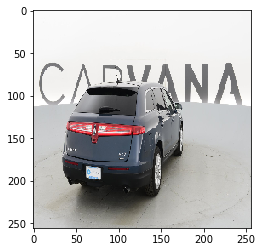

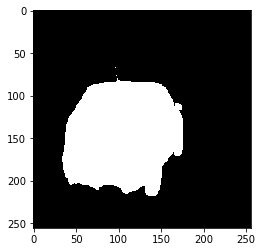

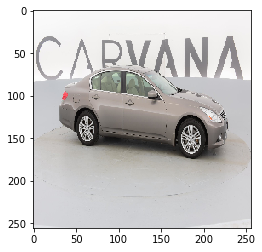

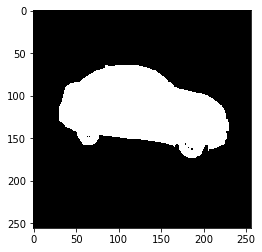

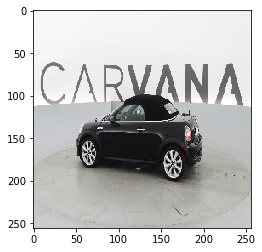

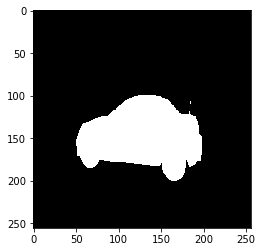

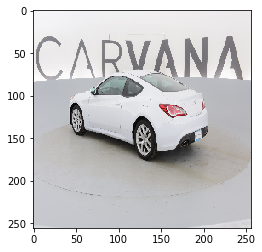

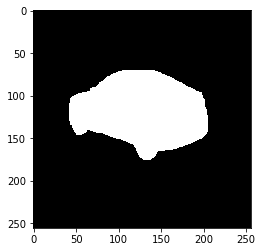

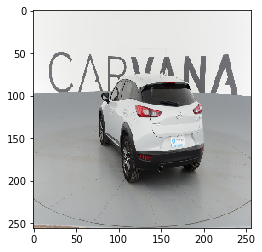

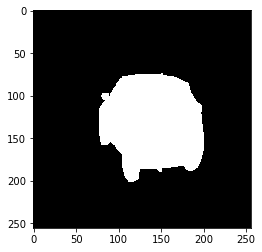

In [28]:
import random
for _ in range(5):
    i = random.randint(0, len(X_train))
    plt.imshow(X_train[i])
    plt.show()
    
    # Because the masks are 256x256x1 arrays with pixel value 0 or 1, we
    # have to use .squeeze() (to remove third axis) and grayscale
    # colormap to get a good visualization with matplotlib
    plt.imshow(mask_train[i].squeeze(), cmap='gray')
    plt.show()

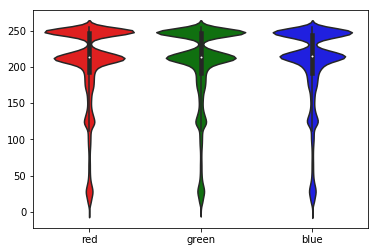

In [6]:
# Exploratory visualization of pixel intensities in each channel

reds = np.array([], dtype=X_train.dtype)
greens = np.array([], dtype=X_train.dtype)
blues = np.array([], dtype=X_train.dtype)

for img in X_train[:5]:
    reds = np.append(reds, img[:, :, 0])
    greens = np.append(greens, img[:, :, 1])
    blues = np.append(blues, img[:, :, 2])
    
    
d = {'red': reds, 'green': greens, 'blue': blues}
df = pd.DataFrame(data=d)

sns.violinplot(data=df, palette={'red': 'r', 'blue': 'b', 'green': 'g'}, order=['red', 'green', 'blue'])

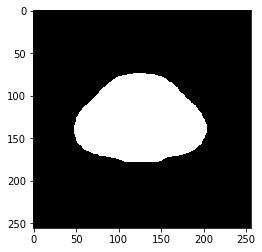

In [7]:
# Baseline - average of training mask
average_mask = np.around(np.mean(mask_train.squeeze(), axis=0))

plt.imshow(average_mask, cmap='gray')
plt.show()

In [11]:
# Implementing the dice coefficient metric in numpy
# in order to calculate the validation score of
# the average mask

def dice_coef_np(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

baseline_val_dice_coef = np.mean([dice_coef_np(val_mask, average_mask) for val_mask in mask_valid])
print(baseline_val_dice_coef)

0.738724479905


In [86]:
# from https://github.com/fchollet/keras/blob/master/keras/preprocessing/image.py#L667
def get_mean_pixel_per_layer(arr):
    mean = np.mean(arr, axis=(0, 1, 2))
    broadcast_shape = [1, 1, 1]
    broadcast_shape[3 - 1] = arr.shape[3]
    mean = np.reshape(mean, broadcast_shape)
    return mean

In [15]:
# means = get_mean_pixel_per_layer(X_train)

# calculated on training dataset
means = np.array([[[ 178.26337597,  176.48881409,  174.95852306]]])
print(means)

[[[ 178.26337597  176.48881409  174.95852306]]]


In [10]:
from keras.layers import Conv2D, MaxPooling2D, Input, UpSampling2D, Concatenate, Cropping2D, Lambda
from keras.models import Model
from keras.optimizers import Adam

def preprocess(x):
    return x - means

# Returns a U-Net, implemented with the Keras functional API
def get_unet(lr=1E-5):
    inputs = Input(shape=(256, 256, 3))
    
    # We use a Lambda layer to apply a custom preprocessing function
    # to subtract the mean pixel from each layer
    preprocessed = Lambda(preprocess)(inputs)

    
    # Each conv block of the U-Net consists of 2 convolutional layers followed by a max pooling
    # First arg is number of filters, next is filter size
    # We use padding='same' so that at the end we get a predicted mask the same size as the input image
    conv1 = Conv2D(64, (3,3), padding='same', activation='relu')(preprocessed)
    conv1 = Conv2D(64, (3,3), padding='same', activation='relu')(conv1)
    maxpooling1 = MaxPooling2D(padding='same')(conv1)

    conv2 = Conv2D(128, (3,3), padding='same', activation='relu')(maxpooling1)
    conv2 = Conv2D(128, (3,3), padding='same', activation='relu')(conv2)
    maxpooling2 = MaxPooling2D(padding='same')(conv2)

    conv3 = Conv2D(256, (3,3), padding='same', activation='relu')(maxpooling2)
    conv3 = Conv2D(256, (3,3), padding='same', activation='relu')(conv3)
    maxpooling3 = MaxPooling2D(padding='same')(conv3)

    conv4 = Conv2D(512, (3,3), padding='same', activation='relu')(maxpooling3)
    conv4 = Conv2D(512, (3,3), padding='same', activation='relu')(conv4)
    maxpooling4 = MaxPooling2D(padding='same')(conv4)

    conv5 = Conv2D(1024, (3,3), padding='same', activation='relu')(maxpooling4)
    conv5 = Conv2D(1024, (3,3), padding='same', activation='relu')(conv5)

    
    # These up-blocks consist of an upsampling layer, followed by a 2x2 conv layer (no activation),
    # then a concatenation with the output of one of the previous conv blocks,
    # and then 2 3x3 conv layers with relu activation
    upconv1 = UpSampling2D()(conv5)
    upconv1 = Conv2D(512, (2,2), padding='same')(upconv1)
    concatenated1 = Concatenate(axis=3)([upconv1, conv4])
    upconv1 = Conv2D(512, (3,3), padding='same', activation='relu')(concatenated1)
    upconv1 = Conv2D(512, (3,3), padding='same', activation='relu')(upconv1)

    upconv2 = UpSampling2D()(upconv1)
    upconv2 = Conv2D(256, (2,2), padding='same')(upconv2)
    concatenated2 = Concatenate(axis=3)([upconv2, conv3])
    upconv2 = Conv2D(256, (3,3), padding='same', activation='relu')(concatenated2)
    upconv2 = Conv2D(256, (3,3), padding='same', activation='relu')(upconv2)

    upconv3 = UpSampling2D()(upconv2)
    upconv3 = Conv2D(128, (2,2), padding='same')(upconv3)
    concatenated3 = Concatenate(axis=3)([upconv3, conv2])
    upconv3 = Conv2D(128, (3,3), padding='same', activation='relu')(concatenated3)
    upconv3 = Conv2D(128, (3,3), padding='same', activation='relu')(upconv3)

    upconv4 = UpSampling2D()(upconv3)
    upconv4 = Conv2D(64, (2,2), padding='same')(upconv4)
    concatenated4 = Concatenate(axis=3)([upconv4, conv1])
    upconv4 = Conv2D(64, (3,3), padding='same', activation='relu')(concatenated4)
    upconv4 = Conv2D(64, (3,3), padding='same', activation='relu')(upconv4)

    outputs = Conv2D(1, (1,1), padding='same', activation='sigmoid')(upconv4)

    # pass the first and last layer to make the model
    model = Model(inputs=inputs, outputs=outputs)
    
    # must complile the model before training
    model.compile(optimizer=Adam(lr=lr), loss=dice_coef_loss, metrics=[dice_coef])
    
    return model

Using TensorFlow backend.


In [80]:
from keras.layers import Dropout
from keras.constraints import maxnorm

MAXNORM_C = 6.

def get_unet_adv(lr=3E-4):
    inputs = Input(shape=(384, 576, 3))
    preprocessed = Lambda(preprocess)(inputs)
    preprocessed = Dropout(0.3)(preprocessed)

    conv1 = Conv2D(64, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(preprocessed)
#     conv1 = Dropout(0.1)(conv1)
    conv1 = Conv2D(64, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(conv1)
    
    # 0.1 means that there is a 10% probablility that a unit in this layer will be dropped
    conv1 = Dropout(0.1)(conv1)
    maxpooling1 = MaxPooling2D(padding='same')(conv1)

    conv2 = Conv2D(128, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(maxpooling1)
#     conv2 = Dropout(0.1)(conv2)
    conv2 = Conv2D(128, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(conv2)
    conv2 = Dropout(0.1)(conv2)
    maxpooling2 = MaxPooling2D(padding='same')(conv2)

    conv3 = Conv2D(256, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(maxpooling2)
    conv3 = Dropout(0.1)(conv3)
    conv3 = Conv2D(256, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(conv3)
    conv3 = Dropout(0.1)(conv3)
    maxpooling3 = MaxPooling2D(padding='same')(conv3)

    conv4 = Conv2D(512, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(maxpooling3)
    conv4 = Dropout(0.1)(conv4)
    conv4 = Conv2D(512, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(conv4)
    conv4 = Dropout(0.1)(conv4)
    maxpooling4 = MaxPooling2D(padding='same')(conv4)

    conv5 = Conv2D(1024, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(maxpooling4)
    conv5 = Dropout(0.1)(conv5)
    conv5 = Conv2D(1024, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(conv5)
    conv5 = Dropout(0.1)(conv5)

    upconv1 = UpSampling2D()(conv5)
    upconv1 = Conv2D(512, (2,2), padding='same')(upconv1)
    concatenated1 = Concatenate(axis=3)([upconv1, conv4])
    upconv1 = Conv2D(512, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(concatenated1)
    upconv1 = Dropout(0.1)(upconv1)
    upconv1 = Conv2D(512, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(upconv1)
    upconv1 = Dropout(0.1)(upconv1)
    
    upconv2 = UpSampling2D()(upconv1)
    upconv2 = Conv2D(256, (2,2), padding='same')(upconv2)
    concatenated2 = Concatenate(axis=3)([upconv2, conv3])
    upconv2 = Conv2D(256, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(concatenated2)
    upconv2 = Dropout(0.1)(upconv2)
    upconv2 = Conv2D(256, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(upconv2)
    upconv2 = Dropout(0.1)(upconv2)

    upconv3 = UpSampling2D()(upconv2)
    upconv3 = Conv2D(128, (2,2), padding='same')(upconv3)
    concatenated3 = Concatenate(axis=3)([upconv3, conv2])
    upconv3 = Conv2D(128, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(concatenated3)
    upconv3 = Dropout(0.1)(upconv3)
    upconv3 = Conv2D(128, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(upconv3)
    upconv3 = Dropout(0.1)(upconv3)

    upconv4 = UpSampling2D()(upconv3)
    upconv4 = Conv2D(64, (2,2), padding='same')(upconv4)
    concatenated4 = Concatenate(axis=3)([upconv4, conv1])
    upconv4 = Conv2D(64, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(concatenated4)
    upconv4 = Dropout(0.1)(upconv4)
    upconv4 = Conv2D(64, (3,3), padding='same', activation='relu', kernel_constraint=maxnorm(MAXNORM_C))(upconv4)
    upconv4 = Dropout(0.1)(upconv4)

    outputs = Conv2D(1, (1,1), padding='same', activation='sigmoid')(upconv4)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(lr=lr), loss=dice_coef_loss, metrics=[dice_coef])
    
    return model

In [82]:
batch_size = 8

# adapted from https://keras.io/preprocessing/image/
image_datagen = ImageDataGenerator()
mask_datagen = ImageDataGenerator()

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 1
# image_datagen.fit(images, seed=seed)
# mask_datagen.fit(masks, seed=seed)

image_train_generator = image_datagen.flow(
    X_train,
    batch_size=batch_size,
    seed=seed)

mask_train_generator = mask_datagen.flow(
    mask_train,
    batch_size=batch_size,
    seed=seed)

image_val_generator = image_datagen.flow(
    X_valid,
    batch_size=batch_size,
    seed=seed)

mask_val_generator = mask_datagen.flow(
    mask_valid,
    batch_size=batch_size,
    seed=seed)

# combine generators into one which yields image and masks
train_generator = zip(image_train_generator, mask_train_generator)
val_generator = zip(image_val_generator, mask_val_generator)

In [13]:
batch_size = 20

# adapted from https://keras.io/preprocessing/image/

# specify desired parameters for image augmentation
gen_settings = dict(
    rotation_range=15, 
    height_shift_range=0.05,
    shear_range=0.1, 
    width_shift_range=0.1,
    horizontal_flip=True
)

image_datagen = ImageDataGenerator(**gen_settings)
mask_datagen = ImageDataGenerator(**gen_settings)
image_val_datagen = ImageDataGenerator()
mask_val_datagen = ImageDataGenerator()

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 1
# image_datagen.fit(images, seed=seed)
# mask_datagen.fit(masks, seed=seed)

image_train_generator = image_datagen.flow(
    X_train,
    batch_size=batch_size,
    seed=seed)

mask_train_generator = mask_datagen.flow(
    mask_train,
    batch_size=batch_size,
    seed=seed)

image_val_generator = image_val_datagen.flow(
    X_valid,
    batch_size=batch_size,
    seed=seed)

mask_val_generator = mask_val_datagen.flow(
    mask_valid,
    batch_size=batch_size,
    seed=seed)

# combine generators into one which yields image and masks
train_generator = zip(image_train_generator, mask_train_generator)
val_generator = zip(image_val_generator, mask_val_generator)

In [ ]:
from keras.callbacks import ModelCheckpoint
import pickle

# necessary to clear memory from previous models during experimentation
# del model
K.clear_session()
model = get_unet()
epochs = 50

# This Keras callback will save the weights of the model with the 
# best validations core to this filepath
filepath= "weights-aug.best.hdf5"
checkpoint = ModelCheckpoint(filepath, save_best_only=True)
callbacks = [checkpoint]

history = model.fit_generator(
    train_generator,
    # taking this many steps for epoch means that the model will train on each
    # image during each epoch
    steps_per_epoch=len(X_train) // batch_size,
    epochs=epochs,
    validation_data=val_generator,
    validation_steps=len(X_valid) // batch_size,
    callbacks=callbacks,
)
pickle.dump(history.history, open(DATA_DIR + 'history-aug.pkl', 'wb'))

Epoch 1/50
 13/203 [>.............................] - ETA: 914s - loss: -0.4610 - dice_coef: 0.4610

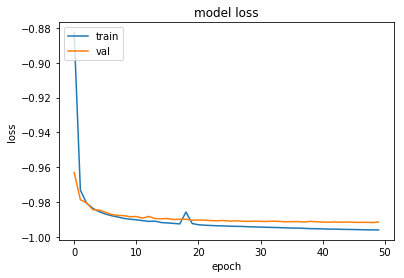

-0.991748332977


In [16]:
history = pickle.load(open(DATA_DIR + 'history-1.pkl', 'rb'))

# from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

print(min(history['val_loss']))

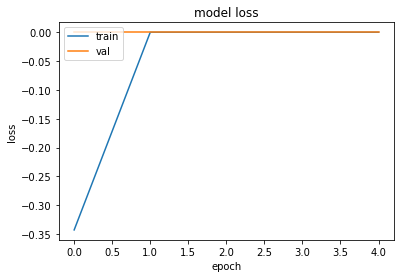

-5.56329504064e-06


In [20]:
import matplotlib.pyplot as plt

history = pickle.load(open(DATA_DIR + 'history-6.pkl', 'rb'))

# from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

print(min(history['val_loss']))

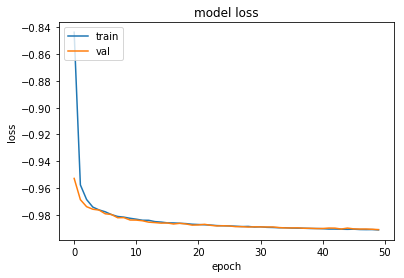

-0.991101867174


In [19]:
history = pickle.load(open(DATA_DIR + 'history-aug.pkl', 'rb'))

# from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

print(min(history['val_loss']))

In [20]:
model = get_unet()
weights_path = "weights-1.best.hdf5"
model.load_weights(weights_path)

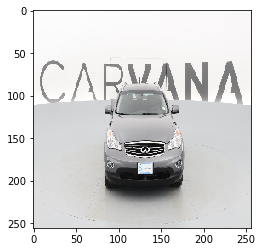

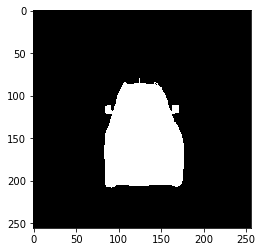

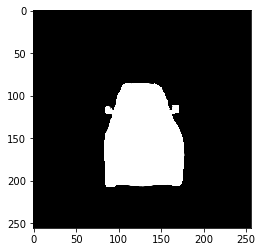

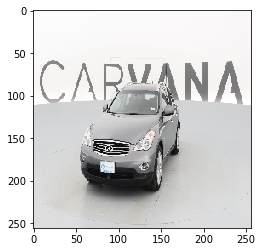

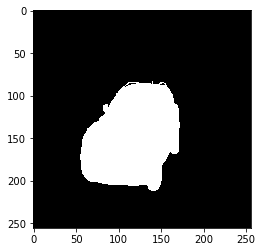

...

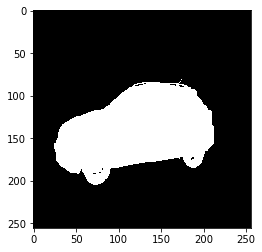

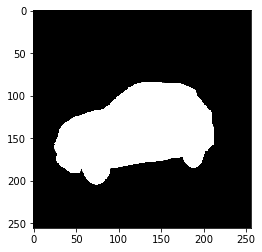

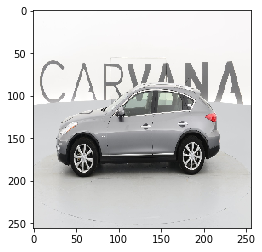

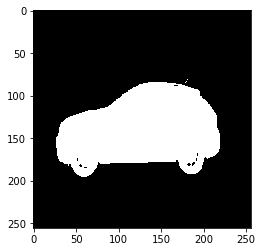

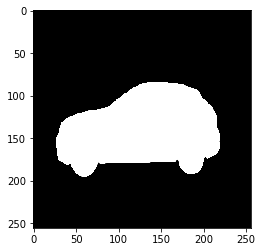

In [21]:
for i in range(5):
    plt.imshow(X_train[i])
    plt.show()

    plt.imshow(mask_train[i].squeeze(), cmap='gray')
    plt.show()

    preds = model.predict(np.expand_dims(X_train[i], axis=0))
    plt.imshow(preds[0].squeeze(), cmap='gray')
    plt.show()

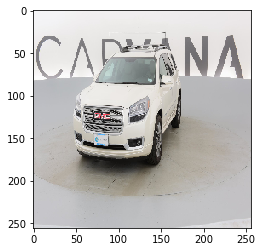

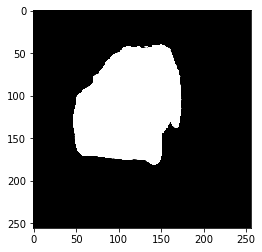

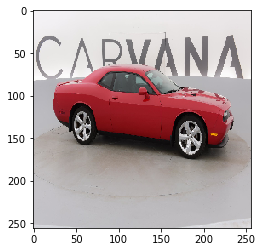

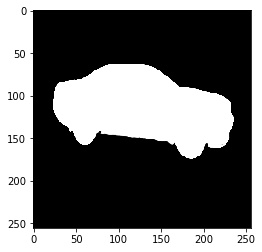

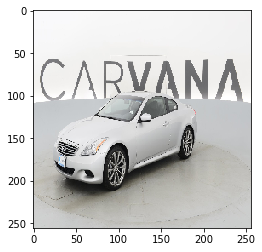

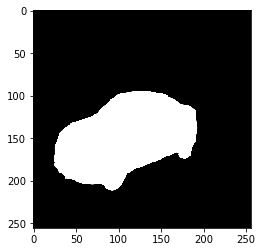

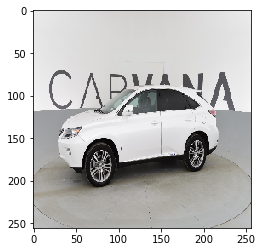

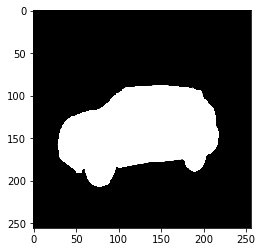

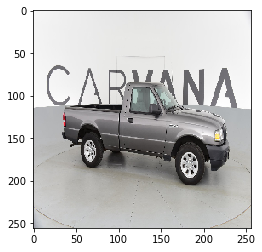

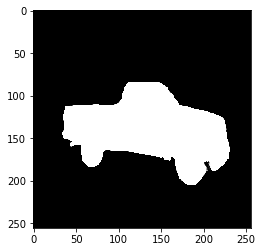

In [24]:
import matplotlib.pyplot as plt
import random

for i in range(5):
    i = random.randint(0, len(X_valid) - 1)
    plt.imshow(X_valid[i])
    plt.show()

#     plt.imshow(mask_valid[i].squeeze(), cmap='gray')
#     plt.show()

    preds = model.predict(np.expand_dims(X_valid[i], axis=0))
    plt.imshow(preds[0].squeeze(), cmap='gray')
    plt.show()

In [20]:
# Submitting to Kaggle

TEST_IMG_DIR = DATA_DIR + 'test_hq/'

In [123]:
%cd $DATA_DIR
!unzip test_hq.zip

/home/ubuntu/udacity-capstone/data
Archive:  test_hq.zip
   creating: test_hq/
  inflating: test_hq/9e6401de37e5_13.jpg  
  inflating: test_hq/489e9c3d7dc2_09.jpg  
  inflating: test_hq/ac90e59d457c_05.jpg  
  inflating: test_hq/893f8ef833c2_09.jpg  
  inflating: test_hq/b201ea3eabc9_10.jpg  
  inflating: test_hq/6dacefb991be_01.jpg  
  inflating: test_hq/dd4d31efbc52_12.jpg  
  inflating: test_hq/2e217da813cc_08.jpg  
  inflating: test_hq/7082879301ab_04.jpg  
  inflating: test_hq/eef28c729ee3_09.jpg  
  inflating: test_hq/fbb359776635_02.jpg  
  inflating: test_hq/70f703193b23_12.jpg  
  inflating: test_hq/f506fb616f4c_16.jpg  
  inflating: test_hq/f1ea1c6780f6_09.jpg  
  inflating: test_hq/a2b2903549bf_02.jpg  
  inflating: test_hq/f6f7eed7acf4_02.jpg  
  inflating: test_hq/cf82525809dd_13.jpg  
  inflating: test_hq/b51440d35878_12.jpg  
  inflating: test_hq/88940c598c48_05.jpg  
  inflating: test_hq/99d194d54f6a_05.jpg  
  inflating: test_hq/41680fdf745c_10.jpg  
  inflating: test_

  inflating: test_hq/0b73517ef85b_04.jpg  
  inflating: test_hq/5b51e0e14509_16.jpg  
  inflating: test_hq/7c42686e2b67_15.jpg  
  inflating: test_hq/42ccde07cb34_01.jpg  
  inflating: test_hq/7d8aa88e9d95_11.jpg  
  inflating: test_hq/dd651b540fc1_08.jpg  
  inflating: test_hq/039aae672564_16.jpg  
  inflating: test_hq/047de80441e5_14.jpg  
  inflating: test_hq/f9b97893dd01_09.jpg  
  inflating: test_hq/b5156f9c126d_07.jpg  
  inflating: test_hq/6c46412afca8_07.jpg  
  inflating: test_hq/b7e457fe3146_04.jpg  
  inflating: test_hq/0f3be372397a_13.jpg  
  inflating: test_hq/fc9399fafb30_01.jpg  
  inflating: test_hq/e36b6abe0d79_03.jpg  
  inflating: test_hq/4d1a89beb340_07.jpg  
  inflating: test_hq/ac7257132cd5_08.jpg  
  inflating: test_hq/46e9fb17c281_03.jpg  
  inflating: test_hq/8e0c3c81913f_11.jpg  
  inflating: test_hq/3d33e3e3c89c_05.jpg  
  inflating: test_hq/7d3bf2f7b3d3_09.jpg  
  inflating: test_hq/ab72cdcf2c96_03.jpg  
  inflating: test_hq/97e4d7201261_13.jpg  
  inflating

  inflating: test_hq/478e02a475d6_16.jpg  
  inflating: test_hq/999fbdd2eb36_01.jpg  
  inflating: test_hq/260268d6b1b6_04.jpg  
  inflating: test_hq/0b9d03ec6720_13.jpg  
  inflating: test_hq/e0deda6ea3d5_08.jpg  
  inflating: test_hq/89b820277d40_13.jpg  
  inflating: test_hq/37002b578904_06.jpg  
  inflating: test_hq/cdb152523e1a_10.jpg  
  inflating: test_hq/8029b187cd88_11.jpg  
  inflating: test_hq/8e2ce055e145_06.jpg  
  inflating: test_hq/6384fdb9f867_16.jpg  
  inflating: test_hq/2ee93b75d6b8_06.jpg  
  inflating: test_hq/aea009f01f97_01.jpg  
  inflating: test_hq/922e277a02f4_01.jpg  
  inflating: test_hq/f254e1ca283f_01.jpg  
  inflating: test_hq/4b32c1c70355_09.jpg  
  inflating: test_hq/b358fc5f85cd_06.jpg  
  inflating: test_hq/857e79e097fa_14.jpg  
  inflating: test_hq/166d0fffbf1f_07.jpg  
  inflating: test_hq/c88cb61e5117_10.jpg  
  inflating: test_hq/af7fe7b587b2_12.jpg  
  inflating: test_hq/6c050e922dae_01.jpg  
  inflating: test_hq/33e4cb8faaa0_16.jpg  
  inflating

  inflating: test_hq/9178d44da004_12.jpg  
  inflating: test_hq/4adeac38cc34_07.jpg  
  inflating: test_hq/a21beb0cfc47_03.jpg  
  inflating: test_hq/2535778b48d3_10.jpg  
  inflating: test_hq/5181ff97c8c3_02.jpg  
  inflating: test_hq/4fd512532d37_11.jpg  
  inflating: test_hq/4be4ef147e80_14.jpg  
  inflating: test_hq/59d6888f0b70_07.jpg  
  inflating: test_hq/10bf107dc524_02.jpg  
  inflating: test_hq/ada63799a271_05.jpg  
  inflating: test_hq/ca377e2213e6_02.jpg  
  inflating: test_hq/94567fd5f5c8_12.jpg  
  inflating: test_hq/fc79dc2d85d2_12.jpg  
  inflating: test_hq/7c0ffd97acc1_01.jpg  
  inflating: test_hq/c1de98e11cd8_12.jpg  
  inflating: test_hq/308d0eb467f2_04.jpg  
  inflating: test_hq/b0bd31f85708_11.jpg  
  inflating: test_hq/eb83e97ea7af_15.jpg  
  inflating: test_hq/86efd8ca74d1_12.jpg  
  inflating: test_hq/adbd1752cb09_12.jpg  
  inflating: test_hq/b433c35ee567_16.jpg  
  inflating: test_hq/3e7561bfb5ad_12.jpg  
  inflating: test_hq/93025ea4ce59_03.jpg  
  inflating

  inflating: test_hq/5de358d115a2_06.jpg  
  inflating: test_hq/a61201af003e_05.jpg  
  inflating: test_hq/01d0c99fb9f4_01.jpg  
  inflating: test_hq/29dcd633a24c_09.jpg  
  inflating: test_hq/3a68c97adc86_09.jpg  
  inflating: test_hq/5b4b7ee85c94_09.jpg  
  inflating: test_hq/a891235368c8_13.jpg  
  inflating: test_hq/f5a781b21a19_16.jpg  
  inflating: test_hq/b3fc1be81387_11.jpg  
  inflating: test_hq/2c4fbb0bf79b_16.jpg  
  inflating: test_hq/0eb3bb86986c_08.jpg  
  inflating: test_hq/6b253762e945_04.jpg  
  inflating: test_hq/da08ec3fc368_01.jpg  
  inflating: test_hq/9311a629a6d1_04.jpg  
  inflating: test_hq/616768ac3732_14.jpg  
  inflating: test_hq/c664bf56f229_13.jpg  
  inflating: test_hq/1b3fe620f5d2_04.jpg  
  inflating: test_hq/7324efc6d564_06.jpg  
  inflating: test_hq/b43ae11c3ed1_12.jpg  
  inflating: test_hq/b230b9ecb2da_11.jpg  
  inflating: test_hq/2efed70fb963_06.jpg  
  inflating: test_hq/a5aea29e4a01_10.jpg  
  inflating: test_hq/0229ea18bb1a_03.jpg  
  inflating

  inflating: test_hq/e06ac5c362d8_04.jpg  
  inflating: test_hq/bde24d4ae616_04.jpg  
  inflating: test_hq/5977d48d638c_05.jpg  
  inflating: test_hq/7f333e5e2789_08.jpg  
  inflating: test_hq/7e8718149159_02.jpg  
  inflating: test_hq/74a5ba7cef40_03.jpg  
  inflating: test_hq/4b8c13da9680_07.jpg  
  inflating: test_hq/41b863009575_02.jpg  
  inflating: test_hq/d7195de7c35d_10.jpg  
  inflating: test_hq/d47c65912778_10.jpg  
  inflating: test_hq/c3e035c7928f_08.jpg  
  inflating: test_hq/ee928ce35fef_12.jpg  
  inflating: test_hq/dc16eae14579_04.jpg  
  inflating: test_hq/0330073c45da_13.jpg  
  inflating: test_hq/d09520b408a5_05.jpg  
  inflating: test_hq/ccba30f2e3c8_09.jpg  
  inflating: test_hq/999fbdd2eb36_10.jpg  
  inflating: test_hq/4eb9d1599e50_14.jpg  
  inflating: test_hq/302eccfd84ef_13.jpg  
  inflating: test_hq/27e4939e973b_10.jpg  
  inflating: test_hq/9de472a87a27_13.jpg  
  inflating: test_hq/c9eb459ba996_14.jpg  
  inflating: test_hq/ed2c28aa9a27_11.jpg  
  inflating

  inflating: test_hq/4545292f76cb_01.jpg  
  inflating: test_hq/38354d49dde6_03.jpg  
  inflating: test_hq/eef4dd4f3d06_06.jpg  
  inflating: test_hq/c1eb34c9a571_04.jpg  
  inflating: test_hq/1c56e2c7a5a1_02.jpg  
  inflating: test_hq/501248842121_16.jpg  
  inflating: test_hq/6fa822d75532_05.jpg  
  inflating: test_hq/429e121544c8_09.jpg  
  inflating: test_hq/c45ca3d084ee_01.jpg  
  inflating: test_hq/eaff0ff4f05d_11.jpg  
  inflating: test_hq/de21c6090355_05.jpg  
  inflating: test_hq/2456f1fbe7b9_05.jpg  
  inflating: test_hq/fbb359776635_15.jpg  
  inflating: test_hq/23cc11d0f686_16.jpg  
  inflating: test_hq/c677f27158b3_13.jpg  
  inflating: test_hq/e6911f402836_09.jpg  
  inflating: test_hq/c35a56bed0cb_15.jpg  
  inflating: test_hq/2fa4a1a07ffe_10.jpg  
  inflating: test_hq/4002e9825e89_12.jpg  
  inflating: test_hq/a0e20110de0b_12.jpg  
  inflating: test_hq/882efc3f4f2a_13.jpg  
  inflating: test_hq/3ea15cd75646_05.jpg  
  inflating: test_hq/5c5cf768a081_06.jpg  
  inflating

  inflating: test_hq/828711302240_02.jpg  
  inflating: test_hq/f6b8653d56c8_04.jpg  
  inflating: test_hq/4a454b4e3c12_10.jpg  
  inflating: test_hq/31e74066a483_03.jpg  
  inflating: test_hq/2b55c79a08f4_09.jpg  
  inflating: test_hq/08763cb31b96_06.jpg  
  inflating: test_hq/b436755efeda_05.jpg  
  inflating: test_hq/80279a36ef54_01.jpg  
  inflating: test_hq/7b7931733cbf_16.jpg  
  inflating: test_hq/5e00331e6f84_13.jpg  
  inflating: test_hq/eeb2bdd0745b_14.jpg  
  inflating: test_hq/9decec428bf7_09.jpg  
  inflating: test_hq/ca27f0790960_10.jpg  
  inflating: test_hq/fd3735bcd142_05.jpg  
  inflating: test_hq/417216609666_06.jpg  
  inflating: test_hq/7508c72ed713_09.jpg  
  inflating: test_hq/f178f5cc6371_04.jpg  
  inflating: test_hq/9cb19d14cdb6_04.jpg  
  inflating: test_hq/788e1e49c027_15.jpg  
  inflating: test_hq/de0799095e77_10.jpg  
  inflating: test_hq/4f33456d8867_09.jpg  
  inflating: test_hq/def604a092a7_14.jpg  
  inflating: test_hq/088157fe8ed8_06.jpg  
  inflating

  inflating: test_hq/a25c99de8238_12.jpg  
  inflating: test_hq/c2b1bd927cc0_02.jpg  
  inflating: test_hq/ee4a79d0b587_06.jpg  
  inflating: test_hq/bf06d14474a3_11.jpg  
  inflating: test_hq/c8388e0a71e7_05.jpg  
  inflating: test_hq/ce514ac84d6e_06.jpg  
  inflating: test_hq/64dd8a8c5a39_15.jpg  
  inflating: test_hq/bfdf298b4ef1_01.jpg  
  inflating: test_hq/0809482ad153_05.jpg  
  inflating: test_hq/faf213656659_05.jpg  
  inflating: test_hq/f9fdefb5f26e_07.jpg  
  inflating: test_hq/7b157704f0b1_16.jpg  
  inflating: test_hq/604dfb2c191f_11.jpg  
  inflating: test_hq/89dba6579b19_05.jpg  
  inflating: test_hq/fb876336ca97_14.jpg  
  inflating: test_hq/edd04c0698e1_08.jpg  
  inflating: test_hq/9a4455c60c5f_15.jpg  
  inflating: test_hq/add51d2bdd83_14.jpg  
  inflating: test_hq/12f4da88f9f0_06.jpg  
  inflating: test_hq/f0e213e952b9_09.jpg  
  inflating: test_hq/7e097d195756_14.jpg  
  inflating: test_hq/c685cec2bb02_04.jpg  
  inflating: test_hq/1ff68f0d8005_13.jpg  
  inflating

  inflating: test_hq/0f1d1af96b62_01.jpg  
  inflating: test_hq/c63eeca9c4f3_15.jpg  
  inflating: test_hq/2bd7a01d9937_12.jpg  
  inflating: test_hq/cddbd781eb15_13.jpg  
  inflating: test_hq/b2eb59d8018f_04.jpg  
  inflating: test_hq/0dcdcfdaf0d3_06.jpg  
  inflating: test_hq/2add542e9f99_09.jpg  
  inflating: test_hq/f0753b5b7a74_12.jpg  
  inflating: test_hq/576e1cd8db9a_10.jpg  
  inflating: test_hq/4e0236f6d12f_05.jpg  
  inflating: test_hq/5a5692ba91e6_01.jpg  
  inflating: test_hq/3b91ada1aded_08.jpg  
  inflating: test_hq/71f8def92bff_16.jpg  
  inflating: test_hq/9440cef2d1b8_09.jpg  
  inflating: test_hq/874dfc283aed_11.jpg  
  inflating: test_hq/3dc9fead9738_08.jpg  
  inflating: test_hq/a484d9749a49_04.jpg  
  inflating: test_hq/69a542bc39f0_05.jpg  
  inflating: test_hq/c149bcf06f3d_02.jpg  
  inflating: test_hq/b1f9a774c574_15.jpg  
  inflating: test_hq/b555f289483f_10.jpg  
  inflating: test_hq/b92ead9cc08f_04.jpg  
  inflating: test_hq/bef3e66e043c_11.jpg  
  inflating

  inflating: test_hq/2b1b88c09dd3_12.jpg  
  inflating: test_hq/fd96f8da775f_11.jpg  
  inflating: test_hq/a872c6d97af2_08.jpg  
  inflating: test_hq/675dfa145705_16.jpg  
  inflating: test_hq/3c24e75a2dc3_05.jpg  
  inflating: test_hq/09bcb4fa6ca4_13.jpg  
  inflating: test_hq/be6576d145ef_06.jpg  
  inflating: test_hq/6af2534e54e7_05.jpg  
  inflating: test_hq/affdde5da9fa_04.jpg  
  inflating: test_hq/b7b161dd44fe_13.jpg  
  inflating: test_hq/5fdf29045a2a_02.jpg  
  inflating: test_hq/2a79dd331a81_05.jpg  
  inflating: test_hq/1704d999e55c_13.jpg  
  inflating: test_hq/a93ba1990c46_01.jpg  
  inflating: test_hq/d0a26d12628b_05.jpg  
  inflating: test_hq/390f36ed589a_03.jpg  
  inflating: test_hq/920a63257b39_05.jpg  
  inflating: test_hq/5fcd39e1b130_06.jpg  
  inflating: test_hq/2c484b2e9249_04.jpg  
  inflating: test_hq/7890981cc4bd_07.jpg  
  inflating: test_hq/3d33e3e3c89c_06.jpg  
  inflating: test_hq/71def195fd8a_16.jpg  
  inflating: test_hq/b58cba91e142_09.jpg  
  inflating

  inflating: test_hq/60b450725fdf_06.jpg  
  inflating: test_hq/ec69798339cf_16.jpg  
  inflating: test_hq/cddbd781eb15_11.jpg  
  inflating: test_hq/1a8d22339d20_03.jpg  
  inflating: test_hq/02421a92ddb8_02.jpg  
  inflating: test_hq/79fb0ccbed8e_06.jpg  
  inflating: test_hq/695b8becab4a_04.jpg  
  inflating: test_hq/5fcd937313cc_07.jpg  
  inflating: test_hq/ecf9510947fc_14.jpg  
  inflating: test_hq/2cd32198b38c_13.jpg  
  inflating: test_hq/8c56027a5d33_06.jpg  
  inflating: test_hq/b43ae11c3ed1_05.jpg  
  inflating: test_hq/fdca9d5d5b34_09.jpg  
  inflating: test_hq/40901588cc06_07.jpg  
  inflating: test_hq/1d2814dbd013_12.jpg  
  inflating: test_hq/417216609666_11.jpg  
  inflating: test_hq/68941682a9b7_10.jpg  
  inflating: test_hq/afc8f84eb717_07.jpg  
  inflating: test_hq/488eb6d5f085_02.jpg  
  inflating: test_hq/037bd09a4b49_03.jpg  
  inflating: test_hq/40dad47ed901_01.jpg  
  inflating: test_hq/90ceec2e3860_04.jpg  
  inflating: test_hq/ac09068b4e33_03.jpg  
  inflating

  inflating: test_hq/3a113adb5d03_06.jpg  
  inflating: test_hq/3e1279a10730_07.jpg  
  inflating: test_hq/f3a350f06e64_05.jpg  
  inflating: test_hq/96f85dcf9efd_06.jpg  
  inflating: test_hq/d93eac356f1a_06.jpg  
  inflating: test_hq/e19eee51d465_02.jpg  
  inflating: test_hq/da89221bd20d_04.jpg  
  inflating: test_hq/c827de2d34b6_08.jpg  
  inflating: test_hq/4e0890e99d1f_12.jpg  
  inflating: test_hq/448f7f27b17e_02.jpg  
  inflating: test_hq/7324efc6d564_09.jpg  
  inflating: test_hq/fd90912d3b23_07.jpg  
  inflating: test_hq/0d6004179186_13.jpg  
  inflating: test_hq/92ff1f015411_12.jpg  
  inflating: test_hq/4cce4dafa50c_14.jpg  
  inflating: test_hq/7b13106d6b4e_07.jpg  
  inflating: test_hq/fe26e42ca08c_08.jpg  
  inflating: test_hq/b4d7d7e8edcc_04.jpg  
  inflating: test_hq/924d986f0a99_08.jpg  
  inflating: test_hq/bd0758aa14e9_15.jpg  
  inflating: test_hq/74347db0cbc0_02.jpg  
  inflating: test_hq/5dfd07087933_10.jpg  
  inflating: test_hq/a959af08a35a_09.jpg  
  inflating

  inflating: test_hq/7b7f73927b20_16.jpg  
  inflating: test_hq/d73162ed2531_09.jpg  
  inflating: test_hq/b5f3432440c3_01.jpg  
  inflating: test_hq/5e2be153efa1_01.jpg  
  inflating: test_hq/bb8bc96193fb_11.jpg  
  inflating: test_hq/6d207cd673d1_09.jpg  
  inflating: test_hq/186fb0044708_15.jpg  
  inflating: test_hq/5ae20305be66_14.jpg  
  inflating: test_hq/73d0cf18c78d_01.jpg  
  inflating: test_hq/604dfb2c191f_13.jpg  
  inflating: test_hq/c4d7289b02ea_15.jpg  
  inflating: test_hq/82fac421c4aa_07.jpg  
  inflating: test_hq/94d5db4a8ec7_14.jpg  
  inflating: test_hq/22aeb6494dbb_12.jpg  
  inflating: test_hq/b540ab18fdaf_08.jpg  
  inflating: test_hq/8633566c4793_01.jpg  
  inflating: test_hq/066aa3c1ae8b_11.jpg  
  inflating: test_hq/c97ca3f4fd23_16.jpg  
  inflating: test_hq/ca671d8765eb_13.jpg  
  inflating: test_hq/76d1bb9f06a0_11.jpg  
  inflating: test_hq/3b69d6995ace_07.jpg  
  inflating: test_hq/a75c7e40257f_16.jpg  
  inflating: test_hq/94d99d1a8735_10.jpg  
  inflating

  inflating: test_hq/419372549627_15.jpg  
  inflating: test_hq/e65e03cc0c48_03.jpg  
  inflating: test_hq/292ce2c1c76b_15.jpg  
  inflating: test_hq/a92aa4586b93_01.jpg  
  inflating: test_hq/dcf758593f78_05.jpg  
  inflating: test_hq/dd7bb0c77cf0_11.jpg  
  inflating: test_hq/aaa9b5374f67_12.jpg  
  inflating: test_hq/7ecbf073eadf_13.jpg  
  inflating: test_hq/1da49354f776_08.jpg  
  inflating: test_hq/35a87b939080_11.jpg  
  inflating: test_hq/297a1a2544b0_07.jpg  
  inflating: test_hq/9300c9a3d036_14.jpg  
  inflating: test_hq/797512d9eb93_04.jpg  
  inflating: test_hq/b210f27f40aa_05.jpg  
  inflating: test_hq/11b8a4be73bf_14.jpg  
  inflating: test_hq/89908c5dd553_09.jpg  
  inflating: test_hq/dc9f8f4b8736_08.jpg  
  inflating: test_hq/f32903f9e038_03.jpg  
  inflating: test_hq/00784b3ef435_11.jpg  
  inflating: test_hq/54d2d04c8d6a_05.jpg  
  inflating: test_hq/b3fc1be81387_06.jpg  
  inflating: test_hq/b50ee0d17ba1_10.jpg  
  inflating: test_hq/d658c2c72473_12.jpg  
  inflating

  inflating: test_hq/a928c9ad3976_11.jpg  
  inflating: test_hq/19a51324c2b9_04.jpg  
  inflating: test_hq/42018a8a67d9_08.jpg  
  inflating: test_hq/ed9414af4105_05.jpg  
  inflating: test_hq/997bb7bbf1d3_15.jpg  
  inflating: test_hq/1c98905f7836_16.jpg  
  inflating: test_hq/656642c77480_15.jpg  
  inflating: test_hq/3e9159afc8dd_08.jpg  
  inflating: test_hq/237edca89911_11.jpg  
  inflating: test_hq/133d3b403ce4_15.jpg  
  inflating: test_hq/2fa43c136ec4_08.jpg  
  inflating: test_hq/1bbbb18092ca_09.jpg  
  inflating: test_hq/c593127ed675_11.jpg  
  inflating: test_hq/b2142bb76825_06.jpg  
  inflating: test_hq/da59fe2f334a_13.jpg  
  inflating: test_hq/1acd3d0c909f_16.jpg  
  inflating: test_hq/bd9c5bfdf622_05.jpg  
  inflating: test_hq/b0336d8d4e7e_07.jpg  
  inflating: test_hq/f528993a77b5_04.jpg  
  inflating: test_hq/42a78cc1d09c_15.jpg  
  inflating: test_hq/871b700ec961_05.jpg  
  inflating: test_hq/d907cc494cf2_16.jpg  
  inflating: test_hq/7e76cf950853_02.jpg  
  inflating

  inflating: test_hq/aed5e86ea25c_03.jpg  
  inflating: test_hq/a75dee97b5bb_06.jpg  
  inflating: test_hq/3762741d7049_01.jpg  
  inflating: test_hq/4a80b97e2788_01.jpg  
  inflating: test_hq/f106531ddd46_16.jpg  
  inflating: test_hq/a9c154d342c1_11.jpg  
  inflating: test_hq/a5aea29e4a01_05.jpg  
  inflating: test_hq/42927bfd7419_03.jpg  
  inflating: test_hq/f6064a9b272f_04.jpg  
  inflating: test_hq/29dcd633a24c_03.jpg  
  inflating: test_hq/79a40e382f22_12.jpg  
  inflating: test_hq/3d5f02b3db32_11.jpg  
  inflating: test_hq/c80678a7cd33_14.jpg  
  inflating: test_hq/94b700b03d0b_03.jpg  
  inflating: test_hq/1857a04770b4_10.jpg  
  inflating: test_hq/b26a52db735b_01.jpg  
  inflating: test_hq/78af23a4e522_11.jpg  
  inflating: test_hq/24603e4c5c39_12.jpg  
  inflating: test_hq/a0a4ada3018b_05.jpg  
  inflating: test_hq/72b5c1e0bac0_11.jpg  
  inflating: test_hq/4da606307c93_11.jpg  
  inflating: test_hq/aa8e93733e40_16.jpg  
  inflating: test_hq/4157dbb64e2f_14.jpg  
  inflating

  inflating: test_hq/39567002195c_10.jpg  
  inflating: test_hq/94cc89e238a8_10.jpg  
  inflating: test_hq/f0c88578941d_03.jpg  
  inflating: test_hq/f66e53cc1e22_08.jpg  
  inflating: test_hq/cb921d0a8873_13.jpg  
  inflating: test_hq/358019819e8e_01.jpg  
  inflating: test_hq/234713a3fdee_16.jpg  
  inflating: test_hq/8f1d58102a3d_01.jpg  
  inflating: test_hq/45205780ed06_06.jpg  
  inflating: test_hq/c1c837217cbc_13.jpg  
  inflating: test_hq/e88349bc0c54_13.jpg  
  inflating: test_hq/3925423d9cbf_02.jpg  
  inflating: test_hq/78af23a4e522_15.jpg  
  inflating: test_hq/8f533148925f_10.jpg  
  inflating: test_hq/1cb5142e3d42_01.jpg  
  inflating: test_hq/698ff6111cec_12.jpg  
  inflating: test_hq/dcad62ce7172_09.jpg  
  inflating: test_hq/336bedff29d0_01.jpg  
  inflating: test_hq/afdc9080146d_08.jpg  
  inflating: test_hq/048d4eba0a15_03.jpg  
  inflating: test_hq/ac6556b39a6c_02.jpg  
  inflating: test_hq/3949da0dc52c_09.jpg  
  inflating: test_hq/79d71adb01b2_10.jpg  
  inflating

  inflating: test_hq/2e1f607c0808_07.jpg  
  inflating: test_hq/26fddb40f794_04.jpg  
  inflating: test_hq/8210666febd0_05.jpg  
  inflating: test_hq/85ef5fb19e14_08.jpg  
  inflating: test_hq/5e9298352e9e_15.jpg  
  inflating: test_hq/9ea7ee9e3733_07.jpg  
  inflating: test_hq/643909188ed9_11.jpg  
  inflating: test_hq/8f54a6a0b59f_08.jpg  
  inflating: test_hq/faf81f2fb75b_05.jpg  
  inflating: test_hq/8d0c34d23b06_04.jpg  
  inflating: test_hq/79e78d5e0a1e_12.jpg  
  inflating: test_hq/16665fc68056_09.jpg  
  inflating: test_hq/769b53a77702_03.jpg  
  inflating: test_hq/1ff68f0d8005_07.jpg  
  inflating: test_hq/391d742699a4_12.jpg  
  inflating: test_hq/ad2297c11ecc_14.jpg  
  inflating: test_hq/b76f174aadd0_09.jpg  
  inflating: test_hq/207a903852e9_12.jpg  
  inflating: test_hq/708f4376461f_15.jpg  
  inflating: test_hq/2bd7a01d9937_09.jpg  
  inflating: test_hq/2edb549d1eca_01.jpg  
  inflating: test_hq/f32903f9e038_01.jpg  
  inflating: test_hq/b8436368ce98_13.jpg  
  inflating

  inflating: test_hq/b703cd178144_15.jpg  
  inflating: test_hq/d89b7e7658f6_15.jpg  
  inflating: test_hq/2141a8a59ff8_14.jpg  
  inflating: test_hq/3a68c97adc86_16.jpg  
  inflating: test_hq/6a680cbbb9cb_14.jpg  
  inflating: test_hq/2eed35b502f6_13.jpg  
  inflating: test_hq/c6fde640a12b_11.jpg  
  inflating: test_hq/55c6ac11ecd1_02.jpg  
  inflating: test_hq/088b223b4f6a_11.jpg  
  inflating: test_hq/7d8aa88e9d95_04.jpg  
  inflating: test_hq/47b43f048bc2_06.jpg  
  inflating: test_hq/1c903d2c299d_14.jpg  
  inflating: test_hq/7ed569e523a4_02.jpg  
  inflating: test_hq/8190fa2ca536_04.jpg  
  inflating: test_hq/ecd97d2a4048_15.jpg  
  inflating: test_hq/0d3203a9a5a1_11.jpg  
  inflating: test_hq/0a6636643495_04.jpg  
  inflating: test_hq/2551c7f8856e_03.jpg  
  inflating: test_hq/1ef19b898206_14.jpg  
  inflating: test_hq/b17fc662cf01_14.jpg  
  inflating: test_hq/e9bc2d02642e_10.jpg  
  inflating: test_hq/1ee65a0b1542_02.jpg  
  inflating: test_hq/380453c22045_06.jpg  
  inflating

  inflating: test_hq/9e50f5151664_11.jpg  
  inflating: test_hq/e8ebdb0d9438_13.jpg  
  inflating: test_hq/047de80441e5_04.jpg  
  inflating: test_hq/fbf567664aff_14.jpg  
  inflating: test_hq/7ad76505a897_06.jpg  
  inflating: test_hq/dc9f8f4b8736_13.jpg  
  inflating: test_hq/1704d999e55c_06.jpg  
  inflating: test_hq/35a1ac8d8f95_05.jpg  
  inflating: test_hq/0ddb74eaf9c9_15.jpg  
  inflating: test_hq/4bb0d3f09dce_07.jpg  
  inflating: test_hq/22b6303caeb0_04.jpg  
  inflating: test_hq/6ef3cad2f796_09.jpg  
  inflating: test_hq/11b86b6a9d16_16.jpg  
  inflating: test_hq/30de2ad2ba59_04.jpg  
  inflating: test_hq/c7428d591144_08.jpg  
  inflating: test_hq/aa6899ee9067_06.jpg  
  inflating: test_hq/526be56216cb_07.jpg  
  inflating: test_hq/19cfded4ecf4_15.jpg  
  inflating: test_hq/4fb9583978bd_10.jpg  
  inflating: test_hq/f2cae296f2df_07.jpg  
  inflating: test_hq/e278c536e8f5_11.jpg  
  inflating: test_hq/5fca1f3d7043_13.jpg  
  inflating: test_hq/d29123323f36_05.jpg  
  inflating

  inflating: test_hq/4a79fceb171c_09.jpg  
  inflating: test_hq/49e6886d3fb5_06.jpg  
  inflating: test_hq/70c2bff218d5_15.jpg  
  inflating: test_hq/1a5ca789e043_14.jpg  
  inflating: test_hq/389f963accf7_15.jpg  
  inflating: test_hq/fd90912d3b23_15.jpg  
  inflating: test_hq/15a917ffa8fe_05.jpg  
  inflating: test_hq/33a09dfc8e2c_08.jpg  
  inflating: test_hq/2a7e771305be_04.jpg  
  inflating: test_hq/48a21893bdf7_10.jpg  
  inflating: test_hq/0c992d7d6742_07.jpg  
  inflating: test_hq/c15a054c94d4_12.jpg  
  inflating: test_hq/8b2b712cc16a_08.jpg  
  inflating: test_hq/a71c2b05faf9_16.jpg  
  inflating: test_hq/3dc9fead9738_12.jpg  
  inflating: test_hq/11b4736cf88c_01.jpg  
  inflating: test_hq/9948496d3f63_08.jpg  
  inflating: test_hq/dba942dd6043_14.jpg  
  inflating: test_hq/ce92a0fa16bf_01.jpg  
  inflating: test_hq/a946521b9a2b_01.jpg  
  inflating: test_hq/20336e196d8e_12.jpg  
  inflating: test_hq/9971e2e75e61_16.jpg  
  inflating: test_hq/adb0da658b4b_09.jpg  
  inflating

  inflating: test_hq/863aab34cc76_10.jpg  
  inflating: test_hq/48ad40e65832_12.jpg  
  inflating: test_hq/cb69a55997df_01.jpg  
  inflating: test_hq/5a5692ba91e6_06.jpg  
  inflating: test_hq/c174b34dbdd7_05.jpg  
  inflating: test_hq/7c6f18b71c64_11.jpg  
  inflating: test_hq/537dbab636d7_06.jpg  
  inflating: test_hq/c6dfca36ecfc_04.jpg  
  inflating: test_hq/42fdc59c1d15_01.jpg  
  inflating: test_hq/d5828feb4159_03.jpg  
  inflating: test_hq/47b43f048bc2_13.jpg  
  inflating: test_hq/d555fc56233f_06.jpg  
  inflating: test_hq/d539438ac43e_09.jpg  
  inflating: test_hq/dc16eae14579_10.jpg  
  inflating: test_hq/bed92bbddc5d_06.jpg  
  inflating: test_hq/275ea9e308d7_11.jpg  
  inflating: test_hq/91ab2f7b4b2f_10.jpg  
  inflating: test_hq/b8240d50f1a7_08.jpg  
  inflating: test_hq/e357747b0fcc_02.jpg  
  inflating: test_hq/02d1713b3980_12.jpg  
  inflating: test_hq/f467868a7ca7_16.jpg  
  inflating: test_hq/4ddee8df1c07_08.jpg  
  inflating: test_hq/c43fadaf940b_13.jpg  
  inflating

  inflating: test_hq/25e383118bc2_07.jpg  
  inflating: test_hq/38cf57161704_08.jpg  
  inflating: test_hq/dd4d31efbc52_01.jpg  
  inflating: test_hq/3a72132c8d1b_06.jpg  
  inflating: test_hq/75db081c7eca_13.jpg  
  inflating: test_hq/e163acba9f2b_01.jpg  
  inflating: test_hq/ad2297c11ecc_15.jpg  
  inflating: test_hq/c0108f94241e_03.jpg  
  inflating: test_hq/620dfb778c14_14.jpg  
  inflating: test_hq/3b0b076b29f2_02.jpg  
  inflating: test_hq/a95289ff29b7_07.jpg  
  inflating: test_hq/ea200045de01_11.jpg  
  inflating: test_hq/69a0c630dbd3_05.jpg  
  inflating: test_hq/9d3fe02e9736_06.jpg  
  inflating: test_hq/7bf4920f5559_12.jpg  
  inflating: test_hq/f6064a9b272f_13.jpg  
  inflating: test_hq/74b4ef9edd74_10.jpg  
  inflating: test_hq/6b253762e945_12.jpg  
  inflating: test_hq/dfd6cb4d4f69_07.jpg  
  inflating: test_hq/94f5c5baaba1_12.jpg  
  inflating: test_hq/dd6c8354fe04_13.jpg  
  inflating: test_hq/4157dbb64e2f_15.jpg  
  inflating: test_hq/f4eeb822a38e_02.jpg  
  inflating

  inflating: test_hq/ba6e35e50c07_05.jpg  
  inflating: test_hq/17fe7cf11f5d_10.jpg  
  inflating: test_hq/6fd009261221_01.jpg  
  inflating: test_hq/d2f13ee0cf48_07.jpg  
  inflating: test_hq/bcc1edbd98a3_01.jpg  
  inflating: test_hq/066403d275f9_15.jpg  
  inflating: test_hq/b552f3701ab7_02.jpg  
  inflating: test_hq/ae715292a156_15.jpg  
  inflating: test_hq/d9a49ed3f277_12.jpg  
  inflating: test_hq/866f32be8d3b_11.jpg  
  inflating: test_hq/5cdfacd34e26_02.jpg  
  inflating: test_hq/90ceec2e3860_03.jpg  
  inflating: test_hq/537dbab636d7_09.jpg  
  inflating: test_hq/79926034ac08_15.jpg  
  inflating: test_hq/ce956ba38251_04.jpg  
  inflating: test_hq/2d07f2ef3140_08.jpg  
  inflating: test_hq/58db7da7b9e9_03.jpg  
  inflating: test_hq/b400d6c6b4e3_06.jpg  
  inflating: test_hq/f27133948a45_06.jpg  
  inflating: test_hq/637e17ca9407_09.jpg  
  inflating: test_hq/41902e49c45d_02.jpg  
  inflating: test_hq/4d026a76cad1_09.jpg  
  inflating: test_hq/de2116c78fb1_16.jpg  
  inflating

  inflating: test_hq/042090a0a696_16.jpg  
  inflating: test_hq/bd0758aa14e9_14.jpg  
  inflating: test_hq/d897fc52ff78_05.jpg  
  inflating: test_hq/da35d1e24d37_13.jpg  
  inflating: test_hq/4fd7a13dfd6c_16.jpg  
  inflating: test_hq/a0df14e6a8d9_04.jpg  
  inflating: test_hq/96d8b26e0794_16.jpg  
  inflating: test_hq/cf3aac09f5ed_01.jpg  
  inflating: test_hq/39ed1fdaa903_14.jpg  
  inflating: test_hq/7e8fea28e8d5_16.jpg  
  inflating: test_hq/aab0f1032113_13.jpg  
  inflating: test_hq/752db9352846_05.jpg  
  inflating: test_hq/2c366ec62988_11.jpg  
  inflating: test_hq/baeb0999afeb_03.jpg  
  inflating: test_hq/c521d9f33f8b_13.jpg  
  inflating: test_hq/c8b1cd85300c_02.jpg  
  inflating: test_hq/0179cf3ecd9f_16.jpg  
  inflating: test_hq/3595310e41d9_09.jpg  
  inflating: test_hq/71e47ba04557_07.jpg  
  inflating: test_hq/0efbfc30dc81_04.jpg  
  inflating: test_hq/cd28491c53f6_11.jpg  
  inflating: test_hq/7bc428f69a01_15.jpg  
  inflating: test_hq/ad55cd63e65f_02.jpg  
  inflating

  inflating: test_hq/39843f1bce45_08.jpg  
  inflating: test_hq/47540107bc57_01.jpg  
  inflating: test_hq/781df9ce53da_03.jpg  
  inflating: test_hq/e28149251f05_15.jpg  
  inflating: test_hq/1097e14ed1fa_14.jpg  
  inflating: test_hq/23cc11d0f686_03.jpg  
  inflating: test_hq/874dfc283aed_07.jpg  
  inflating: test_hq/49442a5aff6f_09.jpg  
  inflating: test_hq/392a768e2a81_04.jpg  
  inflating: test_hq/877f14a87ec8_11.jpg  
  inflating: test_hq/9b9e4fd3efff_08.jpg  
  inflating: test_hq/066c4c571496_06.jpg  
  inflating: test_hq/2321425bc909_07.jpg  
  inflating: test_hq/a7c762b576b6_10.jpg  
  inflating: test_hq/937d051bafdc_10.jpg  
  inflating: test_hq/801cf5e2f726_11.jpg  
  inflating: test_hq/d233f1a10406_03.jpg  
  inflating: test_hq/8d45c3d4351e_05.jpg  
  inflating: test_hq/4284a4588660_13.jpg  
  inflating: test_hq/dbd00769aee2_04.jpg  
  inflating: test_hq/a84fe5b21e17_13.jpg  
  inflating: test_hq/17b98f59d64c_04.jpg  
  inflating: test_hq/6aeb8a5bfda4_14.jpg  
  inflating

  inflating: test_hq/f7d24c303ef8_02.jpg  
  inflating: test_hq/b1449a0d604a_16.jpg  
  inflating: test_hq/9e328cd0973b_01.jpg  
  inflating: test_hq/0a382e5373db_05.jpg  
  inflating: test_hq/15545694af37_03.jpg  
  inflating: test_hq/975ca043d432_11.jpg  
  inflating: test_hq/33310559e58c_12.jpg  
  inflating: test_hq/88c5b71f61be_09.jpg  
  inflating: test_hq/0a2bbd5330a2_05.jpg  
  inflating: test_hq/b886f193232a_10.jpg  
  inflating: test_hq/a3ea0efbef1e_09.jpg  
  inflating: test_hq/7e746a96c456_11.jpg  
  inflating: test_hq/7e746a96c456_01.jpg  
  inflating: test_hq/c2dee5f61d9a_15.jpg  
  inflating: test_hq/3b91ada1aded_12.jpg  
  inflating: test_hq/9de1e59efa81_08.jpg  
  inflating: test_hq/81319ff7a46e_05.jpg  
  inflating: test_hq/b809440df171_01.jpg  
  inflating: test_hq/91a47ca9901c_13.jpg  
  inflating: test_hq/dd877dd9f2c5_13.jpg  
  inflating: test_hq/ca57db28d6cc_11.jpg  
  inflating: test_hq/44a0f9ce298a_01.jpg  
  inflating: test_hq/5785aed6b814_05.jpg  
  inflating

  inflating: test_hq/2739894b586d_12.jpg  
  inflating: test_hq/8a192971aedb_14.jpg  
  inflating: test_hq/69a16cf1c110_13.jpg  
  inflating: test_hq/43ba70f562dd_15.jpg  
  inflating: test_hq/a8271d663403_16.jpg  
  inflating: test_hq/fabe3d45d04a_10.jpg  
  inflating: test_hq/933f41a3d1d9_09.jpg  
  inflating: test_hq/44037031e8d4_07.jpg  
  inflating: test_hq/c664bf56f229_05.jpg  
  inflating: test_hq/5d77fc1421a2_08.jpg  
  inflating: test_hq/c0f01260e8ea_14.jpg  
  inflating: test_hq/b09483118dad_04.jpg  
  inflating: test_hq/166d0fffbf1f_03.jpg  
  inflating: test_hq/08de51b2c4d4_16.jpg  
  inflating: test_hq/72b5c1e0bac0_14.jpg  
  inflating: test_hq/95f45a2fd8c8_01.jpg  
  inflating: test_hq/22098eba3f72_05.jpg  
  inflating: test_hq/fdd2921dad10_06.jpg  
  inflating: test_hq/ee07363173f0_05.jpg  
  inflating: test_hq/f70cf45af356_02.jpg  
  inflating: test_hq/9a8e88a9ae14_03.jpg  
  inflating: test_hq/fcd0a678a7ff_02.jpg  
  inflating: test_hq/21684c355b6c_14.jpg  
  inflating

  inflating: test_hq/69edbb7a4bb4_12.jpg  
  inflating: test_hq/910a018cad4a_09.jpg  
  inflating: test_hq/eb49c8c9561c_09.jpg  
  inflating: test_hq/2b1b88c09dd3_09.jpg  
  inflating: test_hq/a93ba1990c46_07.jpg  
  inflating: test_hq/f6558a1619d8_16.jpg  
  inflating: test_hq/034f026c8e73_15.jpg  
  inflating: test_hq/a0e3f2948960_04.jpg  
  inflating: test_hq/353c67b30c32_15.jpg  
  inflating: test_hq/da89221bd20d_07.jpg  
  inflating: test_hq/b46029155467_11.jpg  
  inflating: test_hq/0091c5ec5d3d_14.jpg  
  inflating: test_hq/db806cea4297_14.jpg  
  inflating: test_hq/d3be20cd6ed2_01.jpg  
  inflating: test_hq/4ebb5a8ab2c1_15.jpg  
  inflating: test_hq/8513bb1f3bf4_03.jpg  
  inflating: test_hq/1f7723a9a313_08.jpg  
  inflating: test_hq/21bacf13c14a_01.jpg  
  inflating: test_hq/7955075fb3e8_02.jpg  
  inflating: test_hq/a09c24d71e2f_08.jpg  
  inflating: test_hq/753dabcc5936_03.jpg  
  inflating: test_hq/d23a1751230d_12.jpg  
  inflating: test_hq/cf111e812481_16.jpg  
  inflating

  inflating: test_hq/96b11e4bb0e7_11.jpg  
  inflating: test_hq/84d676d220ab_02.jpg  
  inflating: test_hq/e99764aefd2c_07.jpg  
  inflating: test_hq/47540107bc57_07.jpg  
  inflating: test_hq/2e558ef55875_01.jpg  
  inflating: test_hq/2dd9b9edbc3c_01.jpg  
  inflating: test_hq/e8e3503e84ea_10.jpg  
  inflating: test_hq/662a6ff55e17_08.jpg  
  inflating: test_hq/6b904c627a7e_16.jpg  
  inflating: test_hq/7d735a485d32_12.jpg  
  inflating: test_hq/4f37105bc81a_14.jpg  
  inflating: test_hq/ae715292a156_16.jpg  
  inflating: test_hq/e10eb22f3054_08.jpg  
  inflating: test_hq/aa6ffa6774ef_10.jpg  
  inflating: test_hq/55c79ad22d50_09.jpg  
  inflating: test_hq/392a768e2a81_15.jpg  
  inflating: test_hq/3ea15cd75646_16.jpg  
  inflating: test_hq/3a71d7886ba9_04.jpg  
  inflating: test_hq/06803cf93d06_02.jpg  
  inflating: test_hq/8303aaa24c55_02.jpg  
  inflating: test_hq/4ba1d7681cb7_07.jpg  
  inflating: test_hq/47fc944b2911_11.jpg  
  inflating: test_hq/de562c2c6a05_05.jpg  
  inflating

  inflating: test_hq/16810108025d_06.jpg  
  inflating: test_hq/7dbb17df268c_15.jpg  
  inflating: test_hq/ef97ea5abb63_07.jpg  
  inflating: test_hq/5d554b1bc64d_15.jpg  
  inflating: test_hq/2f20e17cf1d3_01.jpg  
  inflating: test_hq/cf5bedc9f40b_12.jpg  
  inflating: test_hq/ce1ed5cc81aa_10.jpg  
  inflating: test_hq/a89f57fca10b_03.jpg  
  inflating: test_hq/155dde40fc52_13.jpg  
  inflating: test_hq/a9d452ab4587_01.jpg  
  inflating: test_hq/e94750d7656c_01.jpg  
  inflating: test_hq/66ed9039a38b_06.jpg  
  inflating: test_hq/3b59c32a21ef_04.jpg  
  inflating: test_hq/ef80e7900d42_07.jpg  
  inflating: test_hq/9b15651e1a0d_12.jpg  
  inflating: test_hq/72b5c1e0bac0_06.jpg  
  inflating: test_hq/06803cf93d06_05.jpg  
  inflating: test_hq/e778b8b46001_02.jpg  
  inflating: test_hq/d09520b408a5_12.jpg  
  inflating: test_hq/f8f14cf70d81_03.jpg  
  inflating: test_hq/f27133948a45_07.jpg  
  inflating: test_hq/b1e904842f26_16.jpg  
  inflating: test_hq/d82f5253e084_05.jpg  
  inflating

  inflating: test_hq/66cd18b90776_12.jpg  
  inflating: test_hq/313d51bb0005_13.jpg  
  inflating: test_hq/a21beb0cfc47_15.jpg  
  inflating: test_hq/ad294b8d5363_03.jpg  
  inflating: test_hq/2aa7f2fca638_09.jpg  
  inflating: test_hq/391f6d38a90f_07.jpg  
  inflating: test_hq/f23c882e9918_15.jpg  
  inflating: test_hq/f3b0cedb2272_16.jpg  
  inflating: test_hq/8edfaed0cc16_12.jpg  
  inflating: test_hq/e3eef172f960_14.jpg  
  inflating: test_hq/6e9aff728baf_09.jpg  
  inflating: test_hq/c5aac4a31f03_03.jpg  
  inflating: test_hq/401b81c08188_01.jpg  
  inflating: test_hq/cf9a6e331f26_11.jpg  
  inflating: test_hq/d4f258435ef3_01.jpg  
  inflating: test_hq/bdbaae73b063_08.jpg  
  inflating: test_hq/9186a3198825_06.jpg  
  inflating: test_hq/a9886f0dda80_15.jpg  
  inflating: test_hq/450bb9ac35f9_03.jpg  
  inflating: test_hq/a8e8c8d6e30a_15.jpg  
  inflating: test_hq/4a454b4e3c12_04.jpg  
  inflating: test_hq/76ad84f5280c_12.jpg  
  inflating: test_hq/aef7f2009e98_08.jpg  
  inflating

  inflating: test_hq/419ec96007ff_06.jpg  
  inflating: test_hq/e811401b5f62_05.jpg  
  inflating: test_hq/f75c1c5d4f92_03.jpg  
  inflating: test_hq/e10eb22f3054_13.jpg  
  inflating: test_hq/0826d1082d40_16.jpg  
  inflating: test_hq/d9c0751f655c_05.jpg  
  inflating: test_hq/b26a52db735b_12.jpg  
  inflating: test_hq/2551c7f8856e_13.jpg  
  inflating: test_hq/28e49a360a65_02.jpg  
  inflating: test_hq/1cc75f01849f_07.jpg  
  inflating: test_hq/760ec2122764_02.jpg  
  inflating: test_hq/1da873717bb3_15.jpg  
  inflating: test_hq/cf5bedc9f40b_10.jpg  
  inflating: test_hq/c8c68fc04824_04.jpg  
  inflating: test_hq/c6fb2831875f_14.jpg  
  inflating: test_hq/efa634c57f66_07.jpg  
  inflating: test_hq/aeebee8f853a_03.jpg  
  inflating: test_hq/d3ea294eb8ce_16.jpg  
  inflating: test_hq/26de79af67de_07.jpg  
  inflating: test_hq/2182bdb9a480_04.jpg  
  inflating: test_hq/498fee7ddfe9_01.jpg  
  inflating: test_hq/5cc37f7f972d_12.jpg  
  inflating: test_hq/fa65361bb4d9_12.jpg  
  inflating

  inflating: test_hq/72f2c7762180_02.jpg  
  inflating: test_hq/e016a6e13052_12.jpg  
  inflating: test_hq/c82a366c5e97_02.jpg  
  inflating: test_hq/384bab3d54c1_14.jpg  
  inflating: test_hq/3781e1bd66d9_10.jpg  
  inflating: test_hq/002a1d2005bb_05.jpg  
  inflating: test_hq/64e8aa0f5bd6_13.jpg  
  inflating: test_hq/642c5fa3fd61_16.jpg  
  inflating: test_hq/2e4884c6e346_05.jpg  
  inflating: test_hq/e8c01181f5e6_11.jpg  
  inflating: test_hq/fdbb65363601_06.jpg  
  inflating: test_hq/225dd910bb42_12.jpg  
  inflating: test_hq/4d009085c3bb_16.jpg  
  inflating: test_hq/e3928f6c510d_05.jpg  
  inflating: test_hq/2be8b815118b_16.jpg  
  inflating: test_hq/307495e5d4de_13.jpg  
  inflating: test_hq/b7fda511da50_07.jpg  
  inflating: test_hq/9aed7a57647d_02.jpg  
  inflating: test_hq/5618767231de_05.jpg  
  inflating: test_hq/f2cae296f2df_03.jpg  
  inflating: test_hq/cb7c26edc3c4_16.jpg  
  inflating: test_hq/8ff28f575879_10.jpg  
  inflating: test_hq/fbad8524af39_01.jpg  
  inflating

  inflating: test_hq/8e4536ce9f49_12.jpg  
  inflating: test_hq/1e74442fff63_15.jpg  
  inflating: test_hq/70134ceefb7b_08.jpg  
  inflating: test_hq/4d9931e8def1_08.jpg  
  inflating: test_hq/f1f2bdedc6fd_12.jpg  
  inflating: test_hq/cc193b1123c9_08.jpg  
  inflating: test_hq/3e9159afc8dd_09.jpg  
  inflating: test_hq/bcd2e72d270e_03.jpg  
  inflating: test_hq/c8a79cc44b0d_01.jpg  
  inflating: test_hq/98dc3bf4a888_08.jpg  
  inflating: test_hq/b66c26e01b3f_05.jpg  
  inflating: test_hq/1d8fb3dfc33f_07.jpg  
  inflating: test_hq/abb118a4d5a9_05.jpg  
  inflating: test_hq/460d11c4f023_15.jpg  
  inflating: test_hq/35ee19f1e1c3_04.jpg  
  inflating: test_hq/cf46796613db_16.jpg  
  inflating: test_hq/bf33a64ad524_05.jpg  
  inflating: test_hq/6f734c23565f_03.jpg  
  inflating: test_hq/66cd18b90776_01.jpg  
  inflating: test_hq/432ce53ac30c_12.jpg  
  inflating: test_hq/f3739a38e67c_07.jpg  
  inflating: test_hq/c9eb459ba996_10.jpg  
  inflating: test_hq/a5de31796ede_03.jpg  
  inflating

  inflating: test_hq/c6dfca36ecfc_10.jpg  
  inflating: test_hq/4cc6a0db5477_14.jpg  
  inflating: test_hq/713d731b073f_04.jpg  
  inflating: test_hq/7699cd8d1f3d_03.jpg  
  inflating: test_hq/f254e1ca283f_02.jpg  
  inflating: test_hq/3b0b076b29f2_13.jpg  
  inflating: test_hq/f4ddb7437af9_14.jpg  
  inflating: test_hq/ef27f4860e6e_14.jpg  
  inflating: test_hq/55c6ac11ecd1_06.jpg  
  inflating: test_hq/772ab9d9e827_16.jpg  
  inflating: test_hq/d82f5253e084_09.jpg  
  inflating: test_hq/2db4e51979dc_11.jpg  
  inflating: test_hq/f8e697fe11fc_08.jpg  
  inflating: test_hq/c6adc414f867_14.jpg  
  inflating: test_hq/a1789e4c9d0c_16.jpg  
  inflating: test_hq/68493cadb046_07.jpg  
  inflating: test_hq/fb00f1f3bcae_08.jpg  
  inflating: test_hq/228c4b8adb1d_07.jpg  
  inflating: test_hq/71a81cdaec22_05.jpg  
  inflating: test_hq/6be3d5a087c2_11.jpg  
  inflating: test_hq/1ec7083006ec_16.jpg  
  inflating: test_hq/072de3cd7808_05.jpg  
  inflating: test_hq/8872d54bad31_10.jpg  
  inflating

  inflating: test_hq/7ca62eba4e95_07.jpg  
  inflating: test_hq/faf81f2fb75b_01.jpg  
  inflating: test_hq/b636fcb78ad5_16.jpg  
  inflating: test_hq/4d23c8dd69f9_05.jpg  
  inflating: test_hq/8925cf8720ef_12.jpg  
  inflating: test_hq/fe037035cec3_10.jpg  
  inflating: test_hq/c8c5e4499ea9_16.jpg  
  inflating: test_hq/2cc105fa090a_05.jpg  
  inflating: test_hq/389f963accf7_09.jpg  
  inflating: test_hq/c6af66806c01_07.jpg  
  inflating: test_hq/06fc288d444e_12.jpg  
  inflating: test_hq/4a75fe9078ec_05.jpg  
  inflating: test_hq/0dd757bc8ffd_10.jpg  
  inflating: test_hq/581eb3998df3_12.jpg  
  inflating: test_hq/875c13ee1f95_04.jpg  
  inflating: test_hq/7965123fdc0c_12.jpg  
  inflating: test_hq/f0827cd88ba2_16.jpg  
  inflating: test_hq/ff3d25f9b8d1_07.jpg  
  inflating: test_hq/b6ff6bc7678b_07.jpg  
  inflating: test_hq/14c446c8e9a3_05.jpg  
  inflating: test_hq/14c446c8e9a3_14.jpg  
  inflating: test_hq/e7a4e233ddb5_13.jpg  
  inflating: test_hq/947a2a6b8d69_12.jpg  
  inflating

  inflating: test_hq/ca853870392d_03.jpg  
  inflating: test_hq/d51a8d166b21_01.jpg  
  inflating: test_hq/4e75340afcec_10.jpg  
  inflating: test_hq/2da8873eb7a0_06.jpg  
  inflating: test_hq/1cb02a2bb795_16.jpg  
  inflating: test_hq/24cdcbe28261_16.jpg  
  inflating: test_hq/dda35dc60edc_14.jpg  
  inflating: test_hq/00afb946a54c_02.jpg  
  inflating: test_hq/0072f74f24ca_15.jpg  
  inflating: test_hq/60640113fdd6_11.jpg  
  inflating: test_hq/7570e32c33da_07.jpg  
  inflating: test_hq/3da84d717582_11.jpg  
  inflating: test_hq/699af29172d4_13.jpg  
  inflating: test_hq/f045e98caeea_16.jpg  
  inflating: test_hq/4aea3a866764_11.jpg  
  inflating: test_hq/d46fd9c3e183_06.jpg  
  inflating: test_hq/2acdb52e0b2f_01.jpg  
  inflating: test_hq/708dac331e48_07.jpg  
  inflating: test_hq/14984755c0ff_16.jpg  
  inflating: test_hq/cb69a55997df_10.jpg  
  inflating: test_hq/e901589c0c84_15.jpg  
  inflating: test_hq/33a862858447_15.jpg  
  inflating: test_hq/ccf89ae78a3f_16.jpg  
  inflating

  inflating: test_hq/7640bc4f79dc_13.jpg  
  inflating: test_hq/0ad66cb03617_14.jpg  
  inflating: test_hq/09708ecafe5a_14.jpg  
  inflating: test_hq/add6bdc2487e_08.jpg  
  inflating: test_hq/a374755983c1_03.jpg  
  inflating: test_hq/74ba5290891b_08.jpg  
  inflating: test_hq/6fdc0068b67b_05.jpg  
  inflating: test_hq/22c67f71294c_02.jpg  
  inflating: test_hq/b2a4aed8d2d2_10.jpg  
  inflating: test_hq/32b9f56055b1_08.jpg  
  inflating: test_hq/4170b24cbdbf_11.jpg  
  inflating: test_hq/b216e126f887_02.jpg  
  inflating: test_hq/0e80f05bc010_08.jpg  
  inflating: test_hq/cda5e252abb8_10.jpg  
  inflating: test_hq/73273d32c724_02.jpg  
  inflating: test_hq/4b8c13da9680_16.jpg  
  inflating: test_hq/853c8d27d322_13.jpg  
  inflating: test_hq/8db72d2c2e5a_04.jpg  
  inflating: test_hq/2e64d944955b_01.jpg  
  inflating: test_hq/76ad84f5280c_10.jpg  
  inflating: test_hq/1b53eb3519ed_03.jpg  
  inflating: test_hq/0d97ffd34927_08.jpg  
  inflating: test_hq/4e2a517b0eaa_07.jpg  
  inflating

  inflating: test_hq/381f01cc636c_11.jpg  
  inflating: test_hq/da14e5be7c8d_01.jpg  
  inflating: test_hq/82244fe75e90_10.jpg  
  inflating: test_hq/5b4b7ee85c94_13.jpg  
  inflating: test_hq/b216e126f887_03.jpg  
  inflating: test_hq/ad6d3d144f42_05.jpg  
  inflating: test_hq/242d3b3794c0_06.jpg  
  inflating: test_hq/a11bfcb2f3e4_12.jpg  
  inflating: test_hq/7edefa0e3729_15.jpg  
  inflating: test_hq/7aa11d07e401_10.jpg  
  inflating: test_hq/779bcdcdd099_07.jpg  
  inflating: test_hq/bbf0a825bb3c_07.jpg  
  inflating: test_hq/b59697087df0_04.jpg  
  inflating: test_hq/a61201af003e_14.jpg  
  inflating: test_hq/15bd88f232c7_16.jpg  
  inflating: test_hq/11607edbdf89_09.jpg  
  inflating: test_hq/19937b1f5a11_06.jpg  
  inflating: test_hq/61c2e7ff1194_01.jpg  
  inflating: test_hq/66c655490a2e_12.jpg  
  inflating: test_hq/02fac500a5cf_13.jpg  
  inflating: test_hq/b3ade1db7116_09.jpg  
  inflating: test_hq/30e094c0a481_11.jpg  
  inflating: test_hq/063fff292433_07.jpg  
  inflating

  inflating: test_hq/f93f244d938a_04.jpg  
  inflating: test_hq/c2b286f6078a_11.jpg  
  inflating: test_hq/da90fc56e04c_02.jpg  
  inflating: test_hq/65858ff32d26_11.jpg  
  inflating: test_hq/117f500dc99e_07.jpg  
  inflating: test_hq/5daad2616665_16.jpg  
  inflating: test_hq/bd260a9c8c29_15.jpg  
  inflating: test_hq/aaf8ff555a6c_09.jpg  
  inflating: test_hq/b1b8fe37d553_10.jpg  
  inflating: test_hq/6836c7fcb929_15.jpg  
  inflating: test_hq/1026a0251afb_14.jpg  
  inflating: test_hq/a318e76b708b_08.jpg  
  inflating: test_hq/99b0d423b6d3_08.jpg  
  inflating: test_hq/09aed20baef7_10.jpg  
  inflating: test_hq/86beb641cc37_09.jpg  
  inflating: test_hq/3e15743b7da2_03.jpg  
  inflating: test_hq/9186a3198825_09.jpg  
  inflating: test_hq/e4d48727ba51_15.jpg  
  inflating: test_hq/06cb625e32b9_12.jpg  
  inflating: test_hq/11f256b60f80_09.jpg  
  inflating: test_hq/17a1f1ab0ac3_09.jpg  
  inflating: test_hq/b33123d1fd29_15.jpg  
  inflating: test_hq/313268f04960_11.jpg  
  inflating

  inflating: test_hq/456540f7b803_02.jpg  
  inflating: test_hq/d3fd9cfa40e7_16.jpg  
  inflating: test_hq/524464bcaf6e_15.jpg  
  inflating: test_hq/754551e11b01_11.jpg  
  inflating: test_hq/e6ea1b2b1f07_13.jpg  
  inflating: test_hq/3f5ad396e5c5_09.jpg  
  inflating: test_hq/6fdc0068b67b_09.jpg  
  inflating: test_hq/f7f3c5c3c7aa_15.jpg  
  inflating: test_hq/c11697d4e944_07.jpg  
  inflating: test_hq/28432a76ffd5_13.jpg  
  inflating: test_hq/abdf3891798f_12.jpg  
  inflating: test_hq/e9bc2d02642e_08.jpg  
  inflating: test_hq/94567fd5f5c8_08.jpg  
  inflating: test_hq/10438223cb80_01.jpg  
  inflating: test_hq/77c7e18baf33_15.jpg  
  inflating: test_hq/d066af6c2dcd_10.jpg  
  inflating: test_hq/a4612993ea17_08.jpg  
  inflating: test_hq/19413ca0e43c_11.jpg  
  inflating: test_hq/3546f4e6846f_04.jpg  
  inflating: test_hq/fa3d0e9674fa_03.jpg  
  inflating: test_hq/b7d25ebc0d05_12.jpg  
  inflating: test_hq/60e6f58b7860_04.jpg  
  inflating: test_hq/1c2b90ef05b8_15.jpg  
  inflating

  inflating: test_hq/f19b9216ccec_03.jpg  
  inflating: test_hq/f92742d2cf10_10.jpg  
  inflating: test_hq/6310985078dc_10.jpg  
  inflating: test_hq/14bef3ef26bb_10.jpg  
  inflating: test_hq/c980c3ea8cff_06.jpg  
  inflating: test_hq/3b04cf646240_14.jpg  
  inflating: test_hq/bb3e82816228_03.jpg  
  inflating: test_hq/ba2ccab04248_09.jpg  
  inflating: test_hq/99723b95874f_16.jpg  
  inflating: test_hq/b47c1d5b597b_02.jpg  
  inflating: test_hq/2f61f522d3ff_06.jpg  
  inflating: test_hq/b33879b1343a_07.jpg  
  inflating: test_hq/61b6044123cc_08.jpg  
  inflating: test_hq/3c23652ae5bd_12.jpg  
  inflating: test_hq/8ecc9c7d58e4_16.jpg  
  inflating: test_hq/4650890193c0_07.jpg  
  inflating: test_hq/73d0cf18c78d_02.jpg  
  inflating: test_hq/431a0a9f109d_07.jpg  
  inflating: test_hq/dd4ac003db55_02.jpg  
  inflating: test_hq/39aafbca1174_06.jpg  
  inflating: test_hq/b400d6c6b4e3_02.jpg  
  inflating: test_hq/f3586b06a6bc_03.jpg  
  inflating: test_hq/19a17d7fd5f6_02.jpg  
  inflating

  inflating: test_hq/8c6e0df1ef94_15.jpg  
  inflating: test_hq/d309010d9f0f_12.jpg  
  inflating: test_hq/3b3a885bd441_07.jpg  
  inflating: test_hq/5e9f0ac29ab3_14.jpg  
  inflating: test_hq/29bb3ece3180_06.jpg  
  inflating: test_hq/f40a2b186f76_05.jpg  
  inflating: test_hq/37d3528805b3_11.jpg  
  inflating: test_hq/0bdfb9967be2_13.jpg  
  inflating: test_hq/e7a4e233ddb5_15.jpg  
  inflating: test_hq/a1789e4c9d0c_01.jpg  
  inflating: test_hq/26665a736b6d_06.jpg  
  inflating: test_hq/b61867d312ae_14.jpg  
  inflating: test_hq/9f523f64e6f7_01.jpg  
  inflating: test_hq/846faa0eb79f_14.jpg  
  inflating: test_hq/dfc22ee2237d_10.jpg  
  inflating: test_hq/8c56027a5d33_03.jpg  
  inflating: test_hq/40ae659d9324_03.jpg  
  inflating: test_hq/1f971e2de445_10.jpg  
  inflating: test_hq/519f17c2da43_07.jpg  
  inflating: test_hq/4c744d2885fd_16.jpg  
  inflating: test_hq/a0046c0d908a_14.jpg  
  inflating: test_hq/950cbf7962f7_16.jpg  
  inflating: test_hq/fea835a895cf_08.jpg  
  inflating

  inflating: test_hq/5b36192f9471_14.jpg  
  inflating: test_hq/b5c952455bb1_13.jpg  
  inflating: test_hq/6884902dcf33_15.jpg  
  inflating: test_hq/581eb3998df3_16.jpg  
  inflating: test_hq/53e7c620f634_13.jpg  
  inflating: test_hq/4978f1c30a93_05.jpg  
  inflating: test_hq/724d33183efa_04.jpg  
  inflating: test_hq/35dd9bd19b02_06.jpg  
  inflating: test_hq/de1a41d35ffe_16.jpg  
  inflating: test_hq/abdf3891798f_09.jpg  
  inflating: test_hq/6b1fb8852b09_08.jpg  
  inflating: test_hq/27e295728590_16.jpg  
  inflating: test_hq/0347eb8f1361_10.jpg  
  inflating: test_hq/231da6eeb95a_01.jpg  
  inflating: test_hq/7e494ad628e7_07.jpg  
  inflating: test_hq/9b5ce8289162_03.jpg  
  inflating: test_hq/a6c9e8728c10_14.jpg  
  inflating: test_hq/529f87cf67bd_08.jpg  
  inflating: test_hq/aa3cf5d8dfa6_05.jpg  
  inflating: test_hq/8c56027a5d33_14.jpg  
  inflating: test_hq/11c827383ffe_02.jpg  
  inflating: test_hq/595309d0e9f8_13.jpg  
  inflating: test_hq/218e6f21c811_01.jpg  
  inflating

  inflating: test_hq/e9113fe5e69d_06.jpg  
  inflating: test_hq/399589c21633_07.jpg  
  inflating: test_hq/b0cf7c6d9718_15.jpg  
  inflating: test_hq/a587197399ca_11.jpg  
  inflating: test_hq/526be56216cb_01.jpg  
  inflating: test_hq/67fad20aa073_16.jpg  
  inflating: test_hq/d6ed99d0c50b_07.jpg  
  inflating: test_hq/913c7bf7de08_09.jpg  
  inflating: test_hq/45205780ed06_15.jpg  
  inflating: test_hq/202ff1d1e783_15.jpg  
  inflating: test_hq/95290c270914_03.jpg  
  inflating: test_hq/97c019f1a4bf_06.jpg  
  inflating: test_hq/c5183539232c_13.jpg  
  inflating: test_hq/b6873c7d417d_06.jpg  
  inflating: test_hq/a55d81b35724_15.jpg  
  inflating: test_hq/640c18396208_06.jpg  
  inflating: test_hq/c18fffb1f253_04.jpg  
  inflating: test_hq/749faf1b58d5_05.jpg  
  inflating: test_hq/edb913a8b76b_06.jpg  
  inflating: test_hq/0aa83daa6f78_07.jpg  
  inflating: test_hq/3ee7b25104ee_14.jpg  
  inflating: test_hq/42bce3843846_12.jpg  
  inflating: test_hq/8813e62dc404_16.jpg  
  inflating

  inflating: test_hq/231da6eeb95a_04.jpg  
  inflating: test_hq/af709ebc3f88_13.jpg  
  inflating: test_hq/b31788a8e21d_02.jpg  
  inflating: test_hq/f9aa2f727a8c_05.jpg  
  inflating: test_hq/231afde466ed_13.jpg  
  inflating: test_hq/cde9c47e71da_14.jpg  
  inflating: test_hq/924f5356a609_16.jpg  
  inflating: test_hq/3b91ada1aded_10.jpg  
  inflating: test_hq/de37bde5dac9_05.jpg  
  inflating: test_hq/03836d595666_05.jpg  
  inflating: test_hq/e7d366afc3bd_07.jpg  
  inflating: test_hq/7329a3a611d0_06.jpg  
  inflating: test_hq/78f0d81e9885_06.jpg  
  inflating: test_hq/98d149292e91_03.jpg  
  inflating: test_hq/efada6a7748c_14.jpg  
  inflating: test_hq/75f77a543c25_11.jpg  
  inflating: test_hq/41923fdb3f5d_15.jpg  
  inflating: test_hq/bd764fd75ff3_01.jpg  
  inflating: test_hq/e40612f71f84_03.jpg  
  inflating: test_hq/60b450725fdf_03.jpg  
  inflating: test_hq/20ea09d5d541_07.jpg  
  inflating: test_hq/06f838789041_08.jpg  
  inflating: test_hq/6d636013fbbf_06.jpg  
  inflating

  inflating: test_hq/7dcde764b655_11.jpg  
  inflating: test_hq/dbd00769aee2_06.jpg  
  inflating: test_hq/27f5a3f74a2e_13.jpg  
  inflating: test_hq/fff341f26a19_08.jpg  
  inflating: test_hq/a52a274d546f_12.jpg  
  inflating: test_hq/04d469125e04_02.jpg  
  inflating: test_hq/060e5b9220aa_05.jpg  
  inflating: test_hq/b91126a458d7_01.jpg  
  inflating: test_hq/e9d6a681bafe_06.jpg  
  inflating: test_hq/838e0e5e69b5_14.jpg  
  inflating: test_hq/3296b42a1036_05.jpg  
  inflating: test_hq/71235597e4cd_04.jpg  
  inflating: test_hq/719503f23b2c_05.jpg  
  inflating: test_hq/2da8873eb7a0_09.jpg  
  inflating: test_hq/4b4308f6da14_06.jpg  
  inflating: test_hq/6fd009261221_09.jpg  
  inflating: test_hq/39843f1bce45_12.jpg  
  inflating: test_hq/f678e4f42ee6_07.jpg  
  inflating: test_hq/0bd04c75ec17_01.jpg  
  inflating: test_hq/9e168b9e6377_07.jpg  
  inflating: test_hq/f758bebb80a7_03.jpg  
  inflating: test_hq/c6668841a0fa_03.jpg  
  inflating: test_hq/e4b6cce2ef0f_01.jpg  
  inflating

  inflating: test_hq/0f1d1af96b62_09.jpg  
  inflating: test_hq/708dac331e48_08.jpg  
  inflating: test_hq/15f71a66beb4_05.jpg  
  inflating: test_hq/6a446b2c6072_05.jpg  
  inflating: test_hq/68c44ca532dc_11.jpg  
  inflating: test_hq/2c93860f3dfa_14.jpg  
  inflating: test_hq/3ff8cedf8fb4_12.jpg  
  inflating: test_hq/7fc8d30a0779_02.jpg  
  inflating: test_hq/0dcc050de087_05.jpg  
  inflating: test_hq/5a416a735bf5_16.jpg  
  inflating: test_hq/4b80dcbf9fd7_12.jpg  
  inflating: test_hq/7a92c2e33e38_05.jpg  
  inflating: test_hq/174de590731e_07.jpg  
  inflating: test_hq/748339e1e84b_14.jpg  
  inflating: test_hq/3af53d30f15b_08.jpg  
  inflating: test_hq/a61201af003e_03.jpg  
  inflating: test_hq/d4f258435ef3_16.jpg  
  inflating: test_hq/2a8bc01107b0_03.jpg  
  inflating: test_hq/42fdc59c1d15_04.jpg  
  inflating: test_hq/d1e632e3e024_07.jpg  
  inflating: test_hq/5151e6f1d4e6_08.jpg  
  inflating: test_hq/c9b543005386_03.jpg  
  inflating: test_hq/d51b42ce271d_07.jpg  
  inflating

  inflating: test_hq/0217e1bd45b9_02.jpg  
  inflating: test_hq/0a732faadfe8_13.jpg  
  inflating: test_hq/133d3b403ce4_02.jpg  
  inflating: test_hq/f44a381d22e7_07.jpg  
  inflating: test_hq/987710ba2a0b_06.jpg  
  inflating: test_hq/33367139c28d_12.jpg  
  inflating: test_hq/83944ef3a1dc_01.jpg  
  inflating: test_hq/481072c17bde_02.jpg  
  inflating: test_hq/a1219f5e1da1_06.jpg  
  inflating: test_hq/82f43066240b_05.jpg  
  inflating: test_hq/4ff1e02d5e0c_01.jpg  
  inflating: test_hq/5c5ad093a45c_07.jpg  
  inflating: test_hq/3dc7914a9b7c_07.jpg  
  inflating: test_hq/e388a3e3a107_07.jpg  
  inflating: test_hq/3b6fbb0a91ec_08.jpg  
  inflating: test_hq/dce1875dc7f1_13.jpg  
  inflating: test_hq/753516391cdb_08.jpg  
  inflating: test_hq/c8b68dd6bce1_15.jpg  
  inflating: test_hq/ceeb0818d707_11.jpg  
  inflating: test_hq/065093948b19_13.jpg  
  inflating: test_hq/9638155bc32a_03.jpg  
  inflating: test_hq/3b8e6066dbde_05.jpg  
  inflating: test_hq/9cd1a1d0ab29_08.jpg  
  inflating

  inflating: test_hq/1cf1a8e8b4bb_15.jpg  
  inflating: test_hq/8e8859031b73_10.jpg  
  inflating: test_hq/0311223b9244_03.jpg  
  inflating: test_hq/5f9cc4060f93_07.jpg  
  inflating: test_hq/09861b394f91_08.jpg  
  inflating: test_hq/b1eda604e6a5_16.jpg  
  inflating: test_hq/8be8e904b361_01.jpg  
  inflating: test_hq/53c651ce5cde_07.jpg  
  inflating: test_hq/7c107c6fa78c_02.jpg  
  inflating: test_hq/19a51324c2b9_15.jpg  
  inflating: test_hq/5cdfacd34e26_09.jpg  
  inflating: test_hq/0f84ea8711da_02.jpg  
  inflating: test_hq/9bf0fc45c5b4_07.jpg  
  inflating: test_hq/475f6eb4db87_16.jpg  
  inflating: test_hq/85e06b597f26_10.jpg  
  inflating: test_hq/abf5f3b7f193_02.jpg  
  inflating: test_hq/1a6e5829484f_02.jpg  
  inflating: test_hq/a4a802df906d_02.jpg  
  inflating: test_hq/62ae92c7897d_11.jpg  
  inflating: test_hq/5c448bca128b_04.jpg  
  inflating: test_hq/a1a69fb1124f_06.jpg  
  inflating: test_hq/532f07f97e47_16.jpg  
  inflating: test_hq/0f25cbfdcb93_03.jpg  
  inflating

  inflating: test_hq/a3d9fef3b1af_05.jpg  
  inflating: test_hq/82e7bf2a5b56_10.jpg  
  inflating: test_hq/450837a19da3_06.jpg  
  inflating: test_hq/932d925edace_13.jpg  
  inflating: test_hq/56028f6e9b23_03.jpg  
  inflating: test_hq/b6967cc95fe3_08.jpg  
  inflating: test_hq/1497f90f554d_09.jpg  
  inflating: test_hq/ff4ff9100248_05.jpg  
  inflating: test_hq/ad942fc3e298_16.jpg  
  inflating: test_hq/995e76a5ddea_16.jpg  
  inflating: test_hq/a91049047238_09.jpg  
  inflating: test_hq/6ac75aa0b110_08.jpg  
  inflating: test_hq/db0655a2550e_14.jpg  
  inflating: test_hq/64a96418d255_14.jpg  
  inflating: test_hq/d9df232dc92c_14.jpg  
  inflating: test_hq/cfac9db83e46_11.jpg  
  inflating: test_hq/799863f92e16_08.jpg  
  inflating: test_hq/ca472112a698_11.jpg  
  inflating: test_hq/8ecc9c7d58e4_03.jpg  
  inflating: test_hq/ffda645c0344_10.jpg  
  inflating: test_hq/3b37f4920210_13.jpg  
  inflating: test_hq/5c58e07703e4_15.jpg  
  inflating: test_hq/0fa006af671b_16.jpg  
  inflating

  inflating: test_hq/e4196e8b6297_05.jpg  
  inflating: test_hq/2aa7f2fca638_01.jpg  
  inflating: test_hq/8d45c3d4351e_03.jpg  
  inflating: test_hq/136ea649c75c_03.jpg  
  inflating: test_hq/b5f3432440c3_06.jpg  
  inflating: test_hq/0579c33948b8_08.jpg  
  inflating: test_hq/e27d42294d38_14.jpg  
  inflating: test_hq/b230b9ecb2da_12.jpg  
  inflating: test_hq/46e9fb17c281_02.jpg  
  inflating: test_hq/48a2894b7022_05.jpg  
  inflating: test_hq/e5c62d7281aa_15.jpg  
  inflating: test_hq/bf33a64ad524_03.jpg  
  inflating: test_hq/6d207cd673d1_11.jpg  
  inflating: test_hq/babdb6eb7903_10.jpg  
  inflating: test_hq/4d23c8dd69f9_04.jpg  
  inflating: test_hq/ce514ac84d6e_04.jpg  
  inflating: test_hq/23918be8d448_01.jpg  
  inflating: test_hq/4284a4588660_15.jpg  
  inflating: test_hq/25e92bfba1e1_06.jpg  
  inflating: test_hq/c8388e0a71e7_09.jpg  
  inflating: test_hq/2f526e178a96_02.jpg  
  inflating: test_hq/1a5ca789e043_15.jpg  
  inflating: test_hq/63bc19659af3_08.jpg  
  inflating

  inflating: test_hq/b4cccbca3006_14.jpg  
  inflating: test_hq/a5ccb00e7669_16.jpg  
  inflating: test_hq/03980637dc0f_08.jpg  
  inflating: test_hq/63468ee860ae_15.jpg  
  inflating: test_hq/a02dbf17a115_13.jpg  
  inflating: test_hq/e11b552070b0_14.jpg  
  inflating: test_hq/1cd24dbe2e56_02.jpg  
  inflating: test_hq/8c8ac3656710_12.jpg  
  inflating: test_hq/a8462ef0a5a7_01.jpg  
  inflating: test_hq/4adf21536327_08.jpg  
  inflating: test_hq/c03da2ebdde5_06.jpg  
  inflating: test_hq/f199ee94d1c5_14.jpg  
  inflating: test_hq/f3739a38e67c_04.jpg  
  inflating: test_hq/7632368824f9_03.jpg  
  inflating: test_hq/0489d3f9b1e1_16.jpg  
  inflating: test_hq/b11c41923bb5_11.jpg  
  inflating: test_hq/869491d91826_02.jpg  
  inflating: test_hq/bda71b6e4fbd_13.jpg  
  inflating: test_hq/14dcb81cd0be_04.jpg  
  inflating: test_hq/72f794f4f6c4_02.jpg  
  inflating: test_hq/8a2d32bc25e3_13.jpg  
  inflating: test_hq/4a80b97e2788_11.jpg  
  inflating: test_hq/2058cc4d810e_13.jpg  
  inflating

  inflating: test_hq/f6064a9b272f_06.jpg  
  inflating: test_hq/cda19cd2fc7a_01.jpg  
  inflating: test_hq/3300a114bf1c_02.jpg  
  inflating: test_hq/614a896a8a52_09.jpg  
  inflating: test_hq/7f587a7d62fe_03.jpg  
  inflating: test_hq/4f06e92e4b22_04.jpg  
  inflating: test_hq/6f4be8a1e129_02.jpg  
  inflating: test_hq/8362ba0d3412_04.jpg  
  inflating: test_hq/cfd06fa0a938_06.jpg  
  inflating: test_hq/69de06ea9205_02.jpg  
  inflating: test_hq/02fac500a5cf_12.jpg  
  inflating: test_hq/53b1f05906f8_10.jpg  
  inflating: test_hq/dd651b540fc1_06.jpg  
  inflating: test_hq/2a67dc0e82de_08.jpg  
  inflating: test_hq/6620d3256fcb_16.jpg  
  inflating: test_hq/d9aad12bec69_06.jpg  
  inflating: test_hq/2395e29e106d_06.jpg  
  inflating: test_hq/b216e126f887_06.jpg  
  inflating: test_hq/f91101fab16b_08.jpg  
  inflating: test_hq/51c4ed704179_09.jpg  
  inflating: test_hq/9b83c913f844_14.jpg  
  inflating: test_hq/00322b309335_06.jpg  
  inflating: test_hq/47540107bc57_10.jpg  
  inflating

  inflating: test_hq/9233f8a85bbe_03.jpg  
  inflating: test_hq/f0f23dbd9c96_07.jpg  
  inflating: test_hq/134b31bb0653_12.jpg  
  inflating: test_hq/5d9354596f46_06.jpg  
  inflating: test_hq/4ecf1d20c5cd_07.jpg  
  inflating: test_hq/c6f1b1bd75de_08.jpg  
  inflating: test_hq/79c8f52b03ed_09.jpg  
  inflating: test_hq/7bf4920f5559_07.jpg  
  inflating: test_hq/f7c07cec9bc2_11.jpg  
  inflating: test_hq/04de56a06fc3_16.jpg  
  inflating: test_hq/a2d687aa5685_05.jpg  
  inflating: test_hq/7bc428f69a01_13.jpg  
  inflating: test_hq/832354e4f05d_07.jpg  
  inflating: test_hq/2985b04bc806_01.jpg  
  inflating: test_hq/73ba35ceaaf4_06.jpg  
  inflating: test_hq/052d90089246_13.jpg  
  inflating: test_hq/adad36e6c490_14.jpg  
  inflating: test_hq/fe0acb1321be_05.jpg  
  inflating: test_hq/4170b24cbdbf_01.jpg  
  inflating: test_hq/70bf1a9b7f69_15.jpg  
  inflating: test_hq/02bbfca488bd_05.jpg  
  inflating: test_hq/739d0cd2c184_15.jpg  
  inflating: test_hq/b9db509fe0ee_14.jpg  
  inflating

  inflating: test_hq/c3e2353d4043_15.jpg  
  inflating: test_hq/291fef136414_06.jpg  
  inflating: test_hq/018f26e4d1aa_16.jpg  
  inflating: test_hq/4da06870532e_14.jpg  
  inflating: test_hq/67155beda412_10.jpg  
  inflating: test_hq/b3fc0286926e_01.jpg  
  inflating: test_hq/1d49a33854bd_03.jpg  
  inflating: test_hq/4021d931aa1f_14.jpg  
  inflating: test_hq/8ed97818a253_03.jpg  
  inflating: test_hq/6df921a8a142_11.jpg  
  inflating: test_hq/65e7c7c8dfb0_01.jpg  
  inflating: test_hq/56eb7a8ed886_06.jpg  
  inflating: test_hq/7c0805310162_04.jpg  
  inflating: test_hq/f7d24c303ef8_06.jpg  
  inflating: test_hq/a6d2ade172eb_02.jpg  
  inflating: test_hq/8d264e1a437c_13.jpg  
  inflating: test_hq/7098207f33cc_16.jpg  
  inflating: test_hq/2ef4478db967_05.jpg  
  inflating: test_hq/6ba331bd1013_01.jpg  
  inflating: test_hq/27428dcc0a27_03.jpg  
  inflating: test_hq/f4f2c3ad986b_01.jpg  
  inflating: test_hq/35a1ac8d8f95_08.jpg  
  inflating: test_hq/7672acd50339_09.jpg  
  inflating

  inflating: test_hq/d9c9731bc19c_13.jpg  
  inflating: test_hq/1b8acaf45e23_14.jpg  
  inflating: test_hq/8c6cbeb2eff6_07.jpg  
  inflating: test_hq/2dbe5eb0cdaa_03.jpg  
  inflating: test_hq/c2ad5e0273f7_14.jpg  
  inflating: test_hq/78f2c1ce6f95_16.jpg  
  inflating: test_hq/225dd910bb42_05.jpg  
  inflating: test_hq/372419dbc265_07.jpg  
  inflating: test_hq/c8b68dd6bce1_05.jpg  
  inflating: test_hq/6a334583dcdd_10.jpg  
  inflating: test_hq/98dc3bf4a888_02.jpg  
  inflating: test_hq/456403fe6d82_15.jpg  
  inflating: test_hq/fb3cb0b3bef6_08.jpg  
  inflating: test_hq/7b45951afd4d_04.jpg  
  inflating: test_hq/832354e4f05d_09.jpg  
  inflating: test_hq/a89e9ceb6066_15.jpg  
  inflating: test_hq/eb8be2b6ee7d_02.jpg  
  inflating: test_hq/7f4e0738f3f2_08.jpg  
  inflating: test_hq/84637853cf16_09.jpg  
  inflating: test_hq/e60fdfc3a229_13.jpg  
  inflating: test_hq/5dacc9eb8799_05.jpg  
  inflating: test_hq/2adf2b09c8ff_14.jpg  
  inflating: test_hq/94cc89e238a8_06.jpg  
  inflating

  inflating: test_hq/568140bae30b_13.jpg  
  inflating: test_hq/72ecc5c35081_04.jpg  
  inflating: test_hq/4a8955eb3bbc_14.jpg  
  inflating: test_hq/e070e1c26f08_08.jpg  
  inflating: test_hq/cfac9db83e46_03.jpg  
  inflating: test_hq/715d16a35a44_10.jpg  
  inflating: test_hq/cddbd781eb15_01.jpg  
  inflating: test_hq/f6f7eed7acf4_09.jpg  
  inflating: test_hq/81c81c1297cc_16.jpg  
  inflating: test_hq/7b71fe5fcf7e_07.jpg  
  inflating: test_hq/ab7b9e2fb043_04.jpg  
  inflating: test_hq/3005257dae62_14.jpg  
  inflating: test_hq/488eb6d5f085_07.jpg  
  inflating: test_hq/effe6b20ba20_16.jpg  
  inflating: test_hq/5074688918dc_06.jpg  
  inflating: test_hq/5e9af03ad92c_04.jpg  
  inflating: test_hq/c55165600e67_13.jpg  
  inflating: test_hq/61f417ffd55d_10.jpg  
  inflating: test_hq/04a1497734b3_16.jpg  
  inflating: test_hq/9422704a5746_16.jpg  
  inflating: test_hq/c94749e8f4e1_08.jpg  
  inflating: test_hq/f69b2ac10198_14.jpg  
  inflating: test_hq/ecfef2aeb576_14.jpg  
  inflating

  inflating: test_hq/9200fc2df32f_08.jpg  
  inflating: test_hq/4cc6a0db5477_07.jpg  
  inflating: test_hq/ea911b6e67ef_12.jpg  
  inflating: test_hq/584b12d62046_10.jpg  
  inflating: test_hq/b3dc6ad43d1d_10.jpg  
  inflating: test_hq/938f4dad559a_12.jpg  
  inflating: test_hq/c8985776c667_10.jpg  
  inflating: test_hq/dd93ede7ecab_06.jpg  
  inflating: test_hq/76167e90ba8d_04.jpg  
  inflating: test_hq/a5ac045c1d5b_09.jpg  
  inflating: test_hq/bda86418f734_01.jpg  
  inflating: test_hq/af35c84c06b8_06.jpg  
  inflating: test_hq/b48221457aa2_01.jpg  
  inflating: test_hq/9cc6f12ebb3e_01.jpg  
  inflating: test_hq/1680cbf5b574_11.jpg  
  inflating: test_hq/e29bfaa892e9_16.jpg  
  inflating: test_hq/f4de0ded19af_16.jpg  
  inflating: test_hq/fdbb65363601_09.jpg  
  inflating: test_hq/7acdae770c52_08.jpg  
  inflating: test_hq/dd348295fd16_16.jpg  
  inflating: test_hq/8e16416e5883_13.jpg  
  inflating: test_hq/42185c1d90ee_11.jpg  
  inflating: test_hq/4a5de554e6a9_09.jpg  
  inflating

  inflating: test_hq/e29466a7ba28_13.jpg  
  inflating: test_hq/bde6e2f53ccd_13.jpg  
  inflating: test_hq/bb8bc96193fb_05.jpg  
  inflating: test_hq/8e78c266b870_08.jpg  
  inflating: test_hq/f9c0a5393fc2_12.jpg  
  inflating: test_hq/2682ff6e615f_16.jpg  
  inflating: test_hq/d40fcc040bd3_08.jpg  
  inflating: test_hq/e7c132b07fe1_10.jpg  
  inflating: test_hq/8e4c4c3558eb_01.jpg  
  inflating: test_hq/e049bff27295_10.jpg  
  inflating: test_hq/8156c3405aa3_12.jpg  
  inflating: test_hq/5ea989a14b2a_16.jpg  
  inflating: test_hq/e2ba0fe58439_03.jpg  
  inflating: test_hq/8a7e933f8289_05.jpg  
  inflating: test_hq/b49c5a1ee09d_16.jpg  
  inflating: test_hq/b91126a458d7_07.jpg  
  inflating: test_hq/b809440df171_16.jpg  
  inflating: test_hq/d0a26d12628b_14.jpg  
  inflating: test_hq/9c4286493bde_14.jpg  
  inflating: test_hq/422c0c9683df_16.jpg  
  inflating: test_hq/b49c5a1ee09d_07.jpg  
  inflating: test_hq/3d19edde296e_15.jpg  
  inflating: test_hq/0d24b7bea210_06.jpg  
  inflating

  inflating: test_hq/389f963accf7_13.jpg  
  inflating: test_hq/da59fe2f334a_02.jpg  
  inflating: test_hq/bfd3126e0572_12.jpg  
  inflating: test_hq/698ff6111cec_05.jpg  
  inflating: test_hq/b66c26e01b3f_13.jpg  
  inflating: test_hq/901aeb7b0db9_12.jpg  
  inflating: test_hq/03c25511587d_09.jpg  
  inflating: test_hq/ce6239727b35_07.jpg  
  inflating: test_hq/9add7d064d40_11.jpg  
  inflating: test_hq/b648d3b4f67b_06.jpg  
  inflating: test_hq/b48221457aa2_13.jpg  
  inflating: test_hq/028e12c2111b_03.jpg  
  inflating: test_hq/0489d3f9b1e1_07.jpg  
  inflating: test_hq/9bc9d290dda3_05.jpg  
  inflating: test_hq/21b004c947b8_10.jpg  
  inflating: test_hq/1ddef03af53f_05.jpg  
  inflating: test_hq/edac5605d41d_05.jpg  
  inflating: test_hq/7b807c756d15_02.jpg  
  inflating: test_hq/d81f9d579a62_03.jpg  
  inflating: test_hq/357b743c7f28_07.jpg  
  inflating: test_hq/953616196689_08.jpg  
  inflating: test_hq/de1a41d35ffe_10.jpg  
  inflating: test_hq/62d1af875cb5_01.jpg  
  inflating

  inflating: test_hq/57674026f0ff_05.jpg  
  inflating: test_hq/1fa3f32f568e_13.jpg  
  inflating: test_hq/d4ec949b38a4_05.jpg  
  inflating: test_hq/cd781e9daace_16.jpg  
  inflating: test_hq/551a40a7f463_12.jpg  
  inflating: test_hq/0eabbbd98f87_10.jpg  
  inflating: test_hq/d1f7f4c49c78_01.jpg  
  inflating: test_hq/ea2c321bfcfe_05.jpg  
  inflating: test_hq/283ced516f29_08.jpg  
  inflating: test_hq/bd2ee90a8406_06.jpg  
  inflating: test_hq/aea009f01f97_13.jpg  
  inflating: test_hq/3c8248f86e9f_02.jpg  
  inflating: test_hq/d658c2c72473_09.jpg  
  inflating: test_hq/b417c25db2f3_08.jpg  
  inflating: test_hq/3678921a84f9_03.jpg  
  inflating: test_hq/5dc3df11d0e7_01.jpg  
  inflating: test_hq/8a7e933f8289_12.jpg  
  inflating: test_hq/2b55c79a08f4_05.jpg  
  inflating: test_hq/981c1127953a_15.jpg  
  inflating: test_hq/a47f383ce668_08.jpg  
  inflating: test_hq/8bc160c702d5_04.jpg  
  inflating: test_hq/08ff127bfd73_06.jpg  
  inflating: test_hq/06486e5079a5_03.jpg  
  inflating

  inflating: test_hq/e7de7b0813b3_16.jpg  
  inflating: test_hq/f189b600f0d9_10.jpg  
  inflating: test_hq/b2fcaaa4d0d4_10.jpg  
  inflating: test_hq/5d77fc1421a2_09.jpg  
  inflating: test_hq/014548a9586a_04.jpg  
  inflating: test_hq/8b0907d279ea_09.jpg  
  inflating: test_hq/1554b3b13f1f_02.jpg  
  inflating: test_hq/c255e8df9742_02.jpg  
  inflating: test_hq/0d83878a36d6_04.jpg  
  inflating: test_hq/f9a1c9af77a2_11.jpg  
  inflating: test_hq/f3f46aa56eed_03.jpg  
  inflating: test_hq/f3292d1294d3_10.jpg  
  inflating: test_hq/dc284f001b1e_06.jpg  
  inflating: test_hq/91e7be3b4f60_08.jpg  
  inflating: test_hq/3cb308850649_11.jpg  
  inflating: test_hq/24883ec76ea2_13.jpg  
  inflating: test_hq/eb8be2b6ee7d_15.jpg  
  inflating: test_hq/0092275fcc63_08.jpg  
  inflating: test_hq/58db7da7b9e9_02.jpg  
  inflating: test_hq/4d1564493ff0_08.jpg  
  inflating: test_hq/5cbc9a311946_05.jpg  
  inflating: test_hq/cde89311e9f8_04.jpg  
  inflating: test_hq/25d4634d84e0_16.jpg  
  inflating

  inflating: test_hq/06f838789041_11.jpg  
  inflating: test_hq/11f256b60f80_08.jpg  
  inflating: test_hq/42185c1d90ee_05.jpg  
  inflating: test_hq/a0898832b65e_04.jpg  
  inflating: test_hq/e3928f6c510d_16.jpg  
  inflating: test_hq/cd11a7226ef5_12.jpg  
  inflating: test_hq/0c8f105618d4_12.jpg  
  inflating: test_hq/c65af63e5a96_11.jpg  
  inflating: test_hq/a71c2b05faf9_05.jpg  
  inflating: test_hq/c35a56bed0cb_01.jpg  
  inflating: test_hq/2a57488ed302_03.jpg  
  inflating: test_hq/4f1e101b2440_10.jpg  
  inflating: test_hq/b169be02b9d7_09.jpg  
  inflating: test_hq/d870445bd412_09.jpg  
  inflating: test_hq/2497163ba23e_13.jpg  
  inflating: test_hq/66ed9039a38b_14.jpg  
  inflating: test_hq/bbc70f87068d_10.jpg  
  inflating: test_hq/a7cf97bbeddb_08.jpg  
  inflating: test_hq/33a862858447_13.jpg  
  inflating: test_hq/85e06b597f26_14.jpg  
  inflating: test_hq/a61201af003e_06.jpg  
  inflating: test_hq/461c8873df58_02.jpg  
  inflating: test_hq/09861b394f91_04.jpg  
  inflating

  inflating: test_hq/fd1cf5abbc01_01.jpg  
  inflating: test_hq/6b58d964e39f_10.jpg  
  inflating: test_hq/242012671fb9_07.jpg  
  inflating: test_hq/88f948f19684_09.jpg  
  inflating: test_hq/75369c4392a8_01.jpg  
  inflating: test_hq/2f23119d350e_15.jpg  
  inflating: test_hq/de8f72dfaffa_14.jpg  
  inflating: test_hq/ba1476e721ae_14.jpg  
  inflating: test_hq/36f74b35654f_16.jpg  
  inflating: test_hq/ce6239727b35_15.jpg  
  inflating: test_hq/f294500899d3_07.jpg  
  inflating: test_hq/581eb3998df3_02.jpg  
  inflating: test_hq/226fb9cd97c8_07.jpg  
  inflating: test_hq/1cb02a2bb795_03.jpg  
  inflating: test_hq/200cb28e33f3_05.jpg  
  inflating: test_hq/c995480d903b_16.jpg  
  inflating: test_hq/a57669d3f043_13.jpg  
  inflating: test_hq/5448372e8f67_04.jpg  
  inflating: test_hq/0f3be372397a_16.jpg  
  inflating: test_hq/90922e8cd710_03.jpg  
  inflating: test_hq/93361e09c443_08.jpg  
  inflating: test_hq/e4b6cce2ef0f_03.jpg  
  inflating: test_hq/d51b42ce271d_12.jpg  
  inflating

  inflating: test_hq/aa45249ef455_03.jpg  
  inflating: test_hq/c980c3ea8cff_04.jpg  
  inflating: test_hq/9ef7bf8e06e9_07.jpg  
  inflating: test_hq/393e701b31be_09.jpg  
  inflating: test_hq/23b622df638e_03.jpg  
  inflating: test_hq/4b31ea32ed33_14.jpg  
  inflating: test_hq/7c1af90808f0_05.jpg  
  inflating: test_hq/014548a9586a_03.jpg  
  inflating: test_hq/27f5a3f74a2e_14.jpg  
  inflating: test_hq/b7de3c62f07d_15.jpg  
  inflating: test_hq/02caf48a06fd_10.jpg  
  inflating: test_hq/5622beb41345_01.jpg  
  inflating: test_hq/6122ef624f3e_03.jpg  
  inflating: test_hq/81ebb3f2a635_04.jpg  
  inflating: test_hq/ae0f95f516a1_03.jpg  
  inflating: test_hq/039aae672564_13.jpg  
  inflating: test_hq/fa3d0e9674fa_12.jpg  
  inflating: test_hq/67d33b4b3d66_14.jpg  
  inflating: test_hq/397a8c3f460e_07.jpg  
  inflating: test_hq/d062f57c4d09_07.jpg  
  inflating: test_hq/2ff4834f8be6_16.jpg  
  inflating: test_hq/f08a317b6bc0_15.jpg  
  inflating: test_hq/6dacefb991be_04.jpg  
  inflating

  inflating: test_hq/04e9a1639246_16.jpg  
  inflating: test_hq/b48221457aa2_11.jpg  
  inflating: test_hq/206101792c4c_16.jpg  
  inflating: test_hq/495063f433f3_03.jpg  
  inflating: test_hq/c3e035c7928f_02.jpg  
  inflating: test_hq/d81f9d579a62_15.jpg  
  inflating: test_hq/6a72f7d96909_01.jpg  
  inflating: test_hq/c001689b376e_16.jpg  
  inflating: test_hq/19ef6aed48cd_11.jpg  
  inflating: test_hq/edb913a8b76b_10.jpg  
  inflating: test_hq/adc4fd5ff734_03.jpg  
  inflating: test_hq/8c56027a5d33_07.jpg  
  inflating: test_hq/c3100cc3f331_01.jpg  
  inflating: test_hq/afbd37f40b7d_05.jpg  
  inflating: test_hq/cdb986f0a58f_09.jpg  
  inflating: test_hq/9ecc66583a29_06.jpg  
  inflating: test_hq/0229ea18bb1a_14.jpg  
  inflating: test_hq/b2c7a67a809b_02.jpg  
  inflating: test_hq/3f3ad02f00a2_01.jpg  
  inflating: test_hq/6b904c627a7e_03.jpg  
  inflating: test_hq/3f5ad396e5c5_12.jpg  
  inflating: test_hq/68b832fe7737_12.jpg  
  inflating: test_hq/1e3f0f27a2df_16.jpg  
  inflating

  inflating: test_hq/97e4d7201261_09.jpg  
  inflating: test_hq/5564efa05c58_12.jpg  
  inflating: test_hq/fa1d461e431f_06.jpg  
  inflating: test_hq/1e0e94d8b1d0_10.jpg  
  inflating: test_hq/65420ec8ad26_06.jpg  
  inflating: test_hq/73319df1fc6c_03.jpg  
  inflating: test_hq/64f144473740_03.jpg  
  inflating: test_hq/5caf5747c12b_13.jpg  
  inflating: test_hq/6a8d07cd7f00_04.jpg  
  inflating: test_hq/4ddee8df1c07_04.jpg  
  inflating: test_hq/b73ac757ba0f_10.jpg  
  inflating: test_hq/2dd9b9edbc3c_14.jpg  
  inflating: test_hq/db0655a2550e_09.jpg  
  inflating: test_hq/0e0e539cc58a_12.jpg  
  inflating: test_hq/da2a423327c7_07.jpg  
  inflating: test_hq/77ccb270542d_06.jpg  
  inflating: test_hq/1b63826b8614_11.jpg  
  inflating: test_hq/3a4975dd0cb0_06.jpg  
  inflating: test_hq/4e8304f36ca0_10.jpg  
  inflating: test_hq/7d0d26ca2f98_01.jpg  
  inflating: test_hq/cdb152523e1a_13.jpg  
  inflating: test_hq/0f55f60c98dc_03.jpg  
  inflating: test_hq/f29cb4e2adc2_01.jpg  
  inflating

  inflating: test_hq/034595b04d5c_08.jpg  
  inflating: test_hq/092ff8f0afb8_06.jpg  
  inflating: test_hq/dd8ce1c692a7_04.jpg  
  inflating: test_hq/8fa2b6c52d68_05.jpg  
  inflating: test_hq/4a75fe9078ec_04.jpg  
  inflating: test_hq/1d5f8162a4bc_13.jpg  
  inflating: test_hq/6ebf8689d15b_05.jpg  
  inflating: test_hq/7735efd9cbea_15.jpg  
  inflating: test_hq/057717e667f8_06.jpg  
  inflating: test_hq/7e097d195756_10.jpg  
  inflating: test_hq/c620fe9fb0bf_11.jpg  
  inflating: test_hq/e88349bc0c54_10.jpg  
  inflating: test_hq/6c4afa767504_02.jpg  
  inflating: test_hq/2b05cb92c427_08.jpg  
  inflating: test_hq/bfa9637457f7_04.jpg  
  inflating: test_hq/1f1080a9e6ee_03.jpg  
  inflating: test_hq/748f936ed076_11.jpg  
  inflating: test_hq/371e26245789_05.jpg  
  inflating: test_hq/3f7e7f169705_03.jpg  
  inflating: test_hq/39aafbca1174_15.jpg  
  inflating: test_hq/c0b0b1d2aab0_12.jpg  
  inflating: test_hq/4d6963a9ccab_14.jpg  
  inflating: test_hq/78ee3940a767_03.jpg  
  inflating

  inflating: test_hq/c346762aac9f_09.jpg  
  inflating: test_hq/f7a9c51b177f_14.jpg  
  inflating: test_hq/e4249fc4590a_04.jpg  
  inflating: test_hq/8a81988f6f79_02.jpg  
  inflating: test_hq/d3f00a11699d_06.jpg  
  inflating: test_hq/1b208f62ca5b_07.jpg  
  inflating: test_hq/889a705936ed_06.jpg  
  inflating: test_hq/73b8b395dd5e_10.jpg  
  inflating: test_hq/da1b01f0546d_10.jpg  
  inflating: test_hq/bf2391afc04a_12.jpg  
  inflating: test_hq/4481a30d1abe_11.jpg  
  inflating: test_hq/55f1a506404e_05.jpg  
  inflating: test_hq/589563c12cbe_09.jpg  
  inflating: test_hq/7694ebe4260f_07.jpg  
  inflating: test_hq/bc0a9c07a3a9_12.jpg  
  inflating: test_hq/a69329b30e05_04.jpg  
  inflating: test_hq/31183f79b672_14.jpg  
  inflating: test_hq/1b215b712cd8_03.jpg  
  inflating: test_hq/4e151ee8513a_15.jpg  
  inflating: test_hq/bb8bc96193fb_09.jpg  
  inflating: test_hq/4d69a760c14a_07.jpg  
  inflating: test_hq/ac33d490d2f0_10.jpg  
  inflating: test_hq/76bebed8bce3_07.jpg  
  inflating

  inflating: test_hq/9528cea39ffb_14.jpg  
  inflating: test_hq/9bc5c96772f7_08.jpg  
  inflating: test_hq/537dbab636d7_02.jpg  
  inflating: test_hq/68b7df06ffa5_03.jpg  
  inflating: test_hq/234f09ecbcd3_10.jpg  
  inflating: test_hq/47a4c6511f71_15.jpg  
  inflating: test_hq/15545694af37_08.jpg  
  inflating: test_hq/6a1bc5e0aa0c_04.jpg  
  inflating: test_hq/2188d4078492_08.jpg  
  inflating: test_hq/79574f384e18_05.jpg  
  inflating: test_hq/c8a79cc44b0d_07.jpg  
  inflating: test_hq/797f427b6fce_06.jpg  
  inflating: test_hq/9d0166c022b9_13.jpg  
  inflating: test_hq/b5b64088f0ef_03.jpg  
  inflating: test_hq/5ea0be61600b_07.jpg  
  inflating: test_hq/a64f1668f3dd_06.jpg  
  inflating: test_hq/7b7931733cbf_03.jpg  
  inflating: test_hq/6616cb77b35a_09.jpg  
  inflating: test_hq/2e2bee200cd0_08.jpg  
  inflating: test_hq/d220a6d673b1_01.jpg  
  inflating: test_hq/fd92d717afaf_12.jpg  
  inflating: test_hq/1c56e2c7a5a1_07.jpg  
  inflating: test_hq/169f9ccbc605_10.jpg  
  inflating

  inflating: test_hq/3aa0760c0cb2_03.jpg  
  inflating: test_hq/abb15fffc40d_05.jpg  
  inflating: test_hq/b93b79c00cb4_05.jpg  
  inflating: test_hq/1cd24dbe2e56_10.jpg  
  inflating: test_hq/f54501cb7494_04.jpg  
  inflating: test_hq/626725a1bb3a_16.jpg  
  inflating: test_hq/c174b34dbdd7_01.jpg  
  inflating: test_hq/568f7baa4d23_09.jpg  
  inflating: test_hq/187a1c10f9f4_05.jpg  
  inflating: test_hq/7162a0fcae53_04.jpg  
  inflating: test_hq/c7266caf7971_05.jpg  
  inflating: test_hq/7403ac75c112_05.jpg  
  inflating: test_hq/25c3d292b286_15.jpg  
  inflating: test_hq/971e96e534eb_03.jpg  
  inflating: test_hq/c85aa9390ea0_11.jpg  
  inflating: test_hq/94ca125d096d_06.jpg  
  inflating: test_hq/9638155bc32a_15.jpg  
  inflating: test_hq/87a8563fc548_04.jpg  
  inflating: test_hq/e717c78083e1_05.jpg  
  inflating: test_hq/c74660bef2a1_01.jpg  
  inflating: test_hq/831acaf0ff4e_01.jpg  
  inflating: test_hq/181e00798bee_08.jpg  
  inflating: test_hq/26cd414e78e2_15.jpg  
  inflating

  inflating: test_hq/d4e5ed5a0ca8_06.jpg  
  inflating: test_hq/39a4d45e157e_14.jpg  
  inflating: test_hq/c4d7289b02ea_07.jpg  
  inflating: test_hq/91215fed5184_05.jpg  
  inflating: test_hq/20ea09d5d541_16.jpg  
  inflating: test_hq/97e6360489e0_03.jpg  
  inflating: test_hq/d57397e7dc98_01.jpg  
  inflating: test_hq/250d693e69a8_02.jpg  
  inflating: test_hq/0c73bef70ead_12.jpg  
  inflating: test_hq/a692be2b0302_05.jpg  
  inflating: test_hq/034a1d518bc4_01.jpg  
  inflating: test_hq/fbb359776635_08.jpg  
  inflating: test_hq/1d5131e1093a_12.jpg  
  inflating: test_hq/691ef908941b_08.jpg  
  inflating: test_hq/3bfff4279409_04.jpg  
  inflating: test_hq/28673743096d_14.jpg  
  inflating: test_hq/06fc288d444e_13.jpg  
  inflating: test_hq/498fee7ddfe9_06.jpg  
  inflating: test_hq/064fec0416b8_05.jpg  
  inflating: test_hq/7685f9c585b2_16.jpg  
  inflating: test_hq/371dfd7b5efe_15.jpg  
  inflating: test_hq/c5f6eaa3196c_08.jpg  
  inflating: test_hq/559586b3016f_11.jpg  
  inflating

  inflating: test_hq/060e5b9220aa_13.jpg  
  inflating: test_hq/7a0134679a5f_08.jpg  
  inflating: test_hq/8e583f8195d1_02.jpg  
  inflating: test_hq/799001ee2da7_02.jpg  
  inflating: test_hq/d722601f7389_16.jpg  
  inflating: test_hq/575a5173a2a8_09.jpg  
  inflating: test_hq/58574c1f6b7c_12.jpg  
  inflating: test_hq/01540106ee74_03.jpg  
  inflating: test_hq/b22d16ae4313_03.jpg  
  inflating: test_hq/b8b0b070a16b_12.jpg  
  inflating: test_hq/4f552e308808_12.jpg  
  inflating: test_hq/cbeb74691868_14.jpg  
  inflating: test_hq/2ef369e024e0_02.jpg  
  inflating: test_hq/47efd569725a_09.jpg  
  inflating: test_hq/ec0deb257652_11.jpg  
  inflating: test_hq/763123c37e43_02.jpg  
  inflating: test_hq/f6d30cd65b40_07.jpg  
  inflating: test_hq/4c7309c2220f_06.jpg  
  inflating: test_hq/2be8b815118b_01.jpg  
  inflating: test_hq/8f961d8f9f99_06.jpg  
  inflating: test_hq/ddb276e6fc3a_03.jpg  
  inflating: test_hq/4eb9d1599e50_11.jpg  
  inflating: test_hq/0dd757bc8ffd_02.jpg  
  inflating

  inflating: test_hq/3434a0f916da_13.jpg  
  inflating: test_hq/9b73e36a1535_14.jpg  
  inflating: test_hq/2d79111d465a_04.jpg  
  inflating: test_hq/967b8877fbd4_02.jpg  
  inflating: test_hq/d7e66852b70d_15.jpg  
  inflating: test_hq/6e3ab0963ac6_14.jpg  
  inflating: test_hq/6fc48d548b5e_13.jpg  
  inflating: test_hq/6eee8a3aacd5_04.jpg  
  inflating: test_hq/e2ba0fe58439_04.jpg  
  inflating: test_hq/8c9db5e0db76_11.jpg  
  inflating: test_hq/fa3d0e9674fa_08.jpg  
  inflating: test_hq/24a5c2065f5d_10.jpg  
  inflating: test_hq/94b27268d934_06.jpg  
  inflating: test_hq/ca98e934a164_12.jpg  
  inflating: test_hq/7f55d3521b8b_03.jpg  
  inflating: test_hq/3ec0b69399f9_15.jpg  
  inflating: test_hq/6eb5839ff3b7_02.jpg  
  inflating: test_hq/add6bdc2487e_11.jpg  
  inflating: test_hq/6a611d117b4c_09.jpg  
  inflating: test_hq/59017d92fe0e_09.jpg  
  inflating: test_hq/0a2637c772c5_01.jpg  
  inflating: test_hq/bdab8c3f04a6_05.jpg  
  inflating: test_hq/11e04231d7ce_07.jpg  
  inflating

  inflating: test_hq/7ba2d07c2650_03.jpg  
  inflating: test_hq/d52b975f99cc_16.jpg  
  inflating: test_hq/aa9785f87482_13.jpg  
  inflating: test_hq/88a0d8b48f14_12.jpg  
  inflating: test_hq/2f23119d350e_06.jpg  
  inflating: test_hq/08b7e5bb7138_01.jpg  
  inflating: test_hq/dbb89b915ffd_04.jpg  
  inflating: test_hq/42e70be9c0a3_15.jpg  
  inflating: test_hq/4959c8d0f86e_15.jpg  
  inflating: test_hq/47b83ac633ca_15.jpg  
  inflating: test_hq/6bc690f933fb_14.jpg  
  inflating: test_hq/d01948600256_14.jpg  
  inflating: test_hq/5ff8b6d3445e_06.jpg  
  inflating: test_hq/ac3255ded1be_16.jpg  
  inflating: test_hq/473b11d5cbb9_02.jpg  
  inflating: test_hq/ba7c5510ded0_03.jpg  
  inflating: test_hq/259e266911d1_13.jpg  
  inflating: test_hq/4dd478a81d4d_16.jpg  
  inflating: test_hq/a21cec2e41d9_03.jpg  
  inflating: test_hq/8a0d8195b860_16.jpg  
  inflating: test_hq/b1e904842f26_06.jpg  
  inflating: test_hq/15742d29817b_13.jpg  
  inflating: test_hq/b5156f9c126d_14.jpg  
  inflating

  inflating: test_hq/c47641b5c0b9_05.jpg  
  inflating: test_hq/b5fc63c5f217_14.jpg  
  inflating: test_hq/4cc44eb76fef_09.jpg  
  inflating: test_hq/71e47ba04557_01.jpg  
  inflating: test_hq/c2ac24753636_11.jpg  
  inflating: test_hq/999fd0eb9ed1_07.jpg  
  inflating: test_hq/4a79fceb171c_13.jpg  
  inflating: test_hq/7fcb858a3c9b_07.jpg  
  inflating: test_hq/27e295728590_13.jpg  
  inflating: test_hq/6f2a00e70ba5_10.jpg  
  inflating: test_hq/6b2b8f1f8100_02.jpg  
  inflating: test_hq/2eb6f7dabea3_02.jpg  
  inflating: test_hq/238b3435e159_07.jpg  
  inflating: test_hq/a5b19f2a0f6b_08.jpg  
  inflating: test_hq/35e981674c8f_04.jpg  
  inflating: test_hq/5e5ace02fc28_11.jpg  
  inflating: test_hq/4ee35e4a8447_16.jpg  
  inflating: test_hq/6053ed0e3b81_03.jpg  
  inflating: test_hq/5a34d41a4601_13.jpg  
  inflating: test_hq/fe9e76936077_04.jpg  
  inflating: test_hq/7a2ff2f3b083_09.jpg  
  inflating: test_hq/d9df232dc92c_12.jpg  
  inflating: test_hq/1026a0251afb_02.jpg  
  inflating

  inflating: test_hq/23b3b8060345_05.jpg  
  inflating: test_hq/45c549f59373_07.jpg  
  inflating: test_hq/020d1dd32756_09.jpg  
  inflating: test_hq/fea835a895cf_15.jpg  
  inflating: test_hq/c802ddb4a517_15.jpg  
  inflating: test_hq/77b9708665c2_04.jpg  
  inflating: test_hq/4df485585cde_16.jpg  
  inflating: test_hq/d9d040500248_04.jpg  
  inflating: test_hq/2f20e17cf1d3_06.jpg  
  inflating: test_hq/35650c3c0f2e_04.jpg  
  inflating: test_hq/d08a5b127fbd_14.jpg  
  inflating: test_hq/789b2eec9cb2_11.jpg  
  inflating: test_hq/b2eb59d8018f_07.jpg  
  inflating: test_hq/fb5b363a7a91_14.jpg  
  inflating: test_hq/bb8bc96193fb_13.jpg  
  inflating: test_hq/c5371afc4dce_13.jpg  
  inflating: test_hq/132210a6d54a_05.jpg  
  inflating: test_hq/47aada45a3e7_05.jpg  
  inflating: test_hq/84bb082a2d28_06.jpg  
  inflating: test_hq/bd764fd75ff3_05.jpg  
  inflating: test_hq/5abb04eb9522_07.jpg  
  inflating: test_hq/736cdddfe85c_04.jpg  
  inflating: test_hq/937d051bafdc_02.jpg  
  inflating

  inflating: test_hq/2d79111d465a_08.jpg  
  inflating: test_hq/02294cca8e44_09.jpg  
  inflating: test_hq/f90d76bc8560_05.jpg  
  inflating: test_hq/179926e7dc7b_11.jpg  
  inflating: test_hq/37002b578904_09.jpg  
  inflating: test_hq/c76a91b373ca_16.jpg  
  inflating: test_hq/f367ed81b605_11.jpg  
  inflating: test_hq/b46a74f12fed_13.jpg  
  inflating: test_hq/baf869590c6b_14.jpg  
  inflating: test_hq/8cbc0356794d_08.jpg  
  inflating: test_hq/50511e38e263_06.jpg  
  inflating: test_hq/93643b286b83_07.jpg  
  inflating: test_hq/67e2b47edcd8_06.jpg  
  inflating: test_hq/506869340e19_01.jpg  
  inflating: test_hq/caacfd81e100_06.jpg  
  inflating: test_hq/3c97961c08de_12.jpg  
  inflating: test_hq/369bf80991c9_06.jpg  
  inflating: test_hq/6ef48b78ec62_13.jpg  
  inflating: test_hq/9950d34b4075_15.jpg  
  inflating: test_hq/297a1a2544b0_12.jpg  
  inflating: test_hq/c5aac4a31f03_10.jpg  
  inflating: test_hq/49dab5180aee_16.jpg  
  inflating: test_hq/2982ec81077a_15.jpg  
  inflating

  inflating: test_hq/de67c24fa59a_13.jpg  
  inflating: test_hq/ec3c4acccfbe_06.jpg  
  inflating: test_hq/3762741d7049_12.jpg  
  inflating: test_hq/6f8566a747be_12.jpg  
  inflating: test_hq/f506fb616f4c_04.jpg  
  inflating: test_hq/08d23e22218b_02.jpg  
  inflating: test_hq/1c6a16ff18e3_11.jpg  
  inflating: test_hq/0bd2d5c4755e_11.jpg  
  inflating: test_hq/f199ee94d1c5_07.jpg  
  inflating: test_hq/e5c600712a9a_12.jpg  
  inflating: test_hq/96bfc420cf55_02.jpg  
  inflating: test_hq/b21d44e47c86_11.jpg  
  inflating: test_hq/9add7d064d40_16.jpg  
  inflating: test_hq/ab4f0670966e_06.jpg  
  inflating: test_hq/2cd58b59f4cc_09.jpg  
  inflating: test_hq/fd5a2ecc0897_09.jpg  
  inflating: test_hq/2b8b88542e59_12.jpg  
  inflating: test_hq/a0748d06704a_02.jpg  
  inflating: test_hq/94056e23fb95_15.jpg  
  inflating: test_hq/4207ad0ffa05_06.jpg  
  inflating: test_hq/325c9c9e73a3_12.jpg  
  inflating: test_hq/30de2ad2ba59_02.jpg  
  inflating: test_hq/e1e2c65a5c82_10.jpg  
  inflating

  inflating: test_hq/24603e4c5c39_07.jpg  
  inflating: test_hq/da14e5be7c8d_12.jpg  
  inflating: test_hq/84fd26e08261_15.jpg  
  inflating: test_hq/8c45cf278db1_10.jpg  
  inflating: test_hq/b1024f008c13_14.jpg  
  inflating: test_hq/ac15cf9b0d9d_15.jpg  
  inflating: test_hq/d82f5253e084_04.jpg  
  inflating: test_hq/5448372e8f67_03.jpg  
  inflating: test_hq/4cb8841f790d_12.jpg  
  inflating: test_hq/f0827cd88ba2_15.jpg  
  inflating: test_hq/b688bf2a7f33_03.jpg  
  inflating: test_hq/512ecd5558ac_16.jpg  
  inflating: test_hq/ccf91b5711d0_01.jpg  
  inflating: test_hq/b358fc5f85cd_03.jpg  
  inflating: test_hq/83944ef3a1dc_05.jpg  
  inflating: test_hq/1ab925fedd6b_08.jpg  
  inflating: test_hq/620dfb778c14_16.jpg  
  inflating: test_hq/f7803ef1b499_04.jpg  
  inflating: test_hq/71a81cdaec22_06.jpg  
  inflating: test_hq/74244a0efa26_10.jpg  
  inflating: test_hq/76ad468a9740_10.jpg  
  inflating: test_hq/1a2dc9c64231_01.jpg  
  inflating: test_hq/5fe9758afe03_06.jpg  
  inflating

  inflating: test_hq/46ba948dbaf7_11.jpg  
  inflating: test_hq/9b7c20786ff6_03.jpg  
  inflating: test_hq/6a28c6efb201_01.jpg  
  inflating: test_hq/ee0f20f008be_07.jpg  
  inflating: test_hq/29cdb56f8e91_10.jpg  
  inflating: test_hq/f0b5c484d6d9_05.jpg  
  inflating: test_hq/8106da09f0c7_01.jpg  
  inflating: test_hq/9d5ed1a7f04f_03.jpg  
  inflating: test_hq/89c166362e22_09.jpg  
  inflating: test_hq/2cc105fa090a_15.jpg  
  inflating: test_hq/99320c91d78f_04.jpg  
  inflating: test_hq/05e986ef23df_02.jpg  
  inflating: test_hq/8e07f64b2c92_12.jpg  
  inflating: test_hq/f45f4ee04322_04.jpg  
  inflating: test_hq/baf869590c6b_02.jpg  
  inflating: test_hq/ab29b95148d5_02.jpg  
  inflating: test_hq/d9b41ce2c9d0_09.jpg  
  inflating: test_hq/0cd9dc1a1681_03.jpg  
  inflating: test_hq/8a4a01b3d362_16.jpg  
  inflating: test_hq/584b12d62046_03.jpg  
  inflating: test_hq/4e59cae1acc6_02.jpg  
  inflating: test_hq/20ece051660b_12.jpg  
  inflating: test_hq/48ef41e489f8_07.jpg  
  inflating

  inflating: test_hq/9ba164ed174e_09.jpg  
  inflating: test_hq/61e4a5dfa82f_03.jpg  
  inflating: test_hq/2c71bb31ba85_13.jpg  
  inflating: test_hq/fc3bfc18bf9a_05.jpg  
  inflating: test_hq/02fa9128f570_07.jpg  
  inflating: test_hq/170aba6b9a3e_08.jpg  
  inflating: test_hq/36642683ff31_15.jpg  
  inflating: test_hq/bbfa80f7fdbc_14.jpg  
  inflating: test_hq/be4182e45852_16.jpg  
  inflating: test_hq/f34c0d4cac39_12.jpg  
  inflating: test_hq/18b852b69918_05.jpg  
  inflating: test_hq/3b22d8f37b55_16.jpg  
  inflating: test_hq/4e9a69ed1d4c_14.jpg  
  inflating: test_hq/d87f68c5b464_07.jpg  
  inflating: test_hq/4ba1d7681cb7_11.jpg  
  inflating: test_hq/3ff8cedf8fb4_16.jpg  
  inflating: test_hq/7de6f7b6fff0_02.jpg  
  inflating: test_hq/7af3abe97858_04.jpg  
  inflating: test_hq/6dcb61f4776a_04.jpg  
  inflating: test_hq/0a0e3fb8f782_14.jpg  
  inflating: test_hq/8598d382a3d8_13.jpg  
  inflating: test_hq/056e8a53e379_02.jpg  
  inflating: test_hq/b50ee0d17ba1_12.jpg  
  inflating

  inflating: test_hq/8ff28f575879_15.jpg  
  inflating: test_hq/c224585d3bd1_16.jpg  
  inflating: test_hq/21fca4e963f5_02.jpg  
  inflating: test_hq/a69a1b5719c5_01.jpg  
  inflating: test_hq/a69329b30e05_06.jpg  
  inflating: test_hq/bde24d4ae616_16.jpg  
  inflating: test_hq/70b4b5182109_10.jpg  
  inflating: test_hq/a321ed950f89_15.jpg  
  inflating: test_hq/dc8166c5b9eb_10.jpg  
  inflating: test_hq/a7d9f4f8692b_06.jpg  
  inflating: test_hq/8541ebc63f36_07.jpg  
  inflating: test_hq/064fec0416b8_08.jpg  
  inflating: test_hq/7b2ce446b09d_14.jpg  
  inflating: test_hq/f9e41f3c51b0_07.jpg  
  inflating: test_hq/b22d16ae4313_11.jpg  
  inflating: test_hq/0b42a5d3dfa0_06.jpg  
  inflating: test_hq/170aba6b9a3e_13.jpg  
  inflating: test_hq/938f4dad559a_14.jpg  
  inflating: test_hq/53b1f05906f8_05.jpg  
  inflating: test_hq/1a8d22339d20_05.jpg  
  inflating: test_hq/37c39803d032_08.jpg  
  inflating: test_hq/753516391cdb_01.jpg  
  inflating: test_hq/3f2d4f4ed0ed_01.jpg  
  inflating

  inflating: test_hq/d7a9b9047e84_02.jpg  
  inflating: test_hq/8b65801e2ce7_07.jpg  
  inflating: test_hq/241c4ec21800_13.jpg  
  inflating: test_hq/8ed6bff2a20a_06.jpg  
  inflating: test_hq/b50ee0d17ba1_04.jpg  
  inflating: test_hq/f9a1c9af77a2_08.jpg  
  inflating: test_hq/38cc462f2c02_10.jpg  
  inflating: test_hq/71def195fd8a_01.jpg  
  inflating: test_hq/6bae4a59b7e7_02.jpg  
  inflating: test_hq/2e22eeb9ecef_06.jpg  
  inflating: test_hq/466a38571748_01.jpg  
  inflating: test_hq/16abc22e2d83_04.jpg  
  inflating: test_hq/71f3d9b9100d_11.jpg  
  inflating: test_hq/fb9ab7eb128c_08.jpg  
  inflating: test_hq/2349691ec35d_02.jpg  
  inflating: test_hq/282ce93ca4ab_05.jpg  
  inflating: test_hq/6d636013fbbf_14.jpg  
  inflating: test_hq/41f00df3c7ed_13.jpg  
  inflating: test_hq/461d69aa0ecd_11.jpg  
  inflating: test_hq/086c19767adf_06.jpg  
  inflating: test_hq/59d7ed610b7c_03.jpg  
  inflating: test_hq/09540758dcd8_14.jpg  
  inflating: test_hq/05a91b014fb8_12.jpg  
  inflating

  inflating: test_hq/22e98e7e6afa_15.jpg  
  inflating: test_hq/adfcb8233af6_08.jpg  
  inflating: test_hq/ba8c0a08dc39_02.jpg  
  inflating: test_hq/ed3628be7119_14.jpg  
  inflating: test_hq/69fa9638b2d5_14.jpg  
  inflating: test_hq/edc4bdbb8fea_02.jpg  
  inflating: test_hq/6ff0f5a40599_11.jpg  
  inflating: test_hq/ef3d3d82c4b9_12.jpg  
  inflating: test_hq/d31be541b2e6_13.jpg  
  inflating: test_hq/041ac15032b7_13.jpg  
  inflating: test_hq/da44fef27ea9_14.jpg  
  inflating: test_hq/e9d96baa89b2_15.jpg  
  inflating: test_hq/ce514ac84d6e_10.jpg  
  inflating: test_hq/7f2969e41cfb_04.jpg  
  inflating: test_hq/646f13f2a8d4_05.jpg  
  inflating: test_hq/c1646e6cdfef_11.jpg  
  inflating: test_hq/2219b9eeb3cd_11.jpg  
  inflating: test_hq/2a16952ab12a_10.jpg  
  inflating: test_hq/d9d040500248_07.jpg  
  inflating: test_hq/cccff3e13a32_03.jpg  
  inflating: test_hq/91520c1886bc_07.jpg  
  inflating: test_hq/8303aaa24c55_15.jpg  
  inflating: test_hq/6a3b88d450ee_07.jpg  
  inflating

  inflating: test_hq/5caf5747c12b_16.jpg  
  inflating: test_hq/57abb36a0d6e_03.jpg  
  inflating: test_hq/b3df70a10274_15.jpg  
  inflating: test_hq/72d6dfb35c5f_10.jpg  
  inflating: test_hq/cfac9db83e46_09.jpg  
  inflating: test_hq/d889f6462e4a_02.jpg  
  inflating: test_hq/8f72cdba1cbf_14.jpg  
  inflating: test_hq/d3ee8bbeebde_11.jpg  
  inflating: test_hq/88c5b71f61be_05.jpg  
  inflating: test_hq/4eb9d1599e50_13.jpg  
  inflating: test_hq/62c405c21c27_12.jpg  
  inflating: test_hq/fdbb65363601_04.jpg  
  inflating: test_hq/4f4c6a846c1f_04.jpg  
  inflating: test_hq/3b6e86e4329c_14.jpg  
  inflating: test_hq/8872d54bad31_02.jpg  
  inflating: test_hq/1ec7083006ec_02.jpg  
  inflating: test_hq/bb8bc96193fb_16.jpg  
  inflating: test_hq/f8270ac55d53_04.jpg  
  inflating: test_hq/f99727f01557_16.jpg  
  inflating: test_hq/1385ea36d5ea_05.jpg  
  inflating: test_hq/12c08b35d4c5_16.jpg  
  inflating: test_hq/6af2534e54e7_14.jpg  
  inflating: test_hq/ce92a0fa16bf_02.jpg  
  inflating

  inflating: test_hq/792ac096ffb6_01.jpg  
  inflating: test_hq/ddb7eb2f5eb1_03.jpg  
  inflating: test_hq/3300a114bf1c_15.jpg  
  inflating: test_hq/3ff498e9cc96_15.jpg  
  inflating: test_hq/ef91a5c7c102_05.jpg  
  inflating: test_hq/f3586b06a6bc_06.jpg  
  inflating: test_hq/89a8feadcf1a_03.jpg  
  inflating: test_hq/d74dc805e914_10.jpg  
  inflating: test_hq/644d566e023c_09.jpg  
  inflating: test_hq/a272944a53af_13.jpg  
  inflating: test_hq/e1e3f39c8205_03.jpg  
  inflating: test_hq/d0163b124108_05.jpg  
  inflating: test_hq/3f4998e9d6d9_10.jpg  
  inflating: test_hq/809a680e6d25_15.jpg  
  inflating: test_hq/258fb23c3bab_12.jpg  
  inflating: test_hq/e9a3a1c74d20_01.jpg  
  inflating: test_hq/ba8c0a08dc39_13.jpg  
  inflating: test_hq/1fda9402220a_14.jpg  
  inflating: test_hq/831acaf0ff4e_13.jpg  
  inflating: test_hq/7490e1a4c0f3_16.jpg  
  inflating: test_hq/21563b21897f_03.jpg  
  inflating: test_hq/6884902dcf33_14.jpg  
  inflating: test_hq/373f33fb0df8_14.jpg  
  inflating

  inflating: test_hq/dd348295fd16_07.jpg  
  inflating: test_hq/6819513c07bf_12.jpg  
  inflating: test_hq/a52fb5e499e5_06.jpg  
  inflating: test_hq/d658c2c72473_01.jpg  
  inflating: test_hq/619182bcd5da_08.jpg  
  inflating: test_hq/848b86a9186a_06.jpg  
  inflating: test_hq/def000f1aca5_13.jpg  
  inflating: test_hq/21276caf2880_04.jpg  
  inflating: test_hq/3f7e7f169705_16.jpg  
  inflating: test_hq/d095560cb767_15.jpg  
  inflating: test_hq/7fba22cc5454_14.jpg  
  inflating: test_hq/92da00a87d81_09.jpg  
  inflating: test_hq/022db16b5dea_05.jpg  
  inflating: test_hq/d0ad51b77f53_09.jpg  
  inflating: test_hq/8359d0446e87_06.jpg  
  inflating: test_hq/167b4ed9dc92_09.jpg  
  inflating: test_hq/c9439756db3c_10.jpg  
  inflating: test_hq/5f15a26b5756_13.jpg  
  inflating: test_hq/4b5ccc9b776f_07.jpg  
  inflating: test_hq/b02548876642_01.jpg  
  inflating: test_hq/c92229529657_06.jpg  
  inflating: test_hq/145156d86628_03.jpg  
  inflating: test_hq/26665a736b6d_12.jpg  
  inflating

  inflating: test_hq/f1ef7904efb4_09.jpg  
  inflating: test_hq/386faa94322c_05.jpg  
  inflating: test_hq/7c0805310162_02.jpg  
  inflating: test_hq/dd4d31efbc52_13.jpg  
  inflating: test_hq/7bd67d9698b0_12.jpg  
  inflating: test_hq/2043a58a49bd_15.jpg  
  inflating: test_hq/578abf75375e_13.jpg  
  inflating: test_hq/b950d064c9af_07.jpg  
  inflating: test_hq/30b192e5db20_08.jpg  
  inflating: test_hq/3d20afb295de_05.jpg  
  inflating: test_hq/edac5605d41d_14.jpg  
  inflating: test_hq/8ecc9c7d58e4_14.jpg  
  inflating: test_hq/e4d48727ba51_07.jpg  
  inflating: test_hq/58d8c8588ce7_14.jpg  
  inflating: test_hq/9b54d5768db5_14.jpg  
  inflating: test_hq/f07f8f2e0dd0_01.jpg  
  inflating: test_hq/a6ac6b026e9d_02.jpg  
  inflating: test_hq/d93d7735cac0_01.jpg  
  inflating: test_hq/50511e38e263_09.jpg  
  inflating: test_hq/8a95c7f27b70_06.jpg  
  inflating: test_hq/81319ff7a46e_12.jpg  
  inflating: test_hq/75db081c7eca_14.jpg  
  inflating: test_hq/0a63454298b8_02.jpg  
  inflating

  inflating: test_hq/20d2b5fdb088_02.jpg  
  inflating: test_hq/3558f6b41d17_02.jpg  
  inflating: test_hq/793b3963cc6d_14.jpg  
  inflating: test_hq/42e7cf9bacd3_03.jpg  
  inflating: test_hq/2c09d35ee496_12.jpg  
  inflating: test_hq/20c479035a39_01.jpg  
  inflating: test_hq/8f54a6a0b59f_12.jpg  
  inflating: test_hq/bf06d14474a3_13.jpg  
  inflating: test_hq/446aa0c709cc_14.jpg  
  inflating: test_hq/e2115739ecce_06.jpg  
  inflating: test_hq/19ef6aed48cd_01.jpg  
  inflating: test_hq/992c6dac6811_04.jpg  
  inflating: test_hq/49792c919445_04.jpg  
  inflating: test_hq/b46029155467_13.jpg  
  inflating: test_hq/a1ac788839c0_16.jpg  
  inflating: test_hq/498fee7ddfe9_08.jpg  
  inflating: test_hq/f8ad5baab77d_15.jpg  
  inflating: test_hq/acd3bcd8e14a_06.jpg  
  inflating: test_hq/119c46190a23_05.jpg  
  inflating: test_hq/a1c178e028f3_04.jpg  
  inflating: test_hq/11c827383ffe_09.jpg  
  inflating: test_hq/937d051bafdc_11.jpg  
  inflating: test_hq/060e5b9220aa_01.jpg  
  inflating

  inflating: test_hq/8b9eacf394b4_01.jpg  
  inflating: test_hq/51f0d8eeb40c_05.jpg  
  inflating: test_hq/9971e2e75e61_01.jpg  
  inflating: test_hq/02bb4cc3f443_05.jpg  
  inflating: test_hq/99723b95874f_12.jpg  
  inflating: test_hq/3b7c8c72924d_14.jpg  
  inflating: test_hq/36a1e2e0a699_04.jpg  
  inflating: test_hq/a737003929aa_01.jpg  
  inflating: test_hq/0d851b7c73f4_08.jpg  
  inflating: test_hq/6ffaa27df8b5_09.jpg  
  inflating: test_hq/20ece051660b_10.jpg  
  inflating: test_hq/fc8f405e1cdc_09.jpg  
  inflating: test_hq/b76793a5fa04_11.jpg  
  inflating: test_hq/f7d522613807_03.jpg  
  inflating: test_hq/0eefeb9207cc_03.jpg  
  inflating: test_hq/d4e5ed5a0ca8_09.jpg  
  inflating: test_hq/4484ce72c40b_03.jpg  
  inflating: test_hq/20ece051660b_05.jpg  
  inflating: test_hq/60301b649cd0_14.jpg  
  inflating: test_hq/3e235251246e_15.jpg  
  inflating: test_hq/6a548b4d774e_10.jpg  
  inflating: test_hq/015d98226195_14.jpg  
  inflating: test_hq/aeb3639fc732_01.jpg  
  inflating

  inflating: test_hq/0bd04c75ec17_02.jpg  
  inflating: test_hq/cae6ddf8832c_07.jpg  
  inflating: test_hq/b552f3701ab7_13.jpg  
  inflating: test_hq/76e64a7b6a5f_16.jpg  
  inflating: test_hq/19754e2e7ef8_04.jpg  
  inflating: test_hq/6d423fcc89fc_14.jpg  
  inflating: test_hq/2cd32198b38c_15.jpg  
  inflating: test_hq/53cad0a2f10d_04.jpg  
  inflating: test_hq/ab4f0670966e_07.jpg  
  inflating: test_hq/3a68c97adc86_10.jpg  
  inflating: test_hq/258df22c4577_06.jpg  
  inflating: test_hq/4d1564493ff0_11.jpg  
  inflating: test_hq/d3c68c48cd58_14.jpg  
  inflating: test_hq/c0b0b1d2aab0_09.jpg  
  inflating: test_hq/e8e429e46da5_14.jpg  
  inflating: test_hq/512ecd5558ac_13.jpg  
  inflating: test_hq/288a28207917_13.jpg  
  inflating: test_hq/ea7aca3522d5_14.jpg  
  inflating: test_hq/3a68c97adc86_12.jpg  
  inflating: test_hq/07c141a0007f_02.jpg  
  inflating: test_hq/984807a34f52_05.jpg  
  inflating: test_hq/10df5c0980c4_13.jpg  
  inflating: test_hq/c78e8af2cc3e_08.jpg  
  inflating

  inflating: test_hq/9d3fe02e9736_15.jpg  
  inflating: test_hq/9b7c20786ff6_04.jpg  
  inflating: test_hq/fd67f5aca258_02.jpg  
  inflating: test_hq/f99727f01557_04.jpg  
  inflating: test_hq/699af29172d4_03.jpg  
  inflating: test_hq/b246a69a8916_03.jpg  
  inflating: test_hq/68245e1a0dd7_15.jpg  
  inflating: test_hq/2a67dc0e82de_01.jpg  
  inflating: test_hq/d5542ef2b510_01.jpg  
  inflating: test_hq/2750e36181b9_12.jpg  
  inflating: test_hq/1a8429edd617_11.jpg  
  inflating: test_hq/e99764aefd2c_13.jpg  
  inflating: test_hq/5ee3b874f9d6_09.jpg  
  inflating: test_hq/adbd1752cb09_06.jpg  
  inflating: test_hq/1fda9402220a_07.jpg  
  inflating: test_hq/f859ea25ceab_14.jpg  
  inflating: test_hq/91df2d079599_15.jpg  
  inflating: test_hq/d0c0e0aceab7_09.jpg  
  inflating: test_hq/5aa8476aa5e4_03.jpg  
  inflating: test_hq/d9801d93ca8a_15.jpg  
  inflating: test_hq/008d02b91746_03.jpg  
  inflating: test_hq/ed1859f95347_01.jpg  
  inflating: test_hq/45e136a27ef4_14.jpg  
  inflating

  inflating: test_hq/a69329b30e05_10.jpg  
  inflating: test_hq/81fa04d50e93_09.jpg  
  inflating: test_hq/a3ea0efbef1e_16.jpg  
  inflating: test_hq/40127f982f55_06.jpg  
  inflating: test_hq/b9ba86d9c961_13.jpg  
  inflating: test_hq/2400fa94147e_11.jpg  
  inflating: test_hq/d3042429f753_14.jpg  
  inflating: test_hq/ac90e59d457c_09.jpg  
  inflating: test_hq/218e6f21c811_02.jpg  
  inflating: test_hq/355db4f7fe3d_13.jpg  
  inflating: test_hq/2b1fce345758_02.jpg  
  inflating: test_hq/23ca5cbb10b7_16.jpg  
  inflating: test_hq/5323db837c47_01.jpg  
  inflating: test_hq/d7c62abe1af7_05.jpg  
  inflating: test_hq/03a80eb7d8b3_07.jpg  
  inflating: test_hq/6d30efd0e849_12.jpg  
  inflating: test_hq/3abbcbd7b98c_10.jpg  
  inflating: test_hq/94026397964f_02.jpg  
  inflating: test_hq/3af53d30f15b_07.jpg  
  inflating: test_hq/6df1506020b6_02.jpg  
  inflating: test_hq/15c0484acc19_13.jpg  
  inflating: test_hq/7031c3c1b446_10.jpg  
  inflating: test_hq/f591ec61b5eb_14.jpg  
  inflating

  inflating: test_hq/00d3de919651_05.jpg  
  inflating: test_hq/bb87169507e6_16.jpg  
  inflating: test_hq/ccd3c68cd5f9_10.jpg  
  inflating: test_hq/6db1aee13e60_11.jpg  
  inflating: test_hq/6f6c6d77a75a_10.jpg  
  inflating: test_hq/82e7bf2a5b56_08.jpg  
  inflating: test_hq/9e80798dee6e_09.jpg  
  inflating: test_hq/14757ee47cd7_02.jpg  
  inflating: test_hq/dd32b283f3a4_09.jpg  
  inflating: test_hq/3b51ab903f9a_12.jpg  
  inflating: test_hq/e87a9b4f3938_07.jpg  
  inflating: test_hq/5b65b2b575f2_05.jpg  
  inflating: test_hq/4ac08a86802a_16.jpg  
  inflating: test_hq/de9cffbed237_13.jpg  
  inflating: test_hq/68941682a9b7_14.jpg  
  inflating: test_hq/cda19cd2fc7a_14.jpg  
  inflating: test_hq/c0fc7f4e59f7_01.jpg  
  inflating: test_hq/a02dbf17a115_16.jpg  
  inflating: test_hq/7d735a485d32_04.jpg  
  inflating: test_hq/35fd324097d8_12.jpg  
  inflating: test_hq/9a4455c60c5f_02.jpg  
  inflating: test_hq/0fef23be11b4_13.jpg  
  inflating: test_hq/b913ff4156e2_05.jpg  
  inflating

  inflating: test_hq/4e3733cff428_01.jpg  
  inflating: test_hq/dc16eae14579_08.jpg  
  inflating: test_hq/4cc06684e186_02.jpg  
  inflating: test_hq/509e7f886f7f_14.jpg  
  inflating: test_hq/afc8f84eb717_16.jpg  
  inflating: test_hq/edaa9a2631f8_02.jpg  
  inflating: test_hq/b47f11d5d089_09.jpg  
  inflating: test_hq/947686271c3d_02.jpg  
  inflating: test_hq/1ff13f052aed_16.jpg  
  inflating: test_hq/464019aa934b_16.jpg  
  inflating: test_hq/e0f5eac88801_04.jpg  
  inflating: test_hq/ac6556b39a6c_14.jpg  
  inflating: test_hq/485a45bccd2f_16.jpg  
  inflating: test_hq/b48221457aa2_15.jpg  
  inflating: test_hq/02fa9128f570_11.jpg  
  inflating: test_hq/90ec77057168_16.jpg  
  inflating: test_hq/33a862858447_08.jpg  
  inflating: test_hq/08280cb38ea0_16.jpg  
  inflating: test_hq/efcf8d95f5d4_16.jpg  
  inflating: test_hq/088157fe8ed8_12.jpg  
  inflating: test_hq/7ec7350e2464_12.jpg  
  inflating: test_hq/2723adbbfe5b_04.jpg  
  inflating: test_hq/a321ed950f89_01.jpg  
  inflating

  inflating: test_hq/d6fe0bb72044_08.jpg  
  inflating: test_hq/617482d7447a_06.jpg  
  inflating: test_hq/ee84b87c17eb_14.jpg  
  inflating: test_hq/453dbcf9eda5_08.jpg  
  inflating: test_hq/c8457f43c084_11.jpg  
  inflating: test_hq/96064f46a016_15.jpg  
  inflating: test_hq/49c461939d72_01.jpg  
  inflating: test_hq/7b7931733cbf_02.jpg  
  inflating: test_hq/d9a49ed3f277_09.jpg  
  inflating: test_hq/d93d7735cac0_15.jpg  
  inflating: test_hq/8b15bd26142d_01.jpg  
  inflating: test_hq/5e7f0796759a_13.jpg  
  inflating: test_hq/f1f2bdedc6fd_03.jpg  
  inflating: test_hq/a1621b62f6da_15.jpg  
  inflating: test_hq/7e746a96c456_03.jpg  
  inflating: test_hq/42fc827c5021_12.jpg  
  inflating: test_hq/457edb6d3b2a_16.jpg  
  inflating: test_hq/0a84dac5df69_01.jpg  
  inflating: test_hq/65891b2d4dd8_10.jpg  
  inflating: test_hq/1a5ca789e043_04.jpg  
  inflating: test_hq/c6dfca36ecfc_14.jpg  
  inflating: test_hq/b05ea7ddd5d9_15.jpg  
  inflating: test_hq/d4217ab9f041_09.jpg  
  inflating

  inflating: test_hq/5e6b5419e17b_06.jpg  
  inflating: test_hq/00ea92389675_14.jpg  
  inflating: test_hq/a576a297b08e_12.jpg  
  inflating: test_hq/56c73c4f0d55_02.jpg  
  inflating: test_hq/acd3bcd8e14a_08.jpg  
  inflating: test_hq/f4ce83eb635f_16.jpg  
  inflating: test_hq/1722d4174f96_14.jpg  
  inflating: test_hq/3546f4e6846f_14.jpg  
  inflating: test_hq/36a1e2e0a699_05.jpg  
  inflating: test_hq/4ee35e4a8447_04.jpg  
  inflating: test_hq/ee3c92baa693_07.jpg  
  inflating: test_hq/dd6c8354fe04_16.jpg  
  inflating: test_hq/8d9024752304_08.jpg  
  inflating: test_hq/516e4ccbe9a0_09.jpg  
  inflating: test_hq/7c42686e2b67_07.jpg  
  inflating: test_hq/ca9a57140af6_16.jpg  
  inflating: test_hq/363a594364d0_03.jpg  
  inflating: test_hq/edaa9a2631f8_08.jpg  
  inflating: test_hq/7e8718149159_16.jpg  
  inflating: test_hq/71e47ba04557_06.jpg  
  inflating: test_hq/2fbb351bf57a_16.jpg  
  inflating: test_hq/02bb4cc3f443_09.jpg  
  inflating: test_hq/1c30c60bc562_01.jpg  
  inflating

  inflating: test_hq/91df2d079599_05.jpg  
  inflating: test_hq/abbe60fff5c8_08.jpg  
  inflating: test_hq/f8f7b492e927_01.jpg  
  inflating: test_hq/f9f45b4e98bb_04.jpg  
  inflating: test_hq/ce3b632c3502_06.jpg  
  inflating: test_hq/0521bbb102e3_08.jpg  
  inflating: test_hq/761a806e280e_16.jpg  
  inflating: test_hq/5de358d115a2_14.jpg  
  inflating: test_hq/cd2b06ada4d4_14.jpg  
  inflating: test_hq/4c324e1cd6ac_15.jpg  
  inflating: test_hq/0d4668ed98d1_16.jpg  
  inflating: test_hq/0c3481991be4_14.jpg  
  inflating: test_hq/80b128d7c17f_16.jpg  
  inflating: test_hq/3e30db9b41a1_04.jpg  
  inflating: test_hq/f4734cd67edb_02.jpg  
  inflating: test_hq/9316ab740450_07.jpg  
  inflating: test_hq/51913c2cd27d_04.jpg  
  inflating: test_hq/644d566e023c_08.jpg  
  inflating: test_hq/eb0ce657d665_11.jpg  
  inflating: test_hq/a866f408dee1_07.jpg  
  inflating: test_hq/beb35ea699bb_08.jpg  
  inflating: test_hq/b58a8066a2d9_12.jpg  
  inflating: test_hq/c8c5e4499ea9_03.jpg  
  inflating

  inflating: test_hq/a8462ef0a5a7_03.jpg  
  inflating: test_hq/ac7e182b712d_01.jpg  
  inflating: test_hq/1f73d884a15a_15.jpg  
  inflating: test_hq/373f33fb0df8_07.jpg  
  inflating: test_hq/05b554398229_02.jpg  
  inflating: test_hq/2dee42ecf15a_09.jpg  
  inflating: test_hq/73ab16b7dc82_10.jpg  
  inflating: test_hq/abb15fffc40d_04.jpg  
  inflating: test_hq/4d9c64b54cbe_09.jpg  
  inflating: test_hq/1cf1a8e8b4bb_12.jpg  
  inflating: test_hq/014baba60b16_14.jpg  
  inflating: test_hq/1427c06c0200_02.jpg  
  inflating: test_hq/41b2b0bb583c_03.jpg  
  inflating: test_hq/9c8483149c5a_04.jpg  
  inflating: test_hq/dcafcacbe9ef_14.jpg  
  inflating: test_hq/042090a0a696_05.jpg  
  inflating: test_hq/effe6b20ba20_13.jpg  
  inflating: test_hq/faf213656659_03.jpg  
  inflating: test_hq/c0b6f605d2a8_08.jpg  
  inflating: test_hq/9cab46905445_11.jpg  
  inflating: test_hq/f348289ddfc4_15.jpg  
  inflating: test_hq/ed91da69f93d_07.jpg  
  inflating: test_hq/fcdfd70d07e8_08.jpg  
  inflating

  inflating: test_hq/2a7cf03e3c72_09.jpg  
  inflating: test_hq/aa81be1d28aa_07.jpg  
  inflating: test_hq/6122ef624f3e_16.jpg  
  inflating: test_hq/629f8de24454_13.jpg  
  inflating: test_hq/bd10a3a5c94c_05.jpg  
  inflating: test_hq/0e0e539cc58a_11.jpg  
  inflating: test_hq/f4ce83eb635f_15.jpg  
  inflating: test_hq/c343b98bb58c_02.jpg  
  inflating: test_hq/20f94f84e0f8_11.jpg  
  inflating: test_hq/f88e52d4c5c7_01.jpg  
  inflating: test_hq/8a0d8195b860_08.jpg  
  inflating: test_hq/0f84ea8711da_11.jpg  
  inflating: test_hq/ebfea051b6b3_14.jpg  
  inflating: test_hq/ab72cdcf2c96_07.jpg  
  inflating: test_hq/3b40ece7ce76_08.jpg  
  inflating: test_hq/c37b6824f5a5_09.jpg  
  inflating: test_hq/81ebb3f2a635_14.jpg  
  inflating: test_hq/0d0be8f77fa8_12.jpg  
  inflating: test_hq/d71a7047554a_16.jpg  
  inflating: test_hq/468a67c45184_08.jpg  
  inflating: test_hq/10438223cb80_06.jpg  
  inflating: test_hq/134b31bb0653_05.jpg  
  inflating: test_hq/038d9c3c973a_16.jpg  
  inflating

  inflating: test_hq/a3eca774b933_03.jpg  
  inflating: test_hq/7e31e201928f_03.jpg  
  inflating: test_hq/e3397b90142e_10.jpg  
  inflating: test_hq/0c73bef70ead_11.jpg  
  inflating: test_hq/66aa2dcd8756_07.jpg  
  inflating: test_hq/3cd350784f34_14.jpg  
  inflating: test_hq/ca91b66fa76e_03.jpg  
  inflating: test_hq/2f44492db83c_06.jpg  
  inflating: test_hq/d2b2bd3f8120_01.jpg  
  inflating: test_hq/6953353fd4b6_07.jpg  
  inflating: test_hq/8ae1ca908479_07.jpg  
  inflating: test_hq/b8436368ce98_10.jpg  
  inflating: test_hq/e59bb55ea219_12.jpg  
  inflating: test_hq/ffe45737b4af_04.jpg  
  inflating: test_hq/e84411a78150_01.jpg  
  inflating: test_hq/cf205ef654b1_11.jpg  
  inflating: test_hq/a890fb8456b8_11.jpg  
  inflating: test_hq/63bc19659af3_04.jpg  
  inflating: test_hq/2e3a775626f4_06.jpg  
  inflating: test_hq/19316f155aa5_08.jpg  
  inflating: test_hq/55e978fcc3e7_04.jpg  
  inflating: test_hq/0596c7ebfda2_13.jpg  
  inflating: test_hq/e20f0966054f_14.jpg  
  inflating

  inflating: test_hq/ac17fa7cb0a7_06.jpg  
  inflating: test_hq/1e7a456d265a_02.jpg  
  inflating: test_hq/81ed41f360d0_11.jpg  
  inflating: test_hq/fac8e0a7d682_13.jpg  
  inflating: test_hq/02294cca8e44_14.jpg  
  inflating: test_hq/1c4d3a558ea8_04.jpg  
  inflating: test_hq/5de358d115a2_16.jpg  
  inflating: test_hq/1663b37d846d_15.jpg  
  inflating: test_hq/c7a710fdd8aa_05.jpg  
  inflating: test_hq/a75c7e40257f_06.jpg  
  inflating: test_hq/e2aa75079988_09.jpg  
  inflating: test_hq/5b2c4c624907_10.jpg  
  inflating: test_hq/acc4afba73d2_13.jpg  
  inflating: test_hq/9ba164ed174e_01.jpg  
  inflating: test_hq/97d2ad239f13_03.jpg  
  inflating: test_hq/b62ae45940da_15.jpg  
  inflating: test_hq/e697278b6d87_12.jpg  
  inflating: test_hq/b99898e9bfbd_03.jpg  
  inflating: test_hq/35e981674c8f_11.jpg  
  inflating: test_hq/38bfd2e58ccf_14.jpg  
  inflating: test_hq/0c74f69414ef_03.jpg  
  inflating: test_hq/8a0e1c1caab5_04.jpg  
  inflating: test_hq/695f6a9a25d7_11.jpg  
  inflating

  inflating: test_hq/f660405a941b_06.jpg  
  inflating: test_hq/45ee954b5adf_12.jpg  
  inflating: test_hq/9f704cbf6345_03.jpg  
  inflating: test_hq/b09a35a82d39_09.jpg  
  inflating: test_hq/5ab6e78530e1_05.jpg  
  inflating: test_hq/64656a7a2feb_11.jpg  
  inflating: test_hq/2149ef262cbe_11.jpg  
  inflating: test_hq/79926034ac08_16.jpg  
  inflating: test_hq/eff3338e73f7_02.jpg  
  inflating: test_hq/ec3c4acccfbe_02.jpg  
  inflating: test_hq/b2755cfb180e_02.jpg  
  inflating: test_hq/b1167d81b74c_14.jpg  
  inflating: test_hq/f47e2b051d7b_14.jpg  
  inflating: test_hq/2eed35b502f6_15.jpg  
  inflating: test_hq/45e136a27ef4_05.jpg  
  inflating: test_hq/6708ff7a380d_08.jpg  
  inflating: test_hq/4363a3fed3a2_14.jpg  
  inflating: test_hq/f792574afe14_07.jpg  
  inflating: test_hq/a28ad0cb7959_01.jpg  
  inflating: test_hq/e03ac9355884_13.jpg  
  inflating: test_hq/7a2ff2f3b083_16.jpg  
  inflating: test_hq/edd04c0698e1_14.jpg  
  inflating: test_hq/a9c154d342c1_15.jpg  
  inflating

  inflating: test_hq/c6fb2831875f_11.jpg  
  inflating: test_hq/0824c9b6775e_06.jpg  
  inflating: test_hq/aead6b0a0ebe_01.jpg  
  inflating: test_hq/64bada261545_06.jpg  
  inflating: test_hq/6c4babecb717_08.jpg  
  inflating: test_hq/db064e04a7ae_03.jpg  
  inflating: test_hq/bf6aafbd3b33_04.jpg  
  inflating: test_hq/c95613642a41_10.jpg  
  inflating: test_hq/8832a4e47bb2_02.jpg  
  inflating: test_hq/ac724df8216a_04.jpg  
  inflating: test_hq/5ee6ce7e5db6_16.jpg  
  inflating: test_hq/9178d44da004_11.jpg  
  inflating: test_hq/f19095fa70df_13.jpg  
  inflating: test_hq/c16df32b0d6b_05.jpg  
  inflating: test_hq/2d07f2ef3140_10.jpg  
  inflating: test_hq/fd668ee2d393_08.jpg  
  inflating: test_hq/a1ac788839c0_02.jpg  
  inflating: test_hq/4ba1d7681cb7_03.jpg  
  inflating: test_hq/5aefec8f207c_02.jpg  
  inflating: test_hq/4cd62c173c0d_11.jpg  
  inflating: test_hq/5d1a742169df_15.jpg  
  inflating: test_hq/d61260bda5fe_07.jpg  
  inflating: test_hq/f8f14cf70d81_07.jpg  
  inflating

  inflating: test_hq/b7f91fc2ba1f_12.jpg  
  inflating: test_hq/87a8563fc548_10.jpg  
  inflating: test_hq/507094417505_12.jpg  
  inflating: test_hq/7c1af90808f0_04.jpg  
  inflating: test_hq/5d8c24924a72_06.jpg  
  inflating: test_hq/ec035ae2437c_15.jpg  
  inflating: test_hq/709062e0b395_04.jpg  
  inflating: test_hq/4d026a76cad1_13.jpg  
  inflating: test_hq/e163acba9f2b_15.jpg  
  inflating: test_hq/d5129c806ea5_03.jpg  
  inflating: test_hq/80a5beadef4d_05.jpg  
  inflating: test_hq/3dc7914a9b7c_08.jpg  
  inflating: test_hq/b21628b504ef_11.jpg  
  inflating: test_hq/6f8566a747be_11.jpg  
  inflating: test_hq/f7d522613807_01.jpg  
  inflating: test_hq/4fd512532d37_01.jpg  
  inflating: test_hq/2c71bb31ba85_02.jpg  
  inflating: test_hq/70799b5ce5cd_14.jpg  
  inflating: test_hq/799001ee2da7_01.jpg  
  inflating: test_hq/9a792d245161_01.jpg  
  inflating: test_hq/8301503982fe_09.jpg  
  inflating: test_hq/034595b04d5c_06.jpg  
  inflating: test_hq/ace04c816158_14.jpg  
  inflating

  inflating: test_hq/181e00798bee_10.jpg  
  inflating: test_hq/5a6ca4713fad_02.jpg  
  inflating: test_hq/d5ff55cb6f5f_13.jpg  
  inflating: test_hq/405016617fd6_03.jpg  
  inflating: test_hq/7acdae770c52_06.jpg  
  inflating: test_hq/dc00ea283033_02.jpg  
  inflating: test_hq/40901588cc06_05.jpg  
  inflating: test_hq/99d79cadd39d_01.jpg  
  inflating: test_hq/a75a815921e6_07.jpg  
  inflating: test_hq/8353838b4a06_05.jpg  
  inflating: test_hq/2d622508a0e2_03.jpg  
  inflating: test_hq/ac09068b4e33_09.jpg  
  inflating: test_hq/b8336997408f_10.jpg  
  inflating: test_hq/187496bf787a_04.jpg  
  inflating: test_hq/bb9a01de3e40_03.jpg  
  inflating: test_hq/614472f70bcd_10.jpg  
  inflating: test_hq/73c33e6ab101_01.jpg  
  inflating: test_hq/5a38f8c408cc_11.jpg  
  inflating: test_hq/c94f6d5a7a4c_02.jpg  
  inflating: test_hq/acc4afba73d2_15.jpg  
  inflating: test_hq/3e9159afc8dd_04.jpg  
  inflating: test_hq/51d7c6e25458_07.jpg  
  inflating: test_hq/4e95ff30028e_08.jpg  
  inflating

  inflating: test_hq/0e0571dc40fd_11.jpg  
  inflating: test_hq/b6e2c0a2e270_11.jpg  
  inflating: test_hq/52d360a5a858_05.jpg  
  inflating: test_hq/ca33da3cd098_02.jpg  
  inflating: test_hq/bd4dd7c5394c_09.jpg  
  inflating: test_hq/b5ede9fee7f7_05.jpg  
  inflating: test_hq/c32840a5cbe1_05.jpg  
  inflating: test_hq/ad2f517a072a_09.jpg  
  inflating: test_hq/f9c0a5393fc2_15.jpg  
  inflating: test_hq/25766fac0de7_03.jpg  
  inflating: test_hq/44f9bc692b69_04.jpg  
  inflating: test_hq/43d9f0b90061_07.jpg  
  inflating: test_hq/6af2534e54e7_10.jpg  
  inflating: test_hq/73273d32c724_12.jpg  
  inflating: test_hq/42751f4f84aa_01.jpg  
  inflating: test_hq/7128773221a9_01.jpg  
  inflating: test_hq/ce3326ea4b14_15.jpg  
  inflating: test_hq/260268d6b1b6_08.jpg  
  inflating: test_hq/fc5d7a6cf2ca_12.jpg  
  inflating: test_hq/4dd478a81d4d_14.jpg  
  inflating: test_hq/6a62c73d1b71_02.jpg  
  inflating: test_hq/09edc4d0f6b0_09.jpg  
  inflating: test_hq/1e495a80af2a_01.jpg  
  inflating

  inflating: test_hq/43780f1bf0aa_04.jpg  
  inflating: test_hq/450837a19da3_04.jpg  
  inflating: test_hq/45a123dc108c_15.jpg  
  inflating: test_hq/0625ffc3efdf_06.jpg  
  inflating: test_hq/505f9d3d29aa_03.jpg  
  inflating: test_hq/0d9ed6bc4c7b_06.jpg  
  inflating: test_hq/29e49b3e331e_05.jpg  
  inflating: test_hq/78287b22b804_12.jpg  
  inflating: test_hq/345da1629775_13.jpg  
  inflating: test_hq/11ff5e9bdb6f_10.jpg  
  inflating: test_hq/437b34407f5d_04.jpg  
  inflating: test_hq/9178d44da004_04.jpg  
  inflating: test_hq/ee6b0e898bde_04.jpg  
  inflating: test_hq/8ef61b19fc6b_04.jpg  
  inflating: test_hq/e7552e0ad3e1_10.jpg  
  inflating: test_hq/e2c6199beba7_02.jpg  
  inflating: test_hq/baeb0999afeb_12.jpg  
  inflating: test_hq/cf8052f4340f_12.jpg  
  inflating: test_hq/a52fb5e499e5_14.jpg  
  inflating: test_hq/826d535fe13d_02.jpg  
  inflating: test_hq/6807069f6500_08.jpg  
  inflating: test_hq/7718769f0976_15.jpg  
  inflating: test_hq/d309010d9f0f_10.jpg  
  inflating

  inflating: test_hq/c1de98e11cd8_15.jpg  
  inflating: test_hq/e14872607063_08.jpg  
  inflating: test_hq/eb83e97ea7af_11.jpg  
  inflating: test_hq/a959af08a35a_12.jpg  
  inflating: test_hq/a0822fd77d05_10.jpg  
  inflating: test_hq/6fd40f36ba0f_06.jpg  
  inflating: test_hq/b21d44e47c86_05.jpg  
  inflating: test_hq/4e13caca6c6d_16.jpg  
  inflating: test_hq/06fc288d444e_10.jpg  
  inflating: test_hq/98dd14a6937e_10.jpg  
  inflating: test_hq/7e941dce45c2_12.jpg  
  inflating: test_hq/3facbf5d4861_15.jpg  
  inflating: test_hq/3678921a84f9_16.jpg  
  inflating: test_hq/1f1080a9e6ee_10.jpg  
  inflating: test_hq/d4b5e93e3c05_08.jpg  
  inflating: test_hq/99723b95874f_05.jpg  
  inflating: test_hq/dd8ce1c692a7_01.jpg  
  inflating: test_hq/c80c28b0eeed_02.jpg  
  inflating: test_hq/e9cd315eb06f_16.jpg  
  inflating: test_hq/e4cbfc3cd0d4_13.jpg  
  inflating: test_hq/41ccca311db8_04.jpg  
  inflating: test_hq/48eb45d810d8_06.jpg  
  inflating: test_hq/fad5b40f880c_08.jpg  
  inflating

  inflating: test_hq/a711d323ae92_16.jpg  
  inflating: test_hq/e388a3e3a107_11.jpg  
  inflating: test_hq/aec2623b0276_10.jpg  
  inflating: test_hq/6a71bbbf1b84_16.jpg  
  inflating: test_hq/eba25b9ef51f_10.jpg  
  inflating: test_hq/ef97ea5abb63_06.jpg  
  inflating: test_hq/110b0bf6aa7b_15.jpg  
  inflating: test_hq/2bb72e82703d_04.jpg  
  inflating: test_hq/2b5115b6a24f_05.jpg  
  inflating: test_hq/9107a022325f_12.jpg  
  inflating: test_hq/7ba8325226cd_14.jpg  
  inflating: test_hq/1556fb3462b8_03.jpg  
  inflating: test_hq/fa0a343fe13e_01.jpg  
  inflating: test_hq/83951d7b09e0_08.jpg  
  inflating: test_hq/53e7c620f634_12.jpg  
  inflating: test_hq/11b8a4be73bf_08.jpg  
  inflating: test_hq/9cab46905445_04.jpg  
  inflating: test_hq/2545f1465191_04.jpg  
  inflating: test_hq/8a160bc91732_05.jpg  
  inflating: test_hq/d1e0c8f1f0c8_12.jpg  
  inflating: test_hq/5cbc9a311946_06.jpg  
  inflating: test_hq/4ecb36728bac_06.jpg  
  inflating: test_hq/0356db4567a0_09.jpg  
  inflating

  inflating: test_hq/02fa9128f570_13.jpg  
  inflating: test_hq/b73a4ddc37b7_07.jpg  
  inflating: test_hq/9c2aa2a2482d_07.jpg  
  inflating: test_hq/cfac9db83e46_07.jpg  
  inflating: test_hq/fff341f26a19_12.jpg  
  inflating: test_hq/5c50a5434cb8_04.jpg  
  inflating: test_hq/d6a4e274d23e_09.jpg  
  inflating: test_hq/04e9a1639246_10.jpg  
  inflating: test_hq/17a1f1ab0ac3_01.jpg  
  inflating: test_hq/87d2834e55c5_16.jpg  
  inflating: test_hq/9fabca78cc31_12.jpg  
  inflating: test_hq/a96c658144fa_09.jpg  
  inflating: test_hq/ea7aca3522d5_04.jpg  
  inflating: test_hq/4842a2f0d5bd_01.jpg  
  inflating: test_hq/68941682a9b7_02.jpg  
  inflating: test_hq/2985b04bc806_10.jpg  
  inflating: test_hq/c8985776c667_02.jpg  
  inflating: test_hq/09667673f1f2_16.jpg  
  inflating: test_hq/b2755cfb180e_03.jpg  
  inflating: test_hq/5e7f0796759a_01.jpg  
  inflating: test_hq/381f01cc636c_03.jpg  
  inflating: test_hq/a45180e00804_04.jpg  
  inflating: test_hq/bb9a01de3e40_13.jpg  
  inflating

  inflating: test_hq/e2e8c087ba9d_10.jpg  
  inflating: test_hq/d323b68b923f_03.jpg  
  inflating: test_hq/286d46298f62_12.jpg  
  inflating: test_hq/9e0ce469a958_04.jpg  
  inflating: test_hq/b58a8066a2d9_13.jpg  
  inflating: test_hq/66913e85a339_02.jpg  
  inflating: test_hq/b5ed53ee1328_08.jpg  
  inflating: test_hq/dd651b540fc1_03.jpg  
  inflating: test_hq/65e2827900af_06.jpg  
  inflating: test_hq/b0baa43347fa_08.jpg  
  inflating: test_hq/d3f00a11699d_01.jpg  
  inflating: test_hq/bb8fc6dc1d19_14.jpg  
  inflating: test_hq/9aeb6d114bfe_13.jpg  
  inflating: test_hq/060b58878e74_16.jpg  
  inflating: test_hq/a9891bfff9c4_11.jpg  
  inflating: test_hq/7b71fe5fcf7e_09.jpg  
  inflating: test_hq/09c07f1615b4_02.jpg  
  inflating: test_hq/6edb8f61fa1c_16.jpg  
  inflating: test_hq/3832cbc45f2d_02.jpg  
  inflating: test_hq/ccd3c68cd5f9_13.jpg  
  inflating: test_hq/196f1caf7a65_06.jpg  
  inflating: test_hq/4ec3e00dbd9b_07.jpg  
  inflating: test_hq/43370ac9da45_05.jpg  
  inflating

  inflating: test_hq/1daf51a98e3b_01.jpg  
  inflating: test_hq/f90be31f688c_12.jpg  
  inflating: test_hq/529c0836e4e6_09.jpg  
  inflating: test_hq/e8436f989bdd_12.jpg  
  inflating: test_hq/3cb897484a5b_09.jpg  
  inflating: test_hq/405016617fd6_05.jpg  
  inflating: test_hq/fc6a11d791e7_07.jpg  
  inflating: test_hq/8b0907d279ea_13.jpg  
  inflating: test_hq/1b53eb3519ed_10.jpg  
  inflating: test_hq/405016617fd6_14.jpg  
  inflating: test_hq/9065ed21f001_16.jpg  
  inflating: test_hq/dbf9c7b2c3ae_10.jpg  
  inflating: test_hq/eeb5c2d2cd87_07.jpg  
  inflating: test_hq/33d0c2936373_15.jpg  
  inflating: test_hq/ee1be71e0b32_05.jpg  
  inflating: test_hq/b51b4721c520_12.jpg  
  inflating: test_hq/e89159eb1a93_04.jpg  
  inflating: test_hq/19d181731537_04.jpg  
  inflating: test_hq/27080b082b16_11.jpg  
  inflating: test_hq/b169be02b9d7_11.jpg  
  inflating: test_hq/ca27f0790960_01.jpg  
  inflating: test_hq/0ab2e2edfa32_03.jpg  
  inflating: test_hq/689ac60689c2_07.jpg  
  inflating

  inflating: test_hq/46494c109e53_01.jpg  
  inflating: test_hq/7c068a7d6153_14.jpg  
  inflating: test_hq/4d8fab5bac89_16.jpg  
  inflating: test_hq/caa381c214b2_02.jpg  
  inflating: test_hq/3320d86beed5_15.jpg  
  inflating: test_hq/640c18396208_05.jpg  
  inflating: test_hq/cf0a6d9c0309_04.jpg  
  inflating: test_hq/8331e49eade5_14.jpg  
  inflating: test_hq/f7f3c5c3c7aa_10.jpg  
  inflating: test_hq/e2e1c763c32b_09.jpg  
  inflating: test_hq/84884df739b0_04.jpg  
  inflating: test_hq/8772ace0a898_10.jpg  
  inflating: test_hq/502733994e02_13.jpg  
  inflating: test_hq/a890fb8456b8_07.jpg  
  inflating: test_hq/2cfdb05b1041_12.jpg  
  inflating: test_hq/919260e34a39_01.jpg  
  inflating: test_hq/5dacc9eb8799_15.jpg  
  inflating: test_hq/ce3b632c3502_10.jpg  
  inflating: test_hq/cd2b06ada4d4_10.jpg  
  inflating: test_hq/388d72462036_13.jpg  
  inflating: test_hq/fc23a5c861c8_08.jpg  
  inflating: test_hq/7162a0fcae53_11.jpg  
  inflating: test_hq/4df485585cde_01.jpg  
  inflating

  inflating: test_hq/0f25cbfdcb93_10.jpg  
  inflating: test_hq/2b85f3ff5c91_11.jpg  
  inflating: test_hq/ea911b6e67ef_04.jpg  
  inflating: test_hq/360383414441_16.jpg  
  inflating: test_hq/1da873717bb3_14.jpg  
  inflating: test_hq/42ccde07cb34_11.jpg  
  inflating: test_hq/d9aad12bec69_05.jpg  
  inflating: test_hq/576e1cd8db9a_08.jpg  
  inflating: test_hq/f9e41f3c51b0_14.jpg  
  inflating: test_hq/7a92c2e33e38_11.jpg  
  inflating: test_hq/c9f01b44b1c2_14.jpg  
  inflating: test_hq/80614b95a8fa_15.jpg  
  inflating: test_hq/1dd0a2d115cc_13.jpg  
  inflating: test_hq/3f7a72aa00d2_16.jpg  
  inflating: test_hq/f62018f1b7e1_12.jpg  
  inflating: test_hq/2d3e9b5419e1_04.jpg  
  inflating: test_hq/4a8955eb3bbc_03.jpg  
  inflating: test_hq/4978f1c30a93_15.jpg  
  inflating: test_hq/1489074f20e8_10.jpg  
  inflating: test_hq/888e7c8bc18e_01.jpg  
  inflating: test_hq/49fdbabeef4e_05.jpg  
  inflating: test_hq/27067c360b02_06.jpg  
  inflating: test_hq/d856570b8498_15.jpg  
  inflating

  inflating: test_hq/a714ccbc7fe7_12.jpg  
  inflating: test_hq/369bf80991c9_13.jpg  
  inflating: test_hq/6f7f3eea5c79_06.jpg  
  inflating: test_hq/adc4fd5ff734_07.jpg  
  inflating: test_hq/7a3b8415dadf_04.jpg  
  inflating: test_hq/47d3d4c04d7f_03.jpg  
  inflating: test_hq/5d1dc10311ea_09.jpg  
  inflating: test_hq/4ea68aebf262_14.jpg  
  inflating: test_hq/419ec96007ff_12.jpg  
  inflating: test_hq/8512273b9449_09.jpg  
  inflating: test_hq/f995578fa4c5_15.jpg  
  inflating: test_hq/fcfd7f672e36_03.jpg  
  inflating: test_hq/4c7c932da6e9_06.jpg  
  inflating: test_hq/d9f68d83d7c8_09.jpg  
  inflating: test_hq/42927bfd7419_11.jpg  
  inflating: test_hq/1361bb1dad04_09.jpg  
  inflating: test_hq/b4d7d7e8edcc_08.jpg  
  inflating: test_hq/2977ad990172_10.jpg  
  inflating: test_hq/99320c91d78f_05.jpg  
  inflating: test_hq/c9ebb23b5880_14.jpg  
  inflating: test_hq/6558662c5b64_05.jpg  
  inflating: test_hq/b51b4721c520_01.jpg  
  inflating: test_hq/8038ea9c1d05_11.jpg  
  inflating

  inflating: test_hq/aca8f8855f56_15.jpg  
  inflating: test_hq/535f659cad50_02.jpg  
  inflating: test_hq/1d1c92eec92b_13.jpg  
  inflating: test_hq/b0fee4255941_13.jpg  
  inflating: test_hq/9887a7742f9f_06.jpg  
  inflating: test_hq/adcc3e0e3793_02.jpg  
  inflating: test_hq/0321fac2ffb9_04.jpg  
  inflating: test_hq/4157dbb64e2f_09.jpg  
  inflating: test_hq/89908c5dd553_12.jpg  
  inflating: test_hq/526be56216cb_03.jpg  
  inflating: test_hq/cb1d7a07074b_11.jpg  
  inflating: test_hq/a63f38deb96c_07.jpg  
  inflating: test_hq/e478ec8ce3a6_13.jpg  
  inflating: test_hq/14710333fa70_10.jpg  
  inflating: test_hq/ae467ab8d871_16.jpg  
  inflating: test_hq/d539438ac43e_11.jpg  
  inflating: test_hq/e429e203f9c3_14.jpg  
  inflating: test_hq/a55d81b35724_02.jpg  
  inflating: test_hq/11ff5e9bdb6f_11.jpg  
  inflating: test_hq/6a527766f0cb_06.jpg  
  inflating: test_hq/8d7228159e0c_15.jpg  
  inflating: test_hq/1114eaff3743_03.jpg  
  inflating: test_hq/749faf1b58d5_16.jpg  
  inflating

  inflating: test_hq/2456f1fbe7b9_04.jpg  
  inflating: test_hq/23e41f4302e5_08.jpg  
  inflating: test_hq/30ba3c3414ca_09.jpg  
  inflating: test_hq/dcab68857fdc_10.jpg  
  inflating: test_hq/4dc95d4f766a_14.jpg  
  inflating: test_hq/018f8ea7b4fa_01.jpg  
  inflating: test_hq/6a1bc5e0aa0c_09.jpg  
  inflating: test_hq/4cc44eb76fef_06.jpg  
  inflating: test_hq/e67814e0d773_10.jpg  
  inflating: test_hq/f314c61074fa_05.jpg  
  inflating: test_hq/ab2c450ab704_07.jpg  
  inflating: test_hq/249fd4951753_02.jpg  
  inflating: test_hq/5b1fa48bb5b1_16.jpg  
  inflating: test_hq/c2843a2f3762_08.jpg  
  inflating: test_hq/b5fc63c5f217_13.jpg  
  inflating: test_hq/014548a9586a_10.jpg  
  inflating: test_hq/b8f4ea446add_11.jpg  
  inflating: test_hq/a30dfc081ccc_07.jpg  
  inflating: test_hq/ad294b8d5363_14.jpg  
  inflating: test_hq/11b4736cf88c_10.jpg  
  inflating: test_hq/0072f74f24ca_13.jpg  
  inflating: test_hq/9a61acd322e7_02.jpg  
  inflating: test_hq/42018a8a67d9_02.jpg  
  inflating

  inflating: test_hq/55c6ac11ecd1_13.jpg  
  inflating: test_hq/8486948182cb_14.jpg  
  inflating: test_hq/0853fff13439_04.jpg  
  inflating: test_hq/2a1219eb672c_15.jpg  
  inflating: test_hq/abcf905b4971_03.jpg  
  inflating: test_hq/89d7b3a9e994_03.jpg  
  inflating: test_hq/500651bf28d6_02.jpg  
  inflating: test_hq/ca98e934a164_02.jpg  
  inflating: test_hq/4aea3a866764_15.jpg  
  inflating: test_hq/3facbf5d4861_01.jpg  
  inflating: test_hq/06f657f2164f_10.jpg  
  inflating: test_hq/9eeb43c6a23e_12.jpg  
  inflating: test_hq/2a8bc01107b0_14.jpg  
  inflating: test_hq/63bc19659af3_12.jpg  
  inflating: test_hq/e89159eb1a93_02.jpg  
  inflating: test_hq/670a10504389_12.jpg  
  inflating: test_hq/8fa5673e9150_16.jpg  
  inflating: test_hq/371dfd7b5efe_11.jpg  
  inflating: test_hq/1a34282f5098_12.jpg  
  inflating: test_hq/7403ac75c112_04.jpg  
  inflating: test_hq/e11b552070b0_06.jpg  
  inflating: test_hq/422c7c6d6021_05.jpg  
  inflating: test_hq/32b5ecddf2a4_02.jpg  
  inflating

  inflating: test_hq/30b9a18311dc_07.jpg  
  inflating: test_hq/c6a34e0698a5_13.jpg  
  inflating: test_hq/d6b2f589c3b0_11.jpg  
  inflating: test_hq/1cf431ed17f4_03.jpg  
  inflating: test_hq/88940c598c48_02.jpg  
  inflating: test_hq/49792c919445_11.jpg  
  inflating: test_hq/08c86e873e1b_07.jpg  
  inflating: test_hq/57c69d33d63c_09.jpg  
  inflating: test_hq/014baba60b16_03.jpg  
  inflating: test_hq/fa58ba723c61_15.jpg  
  inflating: test_hq/186cfa04a2c9_02.jpg  
  inflating: test_hq/8a2a13b42270_14.jpg  
  inflating: test_hq/c2ea77719a08_15.jpg  
  inflating: test_hq/e1e966458a80_15.jpg  
  inflating: test_hq/be25a7cd69d0_11.jpg  
  inflating: test_hq/307495e5d4de_09.jpg  
  inflating: test_hq/c33781cf19ad_03.jpg  
  inflating: test_hq/c4a97d02e2d1_04.jpg  
  inflating: test_hq/0f25cbfdcb93_06.jpg  
  inflating: test_hq/1b218148cb02_07.jpg  
  inflating: test_hq/bcc1edbd98a3_08.jpg  
  inflating: test_hq/5448372e8f67_05.jpg  
  inflating: test_hq/dcd895968f57_13.jpg  
  inflating

  inflating: test_hq/8772ace0a898_03.jpg  
  inflating: test_hq/0c8f105618d4_16.jpg  
  inflating: test_hq/f453c353ed40_10.jpg  
  inflating: test_hq/bc541bb4e8f1_11.jpg  
  inflating: test_hq/abb9e780a113_03.jpg  
  inflating: test_hq/275ba887df50_03.jpg  
  inflating: test_hq/6e07b566f506_05.jpg  
  inflating: test_hq/79f2c29f7a57_01.jpg  
  inflating: test_hq/14f76761ee0f_08.jpg  
  inflating: test_hq/f8f7a9c9747c_12.jpg  
  inflating: test_hq/9bf0fc45c5b4_06.jpg  
  inflating: test_hq/76dfc7e735c4_15.jpg  
  inflating: test_hq/0f0455900d85_06.jpg  
  inflating: test_hq/76dfc7e735c4_08.jpg  
  inflating: test_hq/0b73517ef85b_10.jpg  
  inflating: test_hq/a47220761aa0_14.jpg  
  inflating: test_hq/5fcd39e1b130_01.jpg  
  inflating: test_hq/4bd0062e935e_15.jpg  
  inflating: test_hq/6127e58a6ccd_02.jpg  
  inflating: test_hq/a767a97cd43b_02.jpg  
  inflating: test_hq/b436755efeda_12.jpg  
  inflating: test_hq/bac54bb808ac_16.jpg  
  inflating: test_hq/25d4634d84e0_09.jpg  
  inflating

  inflating: test_hq/db164ef1b1fa_09.jpg  
  inflating: test_hq/b26d2fc5178d_07.jpg  
  inflating: test_hq/d93eac356f1a_16.jpg  
  inflating: test_hq/afdc9080146d_03.jpg  
  inflating: test_hq/5c76131d5a6c_10.jpg  
  inflating: test_hq/6bc690f933fb_08.jpg  
  inflating: test_hq/d82f5253e084_10.jpg  
  inflating: test_hq/ab4f0670966e_08.jpg  
  inflating: test_hq/b2142bb76825_02.jpg  
  inflating: test_hq/6f6c63fe9ad9_08.jpg  
  inflating: test_hq/da8387527b5a_13.jpg  
  inflating: test_hq/8e4c4c3558eb_03.jpg  
  inflating: test_hq/c6f1b1bd75de_05.jpg  
  inflating: test_hq/34cc2cd9196b_15.jpg  
  inflating: test_hq/18de0704489e_05.jpg  
  inflating: test_hq/a02fd11cc843_07.jpg  
  inflating: test_hq/5074688918dc_07.jpg  
  inflating: test_hq/c5e5e4dd0368_01.jpg  
  inflating: test_hq/dc6edf33a6ce_11.jpg  
  inflating: test_hq/21eb4d71ac2b_01.jpg  
  inflating: test_hq/6084b57a9da5_02.jpg  
  inflating: test_hq/9948496d3f63_12.jpg  
  inflating: test_hq/9c973a5a3b80_09.jpg  
  inflating

  inflating: test_hq/2182bdb9a480_10.jpg  
  inflating: test_hq/97e0b4f8565d_13.jpg  
  inflating: test_hq/72177a14f57b_10.jpg  
  inflating: test_hq/e06ac5c362d8_07.jpg  
  inflating: test_hq/669fae35069b_02.jpg  
  inflating: test_hq/b21d44e47c86_15.jpg  
  inflating: test_hq/1ccbc1206c9f_02.jpg  
  inflating: test_hq/72c344f03bbf_12.jpg  
  inflating: test_hq/46de716af733_07.jpg  
  inflating: test_hq/c745fda0c2a2_12.jpg  
  inflating: test_hq/0bdd2e625f8a_15.jpg  
  inflating: test_hq/86838b93d6f3_05.jpg  
  inflating: test_hq/14a7ab669d82_11.jpg  
  inflating: test_hq/8b734cfbfcbc_09.jpg  
  inflating: test_hq/a3a4d5221187_15.jpg  
  inflating: test_hq/c5e5e4dd0368_16.jpg  
  inflating: test_hq/14a7ab669d82_15.jpg  
  inflating: test_hq/d28da73b49b1_13.jpg  
  inflating: test_hq/b2b74c15cea4_16.jpg  
  inflating: test_hq/a84f5e40e48d_04.jpg  
  inflating: test_hq/5b1fa48bb5b1_12.jpg  
  inflating: test_hq/e670c547620c_12.jpg  
  inflating: test_hq/1f80f68c170f_08.jpg  
  inflating

  inflating: test_hq/060b58878e74_05.jpg  
  inflating: test_hq/85e06b597f26_08.jpg  
  inflating: test_hq/0eb7439f8858_14.jpg  
  inflating: test_hq/b00f56b37cbf_07.jpg  
  inflating: test_hq/890bc84374f4_10.jpg  
  inflating: test_hq/c5041e66b71a_04.jpg  
  inflating: test_hq/4d64fb629259_07.jpg  
  inflating: test_hq/89df8fec5764_05.jpg  
  inflating: test_hq/2f3c3d8b8c76_04.jpg  
  inflating: test_hq/45ee954b5adf_10.jpg  
  inflating: test_hq/4af93355e617_03.jpg  
  inflating: test_hq/94567fd5f5c8_05.jpg  
  inflating: test_hq/9e328cd0973b_02.jpg  
  inflating: test_hq/cf08bd7aa1d8_04.jpg  
  inflating: test_hq/8bc160c702d5_11.jpg  
  inflating: test_hq/4f00f612f6e4_11.jpg  
  inflating: test_hq/4478bcb6a752_03.jpg  
  inflating: test_hq/a923d3e47a7c_16.jpg  
  inflating: test_hq/e6313890f716_15.jpg  
  inflating: test_hq/077aff626189_16.jpg  
  inflating: test_hq/267d4caba5e2_13.jpg  
  inflating: test_hq/def000f1aca5_08.jpg  
  inflating: test_hq/56b41a52c647_07.jpg  
  inflating

  inflating: test_hq/e4ef81d5d758_16.jpg  
  inflating: test_hq/e8bf4325ba06_09.jpg  
  inflating: test_hq/75e33c1649bd_12.jpg  
  inflating: test_hq/d31e793bfd95_01.jpg  
  inflating: test_hq/6558662c5b64_04.jpg  
  inflating: test_hq/4bd0062e935e_12.jpg  
  inflating: test_hq/c4ecd6deeb24_08.jpg  
  inflating: test_hq/a374755983c1_06.jpg  
  inflating: test_hq/ce233fa32190_06.jpg  
  inflating: test_hq/1f80f68c170f_11.jpg  
  inflating: test_hq/0824c9b6775e_04.jpg  
  inflating: test_hq/61c2e7ff1194_15.jpg  
  inflating: test_hq/d164d0068289_02.jpg  
  inflating: test_hq/3f87d5924d4a_12.jpg  
  inflating: test_hq/2fa14625c884_01.jpg  
  inflating: test_hq/457edb6d3b2a_07.jpg  
  inflating: test_hq/d4217ab9f041_11.jpg  
  inflating: test_hq/28194d2749e6_16.jpg  
  inflating: test_hq/18b636f05b99_11.jpg  
  inflating: test_hq/da76f077bd54_14.jpg  
  inflating: test_hq/fc7d77e4c48a_06.jpg  
  inflating: test_hq/dd348295fd16_13.jpg  
  inflating: test_hq/9aed7a57647d_11.jpg  
  inflating

  inflating: test_hq/7a0134679a5f_01.jpg  
  inflating: test_hq/063fff292433_15.jpg  
  inflating: test_hq/6953e90314c9_16.jpg  
  inflating: test_hq/35dd9bd19b02_02.jpg  
  inflating: test_hq/4421605c850a_09.jpg  
  inflating: test_hq/db164ef1b1fa_03.jpg  
  inflating: test_hq/6442b4d1914f_12.jpg  
  inflating: test_hq/dfc1dc5a1443_05.jpg  
  inflating: test_hq/c5aac4a31f03_15.jpg  
  inflating: test_hq/2c484b2e9249_02.jpg  
  inflating: test_hq/89c166362e22_06.jpg  
  inflating: test_hq/a374755983c1_07.jpg  
  inflating: test_hq/ad6a30101110_10.jpg  
  inflating: test_hq/38f3d08f9af0_02.jpg  
  inflating: test_hq/4164e69604bd_09.jpg  
  inflating: test_hq/bd260a9c8c29_06.jpg  
  inflating: test_hq/cdb152523e1a_05.jpg  
  inflating: test_hq/1c6a16ff18e3_02.jpg  
  inflating: test_hq/1554b3b13f1f_11.jpg  
  inflating: test_hq/387beac3c4c5_15.jpg  
  inflating: test_hq/41b863009575_05.jpg  
  inflating: test_hq/0458898c5e45_13.jpg  
  inflating: test_hq/4de600af045e_11.jpg  
  inflating

  inflating: test_hq/9b592701fc5d_07.jpg  
  inflating: test_hq/b7675331b44c_14.jpg  
  inflating: test_hq/7548f032f1c1_13.jpg  
  inflating: test_hq/0c4659adc7e4_14.jpg  
  inflating: test_hq/72d6dfb35c5f_01.jpg  
  inflating: test_hq/a872c6d97af2_03.jpg  
  inflating: test_hq/ed7122f793d4_09.jpg  
  inflating: test_hq/a30b2cf6935e_16.jpg  
  inflating: test_hq/f40a2b186f76_13.jpg  
  inflating: test_hq/89a8feadcf1a_04.jpg  
  inflating: test_hq/654378a78964_02.jpg  
  inflating: test_hq/8295fba70ea9_15.jpg  
  inflating: test_hq/cd49e5ae5d70_13.jpg  
  inflating: test_hq/2d07b3e31663_06.jpg  
  inflating: test_hq/61c358a402be_09.jpg  
  inflating: test_hq/271c53456ff7_04.jpg  
  inflating: test_hq/ed73965e456e_01.jpg  
  inflating: test_hq/9ab07a5be34e_07.jpg  
  inflating: test_hq/4ecf1d20c5cd_06.jpg  
  inflating: test_hq/2e64d944955b_14.jpg  
  inflating: test_hq/956fca2de327_06.jpg  
  inflating: test_hq/b545a7c3b6d3_03.jpg  
  inflating: test_hq/11b86b6a9d16_12.jpg  
  inflating

  inflating: test_hq/c488e039f5d3_04.jpg  
  inflating: test_hq/dbf9c7b2c3ae_07.jpg  
  inflating: test_hq/870026ef712f_12.jpg  
  inflating: test_hq/a0a222320e1b_15.jpg  
  inflating: test_hq/9ba43f1cdc30_12.jpg  
  inflating: test_hq/0a2637c772c5_07.jpg  
  inflating: test_hq/3b40ece7ce76_13.jpg  
  inflating: test_hq/22098eba3f72_12.jpg  
  inflating: test_hq/32b3a1f04aa7_05.jpg  
  inflating: test_hq/91b9d5c86ff5_15.jpg  
  inflating: test_hq/e08ac593e54c_06.jpg  
  inflating: test_hq/3b22d8f37b55_07.jpg  
  inflating: test_hq/e6ea1b2b1f07_03.jpg  
  inflating: test_hq/0826d1082d40_13.jpg  
  inflating: test_hq/57abb36a0d6e_10.jpg  
  inflating: test_hq/7f4865335b47_03.jpg  
  inflating: test_hq/43cb4b1bf91e_02.jpg  
  inflating: test_hq/537dbab636d7_11.jpg  
  inflating: test_hq/cefdfb322c1f_08.jpg  
  inflating: test_hq/a891235368c8_02.jpg  
  inflating: test_hq/975b0b1d6e4d_13.jpg  
  inflating: test_hq/1f1080a9e6ee_11.jpg  
  inflating: test_hq/d6ed99d0c50b_16.jpg  
  inflating

  inflating: test_hq/38f3d08f9af0_13.jpg  
  inflating: test_hq/b966d686887d_12.jpg  
  inflating: test_hq/6ebb38e228a1_14.jpg  
  inflating: test_hq/528627043c04_01.jpg  
  inflating: test_hq/9b8c086eff4b_10.jpg  
  inflating: test_hq/9a792d245161_03.jpg  
  inflating: test_hq/743dc56bb39f_03.jpg  
  inflating: test_hq/dc79b31dbc51_07.jpg  
  inflating: test_hq/04f196955fa8_04.jpg  
  inflating: test_hq/05ee36fa6027_02.jpg  
  inflating: test_hq/9d5d555d44b8_02.jpg  
  inflating: test_hq/3adced94e027_09.jpg  
  inflating: test_hq/f5a781b21a19_09.jpg  
  inflating: test_hq/9b6a42641535_09.jpg  
  inflating: test_hq/07c141a0007f_03.jpg  
  inflating: test_hq/2a9524e0adf5_09.jpg  
  inflating: test_hq/d164d0068289_09.jpg  
  inflating: test_hq/1086ea20632d_09.jpg  
  inflating: test_hq/f8eb9e437190_13.jpg  
  inflating: test_hq/c74660bef2a1_15.jpg  
  inflating: test_hq/8f72cdba1cbf_09.jpg  
  inflating: test_hq/13e793314d22_09.jpg  
  inflating: test_hq/5b25e7d531b2_16.jpg  
  inflating

  inflating: test_hq/8db28dbcb2fd_01.jpg  
  inflating: test_hq/5ff2c0f87aef_05.jpg  
  inflating: test_hq/6ad39f596bc0_05.jpg  
  inflating: test_hq/2b103ba71da4_01.jpg  
  inflating: test_hq/ad9b982d9546_13.jpg  
  inflating: test_hq/fb3cb0b3bef6_09.jpg  
  inflating: test_hq/a9c9988085ef_06.jpg  
  inflating: test_hq/84aacc697c9b_03.jpg  
  inflating: test_hq/f66eee364afe_11.jpg  
  inflating: test_hq/946a6fc8192d_13.jpg  
  inflating: test_hq/9b73e36a1535_08.jpg  
  inflating: test_hq/b28165ef63cd_16.jpg  
  inflating: test_hq/36b6c1747c48_08.jpg  
  inflating: test_hq/7b759d01908b_04.jpg  
  inflating: test_hq/302eccfd84ef_09.jpg  
  inflating: test_hq/f367ed81b605_13.jpg  
  inflating: test_hq/8d0d54790b66_03.jpg  
  inflating: test_hq/fe0acb1321be_11.jpg  
  inflating: test_hq/7958529b05fa_03.jpg  
  inflating: test_hq/3762741d7049_05.jpg  
  inflating: test_hq/7a5941b57eaa_16.jpg  
  inflating: test_hq/6558662c5b64_02.jpg  
  inflating: test_hq/4f6681d8ac2c_02.jpg  
  inflating

  inflating: test_hq/6819513c07bf_06.jpg  
  inflating: test_hq/0e6a7d824cb1_16.jpg  
  inflating: test_hq/756f737b0873_12.jpg  
  inflating: test_hq/0934fb1e82ac_08.jpg  
  inflating: test_hq/7e76cf950853_01.jpg  
  inflating: test_hq/a47f383ce668_12.jpg  
  inflating: test_hq/cd49e5ae5d70_07.jpg  
  inflating: test_hq/186cfa04a2c9_11.jpg  
  inflating: test_hq/af7fe7b587b2_10.jpg  
  inflating: test_hq/7082879301ab_02.jpg  
  inflating: test_hq/d6042ff1c51a_11.jpg  
  inflating: test_hq/88e591a0183c_16.jpg  
  inflating: test_hq/c47641b5c0b9_01.jpg  
  inflating: test_hq/65420ec8ad26_14.jpg  
  inflating: test_hq/30cf07820fd7_04.jpg  
  inflating: test_hq/e070e1c26f08_02.jpg  
  inflating: test_hq/654c8211d2be_11.jpg  
  inflating: test_hq/d2406b6f4a4b_06.jpg  
  inflating: test_hq/6b253762e945_09.jpg  
  inflating: test_hq/ca57db28d6cc_10.jpg  
  inflating: test_hq/9d325b64ddc0_12.jpg  
  inflating: test_hq/cfe7406678d5_15.jpg  
  inflating: test_hq/4e0236f6d12f_04.jpg  
  inflating

  inflating: test_hq/dd877dd9f2c5_07.jpg  
  inflating: test_hq/fdbe95520083_09.jpg  
  inflating: test_hq/41d990ee06cc_13.jpg  
  inflating: test_hq/3edf4f51b428_11.jpg  
  inflating: test_hq/21dcb13b1366_13.jpg  
  inflating: test_hq/df33a9953b68_11.jpg  
  inflating: test_hq/1f971e2de445_16.jpg  
  inflating: test_hq/3c1e9da3a3aa_04.jpg  
  inflating: test_hq/e016a6e13052_01.jpg  
  inflating: test_hq/699f47059655_07.jpg  
  inflating: test_hq/8d45c3d4351e_09.jpg  
  inflating: test_hq/c176179cec76_13.jpg  
  inflating: test_hq/1a6bc73ed99a_03.jpg  
  inflating: test_hq/1bcb31607a75_03.jpg  
  inflating: test_hq/5736c0e2e698_11.jpg  
  inflating: test_hq/3e235251246e_02.jpg  
  inflating: test_hq/b1024f008c13_02.jpg  
  inflating: test_hq/effe6b20ba20_08.jpg  
  inflating: test_hq/c142a4551ee3_06.jpg  
  inflating: test_hq/55e978fcc3e7_07.jpg  
  inflating: test_hq/0347eb8f1361_03.jpg  
  inflating: test_hq/76ad468a9740_01.jpg  
  inflating: test_hq/d978b0c8a45a_05.jpg  
  inflating

  inflating: test_hq/15a917ffa8fe_16.jpg  
  inflating: test_hq/a9d452ab4587_02.jpg  
  inflating: test_hq/ed1859f95347_10.jpg  
  inflating: test_hq/71f3d9b9100d_04.jpg  
  inflating: test_hq/fa0a96232e83_01.jpg  
  inflating: test_hq/d54aa68efac4_03.jpg  
  inflating: test_hq/c3a3cf8591d4_12.jpg  
  inflating: test_hq/e29a4f0f56de_13.jpg  
  inflating: test_hq/2f651ac830ea_05.jpg  
  inflating: test_hq/846c39e6197d_15.jpg  
  inflating: test_hq/be64b8a11920_01.jpg  
  inflating: test_hq/2d6019caf537_06.jpg  
  inflating: test_hq/871ba3aa1baf_07.jpg  
  inflating: test_hq/461d69aa0ecd_01.jpg  
  inflating: test_hq/f178f5cc6371_14.jpg  
  inflating: test_hq/56a1b235cc6d_08.jpg  
  inflating: test_hq/f4fe340de697_14.jpg  
  inflating: test_hq/5d9354596f46_04.jpg  
  inflating: test_hq/19413ca0e43c_14.jpg  
  inflating: test_hq/5efc503b07f7_15.jpg  
  inflating: test_hq/16626a1a57ea_06.jpg  
  inflating: test_hq/801cf5e2f726_02.jpg  
  inflating: test_hq/e13442b63eee_03.jpg  
  inflating

  inflating: test_hq/d2722529e0fa_02.jpg  
  inflating: test_hq/f2f5d03681a5_02.jpg  
  inflating: test_hq/f042eee05a6e_16.jpg  
  inflating: test_hq/a981e8172e59_11.jpg  
  inflating: test_hq/ccd3c68cd5f9_16.jpg  
  inflating: test_hq/2065ec7f39c8_05.jpg  
  inflating: test_hq/d3c68c48cd58_06.jpg  
  inflating: test_hq/ca57db28d6cc_07.jpg  
  inflating: test_hq/bc24f2e342d6_03.jpg  
  inflating: test_hq/ad2f517a072a_03.jpg  
  inflating: test_hq/6a548b4d774e_15.jpg  
  inflating: test_hq/24883ec76ea2_07.jpg  
  inflating: test_hq/132b4716063f_12.jpg  
  inflating: test_hq/bf6a9f04b02a_08.jpg  
  inflating: test_hq/fb3cb0b3bef6_14.jpg  
  inflating: test_hq/c456bb2425b4_07.jpg  
  inflating: test_hq/fc14ff23943c_09.jpg  
  inflating: test_hq/42a78cc1d09c_03.jpg  
  inflating: test_hq/2fa4a1a07ffe_06.jpg  
  inflating: test_hq/47b43f048bc2_15.jpg  
  inflating: test_hq/da5e65183070_05.jpg  
  inflating: test_hq/826163b7f7cf_02.jpg  
  inflating: test_hq/ff54ad0d5b17_09.jpg  
  inflating

  inflating: test_hq/c359bdef003f_16.jpg  
  inflating: test_hq/4531e92b506d_05.jpg  
  inflating: test_hq/60034a17d8f0_03.jpg  
  inflating: test_hq/2faa315201af_04.jpg  
  inflating: test_hq/9ab07a5be34e_13.jpg  
  inflating: test_hq/0b033553a58a_07.jpg  
  inflating: test_hq/58574c1f6b7c_11.jpg  
  inflating: test_hq/68dc29182255_11.jpg  
  inflating: test_hq/81ebb3f2a635_13.jpg  
  inflating: test_hq/4c744d2885fd_05.jpg  
  inflating: test_hq/622054bcb6c7_09.jpg  
  inflating: test_hq/280a7c81dacc_03.jpg  
  inflating: test_hq/0075b9ff9bca_14.jpg  
  inflating: test_hq/08d23e22218b_13.jpg  
  inflating: test_hq/cf8ff2fd5720_13.jpg  
  inflating: test_hq/ac82916b707f_08.jpg  
  inflating: test_hq/d9df232dc92c_13.jpg  
  inflating: test_hq/81423cf20540_15.jpg  
  inflating: test_hq/aac3e8a7197e_08.jpg  
  inflating: test_hq/13987558f6b2_01.jpg  
  inflating: test_hq/f980b1c54da1_11.jpg  
  inflating: test_hq/a0bae0e9a353_04.jpg  
  inflating: test_hq/27e295728590_05.jpg  
  inflating

  inflating: test_hq/280a7c81dacc_06.jpg  
  inflating: test_hq/65a8c32bd0d6_16.jpg  
  inflating: test_hq/7162a0fcae53_03.jpg  
  inflating: test_hq/2f834e9335cc_01.jpg  
  inflating: test_hq/8e4536ce9f49_09.jpg  
  inflating: test_hq/98d149292e91_11.jpg  
  inflating: test_hq/d870445bd412_14.jpg  
  inflating: test_hq/26665a736b6d_03.jpg  
  inflating: test_hq/2b4339ebc344_14.jpg  
  inflating: test_hq/05aad5f1ce32_05.jpg  
  inflating: test_hq/34aee2ad4f08_03.jpg  
  inflating: test_hq/3ea6826a9c8d_02.jpg  
  inflating: test_hq/9aed7a57647d_10.jpg  
  inflating: test_hq/552fb059b233_12.jpg  
  inflating: test_hq/1c1cd0a47ecf_05.jpg  
  inflating: test_hq/437b34407f5d_15.jpg  
  inflating: test_hq/d2e7ce67a7f2_05.jpg  
  inflating: test_hq/08d23e22218b_14.jpg  
  inflating: test_hq/0f3e6ca0af86_08.jpg  
  inflating: test_hq/aacf2fa94248_11.jpg  
  inflating: test_hq/c65af63e5a96_01.jpg  
  inflating: test_hq/3718be5666cb_11.jpg  
  inflating: test_hq/d546830c3144_10.jpg  
  inflating

  inflating: test_hq/4b0d9a614f1b_07.jpg  
  inflating: test_hq/65e2827900af_05.jpg  
  inflating: test_hq/79fda21f0470_13.jpg  
  inflating: test_hq/56f94ebbeabf_12.jpg  
  inflating: test_hq/4f6bd769b88a_14.jpg  
  inflating: test_hq/870026ef712f_05.jpg  
  inflating: test_hq/775232f3618f_12.jpg  
  inflating: test_hq/ecdf25767509_14.jpg  
  inflating: test_hq/63c412e41ae7_15.jpg  
  inflating: test_hq/fcac2903b622_14.jpg  
  inflating: test_hq/2ef369e024e0_04.jpg  
  inflating: test_hq/fefe2a5938a1_06.jpg  
  inflating: test_hq/fdca9d5d5b34_04.jpg  
  inflating: test_hq/39fd5ad168a1_12.jpg  
  inflating: test_hq/6ac75aa0b110_15.jpg  
  inflating: test_hq/2977ad990172_08.jpg  
  inflating: test_hq/e6ec23ac73dd_16.jpg  
  inflating: test_hq/eec333f59dc5_03.jpg  
  inflating: test_hq/0809482ad153_02.jpg  
  inflating: test_hq/4b4308f6da14_13.jpg  
  inflating: test_hq/73c33e6ab101_16.jpg  
  inflating: test_hq/2f20e17cf1d3_02.jpg  
  inflating: test_hq/3a76baa4abce_12.jpg  
  inflating

  inflating: test_hq/922552ed1a16_16.jpg  
  inflating: test_hq/49deb2f3956e_01.jpg  
  inflating: test_hq/21e4240a9fc2_14.jpg  
  inflating: test_hq/da59fe2f334a_12.jpg  
  inflating: test_hq/24cdcbe28261_07.jpg  
  inflating: test_hq/6ee04fa9d231_04.jpg  
  inflating: test_hq/9390024843cd_09.jpg  
  inflating: test_hq/31af638d0049_09.jpg  
  inflating: test_hq/67e2b47edcd8_02.jpg  
  inflating: test_hq/3b8e6066dbde_13.jpg  
  inflating: test_hq/5a38f8c408cc_15.jpg  
  inflating: test_hq/882efc3f4f2a_12.jpg  
  inflating: test_hq/da187da286bb_12.jpg  
  inflating: test_hq/6a2d61a7ced4_11.jpg  
  inflating: test_hq/b98abf90c2c1_12.jpg  
  inflating: test_hq/c2b286f6078a_03.jpg  
  inflating: test_hq/3bfff4279409_16.jpg  
  inflating: test_hq/0eda87c55001_16.jpg  
  inflating: test_hq/cb0b468fcbe9_05.jpg  
  inflating: test_hq/fd1cf5abbc01_02.jpg  
  inflating: test_hq/034595b04d5c_11.jpg  
  inflating: test_hq/28c36320296f_04.jpg  
  inflating: test_hq/91b48bd0683f_05.jpg  
  inflating

  inflating: test_hq/1bc32da4ca6d_05.jpg  
  inflating: test_hq/676cd75bfae3_16.jpg  
  inflating: test_hq/0c9a9ab8fbd2_05.jpg  
  inflating: test_hq/08280cb38ea0_03.jpg  
  inflating: test_hq/38bfd2e58ccf_15.jpg  
  inflating: test_hq/c89e1a1bb3f1_09.jpg  
  inflating: test_hq/0209e280ff6b_03.jpg  
  inflating: test_hq/363a594364d0_04.jpg  
  inflating: test_hq/5bb13b5d4aa9_11.jpg  
  inflating: test_hq/e4b6cce2ef0f_11.jpg  
  inflating: test_hq/84a0355026a4_15.jpg  
  inflating: test_hq/242d3b3794c0_08.jpg  
  inflating: test_hq/a587197399ca_14.jpg  
  inflating: test_hq/ef74064f54e4_15.jpg  
  inflating: test_hq/94b9ff8b6105_08.jpg  
  inflating: test_hq/82e943441a5e_02.jpg  
  inflating: test_hq/83bccefca2a6_13.jpg  
  inflating: test_hq/7edbec950b1c_04.jpg  
  inflating: test_hq/9de1e59efa81_04.jpg  
  inflating: test_hq/be3df67d04e0_11.jpg  
  inflating: test_hq/d722601f7389_15.jpg  
  inflating: test_hq/b95510bbbda5_08.jpg  
  inflating: test_hq/9e328cd0973b_16.jpg  
  inflating

  inflating: test_hq/02c3d72a5c57_09.jpg  
  inflating: test_hq/ffe45737b4af_06.jpg  
  inflating: test_hq/e8436f989bdd_05.jpg  
  inflating: test_hq/87b3db2d9eef_09.jpg  
  inflating: test_hq/e9bc2d02642e_01.jpg  
  inflating: test_hq/30ff8d99b828_05.jpg  
  inflating: test_hq/5c7d9eefbe63_01.jpg  
  inflating: test_hq/2fe37382f988_16.jpg  
  inflating: test_hq/b87ebd900472_01.jpg  
  inflating: test_hq/f178f5cc6371_15.jpg  
  inflating: test_hq/b26d2fc5178d_01.jpg  
  inflating: test_hq/fbfb6c8f8d07_02.jpg  
  inflating: test_hq/41a861865eb7_09.jpg  
  inflating: test_hq/c3280195f782_11.jpg  
  inflating: test_hq/81857501a54a_07.jpg  
  inflating: test_hq/e4fc9edc5c7b_03.jpg  
  inflating: test_hq/d4e5ed5a0ca8_14.jpg  
  inflating: test_hq/4adb6b54d2f8_08.jpg  
  inflating: test_hq/a12965761355_07.jpg  
  inflating: test_hq/ce8333a84acd_07.jpg  
  inflating: test_hq/68941682a9b7_15.jpg  
  inflating: test_hq/8210666febd0_13.jpg  
  inflating: test_hq/13f57463a31e_02.jpg  
  inflating

  inflating: test_hq/ca853870392d_01.jpg  
  inflating: test_hq/f874fc8b7bcb_14.jpg  
  inflating: test_hq/c6a34e0698a5_10.jpg  
  inflating: test_hq/97028ce8c38b_06.jpg  
  inflating: test_hq/9901790df58d_06.jpg  
  inflating: test_hq/2a79dd331a81_02.jpg  
  inflating: test_hq/32b5ecddf2a4_16.jpg  
  inflating: test_hq/47e103e746aa_03.jpg  
  inflating: test_hq/8c8db3b5e4d0_05.jpg  
  inflating: test_hq/0bf768bbffae_02.jpg  
  inflating: test_hq/3718be5666cb_12.jpg  
  inflating: test_hq/7a92c2e33e38_09.jpg  
  inflating: test_hq/fe26e42ca08c_01.jpg  
  inflating: test_hq/f4ce83eb635f_12.jpg  
  inflating: test_hq/cfaa0652a845_08.jpg  
  inflating: test_hq/6ba331bd1013_05.jpg  
  inflating: test_hq/7f2969e41cfb_05.jpg  
  inflating: test_hq/48f5b5902404_15.jpg  
  inflating: test_hq/4a84109e8430_13.jpg  
  inflating: test_hq/d3ee8bbeebde_15.jpg  
  inflating: test_hq/6ee04fa9d231_09.jpg  
  inflating: test_hq/f492536f9622_03.jpg  
  inflating: test_hq/75356f290e42_09.jpg  
  inflating

  inflating: test_hq/b22735e34592_01.jpg  
  inflating: test_hq/bc669e625261_16.jpg  
  inflating: test_hq/e6842a7fd84a_10.jpg  
  inflating: test_hq/0cd58c993763_14.jpg  
  inflating: test_hq/16abc22e2d83_13.jpg  
  inflating: test_hq/ccb8ea3106c6_15.jpg  
  inflating: test_hq/8813e62dc404_01.jpg  
  inflating: test_hq/b9ba86d9c961_03.jpg  
  inflating: test_hq/cf3aac09f5ed_07.jpg  
  inflating: test_hq/0458898c5e45_02.jpg  
  inflating: test_hq/df478f57c8a1_08.jpg  
  inflating: test_hq/a9d452ab4587_09.jpg  
  inflating: test_hq/be92c5a0b4fc_13.jpg  
  inflating: test_hq/2fb32edf53dd_14.jpg  
  inflating: test_hq/20c479035a39_14.jpg  
  inflating: test_hq/75a766246e36_13.jpg  
  inflating: test_hq/8cdafb8ea2f6_16.jpg  
  inflating: test_hq/c11697d4e944_12.jpg  
  inflating: test_hq/2fa43c136ec4_09.jpg  
  inflating: test_hq/9e3242b84c07_01.jpg  
  inflating: test_hq/2fa4a1a07ffe_08.jpg  
  inflating: test_hq/509e7f886f7f_05.jpg  
  inflating: test_hq/e1e966458a80_10.jpg  
  inflating

  inflating: test_hq/7338f02b478f_08.jpg  
  inflating: test_hq/71e47ba04557_03.jpg  
  inflating: test_hq/8ab1af88e929_09.jpg  
  inflating: test_hq/227f3408b024_10.jpg  
  inflating: test_hq/3647ec69fec2_08.jpg  
  inflating: test_hq/e36ff4467d31_01.jpg  
  inflating: test_hq/3c6912ef1306_12.jpg  
  inflating: test_hq/06803cf93d06_01.jpg  
  inflating: test_hq/8190fa2ca536_12.jpg  
  inflating: test_hq/56a2556f5dec_05.jpg  
  inflating: test_hq/48ad40e65832_03.jpg  
  inflating: test_hq/743dc56bb39f_02.jpg  
  inflating: test_hq/0ef2756331a5_02.jpg  
  inflating: test_hq/76167e90ba8d_15.jpg  
  inflating: test_hq/0f3e6ca0af86_07.jpg  
  inflating: test_hq/ced282123ad6_07.jpg  
  inflating: test_hq/dfc22ee2237d_04.jpg  
  inflating: test_hq/e98d384a211f_15.jpg  
  inflating: test_hq/c31a54b86122_05.jpg  
  inflating: test_hq/889a1c738dd0_09.jpg  
  inflating: test_hq/753516391cdb_10.jpg  
  inflating: test_hq/d34c33ad8947_08.jpg  
  inflating: test_hq/870026ef712f_03.jpg  
  inflating

  inflating: test_hq/a30dfc081ccc_01.jpg  
  inflating: test_hq/ea20ee53fc02_02.jpg  
  inflating: test_hq/e24ee4eccccf_06.jpg  
  inflating: test_hq/d856570b8498_13.jpg  
  inflating: test_hq/b98abf90c2c1_11.jpg  
  inflating: test_hq/b6873c7d417d_08.jpg  
  inflating: test_hq/71027d90049b_08.jpg  
  inflating: test_hq/a939933f5024_15.jpg  
  inflating: test_hq/0df87409afc9_09.jpg  
  inflating: test_hq/aab0f1032113_08.jpg  
  inflating: test_hq/047df42a3f14_16.jpg  
  inflating: test_hq/30e0fda8deeb_10.jpg  
  inflating: test_hq/2fe37382f988_07.jpg  
  inflating: test_hq/29b4eb480421_13.jpg  
  inflating: test_hq/44b50b0a70d2_09.jpg  
  inflating: test_hq/d3d68b6ca87a_09.jpg  
  inflating: test_hq/6f4be8a1e129_04.jpg  
  inflating: test_hq/0075b9ff9bca_09.jpg  
  inflating: test_hq/17107138eeea_07.jpg  
  inflating: test_hq/4e6e99027072_02.jpg  
  inflating: test_hq/345d48d17a81_11.jpg  
  inflating: test_hq/d89b7e7658f6_11.jpg  
  inflating: test_hq/8a9588741ba8_03.jpg  
  inflating

  inflating: test_hq/8770456979ee_01.jpg  
  inflating: test_hq/00144e887ae9_04.jpg  
  inflating: test_hq/6b064c1d95e6_11.jpg  
  inflating: test_hq/be10c93911f0_09.jpg  
  inflating: test_hq/6ee04fa9d231_07.jpg  
  inflating: test_hq/91b48bd0683f_13.jpg  
  inflating: test_hq/0de9dc882416_13.jpg  
  inflating: test_hq/ba1476e721ae_02.jpg  
  inflating: test_hq/6eff4f676784_03.jpg  
  inflating: test_hq/675dfa145705_07.jpg  
  inflating: test_hq/72f2c7762180_11.jpg  
  inflating: test_hq/9e50f5151664_15.jpg  
  inflating: test_hq/8110a395b4bd_16.jpg  
  inflating: test_hq/48be12c0ac00_05.jpg  
  inflating: test_hq/5fcd937313cc_02.jpg  
  inflating: test_hq/3c97961c08de_02.jpg  
  inflating: test_hq/9d149a25cc1d_13.jpg  
  inflating: test_hq/ba6e35e50c07_10.jpg  
  inflating: test_hq/524ee558a523_04.jpg  
  inflating: test_hq/ffdf67d8d44b_06.jpg  
  inflating: test_hq/0956c73a60a3_08.jpg  
  inflating: test_hq/6779e3639365_02.jpg  
  inflating: test_hq/cde89311e9f8_11.jpg  
  inflating

  inflating: test_hq/61c2e7ff1194_09.jpg  
  inflating: test_hq/aaebea0637bb_01.jpg  
  inflating: test_hq/f6064a9b272f_05.jpg  
  inflating: test_hq/05c1d87110fe_07.jpg  
  inflating: test_hq/831acaf0ff4e_02.jpg  
  inflating: test_hq/9ce18900eb7d_06.jpg  
  inflating: test_hq/0eefeb9207cc_05.jpg  
  inflating: test_hq/2aa97bc208e3_10.jpg  
  inflating: test_hq/9196e613e5a0_03.jpg  
  inflating: test_hq/1c45461a4401_13.jpg  
  inflating: test_hq/66f084674370_10.jpg  
  inflating: test_hq/786cef9400e7_10.jpg  
  inflating: test_hq/2dbe5eb0cdaa_01.jpg  
  inflating: test_hq/cafde5bee907_09.jpg  
  inflating: test_hq/e545658f2b8f_10.jpg  
  inflating: test_hq/d9df232dc92c_05.jpg  
  inflating: test_hq/c76c350c9faf_05.jpg  
  inflating: test_hq/1f1080a9e6ee_14.jpg  
  inflating: test_hq/a43734ce9e00_15.jpg  
  inflating: test_hq/1467f72fa1aa_12.jpg  
  inflating: test_hq/c1eede4503c4_06.jpg  
  inflating: test_hq/6819513c07bf_09.jpg  
  inflating: test_hq/cda19cd2fc7a_08.jpg  
  inflating

  inflating: test_hq/128d03f6587f_15.jpg  
  inflating: test_hq/bfe47ea92713_03.jpg  
  inflating: test_hq/822fba0e7c48_02.jpg  
  inflating: test_hq/9add7d064d40_03.jpg  
  inflating: test_hq/03d8d91709a4_10.jpg  
  inflating: test_hq/bcd5ffd09a67_12.jpg  
  inflating: test_hq/8b6049282366_12.jpg  
  inflating: test_hq/b7fda511da50_16.jpg  
  inflating: test_hq/a737003929aa_15.jpg  
  inflating: test_hq/1f01a9493b19_10.jpg  
  inflating: test_hq/a55962085c65_02.jpg  
  inflating: test_hq/2769ae795b1a_05.jpg  
  inflating: test_hq/170aba6b9a3e_10.jpg  
  inflating: test_hq/9b7c20786ff6_12.jpg  
  inflating: test_hq/8836f8424064_12.jpg  
  inflating: test_hq/adcd41208a25_03.jpg  
  inflating: test_hq/5dc3df11d0e7_06.jpg  
  inflating: test_hq/0a39129c9f62_12.jpg  
  inflating: test_hq/4b8fbee83421_10.jpg  
  inflating: test_hq/82d7e4c7e370_02.jpg  
  inflating: test_hq/5c5cf768a081_08.jpg  
  inflating: test_hq/b09a35a82d39_06.jpg  
  inflating: test_hq/637d3130dc68_12.jpg  
  inflating

  inflating: test_hq/2f23119d350e_02.jpg  
  inflating: test_hq/dbaf455938fa_01.jpg  
  inflating: test_hq/d3ee8bbeebde_12.jpg  
  inflating: test_hq/88c5b71f61be_04.jpg  
  inflating: test_hq/0091c5ec5d3d_07.jpg  
  inflating: test_hq/ab7e04545e6b_03.jpg  
  inflating: test_hq/138d68853d7d_09.jpg  
  inflating: test_hq/f4273053d321_05.jpg  
  inflating: test_hq/7371466be977_01.jpg  
  inflating: test_hq/fe90eb15b6a3_03.jpg  
  inflating: test_hq/af35c84c06b8_09.jpg  
  inflating: test_hq/23889f641bdf_14.jpg  
  inflating: test_hq/7f4e0738f3f2_05.jpg  
  inflating: test_hq/10e03166b5dc_04.jpg  
  inflating: test_hq/5d0453121dd2_15.jpg  
  inflating: test_hq/5432c1cc0d84_05.jpg  
  inflating: test_hq/efc3a263b9fb_02.jpg  
  inflating: test_hq/31e74066a483_01.jpg  
  inflating: test_hq/d8791fc5b7fd_04.jpg  
  inflating: test_hq/7a92ab52f92d_10.jpg  
  inflating: test_hq/d1d0641c23c5_04.jpg  
  inflating: test_hq/9da7e05d7982_04.jpg  
  inflating: test_hq/da1b01f0546d_05.jpg  
  inflating

  inflating: test_hq/698ff6111cec_15.jpg  
  inflating: test_hq/05e986ef23df_15.jpg  
  inflating: test_hq/e94750d7656c_06.jpg  
  inflating: test_hq/eef4dd4f3d06_02.jpg  
  inflating: test_hq/cf5bedc9f40b_01.jpg  
  inflating: test_hq/2f651ac830ea_08.jpg  
  inflating: test_hq/2f76f89122dc_03.jpg  
  inflating: test_hq/2021e79e6082_02.jpg  
  inflating: test_hq/8c5096dbea1d_03.jpg  
  inflating: test_hq/70c509524121_04.jpg  
  inflating: test_hq/1dee1b5ab8c7_03.jpg  
  inflating: test_hq/aeb3639fc732_03.jpg  
  inflating: test_hq/c620fe9fb0bf_08.jpg  
  inflating: test_hq/984807a34f52_11.jpg  
  inflating: test_hq/9a8e88a9ae14_13.jpg  
  inflating: test_hq/2792660389f6_09.jpg  
  inflating: test_hq/119c46190a23_14.jpg  
  inflating: test_hq/297a1a2544b0_01.jpg  
  inflating: test_hq/afc8f84eb717_01.jpg  
  inflating: test_hq/d56ba9df608d_11.jpg  
  inflating: test_hq/a9be11759f9a_09.jpg  
  inflating: test_hq/f8e697fe11fc_11.jpg  
  inflating: test_hq/a8462ef0a5a7_02.jpg  
  inflating

  inflating: test_hq/a09c24d71e2f_01.jpg  
  inflating: test_hq/0a63454298b8_05.jpg  
  inflating: test_hq/e8436f989bdd_11.jpg  
  inflating: test_hq/47c3fea4657a_15.jpg  
  inflating: test_hq/661e6b982dc3_12.jpg  
  inflating: test_hq/8afd75e1cd89_06.jpg  
  inflating: test_hq/314b704804fb_11.jpg  
  inflating: test_hq/4c857ec95d7b_12.jpg  
  inflating: test_hq/7ec4581d0a0f_16.jpg  
  inflating: test_hq/58276d50cf49_12.jpg  
  inflating: test_hq/b750be5c7aee_13.jpg  
  inflating: test_hq/d5ab49e0985c_05.jpg  
  inflating: test_hq/e534e5f5f48f_15.jpg  
  inflating: test_hq/5082b806a401_09.jpg  
  inflating: test_hq/b9e57aa90305_09.jpg  
  inflating: test_hq/ff190ce147ac_07.jpg  
  inflating: test_hq/7351c21fb7e5_02.jpg  
  inflating: test_hq/e49dc49a79ef_04.jpg  
  inflating: test_hq/3b343b8afe5c_04.jpg  
  inflating: test_hq/33b34edc7904_14.jpg  
  inflating: test_hq/48117310fbf3_16.jpg  
  inflating: test_hq/02fa9128f570_15.jpg  
  inflating: test_hq/9decec428bf7_10.jpg  
  inflating

  inflating: test_hq/7b807c756d15_05.jpg  
  inflating: test_hq/17fe7cf11f5d_07.jpg  
  inflating: test_hq/ec0d8b217ce6_15.jpg  
  inflating: test_hq/9b9e4fd3efff_09.jpg  
  inflating: test_hq/d1333c32a9dc_12.jpg  
  inflating: test_hq/9107a022325f_07.jpg  
  inflating: test_hq/69f2208d5b73_05.jpg  
  inflating: test_hq/2ee93b75d6b8_01.jpg  
  inflating: test_hq/690771c5b664_14.jpg  
  inflating: test_hq/609ea7186e0c_13.jpg  
  inflating: test_hq/7e76cf950853_16.jpg  
  inflating: test_hq/04380a9b93dc_03.jpg  
  inflating: test_hq/21684c355b6c_12.jpg  
  inflating: test_hq/81f9c6a4f97a_11.jpg  
  inflating: test_hq/49e6886d3fb5_02.jpg  
  inflating: test_hq/3dc9fead9738_02.jpg  
  inflating: test_hq/a374755983c1_05.jpg  
  inflating: test_hq/37c39803d032_03.jpg  
  inflating: test_hq/6b5b7960091c_01.jpg  
  inflating: test_hq/e782f9d0e5cb_14.jpg  
  inflating: test_hq/56eb7a8ed886_08.jpg  
  inflating: test_hq/39295f9e28a9_16.jpg  
  inflating: test_hq/ed1eeb7cb8e7_02.jpg  
  inflating

  inflating: test_hq/c33deb2602b0_02.jpg  
  inflating: test_hq/a05eda64a2de_08.jpg  
  inflating: test_hq/40901588cc06_15.jpg  
  inflating: test_hq/730def4a7a7f_09.jpg  
  inflating: test_hq/ace8d4569199_03.jpg  
  inflating: test_hq/3a4975dd0cb0_08.jpg  
  inflating: test_hq/5ee3b874f9d6_14.jpg  
  inflating: test_hq/83944ef3a1dc_16.jpg  
  inflating: test_hq/871ba3aa1baf_05.jpg  
  inflating: test_hq/b46a74f12fed_15.jpg  
  inflating: test_hq/dcb8fd37e361_12.jpg  
  inflating: test_hq/f2cf5eaf2b90_14.jpg  
  inflating: test_hq/780a4bc58af4_01.jpg  
  inflating: test_hq/a29277f7f3e8_08.jpg  
  inflating: test_hq/a0fb51239c97_01.jpg  
  inflating: test_hq/76167e90ba8d_09.jpg  
  inflating: test_hq/b0bd31f85708_12.jpg  
  inflating: test_hq/8e24fb737d99_15.jpg  
  inflating: test_hq/66097a7f34e6_09.jpg  
  inflating: test_hq/364cb927a3b0_03.jpg  
  inflating: test_hq/ed9414af4105_16.jpg  
  inflating: test_hq/3999f18e4df7_11.jpg  
  inflating: test_hq/18711f3a05a4_15.jpg  
  inflating

  inflating: test_hq/a51a4182d41d_06.jpg  
  inflating: test_hq/2769ae795b1a_06.jpg  
  inflating: test_hq/1f4bdcb25aa1_12.jpg  
  inflating: test_hq/87157362abae_04.jpg  
  inflating: test_hq/ba4054aaf264_06.jpg  
  inflating: test_hq/83bd46ff5acb_05.jpg  
  inflating: test_hq/6bbca1064660_05.jpg  
  inflating: test_hq/24d3b6153fe7_12.jpg  
  inflating: test_hq/ad6f32d44525_04.jpg  
  inflating: test_hq/670a10504389_14.jpg  
  inflating: test_hq/4a8955eb3bbc_05.jpg  
  inflating: test_hq/c224585d3bd1_01.jpg  
  inflating: test_hq/e7fe642996f6_02.jpg  
  inflating: test_hq/133f08da21f6_08.jpg  
  inflating: test_hq/b26d2fc5178d_09.jpg  
  inflating: test_hq/2cd58b59f4cc_06.jpg  
  inflating: test_hq/807b9d29bef4_15.jpg  
  inflating: test_hq/c40d9de214e8_13.jpg  
  inflating: test_hq/bc6d6e6d9f2d_04.jpg  
  inflating: test_hq/c35fc45d124c_13.jpg  
  inflating: test_hq/19cfded4ecf4_13.jpg  
  inflating: test_hq/3a113adb5d03_12.jpg  
  inflating: test_hq/765096186da7_13.jpg  
  inflating

  inflating: test_hq/d3ea294eb8ce_09.jpg  
  inflating: test_hq/c9ae7fb1d6ef_16.jpg  
  inflating: test_hq/f1938e218291_04.jpg  
  inflating: test_hq/8a160bc91732_10.jpg  
  inflating: test_hq/9de1e59efa81_16.jpg  
  inflating: test_hq/efcf8d95f5d4_09.jpg  
  inflating: test_hq/f90d76bc8560_08.jpg  
  inflating: test_hq/73744694c988_14.jpg  
  inflating: test_hq/0dddbf011c77_14.jpg  
  inflating: test_hq/ac0e36acfb8a_05.jpg  
  inflating: test_hq/1d37d74f2fa4_09.jpg  
  inflating: test_hq/aec2623b0276_08.jpg  
  inflating: test_hq/1d1a846b0186_07.jpg  
  inflating: test_hq/ac0e36acfb8a_08.jpg  
  inflating: test_hq/abdd2740b4e3_10.jpg  
  inflating: test_hq/b060b8490676_15.jpg  
  inflating: test_hq/f3b0cedb2272_10.jpg  
  inflating: test_hq/d09d3943e333_06.jpg  
  inflating: test_hq/75f5ba398319_01.jpg  
  inflating: test_hq/ba79e4c4769e_13.jpg  
  inflating: test_hq/7e097d195756_09.jpg  
  inflating: test_hq/371dfd7b5efe_13.jpg  
  inflating: test_hq/6a50c84fce1a_02.jpg  
  inflating

  inflating: test_hq/b92ead9cc08f_03.jpg  
  inflating: test_hq/1e68eba302f5_08.jpg  
  inflating: test_hq/94cc89e238a8_02.jpg  
  inflating: test_hq/de9ac91cca78_06.jpg  
  inflating: test_hq/6a446b2c6072_14.jpg  
  inflating: test_hq/167b4ed9dc92_07.jpg  
  inflating: test_hq/d91e628cbcaf_06.jpg  
  inflating: test_hq/74b4ef9edd74_05.jpg  
  inflating: test_hq/a32fd6c02aaa_12.jpg  
  inflating: test_hq/c3206b2610a9_14.jpg  
  inflating: test_hq/d18000711123_02.jpg  
  inflating: test_hq/b8f4ea446add_05.jpg  
  inflating: test_hq/cfd06fa0a938_03.jpg  
  inflating: test_hq/6268e312b342_11.jpg  
  inflating: test_hq/1b7a81d2dc34_10.jpg  
  inflating: test_hq/d22241aac067_02.jpg  
  inflating: test_hq/6f4be8a1e129_12.jpg  
  inflating: test_hq/dbd00769aee2_07.jpg  
  inflating: test_hq/1c9f83965892_03.jpg  
  inflating: test_hq/882efc3f4f2a_06.jpg  
  inflating: test_hq/826163b7f7cf_13.jpg  
  inflating: test_hq/80279a36ef54_12.jpg  
  inflating: test_hq/9be55fe76410_14.jpg  
  inflating

  inflating: test_hq/82d30a8001ee_05.jpg  
  inflating: test_hq/1a6bc73ed99a_09.jpg  
  inflating: test_hq/01540106ee74_07.jpg  
  inflating: test_hq/bc2bd280d9b8_05.jpg  
  inflating: test_hq/1521f95b271a_05.jpg  
  inflating: test_hq/b545a7c3b6d3_02.jpg  
  inflating: test_hq/2528689f3340_14.jpg  
  inflating: test_hq/7f91925b6620_16.jpg  
  inflating: test_hq/96f85dcf9efd_04.jpg  
  inflating: test_hq/3edf4f51b428_13.jpg  
  inflating: test_hq/a3ca57153e27_03.jpg  
  inflating: test_hq/f54501cb7494_05.jpg  
  inflating: test_hq/cef1900aa450_13.jpg  
  inflating: test_hq/481072c17bde_07.jpg  
  inflating: test_hq/b6967cc95fe3_10.jpg  
  inflating: test_hq/288a28207917_14.jpg  
  inflating: test_hq/e2e1c763c32b_08.jpg  
  inflating: test_hq/6fdc0068b67b_12.jpg  
  inflating: test_hq/ca671d8765eb_05.jpg  
  inflating: test_hq/67c15c9ca78d_08.jpg  
  inflating: test_hq/2929511215b8_03.jpg  
  inflating: test_hq/c5e5e4dd0368_03.jpg  
  inflating: test_hq/172d69469ff2_13.jpg  
  inflating

  inflating: test_hq/ce26c7cd0a5a_02.jpg  
  inflating: test_hq/01c4dca94aeb_10.jpg  
  inflating: test_hq/9cd1a1d0ab29_09.jpg  
  inflating: test_hq/29b2c6e06947_08.jpg  
  inflating: test_hq/34ce725de944_07.jpg  
  inflating: test_hq/399609f01f60_05.jpg  
  inflating: test_hq/412eeee0aa0b_16.jpg  
  inflating: test_hq/b2c9b1de1116_04.jpg  
  inflating: test_hq/acc4afba73d2_01.jpg  
  inflating: test_hq/e3c31e56b99c_04.jpg  
  inflating: test_hq/55f88fed04bf_05.jpg  
  inflating: test_hq/f1d5b4cfc2b8_04.jpg  
  inflating: test_hq/31e3d2bad1fc_02.jpg  
  inflating: test_hq/77fbf2af4072_05.jpg  
  inflating: test_hq/42dc45d2224c_09.jpg  
  inflating: test_hq/a5ccb00e7669_08.jpg  
  inflating: test_hq/7b2ce446b09d_10.jpg  
  inflating: test_hq/15bfa1618ea1_03.jpg  
  inflating: test_hq/8b15bd26142d_05.jpg  
  inflating: test_hq/79d71adb01b2_03.jpg  
  inflating: test_hq/ece3e26a7ce7_14.jpg  
  inflating: test_hq/aa3cf5d8dfa6_13.jpg  
  inflating: test_hq/e411289b2042_09.jpg  
  inflating

  inflating: test_hq/bdcbc163dfd9_10.jpg  
  inflating: test_hq/eb83e97ea7af_04.jpg  
  inflating: test_hq/c76a91b373ca_09.jpg  
  inflating: test_hq/5fd833f7d863_05.jpg  
  inflating: test_hq/7e941dce45c2_16.jpg  
  inflating: test_hq/b09483118dad_05.jpg  
  inflating: test_hq/f19b9216ccec_11.jpg  
  inflating: test_hq/3dbede7f8d78_12.jpg  
  inflating: test_hq/24247d3d8d16_07.jpg  
  inflating: test_hq/dc886a9069fb_13.jpg  
  inflating: test_hq/f421dbf1ba7a_15.jpg  
  inflating: test_hq/fccec27bd044_11.jpg  
  inflating: test_hq/ac33d490d2f0_11.jpg  
  inflating: test_hq/1325610bad44_16.jpg  
  inflating: test_hq/af795ee40ba6_15.jpg  
  inflating: test_hq/1a6a1e6db641_07.jpg  
  inflating: test_hq/b648d3b4f67b_05.jpg  
  inflating: test_hq/f7803ef1b499_09.jpg  
  inflating: test_hq/857e79e097fa_01.jpg  
  inflating: test_hq/a3830ea1d2a2_14.jpg  
  inflating: test_hq/213cb4b84f3f_09.jpg  
  inflating: test_hq/0956c73a60a3_01.jpg  
  inflating: test_hq/80e1959ba2e3_14.jpg  
  inflating

  inflating: test_hq/bb562a2fb4aa_10.jpg  
  inflating: test_hq/a9a7e161d357_01.jpg  
  inflating: test_hq/eff3338e73f7_01.jpg  
  inflating: test_hq/2395e29e106d_04.jpg  
  inflating: test_hq/99da3a0c2d34_04.jpg  
  inflating: test_hq/73ba35ceaaf4_14.jpg  
  inflating: test_hq/be6a934c21c1_02.jpg  
  inflating: test_hq/1c6a16ff18e3_14.jpg  
  inflating: test_hq/1cefd225f0bc_08.jpg  
  inflating: test_hq/40d3bdffc3d2_02.jpg  
  inflating: test_hq/056376bb4767_07.jpg  
  inflating: test_hq/4ae8d6328dd3_12.jpg  
  inflating: test_hq/16e8a5e36d36_15.jpg  
  inflating: test_hq/2219b9eeb3cd_01.jpg  
  inflating: test_hq/c5371afc4dce_02.jpg  
  inflating: test_hq/512ecd5558ac_15.jpg  
  inflating: test_hq/db064e04a7ae_06.jpg  
  inflating: test_hq/efe73e5e9680_06.jpg  
  inflating: test_hq/cfd5c1f78048_11.jpg  
  inflating: test_hq/dce98cb34ebc_07.jpg  
  inflating: test_hq/9b699e8dcf13_05.jpg  
  inflating: test_hq/4284a4588660_01.jpg  
  inflating: test_hq/6b51dc032ec2_06.jpg  
  inflating

  inflating: test_hq/373071c379a3_13.jpg  
  inflating: test_hq/19a09cd1f46c_16.jpg  
  inflating: test_hq/6130ab025169_06.jpg  
  inflating: test_hq/05a91b014fb8_03.jpg  
  inflating: test_hq/4de600af045e_04.jpg  
  inflating: test_hq/f4fe340de697_04.jpg  
  inflating: test_hq/227f3408b024_09.jpg  
  inflating: test_hq/b00d1d576cfb_08.jpg  
  inflating: test_hq/3cf7f616ea8b_06.jpg  
  inflating: test_hq/ba4054aaf264_07.jpg  
  inflating: test_hq/3b07aa1341be_08.jpg  
  inflating: test_hq/df10e02777f1_09.jpg  
  inflating: test_hq/67a0600bcc79_10.jpg  
  inflating: test_hq/cede8d9495cf_05.jpg  
  inflating: test_hq/ad7bd751dc30_06.jpg  
  inflating: test_hq/fc9399fafb30_10.jpg  
  inflating: test_hq/a4f2d86c4355_09.jpg  
  inflating: test_hq/b11c41923bb5_15.jpg  
  inflating: test_hq/d539438ac43e_03.jpg  
  inflating: test_hq/ae698f0b117e_16.jpg  
  inflating: test_hq/45a123dc108c_12.jpg  
  inflating: test_hq/8189a715e0b2_06.jpg  
  inflating: test_hq/6c050e922dae_08.jpg  
  inflating

  inflating: test_hq/15bd88f232c7_11.jpg  
  inflating: test_hq/686c829e39bb_08.jpg  
  inflating: test_hq/661e6b982dc3_03.jpg  
  inflating: test_hq/edac5605d41d_12.jpg  
  inflating: test_hq/3a71d7886ba9_03.jpg  
  inflating: test_hq/630bcc118624_16.jpg  
  inflating: test_hq/62d1af875cb5_04.jpg  
  inflating: test_hq/c2cb8f31f379_15.jpg  
  inflating: test_hq/3187742d5573_03.jpg  
  inflating: test_hq/d41a3a5737e6_01.jpg  
  inflating: test_hq/b46029155467_12.jpg  
  inflating: test_hq/bcd5ffd09a67_07.jpg  
  inflating: test_hq/61e9dc99183f_06.jpg  
  inflating: test_hq/c2c2e180fdbf_11.jpg  
  inflating: test_hq/6c274b4a9a87_08.jpg  
  inflating: test_hq/74a3424bf796_10.jpg  
  inflating: test_hq/b99898e9bfbd_11.jpg  
  inflating: test_hq/a96c658144fa_04.jpg  
  inflating: test_hq/5116fe735f9b_12.jpg  
  inflating: test_hq/2f61f522d3ff_14.jpg  
  inflating: test_hq/97e4d7201261_02.jpg  
  inflating: test_hq/abca7c41cc82_08.jpg  
  inflating: test_hq/81ebb3f2a635_03.jpg  
  inflating

  inflating: test_hq/72fafe2bea98_06.jpg  
  inflating: test_hq/79143108d89d_12.jpg  
  inflating: test_hq/83f133c8a16b_09.jpg  
  inflating: test_hq/57c69d33d63c_07.jpg  
  inflating: test_hq/8a90eae9ffa4_14.jpg  
  inflating: test_hq/56b042ec67f6_08.jpg  
  inflating: test_hq/48ad40e65832_05.jpg  
  inflating: test_hq/a0923446ee30_07.jpg  
  inflating: test_hq/79529405d042_13.jpg  
  inflating: test_hq/b262090c4d2b_12.jpg  
  inflating: test_hq/b99898e9bfbd_12.jpg  
  inflating: test_hq/5f288086010e_01.jpg  
  inflating: test_hq/469466df30a6_02.jpg  
  inflating: test_hq/baacb4027666_02.jpg  
  inflating: test_hq/8c6a47ef9496_07.jpg  
  inflating: test_hq/9cf3f49736c6_10.jpg  
  inflating: test_hq/92fae56e6836_09.jpg  
  inflating: test_hq/689ac60689c2_04.jpg  
  inflating: test_hq/de75970efbc1_09.jpg  
  inflating: test_hq/03980637dc0f_10.jpg  
  inflating: test_hq/0efbfc30dc81_10.jpg  
  inflating: test_hq/de2116c78fb1_02.jpg  
  inflating: test_hq/f55211bb7089_05.jpg  
  inflating

  inflating: test_hq/259e266911d1_10.jpg  
  inflating: test_hq/58574c1f6b7c_15.jpg  
  inflating: test_hq/58b90a7340b6_10.jpg  
  inflating: test_hq/8dfd1fc61337_14.jpg  
  inflating: test_hq/913c7bf7de08_14.jpg  
  inflating: test_hq/8f72cdba1cbf_01.jpg  
  inflating: test_hq/bc498326189d_03.jpg  
  inflating: test_hq/8be4a86c3034_13.jpg  
  inflating: test_hq/4b5ccc9b776f_09.jpg  
  inflating: test_hq/7b471006c3df_13.jpg  
  inflating: test_hq/83bd46ff5acb_14.jpg  
  inflating: test_hq/cd33765d8931_05.jpg  
  inflating: test_hq/ea20ee53fc02_12.jpg  
  inflating: test_hq/fefa0531e7b1_10.jpg  
  inflating: test_hq/091713e7eb88_14.jpg  
  inflating: test_hq/c6fb2831875f_10.jpg  
  inflating: test_hq/2cc10b70c6e5_10.jpg  
  inflating: test_hq/48aa859105df_08.jpg  
  inflating: test_hq/4fd29a32a3d8_14.jpg  
  inflating: test_hq/dbf9c7b2c3ae_12.jpg  
  inflating: test_hq/cb5f945474cf_05.jpg  
  inflating: test_hq/fcfd7f672e36_13.jpg  
  inflating: test_hq/5fb78594049d_08.jpg  
  inflating

  inflating: test_hq/a883c0ef63b6_13.jpg  
  inflating: test_hq/de9cffbed237_06.jpg  
  inflating: test_hq/43ceca19eadc_10.jpg  
  inflating: test_hq/bfd4509813b8_10.jpg  
  inflating: test_hq/76fbfe5362a6_13.jpg  
  inflating: test_hq/61e4a5dfa82f_12.jpg  
  inflating: test_hq/b3df70a10274_16.jpg  
  inflating: test_hq/01d27b68b874_05.jpg  
  inflating: test_hq/9c56679bb0cd_12.jpg  
  inflating: test_hq/ce72f4e2c1ea_11.jpg  
  inflating: test_hq/9887a7742f9f_14.jpg  
  inflating: test_hq/6e910737deca_02.jpg  
  inflating: test_hq/6bc6061bd22e_12.jpg  
  inflating: test_hq/c2ee71de15ba_13.jpg  
  inflating: test_hq/179926e7dc7b_16.jpg  
  inflating: test_hq/b46313e2d965_03.jpg  
  inflating: test_hq/01e78e4bb8be_09.jpg  
  inflating: test_hq/2175c87a4a15_01.jpg  
  inflating: test_hq/54d2d04c8d6a_03.jpg  
  inflating: test_hq/cdbf2e18ac3b_11.jpg  
  inflating: test_hq/51913c2cd27d_03.jpg  
  inflating: test_hq/3af53d30f15b_15.jpg  
  inflating: test_hq/3f18fabecf59_04.jpg  
  inflating

  inflating: test_hq/53b7da605aa1_06.jpg  
  inflating: test_hq/b93b79c00cb4_04.jpg  
  inflating: test_hq/84fd26e08261_08.jpg  
  inflating: test_hq/3949da0dc52c_07.jpg  
  inflating: test_hq/819bfab5310f_16.jpg  
  inflating: test_hq/9b7c20786ff6_09.jpg  
  inflating: test_hq/ef80e7900d42_08.jpg  
  inflating: test_hq/1467f72fa1aa_16.jpg  
  inflating: test_hq/ab38d376843a_11.jpg  
  inflating: test_hq/4f7ecdb5142d_13.jpg  
  inflating: test_hq/89a0d60b4d1a_06.jpg  
  inflating: test_hq/88d28103cda3_04.jpg  
  inflating: test_hq/1ccbc1206c9f_07.jpg  
  inflating: test_hq/1a6bc73ed99a_02.jpg  
  inflating: test_hq/d1e0c8f1f0c8_10.jpg  
  inflating: test_hq/68840b23b73f_14.jpg  
  inflating: test_hq/d3d68b6ca87a_02.jpg  
  inflating: test_hq/307abcb7832b_05.jpg  
  inflating: test_hq/753dabcc5936_04.jpg  
  inflating: test_hq/f6e858399d71_08.jpg  
  inflating: test_hq/03836d595666_09.jpg  
  inflating: test_hq/4f83c2362c0f_12.jpg  
  inflating: test_hq/46562684485a_08.jpg  
  inflating

  inflating: test_hq/774dd3646761_06.jpg  
  inflating: test_hq/99c68b1dd2a7_13.jpg  
  inflating: test_hq/4b46c49f87ed_06.jpg  
  inflating: test_hq/90ceec2e3860_09.jpg  
  inflating: test_hq/5308bf37a293_09.jpg  
  inflating: test_hq/575fad94bc83_06.jpg  
  inflating: test_hq/a0a4ada3018b_14.jpg  
  inflating: test_hq/f44a381d22e7_12.jpg  
  inflating: test_hq/19b4715694a7_01.jpg  
  inflating: test_hq/86838b93d6f3_03.jpg  
  inflating: test_hq/88e591a0183c_09.jpg  
  inflating: test_hq/5335cdbe601d_01.jpg  
  inflating: test_hq/c9ed5a5d2f52_10.jpg  
  inflating: test_hq/bae61289ba93_03.jpg  
  inflating: test_hq/3a90d5f326de_03.jpg  
  inflating: test_hq/6ff0f5a40599_09.jpg  
  inflating: test_hq/832354e4f05d_06.jpg  
  inflating: test_hq/c2b1bd927cc0_01.jpg  
  inflating: test_hq/e52ed933ae87_10.jpg  
  inflating: test_hq/e3bb5ce04510_16.jpg  
  inflating: test_hq/a64f1668f3dd_08.jpg  
  inflating: test_hq/2739894b586d_01.jpg  
  inflating: test_hq/67a0600bcc79_13.jpg  
  inflating

  inflating: test_hq/8cbc0356794d_14.jpg  
  inflating: test_hq/966c305391b6_11.jpg  
  inflating: test_hq/74750c046260_01.jpg  
  inflating: test_hq/91df2d079599_07.jpg  
  inflating: test_hq/6d95f3d25ebf_15.jpg  
  inflating: test_hq/aa9785f87482_05.jpg  
  inflating: test_hq/f0e213e952b9_06.jpg  
  inflating: test_hq/fc3bfc18bf9a_02.jpg  
  inflating: test_hq/acbec14822b0_04.jpg  
  inflating: test_hq/04380a9b93dc_14.jpg  
  inflating: test_hq/9a47cd66ba3d_06.jpg  
  inflating: test_hq/4e0890e99d1f_05.jpg  
  inflating: test_hq/83b6d4f86d63_12.jpg  
  inflating: test_hq/ee3c92baa693_05.jpg  
  inflating: test_hq/32363af8f191_08.jpg  
  inflating: test_hq/09edc4d0f6b0_15.jpg  
  inflating: test_hq/0853fff13439_07.jpg  
  inflating: test_hq/ce92a0fa16bf_04.jpg  
  inflating: test_hq/0653d239bd8f_15.jpg  
  inflating: test_hq/b3fc0286926e_08.jpg  
  inflating: test_hq/e9445e1af531_16.jpg  
  inflating: test_hq/5ee4e4dfe092_16.jpg  
  inflating: test_hq/27c5b3136711_01.jpg  
  inflating

  inflating: test_hq/f81625420ce5_12.jpg  
  inflating: test_hq/42dc45d2224c_11.jpg  
  inflating: test_hq/92181183c5a5_03.jpg  
  inflating: test_hq/04e9a1639246_09.jpg  
  inflating: test_hq/282ce93ca4ab_04.jpg  
  inflating: test_hq/6a8d07cd7f00_07.jpg  
  inflating: test_hq/be64b8a11920_04.jpg  
  inflating: test_hq/fdca9d5d5b34_07.jpg  
  inflating: test_hq/6ff4bbcf5088_05.jpg  
  inflating: test_hq/612f10af32c2_08.jpg  
  inflating: test_hq/19a17d7fd5f6_07.jpg  
  inflating: test_hq/06f838789041_07.jpg  
  inflating: test_hq/e43f89718fcb_02.jpg  
  inflating: test_hq/e79d701308fc_13.jpg  
  inflating: test_hq/94b700b03d0b_09.jpg  
  inflating: test_hq/8ebdbaa84b8f_10.jpg  
  inflating: test_hq/c6b629ef5f13_02.jpg  
  inflating: test_hq/b3d209f2c342_05.jpg  
  inflating: test_hq/ba404b428212_11.jpg  
  inflating: test_hq/c0cb200ecbb2_06.jpg  
  inflating: test_hq/b68fb784806b_03.jpg  
  inflating: test_hq/84337d64c8d6_08.jpg  
  inflating: test_hq/3e250994d812_13.jpg  
  inflating

  inflating: test_hq/cab486976e0c_01.jpg  
  inflating: test_hq/2349691ec35d_04.jpg  
  inflating: test_hq/3678921a84f9_01.jpg  
  inflating: test_hq/dc6edf33a6ce_15.jpg  
  inflating: test_hq/760ec2122764_13.jpg  
  inflating: test_hq/08763cb31b96_15.jpg  
  inflating: test_hq/f7fecc258e7d_01.jpg  
  inflating: test_hq/3b07aa1341be_03.jpg  
  inflating: test_hq/d4a525f93839_07.jpg  
  inflating: test_hq/0c4659adc7e4_11.jpg  
  inflating: test_hq/0f3be372397a_11.jpg  
  inflating: test_hq/d9d040500248_14.jpg  
  inflating: test_hq/e9a3a1c74d20_11.jpg  
  inflating: test_hq/f178f5cc6371_13.jpg  
  inflating: test_hq/85953dd65f2f_06.jpg  
  inflating: test_hq/f6640bc210a5_12.jpg  
  inflating: test_hq/4adeac38cc34_08.jpg  
  inflating: test_hq/32363af8f191_16.jpg  
  inflating: test_hq/ac7efc15fa49_08.jpg  
  inflating: test_hq/b1f9a774c574_01.jpg  
  inflating: test_hq/167b4ed9dc92_16.jpg  
  inflating: test_hq/46ea3920566d_14.jpg  
  inflating: test_hq/30b51a17cc08_10.jpg  
  inflating

  inflating: test_hq/4c4da0bfc52a_02.jpg  
  inflating: test_hq/177f1b2886d6_16.jpg  
  inflating: test_hq/18bf7cb8ebc2_01.jpg  
  inflating: test_hq/bcc1edbd98a3_05.jpg  
  inflating: test_hq/2149ef262cbe_07.jpg  
  inflating: test_hq/24c5925c6fa6_05.jpg  
  inflating: test_hq/44de2b1531be_16.jpg  
  inflating: test_hq/cdcf346a401b_03.jpg  
  inflating: test_hq/b31788a8e21d_10.jpg  
  inflating: test_hq/b5f3432440c3_11.jpg  
  inflating: test_hq/b50696a8f9a3_16.jpg  
  inflating: test_hq/3ee7b25104ee_16.jpg  
  inflating: test_hq/4b2686aea048_11.jpg  
  inflating: test_hq/dc79b31dbc51_09.jpg  
  inflating: test_hq/d695e04ef636_07.jpg  
  inflating: test_hq/d18000711123_08.jpg  
  inflating: test_hq/8df6276019d8_05.jpg  
  inflating: test_hq/ed1859f95347_16.jpg  
  inflating: test_hq/3b22d8f37b55_02.jpg  
  inflating: test_hq/9c3ad5995878_07.jpg  
  inflating: test_hq/7338f02b478f_06.jpg  
  inflating: test_hq/9875f41539a6_05.jpg  
  inflating: test_hq/63d1c1fd4fd5_14.jpg  
  inflating

  inflating: test_hq/47efd569725a_10.jpg  
  inflating: test_hq/bb8bc96193fb_01.jpg  
  inflating: test_hq/dce27ccd3024_02.jpg  
  inflating: test_hq/49fdbabeef4e_14.jpg  
  inflating: test_hq/68be8cd849c0_06.jpg  
  inflating: test_hq/4029b44b356d_12.jpg  
  inflating: test_hq/e1b23817b810_11.jpg  
  inflating: test_hq/df33a9953b68_13.jpg  
  inflating: test_hq/52ff07617faa_14.jpg  
  inflating: test_hq/95408181151a_03.jpg  
  inflating: test_hq/f47e2b051d7b_11.jpg  
  inflating: test_hq/5a78949a2b4d_04.jpg  
  inflating: test_hq/d22497cf899c_09.jpg  
  inflating: test_hq/cb6615d2adf8_03.jpg  
  inflating: test_hq/30ff8d99b828_04.jpg  
  inflating: test_hq/807b9d29bef4_16.jpg  
  inflating: test_hq/5eb01b14e2c9_16.jpg  
  inflating: test_hq/ce26c7cd0a5a_04.jpg  
  inflating: test_hq/e06ac5c362d8_05.jpg  
  inflating: test_hq/39fd5ad168a1_15.jpg  
  inflating: test_hq/03d8d91709a4_02.jpg  
  inflating: test_hq/6a2d61a7ced4_02.jpg  
  inflating: test_hq/749faf1b58d5_10.jpg  
  inflating

  inflating: test_hq/c0321ea5c83d_09.jpg  
  inflating: test_hq/5deb5f899bb7_15.jpg  
  inflating: test_hq/65b3b08bc320_04.jpg  
  inflating: test_hq/66aa2dcd8756_06.jpg  
  inflating: test_hq/db74b8a82078_10.jpg  
  inflating: test_hq/5efc503b07f7_09.jpg  
  inflating: test_hq/b966d686887d_01.jpg  
  inflating: test_hq/d066af6c2dcd_05.jpg  
  inflating: test_hq/690771c5b664_08.jpg  
  inflating: test_hq/763123c37e43_01.jpg  
  inflating: test_hq/15c95dc323e0_01.jpg  
  inflating: test_hq/6dea7cc06742_16.jpg  
  inflating: test_hq/6c21eb73ee91_05.jpg  
  inflating: test_hq/b433c35ee567_07.jpg  
  inflating: test_hq/a755bcd8ac76_10.jpg  
  inflating: test_hq/a34a116b1eb5_13.jpg  
  inflating: test_hq/eb23989aef3f_11.jpg  
  inflating: test_hq/d74dc805e914_02.jpg  
  inflating: test_hq/bd5326689e37_10.jpg  
  inflating: test_hq/e3c31e56b99c_05.jpg  
  inflating: test_hq/7980c25c1da2_04.jpg  
  inflating: test_hq/44de2b1531be_01.jpg  
  inflating: test_hq/4a18ce15c065_13.jpg  
  inflating

  inflating: test_hq/399609f01f60_08.jpg  
  inflating: test_hq/4d7770fc8b0b_09.jpg  
  inflating: test_hq/2d41c66452eb_02.jpg  
  inflating: test_hq/726ac6dfe61e_11.jpg  
  inflating: test_hq/ec0d8b217ce6_04.jpg  
  inflating: test_hq/a66054768de9_02.jpg  
  inflating: test_hq/54d2d04c8d6a_01.jpg  
  inflating: test_hq/1039c802abd0_13.jpg  
  inflating: test_hq/a27207bbe125_03.jpg  
  inflating: test_hq/6268e312b342_03.jpg  
  inflating: test_hq/6496ed625345_07.jpg  
  inflating: test_hq/25bb0d68c9c7_09.jpg  
  inflating: test_hq/52c86859e9f1_07.jpg  
  inflating: test_hq/f88e52d4c5c7_05.jpg  
  inflating: test_hq/40d3bdffc3d2_06.jpg  
  inflating: test_hq/d3cb54284d1c_12.jpg  
  inflating: test_hq/a0d3fcb8f632_09.jpg  
  inflating: test_hq/506869340e19_15.jpg  
  inflating: test_hq/dc832a73c9a4_13.jpg  
  inflating: test_hq/92fb291734a7_12.jpg  
  inflating: test_hq/a02fd11cc843_06.jpg  
  inflating: test_hq/00afb946a54c_05.jpg  
  inflating: test_hq/29cdb56f8e91_03.jpg  
  inflating

  inflating: test_hq/c82a366c5e97_14.jpg  
  inflating: test_hq/f88e52d4c5c7_03.jpg  
  inflating: test_hq/bb8fc6dc1d19_16.jpg  
  inflating: test_hq/256f672d2e5f_12.jpg  
  inflating: test_hq/ef56ca2f1ebd_13.jpg  
  inflating: test_hq/a89f57fca10b_14.jpg  
  inflating: test_hq/9bc9d290dda3_03.jpg  
  inflating: test_hq/97e4d7201261_12.jpg  
  inflating: test_hq/a68581b6f306_07.jpg  
  inflating: test_hq/a21cec2e41d9_07.jpg  
  inflating: test_hq/aeebee8f853a_05.jpg  
  inflating: test_hq/855021a47156_06.jpg  
  inflating: test_hq/f0753b5b7a74_09.jpg  
  inflating: test_hq/44605b820418_08.jpg  
  inflating: test_hq/57131a556e0d_04.jpg  
  inflating: test_hq/d834e8aa271c_12.jpg  
  inflating: test_hq/adc4fd5ff734_05.jpg  
  inflating: test_hq/dece3a79b406_04.jpg  
  inflating: test_hq/c5c5798222f4_14.jpg  
  inflating: test_hq/1f971e2de445_11.jpg  
  inflating: test_hq/2f526e178a96_08.jpg  
  inflating: test_hq/361760dd316b_03.jpg  
  inflating: test_hq/a1a69fb1124f_08.jpg  
  inflating

  inflating: test_hq/de8f72dfaffa_05.jpg  
  inflating: test_hq/f4c58be08a46_03.jpg  
  inflating: test_hq/ecd97d2a4048_11.jpg  
  inflating: test_hq/ee3c92baa693_12.jpg  
  inflating: test_hq/3fca2dafc9fc_02.jpg  
  inflating: test_hq/27a5ac6e96eb_08.jpg  
  inflating: test_hq/9161edac271c_16.jpg  
  inflating: test_hq/9e2b9877374e_15.jpg  
  inflating: test_hq/30f2ffc79a38_05.jpg  
  inflating: test_hq/a9a7e161d357_08.jpg  
  inflating: test_hq/061053933410_01.jpg  
  inflating: test_hq/0179cf3ecd9f_13.jpg  
  inflating: test_hq/3e622068bfd5_08.jpg  
  inflating: test_hq/7f23be691231_01.jpg  
  inflating: test_hq/22a9c736ba75_05.jpg  
  inflating: test_hq/e14872607063_05.jpg  
  inflating: test_hq/7700837258ec_03.jpg  
  inflating: test_hq/c318aa749d3d_09.jpg  
  inflating: test_hq/b0610b7e663c_12.jpg  
  inflating: test_hq/4c857ec95d7b_03.jpg  
  inflating: test_hq/72ecc5c35081_03.jpg  
  inflating: test_hq/da35d1e24d37_12.jpg  
  inflating: test_hq/f106531ddd46_09.jpg  
  inflating

  inflating: test_hq/4545292f76cb_04.jpg  
  inflating: test_hq/45a123dc108c_11.jpg  
  inflating: test_hq/af89f7cd4e98_12.jpg  
  inflating: test_hq/b73d8afcedf3_16.jpg  
  inflating: test_hq/94056e23fb95_08.jpg  
  inflating: test_hq/dbb08e29b809_15.jpg  
  inflating: test_hq/96188c659e3f_02.jpg  
  inflating: test_hq/a891790ed925_08.jpg  
  inflating: test_hq/dc769732f3c0_10.jpg  
  inflating: test_hq/65d995ee605e_10.jpg  
  inflating: test_hq/fcac2903b622_03.jpg  
  inflating: test_hq/7bc9af65bfcf_12.jpg  
  inflating: test_hq/6155fa5c1ca5_14.jpg  
  inflating: test_hq/fb1c61d057ba_08.jpg  
  inflating: test_hq/f3586b06a6bc_01.jpg  
  inflating: test_hq/c4d7289b02ea_10.jpg  
  inflating: test_hq/81857501a54a_10.jpg  
  inflating: test_hq/c7ca9ea7d7ce_12.jpg  
  inflating: test_hq/6f4be8a1e129_11.jpg  
  inflating: test_hq/132318bbd480_16.jpg  
  inflating: test_hq/be6576d145ef_08.jpg  
  inflating: test_hq/83e67ca5e05a_14.jpg  
  inflating: test_hq/b28165ef63cd_09.jpg  
  inflating

  inflating: test_hq/13f43e305bd3_12.jpg  
  inflating: test_hq/524464bcaf6e_07.jpg  
  inflating: test_hq/8cdac9b5b37e_07.jpg  
  inflating: test_hq/405016617fd6_07.jpg  
  inflating: test_hq/cfd16118810e_05.jpg  
  inflating: test_hq/92fb291734a7_08.jpg  
  inflating: test_hq/968c682d086b_02.jpg  
  inflating: test_hq/2a75749e8772_05.jpg  
  inflating: test_hq/9a51fc6cd8b2_16.jpg  
  inflating: test_hq/b03a371df2a3_11.jpg  
  inflating: test_hq/4f552e308808_05.jpg  
  inflating: test_hq/9b7dd19d0354_10.jpg  
  inflating: test_hq/d7fdc025340e_15.jpg  
  inflating: test_hq/91a862725f4e_07.jpg  
  inflating: test_hq/84bb082a2d28_14.jpg  
  inflating: test_hq/a35385fb3830_07.jpg  
  inflating: test_hq/3bb50d6cb517_07.jpg  
  inflating: test_hq/0884eb864694_05.jpg  
  inflating: test_hq/283ced516f29_01.jpg  
  inflating: test_hq/166b38b9e91a_11.jpg  
  inflating: test_hq/8353838b4a06_07.jpg  
  inflating: test_hq/de37bde5dac9_14.jpg  
  inflating: test_hq/74750c046260_09.jpg  
  inflating

  inflating: test_hq/595309d0e9f8_16.jpg  
  inflating: test_hq/0654525bda1f_08.jpg  
  inflating: test_hq/4e9a69ed1d4c_15.jpg  
  inflating: test_hq/af84acc45f3e_02.jpg  
  inflating: test_hq/29f7d9125648_05.jpg  
  inflating: test_hq/3e622068bfd5_01.jpg  
  inflating: test_hq/7980c25c1da2_09.jpg  
  inflating: test_hq/809dce250af2_04.jpg  
  inflating: test_hq/3a6fb582d0ae_08.jpg  
  inflating: test_hq/3a18fb05e676_08.jpg  
  inflating: test_hq/64d79f04ffb1_09.jpg  
  inflating: test_hq/4e9d1b19e414_06.jpg  
  inflating: test_hq/b3d8e1c6b4dd_15.jpg  
  inflating: test_hq/0657ea4b7bb5_02.jpg  
  inflating: test_hq/36cb8534c214_11.jpg  
  inflating: test_hq/9af074c8fa02_01.jpg  
  inflating: test_hq/26e316ee0893_16.jpg  
  inflating: test_hq/f07f8f2e0dd0_08.jpg  
  inflating: test_hq/d3d68b6ca87a_10.jpg  
  inflating: test_hq/ba7c5510ded0_14.jpg  
  inflating: test_hq/97bfac3f4250_14.jpg  
  inflating: test_hq/9cc6f12ebb3e_10.jpg  
  inflating: test_hq/3facbf5d4861_03.jpg  
  inflating

  inflating: test_hq/d2b2bd3f8120_12.jpg  
  inflating: test_hq/9300c9a3d036_03.jpg  
  inflating: test_hq/b51440d35878_04.jpg  
  inflating: test_hq/7811fa030afb_15.jpg  
  inflating: test_hq/7ca0fc8da648_02.jpg  
  inflating: test_hq/98ba2b29a98e_16.jpg  
  inflating: test_hq/2f3c3d8b8c76_13.jpg  
  inflating: test_hq/4dc95d4f766a_02.jpg  
  inflating: test_hq/f389f263eea1_03.jpg  
  inflating: test_hq/4af93355e617_05.jpg  
  inflating: test_hq/8541ebc63f36_02.jpg  
  inflating: test_hq/35a1ac8d8f95_16.jpg  
  inflating: test_hq/fb1c61d057ba_12.jpg  
  inflating: test_hq/b48d512c5340_02.jpg  
  inflating: test_hq/7c1af90808f0_03.jpg  
  inflating: test_hq/d58f22d8dfef_09.jpg  
  inflating: test_hq/ac41bae63093_15.jpg  
  inflating: test_hq/780a4bc58af4_08.jpg  
  inflating: test_hq/21de6fb0edc9_09.jpg  
  inflating: test_hq/c4d90d74d35a_15.jpg  
  inflating: test_hq/754eed53c22b_11.jpg  
  inflating: test_hq/55e978fcc3e7_08.jpg  
  inflating: test_hq/5c3f65034385_06.jpg  
  inflating

  inflating: test_hq/015d98226195_06.jpg  
  inflating: test_hq/f99c5b1ab868_04.jpg  
  inflating: test_hq/ae53d646b4ae_04.jpg  
  inflating: test_hq/f21b826e9cfd_16.jpg  
  inflating: test_hq/fb876336ca97_05.jpg  
  inflating: test_hq/3f7e7f169705_05.jpg  
  inflating: test_hq/f678e4f42ee6_13.jpg  
  inflating: test_hq/525dc1e45852_14.jpg  
  inflating: test_hq/09edc4d0f6b0_13.jpg  
  inflating: test_hq/6554905cc3d7_07.jpg  
  inflating: test_hq/c5058ed60e19_09.jpg  
  inflating: test_hq/6a527766f0cb_13.jpg  
  inflating: test_hq/38582acaeb4c_11.jpg  
  inflating: test_hq/a482ea271a5c_14.jpg  
  inflating: test_hq/a2b646ab0989_02.jpg  
  inflating: test_hq/7571a91def5a_07.jpg  
  inflating: test_hq/7955075fb3e8_06.jpg  
  inflating: test_hq/efcff0c6f553_07.jpg  
  inflating: test_hq/f7fcdddcb311_08.jpg  
  inflating: test_hq/ca98e934a164_10.jpg  
  inflating: test_hq/5a416a735bf5_13.jpg  
  inflating: test_hq/d90c8a628193_11.jpg  
  inflating: test_hq/cf111e812481_04.jpg  
  inflating

  inflating: test_hq/f408fc6aa398_13.jpg  
  inflating: test_hq/8b15bd26142d_08.jpg  
  inflating: test_hq/4827e67ce6cd_12.jpg  
  inflating: test_hq/0231a203dc2b_16.jpg  
  inflating: test_hq/0267b800546e_01.jpg  
  inflating: test_hq/231da6eeb95a_16.jpg  
  inflating: test_hq/af35c84c06b8_11.jpg  
  inflating: test_hq/baec844e39c2_05.jpg  
  inflating: test_hq/3b3a885bd441_01.jpg  
  inflating: test_hq/086c19767adf_02.jpg  
  inflating: test_hq/c980c3ea8cff_05.jpg  
  inflating: test_hq/437d40548855_07.jpg  
  inflating: test_hq/4ee35e4a8447_03.jpg  
  inflating: test_hq/30c2d7724a7e_09.jpg  
  inflating: test_hq/06d98aee602f_13.jpg  
  inflating: test_hq/20ece051660b_08.jpg  
  inflating: test_hq/d2b2bd3f8120_04.jpg  
  inflating: test_hq/1989b27d8e99_12.jpg  
  inflating: test_hq/3feff8b050f2_15.jpg  
  inflating: test_hq/bd9c5bfdf622_16.jpg  
  inflating: test_hq/bd2da9bed82c_12.jpg  
  inflating: test_hq/a3d6730f2425_09.jpg  
  inflating: test_hq/288a28207917_03.jpg  
  inflating

  inflating: test_hq/f4ddb7437af9_13.jpg  
  inflating: test_hq/7de6f7b6fff0_09.jpg  
  inflating: test_hq/0d83878a36d6_16.jpg  
  inflating: test_hq/b03a371df2a3_16.jpg  
  inflating: test_hq/795f41319063_07.jpg  
  inflating: test_hq/a27086cd278d_11.jpg  
  inflating: test_hq/e49772aad039_14.jpg  
  inflating: test_hq/4f4c6a846c1f_01.jpg  
  inflating: test_hq/3ec0b69399f9_03.jpg  
  inflating: test_hq/22a9c736ba75_16.jpg  
  inflating: test_hq/6af7f0da096c_06.jpg  
  inflating: test_hq/afc8f84eb717_06.jpg  
  inflating: test_hq/9d5d555d44b8_14.jpg  
  inflating: test_hq/595695714e9e_15.jpg  
  inflating: test_hq/09540758dcd8_08.jpg  
  inflating: test_hq/cef1900aa450_09.jpg  
  inflating: test_hq/1574db609e8a_10.jpg  
  inflating: test_hq/916b4ac4c315_07.jpg  
  inflating: test_hq/bcd5ffd09a67_05.jpg  
  inflating: test_hq/43ba70f562dd_12.jpg  
  inflating: test_hq/7c9cfb57cf2d_14.jpg  
  inflating: test_hq/71e47ba04557_14.jpg  
  inflating: test_hq/1bcb31607a75_07.jpg  
  inflating

  inflating: test_hq/c49878a4a7c6_05.jpg  
  inflating: test_hq/4ff1e02d5e0c_02.jpg  
  inflating: test_hq/1cf1e3fae695_15.jpg  
  inflating: test_hq/179926e7dc7b_06.jpg  
  inflating: test_hq/9e5a25320dd5_06.jpg  
  inflating: test_hq/d984f98dfc8a_04.jpg  
  inflating: test_hq/e074ea4e1d8a_13.jpg  
  inflating: test_hq/73c12742bdf7_07.jpg  
  inflating: test_hq/5c50a5434cb8_10.jpg  
  inflating: test_hq/67f8ed8f6c73_04.jpg  
  inflating: test_hq/de5e3546e7bb_02.jpg  
  inflating: test_hq/3e2de0e89167_01.jpg  
  inflating: test_hq/8110a395b4bd_11.jpg  
  inflating: test_hq/e534e5f5f48f_07.jpg  
  inflating: test_hq/5c6c17c4c28b_13.jpg  
  inflating: test_hq/ed72b4ff6e5a_01.jpg  
  inflating: test_hq/bd9c5bfdf622_02.jpg  
  inflating: test_hq/7db8d6e755d1_14.jpg  
  inflating: test_hq/85953dd65f2f_05.jpg  
  inflating: test_hq/e3397b90142e_12.jpg  
  inflating: test_hq/60bbd45a6707_04.jpg  
  inflating: test_hq/d04e65d19cb8_07.jpg  
  inflating: test_hq/1fda9402220a_10.jpg  
  inflating

  inflating: test_hq/af076fa07135_12.jpg  
  inflating: test_hq/83e2489e745e_11.jpg  
  inflating: test_hq/7324efc6d564_05.jpg  
  inflating: test_hq/40dad47ed901_06.jpg  
  inflating: test_hq/e7256dd71b36_12.jpg  
  inflating: test_hq/e9d96baa89b2_04.jpg  
  inflating: test_hq/693f989ee449_16.jpg  
  inflating: test_hq/7d0d26ca2f98_08.jpg  
  inflating: test_hq/a08173090c1c_07.jpg  
  inflating: test_hq/9fa748e94ed3_07.jpg  
  inflating: test_hq/6d04684d5b33_15.jpg  
  inflating: test_hq/faedc93da4b6_04.jpg  
  inflating: test_hq/b48221457aa2_07.jpg  
  inflating: test_hq/285191298ffb_01.jpg  
  inflating: test_hq/a3374b223b21_04.jpg  
  inflating: test_hq/03bcf4f0cd1a_09.jpg  
  inflating: test_hq/08ff127bfd73_02.jpg  
  inflating: test_hq/bd79500f11bc_11.jpg  
  inflating: test_hq/6ea20cc68c7f_02.jpg  
  inflating: test_hq/efe73e5e9680_08.jpg  
  inflating: test_hq/83bccefca2a6_03.jpg  
  inflating: test_hq/b5ede9fee7f7_07.jpg  
  inflating: test_hq/4a84109e8430_08.jpg  
  inflating

  inflating: test_hq/537dbab636d7_05.jpg  
  inflating: test_hq/8a192971aedb_15.jpg  
  inflating: test_hq/d98485fe7bf8_12.jpg  
  inflating: test_hq/9bcc1fb0a25f_12.jpg  
  inflating: test_hq/6f95f31fa14d_14.jpg  
  inflating: test_hq/874252c86923_12.jpg  
  inflating: test_hq/98efb119d412_16.jpg  
  inflating: test_hq/257d8c06c4ba_12.jpg  
  inflating: test_hq/96e7aca3d1ca_16.jpg  
  inflating: test_hq/994a6a2d1215_16.jpg  
  inflating: test_hq/3e26cd067113_12.jpg  
  inflating: test_hq/2a1219eb672c_03.jpg  
  inflating: test_hq/667941afed1e_10.jpg  
  inflating: test_hq/5d77fc1421a2_07.jpg  
  inflating: test_hq/94f5c5baaba1_05.jpg  
  inflating: test_hq/343522681bc7_07.jpg  
  inflating: test_hq/b00d1d576cfb_11.jpg  
  inflating: test_hq/4957cfb03c25_14.jpg  
  inflating: test_hq/baadbac62d35_12.jpg  
  inflating: test_hq/0ce36c1e1d16_03.jpg  
  inflating: test_hq/4113e9a59808_04.jpg  
  inflating: test_hq/0eabbbd98f87_03.jpg  
  inflating: test_hq/4e43748409a9_16.jpg  
  inflating

  inflating: test_hq/70134ceefb7b_07.jpg  
  inflating: test_hq/1b218148cb02_02.jpg  
  inflating: test_hq/0ecbf336659e_03.jpg  
  inflating: test_hq/4842a2f0d5bd_14.jpg  
  inflating: test_hq/766eba260d93_09.jpg  
  inflating: test_hq/1783abfffbbd_11.jpg  
  inflating: test_hq/307495e5d4de_16.jpg  
  inflating: test_hq/2f56c7c9bc1a_01.jpg  
  inflating: test_hq/e8e3503e84ea_14.jpg  
  inflating: test_hq/5f23e262f080_03.jpg  
  inflating: test_hq/df666d6e1734_10.jpg  
  inflating: test_hq/89dba6579b19_01.jpg  
  inflating: test_hq/fc6a11d791e7_02.jpg  
  inflating: test_hq/a71846081f0c_12.jpg  
  inflating: test_hq/bbfecde2ac07_15.jpg  
  inflating: test_hq/d681d8be7203_05.jpg  
  inflating: test_hq/961e4fa22fc1_13.jpg  
  inflating: test_hq/9b0702a54170_08.jpg  
  inflating: test_hq/4adb6b54d2f8_13.jpg  
  inflating: test_hq/8c5096dbea1d_11.jpg  
  inflating: test_hq/a587197399ca_07.jpg  
  inflating: test_hq/736cdddfe85c_08.jpg  
  inflating: test_hq/fa1d461e431f_14.jpg  
  inflating

  inflating: test_hq/6eac6753fae8_12.jpg  
  inflating: test_hq/d31be541b2e6_10.jpg  
  inflating: test_hq/fb643408e463_06.jpg  
  inflating: test_hq/291fef136414_01.jpg  
  inflating: test_hq/c456bb2425b4_14.jpg  
  inflating: test_hq/cd779368374d_01.jpg  
  inflating: test_hq/c3ff823a0231_02.jpg  
  inflating: test_hq/21c783b9841b_01.jpg  
  inflating: test_hq/d2e7ce67a7f2_09.jpg  
  inflating: test_hq/c33deb2602b0_13.jpg  
  inflating: test_hq/38cf57161704_15.jpg  
  inflating: test_hq/31e74066a483_02.jpg  
  inflating: test_hq/5fdf29045a2a_15.jpg  
  inflating: test_hq/1c3aee0487a8_03.jpg  
  inflating: test_hq/2e1701d5a41b_01.jpg  
  inflating: test_hq/f9ad1adbe88e_16.jpg  
  inflating: test_hq/2bb72e82703d_16.jpg  
  inflating: test_hq/23b622df638e_07.jpg  
  inflating: test_hq/ac6e9812857d_03.jpg  
  inflating: test_hq/a25c99de8238_06.jpg  
  inflating: test_hq/2bc8d02bbac0_02.jpg  
  inflating: test_hq/b540ab18fdaf_07.jpg  
  inflating: test_hq/d2d0baacc6a2_05.jpg  
  inflating

  inflating: test_hq/491bdbf9d514_05.jpg  
  inflating: test_hq/fcbc69b24375_10.jpg  
  inflating: test_hq/99b0d423b6d3_04.jpg  
  inflating: test_hq/21dcb13b1366_05.jpg  
  inflating: test_hq/cede8d9495cf_02.jpg  
  inflating: test_hq/c7ca9ea7d7ce_15.jpg  
  inflating: test_hq/6a9f9efb69d3_06.jpg  
  inflating: test_hq/cf36d468988e_12.jpg  
  inflating: test_hq/52fd4efeec53_06.jpg  
  inflating: test_hq/66434a390d11_03.jpg  
  inflating: test_hq/6b33129963ad_10.jpg  
  inflating: test_hq/c0cb200ecbb2_02.jpg  
  inflating: test_hq/90a5fb2c0bd1_03.jpg  
  inflating: test_hq/fa61c4cf54f1_06.jpg  
  inflating: test_hq/114bf4158e2a_06.jpg  
  inflating: test_hq/c68915e77331_14.jpg  
  inflating: test_hq/57674026f0ff_13.jpg  
  inflating: test_hq/807b9d29bef4_02.jpg  
  inflating: test_hq/79c313c02417_11.jpg  
  inflating: test_hq/91c4a887f3c1_12.jpg  
  inflating: test_hq/2cf0f4aa59d9_16.jpg  
  inflating: test_hq/c9724a5f67dc_12.jpg  
  inflating: test_hq/7362a3e9a140_12.jpg  
  inflating

  inflating: test_hq/8db21d3149a0_10.jpg  
  inflating: test_hq/c8d531ae8421_02.jpg  
  inflating: test_hq/5f23e262f080_09.jpg  
  inflating: test_hq/13b35010883d_12.jpg  
  inflating: test_hq/62c536a73fbc_09.jpg  
  inflating: test_hq/f8e697fe11fc_15.jpg  
  inflating: test_hq/d06c72a0bd31_14.jpg  
  inflating: test_hq/04adcad1b0ba_07.jpg  
  inflating: test_hq/26de79af67de_13.jpg  
  inflating: test_hq/1d5cbe304ae5_04.jpg  
  inflating: test_hq/6f954a79f0fa_13.jpg  
  inflating: test_hq/9e8f15c482e7_16.jpg  
  inflating: test_hq/9be55fe76410_06.jpg  
  inflating: test_hq/ee7db1e66466_02.jpg  
  inflating: test_hq/2a6f6c1c26b7_15.jpg  
  inflating: test_hq/40dad47ed901_08.jpg  
  inflating: test_hq/f99c5b1ab868_05.jpg  
  inflating: test_hq/f78969acbded_03.jpg  
  inflating: test_hq/69fa9638b2d5_06.jpg  
  inflating: test_hq/543cc71c9daf_15.jpg  
  inflating: test_hq/55640724f2ac_10.jpg  
  inflating: test_hq/29af118bc868_13.jpg  
  inflating: test_hq/1f14751246d4_09.jpg  
  inflating

  inflating: test_hq/72ef4396ecbf_14.jpg  
  inflating: test_hq/7a92ab52f92d_07.jpg  
  inflating: test_hq/2bf61bdc63ce_05.jpg  
  inflating: test_hq/98c6108551af_16.jpg  
  inflating: test_hq/eb7e63f917fc_05.jpg  
  inflating: test_hq/c3c39d226187_10.jpg  
  inflating: test_hq/8adab135f1c2_09.jpg  
  inflating: test_hq/55702b06c1f8_15.jpg  
  inflating: test_hq/87157362abae_15.jpg  
  inflating: test_hq/c255e8df9742_15.jpg  
  inflating: test_hq/686c829e39bb_16.jpg  
  inflating: test_hq/d2228dfb4c35_14.jpg  
  inflating: test_hq/eba25b9ef51f_04.jpg  
  inflating: test_hq/2d7660c70a65_03.jpg  
  inflating: test_hq/25486474248b_15.jpg  
  inflating: test_hq/06f9fc4906bd_07.jpg  
  inflating: test_hq/2707b3dda737_09.jpg  
  inflating: test_hq/c94f6d5a7a4c_13.jpg  
  inflating: test_hq/5dfaf85f877e_02.jpg  
  inflating: test_hq/231afde466ed_16.jpg  
  inflating: test_hq/eb23989aef3f_02.jpg  
  inflating: test_hq/331dcfa3cfb0_05.jpg  
  inflating: test_hq/35078e8f6fe8_03.jpg  
  inflating

  inflating: test_hq/e61f76c2ccfb_01.jpg  
  inflating: test_hq/c48fe6ec33db_14.jpg  
  inflating: test_hq/b545a7c3b6d3_08.jpg  
  inflating: test_hq/d00626d252d7_07.jpg  
  inflating: test_hq/6c90d1cc80f7_09.jpg  
  inflating: test_hq/708f4376461f_12.jpg  
  inflating: test_hq/49e518af436d_07.jpg  
  inflating: test_hq/62d025001fc7_02.jpg  
  inflating: test_hq/4d20b5070f08_13.jpg  
  inflating: test_hq/c5c5798222f4_01.jpg  
  inflating: test_hq/b5fc63c5f217_10.jpg  
  inflating: test_hq/1a6e5829484f_04.jpg  
  inflating: test_hq/2ee5f202e38f_02.jpg  
  inflating: test_hq/f75c1c5d4f92_11.jpg  
  inflating: test_hq/8df89a6ea028_12.jpg  
  inflating: test_hq/71f8def92bff_01.jpg  
  inflating: test_hq/66f084674370_14.jpg  
  inflating: test_hq/6c4babecb717_16.jpg  
  inflating: test_hq/584b12d62046_11.jpg  
  inflating: test_hq/10988604ee60_08.jpg  
  inflating: test_hq/899a7457186d_03.jpg  
  inflating: test_hq/e4ef81d5d758_12.jpg  
  inflating: test_hq/151477c3f7da_03.jpg  
  inflating

  inflating: test_hq/da76f077bd54_06.jpg  
  inflating: test_hq/5e25d181e30d_07.jpg  
  inflating: test_hq/5ebdc9483335_10.jpg  
  inflating: test_hq/875c13ee1f95_16.jpg  
  inflating: test_hq/44b50b0a70d2_10.jpg  
  inflating: test_hq/f8719a37cd80_11.jpg  
  inflating: test_hq/3780f3f9cdc1_05.jpg  
  inflating: test_hq/630bcc118624_01.jpg  
  inflating: test_hq/58f4a0b19c0b_07.jpg  
  inflating: test_hq/2fb32edf53dd_04.jpg  
  inflating: test_hq/5bb13b5d4aa9_06.jpg  
  inflating: test_hq/f0f14f54cbdb_07.jpg  
  inflating: test_hq/6a1bc5e0aa0c_15.jpg  
  inflating: test_hq/96064f46a016_08.jpg  
  inflating: test_hq/44a308aec883_06.jpg  
  inflating: test_hq/16626a1a57ea_04.jpg  
  inflating: test_hq/f6064a9b272f_07.jpg  
  inflating: test_hq/30444beadb0c_02.jpg  
  inflating: test_hq/d196c6ea8f63_05.jpg  
  inflating: test_hq/2bb72e82703d_15.jpg  
  inflating: test_hq/b1b8fe37d553_08.jpg  
  inflating: test_hq/91b9d5c86ff5_10.jpg  
  inflating: test_hq/95408181151a_13.jpg  
  inflating

  inflating: test_hq/e2ced3bd91fa_13.jpg  
  inflating: test_hq/7957677b7575_04.jpg  
  inflating: test_hq/c4947213ef8f_09.jpg  
  inflating: test_hq/854eb245743b_07.jpg  
  inflating: test_hq/30a05fc402d5_10.jpg  
  inflating: test_hq/360b1c9bd343_03.jpg  
  inflating: test_hq/acbec14822b0_08.jpg  
  inflating: test_hq/24bb931aa36a_10.jpg  
  inflating: test_hq/464019aa934b_03.jpg  
  inflating: test_hq/59d6888f0b70_03.jpg  
  inflating: test_hq/9c30cd05bd04_11.jpg  
  inflating: test_hq/dc94c91175cf_06.jpg  
  inflating: test_hq/eb7a299d06cd_06.jpg  
  inflating: test_hq/2321425bc909_09.jpg  
  inflating: test_hq/80d5043d6450_10.jpg  
  inflating: test_hq/2769ae795b1a_13.jpg  
  inflating: test_hq/a238abfa8fa6_11.jpg  
  inflating: test_hq/7c958bfd6f9a_05.jpg  
  inflating: test_hq/26de79af67de_11.jpg  
  inflating: test_hq/28432a76ffd5_05.jpg  
  inflating: test_hq/419372549627_14.jpg  
  inflating: test_hq/68018608dea4_12.jpg  
  inflating: test_hq/d5ab49e0985c_16.jpg  
  inflating

  inflating: test_hq/799863f92e16_09.jpg  
  inflating: test_hq/41a4e79892bd_06.jpg  
  inflating: test_hq/2dbe5eb0cdaa_15.jpg  
  inflating: test_hq/e772074e56c3_06.jpg  
  inflating: test_hq/b76793a5fa04_09.jpg  
  inflating: test_hq/3647ec69fec2_05.jpg  
  inflating: test_hq/cef1900aa450_16.jpg  
  inflating: test_hq/b11c627b30ad_05.jpg  
  inflating: test_hq/529c0836e4e6_05.jpg  
  inflating: test_hq/2ac699eaa74e_12.jpg  
  inflating: test_hq/5e9f0ac29ab3_08.jpg  
  inflating: test_hq/3db7ef3ef91a_13.jpg  
  inflating: test_hq/f742ae31e352_13.jpg  
  inflating: test_hq/f6bc7119e021_16.jpg  
  inflating: test_hq/695b8becab4a_16.jpg  
  inflating: test_hq/97e6360489e0_06.jpg  
  inflating: test_hq/1661392c5d3b_07.jpg  
  inflating: test_hq/127ac0749d0a_04.jpg  
  inflating: test_hq/498fee7ddfe9_10.jpg  
  inflating: test_hq/e83db787f4ac_06.jpg  
  inflating: test_hq/d1489bdff91e_13.jpg  
  inflating: test_hq/0b46410ba9b2_09.jpg  
  inflating: test_hq/f6369d4ec7da_08.jpg  
  inflating

  inflating: test_hq/ada63799a271_14.jpg  
  inflating: test_hq/4bc557f416e7_15.jpg  
  inflating: test_hq/9bf0fc45c5b4_14.jpg  
  inflating: test_hq/856350d6766c_03.jpg  
  inflating: test_hq/fe0acb1321be_07.jpg  
  inflating: test_hq/d73162ed2531_13.jpg  
  inflating: test_hq/c43fadaf940b_01.jpg  
  inflating: test_hq/67f8ed8f6c73_16.jpg  
  inflating: test_hq/2faa315201af_12.jpg  
  inflating: test_hq/79574f384e18_09.jpg  
  inflating: test_hq/2982ec81077a_03.jpg  
  inflating: test_hq/d4217ab9f041_14.jpg  
  inflating: test_hq/aab9b68220e7_08.jpg  
  inflating: test_hq/888e7c8bc18e_13.jpg  
  inflating: test_hq/98f7b90d2e30_16.jpg  
  inflating: test_hq/acfdc440458c_10.jpg  
  inflating: test_hq/82a43a4bf62d_05.jpg  
  inflating: test_hq/25e383118bc2_16.jpg  
  inflating: test_hq/e3397b90142e_11.jpg  
  inflating: test_hq/924205432546_09.jpg  
  inflating: test_hq/3ee7b25104ee_03.jpg  
  inflating: test_hq/b09a35a82d39_08.jpg  
  inflating: test_hq/efa0de314cbd_15.jpg  
  inflating

  inflating: test_hq/a715500c187f_12.jpg  
  inflating: test_hq/cb1d7a07074b_13.jpg  
  inflating: test_hq/84f407d6eebf_07.jpg  
  inflating: test_hq/0e96fcdaadd5_12.jpg  
  inflating: test_hq/1b215b712cd8_02.jpg  
  inflating: test_hq/014548a9586a_08.jpg  
  inflating: test_hq/d889f6462e4a_16.jpg  
  inflating: test_hq/fea835a895cf_13.jpg  
  inflating: test_hq/66f084674370_16.jpg  
  inflating: test_hq/ca9a57140af6_11.jpg  
  inflating: test_hq/03a80eb7d8b3_15.jpg  
  inflating: test_hq/9233f8a85bbe_08.jpg  
  inflating: test_hq/83e67ca5e05a_02.jpg  
  inflating: test_hq/4d1655c74951_11.jpg  
  inflating: test_hq/c10bf620c7fc_13.jpg  
  inflating: test_hq/8f8f8a008dc6_10.jpg  
  inflating: test_hq/2de50260ff59_14.jpg  
  inflating: test_hq/4dfb3c66a964_11.jpg  
  inflating: test_hq/934a07ebd254_03.jpg  
  inflating: test_hq/7d1da42cd4ef_09.jpg  
  inflating: test_hq/f92fd5990d98_09.jpg  
  inflating: test_hq/35a87b939080_10.jpg  
  inflating: test_hq/84d676d220ab_09.jpg  
  inflating

  inflating: test_hq/df74648c7553_08.jpg  
  inflating: test_hq/42e9fb95a793_10.jpg  
  inflating: test_hq/889a1c738dd0_11.jpg  
  inflating: test_hq/2fac0e9130e1_05.jpg  
  inflating: test_hq/ee5efd168434_15.jpg  
  inflating: test_hq/2e531d3cfc48_04.jpg  
  inflating: test_hq/cd4bf292d23a_13.jpg  
  inflating: test_hq/5e27fd49ec18_06.jpg  
  inflating: test_hq/0072f74f24ca_11.jpg  
  inflating: test_hq/e3928f6c510d_08.jpg  
  inflating: test_hq/0934fb1e82ac_01.jpg  
  inflating: test_hq/31f2b77ef7bb_02.jpg  
  inflating: test_hq/96dd448c750b_11.jpg  
  inflating: test_hq/775232f3618f_03.jpg  
  inflating: test_hq/c66b259a7dbd_15.jpg  
  inflating: test_hq/cf08bd7aa1d8_12.jpg  
  inflating: test_hq/1bf30477568e_15.jpg  
  inflating: test_hq/08d23e22218b_11.jpg  
  inflating: test_hq/e8cbc47549e1_06.jpg  
  inflating: test_hq/37a9d0f171b4_05.jpg  
  inflating: test_hq/a68581b6f306_03.jpg  
  inflating: test_hq/d5828feb4159_01.jpg  
  inflating: test_hq/322ec934f364_14.jpg  
  inflating

  inflating: test_hq/f3a350f06e64_08.jpg  
  inflating: test_hq/066aa3c1ae8b_05.jpg  
  inflating: test_hq/e2aa75079988_10.jpg  
  inflating: test_hq/c410b269e434_11.jpg  
  inflating: test_hq/b2c9b1de1116_09.jpg  
  inflating: test_hq/586cedc77b2b_04.jpg  
  inflating: test_hq/3647b9225824_06.jpg  
  inflating: test_hq/52980d5eed45_04.jpg  
  inflating: test_hq/7b46c614f9f1_04.jpg  
  inflating: test_hq/5c0debdfac8d_12.jpg  
  inflating: test_hq/6122ef624f3e_13.jpg  
  inflating: test_hq/efa0de314cbd_10.jpg  
  inflating: test_hq/b59696b75f19_01.jpg  
  inflating: test_hq/e365d6cf69d4_08.jpg  
  inflating: test_hq/3f78efd4714e_15.jpg  
  inflating: test_hq/ac50ad74e24f_05.jpg  
  inflating: test_hq/30ff8d99b828_06.jpg  
  inflating: test_hq/0654525bda1f_09.jpg  
  inflating: test_hq/b2c266cffa7a_08.jpg  
  inflating: test_hq/32b3a1f04aa7_02.jpg  
  inflating: test_hq/1bdeeeacc45d_15.jpg  
  inflating: test_hq/8633566c4793_13.jpg  
  inflating: test_hq/1c7bc5c71e43_09.jpg  
  inflating

  inflating: test_hq/8836f8424064_11.jpg  
  inflating: test_hq/a737003929aa_06.jpg  
  inflating: test_hq/06061f57ba3a_16.jpg  
  inflating: test_hq/0654525bda1f_11.jpg  
  inflating: test_hq/3e26cd067113_15.jpg  
  inflating: test_hq/edf8bb2c28b6_05.jpg  
  inflating: test_hq/1ce081fba7fd_04.jpg  
  inflating: test_hq/c4a97d02e2d1_15.jpg  
  inflating: test_hq/2fb32edf53dd_07.jpg  
  inflating: test_hq/455a9a6ea1fc_07.jpg  
  inflating: test_hq/bf153903dacf_12.jpg  
  inflating: test_hq/458e5f64b371_08.jpg  
  inflating: test_hq/a5e1b3a43148_02.jpg  
  inflating: test_hq/4cc06684e186_08.jpg  
  inflating: test_hq/9b7c20786ff6_06.jpg  
  inflating: test_hq/fab1e2554b0e_12.jpg  
  inflating: test_hq/edb913a8b76b_04.jpg  
  inflating: test_hq/666f3d46b695_01.jpg  
  inflating: test_hq/c55165600e67_07.jpg  
  inflating: test_hq/9ce9e0cc7c65_08.jpg  
  inflating: test_hq/9b8c086eff4b_13.jpg  
  inflating: test_hq/b929b3a41d2e_08.jpg  
  inflating: test_hq/0dc831fb95b1_07.jpg  
  inflating

  inflating: test_hq/d76d2ed7803c_14.jpg  
  inflating: test_hq/6a527766f0cb_05.jpg  
  inflating: test_hq/dd778e161b11_04.jpg  
  inflating: test_hq/0baa6b9543dc_09.jpg  
  inflating: test_hq/eb39183384c5_11.jpg  
  inflating: test_hq/7640bc4f79dc_10.jpg  
  inflating: test_hq/b417c25db2f3_03.jpg  
  inflating: test_hq/413fabd594a1_10.jpg  
  inflating: test_hq/0471204b1971_06.jpg  
  inflating: test_hq/f348289ddfc4_13.jpg  
  inflating: test_hq/669470b49011_06.jpg  
  inflating: test_hq/88995aad9e91_10.jpg  
  inflating: test_hq/fa0a96232e83_15.jpg  
  inflating: test_hq/11c827383ffe_10.jpg  
  inflating: test_hq/26e316ee0893_13.jpg  
  inflating: test_hq/afddd73e2be4_06.jpg  
  inflating: test_hq/6a680cbbb9cb_11.jpg  
  inflating: test_hq/6c21eb73ee91_14.jpg  
  inflating: test_hq/242012671fb9_06.jpg  
  inflating: test_hq/2bd7a01d9937_14.jpg  
  inflating: test_hq/eb7e63f917fc_02.jpg  
  inflating: test_hq/10ebc4afecc8_15.jpg  
  inflating: test_hq/16abc22e2d83_03.jpg  
  inflating

  inflating: test_hq/21072f049ff6_14.jpg  
  inflating: test_hq/2add542e9f99_06.jpg  
  inflating: test_hq/5452f1fab65f_03.jpg  
  inflating: test_hq/aea009f01f97_03.jpg  
  inflating: test_hq/1cc75f01849f_15.jpg  
  inflating: test_hq/daca9b9b06a9_04.jpg  
  inflating: test_hq/3e4337c95362_12.jpg  
  inflating: test_hq/8a5da6918185_06.jpg  
  inflating: test_hq/34aee2ad4f08_15.jpg  
  inflating: test_hq/f314c61074fa_11.jpg  
  inflating: test_hq/afbd37f40b7d_11.jpg  
  inflating: test_hq/537ca05fad54_13.jpg  
  inflating: test_hq/add6bdc2487e_05.jpg  
  inflating: test_hq/6015cfa8bb16_13.jpg  
  inflating: test_hq/31183f79b672_09.jpg  
  inflating: test_hq/cd28491c53f6_12.jpg  
  inflating: test_hq/637e17ca9407_11.jpg  
  inflating: test_hq/861e3426f6f6_15.jpg  
  inflating: test_hq/2cd32198b38c_16.jpg  
  inflating: test_hq/c174b34dbdd7_03.jpg  
  inflating: test_hq/0ecbf336659e_07.jpg  
  inflating: test_hq/578abf75375e_06.jpg  
  inflating: test_hq/11d3af09d111_01.jpg  
  inflating

  inflating: test_hq/bbc70f87068d_08.jpg  
  inflating: test_hq/2900d220290f_14.jpg  
  inflating: test_hq/4e12c0a01423_14.jpg  
  inflating: test_hq/5ed65177a524_11.jpg  
  inflating: test_hq/d79e1a620db1_06.jpg  
  inflating: test_hq/2974787bc65f_14.jpg  
  inflating: test_hq/49eb62499405_11.jpg  
  inflating: test_hq/2fb32edf53dd_03.jpg  
  inflating: test_hq/f29cb4e2adc2_08.jpg  
  inflating: test_hq/660ee9406910_05.jpg  
  inflating: test_hq/d71a7047554a_06.jpg  
  inflating: test_hq/373071c379a3_01.jpg  
  inflating: test_hq/a7180794c7b3_04.jpg  
  inflating: test_hq/c014b1959397_04.jpg  
  inflating: test_hq/615790f3a4f6_05.jpg  
  inflating: test_hq/1e495a80af2a_14.jpg  
  inflating: test_hq/0321fac2ffb9_02.jpg  
  inflating: test_hq/e3eef172f960_16.jpg  
  inflating: test_hq/28098e5d1ea4_12.jpg  
  inflating: test_hq/460d11c4f023_04.jpg  
  inflating: test_hq/580400162006_02.jpg  
  inflating: test_hq/df33a9953b68_10.jpg  
  inflating: test_hq/023ea7e5383e_16.jpg  
  inflating

  inflating: test_hq/810c70b14c8b_04.jpg  
  inflating: test_hq/c31a54b86122_09.jpg  
  inflating: test_hq/b8240d50f1a7_10.jpg  
  inflating: test_hq/4c7309c2220f_04.jpg  
  inflating: test_hq/e8187577b2ab_13.jpg  
  inflating: test_hq/8c9db5e0db76_15.jpg  
  inflating: test_hq/91b48bd0683f_08.jpg  
  inflating: test_hq/d3042429f753_01.jpg  
  inflating: test_hq/26e316ee0893_07.jpg  
  inflating: test_hq/1026a0251afb_05.jpg  
  inflating: test_hq/4e1303367c23_03.jpg  
  inflating: test_hq/0a732faadfe8_08.jpg  
  inflating: test_hq/91099a7c7b70_12.jpg  
  inflating: test_hq/30e094c0a481_12.jpg  
  inflating: test_hq/5ea97f93c4cc_11.jpg  
  inflating: test_hq/8db72d2c2e5a_12.jpg  
  inflating: test_hq/72ecc5c35081_14.jpg  
  inflating: test_hq/c6f1b1bd75de_15.jpg  
  inflating: test_hq/bb3e82816228_14.jpg  
  inflating: test_hq/c884a4a447a6_12.jpg  
  inflating: test_hq/8acb6f546dc3_05.jpg  
  inflating: test_hq/affdde5da9fa_03.jpg  
  inflating: test_hq/ba9508af7961_06.jpg  
  inflating

  inflating: test_hq/405016617fd6_12.jpg  
  inflating: test_hq/8c3de60d76af_11.jpg  
  inflating: test_hq/42751f4f84aa_12.jpg  
  inflating: test_hq/3aa150081ef6_08.jpg  
  inflating: test_hq/8c8ac3656710_13.jpg  
  inflating: test_hq/58574c1f6b7c_07.jpg  
  inflating: test_hq/481072c17bde_15.jpg  
  inflating: test_hq/280a7c81dacc_13.jpg  
  inflating: test_hq/4b800c67295c_09.jpg  
  inflating: test_hq/e0c8c79e0e93_07.jpg  
  inflating: test_hq/686c829e39bb_14.jpg  
  inflating: test_hq/bd974c42a9ad_13.jpg  
  inflating: test_hq/e29466a7ba28_09.jpg  
  inflating: test_hq/4f15f42606bb_13.jpg  
  inflating: test_hq/48a21893bdf7_05.jpg  
  inflating: test_hq/c5f6eaa3196c_16.jpg  
  inflating: test_hq/c37b6824f5a5_04.jpg  
  inflating: test_hq/b47f11d5d089_07.jpg  
  inflating: test_hq/5e27fd49ec18_16.jpg  
  inflating: test_hq/8e24fb737d99_13.jpg  
  inflating: test_hq/b326d5b32c47_06.jpg  
  inflating: test_hq/8c515986217c_08.jpg  
  inflating: test_hq/5ccedeb69b2d_05.jpg  
  inflating

  inflating: test_hq/30ff8d99b828_02.jpg  
  inflating: test_hq/f7a9c51b177f_09.jpg  
  inflating: test_hq/c488e039f5d3_01.jpg  
  inflating: test_hq/fcbc69b24375_03.jpg  
  inflating: test_hq/a6a69b44541b_03.jpg  
  inflating: test_hq/2de50260ff59_07.jpg  
  inflating: test_hq/2cc105fa090a_01.jpg  
  inflating: test_hq/0d9ed6bc4c7b_15.jpg  
  inflating: test_hq/03d8d91709a4_11.jpg  
  inflating: test_hq/b417c25db2f3_07.jpg  
  inflating: test_hq/6aeb8a5bfda4_09.jpg  
  inflating: test_hq/6d89424658a5_05.jpg  
  inflating: test_hq/57131a556e0d_13.jpg  
  inflating: test_hq/ac09068b4e33_04.jpg  
  inflating: test_hq/38f3d08f9af0_12.jpg  
  inflating: test_hq/9afeb1e65132_12.jpg  
  inflating: test_hq/0b73517ef85b_02.jpg  
  inflating: test_hq/37760a1b4706_07.jpg  
  inflating: test_hq/022db16b5dea_11.jpg  
  inflating: test_hq/9ef7bf8e06e9_10.jpg  
  inflating: test_hq/199f6b33b24e_04.jpg  
  inflating: test_hq/7351c21fb7e5_07.jpg  
  inflating: test_hq/3cb897484a5b_14.jpg  
  inflating

  inflating: test_hq/4e30ae8ef3a8_09.jpg  
  inflating: test_hq/c1eb34c9a571_11.jpg  
  inflating: test_hq/5db7618cb1ff_08.jpg  
  inflating: test_hq/6fc48d548b5e_08.jpg  
  inflating: test_hq/9f66ff0523e1_16.jpg  
  inflating: test_hq/05a91b014fb8_04.jpg  
  inflating: test_hq/ab9e17e78387_12.jpg  
  inflating: test_hq/9355c9b0c928_02.jpg  
  inflating: test_hq/3a113adb5d03_11.jpg  
  inflating: test_hq/f0753b5b7a74_11.jpg  
  inflating: test_hq/37d3528805b3_13.jpg  
  inflating: test_hq/ef9e0e9e1682_01.jpg  
  inflating: test_hq/87d2834e55c5_15.jpg  
  inflating: test_hq/f6640bc210a5_01.jpg  
  inflating: test_hq/67e2b47edcd8_13.jpg  
  inflating: test_hq/e9a3903879ea_09.jpg  
  inflating: test_hq/937e07f438c8_16.jpg  
  inflating: test_hq/35078e8f6fe8_01.jpg  
  inflating: test_hq/b68fb784806b_09.jpg  
  inflating: test_hq/456403fe6d82_08.jpg  
  inflating: test_hq/e26108583f27_06.jpg  
  inflating: test_hq/2370f4b23b8a_01.jpg  
  inflating: test_hq/9decec428bf7_05.jpg  
  inflating

  inflating: test_hq/590d0721458e_15.jpg  
  inflating: test_hq/54030eac5219_13.jpg  
  inflating: test_hq/2f23fa018437_12.jpg  
  inflating: test_hq/de67c24fa59a_16.jpg  
  inflating: test_hq/fe90eb15b6a3_05.jpg  
  inflating: test_hq/fad56a4f28e1_04.jpg  
  inflating: test_hq/6c96a28be0d7_06.jpg  
  inflating: test_hq/b0baa43347fa_05.jpg  
  inflating: test_hq/cafde5bee907_10.jpg  
  inflating: test_hq/8190fa2ca536_13.jpg  
  inflating: test_hq/56176b771bc7_07.jpg  
  inflating: test_hq/4e2a517b0eaa_10.jpg  
  inflating: test_hq/114185b60312_01.jpg  
  inflating: test_hq/6bb94e37cc54_08.jpg  
  inflating: test_hq/aefda301125c_02.jpg  
  inflating: test_hq/e1b23817b810_09.jpg  
  inflating: test_hq/f0753b5b7a74_04.jpg  
  inflating: test_hq/001a04be361e_04.jpg  
  inflating: test_hq/ea61e7df02f6_09.jpg  
  inflating: test_hq/e901589c0c84_11.jpg  
  inflating: test_hq/41ccca311db8_15.jpg  
  inflating: test_hq/17fe7cf11f5d_14.jpg  
  inflating: test_hq/8846d3ffe423_14.jpg  
  inflating

  inflating: test_hq/5151e6f1d4e6_15.jpg  
  inflating: test_hq/66913e85a339_14.jpg  
  inflating: test_hq/17c60ab394d4_11.jpg  
  inflating: test_hq/13987558f6b2_10.jpg  
  inflating: test_hq/a9be11759f9a_06.jpg  
  inflating: test_hq/b9ede117e571_11.jpg  
  inflating: test_hq/ac41bae63093_05.jpg  
  inflating: test_hq/a09fde592a36_13.jpg  
  inflating: test_hq/d3b1613119fc_15.jpg  
  inflating: test_hq/2528689f3340_09.jpg  
  inflating: test_hq/3a18f19ae1b5_02.jpg  
  inflating: test_hq/47b95a803509_08.jpg  
  inflating: test_hq/2d622508a0e2_10.jpg  
  inflating: test_hq/551a40a7f463_02.jpg  
  inflating: test_hq/37080531fe75_10.jpg  
  inflating: test_hq/ce92a0fa16bf_09.jpg  
  inflating: test_hq/f3739a38e67c_10.jpg  
  inflating: test_hq/a374755983c1_02.jpg  
  inflating: test_hq/9afeb1e65132_05.jpg  
  inflating: test_hq/386faa94322c_04.jpg  
  inflating: test_hq/2b015663bac5_01.jpg  
  inflating: test_hq/2739894b586d_05.jpg  
  inflating: test_hq/196f1caf7a65_08.jpg  
  inflating

  inflating: test_hq/9311a629a6d1_14.jpg  
  inflating: test_hq/a5ac045c1d5b_04.jpg  
  inflating: test_hq/d377c9e0e93e_06.jpg  
  inflating: test_hq/e55987367a71_03.jpg  
  inflating: test_hq/7a741dd0d72e_12.jpg  
  inflating: test_hq/a0cc30db35fa_13.jpg  
  inflating: test_hq/3b40ece7ce76_14.jpg  
  inflating: test_hq/2d2e5618ce53_02.jpg  
  inflating: test_hq/60640113fdd6_09.jpg  
  inflating: test_hq/208a319dd3e1_08.jpg  
  inflating: test_hq/bc02688d5faa_07.jpg  
  inflating: test_hq/f4910ad94ce1_09.jpg  
  inflating: test_hq/98f7b90d2e30_12.jpg  
  inflating: test_hq/d8791fc5b7fd_05.jpg  
  inflating: test_hq/44a0f9ce298a_09.jpg  
  inflating: test_hq/f294500899d3_14.jpg  
  inflating: test_hq/0b42a5d3dfa0_12.jpg  
  inflating: test_hq/929ca0ff01fe_04.jpg  
  inflating: test_hq/62fc3d5925fd_11.jpg  
  inflating: test_hq/3e69d77db502_10.jpg  
  inflating: test_hq/7f91925b6620_14.jpg  
  inflating: test_hq/df4ea9c68d5b_14.jpg  
  inflating: test_hq/0956c73a60a3_11.jpg  
  inflating

  inflating: test_hq/6bc690f933fb_15.jpg  
  inflating: test_hq/d653fffadba7_10.jpg  
  inflating: test_hq/21276caf2880_11.jpg  
  inflating: test_hq/7b7931733cbf_09.jpg  
  inflating: test_hq/39a4074490f0_08.jpg  
  inflating: test_hq/b22d16ae4313_06.jpg  
  inflating: test_hq/448f7f27b17e_13.jpg  
  inflating: test_hq/686d839fbb62_05.jpg  
  inflating: test_hq/b7f9c9aaa739_16.jpg  
  inflating: test_hq/49164bca8224_01.jpg  
  inflating: test_hq/bc24f2e342d6_01.jpg  
  inflating: test_hq/eb83e97ea7af_08.jpg  
  inflating: test_hq/8997a9c2a3a2_10.jpg  
  inflating: test_hq/859756cacf6e_07.jpg  
  inflating: test_hq/7b807c756d15_13.jpg  
  inflating: test_hq/94b3141d5270_14.jpg  
  inflating: test_hq/2a6f6c1c26b7_10.jpg  
  inflating: test_hq/7edbec950b1c_11.jpg  
  inflating: test_hq/2f3c3d8b8c76_12.jpg  
  inflating: test_hq/38057f063f4a_01.jpg  
  inflating: test_hq/580400162006_10.jpg  
  inflating: test_hq/1f01a9493b19_11.jpg  
  inflating: test_hq/177f1b2886d6_10.jpg  
  inflating

  inflating: test_hq/45993d101b71_04.jpg  
  inflating: test_hq/c7428d591144_16.jpg  
  inflating: test_hq/504a98c7826f_14.jpg  
  inflating: test_hq/d0ad51b77f53_07.jpg  
  inflating: test_hq/d13e9b2a5f00_14.jpg  
  inflating: test_hq/55ad16fc416f_01.jpg  
  inflating: test_hq/b358fc5f85cd_07.jpg  
  inflating: test_hq/c80678a7cd33_07.jpg  
  inflating: test_hq/f004f1e5731f_07.jpg  
  inflating: test_hq/eb97ef06a2a7_08.jpg  
  inflating: test_hq/72c2836001a9_13.jpg  
  inflating: test_hq/4002e9825e89_01.jpg  
  inflating: test_hq/c8968181ed46_16.jpg  
  inflating: test_hq/503391a460b3_05.jpg  
  inflating: test_hq/118b161d6d6c_01.jpg  
  inflating: test_hq/080034f70da6_01.jpg  
  inflating: test_hq/2d5283adaae4_04.jpg  
  inflating: test_hq/00c07d49f4c5_03.jpg  
  inflating: test_hq/77ccb270542d_13.jpg  
  inflating: test_hq/02421a92ddb8_01.jpg  
  inflating: test_hq/3d33e3e3c89c_13.jpg  
  inflating: test_hq/08c86e873e1b_02.jpg  
  inflating: test_hq/e463ff07f682_14.jpg  
  inflating

  inflating: test_hq/3fdce9d37478_03.jpg  
  inflating: test_hq/d1f7f4c49c78_06.jpg  
  inflating: test_hq/de0799095e77_07.jpg  
  inflating: test_hq/9a4079b91770_06.jpg  
  inflating: test_hq/1775557ef8f3_01.jpg  
  inflating: test_hq/ebf259c464a3_14.jpg  
  inflating: test_hq/c742d66c3b97_07.jpg  
  inflating: test_hq/fbad8524af39_05.jpg  
  inflating: test_hq/5c76131d5a6c_11.jpg  
  inflating: test_hq/42797f0a0fb8_09.jpg  
  inflating: test_hq/c16df32b0d6b_08.jpg  
  inflating: test_hq/799863f92e16_15.jpg  
  inflating: test_hq/d383907de25a_02.jpg  
  inflating: test_hq/1783abfffbbd_16.jpg  
  inflating: test_hq/2e22eeb9ecef_04.jpg  
  inflating: test_hq/092d3e96b6f5_07.jpg  
  inflating: test_hq/1a6a1e6db641_06.jpg  
  inflating: test_hq/cabb00c66877_06.jpg  
  inflating: test_hq/d397e43d8d6f_06.jpg  
  inflating: test_hq/da2b742ab0e1_03.jpg  
  inflating: test_hq/bf7fc6635f67_08.jpg  
  inflating: test_hq/273914557c2f_10.jpg  
  inflating: test_hq/3a349c5eb900_05.jpg  
  inflating

  inflating: test_hq/782665fc8399_06.jpg  
  inflating: test_hq/c5c5798222f4_02.jpg  
  inflating: test_hq/bfaee56f3829_02.jpg  
  inflating: test_hq/f08a317b6bc0_11.jpg  
  inflating: test_hq/ae8e9f8f8e7b_06.jpg  
  inflating: test_hq/6a0d788961f6_03.jpg  
  inflating: test_hq/675dfa145705_05.jpg  
  inflating: test_hq/2a7e771305be_16.jpg  
  inflating: test_hq/f87b4dcad87b_01.jpg  
  inflating: test_hq/dce27ccd3024_15.jpg  
  inflating: test_hq/6554905cc3d7_14.jpg  
  inflating: test_hq/f90d76bc8560_06.jpg  
  inflating: test_hq/f9e41f3c51b0_03.jpg  
  inflating: test_hq/256f672d2e5f_03.jpg  
  inflating: test_hq/7335e7f738c3_01.jpg  
  inflating: test_hq/223760ab2077_04.jpg  
  inflating: test_hq/beb35ea699bb_05.jpg  
  inflating: test_hq/1bc43b612f57_08.jpg  
  inflating: test_hq/1c7bc5c71e43_15.jpg  
  inflating: test_hq/629f8de24454_10.jpg  
  inflating: test_hq/f0771d1a0e57_13.jpg  
  inflating: test_hq/6d907857cbee_15.jpg  
  inflating: test_hq/97e6360489e0_11.jpg  
  inflating

  inflating: test_hq/f1f2bdedc6fd_02.jpg  
  inflating: test_hq/86efd8ca74d1_05.jpg  
  inflating: test_hq/fcbc69b24375_01.jpg  
  inflating: test_hq/32b9c4c53fd5_07.jpg  
  inflating: test_hq/3a18f19ae1b5_15.jpg  
  inflating: test_hq/f6d30cd65b40_15.jpg  
  inflating: test_hq/c82a366c5e97_07.jpg  
  inflating: test_hq/90adf05c5e96_12.jpg  
  inflating: test_hq/0231a203dc2b_03.jpg  
  inflating: test_hq/49deb2f3956e_14.jpg  
  inflating: test_hq/6807069f6500_04.jpg  
  inflating: test_hq/b76793a5fa04_03.jpg  
  inflating: test_hq/1e47e1231d8a_13.jpg  
  inflating: test_hq/8d46502ea2cc_10.jpg  
  inflating: test_hq/3320d86beed5_03.jpg  
  inflating: test_hq/e5a3c61a642c_16.jpg  
  inflating: test_hq/aeb3639fc732_05.jpg  
  inflating: test_hq/f7c07cec9bc2_01.jpg  
  inflating: test_hq/a0954a5ddb1b_08.jpg  
  inflating: test_hq/6999d81088d5_13.jpg  
  inflating: test_hq/5eeca40ba43e_14.jpg  
  inflating: test_hq/46494c109e53_11.jpg  
  inflating: test_hq/8664e7991d6c_11.jpg  
  inflating

  inflating: test_hq/7955075fb3e8_16.jpg  
  inflating: test_hq/fedd8fc4b9a0_08.jpg  
  inflating: test_hq/00144e887ae9_08.jpg  
  inflating: test_hq/55640724f2ac_11.jpg  
  inflating: test_hq/e3928f6c510d_14.jpg  
  inflating: test_hq/4e6e99027072_14.jpg  
  inflating: test_hq/a3830ea1d2a2_13.jpg  
  inflating: test_hq/5dfaf85f877e_12.jpg  
  inflating: test_hq/88a0d8b48f14_06.jpg  
  inflating: test_hq/8d061795121d_06.jpg  
  inflating: test_hq/e0deda6ea3d5_11.jpg  
  inflating: test_hq/fad56a4f28e1_14.jpg  
  inflating: test_hq/a9fb28461da3_04.jpg  
  inflating: test_hq/6f6c63fe9ad9_14.jpg  
  inflating: test_hq/f408fc6aa398_06.jpg  
  inflating: test_hq/ccf89ae78a3f_07.jpg  
  inflating: test_hq/1cb5142e3d42_05.jpg  
  inflating: test_hq/ca33da3cd098_08.jpg  
  inflating: test_hq/dbd00769aee2_16.jpg  
  inflating: test_hq/079d98645cc9_04.jpg  
  inflating: test_hq/01e78e4bb8be_05.jpg  
  inflating: test_hq/ecf9510947fc_16.jpg  
  inflating: test_hq/2b16719d65e1_02.jpg  
  inflating

  inflating: test_hq/3adced94e027_05.jpg  
  inflating: test_hq/edbebad5f35d_10.jpg  
  inflating: test_hq/791bed1ad9f7_01.jpg  
  inflating: test_hq/452d680ca4c4_15.jpg  
  inflating: test_hq/5d3ea5fb4497_09.jpg  
  inflating: test_hq/8a81988f6f79_07.jpg  
  inflating: test_hq/fec7e7e5727a_04.jpg  
  inflating: test_hq/d02b632345ac_06.jpg  
  inflating: test_hq/999fbdd2eb36_08.jpg  
  inflating: test_hq/dd8523a50855_07.jpg  
  inflating: test_hq/68bd3a58bcc2_14.jpg  
  inflating: test_hq/f62a3550433b_10.jpg  
  inflating: test_hq/5aa8476aa5e4_14.jpg  
  inflating: test_hq/b68a9a891c71_02.jpg  
  inflating: test_hq/c11697d4e944_11.jpg  
  inflating: test_hq/bde6e2f53ccd_08.jpg  
  inflating: test_hq/74b6f2535c12_09.jpg  
  inflating: test_hq/e42c32ba220f_05.jpg  
  inflating: test_hq/0d4b67f458bb_15.jpg  
  inflating: test_hq/047de80441e5_09.jpg  
  inflating: test_hq/782665fc8399_13.jpg  
  inflating: test_hq/6fea754f61c7_13.jpg  
  inflating: test_hq/4e9d1b19e414_01.jpg  
  inflating

  inflating: test_hq/3c97961c08de_06.jpg  
  inflating: test_hq/24603e4c5c39_10.jpg  
  inflating: test_hq/b1eda604e6a5_06.jpg  
  inflating: test_hq/ca0f7e43c838_02.jpg  
  inflating: test_hq/4fd7a13dfd6c_06.jpg  
  inflating: test_hq/7c9680053453_12.jpg  
  inflating: test_hq/1fa042100f4c_14.jpg  
  inflating: test_hq/6518364e9068_16.jpg  
  inflating: test_hq/a89e9ceb6066_08.jpg  
  inflating: test_hq/0736df5f73cc_07.jpg  
  inflating: test_hq/2021e79e6082_05.jpg  
  inflating: test_hq/8b0907d279ea_01.jpg  
  inflating: test_hq/e9d6a681bafe_08.jpg  
  inflating: test_hq/3cf2a769eb68_03.jpg  
  inflating: test_hq/75bc924cc8c1_01.jpg  
  inflating: test_hq/f77619316bc2_14.jpg  
  inflating: test_hq/03bcf4f0cd1a_16.jpg  
  inflating: test_hq/6f954a79f0fa_09.jpg  
  inflating: test_hq/d7b9a62c503c_05.jpg  
  inflating: test_hq/752ea935c225_05.jpg  
  inflating: test_hq/24dccb659dea_02.jpg  
  inflating: test_hq/4ecf1d20c5cd_08.jpg  
  inflating: test_hq/569483cad6b8_06.jpg  
  inflating

  inflating: test_hq/b76f174aadd0_10.jpg  
  inflating: test_hq/5c0debdfac8d_08.jpg  
  inflating: test_hq/a47220761aa0_09.jpg  
  inflating: test_hq/9e97315f72b2_07.jpg  
  inflating: test_hq/80d5043d6450_04.jpg  
  inflating: test_hq/89f403e530de_01.jpg  
  inflating: test_hq/d2228dfb4c35_09.jpg  
  inflating: test_hq/4a84109e8430_09.jpg  
  inflating: test_hq/9b7dd19d0354_16.jpg  
  inflating: test_hq/a576a297b08e_16.jpg  
  inflating: test_hq/75bc924cc8c1_07.jpg  
  inflating: test_hq/890bc84374f4_15.jpg  
  inflating: test_hq/91c4a887f3c1_09.jpg  
  inflating: test_hq/d08a5b127fbd_05.jpg  
  inflating: test_hq/7a39fffffb0b_14.jpg  
  inflating: test_hq/bcf531c523e8_03.jpg  
  inflating: test_hq/22373197b153_05.jpg  
  inflating: test_hq/61548dcab37f_11.jpg  
  inflating: test_hq/15545694af37_14.jpg  
  inflating: test_hq/b59697087df0_05.jpg  
  inflating: test_hq/26665a736b6d_09.jpg  
  inflating: test_hq/a52fb5e499e5_11.jpg  
  inflating: test_hq/b625c45cdbb3_01.jpg  
  inflating

  inflating: test_hq/ebc2f4d076d9_04.jpg  
  inflating: test_hq/65d995ee605e_12.jpg  
  inflating: test_hq/620dfb3ad391_10.jpg  
  inflating: test_hq/8512273b9449_03.jpg  
  inflating: test_hq/df74648c7553_10.jpg  
  inflating: test_hq/73e61de078d0_03.jpg  
  inflating: test_hq/5448372e8f67_12.jpg  
  inflating: test_hq/72ecc5c35081_02.jpg  
  inflating: test_hq/6fa822d75532_09.jpg  
  inflating: test_hq/f20c12043205_01.jpg  
  inflating: test_hq/6b260bed87cd_06.jpg  
  inflating: test_hq/e2d13812ee99_05.jpg  
  inflating: test_hq/3e2de0e89167_13.jpg  
  inflating: test_hq/5d67553175ea_14.jpg  
  inflating: test_hq/89908c5dd553_06.jpg  
  inflating: test_hq/d736b9bf6438_15.jpg  
  inflating: test_hq/7e8fea28e8d5_11.jpg  
  inflating: test_hq/04d469125e04_12.jpg  
  inflating: test_hq/3e1279a10730_16.jpg  
  inflating: test_hq/3cf5d5e2f9e9_14.jpg  
  inflating: test_hq/d352113c350a_16.jpg  
  inflating: test_hq/5c7fa3a2552f_11.jpg  
  inflating: test_hq/1f01a9493b19_03.jpg  
  inflating

  inflating: test_hq/642c5fa3fd61_11.jpg  
  inflating: test_hq/cc794779f995_02.jpg  
  inflating: test_hq/10bf107dc524_16.jpg  
  inflating: test_hq/3167067b29e9_10.jpg  
  inflating: test_hq/43d50765c965_08.jpg  
  inflating: test_hq/5dc3df11d0e7_09.jpg  
  inflating: test_hq/0f55f60c98dc_04.jpg  
  inflating: test_hq/27b0b5d41d6f_08.jpg  
  inflating: test_hq/f29a5a06b047_13.jpg  
  inflating: test_hq/91b1d0db1a70_09.jpg  
  inflating: test_hq/ef7a3b7808c7_02.jpg  
  inflating: test_hq/378ec4b0a22f_05.jpg  
  inflating: test_hq/00ad56bf7ee6_06.jpg  
  inflating: test_hq/a99afd6c6221_03.jpg  
  inflating: test_hq/511fdb7bbce0_10.jpg  
  inflating: test_hq/d89b7e7658f6_04.jpg  
  inflating: test_hq/17b98f59d64c_08.jpg  
  inflating: test_hq/91b4f3634388_06.jpg  
  inflating: test_hq/0ce36c1e1d16_06.jpg  
  inflating: test_hq/9300c9a3d036_12.jpg  
  inflating: test_hq/e7a4e233ddb5_06.jpg  
  inflating: test_hq/96dd448c750b_16.jpg  
  inflating: test_hq/4f552e308808_07.jpg  
  inflating

  inflating: test_hq/6c3e45e30882_07.jpg  
  inflating: test_hq/6c89baaca1c0_16.jpg  
  inflating: test_hq/6fbb1ac3b109_06.jpg  
  inflating: test_hq/8106da09f0c7_04.jpg  
  inflating: test_hq/361760dd316b_04.jpg  
  inflating: test_hq/00ad56bf7ee6_12.jpg  
  inflating: test_hq/f92fd5990d98_05.jpg  
  inflating: test_hq/eb83e97ea7af_03.jpg  
  inflating: test_hq/2b85f3ff5c91_06.jpg  
  inflating: test_hq/96d8b26e0794_15.jpg  
  inflating: test_hq/654c8211d2be_15.jpg  
  inflating: test_hq/9127be95ff86_03.jpg  
  inflating: test_hq/a21beb0cfc47_05.jpg  
  inflating: test_hq/f814733ba5d2_06.jpg  
  inflating: test_hq/ed0a6802fe14_16.jpg  
  inflating: test_hq/50fd25b70ef8_03.jpg  
  inflating: test_hq/861e3426f6f6_05.jpg  
  inflating: test_hq/15bfa1618ea1_14.jpg  
  inflating: test_hq/6b58d964e39f_03.jpg  
  inflating: test_hq/c85aa9390ea0_09.jpg  
  inflating: test_hq/eb49c8c9561c_01.jpg  
  inflating: test_hq/a4bd577babde_09.jpg  
  inflating: test_hq/ace04c816158_08.jpg  
  inflating

  inflating: test_hq/ac7155e037d6_10.jpg  
  inflating: test_hq/6401e20b9424_13.jpg  
  inflating: test_hq/da58c029ad7a_02.jpg  
  inflating: test_hq/a32fd6c02aaa_08.jpg  
  inflating: test_hq/7d7146519493_15.jpg  
  inflating: test_hq/34d5a99d9d67_08.jpg  
  inflating: test_hq/358afd716a5a_02.jpg  
  inflating: test_hq/35f951de3497_10.jpg  
  inflating: test_hq/380453c22045_05.jpg  
  inflating: test_hq/8db21d3149a0_15.jpg  
  inflating: test_hq/2cc53b2a93a1_11.jpg  
  inflating: test_hq/47a4c6511f71_09.jpg  
  inflating: test_hq/edd9f5059e08_06.jpg  
  inflating: test_hq/95b97950ceed_04.jpg  
  inflating: test_hq/32b9f56055b1_11.jpg  
  inflating: test_hq/21eb4d71ac2b_06.jpg  
  inflating: test_hq/a0fdf3905105_09.jpg  
  inflating: test_hq/05753314241b_13.jpg  
  inflating: test_hq/8f72cdba1cbf_10.jpg  
  inflating: test_hq/d9a08a691b20_14.jpg  
  inflating: test_hq/1039c802abd0_06.jpg  
  inflating: test_hq/ba092834707e_02.jpg  
  inflating: test_hq/d9f5b7504176_06.jpg  
  inflating

  inflating: test_hq/10aad962d454_08.jpg  
  inflating: test_hq/58c3a0b38e97_09.jpg  
  inflating: test_hq/e697278b6d87_05.jpg  
  inflating: test_hq/8295fba70ea9_14.jpg  
  inflating: test_hq/2d07b3e31663_16.jpg  
  inflating: test_hq/015d98226195_15.jpg  
  inflating: test_hq/6a89d7492d71_16.jpg  
  inflating: test_hq/f0c88578941d_14.jpg  
  inflating: test_hq/a5d32bd4d378_15.jpg  
  inflating: test_hq/f4c58be08a46_11.jpg  
  inflating: test_hq/035095865f7c_10.jpg  
  inflating: test_hq/a7d9f4f8692b_01.jpg  
  inflating: test_hq/398f041c0da9_02.jpg  
  inflating: test_hq/11b620f31a99_05.jpg  
  inflating: test_hq/d8531ba0155c_06.jpg  
  inflating: test_hq/e36ff4467d31_02.jpg  
  inflating: test_hq/ad55cd63e65f_06.jpg  
  inflating: test_hq/5478eb923a2e_06.jpg  
  inflating: test_hq/e2115739ecce_05.jpg  
  inflating: test_hq/08b7e5bb7138_02.jpg  
  inflating: test_hq/060b58878e74_10.jpg  
  inflating: test_hq/65a8c32bd0d6_09.jpg  
  inflating: test_hq/798ecba0799c_03.jpg  
  inflating

  inflating: test_hq/4d9c64b54cbe_03.jpg  
  inflating: test_hq/aea5db5c05cb_10.jpg  
  inflating: test_hq/71a81cdaec22_08.jpg  
  inflating: test_hq/dd2161f087e7_03.jpg  
  inflating: test_hq/1989b27d8e99_05.jpg  
  inflating: test_hq/7e20faa342f8_04.jpg  
  inflating: test_hq/e76d8bb397a0_07.jpg  
  inflating: test_hq/5fd833f7d863_13.jpg  
  inflating: test_hq/aaf8ff555a6c_15.jpg  
  inflating: test_hq/a30b2cf6935e_13.jpg  
  inflating: test_hq/967b8877fbd4_10.jpg  
  inflating: test_hq/9440cef2d1b8_07.jpg  
  inflating: test_hq/ebfea051b6b3_04.jpg  
  inflating: test_hq/4cf395dd3ae4_01.jpg  
  inflating: test_hq/901aeb7b0db9_16.jpg  
  inflating: test_hq/a66054768de9_06.jpg  
  inflating: test_hq/2ee8d45927ec_06.jpg  
  inflating: test_hq/15f71a66beb4_07.jpg  
  inflating: test_hq/dc5d8ffcd962_12.jpg  
  inflating: test_hq/14beb3afecbe_01.jpg  
  inflating: test_hq/b1024f008c13_04.jpg  
  inflating: test_hq/629f8de24454_06.jpg  
  inflating: test_hq/f5a781b21a19_10.jpg  
  inflating

  inflating: test_hq/4dc95d4f766a_12.jpg  
  inflating: test_hq/81319ff7a46e_08.jpg  
  inflating: test_hq/6384fdb9f867_14.jpg  
  inflating: test_hq/bb618dc15291_12.jpg  
  inflating: test_hq/2cd58b59f4cc_08.jpg  
  inflating: test_hq/d9df232dc92c_06.jpg  
  inflating: test_hq/c10bf620c7fc_15.jpg  
  inflating: test_hq/c7b0540f449c_10.jpg  
  inflating: test_hq/8409f805774e_04.jpg  
  inflating: test_hq/16e19ec9e2ad_11.jpg  
  inflating: test_hq/c7ca9ea7d7ce_09.jpg  
  inflating: test_hq/937d051bafdc_01.jpg  
  inflating: test_hq/d1333c32a9dc_13.jpg  
  inflating: test_hq/77fbf2af4072_14.jpg  
  inflating: test_hq/12c057c380bc_08.jpg  
  inflating: test_hq/7edbec950b1c_01.jpg  
  inflating: test_hq/c76c350c9faf_01.jpg  
  inflating: test_hq/c9eb459ba996_16.jpg  
  inflating: test_hq/62549dda1176_01.jpg  
  inflating: test_hq/24eaeec99061_10.jpg  
  inflating: test_hq/e8d1cdc37098_11.jpg  
  inflating: test_hq/5dfaf85f877e_14.jpg  
  inflating: test_hq/6bae4a59b7e7_16.jpg  
  inflating

  inflating: test_hq/7ec4581d0a0f_09.jpg  
  inflating: test_hq/c2018608d9e1_12.jpg  
  inflating: test_hq/f6e858399d71_06.jpg  
  inflating: test_hq/799001ee2da7_05.jpg  
  inflating: test_hq/92181183c5a5_01.jpg  
  inflating: test_hq/dcd50c2a211a_04.jpg  
  inflating: test_hq/b5b64088f0ef_05.jpg  
  inflating: test_hq/b201ea3eabc9_01.jpg  
  inflating: test_hq/aefda301125c_08.jpg  
  inflating: test_hq/6839c4808c14_16.jpg  
  inflating: test_hq/17f186e2df69_06.jpg  
  inflating: test_hq/2cc105fa090a_10.jpg  
  inflating: test_hq/e507c28ba88f_01.jpg  
  inflating: test_hq/f99b71b05b1c_05.jpg  
  inflating: test_hq/9196e613e5a0_15.jpg  
  inflating: test_hq/b4e129f9d731_04.jpg  
  inflating: test_hq/7a740bd1bd98_12.jpg  
  inflating: test_hq/b1955541ef3d_16.jpg  
  inflating: test_hq/251955adb060_15.jpg  
  inflating: test_hq/15c95dc323e0_02.jpg  
  inflating: test_hq/931c60bbf9db_05.jpg  
  inflating: test_hq/7c068a7d6153_07.jpg  
  inflating: test_hq/89dba6579b19_16.jpg  
  inflating

  inflating: test_hq/72c2836001a9_02.jpg  
  inflating: test_hq/6b064c1d95e6_13.jpg  
  inflating: test_hq/ebebbc41828b_13.jpg  
  inflating: test_hq/6ff53ba50c55_06.jpg  
  inflating: test_hq/4b8fbee83421_09.jpg  
  inflating: test_hq/1810b28e2162_02.jpg  
  inflating: test_hq/d3ea294eb8ce_10.jpg  
  inflating: test_hq/401b81c08188_12.jpg  
  inflating: test_hq/c0957de6b1fb_16.jpg  
  inflating: test_hq/0de9dc882416_11.jpg  
  inflating: test_hq/d57210469c21_14.jpg  
  inflating: test_hq/a96c658144fa_05.jpg  
  inflating: test_hq/2d1d577ba684_14.jpg  
  inflating: test_hq/a65e033c9f6c_02.jpg  
  inflating: test_hq/65e7c7c8dfb0_03.jpg  
  inflating: test_hq/2929511215b8_10.jpg  
  inflating: test_hq/e99764aefd2c_09.jpg  
  inflating: test_hq/757cc1825081_07.jpg  
  inflating: test_hq/84963842342c_12.jpg  
  inflating: test_hq/a5ac045c1d5b_06.jpg  
  inflating: test_hq/2360dbbc1b9f_15.jpg  
  inflating: test_hq/7b45951afd4d_05.jpg  
  inflating: test_hq/deb2241b5d76_16.jpg  
  inflating

  inflating: test_hq/48ad40e65832_13.jpg  
  inflating: test_hq/0aa52c458e8a_05.jpg  
  inflating: test_hq/8ec30ee2dee9_09.jpg  
  inflating: test_hq/0b9d03ec6720_12.jpg  
  inflating: test_hq/db064e04a7ae_15.jpg  
  inflating: test_hq/2db4e51979dc_06.jpg  
  inflating: test_hq/c0459cae777e_06.jpg  
  inflating: test_hq/5452f1fab65f_09.jpg  
  inflating: test_hq/037bd09a4b49_13.jpg  
  inflating: test_hq/c0dcad7c513f_07.jpg  
  inflating: test_hq/3eec25cc8708_03.jpg  
  inflating: test_hq/40901588cc06_14.jpg  
  inflating: test_hq/f0081a6d0322_10.jpg  
  inflating: test_hq/f408fc6aa398_07.jpg  
  inflating: test_hq/c364e8249940_15.jpg  
  inflating: test_hq/da462144c386_14.jpg  
  inflating: test_hq/2cc1f78cd2a2_13.jpg  
  inflating: test_hq/c7afffa6a861_02.jpg  
  inflating: test_hq/1e7f5e23d7c8_12.jpg  
  inflating: test_hq/27607565cf2f_10.jpg  
  inflating: test_hq/7c42686e2b67_08.jpg  
  inflating: test_hq/4a80b97e2788_04.jpg  
  inflating: test_hq/9bc9d290dda3_14.jpg  
  inflating

  inflating: test_hq/5c50a5434cb8_14.jpg  
  inflating: test_hq/6db1aee13e60_06.jpg  
  inflating: test_hq/a61201af003e_12.jpg  
  inflating: test_hq/4ebb5a8ab2c1_02.jpg  
  inflating: test_hq/48ef41e489f8_02.jpg  
  inflating: test_hq/83dfceb333e1_04.jpg  
  inflating: test_hq/9cdebc862cc7_07.jpg  
  inflating: test_hq/1086ea20632d_07.jpg  
  inflating: test_hq/cf9a6e331f26_15.jpg  
  inflating: test_hq/5cbc9a311946_13.jpg  
  inflating: test_hq/d27954bf403c_14.jpg  
  inflating: test_hq/bdab8c3f04a6_16.jpg  
  inflating: test_hq/620a6f673d66_02.jpg  
  inflating: test_hq/bb9a01de3e40_04.jpg  
  inflating: test_hq/baafc55866d1_14.jpg  
  inflating: test_hq/82b04925445b_11.jpg  
  inflating: test_hq/6b07b38bd8d8_15.jpg  
  inflating: test_hq/1710502fca63_15.jpg  
  inflating: test_hq/2f5150bb4d50_16.jpg  
  inflating: test_hq/c3280195f782_03.jpg  
  inflating: test_hq/84339df49e95_06.jpg  
  inflating: test_hq/5ab6e78530e1_06.jpg  
  inflating: test_hq/c27cf9312802_05.jpg  
  inflating

  inflating: test_hq/2d3e9b5419e1_11.jpg  
  inflating: test_hq/0809482ad153_12.jpg  
  inflating: test_hq/143b76de1ce7_05.jpg  
  inflating: test_hq/6ccce897ad65_08.jpg  
  inflating: test_hq/4421605c850a_06.jpg  
  inflating: test_hq/66aa2dcd8756_11.jpg  
  inflating: test_hq/a0a222320e1b_02.jpg  
  inflating: test_hq/788e1e49c027_07.jpg  
  inflating: test_hq/60640113fdd6_14.jpg  
  inflating: test_hq/04bd87f8f379_06.jpg  
  inflating: test_hq/022db16b5dea_08.jpg  
  inflating: test_hq/f79f3bd9ea34_01.jpg  
  inflating: test_hq/8e4536ce9f49_08.jpg  
  inflating: test_hq/0f3ad52f7b29_08.jpg  
  inflating: test_hq/25571377815a_04.jpg  
  inflating: test_hq/9ce18900eb7d_09.jpg  
  inflating: test_hq/8f4a1804f9ca_08.jpg  
  inflating: test_hq/a09c24d71e2f_07.jpg  
  inflating: test_hq/c88cb61e5117_08.jpg  
  inflating: test_hq/b11c41923bb5_07.jpg  
  inflating: test_hq/a2034d41e86e_01.jpg  
  inflating: test_hq/12f4da88f9f0_16.jpg  
  inflating: test_hq/b913ff4156e2_02.jpg  
  inflating

  inflating: test_hq/13857e9947b2_08.jpg  
  inflating: test_hq/9c973a5a3b80_02.jpg  
  inflating: test_hq/a737003929aa_04.jpg  
  inflating: test_hq/b2eb59d8018f_11.jpg  
  inflating: test_hq/d2b9a9d00406_02.jpg  
  inflating: test_hq/12b90288e715_02.jpg  
  inflating: test_hq/3ee7b25104ee_09.jpg  
  inflating: test_hq/9a61acd322e7_11.jpg  
  inflating: test_hq/e811401b5f62_04.jpg  
  inflating: test_hq/1e74442fff63_06.jpg  
  inflating: test_hq/3e6c83b557a0_10.jpg  
  inflating: test_hq/8b2b712cc16a_03.jpg  
  inflating: test_hq/b0fa43d1b12c_02.jpg  
  inflating: test_hq/b68a9a891c71_05.jpg  
  inflating: test_hq/32fb671b6d26_16.jpg  
  inflating: test_hq/2adad7bbe262_10.jpg  
  inflating: test_hq/fbba3dfdb0ed_04.jpg  
  inflating: test_hq/96af04be85e5_06.jpg  
  inflating: test_hq/27428dcc0a27_02.jpg  
  inflating: test_hq/43cb4b1bf91e_14.jpg  
  inflating: test_hq/b809440df171_03.jpg  
  inflating: test_hq/98d149292e91_15.jpg  
  inflating: test_hq/b201ea3eabc9_11.jpg  
  inflating

  inflating: test_hq/5c836e0ea4cf_15.jpg  
  inflating: test_hq/62d025001fc7_16.jpg  
  inflating: test_hq/cd11a7226ef5_05.jpg  
  inflating: test_hq/170f69caab7e_06.jpg  
  inflating: test_hq/6a0fa28fae2e_14.jpg  
  inflating: test_hq/7162a0fcae53_05.jpg  
  inflating: test_hq/fad56a4f28e1_08.jpg  
  inflating: test_hq/0de9dc882416_15.jpg  
  inflating: test_hq/8189a715e0b2_12.jpg  
  inflating: test_hq/b33879b1343a_03.jpg  
  inflating: test_hq/595695714e9e_01.jpg  
  inflating: test_hq/9fa748e94ed3_02.jpg  
  inflating: test_hq/6b260bed87cd_03.jpg  
  inflating: test_hq/461d69aa0ecd_16.jpg  
  inflating: test_hq/4b800c67295c_08.jpg  
  inflating: test_hq/686d839fbb62_16.jpg  
  inflating: test_hq/f7a04b7cdd65_03.jpg  
  inflating: test_hq/a4f2d86c4355_16.jpg  
  inflating: test_hq/46e9fb17c281_09.jpg  
  inflating: test_hq/abcf91cea17d_14.jpg  
  inflating: test_hq/70d54ad9f2da_02.jpg  
  inflating: test_hq/61e9dc99183f_07.jpg  
  inflating: test_hq/91ab2f7b4b2f_15.jpg  
  inflating

  inflating: test_hq/18a3f3b83f73_11.jpg  
  inflating: test_hq/f78969acbded_07.jpg  
  inflating: test_hq/6384fdb9f867_12.jpg  
  inflating: test_hq/748f936ed076_04.jpg  
  inflating: test_hq/e10eb22f3054_15.jpg  
  inflating: test_hq/f99727f01557_14.jpg  
  inflating: test_hq/14757ee47cd7_13.jpg  
  inflating: test_hq/94b9ff8b6105_12.jpg  
  inflating: test_hq/b8a9b0575eda_03.jpg  
  inflating: test_hq/3824c2b80c4e_01.jpg  
  inflating: test_hq/3d47bc5597e7_12.jpg  
  inflating: test_hq/a2f308de0447_16.jpg  
  inflating: test_hq/c9724a5f67dc_01.jpg  
  inflating: test_hq/8dda47830587_14.jpg  
  inflating: test_hq/2c7396ca610a_06.jpg  
  inflating: test_hq/a19dd6b24e9e_08.jpg  
  inflating: test_hq/a7d9f4f8692b_11.jpg  
  inflating: test_hq/3832cbc45f2d_05.jpg  
  inflating: test_hq/c9ed5a5d2f52_08.jpg  
  inflating: test_hq/e7f91e21083c_13.jpg  
  inflating: test_hq/a928c9ad3976_04.jpg  
  inflating: test_hq/76d1bb9f06a0_09.jpg  
  inflating: test_hq/22e98e7e6afa_09.jpg  
  inflating

  inflating: test_hq/979e088adfd8_01.jpg  
  inflating: test_hq/d889f6462e4a_10.jpg  
  inflating: test_hq/581eb3998df3_03.jpg  
  inflating: test_hq/128d03f6587f_05.jpg  
  inflating: test_hq/7e483f9fbdf3_10.jpg  
  inflating: test_hq/abdd2740b4e3_15.jpg  
  inflating: test_hq/13d26db4c06f_09.jpg  
  inflating: test_hq/5116fe735f9b_06.jpg  
  inflating: test_hq/620a6f673d66_01.jpg  
  inflating: test_hq/60235380d01e_05.jpg  
  inflating: test_hq/463e280f95db_04.jpg  
  inflating: test_hq/7890981cc4bd_10.jpg  
  inflating: test_hq/1a46a70bddf2_12.jpg  
  inflating: test_hq/9e4cdb0757c3_06.jpg  
  inflating: test_hq/1122f8571392_07.jpg  
  inflating: test_hq/d2266a76d53f_12.jpg  
  inflating: test_hq/e5dfebc583aa_06.jpg  
  inflating: test_hq/002a1d2005bb_01.jpg  
  inflating: test_hq/5d6dd7d94254_08.jpg  
  inflating: test_hq/725f9cbc1e0b_07.jpg  
  inflating: test_hq/a9efd11afb98_06.jpg  
  inflating: test_hq/1d2b4eafb151_08.jpg  
  inflating: test_hq/a0e20110de0b_15.jpg  
  inflating

  inflating: test_hq/14a7ab669d82_08.jpg  
  inflating: test_hq/6f7f3eea5c79_12.jpg  
  inflating: test_hq/e5278b45f77c_15.jpg  
  inflating: test_hq/3e7561bfb5ad_11.jpg  
  inflating: test_hq/afddd73e2be4_02.jpg  
  inflating: test_hq/e357747b0fcc_08.jpg  
  inflating: test_hq/0e1ae9734c07_01.jpg  
  inflating: test_hq/743dc56bb39f_16.jpg  
  inflating: test_hq/8303aaa24c55_04.jpg  
  inflating: test_hq/774b5bb72358_04.jpg  
  inflating: test_hq/ea0d876e4449_11.jpg  
  inflating: test_hq/cd2b06ada4d4_15.jpg  
  inflating: test_hq/adb346c2edf5_03.jpg  
  inflating: test_hq/699f47059655_12.jpg  
  inflating: test_hq/3b0b076b29f2_10.jpg  
  inflating: test_hq/ecfef2aeb576_08.jpg  
  inflating: test_hq/7d2fd21e51cc_08.jpg  
  inflating: test_hq/1467f72fa1aa_13.jpg  
  inflating: test_hq/8a9588741ba8_16.jpg  
  inflating: test_hq/e24ee4eccccf_09.jpg  
  inflating: test_hq/c6af66806c01_15.jpg  
  inflating: test_hq/8359d0446e87_04.jpg  
  inflating: test_hq/4c024926d790_06.jpg  
  inflating

  inflating: test_hq/e89159eb1a93_12.jpg  
  inflating: test_hq/458e5f64b371_04.jpg  
  inflating: test_hq/713d731b073f_16.jpg  
  inflating: test_hq/f94186f3ae28_12.jpg  
  inflating: test_hq/207f39c86fb5_05.jpg  
  inflating: test_hq/c5343a89389a_09.jpg  
  inflating: test_hq/bf5c32c4b368_04.jpg  
  inflating: test_hq/ec3c4acccfbe_13.jpg  
  inflating: test_hq/a0ec16c48cad_05.jpg  
  inflating: test_hq/0a6636643495_02.jpg  
  inflating: test_hq/60640113fdd6_05.jpg  
  inflating: test_hq/7d78a7ad58df_12.jpg  
  inflating: test_hq/e2ba0fe58439_06.jpg  
  inflating: test_hq/03708147770e_09.jpg  
  inflating: test_hq/7d7146519493_03.jpg  
  inflating: test_hq/70c2bff218d5_08.jpg  
  inflating: test_hq/2dbe5eb0cdaa_05.jpg  
  inflating: test_hq/7f9508e183dd_06.jpg  
  inflating: test_hq/1cb5142e3d42_03.jpg  
  inflating: test_hq/dc99cbfa7e8e_08.jpg  
  inflating: test_hq/73932fb9fe18_07.jpg  
  inflating: test_hq/30b51a17cc08_11.jpg  
  inflating: test_hq/66913e85a339_16.jpg  
  inflating

  inflating: test_hq/1b257f955c01_08.jpg  
  inflating: test_hq/b58cba91e142_03.jpg  
  inflating: test_hq/1437290e32b3_06.jpg  
  inflating: test_hq/dcf758593f78_07.jpg  
  inflating: test_hq/6fbd22ce7275_10.jpg  
  inflating: test_hq/8bf3681817ce_06.jpg  
  inflating: test_hq/ed91da69f93d_14.jpg  
  inflating: test_hq/82213aecb7b7_09.jpg  
  inflating: test_hq/966c305391b6_10.jpg  
  inflating: test_hq/d71a7047554a_15.jpg  
  inflating: test_hq/eb83e97ea7af_13.jpg  
  inflating: test_hq/78ee3940a767_08.jpg  
  inflating: test_hq/83f133c8a16b_13.jpg  
  inflating: test_hq/fa63738e1221_04.jpg  
  inflating: test_hq/ac29c89424bf_05.jpg  
  inflating: test_hq/f7803ef1b499_12.jpg  
  inflating: test_hq/2e217da813cc_06.jpg  
  inflating: test_hq/0257715df161_01.jpg  
  inflating: test_hq/efe73e5e9680_10.jpg  
  inflating: test_hq/2ea92550166e_03.jpg  
  inflating: test_hq/b201ea3eabc9_07.jpg  
  inflating: test_hq/e3eef172f960_08.jpg  
  inflating: test_hq/3f55b036ab59_09.jpg  
  inflating

  inflating: test_hq/c719cd096e91_07.jpg  
  inflating: test_hq/12b90288e715_11.jpg  
  inflating: test_hq/35bf6c35bb85_16.jpg  
  inflating: test_hq/dbd00769aee2_14.jpg  
  inflating: test_hq/3296b42a1036_12.jpg  
  inflating: test_hq/2e3a775626f4_05.jpg  
  inflating: test_hq/8bc85bd4d231_13.jpg  
  inflating: test_hq/1c6a16ff18e3_10.jpg  
  inflating: test_hq/2dc8a8120d15_11.jpg  
  inflating: test_hq/7a3b8415dadf_06.jpg  
  inflating: test_hq/b90ef2a82310_15.jpg  
  inflating: test_hq/cda14dbfe3bc_01.jpg  
  inflating: test_hq/d829332488f8_10.jpg  
  inflating: test_hq/953616196689_03.jpg  
  inflating: test_hq/af80b15636e0_13.jpg  
  inflating: test_hq/a3a4d5221187_01.jpg  
  inflating: test_hq/da2b742ab0e1_04.jpg  
  inflating: test_hq/1936c8e0c95d_14.jpg  
  inflating: test_hq/c3f18534882d_16.jpg  
  inflating: test_hq/6e9aff728baf_04.jpg  
  inflating: test_hq/db164ef1b1fa_12.jpg  
  inflating: test_hq/f92fd5990d98_15.jpg  
  inflating: test_hq/b2c7a67a809b_06.jpg  
  inflating

  inflating: test_hq/4566d0394275_10.jpg  
  inflating: test_hq/b5f3432440c3_07.jpg  
  inflating: test_hq/36a1e2e0a699_14.jpg  
  inflating: test_hq/b8436368ce98_03.jpg  
  inflating: test_hq/e52ed933ae87_01.jpg  
  inflating: test_hq/aa3cf5d8dfa6_02.jpg  
  inflating: test_hq/ac7efc15fa49_10.jpg  
  inflating: test_hq/77595cc2e215_08.jpg  
  inflating: test_hq/a9fb30761472_11.jpg  
  inflating: test_hq/c94f6d5a7a4c_08.jpg  
  inflating: test_hq/94b6d06deaca_08.jpg  
  inflating: test_hq/d7a9b9047e84_05.jpg  
  inflating: test_hq/7957677b7575_07.jpg  
  inflating: test_hq/46b6e1413e17_04.jpg  
  inflating: test_hq/a587197399ca_01.jpg  
  inflating: test_hq/12c057c380bc_15.jpg  
  inflating: test_hq/43ceca19eadc_09.jpg  
  inflating: test_hq/84f407d6eebf_02.jpg  
  inflating: test_hq/db8a22399482_07.jpg  
  inflating: test_hq/a83d34eae838_11.jpg  
  inflating: test_hq/47b6500cd7d5_14.jpg  
  inflating: test_hq/02b33b412bde_11.jpg  
  inflating: test_hq/46de716af733_06.jpg  
  inflating

  inflating: test_hq/6bb94e37cc54_01.jpg  
  inflating: test_hq/27be65b8a354_15.jpg  
  inflating: test_hq/7c6bc2063296_01.jpg  
  inflating: test_hq/1086ea20632d_10.jpg  
  inflating: test_hq/3a70895fa394_07.jpg  
  inflating: test_hq/6693707ee7d5_02.jpg  
  inflating: test_hq/79fda21f0470_14.jpg  
  inflating: test_hq/c7428d591144_05.jpg  
  inflating: test_hq/c675010af8ab_01.jpg  
  inflating: test_hq/d856570b8498_14.jpg  
  inflating: test_hq/efcf8d95f5d4_07.jpg  
  inflating: test_hq/30cf07820fd7_16.jpg  
  inflating: test_hq/18a3f3b83f73_08.jpg  
  inflating: test_hq/7570e32c33da_01.jpg  
  inflating: test_hq/ba79e4c4769e_12.jpg  
  inflating: test_hq/781df9ce53da_01.jpg  
  inflating: test_hq/5977d48d638c_16.jpg  
  inflating: test_hq/add51d2bdd83_05.jpg  
  inflating: test_hq/e43f89718fcb_13.jpg  
  inflating: test_hq/f8fb1ef3f6a7_07.jpg  
  inflating: test_hq/1ef0e20fde21_01.jpg  
  inflating: test_hq/282ce93ca4ab_12.jpg  
  inflating: test_hq/8664e7991d6c_12.jpg  
  inflating

  inflating: test_hq/5f15a26b5756_15.jpg  
  inflating: test_hq/a7d9f4f8692b_10.jpg  
  inflating: test_hq/d7b9a62c503c_03.jpg  
  inflating: test_hq/6518364e9068_13.jpg  
  inflating: test_hq/1f1eed501cc9_08.jpg  
  inflating: test_hq/460d11c4f023_12.jpg  
  inflating: test_hq/9cb19d14cdb6_10.jpg  
  inflating: test_hq/1d2814dbd013_14.jpg  
  inflating: test_hq/29dcd633a24c_05.jpg  
  inflating: test_hq/df4ea9c68d5b_04.jpg  
  inflating: test_hq/620ca49e6ba2_01.jpg  
  inflating: test_hq/ba092834707e_04.jpg  
  inflating: test_hq/581eb3998df3_08.jpg  
  inflating: test_hq/6fea754f61c7_03.jpg  
  inflating: test_hq/b5cb6ae24e71_03.jpg  
  inflating: test_hq/a08173090c1c_11.jpg  
  inflating: test_hq/9687712c62bc_14.jpg  
  inflating: test_hq/5b1fa48bb5b1_13.jpg  
  inflating: test_hq/8a269ea293b0_08.jpg  
  inflating: test_hq/1727aa24a99b_01.jpg  
  inflating: test_hq/ae44286b68fa_15.jpg  
  inflating: test_hq/38cc462f2c02_09.jpg  
  inflating: test_hq/af27a4deffbb_06.jpg  
  inflating

  inflating: test_hq/31976481ac59_15.jpg  
  inflating: test_hq/8e40ba9a7948_11.jpg  
  inflating: test_hq/169f9ccbc605_07.jpg  
  inflating: test_hq/c343b98bb58c_04.jpg  
  inflating: test_hq/d2d0baacc6a2_10.jpg  
  inflating: test_hq/af80b15636e0_08.jpg  
  inflating: test_hq/4d293464b7a6_01.jpg  
  inflating: test_hq/aa3cf5d8dfa6_07.jpg  
  inflating: test_hq/095cdcdfc340_12.jpg  
  inflating: test_hq/7958b3e45356_13.jpg  
  inflating: test_hq/efcf8d95f5d4_04.jpg  
  inflating: test_hq/fc09023a5cf9_12.jpg  
  inflating: test_hq/d3cb54284d1c_07.jpg  
  inflating: test_hq/288a28207917_11.jpg  
  inflating: test_hq/de21c6090355_07.jpg  
  inflating: test_hq/e43f89718fcb_16.jpg  
  inflating: test_hq/748f936ed076_02.jpg  
  inflating: test_hq/75356f290e42_01.jpg  
  inflating: test_hq/d66d9b0d2fa8_14.jpg  
  inflating: test_hq/98dd14a6937e_15.jpg  
  inflating: test_hq/efc3a263b9fb_06.jpg  
  inflating: test_hq/20ece051660b_06.jpg  
  inflating: test_hq/f348289ddfc4_16.jpg  
  inflating

  inflating: test_hq/b2eb59d8018f_05.jpg  
  inflating: test_hq/22fdf14dc645_13.jpg  
  inflating: test_hq/32b5ecddf2a4_11.jpg  
  inflating: test_hq/4e0890e99d1f_07.jpg  
  inflating: test_hq/f0081a6d0322_03.jpg  
  inflating: test_hq/1f73d884a15a_06.jpg  
  inflating: test_hq/ca9a57140af6_08.jpg  
  inflating: test_hq/79529405d042_09.jpg  
  inflating: test_hq/ee6b0e898bde_15.jpg  
  inflating: test_hq/98efb119d412_02.jpg  
  inflating: test_hq/7ecbf073eadf_04.jpg  
  inflating: test_hq/21f74a17b9f3_15.jpg  
  inflating: test_hq/b00f56b37cbf_15.jpg  
  inflating: test_hq/237edca89911_08.jpg  
  inflating: test_hq/d27954bf403c_04.jpg  
  inflating: test_hq/947686271c3d_06.jpg  
  inflating: test_hq/15f71a66beb4_14.jpg  
  inflating: test_hq/ed2c28aa9a27_12.jpg  
  inflating: test_hq/2cd58b59f4cc_07.jpg  
  inflating: test_hq/f35e8e32634a_05.jpg  
  inflating: test_hq/5fd833f7d863_02.jpg  
  inflating: test_hq/3dd13fa2c3d9_07.jpg  
  inflating: test_hq/fa6b3c035601_09.jpg  
  inflating

  inflating: test_hq/cb7284675727_09.jpg  
  inflating: test_hq/c2018608d9e1_05.jpg  
  inflating: test_hq/4f6bd769b88a_05.jpg  
  inflating: test_hq/279badb2e142_07.jpg  
  inflating: test_hq/98904d86b3db_08.jpg  
  inflating: test_hq/7c1b07a45748_16.jpg  
  inflating: test_hq/c745fda0c2a2_16.jpg  
  inflating: test_hq/92da00a87d81_10.jpg  
  inflating: test_hq/60235380d01e_16.jpg  
  inflating: test_hq/d01948600256_04.jpg  
  inflating: test_hq/b25ea9d4cfbb_02.jpg  
  inflating: test_hq/8c392ac39dff_05.jpg  
  inflating: test_hq/7c9680053453_06.jpg  
  inflating: test_hq/b216e126f887_08.jpg  
  inflating: test_hq/e24ee4eccccf_05.jpg  
  inflating: test_hq/500651bf28d6_05.jpg  
  inflating: test_hq/924205432546_14.jpg  
  inflating: test_hq/e4949b6d3c62_06.jpg  
  inflating: test_hq/a84fe5b21e17_10.jpg  
  inflating: test_hq/709062e0b395_09.jpg  
  inflating: test_hq/0231a203dc2b_09.jpg  
  inflating: test_hq/483b5c68fdb1_12.jpg  
  inflating: test_hq/72c344f03bbf_13.jpg  
  inflating

  inflating: test_hq/f20265ae3450_04.jpg  
  inflating: test_hq/2db2ed0c385b_16.jpg  
  inflating: test_hq/42797f0a0fb8_14.jpg  
  inflating: test_hq/461a6a9b24d9_10.jpg  
  inflating: test_hq/da187da286bb_02.jpg  
  inflating: test_hq/929b4575e2fe_12.jpg  
  inflating: test_hq/b5b64088f0ef_02.jpg  
  inflating: test_hq/552fb059b233_01.jpg  
  inflating: test_hq/080034f70da6_04.jpg  
  inflating: test_hq/6f95f31fa14d_08.jpg  
  inflating: test_hq/3a5da2181d16_09.jpg  
  inflating: test_hq/bba2d952f7ed_13.jpg  
  inflating: test_hq/a34747bd2794_06.jpg  
  inflating: test_hq/89f403e530de_03.jpg  
  inflating: test_hq/7e746a96c456_07.jpg  
  inflating: test_hq/f3a76fa98307_15.jpg  
  inflating: test_hq/09708ecafe5a_10.jpg  
  inflating: test_hq/d964af1e2aa2_05.jpg  
  inflating: test_hq/77b876388258_01.jpg  
  inflating: test_hq/7a741dd0d72e_01.jpg  
  inflating: test_hq/0995e718305c_12.jpg  
  inflating: test_hq/21fca4e963f5_15.jpg  
  inflating: test_hq/68c696971bf4_16.jpg  
  inflating

  inflating: test_hq/14a1e6f58d8f_15.jpg  
  inflating: test_hq/ea911b6e67ef_03.jpg  
  inflating: test_hq/0995e718305c_10.jpg  
  inflating: test_hq/23b069652b9e_13.jpg  
  inflating: test_hq/38057f063f4a_04.jpg  
  inflating: test_hq/7970cd74cfe0_16.jpg  
  inflating: test_hq/48ad40e65832_01.jpg  
  inflating: test_hq/3718be5666cb_14.jpg  
  inflating: test_hq/fc9399fafb30_07.jpg  
  inflating: test_hq/8b0907d279ea_16.jpg  
  inflating: test_hq/01e1607c8bc1_07.jpg  
  inflating: test_hq/5cfb82e95ccf_01.jpg  
  inflating: test_hq/62d025001fc7_15.jpg  
  inflating: test_hq/0890a5828013_03.jpg  
  inflating: test_hq/cddbd781eb15_06.jpg  
  inflating: test_hq/d6fe0bb72044_02.jpg  
  inflating: test_hq/7a39fffffb0b_15.jpg  
  inflating: test_hq/24359ae1e95a_13.jpg  
  inflating: test_hq/afdaeda2fad1_03.jpg  
  inflating: test_hq/17a1f1ab0ac3_12.jpg  
  inflating: test_hq/eaff0ff4f05d_12.jpg  
  inflating: test_hq/24247d3d8d16_05.jpg  
  inflating: test_hq/234f09ecbcd3_07.jpg  
  inflating

  inflating: test_hq/e1b23817b810_10.jpg  
  inflating: test_hq/89a0d60b4d1a_10.jpg  
  inflating: test_hq/a2ddc033869b_02.jpg  
  inflating: test_hq/a72344b0e84d_07.jpg  
  inflating: test_hq/97e4d7201261_16.jpg  
  inflating: test_hq/c3f2f8fe08f0_09.jpg  
  inflating: test_hq/202ff1d1e783_03.jpg  
  inflating: test_hq/61548dcab37f_16.jpg  
  inflating: test_hq/4c4da0bfc52a_05.jpg  
  inflating: test_hq/ba404b428212_02.jpg  
  inflating: test_hq/6e5aa0dd852c_16.jpg  
  inflating: test_hq/2ea92550166e_09.jpg  
  inflating: test_hq/d90f3c8f60f9_08.jpg  
  inflating: test_hq/a3903ada2970_07.jpg  
  inflating: test_hq/96bcd9595367_05.jpg  
  inflating: test_hq/5736c0e2e698_09.jpg  
  inflating: test_hq/c5e5e4dd0368_08.jpg  
  inflating: test_hq/6df1506020b6_08.jpg  
  inflating: test_hq/4eb9d1599e50_15.jpg  
  inflating: test_hq/a0fdf3905105_03.jpg  
  inflating: test_hq/adcc3e0e3793_08.jpg  
  inflating: test_hq/264888bd026b_04.jpg  
  inflating: test_hq/dc9f8f4b8736_10.jpg  
  inflating

  inflating: test_hq/a3a4d5221187_11.jpg  
  inflating: test_hq/4e1303367c23_08.jpg  
  inflating: test_hq/81c81c1297cc_08.jpg  
  inflating: test_hq/1c6a16ff18e3_01.jpg  
  inflating: test_hq/da5e65183070_15.jpg  
  inflating: test_hq/adc4fd5ff734_15.jpg  
  inflating: test_hq/a50ffeca87f3_08.jpg  
  inflating: test_hq/a5d32bd4d378_03.jpg  
  inflating: test_hq/edc4bdbb8fea_11.jpg  
  inflating: test_hq/f6640bc210a5_02.jpg  
  inflating: test_hq/2920d0823ae3_11.jpg  
  inflating: test_hq/70a7df589bb9_02.jpg  
  inflating: test_hq/4acbc5df0aea_16.jpg  
  inflating: test_hq/ee2560938e52_13.jpg  
  inflating: test_hq/6fbd22ce7275_01.jpg  
  inflating: test_hq/a11bfcb2f3e4_07.jpg  
  inflating: test_hq/d1ded6816273_08.jpg  
  inflating: test_hq/3a68c97adc86_05.jpg  
  inflating: test_hq/7d78a7ad58df_15.jpg  
  inflating: test_hq/58d8c8588ce7_06.jpg  
  inflating: test_hq/97e8035be942_03.jpg  
  inflating: test_hq/5abb04eb9522_15.jpg  
  inflating: test_hq/ae23ec71566d_08.jpg  
  inflating

  inflating: test_hq/72d917cb418b_02.jpg  
  inflating: test_hq/68493cadb046_12.jpg  
  inflating: test_hq/ffda645c0344_04.jpg  
  inflating: test_hq/163ac8a21bda_03.jpg  
  inflating: test_hq/e2041d21cdac_16.jpg  
  inflating: test_hq/a320303e25f4_08.jpg  
  inflating: test_hq/d533d6d9d221_06.jpg  
  inflating: test_hq/9f971a374047_08.jpg  
  inflating: test_hq/9aa21955026b_01.jpg  
  inflating: test_hq/1e1f08eb359f_05.jpg  
  inflating: test_hq/a9be11759f9a_15.jpg  
  inflating: test_hq/f421dbf1ba7a_08.jpg  
  inflating: test_hq/b2c9b1de1116_03.jpg  
  inflating: test_hq/43cb4b1bf91e_03.jpg  
  inflating: test_hq/a0e20110de0b_01.jpg  
  inflating: test_hq/817b72c86da2_09.jpg  
  inflating: test_hq/018f26e4d1aa_06.jpg  
  inflating: test_hq/49c461939d72_02.jpg  
  inflating: test_hq/86fb73776066_11.jpg  
  inflating: test_hq/c0a491d64a20_03.jpg  
  inflating: test_hq/c3280195f782_04.jpg  
  inflating: test_hq/33e4cb8faaa0_08.jpg  
  inflating: test_hq/c5183539232c_11.jpg  
  inflating

  inflating: test_hq/ba6e35e50c07_15.jpg  
  inflating: test_hq/0f3be372397a_08.jpg  
  inflating: test_hq/4b72242004c1_16.jpg  
  inflating: test_hq/6122ef624f3e_05.jpg  
  inflating: test_hq/87e52dd24991_10.jpg  
  inflating: test_hq/cb921d0a8873_07.jpg  
  inflating: test_hq/97e8035be942_02.jpg  
  inflating: test_hq/4bc557f416e7_02.jpg  
  inflating: test_hq/0eabbbd98f87_08.jpg  
  inflating: test_hq/ef9e0e9e1682_05.jpg  
  inflating: test_hq/3e30db9b41a1_16.jpg  
  inflating: test_hq/889a705936ed_12.jpg  
  inflating: test_hq/59db0d66ed83_15.jpg  
  inflating: test_hq/9b8c086eff4b_08.jpg  
  inflating: test_hq/aefda301125c_15.jpg  
  inflating: test_hq/bb562a2fb4aa_06.jpg  
  inflating: test_hq/43caea7798d1_01.jpg  
  inflating: test_hq/b246a69a8916_11.jpg  
  inflating: test_hq/ad72099bdb9e_02.jpg  
  inflating: test_hq/5559af5d4427_08.jpg  
  inflating: test_hq/d03dc2642021_12.jpg  
  inflating: test_hq/6ff84ad1dca6_12.jpg  
  inflating: test_hq/71f3d9b9100d_02.jpg  
  inflating

  inflating: test_hq/088b223b4f6a_14.jpg  
  inflating: test_hq/6558662c5b64_15.jpg  
  inflating: test_hq/5d6a0100ad40_12.jpg  
  inflating: test_hq/dc273a158955_05.jpg  
  inflating: test_hq/fe90eb15b6a3_07.jpg  
  inflating: test_hq/acc03fe10c18_02.jpg  
  inflating: test_hq/a50ffeca87f3_11.jpg  
  inflating: test_hq/4ec3e00dbd9b_06.jpg  
  inflating: test_hq/ed4a879596bd_04.jpg  
  inflating: test_hq/2dc8a8120d15_03.jpg  
  inflating: test_hq/ce6239727b35_03.jpg  
  inflating: test_hq/db446117a45f_07.jpg  
  inflating: test_hq/24359ae1e95a_12.jpg  
  inflating: test_hq/382ac1856715_06.jpg  
  inflating: test_hq/4afc1a0271c2_10.jpg  
  inflating: test_hq/9e402278c9e7_01.jpg  
  inflating: test_hq/691ef908941b_05.jpg  
  inflating: test_hq/29342697c43e_02.jpg  
  inflating: test_hq/0654525bda1f_07.jpg  
  inflating: test_hq/1d2b4eafb151_04.jpg  
  inflating: test_hq/ce8c4cb1aba4_16.jpg  
  inflating: test_hq/b12e7f79ba55_14.jpg  
  inflating: test_hq/7f2969e41cfb_16.jpg  
  inflating

  inflating: test_hq/8f57f24924b1_05.jpg  
  inflating: test_hq/3824c2b80c4e_10.jpg  
  inflating: test_hq/455d2cbcf86e_08.jpg  
  inflating: test_hq/ccadc7659d22_10.jpg  
  inflating: test_hq/8adab135f1c2_06.jpg  
  inflating: test_hq/f8d6fc5b2087_01.jpg  
  inflating: test_hq/500658d9a027_13.jpg  
  inflating: test_hq/ea2f9e74ae9f_01.jpg  
  inflating: test_hq/a75dee97b5bb_04.jpg  
  inflating: test_hq/9a51fc6cd8b2_08.jpg  
  inflating: test_hq/7e8718149159_10.jpg  
  inflating: test_hq/bfdc276f18fe_02.jpg  
  inflating: test_hq/da44fef27ea9_03.jpg  
  inflating: test_hq/f348289ddfc4_10.jpg  
  inflating: test_hq/0bb87dac6ad9_13.jpg  
  inflating: test_hq/48aa859105df_11.jpg  
  inflating: test_hq/6f6c6d77a75a_07.jpg  
  inflating: test_hq/622054bcb6c7_01.jpg  
  inflating: test_hq/6d89424658a5_15.jpg  
  inflating: test_hq/46ab8df8c339_02.jpg  
  inflating: test_hq/1cd4b21b7496_05.jpg  
  inflating: test_hq/166d0fffbf1f_10.jpg  
  inflating: test_hq/98f3a4088003_10.jpg  
  inflating

  inflating: test_hq/062ef77394f3_15.jpg  
  inflating: test_hq/2b1fce345758_05.jpg  
  inflating: test_hq/fbad8524af39_16.jpg  
  inflating: test_hq/ad2f517a072a_13.jpg  
  inflating: test_hq/93fb7297bf1a_12.jpg  
  inflating: test_hq/55b0e133d74d_16.jpg  
  inflating: test_hq/09861b394f91_07.jpg  
  inflating: test_hq/98f7b90d2e30_09.jpg  
  inflating: test_hq/49227f406e15_07.jpg  
  inflating: test_hq/37d60555cb2e_05.jpg  
  inflating: test_hq/f178f5cc6371_02.jpg  
  inflating: test_hq/45993d101b71_06.jpg  
  inflating: test_hq/d9a49ed3f277_14.jpg  
  inflating: test_hq/488f6480a6ee_03.jpg  
  inflating: test_hq/64f53715f98a_06.jpg  
  inflating: test_hq/7735efd9cbea_10.jpg  
  inflating: test_hq/fc5d7a6cf2ca_14.jpg  
  inflating: test_hq/78d7035dbdf1_05.jpg  
  inflating: test_hq/e61f76c2ccfb_08.jpg  
  inflating: test_hq/fc3d47c7ea1d_12.jpg  
  inflating: test_hq/c884a4a447a6_08.jpg  
  inflating: test_hq/d7b9a62c503c_10.jpg  
  inflating: test_hq/57f89bd2115e_13.jpg  
  inflating

  inflating: test_hq/143e09bfda0d_08.jpg  
  inflating: test_hq/a61201af003e_04.jpg  
  inflating: test_hq/fe92d1e14fe1_04.jpg  
  inflating: test_hq/d3dc99e25fa2_07.jpg  
  inflating: test_hq/3762741d7049_02.jpg  
  inflating: test_hq/72177a14f57b_12.jpg  
  inflating: test_hq/d09d3943e333_09.jpg  
  inflating: test_hq/87e14752c496_07.jpg  
  inflating: test_hq/b3728929c66c_02.jpg  
  inflating: test_hq/33d0934c3c1a_08.jpg  
  inflating: test_hq/7b157704f0b1_05.jpg  
  inflating: test_hq/975ca043d432_14.jpg  
  inflating: test_hq/7100832ce579_02.jpg  
  inflating: test_hq/8c923be27df3_14.jpg  
  inflating: test_hq/22bb8ea3e43a_15.jpg  
  inflating: test_hq/fdfbdedf1eba_12.jpg  
  inflating: test_hq/7772bf5cd7f9_12.jpg  
  inflating: test_hq/b86ef653a36a_01.jpg  
  inflating: test_hq/1f4bdcb25aa1_09.jpg  
  inflating: test_hq/af709ebc3f88_16.jpg  
  inflating: test_hq/5dc3df11d0e7_16.jpg  
  inflating: test_hq/1ab925fedd6b_11.jpg  
  inflating: test_hq/0d83878a36d6_09.jpg  
  inflating

  inflating: test_hq/2b103ba71da4_05.jpg  
  inflating: test_hq/8c0ba78a685e_14.jpg  
  inflating: test_hq/6f0bb40ad052_01.jpg  
  inflating: test_hq/853c8d27d322_08.jpg  
  inflating: test_hq/6bc6061bd22e_09.jpg  
  inflating: test_hq/8a81988f6f79_09.jpg  
  inflating: test_hq/938f4dad559a_11.jpg  
  inflating: test_hq/5d6c479e106b_07.jpg  
  inflating: test_hq/17107138eeea_13.jpg  
  inflating: test_hq/256f672d2e5f_13.jpg  
  inflating: test_hq/02ab96daffd0_01.jpg  
  inflating: test_hq/c0321ea5c83d_05.jpg  
  inflating: test_hq/b59696b75f19_12.jpg  
  inflating: test_hq/6401e20b9424_16.jpg  
  inflating: test_hq/5c6c17c4c28b_05.jpg  
  inflating: test_hq/42fc827c5021_14.jpg  
  inflating: test_hq/389f963accf7_11.jpg  
  inflating: test_hq/cfd16118810e_06.jpg  
  inflating: test_hq/af7dc4b946fc_12.jpg  
  inflating: test_hq/da08ec3fc368_02.jpg  
  inflating: test_hq/213cb4b84f3f_07.jpg  
  inflating: test_hq/41d990ee06cc_07.jpg  
  inflating: test_hq/6d636013fbbf_02.jpg  
  inflating

  inflating: test_hq/22aeb6494dbb_13.jpg  
  inflating: test_hq/fb66d851c0d7_14.jpg  
  inflating: test_hq/e8187577b2ab_10.jpg  
  inflating: test_hq/e29a4f0f56de_05.jpg  
  inflating: test_hq/395590ed7e24_04.jpg  
  inflating: test_hq/82bc394f8fd4_02.jpg  
  inflating: test_hq/25782cd95cca_05.jpg  
  inflating: test_hq/0521bbb102e3_02.jpg  
  inflating: test_hq/752db9352846_07.jpg  
  inflating: test_hq/55e978fcc3e7_05.jpg  
  inflating: test_hq/3feff8b050f2_16.jpg  
  inflating: test_hq/9c43e22cf3f3_12.jpg  
  inflating: test_hq/925a6292d89e_09.jpg  
  inflating: test_hq/2d6019caf537_01.jpg  
  inflating: test_hq/1f7575341d15_05.jpg  
  inflating: test_hq/c3c084920573_05.jpg  
  inflating: test_hq/76826d012c69_05.jpg  
  inflating: test_hq/39904be0ed21_06.jpg  
  inflating: test_hq/4b32c1c70355_08.jpg  
  inflating: test_hq/c1977a3adb65_15.jpg  
  inflating: test_hq/6c46412afca8_14.jpg  
  inflating: test_hq/2a75749e8772_03.jpg  
  inflating: test_hq/1d201a4b518f_10.jpg  
  inflating

  inflating: test_hq/90bdde690e23_11.jpg  
  inflating: test_hq/dfb8eb328d01_06.jpg  
  inflating: test_hq/e715a98d2fda_15.jpg  
  inflating: test_hq/f004f1e5731f_16.jpg  
  inflating: test_hq/968c682d086b_09.jpg  
  inflating: test_hq/5335cdbe601d_12.jpg  
  inflating: test_hq/f29a5a06b047_14.jpg  
  inflating: test_hq/e62952ec4f07_13.jpg  
  inflating: test_hq/6af2534e54e7_13.jpg  
  inflating: test_hq/74a5ba7cef40_13.jpg  
  inflating: test_hq/5564efa05c58_08.jpg  
  inflating: test_hq/080034f70da6_12.jpg  
  inflating: test_hq/409a1862c847_13.jpg  
  inflating: test_hq/a08173090c1c_09.jpg  
  inflating: test_hq/c1c837217cbc_04.jpg  
  inflating: test_hq/79fda21f0470_08.jpg  
  inflating: test_hq/1086ea20632d_14.jpg  
  inflating: test_hq/a9a7e161d357_12.jpg  
  inflating: test_hq/92b5fdf30c5e_06.jpg  
  inflating: test_hq/f8ad5baab77d_12.jpg  
  inflating: test_hq/409a1862c847_12.jpg  
  inflating: test_hq/3a78d4337a83_08.jpg  
  inflating: test_hq/0091c5ec5d3d_09.jpg  
  inflating

  inflating: test_hq/dbf9c7b2c3ae_11.jpg  
  inflating: test_hq/26d17e204cbc_02.jpg  
  inflating: test_hq/a5aea29e4a01_14.jpg  
  inflating: test_hq/a5ac045c1d5b_12.jpg  
  inflating: test_hq/cfd5c1f78048_16.jpg  
  inflating: test_hq/2e217da813cc_14.jpg  
  inflating: test_hq/432ce53ac30c_05.jpg  
  inflating: test_hq/280a7c81dacc_08.jpg  
  inflating: test_hq/9da4945a6f0a_16.jpg  
  inflating: test_hq/2bb72e82703d_12.jpg  
  inflating: test_hq/eb868b2015b1_03.jpg  
  inflating: test_hq/f65beb28276b_10.jpg  
  inflating: test_hq/37d60555cb2e_13.jpg  
  inflating: test_hq/b5fb48c2f980_08.jpg  
  inflating: test_hq/2d8f9c9fb312_05.jpg  
  inflating: test_hq/46ba948dbaf7_03.jpg  
  inflating: test_hq/620a6f673d66_13.jpg  
  inflating: test_hq/f9b0a004a5d1_10.jpg  
  inflating: test_hq/1e0e94d8b1d0_15.jpg  
  inflating: test_hq/ac7e182b712d_11.jpg  
  inflating: test_hq/c6b629ef5f13_03.jpg  
  inflating: test_hq/b7e457fe3146_01.jpg  
  inflating: test_hq/f18cf619b44a_16.jpg  
  inflating

  inflating: test_hq/1382e6821bd1_16.jpg  
  inflating: test_hq/ee0f20f008be_15.jpg  
  inflating: test_hq/9196e613e5a0_09.jpg  
  inflating: test_hq/b95510bbbda5_16.jpg  
  inflating: test_hq/0bd2d5c4755e_09.jpg  
  inflating: test_hq/aa7b4d127361_09.jpg  
  inflating: test_hq/2141a8a59ff8_15.jpg  
  inflating: test_hq/ce92a0fa16bf_08.jpg  
  inflating: test_hq/7335e7f738c3_11.jpg  
  inflating: test_hq/da58c029ad7a_07.jpg  
  inflating: test_hq/f9859ea51fcb_14.jpg  
  inflating: test_hq/28e5d7cc6e94_11.jpg  
  inflating: test_hq/b703cd178144_01.jpg  
  inflating: test_hq/8bf3681817ce_01.jpg  
  inflating: test_hq/ca91b66fa76e_11.jpg  
  inflating: test_hq/207a903852e9_14.jpg  
  inflating: test_hq/2985b04bc806_12.jpg  
  inflating: test_hq/086c19767adf_16.jpg  
  inflating: test_hq/595695714e9e_05.jpg  
  inflating: test_hq/3e4337c95362_04.jpg  
  inflating: test_hq/abbe60fff5c8_02.jpg  
  inflating: test_hq/5b36192f9471_03.jpg  
  inflating: test_hq/b3d209f2c342_07.jpg  
  inflating

  inflating: test_hq/78f2c1ce6f95_09.jpg  
  inflating: test_hq/74750c046260_05.jpg  
  inflating: test_hq/a9903bf76564_05.jpg  
  inflating: test_hq/3a71d7886ba9_05.jpg  
  inflating: test_hq/e772074e56c3_11.jpg  
  inflating: test_hq/7508c72ed713_03.jpg  
  inflating: test_hq/dbba99c14664_08.jpg  
  inflating: test_hq/cc38d89be046_16.jpg  
  inflating: test_hq/91e9ccb490e2_06.jpg  
  inflating: test_hq/ad55cd63e65f_08.jpg  
  inflating: test_hq/65a08875e068_11.jpg  
  inflating: test_hq/987710ba2a0b_10.jpg  
  inflating: test_hq/5a95db0f2f36_04.jpg  
  inflating: test_hq/c1d26b21ca21_13.jpg  
  inflating: test_hq/d74dc805e914_11.jpg  
  inflating: test_hq/d9bca52d4ede_11.jpg  
  inflating: test_hq/186fb0044708_05.jpg  
  inflating: test_hq/bd5326689e37_16.jpg  
  inflating: test_hq/ab7a2f6cced9_14.jpg  
  inflating: test_hq/25766fac0de7_14.jpg  
  inflating: test_hq/fbf567664aff_16.jpg  
  inflating: test_hq/aac3e8a7197e_06.jpg  
  inflating: test_hq/85ef5fb19e14_14.jpg  
  inflating

  inflating: test_hq/bd1660107c4f_01.jpg  
  inflating: test_hq/c5cf7e778c5e_14.jpg  
  inflating: test_hq/15bd88f232c7_07.jpg  
  inflating: test_hq/21e4240a9fc2_06.jpg  
  inflating: test_hq/5ed93c8d1717_13.jpg  
  inflating: test_hq/e049bff27295_02.jpg  
  inflating: test_hq/47e103e746aa_02.jpg  
  inflating: test_hq/afdaeda2fad1_09.jpg  
  inflating: test_hq/f48040172c5f_13.jpg  
  inflating: test_hq/118b161d6d6c_13.jpg  
  inflating: test_hq/3b69d6995ace_02.jpg  
  inflating: test_hq/87db2d758165_03.jpg  
  inflating: test_hq/72ecc5c35081_12.jpg  
  inflating: test_hq/faf81f2fb75b_04.jpg  
  inflating: test_hq/4fae8f2494b4_07.jpg  
  inflating: test_hq/537927d3d6a8_02.jpg  
  inflating: test_hq/2d8f9c9fb312_04.jpg  
  inflating: test_hq/b3d8e1c6b4dd_13.jpg  
  inflating: test_hq/c33deb2602b0_06.jpg  
  inflating: test_hq/e86065bbfb5d_01.jpg  
  inflating: test_hq/aa9d19fccb15_12.jpg  
  inflating: test_hq/590d0721458e_04.jpg  
  inflating: test_hq/76f8f1213fd2_03.jpg  
  inflating

  inflating: test_hq/cb491463a9a4_07.jpg  
  inflating: test_hq/81857501a54a_14.jpg  
  inflating: test_hq/630bcc118624_05.jpg  
  inflating: test_hq/8c8ac3656710_01.jpg  
  inflating: test_hq/e6cc6bbca9de_15.jpg  
  inflating: test_hq/6be5177d4f33_13.jpg  
  inflating: test_hq/08df10562b5d_01.jpg  
  inflating: test_hq/d0fc9b820056_16.jpg  
  inflating: test_hq/5c5cf768a081_16.jpg  
  inflating: test_hq/fe9e76936077_02.jpg  
  inflating: test_hq/1dcc219eeeea_16.jpg  
  inflating: test_hq/ec69798339cf_02.jpg  
  inflating: test_hq/2141a8a59ff8_09.jpg  
  inflating: test_hq/399609f01f60_12.jpg  
  inflating: test_hq/e56c0954a1c0_04.jpg  
  inflating: test_hq/49ac4838a0d8_16.jpg  
  inflating: test_hq/ded8c5c74eae_16.jpg  
  inflating: test_hq/dcf284d29a92_16.jpg  
  inflating: test_hq/2c6ded9b6999_01.jpg  
  inflating: test_hq/74b6f2535c12_12.jpg  
  inflating: test_hq/4d1564493ff0_03.jpg  
  inflating: test_hq/e52ed933ae87_08.jpg  
  inflating: test_hq/32b9c4c53fd5_08.jpg  
  inflating

  inflating: test_hq/2cfdb05b1041_02.jpg  
  inflating: test_hq/21a1090a170a_04.jpg  
  inflating: test_hq/d9b41ce2c9d0_01.jpg  
  inflating: test_hq/f106531ddd46_01.jpg  
  inflating: test_hq/be8424f9fe52_16.jpg  
  inflating: test_hq/166b38b9e91a_13.jpg  
  inflating: test_hq/37ee613bfb11_05.jpg  
  inflating: test_hq/2e0d4e804281_01.jpg  
  inflating: test_hq/6a3e3fd29fdf_07.jpg  
  inflating: test_hq/975b0b1d6e4d_03.jpg  
  inflating: test_hq/6708ff7a380d_07.jpg  
  inflating: test_hq/1dd600ad3cdd_09.jpg  
  inflating: test_hq/ecd4bf5afe72_14.jpg  
  inflating: test_hq/c52de78cf91f_14.jpg  
  inflating: test_hq/f586e77eb041_01.jpg  
  inflating: test_hq/3f7a72aa00d2_06.jpg  
  inflating: test_hq/15545694af37_07.jpg  
  inflating: test_hq/147eae56c94a_10.jpg  
  inflating: test_hq/ee84b87c17eb_04.jpg  
  inflating: test_hq/2a79dd331a81_13.jpg  
  inflating: test_hq/034f026c8e73_04.jpg  
  inflating: test_hq/e278c536e8f5_02.jpg  
  inflating: test_hq/6ba331bd1013_12.jpg  
  inflating

  inflating: test_hq/76fbfe5362a6_08.jpg  
  inflating: test_hq/4bd4ce4edcd9_06.jpg  
  inflating: test_hq/1fd504e5f1cc_10.jpg  
  inflating: test_hq/37002b578904_16.jpg  
  inflating: test_hq/8afd75e1cd89_02.jpg  
  inflating: test_hq/cda5e252abb8_15.jpg  
  inflating: test_hq/5e2be153efa1_13.jpg  
  inflating: test_hq/0e749ac77fe1_02.jpg  
  inflating: test_hq/a0d3fcb8f632_14.jpg  
  inflating: test_hq/a737003929aa_05.jpg  
  inflating: test_hq/44037031e8d4_04.jpg  
  inflating: test_hq/94b27268d934_15.jpg  
  inflating: test_hq/7b71fe5fcf7e_06.jpg  
  inflating: test_hq/30de2ad2ba59_05.jpg  
  inflating: test_hq/014baba60b16_05.jpg  
  inflating: test_hq/285a86ca8688_01.jpg  
  inflating: test_hq/ef36f88d6994_14.jpg  
  inflating: test_hq/282022760229_11.jpg  
  inflating: test_hq/5f5fc9f0c43d_16.jpg  
  inflating: test_hq/11ff5e9bdb6f_02.jpg  
  inflating: test_hq/79574f384e18_13.jpg  
  inflating: test_hq/a85a4b5e6032_07.jpg  
  inflating: test_hq/74438e264e85_04.jpg  
  inflating

  inflating: test_hq/51d7c6e25458_12.jpg  
  inflating: test_hq/cc38d89be046_10.jpg  
  inflating: test_hq/de5e3546e7bb_04.jpg  
  inflating: test_hq/80e1959ba2e3_09.jpg  
  inflating: test_hq/363a8173b453_13.jpg  
  inflating: test_hq/2400fa94147e_14.jpg  
  inflating: test_hq/be5c28ef6ac8_07.jpg  
  inflating: test_hq/6a92a51d1096_10.jpg  
  inflating: test_hq/7f9ebde4478f_08.jpg  
  inflating: test_hq/4adeac38cc34_02.jpg  
  inflating: test_hq/dcfc85350c21_02.jpg  
  inflating: test_hq/66cd18b90776_15.jpg  
  inflating: test_hq/5f5fc9f0c43d_09.jpg  
  inflating: test_hq/b3d604760493_03.jpg  
  inflating: test_hq/8b05c21514fb_05.jpg  
  inflating: test_hq/4bb0d3f09dce_04.jpg  
  inflating: test_hq/065093948b19_15.jpg  
  inflating: test_hq/637d3130dc68_14.jpg  
  inflating: test_hq/c4e866ec6fc6_03.jpg  
  inflating: test_hq/64c04cbe3379_07.jpg  
  inflating: test_hq/3c24e75a2dc3_13.jpg  
  inflating: test_hq/e03403905b67_12.jpg  
  inflating: test_hq/6c89baaca1c0_13.jpg  
  inflating

  inflating: test_hq/09667673f1f2_09.jpg  
  inflating: test_hq/3abbcbd7b98c_05.jpg  
  inflating: test_hq/3558f6b41d17_01.jpg  
  inflating: test_hq/3bae723a29f0_08.jpg  
  inflating: test_hq/905caeec71fe_06.jpg  
  inflating: test_hq/d0e1e76af411_11.jpg  
  inflating: test_hq/0fdc5c554bfa_13.jpg  
  inflating: test_hq/642c5fa3fd61_01.jpg  
  inflating: test_hq/94026397964f_10.jpg  
  inflating: test_hq/dbd00769aee2_15.jpg  
  inflating: test_hq/155dde40fc52_07.jpg  
  inflating: test_hq/e2aa75079988_02.jpg  
  inflating: test_hq/4109115398e3_06.jpg  
  inflating: test_hq/2929511215b8_04.jpg  
  inflating: test_hq/47c3fea4657a_09.jpg  
  inflating: test_hq/1cc75f01849f_14.jpg  
  inflating: test_hq/066403d275f9_12.jpg  
  inflating: test_hq/308d0eb467f2_07.jpg  
  inflating: test_hq/2545f1465191_09.jpg  
  inflating: test_hq/a5b572f6fbc8_02.jpg  
  inflating: test_hq/7d3bf2f7b3d3_01.jpg  
  inflating: test_hq/f0771d1a0e57_04.jpg  
  inflating: test_hq/2280decf6c41_09.jpg  
  inflating

  inflating: test_hq/7bc9f3efea2e_14.jpg  
  inflating: test_hq/19a51324c2b9_07.jpg  
  inflating: test_hq/30b192e5db20_13.jpg  
  inflating: test_hq/961126d0ae00_16.jpg  
  inflating: test_hq/117eb521a93b_03.jpg  
  inflating: test_hq/bdb4ec3c77ca_10.jpg  
  inflating: test_hq/dce1875dc7f1_16.jpg  
  inflating: test_hq/a12965761355_05.jpg  
  inflating: test_hq/33310559e58c_05.jpg  
  inflating: test_hq/bad2fb72f721_15.jpg  
  inflating: test_hq/d568ce1e48a2_07.jpg  
  inflating: test_hq/8521b31ee84d_12.jpg  
  inflating: test_hq/ac4d60a94c7c_08.jpg  
  inflating: test_hq/aa7b4d127361_04.jpg  
  inflating: test_hq/fa8889dd5485_15.jpg  
  inflating: test_hq/f89db3b38d6e_12.jpg  
  inflating: test_hq/caacfd81e100_14.jpg  
  inflating: test_hq/28ef78b941ee_02.jpg  
  inflating: test_hq/47467e211acc_01.jpg  
  inflating: test_hq/99b0d423b6d3_07.jpg  
  inflating: test_hq/bde6e2f53ccd_09.jpg  
  inflating: test_hq/e6842a7fd84a_01.jpg  
  inflating: test_hq/072de3cd7808_10.jpg  
  inflating

  inflating: test_hq/e4d48727ba51_03.jpg  
  inflating: test_hq/7958529b05fa_04.jpg  
  inflating: test_hq/4db2d25a33af_14.jpg  
  inflating: test_hq/c61682cce2a2_08.jpg  
  inflating: test_hq/17fe7cf11f5d_16.jpg  
  inflating: test_hq/1d245879bf81_08.jpg  
  inflating: test_hq/1382e6821bd1_06.jpg  
  inflating: test_hq/e778b8b46001_01.jpg  
  inflating: test_hq/cc458699bae8_08.jpg  
  inflating: test_hq/f0771d1a0e57_14.jpg  
  inflating: test_hq/4029b44b356d_01.jpg  
  inflating: test_hq/8c8ac3656710_03.jpg  
  inflating: test_hq/7735efd9cbea_07.jpg  
  inflating: test_hq/a5ea8a302227_15.jpg  
  inflating: test_hq/96bcd9595367_04.jpg  
  inflating: test_hq/8ec30ee2dee9_02.jpg  
  inflating: test_hq/a92aa4586b93_13.jpg  
  inflating: test_hq/4d5841bb9c11_09.jpg  
  inflating: test_hq/174727ad0e0e_11.jpg  
  inflating: test_hq/5b0c3908de68_14.jpg  
  inflating: test_hq/afca60db26ea_11.jpg  
  inflating: test_hq/3fbadee6c937_02.jpg  
  inflating: test_hq/64f144473740_09.jpg  
  inflating

  inflating: test_hq/061053933410_12.jpg  
  inflating: test_hq/da59fe2f334a_05.jpg  
  inflating: test_hq/6114396f5c9a_15.jpg  
  inflating: test_hq/17f186e2df69_08.jpg  
  inflating: test_hq/9b73e36a1535_10.jpg  
  inflating: test_hq/e4d48727ba51_11.jpg  
  inflating: test_hq/a587197399ca_12.jpg  
  inflating: test_hq/a89f57fca10b_15.jpg  
  inflating: test_hq/74a3424bf796_12.jpg  
  inflating: test_hq/ee2560938e52_11.jpg  
  inflating: test_hq/8f72cdba1cbf_05.jpg  
  inflating: test_hq/605c8698edf8_13.jpg  
  inflating: test_hq/7fba22cc5454_05.jpg  
  inflating: test_hq/a448a8a3ce86_04.jpg  
  inflating: test_hq/5ed93c8d1717_07.jpg  
  inflating: test_hq/10bf107dc524_01.jpg  
  inflating: test_hq/c5f4ae5e1907_01.jpg  
  inflating: test_hq/8032f85eb788_04.jpg  
  inflating: test_hq/ec4dc203c16c_09.jpg  
  inflating: test_hq/5d09f9c5e87f_03.jpg  
  inflating: test_hq/31c951f20f63_05.jpg  
  inflating: test_hq/a9d452ab4587_06.jpg  
  inflating: test_hq/9a42637c5ec0_09.jpg  
  inflating

  inflating: test_hq/cddbd781eb15_08.jpg  
  inflating: test_hq/82fac421c4aa_08.jpg  
  inflating: test_hq/4da606307c93_05.jpg  
  inflating: test_hq/31183f79b672_05.jpg  
  inflating: test_hq/4f3b4198b2cc_11.jpg  
  inflating: test_hq/f389f263eea1_12.jpg  
  inflating: test_hq/1727aa24a99b_12.jpg  
  inflating: test_hq/424cd5cc193e_14.jpg  
  inflating: test_hq/39904be0ed21_14.jpg  
  inflating: test_hq/fed6bd36c9c2_05.jpg  
  inflating: test_hq/74faa4aa7214_05.jpg  
  inflating: test_hq/42fc827c5021_16.jpg  
  inflating: test_hq/9841ee6bee47_05.jpg  
  inflating: test_hq/715d16a35a44_12.jpg  
  inflating: test_hq/fc3d47c7ea1d_06.jpg  
  inflating: test_hq/75bc924cc8c1_09.jpg  
  inflating: test_hq/2cd2292848f3_12.jpg  
  inflating: test_hq/cfe7406678d5_14.jpg  
  inflating: test_hq/1c9e65365050_15.jpg  
  inflating: test_hq/f79b49ab8ce5_04.jpg  
  inflating: test_hq/a68581b6f306_13.jpg  
  inflating: test_hq/b069726c89f4_08.jpg  
  inflating: test_hq/390f36ed589a_08.jpg  
  inflating

  inflating: test_hq/7ec4581d0a0f_02.jpg  
  inflating: test_hq/b66c26e01b3f_14.jpg  
  inflating: test_hq/f4de0ded19af_09.jpg  
  inflating: test_hq/b02548876642_15.jpg  
  inflating: test_hq/7148ce3474a0_04.jpg  
  inflating: test_hq/c6ee01ca3dd9_12.jpg  
  inflating: test_hq/f32903f9e038_05.jpg  
  inflating: test_hq/971e96e534eb_13.jpg  
  inflating: test_hq/ad9bd8b30cc3_02.jpg  
  inflating: test_hq/c3c39d226187_12.jpg  
  inflating: test_hq/53de78064fd2_12.jpg  
  inflating: test_hq/210274e3e6d3_08.jpg  
  inflating: test_hq/a9a7e161d357_06.jpg  
  inflating: test_hq/155dde40fc52_02.jpg  
  inflating: test_hq/e56c24f28ff3_03.jpg  
  inflating: test_hq/ee07363173f0_02.jpg  
  inflating: test_hq/bb896d8c44b3_15.jpg  
  inflating: test_hq/8262610db146_04.jpg  
  inflating: test_hq/7490e1a4c0f3_06.jpg  
  inflating: test_hq/b950c5a4e33e_16.jpg  
  inflating: test_hq/031baf433aa4_07.jpg  
  inflating: test_hq/afd94cfe0012_01.jpg  
  inflating: test_hq/392a768e2a81_12.jpg  
  inflating

  inflating: test_hq/e03403905b67_16.jpg  
  inflating: test_hq/9ecc66583a29_04.jpg  
  inflating: test_hq/b4d7d7e8edcc_14.jpg  
  inflating: test_hq/207a903852e9_04.jpg  
  inflating: test_hq/26de79af67de_12.jpg  
  inflating: test_hq/fedd8fc4b9a0_09.jpg  
  inflating: test_hq/83bfd5bb1286_12.jpg  
  inflating: test_hq/a318e76b708b_04.jpg  
  inflating: test_hq/1a8429edd617_03.jpg  
  inflating: test_hq/7cdc2676f394_14.jpg  
  inflating: test_hq/e4949b6d3c62_04.jpg  
  inflating: test_hq/36860c885526_04.jpg  
  inflating: test_hq/f316c13f8df9_05.jpg  
  inflating: test_hq/d4363a6d5cf8_06.jpg  
  inflating: test_hq/b03f87aa49f5_11.jpg  
  inflating: test_hq/2a42f162853c_10.jpg  
  inflating: test_hq/75356f290e42_11.jpg  
  inflating: test_hq/18bf7cb8ebc2_07.jpg  
  inflating: test_hq/8bf09c32b042_07.jpg  
  inflating: test_hq/23b3b8060345_02.jpg  
  inflating: test_hq/4e9a69ed1d4c_08.jpg  
  inflating: test_hq/9950d34b4075_05.jpg  
  inflating: test_hq/33b34edc7904_10.jpg  
  inflating

  inflating: test_hq/be4182e45852_10.jpg  
  inflating: test_hq/3bfff4279409_12.jpg  
  inflating: test_hq/824cffe067a0_07.jpg  
  inflating: test_hq/9316ab740450_14.jpg  
  inflating: test_hq/39567002195c_12.jpg  
  inflating: test_hq/3999f18e4df7_16.jpg  
  inflating: test_hq/1c98905f7836_06.jpg  
  inflating: test_hq/e074ea4e1d8a_09.jpg  
  inflating: test_hq/159347bd6cd2_03.jpg  
  inflating: test_hq/f5b7ad9bddc5_08.jpg  
  inflating: test_hq/769b53a77702_01.jpg  
  inflating: test_hq/a4612993ea17_16.jpg  
  inflating: test_hq/2aa7f2fca638_12.jpg  
  inflating: test_hq/82915b7abbfd_11.jpg  
  inflating: test_hq/da8387527b5a_05.jpg  
  inflating: test_hq/e8ff40f7edd2_08.jpg  
  inflating: test_hq/0f55f60c98dc_10.jpg  
  inflating: test_hq/8aa8fd0eb905_05.jpg  
  inflating: test_hq/99da3a0c2d34_12.jpg  
  inflating: test_hq/95b9af67df16_07.jpg  
  inflating: test_hq/7c2efe21a582_01.jpg  
  inflating: test_hq/6e6128a584f5_09.jpg  
  inflating: test_hq/cdbf2e18ac3b_06.jpg  
  inflating

  inflating: test_hq/98f1a9aa2268_11.jpg  
  inflating: test_hq/819bfab5310f_09.jpg  
  inflating: test_hq/5af1e2154b74_08.jpg  
  inflating: test_hq/e817c59778dc_05.jpg  
  inflating: test_hq/3fbadee6c937_08.jpg  
  inflating: test_hq/0c73bef70ead_14.jpg  
  inflating: test_hq/fa8061168f32_06.jpg  
  inflating: test_hq/8e0c3c81913f_03.jpg  
  inflating: test_hq/1bdeeeacc45d_02.jpg  
  inflating: test_hq/77a5ffbf6080_11.jpg  
  inflating: test_hq/d4c6accc08d4_01.jpg  
  inflating: test_hq/2aa7f2fca638_06.jpg  
  inflating: test_hq/c346762aac9f_05.jpg  
  inflating: test_hq/5949f874bdd2_06.jpg  
  inflating: test_hq/1783abfffbbd_13.jpg  
  inflating: test_hq/52f8a7cf50fb_08.jpg  
  inflating: test_hq/b28e128828db_07.jpg  
  inflating: test_hq/42fc827c5021_06.jpg  
  inflating: test_hq/e670c547620c_07.jpg  
  inflating: test_hq/46fb25ae329a_09.jpg  
  inflating: test_hq/4978f1c30a93_06.jpg  
  inflating: test_hq/2188d4078492_11.jpg  
  inflating: test_hq/3b59c32a21ef_12.jpg  
  inflating

  inflating: test_hq/f548982158d8_09.jpg  
  inflating: test_hq/d05bc09d36ad_10.jpg  
  inflating: test_hq/c9439756db3c_14.jpg  
  inflating: test_hq/7cdc2676f394_12.jpg  
  inflating: test_hq/bd902d272e90_14.jpg  
  inflating: test_hq/c1977a3adb65_16.jpg  
  inflating: test_hq/088157fe8ed8_08.jpg  
  inflating: test_hq/a25528fe8a9e_01.jpg  
  inflating: test_hq/cd779368374d_08.jpg  
  inflating: test_hq/355654f67030_10.jpg  
  inflating: test_hq/db1e4a7394fb_09.jpg  
  inflating: test_hq/7c107c6fa78c_01.jpg  
  inflating: test_hq/1c30c60bc562_10.jpg  
  inflating: test_hq/7bcd45489999_14.jpg  
  inflating: test_hq/d0fc9b820056_11.jpg  
  inflating: test_hq/39bbb1632821_13.jpg  
  inflating: test_hq/e8cb08532654_08.jpg  
  inflating: test_hq/241c4ec21800_14.jpg  
  inflating: test_hq/9ba43f1cdc30_13.jpg  
  inflating: test_hq/31b82227ca7a_11.jpg  
  inflating: test_hq/b1485afbb6b3_14.jpg  
  inflating: test_hq/4780735eafe5_12.jpg  
  inflating: test_hq/f814733ba5d2_09.jpg  
  inflating

  inflating: test_hq/6fea754f61c7_04.jpg  
  inflating: test_hq/02d1713b3980_06.jpg  
  inflating: test_hq/8dda47830587_15.jpg  
  inflating: test_hq/04ee951fa03f_03.jpg  
  inflating: test_hq/477be6fc01c0_15.jpg  
  inflating: test_hq/710ded7ab6de_05.jpg  
  inflating: test_hq/09ac3951fe5b_09.jpg  
  inflating: test_hq/6a6c69a20ac2_04.jpg  
  inflating: test_hq/e01f7f5b9899_10.jpg  
  inflating: test_hq/39a6cdb10372_05.jpg  
  inflating: test_hq/c6b629ef5f13_13.jpg  
  inflating: test_hq/5abb04eb9522_14.jpg  
  inflating: test_hq/51db01f69797_15.jpg  
  inflating: test_hq/a04984510215_14.jpg  
  inflating: test_hq/94567fd5f5c8_01.jpg  
  inflating: test_hq/6ef47eadf7ea_11.jpg  
  inflating: test_hq/f20265ae3450_01.jpg  
  inflating: test_hq/0a39129c9f62_06.jpg  
  inflating: test_hq/9161edac271c_14.jpg  
  inflating: test_hq/d5542ef2b510_15.jpg  
  inflating: test_hq/eeb5c2d2cd87_02.jpg  
  inflating: test_hq/1d22846216d7_03.jpg  
  inflating: test_hq/48ef41e489f8_01.jpg  
  inflating

  inflating: test_hq/cd2b06ada4d4_06.jpg  
  inflating: test_hq/a891790ed925_14.jpg  
  inflating: test_hq/737331b59df3_07.jpg  
  inflating: test_hq/1c6e8c6b2f47_07.jpg  
  inflating: test_hq/e7c3c195b6d9_12.jpg  
  inflating: test_hq/4e8304f36ca0_03.jpg  
  inflating: test_hq/d397e43d8d6f_03.jpg  
  inflating: test_hq/46e9fb17c281_11.jpg  
  inflating: test_hq/c41ddc3860f2_15.jpg  
  inflating: test_hq/24bb931aa36a_14.jpg  
  inflating: test_hq/9316ab740450_02.jpg  
  inflating: test_hq/fc23a5c861c8_15.jpg  
  inflating: test_hq/0956c73a60a3_16.jpg  
  inflating: test_hq/cfaa0652a845_02.jpg  
  inflating: test_hq/395590ed7e24_02.jpg  
  inflating: test_hq/c3a3cf8591d4_03.jpg  
  inflating: test_hq/779261a30b77_06.jpg  
  inflating: test_hq/ba4054aaf264_08.jpg  
  inflating: test_hq/6c274b4a9a87_03.jpg  
  inflating: test_hq/6779e3639365_08.jpg  
  inflating: test_hq/8b2b712cc16a_12.jpg  
  inflating: test_hq/c8a79cc44b0d_02.jpg  
  inflating: test_hq/0bd04c75ec17_10.jpg  
  inflating

  inflating: test_hq/ff4ff9100248_01.jpg  
  inflating: test_hq/6e6d4a3e4098_06.jpg  
  inflating: test_hq/fef7bfe6bebc_01.jpg  
  inflating: test_hq/3b343b8afe5c_10.jpg  
  inflating: test_hq/08df10562b5d_16.jpg  
  inflating: test_hq/ddb7eb2f5eb1_09.jpg  
  inflating: test_hq/b3e4959cc311_04.jpg  
  inflating: test_hq/483b5c68fdb1_13.jpg  
  inflating: test_hq/eade8bbc0c74_13.jpg  
  inflating: test_hq/739d0cd2c184_05.jpg  
  inflating: test_hq/2c688253ef3c_04.jpg  
  inflating: test_hq/eef4dd4f3d06_08.jpg  
  inflating: test_hq/034f026c8e73_07.jpg  
  inflating: test_hq/aa81be1d28aa_16.jpg  
  inflating: test_hq/a91049047238_05.jpg  
  inflating: test_hq/48ef41e489f8_06.jpg  
  inflating: test_hq/4478bcb6a752_11.jpg  
  inflating: test_hq/5ee4e4dfe092_06.jpg  
  inflating: test_hq/92fb291734a7_09.jpg  
  inflating: test_hq/5d0453121dd2_13.jpg  
  inflating: test_hq/4de600af045e_16.jpg  
  inflating: test_hq/5fac32f43866_03.jpg  
  inflating: test_hq/e03ac9355884_16.jpg  
  inflating

  inflating: test_hq/0e80f05bc010_13.jpg  
  inflating: test_hq/464019aa934b_12.jpg  
  inflating: test_hq/61c358a402be_06.jpg  
  inflating: test_hq/158d0e637b3e_05.jpg  
  inflating: test_hq/ceb2b9fdbff4_03.jpg  
  inflating: test_hq/83bfd5bb1286_11.jpg  
  inflating: test_hq/31183f79b672_03.jpg  
  inflating: test_hq/1d8fb3dfc33f_08.jpg  
  inflating: test_hq/dd93ede7ecab_08.jpg  
  inflating: test_hq/3997387fb528_01.jpg  
  inflating: test_hq/0209e280ff6b_06.jpg  
  inflating: test_hq/6c4babecb717_15.jpg  
  inflating: test_hq/234713a3fdee_04.jpg  
  inflating: test_hq/3a70895fa394_05.jpg  
  inflating: test_hq/1e33d24022f4_11.jpg  
  inflating: test_hq/97d93ba6a897_04.jpg  
  inflating: test_hq/8e008275d042_03.jpg  
  inflating: test_hq/a34747bd2794_03.jpg  
  inflating: test_hq/9ba43f1cdc30_15.jpg  
  inflating: test_hq/888e7c8bc18e_15.jpg  
  inflating: test_hq/756f9e9cefa8_14.jpg  
  inflating: test_hq/a3a4d5221187_06.jpg  
  inflating: test_hq/685866247201_07.jpg  
  inflating

  inflating: test_hq/65891b2d4dd8_03.jpg  
  inflating: test_hq/cfd06fa0a938_05.jpg  
  inflating: test_hq/cdb152523e1a_01.jpg  
  inflating: test_hq/abe4bbd3dbfb_05.jpg  
  inflating: test_hq/6dacefb991be_10.jpg  
  inflating: test_hq/09861b394f91_15.jpg  
  inflating: test_hq/c32840a5cbe1_16.jpg  
  inflating: test_hq/e8bf4325ba06_04.jpg  
  inflating: test_hq/5622beb41345_12.jpg  
  inflating: test_hq/2a7943a8b2fb_13.jpg  
  inflating: test_hq/0458898c5e45_15.jpg  
  inflating: test_hq/83944ef3a1dc_07.jpg  
  inflating: test_hq/27e295728590_08.jpg  
  inflating: test_hq/965f893382ec_16.jpg  
  inflating: test_hq/3ce25cb2fbc7_08.jpg  
  inflating: test_hq/6f954a79f0fa_10.jpg  
  inflating: test_hq/2d1da32cc0a4_16.jpg  
  inflating: test_hq/7bd1d4d19845_03.jpg  
  inflating: test_hq/0200a09f1566_15.jpg  
  inflating: test_hq/3b7c8c72924d_06.jpg  
  inflating: test_hq/30ff8d99b828_08.jpg  
  inflating: test_hq/6995f01ff139_13.jpg  
  inflating: test_hq/3b59c32a21ef_02.jpg  
  inflating

  inflating: test_hq/43dfc102a40e_07.jpg  
  inflating: test_hq/007da964b668_13.jpg  
  inflating: test_hq/bdab8c3f04a6_03.jpg  
  inflating: test_hq/5b01bfa41f16_15.jpg  
  inflating: test_hq/6389b3a86664_12.jpg  
  inflating: test_hq/ac3f638cbe7f_01.jpg  
  inflating: test_hq/4ba1d7681cb7_06.jpg  
  inflating: test_hq/ab29b95148d5_10.jpg  
  inflating: test_hq/2182bdb9a480_11.jpg  
  inflating: test_hq/a27086cd278d_05.jpg  
  inflating: test_hq/fd1cf5abbc01_12.jpg  
  inflating: test_hq/3eec25cc8708_16.jpg  
  inflating: test_hq/395590ed7e24_12.jpg  
  inflating: test_hq/620dfb778c14_09.jpg  
  inflating: test_hq/1ceb99f0ff77_01.jpg  
  inflating: test_hq/1c7963267aab_10.jpg  
  inflating: test_hq/a84f092ef144_05.jpg  
  inflating: test_hq/e59bb55ea219_02.jpg  
  inflating: test_hq/d0ad51b77f53_05.jpg  
  inflating: test_hq/d4363a6d5cf8_13.jpg  
  inflating: test_hq/8c46ffe6eca3_09.jpg  
  inflating: test_hq/a23cc1e75912_03.jpg  
  inflating: test_hq/42e70be9c0a3_03.jpg  
  inflating

  inflating: test_hq/a866f408dee1_03.jpg  
  inflating: test_hq/2419dd132bab_08.jpg  
  inflating: test_hq/0179cf3ecd9f_09.jpg  
  inflating: test_hq/f416b6a870dd_10.jpg  
  inflating: test_hq/619182bcd5da_04.jpg  
  inflating: test_hq/bfa9637457f7_02.jpg  
  inflating: test_hq/46821dd2162b_01.jpg  
  inflating: test_hq/9c8483149c5a_09.jpg  
  inflating: test_hq/2419dd132bab_07.jpg  
  inflating: test_hq/e1cbc4c057d2_13.jpg  
  inflating: test_hq/82a43a4bf62d_11.jpg  
  inflating: test_hq/b12e7f79ba55_12.jpg  
  inflating: test_hq/d57397e7dc98_13.jpg  
  inflating: test_hq/9e2b9877374e_13.jpg  
  inflating: test_hq/b50ee0d17ba1_09.jpg  
  inflating: test_hq/c6a34e0698a5_09.jpg  
  inflating: test_hq/c0b6f605d2a8_09.jpg  
  inflating: test_hq/49eb62499405_16.jpg  
  inflating: test_hq/9a12233c8fc2_13.jpg  
  inflating: test_hq/eeb2bdd0745b_12.jpg  
  inflating: test_hq/d18000711123_09.jpg  
  inflating: test_hq/708f4376461f_04.jpg  
  inflating: test_hq/d82a247a2acf_01.jpg  
  inflating

  inflating: test_hq/d352113c350a_07.jpg  
  inflating: test_hq/c28609249e28_14.jpg  
  inflating: test_hq/95290c270914_01.jpg  
  inflating: test_hq/fc6a11d791e7_13.jpg  
  inflating: test_hq/6f734c23565f_02.jpg  
  inflating: test_hq/cf111e812481_05.jpg  
  inflating: test_hq/226fb9cd97c8_01.jpg  
  inflating: test_hq/3c6912ef1306_15.jpg  
  inflating: test_hq/f99c5b1ab868_14.jpg  
  inflating: test_hq/d72df3f16bbe_03.jpg  
  inflating: test_hq/6e85f4d89834_08.jpg  
  inflating: test_hq/999fd0eb9ed1_09.jpg  
  inflating: test_hq/64bada261545_10.jpg  
  inflating: test_hq/637e17ca9407_03.jpg  
  inflating: test_hq/7a740bd1bd98_06.jpg  
  inflating: test_hq/de4239d7f285_15.jpg  
  inflating: test_hq/baafc55866d1_16.jpg  
  inflating: test_hq/2ea92550166e_16.jpg  
  inflating: test_hq/7c068a7d6153_12.jpg  
  inflating: test_hq/1ceb99f0ff77_14.jpg  
  inflating: test_hq/a618dfcbc132_08.jpg  
  inflating: test_hq/1857a04770b4_08.jpg  
  inflating: test_hq/f7d522613807_15.jpg  
  inflating

  inflating: test_hq/5a8313ca48d9_12.jpg  
  inflating: test_hq/f367ed81b605_05.jpg  
  inflating: test_hq/b150a7e40036_03.jpg  
  inflating: test_hq/cd779368374d_11.jpg  
  inflating: test_hq/9da4945a6f0a_01.jpg  
  inflating: test_hq/27b0b5d41d6f_14.jpg  
  inflating: test_hq/1b218148cb02_10.jpg  
  inflating: test_hq/c980c3ea8cff_16.jpg  
  inflating: test_hq/479788cb523d_04.jpg  
  inflating: test_hq/25bb0d68c9c7_13.jpg  
  inflating: test_hq/a320303e25f4_06.jpg  
  inflating: test_hq/eb23989aef3f_13.jpg  
  inflating: test_hq/7b2ce446b09d_02.jpg  
  inflating: test_hq/9972326696df_11.jpg  
  inflating: test_hq/7a92ab52f92d_11.jpg  
  inflating: test_hq/6d907857cbee_07.jpg  
  inflating: test_hq/0736df5f73cc_15.jpg  
  inflating: test_hq/67fad20aa073_05.jpg  
  inflating: test_hq/3a71d7886ba9_07.jpg  
  inflating: test_hq/9972326696df_06.jpg  
  inflating: test_hq/02ab96daffd0_02.jpg  
  inflating: test_hq/b703cd178144_14.jpg  
  inflating: test_hq/2f243f48378f_07.jpg  
  inflating

  inflating: test_hq/e717c78083e1_16.jpg  
  inflating: test_hq/455d2cbcf86e_06.jpg  
  inflating: test_hq/d51b42ce271d_13.jpg  
  inflating: test_hq/769b53a77702_05.jpg  
  inflating: test_hq/bf7fc6635f67_03.jpg  
  inflating: test_hq/4548be7a2947_03.jpg  
  inflating: test_hq/1c4314b06089_12.jpg  
  inflating: test_hq/f7d522613807_11.jpg  
  inflating: test_hq/525461e88a1b_04.jpg  
  inflating: test_hq/b26bd9440c41_15.jpg  
  inflating: test_hq/7b471006c3df_03.jpg  
  inflating: test_hq/472ded635fd9_02.jpg  
  inflating: test_hq/27428dcc0a27_10.jpg  
  inflating: test_hq/1c1cd0a47ecf_12.jpg  
  inflating: test_hq/9c7f1af70575_14.jpg  
  inflating: test_hq/45e136a27ef4_01.jpg  
  inflating: test_hq/28c294e69a62_11.jpg  
  inflating: test_hq/0228655b8787_06.jpg  
  inflating: test_hq/90b526b38e45_11.jpg  
  inflating: test_hq/826d535fe13d_14.jpg  
  inflating: test_hq/916b4ac4c315_16.jpg  
  inflating: test_hq/6e9aff728baf_13.jpg  
  inflating: test_hq/72a67c54b431_02.jpg  
  inflating

  inflating: test_hq/fec7e7e5727a_05.jpg  
  inflating: test_hq/dd056c3547c3_14.jpg  
  inflating: test_hq/ebacc477e3ce_05.jpg  
  inflating: test_hq/d1f7f4c49c78_07.jpg  
  inflating: test_hq/55640724f2ac_02.jpg  
  inflating: test_hq/b33123d1fd29_08.jpg  
  inflating: test_hq/6f6c6d77a75a_04.jpg  
  inflating: test_hq/1ef19b898206_03.jpg  
  inflating: test_hq/08de51b2c4d4_13.jpg  
  inflating: test_hq/3187742d5573_07.jpg  
  inflating: test_hq/bb562a2fb4aa_15.jpg  
  inflating: test_hq/68b832fe7737_06.jpg  
  inflating: test_hq/9d90868dffb9_08.jpg  
  inflating: test_hq/f53f104e1a6b_16.jpg  
  inflating: test_hq/02c3d72a5c57_02.jpg  
  inflating: test_hq/2f20e17cf1d3_11.jpg  
  inflating: test_hq/aaf8ff555a6c_02.jpg  
  inflating: test_hq/f742ae31e352_10.jpg  
  inflating: test_hq/a5564fbde79d_04.jpg  
  inflating: test_hq/525461e88a1b_06.jpg  
  inflating: test_hq/e782f9d0e5cb_01.jpg  
  inflating: test_hq/a755bcd8ac76_07.jpg  
  inflating: test_hq/5cc37f7f972d_08.jpg  
  inflating

  inflating: test_hq/f742ae31e352_08.jpg  
  inflating: test_hq/d1e632e3e024_16.jpg  
  inflating: test_hq/d7b655d3515d_10.jpg  
  inflating: test_hq/f1232ddd732d_05.jpg  
  inflating: test_hq/431a0a9f109d_02.jpg  
  inflating: test_hq/b417c25db2f3_04.jpg  
  inflating: test_hq/cde187137508_05.jpg  
  inflating: test_hq/2e3a775626f4_11.jpg  
  inflating: test_hq/98b497839908_05.jpg  
  inflating: test_hq/d0c0e0aceab7_01.jpg  
  inflating: test_hq/06c902ba4a55_04.jpg  
  inflating: test_hq/bc541bb4e8f1_08.jpg  
  inflating: test_hq/e01f7f5b9899_04.jpg  
  inflating: test_hq/51a852a6ac5d_12.jpg  
  inflating: test_hq/3dfb119aa77d_02.jpg  
  inflating: test_hq/56b779bd76f6_03.jpg  
  inflating: test_hq/4f37105bc81a_04.jpg  
  inflating: test_hq/b26a52db735b_02.jpg  
  inflating: test_hq/dbeb43486a7a_07.jpg  
  inflating: test_hq/9150f05666f0_05.jpg  
  inflating: test_hq/119fb1ad45c9_11.jpg  
  inflating: test_hq/46b8816a9836_02.jpg  
  inflating: test_hq/5f5fc9f0c43d_04.jpg  
  inflating

  inflating: test_hq/a923d3e47a7c_06.jpg  
  inflating: test_hq/e1e2c65a5c82_04.jpg  
  inflating: test_hq/a72287b71a45_15.jpg  
  inflating: test_hq/79c8f52b03ed_11.jpg  
  inflating: test_hq/99d79cadd39d_04.jpg  
  inflating: test_hq/2d22baecdb12_03.jpg  
  inflating: test_hq/bd65341af908_01.jpg  
  inflating: test_hq/bfadde4bf9f9_01.jpg  
  inflating: test_hq/5d3ea5fb4497_13.jpg  
  inflating: test_hq/5ea0be61600b_08.jpg  
  inflating: test_hq/3d2b9e94edb4_07.jpg  
  inflating: test_hq/a939933f5024_13.jpg  
  inflating: test_hq/5f7a1f283880_08.jpg  
  inflating: test_hq/1311550a6be4_13.jpg  
  inflating: test_hq/947a6b8e9a98_09.jpg  
  inflating: test_hq/7b9e0a0bd935_01.jpg  
  inflating: test_hq/1936c8e0c95d_07.jpg  
  inflating: test_hq/6e303968d35d_03.jpg  
  inflating: test_hq/c2b286f6078a_05.jpg  
  inflating: test_hq/6fbb1ac3b109_11.jpg  
  inflating: test_hq/6d89424658a5_02.jpg  
  inflating: test_hq/c1646e6cdfef_02.jpg  
  inflating: test_hq/2373a738d11c_11.jpg  
  inflating

  inflating: test_hq/7af3abe97858_15.jpg  
  inflating: test_hq/d5a42838b754_09.jpg  
  inflating: test_hq/a28ad0cb7959_08.jpg  
  inflating: test_hq/3010e2d5510e_05.jpg  
  inflating: test_hq/765096186da7_15.jpg  
  inflating: test_hq/dd8523a50855_13.jpg  
  inflating: test_hq/dbb08e29b809_05.jpg  
  inflating: test_hq/a156a67a20d6_15.jpg  
  inflating: test_hq/e2399e0c42c1_12.jpg  
  inflating: test_hq/f92fd5990d98_11.jpg  
  inflating: test_hq/4fb9583978bd_05.jpg  
  inflating: test_hq/5821fc29d975_15.jpg  
  inflating: test_hq/693f989ee449_11.jpg  
  inflating: test_hq/f716032f045d_13.jpg  
  inflating: test_hq/897c3377cca7_16.jpg  
  inflating: test_hq/67a640be27eb_10.jpg  
  inflating: test_hq/1bf30477568e_02.jpg  
  inflating: test_hq/21eb4d71ac2b_09.jpg  
  inflating: test_hq/066403d275f9_02.jpg  
  inflating: test_hq/88d28103cda3_08.jpg  
  inflating: test_hq/04de56a06fc3_06.jpg  
  inflating: test_hq/2943765d1edc_01.jpg  
  inflating: test_hq/b90ef2a82310_11.jpg  
  inflating

  inflating: test_hq/ef7a3b7808c7_05.jpg  
  inflating: test_hq/e0f5eac88801_12.jpg  
  inflating: test_hq/70096fd10603_04.jpg  
  inflating: test_hq/bdd079ffda76_05.jpg  
  inflating: test_hq/4aea3a866764_14.jpg  
  inflating: test_hq/6eee8a3aacd5_07.jpg  
  inflating: test_hq/984807a34f52_03.jpg  
  inflating: test_hq/64588fc6e2e9_06.jpg  
  inflating: test_hq/ddbdc9f92591_16.jpg  
  inflating: test_hq/eadff78b861f_04.jpg  
  inflating: test_hq/f44a33024058_09.jpg  
  inflating: test_hq/15bd88f232c7_03.jpg  
  inflating: test_hq/b3e73088b332_15.jpg  
  inflating: test_hq/a997ab0267f3_05.jpg  
  inflating: test_hq/094b252c77dd_12.jpg  
  inflating: test_hq/e9236a0cd447_05.jpg  
  inflating: test_hq/f9c0a5393fc2_09.jpg  
  inflating: test_hq/aafec7d06b29_12.jpg  
  inflating: test_hq/502733994e02_04.jpg  
  inflating: test_hq/db1e4a7394fb_15.jpg  
  inflating: test_hq/12f4da88f9f0_07.jpg  
  inflating: test_hq/9533dd0d8362_01.jpg  
  inflating: test_hq/d586b7fa5c50_13.jpg  
  inflating

  inflating: test_hq/7e76cf950853_05.jpg  
  inflating: test_hq/2dd9b9edbc3c_04.jpg  
  inflating: test_hq/8a34d46ec604_12.jpg  
  inflating: test_hq/861e3426f6f6_03.jpg  
  inflating: test_hq/da14e5be7c8d_03.jpg  
  inflating: test_hq/7c6d9a3a595b_04.jpg  
  inflating: test_hq/419372549627_02.jpg  
  inflating: test_hq/99c68b1dd2a7_04.jpg  
  inflating: test_hq/7571a91def5a_05.jpg  
  inflating: test_hq/4ac08a86802a_14.jpg  
  inflating: test_hq/5ed65177a524_16.jpg  
  inflating: test_hq/7e20faa342f8_10.jpg  
  inflating: test_hq/a5ea8a302227_09.jpg  
  inflating: test_hq/04e6038105f3_08.jpg  
  inflating: test_hq/55c6ac11ecd1_11.jpg  
  inflating: test_hq/6d1539da34e8_12.jpg  
  inflating: test_hq/d1e60c3540aa_15.jpg  
  inflating: test_hq/80acddbfe248_11.jpg  
  inflating: test_hq/be3df67d04e0_16.jpg  
  inflating: test_hq/27be65b8a354_16.jpg  
  inflating: test_hq/285191298ffb_13.jpg  
  inflating: test_hq/ad9b982d9546_01.jpg  
  inflating: test_hq/c001689b376e_14.jpg  
  inflating

  inflating: test_hq/629733def8db_05.jpg  
  inflating: test_hq/048d4eba0a15_04.jpg  
  inflating: test_hq/1aa920b765d6_04.jpg  
  inflating: test_hq/51913c2cd27d_02.jpg  
  inflating: test_hq/a4bd577babde_03.jpg  
  inflating: test_hq/8a269ea293b0_01.jpg  
  inflating: test_hq/859756cacf6e_03.jpg  
  inflating: test_hq/fff341f26a19_15.jpg  
  inflating: test_hq/9bc9d290dda3_04.jpg  
  inflating: test_hq/922552ed1a16_09.jpg  
  inflating: test_hq/9528cea39ffb_02.jpg  
  inflating: test_hq/e42ea8f4a8da_02.jpg  
  inflating: test_hq/d60238603291_12.jpg  
  inflating: test_hq/4001038aa21a_03.jpg  
  inflating: test_hq/8ebdbaa84b8f_07.jpg  
  inflating: test_hq/f3a76fa98307_05.jpg  
  inflating: test_hq/43d50765c965_09.jpg  
  inflating: test_hq/ddbdc9f92591_14.jpg  
  inflating: test_hq/0a92461d365d_12.jpg  
  inflating: test_hq/610f0116f93b_04.jpg  
  inflating: test_hq/345d48d17a81_03.jpg  
  inflating: test_hq/9d01f603d9e3_13.jpg  
  inflating: test_hq/260268d6b1b6_16.jpg  
  inflating

  inflating: test_hq/1b218148cb02_03.jpg  
  inflating: test_hq/fed6bd36c9c2_01.jpg  
  inflating: test_hq/57e832eaac62_01.jpg  
  inflating: test_hq/6af823a2a243_09.jpg  
  inflating: test_hq/b0fa43d1b12c_10.jpg  
  inflating: test_hq/8ec30ee2dee9_10.jpg  
  inflating: test_hq/d536fa360e06_10.jpg  
  inflating: test_hq/cc4fa56f2c1d_10.jpg  
  inflating: test_hq/bcc1edbd98a3_13.jpg  
  inflating: test_hq/18b852b69918_12.jpg  
  inflating: test_hq/df1aab7863c5_10.jpg  
  inflating: test_hq/bf998c68d49d_05.jpg  
  inflating: test_hq/abcf91cea17d_02.jpg  
  inflating: test_hq/0ab2e2edfa32_05.jpg  
  inflating: test_hq/cf36d468988e_14.jpg  
  inflating: test_hq/a56d7bbd66aa_15.jpg  
  inflating: test_hq/d5ea9a821705_10.jpg  
  inflating: test_hq/2fe37382f988_11.jpg  
  inflating: test_hq/36ef4d25068b_12.jpg  
  inflating: test_hq/4a7726cf0fbf_14.jpg  
  inflating: test_hq/9decec428bf7_04.jpg  
  inflating: test_hq/972a407c8d9a_12.jpg  
  inflating: test_hq/5a34d41a4601_08.jpg  
  inflating

  inflating: test_hq/0c56c040a690_08.jpg  
  inflating: test_hq/f79f3bd9ea34_13.jpg  
  inflating: test_hq/b82f3c21600f_14.jpg  
  inflating: test_hq/dd8523a50855_14.jpg  
  inflating: test_hq/4e30ae8ef3a8_12.jpg  
  inflating: test_hq/a68581b6f306_08.jpg  
  inflating: test_hq/fe5c859aa7b6_02.jpg  
  inflating: test_hq/48aa859105df_09.jpg  
  inflating: test_hq/a05eda64a2de_04.jpg  
  inflating: test_hq/7e20faa342f8_06.jpg  
  inflating: test_hq/cab486976e0c_08.jpg  
  inflating: test_hq/fe0171d4116a_13.jpg  
  inflating: test_hq/edac5605d41d_02.jpg  
  inflating: test_hq/a883c0ef63b6_07.jpg  
  inflating: test_hq/7edfde4c22f2_11.jpg  
  inflating: test_hq/c28609249e28_13.jpg  
  inflating: test_hq/ff4ff9100248_14.jpg  
  inflating: test_hq/2b8b88542e59_16.jpg  
  inflating: test_hq/f7cf9a558f99_04.jpg  
  inflating: test_hq/d870445bd412_05.jpg  
  inflating: test_hq/85ef5fb19e14_04.jpg  
  inflating: test_hq/e8187577b2ab_16.jpg  
  inflating: test_hq/f199ee94d1c5_12.jpg  
  inflating

  inflating: test_hq/cf98ee255ceb_06.jpg  
  inflating: test_hq/23080874e92a_06.jpg  
  inflating: test_hq/158d0e637b3e_02.jpg  
  inflating: test_hq/3300a114bf1c_03.jpg  
  inflating: test_hq/95408181151a_14.jpg  
  inflating: test_hq/96bfc420cf55_16.jpg  
  inflating: test_hq/fc7d77e4c48a_05.jpg  
  inflating: test_hq/a19dd6b24e9e_13.jpg  
  inflating: test_hq/c47641b5c0b9_04.jpg  
  inflating: test_hq/5cd0f0c6a68e_03.jpg  
  inflating: test_hq/44cad0ba90ed_16.jpg  
  inflating: test_hq/c6df2cca70f4_03.jpg  
  inflating: test_hq/8be8e904b361_10.jpg  
  inflating: test_hq/a05eda64a2de_07.jpg  
  inflating: test_hq/3ee7b25104ee_13.jpg  
  inflating: test_hq/450bb9ac35f9_05.jpg  
  inflating: test_hq/4bc557f416e7_14.jpg  
  inflating: test_hq/fc3895f7aeb0_09.jpg  
  inflating: test_hq/6cd956e6293e_08.jpg  
  inflating: test_hq/a413f65cb686_05.jpg  
  inflating: test_hq/1595b5548793_15.jpg  
  inflating: test_hq/94981a2640c2_11.jpg  
  inflating: test_hq/2750e36181b9_04.jpg  
  inflating

  inflating: test_hq/02c3d72a5c57_03.jpg  
  inflating: test_hq/ac50ad74e24f_14.jpg  
  inflating: test_hq/5ff8b6d3445e_14.jpg  
  inflating: test_hq/fff013bbf988_07.jpg  
  inflating: test_hq/e4e042acb4fd_09.jpg  
  inflating: test_hq/4b4308f6da14_08.jpg  
  inflating: test_hq/ca06ff2fc0e6_11.jpg  
  inflating: test_hq/35650c3c0f2e_15.jpg  
  inflating: test_hq/4bd70e6e6b4b_05.jpg  
  inflating: test_hq/e811401b5f62_10.jpg  
  inflating: test_hq/110b0bf6aa7b_06.jpg  
  inflating: test_hq/934a07ebd254_08.jpg  
  inflating: test_hq/d7ab43de378e_05.jpg  
  inflating: test_hq/bd10a3a5c94c_16.jpg  
  inflating: test_hq/d9f68d83d7c8_06.jpg  
  inflating: test_hq/d9801d93ca8a_10.jpg  
  inflating: test_hq/1ef19b898206_01.jpg  
  inflating: test_hq/a5ea8a302227_13.jpg  
  inflating: test_hq/c4e866ec6fc6_07.jpg  
  inflating: test_hq/57131a556e0d_15.jpg  
  inflating: test_hq/f1f241571948_15.jpg  
  inflating: test_hq/08d6f444152c_11.jpg  
  inflating: test_hq/48285c8210ce_10.jpg  
  inflating

  inflating: test_hq/a0c96ffb4165_11.jpg  
  inflating: test_hq/f1d5b4cfc2b8_10.jpg  
  inflating: test_hq/f451af99fe37_08.jpg  
  inflating: test_hq/eeb2bdd0745b_09.jpg  
  inflating: test_hq/8e24fb737d99_09.jpg  
  inflating: test_hq/808986881be2_13.jpg  
  inflating: test_hq/456540f7b803_06.jpg  
  inflating: test_hq/78f2c1ce6f95_05.jpg  
  inflating: test_hq/94f5c5baaba1_04.jpg  
  inflating: test_hq/5a9eb53444d9_13.jpg  
  inflating: test_hq/a5ccb00e7669_09.jpg  
  inflating: test_hq/595309d0e9f8_03.jpg  
  inflating: test_hq/eb8ff610eb81_15.jpg  
  inflating: test_hq/713d731b073f_02.jpg  
  inflating: test_hq/acd3bcd8e14a_10.jpg  
  inflating: test_hq/175152ef137e_02.jpg  
  inflating: test_hq/524a541d60cb_16.jpg  
  inflating: test_hq/c34262371943_08.jpg  
  inflating: test_hq/f02b4033796b_15.jpg  
  inflating: test_hq/c3bb2a676c12_15.jpg  
  inflating: test_hq/dbfcedef4015_15.jpg  
  inflating: test_hq/4df00c060343_01.jpg  
  inflating: test_hq/5ff8b6d3445e_16.jpg  
  inflating

  inflating: test_hq/86fbeee5c100_05.jpg  
  inflating: test_hq/d066af6c2dcd_15.jpg  
  inflating: test_hq/ed0a6802fe14_04.jpg  
  inflating: test_hq/646f13f2a8d4_07.jpg  
  inflating: test_hq/dc273a158955_08.jpg  
  inflating: test_hq/fb53fc026d5e_13.jpg  
  inflating: test_hq/b326d5b32c47_15.jpg  
  inflating: test_hq/40288f4160b1_15.jpg  
  inflating: test_hq/d22497cf899c_07.jpg  
  inflating: test_hq/6affbf0e863b_06.jpg  
  inflating: test_hq/5308bf37a293_16.jpg  
  inflating: test_hq/0b9d03ec6720_03.jpg  
  inflating: test_hq/f6640bc210a5_11.jpg  
  inflating: test_hq/7f0b41fb8de9_03.jpg  
  inflating: test_hq/aa8e93733e40_02.jpg  
  inflating: test_hq/f4c58be08a46_04.jpg  
  inflating: test_hq/7fba22cc5454_06.jpg  
  inflating: test_hq/2eb6f7dabea3_12.jpg  
  inflating: test_hq/793b3963cc6d_15.jpg  
  inflating: test_hq/34cc2cd9196b_02.jpg  
  inflating: test_hq/a1a69fb1124f_02.jpg  
  inflating: test_hq/3300a114bf1c_12.jpg  
  inflating: test_hq/f7eb2eee09a5_04.jpg  
  inflating

  inflating: test_hq/9e328cd0973b_14.jpg  
  inflating: test_hq/a1789e4c9d0c_14.jpg  
  inflating: test_hq/f9a1c9af77a2_12.jpg  
  inflating: test_hq/1da49354f776_06.jpg  
  inflating: test_hq/e8436f989bdd_16.jpg  
  inflating: test_hq/48ade66e484b_01.jpg  
  inflating: test_hq/d1e60c3540aa_12.jpg  
  inflating: test_hq/2cfdb05b1041_14.jpg  
  inflating: test_hq/a6c9e8728c10_12.jpg  
  inflating: test_hq/cda19cd2fc7a_12.jpg  
  inflating: test_hq/bf6aafbd3b33_16.jpg  
  inflating: test_hq/d533d6d9d221_01.jpg  
  inflating: test_hq/bd764fd75ff3_06.jpg  
  inflating: test_hq/f6369d4ec7da_13.jpg  
  inflating: test_hq/92fae56e6836_01.jpg  
  inflating: test_hq/6a0cc8118ab8_11.jpg  
  inflating: test_hq/c92229529657_10.jpg  
  inflating: test_hq/6d636013fbbf_08.jpg  
  inflating: test_hq/970077e6f75b_11.jpg  
  inflating: test_hq/e96a59abe87b_01.jpg  
  inflating: test_hq/ab7e04545e6b_01.jpg  
  inflating: test_hq/2add542e9f99_08.jpg  
  inflating: test_hq/1b3fe620f5d2_09.jpg  
  inflating

  inflating: test_hq/33bb8049dbab_12.jpg  
  inflating: test_hq/bc498326189d_14.jpg  
  inflating: test_hq/80e1959ba2e3_04.jpg  
  inflating: test_hq/296634f96c26_03.jpg  
  inflating: test_hq/cc4fa56f2c1d_05.jpg  
  inflating: test_hq/cbeb74691868_16.jpg  
  inflating: test_hq/2faa315201af_15.jpg  
  inflating: test_hq/296634f96c26_13.jpg  
  inflating: test_hq/0afd3707d6ce_09.jpg  
  inflating: test_hq/d01948600256_05.jpg  
  inflating: test_hq/c675010af8ab_15.jpg  
  inflating: test_hq/2528689f3340_10.jpg  
  inflating: test_hq/1ee65a0b1542_15.jpg  
  inflating: test_hq/75a904cbe432_02.jpg  
  inflating: test_hq/9a61acd322e7_06.jpg  
  inflating: test_hq/b3dc6ad43d1d_12.jpg  
  inflating: test_hq/6310985078dc_09.jpg  
  inflating: test_hq/dc16eae14579_07.jpg  
  inflating: test_hq/72177a14f57b_14.jpg  
  inflating: test_hq/cb42d5c9043b_13.jpg  
  inflating: test_hq/d4ec949b38a4_07.jpg  
  inflating: test_hq/2a7cf03e3c72_05.jpg  
  inflating: test_hq/a482ea271a5c_12.jpg  
  inflating

  inflating: test_hq/43370ac9da45_14.jpg  
  inflating: test_hq/5b1fa48bb5b1_15.jpg  
  inflating: test_hq/1e7de886621d_10.jpg  
  inflating: test_hq/2d0123a850b0_14.jpg  
  inflating: test_hq/b3d8e1c6b4dd_04.jpg  
  inflating: test_hq/a5b572f6fbc8_07.jpg  
  inflating: test_hq/bf2391afc04a_06.jpg  
  inflating: test_hq/f81625420ce5_05.jpg  
  inflating: test_hq/614a896a8a52_10.jpg  
  inflating: test_hq/62e6341396c5_01.jpg  
  inflating: test_hq/dc769732f3c0_06.jpg  
  inflating: test_hq/4d64fb629259_15.jpg  
  inflating: test_hq/0b6c1ec65b57_10.jpg  
  inflating: test_hq/3bfb67635a2d_15.jpg  
  inflating: test_hq/9da4945a6f0a_06.jpg  
  inflating: test_hq/99d79cadd39d_10.jpg  
  inflating: test_hq/a767a97cd43b_07.jpg  
  inflating: test_hq/91ab2f7b4b2f_16.jpg  
  inflating: test_hq/c2cb8f31f379_02.jpg  
  inflating: test_hq/4002e9825e89_11.jpg  
  inflating: test_hq/0c1bc2f3012d_12.jpg  
  inflating: test_hq/2d0123a850b0_09.jpg  
  inflating: test_hq/e4e042acb4fd_03.jpg  
  inflating

  inflating: test_hq/10df5c0980c4_07.jpg  
  inflating: test_hq/bdca20d98179_10.jpg  
  inflating: test_hq/da462144c386_13.jpg  
  inflating: test_hq/76fbfe5362a6_11.jpg  
  inflating: test_hq/5d8c24924a72_13.jpg  
  inflating: test_hq/d383907de25a_11.jpg  
  inflating: test_hq/1ff68f0d8005_12.jpg  
  inflating: test_hq/c0fc7f4e59f7_15.jpg  
  inflating: test_hq/9c30cd05bd04_07.jpg  
  inflating: test_hq/7a741dd0d72e_04.jpg  
  inflating: test_hq/4b31ea32ed33_06.jpg  
  inflating: test_hq/1e74442fff63_14.jpg  
  inflating: test_hq/80acddbfe248_03.jpg  
  inflating: test_hq/aec2623b0276_09.jpg  
  inflating: test_hq/66097a7f34e6_03.jpg  
  inflating: test_hq/a0748d06704a_01.jpg  
  inflating: test_hq/def000f1aca5_06.jpg  
  inflating: test_hq/98973a98b221_11.jpg  
  inflating: test_hq/aa8e93733e40_04.jpg  
  inflating: test_hq/529c06df6ded_05.jpg  
  inflating: test_hq/4ebb5a8ab2c1_12.jpg  
  inflating: test_hq/bdab8c3f04a6_01.jpg  
  inflating: test_hq/4a3611755cf3_08.jpg  
  inflating

  inflating: test_hq/b5fb48c2f980_05.jpg  
  inflating: test_hq/cabb00c66877_08.jpg  
  inflating: test_hq/eec333f59dc5_09.jpg  
  inflating: test_hq/d74dc805e914_07.jpg  
  inflating: test_hq/59e3d8eb6774_04.jpg  
  inflating: test_hq/f2fa3ffdf9e8_07.jpg  
  inflating: test_hq/ab72cdcf2c96_14.jpg  
  inflating: test_hq/6779e3639365_01.jpg  
  inflating: test_hq/793a5f11bf37_06.jpg  
  inflating: test_hq/a0748d06704a_06.jpg  
  inflating: test_hq/b5c952455bb1_02.jpg  
  inflating: test_hq/98eb3175553a_08.jpg  
  inflating: test_hq/cae6ddf8832c_12.jpg  
  inflating: test_hq/a09e5c0f2b0d_03.jpg  
  inflating: test_hq/43ba70f562dd_04.jpg  
  inflating: test_hq/2ac745ff9e47_14.jpg  
  inflating: test_hq/151477c3f7da_09.jpg  
  inflating: test_hq/433991b34f79_05.jpg  
  inflating: test_hq/ab72cdcf2c96_10.jpg  
  inflating: test_hq/903c8ff6be72_07.jpg  
  inflating: test_hq/7c42686e2b67_03.jpg  
  inflating: test_hq/b90ef2a82310_04.jpg  
  inflating: test_hq/bfaee56f3829_04.jpg  
  inflating

  inflating: test_hq/b2a4aed8d2d2_15.jpg  
  inflating: test_hq/89e39c70acf0_10.jpg  
  inflating: test_hq/a2ddc033869b_04.jpg  
  inflating: test_hq/9e1acae7ae9f_11.jpg  
  inflating: test_hq/75269d43ee65_15.jpg  
  inflating: test_hq/4e1303367c23_16.jpg  
  inflating: test_hq/bd7c267efbfe_08.jpg  
  inflating: test_hq/c35fc45d124c_03.jpg  
  inflating: test_hq/17b32d0b349a_14.jpg  
  inflating: test_hq/f99b71b05b1c_09.jpg  
  inflating: test_hq/065093948b19_04.jpg  
  inflating: test_hq/69a542bc39f0_16.jpg  
  inflating: test_hq/4b4308f6da14_01.jpg  
  inflating: test_hq/b0fee4255941_14.jpg  
  inflating: test_hq/6a3e3fd29fdf_16.jpg  
  inflating: test_hq/b33123d1fd29_01.jpg  
  inflating: test_hq/4acbc5df0aea_10.jpg  
  inflating: test_hq/0ab40a2fd4fc_05.jpg  
  inflating: test_hq/2f651ac830ea_15.jpg  
  inflating: test_hq/7098207f33cc_10.jpg  
  inflating: test_hq/2ea25678cd7e_05.jpg  
  inflating: test_hq/8c9416066607_12.jpg  
  inflating: test_hq/614472f70bcd_14.jpg  
  inflating

  inflating: test_hq/1661392c5d3b_11.jpg  
  inflating: test_hq/3ea6826a9c8d_15.jpg  
  inflating: test_hq/ace04c816158_13.jpg  
  inflating: test_hq/f4273053d321_03.jpg  
  inflating: test_hq/df84f3ca671e_03.jpg  
  inflating: test_hq/57e832eaac62_16.jpg  
  inflating: test_hq/1e29b3a0ef61_14.jpg  
  inflating: test_hq/a0046c0d908a_06.jpg  
  inflating: test_hq/df74648c7553_11.jpg  
  inflating: test_hq/e9fea4a120d8_13.jpg  
  inflating: test_hq/bf551edf7a62_02.jpg  
  inflating: test_hq/e29a4f0f56de_02.jpg  
  inflating: test_hq/2723adbbfe5b_08.jpg  
  inflating: test_hq/db74b8a82078_06.jpg  
  inflating: test_hq/f1f2bdedc6fd_04.jpg  
  inflating: test_hq/24a5c2065f5d_06.jpg  
  inflating: test_hq/2bd7a01d9937_06.jpg  
  inflating: test_hq/5cc37f7f972d_15.jpg  
  inflating: test_hq/bd96949ccc08_13.jpg  
  inflating: test_hq/a0bf8b2402e7_06.jpg  
  inflating: test_hq/f8c66eefe27c_02.jpg  
  inflating: test_hq/abcf91cea17d_06.jpg  
  inflating: test_hq/2182bdb9a480_13.jpg  
  inflating

  inflating: test_hq/21bacf13c14a_16.jpg  
  inflating: test_hq/2afc1f1bcb96_15.jpg  
  inflating: test_hq/72e5869b7ee2_14.jpg  
  inflating: test_hq/e9cd315eb06f_10.jpg  
  inflating: test_hq/4781fac0e44a_06.jpg  
  inflating: test_hq/c536541b6afa_02.jpg  
  inflating: test_hq/fe5c4a29ef17_07.jpg  
  inflating: test_hq/05dcdb23d837_05.jpg  
  inflating: test_hq/76f8f1213fd2_08.jpg  
  inflating: test_hq/6127e58a6ccd_07.jpg  
  inflating: test_hq/dca62e900226_11.jpg  
  inflating: test_hq/3a2988ac0728_03.jpg  
  inflating: test_hq/357b6a09b8d8_16.jpg  
  inflating: test_hq/4be8776d1057_07.jpg  
  inflating: test_hq/46821dd2162b_06.jpg  
  inflating: test_hq/8ce53a9e0b2c_13.jpg  
  inflating: test_hq/6fa822d75532_04.jpg  
  inflating: test_hq/b73a4ddc37b7_16.jpg  
  inflating: test_hq/30b192e5db20_04.jpg  
  inflating: test_hq/b4e21219cc10_01.jpg  
  inflating: test_hq/c2ea77719a08_16.jpg  
  inflating: test_hq/39a6cdb10372_11.jpg  
  inflating: test_hq/99a8307658a9_09.jpg  
  inflating

  inflating: test_hq/ed3d8de23e5b_01.jpg  
  inflating: test_hq/c25ef1d306fd_14.jpg  
  inflating: test_hq/ed85c3f01146_07.jpg  
  inflating: test_hq/93824c0ac51b_12.jpg  
  inflating: test_hq/b91126a458d7_12.jpg  
  inflating: test_hq/26d17e204cbc_10.jpg  
  inflating: test_hq/edc4bdbb8fea_13.jpg  
  inflating: test_hq/c3e035c7928f_01.jpg  
  inflating: test_hq/fd5862bb86f1_02.jpg  
  inflating: test_hq/e9d6a681bafe_11.jpg  
  inflating: test_hq/2043a58a49bd_07.jpg  
  inflating: test_hq/b25be50e90d3_01.jpg  
  inflating: test_hq/4be4ef147e80_08.jpg  
  inflating: test_hq/2982ec81077a_12.jpg  
  inflating: test_hq/22de1548824e_05.jpg  
  inflating: test_hq/ed4a879596bd_09.jpg  
  inflating: test_hq/2c93860f3dfa_12.jpg  
  inflating: test_hq/9196e613e5a0_11.jpg  
  inflating: test_hq/fec7e7e5727a_06.jpg  
  inflating: test_hq/0b42c8d2842c_13.jpg  
  inflating: test_hq/00b6aee52419_03.jpg  
  inflating: test_hq/d3c68c48cd58_16.jpg  
  inflating: test_hq/099ad62bfce7_04.jpg  
  inflating

  inflating: test_hq/6fa822d75532_06.jpg  
  inflating: test_hq/4bb0d3f09dce_02.jpg  
  inflating: test_hq/d49300a59226_12.jpg  
  inflating: test_hq/206101792c4c_07.jpg  
  inflating: test_hq/3b7f0f865ebe_10.jpg  
  inflating: test_hq/ecd4bf5afe72_06.jpg  
  inflating: test_hq/21276caf2880_12.jpg  
  inflating: test_hq/b98da995dfde_01.jpg  
  inflating: test_hq/cd2de1f43558_11.jpg  
  inflating: test_hq/ac6e9812857d_08.jpg  
  inflating: test_hq/56bb500e5873_02.jpg  
  inflating: test_hq/847a08a9998c_13.jpg  
  inflating: test_hq/f75c1c5d4f92_12.jpg  
  inflating: test_hq/8074c30d1221_11.jpg  
  inflating: test_hq/b98da995dfde_16.jpg  
  inflating: test_hq/7b759d01908b_01.jpg  
  inflating: test_hq/4ecb36728bac_12.jpg  
  inflating: test_hq/57e2d0fbed79_15.jpg  
  inflating: test_hq/620ca49e6ba2_12.jpg  
  inflating: test_hq/b66c26e01b3f_08.jpg  
  inflating: test_hq/1b218148cb02_05.jpg  
  inflating: test_hq/fa35a1f58122_07.jpg  
  inflating: test_hq/abca7c41cc82_06.jpg  
  inflating

  inflating: test_hq/07bcb1717ce1_07.jpg  
  inflating: test_hq/ac7d415ad117_01.jpg  
  inflating: test_hq/c5f6eaa3196c_10.jpg  
  inflating: test_hq/c0cb670f89f1_12.jpg  
  inflating: test_hq/9d071f158e13_07.jpg  
  inflating: test_hq/cae6ddf8832c_09.jpg  
  inflating: test_hq/310ee72aa768_10.jpg  
  inflating: test_hq/fff013bbf988_03.jpg  
  inflating: test_hq/36f74b35654f_07.jpg  
  inflating: test_hq/972a407c8d9a_03.jpg  
  inflating: test_hq/48d9dd3826a3_10.jpg  
  inflating: test_hq/aa9d19fccb15_11.jpg  
  inflating: test_hq/d9d040500248_06.jpg  
  inflating: test_hq/dc832a73c9a4_12.jpg  
  inflating: test_hq/4da06870532e_10.jpg  
  inflating: test_hq/70799b5ce5cd_08.jpg  
  inflating: test_hq/5d56b9f43d10_13.jpg  
  inflating: test_hq/0b46410ba9b2_08.jpg  
  inflating: test_hq/23080874e92a_01.jpg  
  inflating: test_hq/48a21893bdf7_08.jpg  
  inflating: test_hq/6bbf0f041933_04.jpg  
  inflating: test_hq/48a2894b7022_13.jpg  
  inflating: test_hq/7b71fe5fcf7e_10.jpg  
  inflating

  inflating: test_hq/6ae55a75d6ff_10.jpg  
  inflating: test_hq/430c06d0da68_06.jpg  
  inflating: test_hq/11b8a4be73bf_06.jpg  
  inflating: test_hq/0aa83daa6f78_02.jpg  
  inflating: test_hq/56a1b235cc6d_13.jpg  
  inflating: test_hq/6ffaa27df8b5_15.jpg  
  inflating: test_hq/e8ff40f7edd2_04.jpg  
  inflating: test_hq/d92f8fa51291_10.jpg  
  inflating: test_hq/d3340ab3afb6_12.jpg  
  inflating: test_hq/900a639596e2_07.jpg  
  inflating: test_hq/2c35d811589c_08.jpg  
  inflating: test_hq/0ef8431fd26e_07.jpg  
  inflating: test_hq/05a91b014fb8_14.jpg  
  inflating: test_hq/fed6bd36c9c2_06.jpg  
  inflating: test_hq/82bc394f8fd4_11.jpg  
  inflating: test_hq/a946521b9a2b_06.jpg  
  inflating: test_hq/1039c802abd0_04.jpg  
  inflating: test_hq/8a1cb22411c4_13.jpg  
  inflating: test_hq/7f55d3521b8b_10.jpg  
  inflating: test_hq/c4d9afda2f27_14.jpg  
  inflating: test_hq/3a68c97adc86_15.jpg  
  inflating: test_hq/06f838789041_02.jpg  
  inflating: test_hq/08c86e873e1b_08.jpg  
  inflating

  inflating: test_hq/df666d6e1734_05.jpg  
  inflating: test_hq/5a77e88c069e_15.jpg  
  inflating: test_hq/d6b2f589c3b0_01.jpg  
  inflating: test_hq/ab38d376843a_06.jpg  
  inflating: test_hq/a0cc30db35fa_11.jpg  
  inflating: test_hq/b82d6c403401_11.jpg  
  inflating: test_hq/2b4339ebc344_11.jpg  
  inflating: test_hq/859907be95f2_03.jpg  
  inflating: test_hq/ab4f0670966e_14.jpg  
  inflating: test_hq/e429e203f9c3_02.jpg  
  inflating: test_hq/90b526b38e45_15.jpg  
  inflating: test_hq/43b1b2c3707b_06.jpg  
  inflating: test_hq/94f0a30eea08_12.jpg  
  inflating: test_hq/a85a4b5e6032_04.jpg  
  inflating: test_hq/c8bcab8e60ed_12.jpg  
  inflating: test_hq/1b7a81d2dc34_14.jpg  
  inflating: test_hq/87aedbdf843e_03.jpg  
  inflating: test_hq/b41d6db5403b_10.jpg  
  inflating: test_hq/c685cec2bb02_11.jpg  
  inflating: test_hq/f9aa14f7d2d4_04.jpg  
  inflating: test_hq/18b636f05b99_04.jpg  
  inflating: test_hq/aa1f2e09e3be_11.jpg  
  inflating: test_hq/373f33fb0df8_13.jpg  
  inflating

  inflating: test_hq/bfd3126e0572_15.jpg  
  inflating: test_hq/de562c2c6a05_01.jpg  
  inflating: test_hq/f8f7b492e927_08.jpg  
  inflating: test_hq/f5f083c4cfcc_03.jpg  
  inflating: test_hq/6edb8f61fa1c_10.jpg  
  inflating: test_hq/e7256dd71b36_07.jpg  
  inflating: test_hq/f18cf619b44a_10.jpg  
  inflating: test_hq/bb1aa558715d_01.jpg  
  inflating: test_hq/2b1b88c09dd3_11.jpg  
  inflating: test_hq/8331e49eade5_03.jpg  
  inflating: test_hq/275ea9e308d7_14.jpg  
  inflating: test_hq/a7ba2683a7b2_08.jpg  
  inflating: test_hq/e4499e1875c6_09.jpg  
  inflating: test_hq/2fb32edf53dd_16.jpg  
  inflating: test_hq/1c1a505c4e49_04.jpg  
  inflating: test_hq/2de50260ff59_02.jpg  
  inflating: test_hq/9f6af987a9d8_12.jpg  
  inflating: test_hq/95b97950ceed_15.jpg  
  inflating: test_hq/27578e89d555_11.jpg  
  inflating: test_hq/d2b2bd3f8120_15.jpg  
  inflating: test_hq/a3d9fef3b1af_14.jpg  
  inflating: test_hq/cd33765d8931_15.jpg  
  inflating: test_hq/1c6a16ff18e3_06.jpg  
  inflating

  inflating: test_hq/a9a7e161d357_07.jpg  
  inflating: test_hq/83a2b321d168_15.jpg  
  inflating: test_hq/32b3a1f04aa7_11.jpg  
  inflating: test_hq/724d33183efa_16.jpg  
  inflating: test_hq/401b81c08188_11.jpg  
  inflating: test_hq/34763abc3c49_02.jpg  
  inflating: test_hq/c92229529657_02.jpg  
  inflating: test_hq/3db7ef3ef91a_05.jpg  
  inflating: test_hq/06486e5079a5_16.jpg  
  inflating: test_hq/e1ecc22f0cf8_09.jpg  
  inflating: test_hq/b1b8fe37d553_01.jpg  
  inflating: test_hq/bd7f87fd594c_06.jpg  
  inflating: test_hq/4b45f37ebcce_03.jpg  
  inflating: test_hq/73eed8e9b547_05.jpg  
  inflating: test_hq/d72b39c4a67c_06.jpg  
  inflating: test_hq/f3b0cedb2272_09.jpg  
  inflating: test_hq/419372549627_07.jpg  
  inflating: test_hq/c7a710fdd8aa_04.jpg  
  inflating: test_hq/84884df739b0_09.jpg  
  inflating: test_hq/a5564fbde79d_01.jpg  
  inflating: test_hq/32a502bcd673_12.jpg  
  inflating: test_hq/e4ef81d5d758_02.jpg  
  inflating: test_hq/f1b6f3dbbda8_09.jpg  
  inflating

  inflating: test_hq/5a77e88c069e_01.jpg  
  inflating: test_hq/2f3c3d8b8c76_03.jpg  
  inflating: test_hq/d4e5ed5a0ca8_02.jpg  
  inflating: test_hq/27e295728590_01.jpg  
  inflating: test_hq/f1ef7904efb4_11.jpg  
  inflating: test_hq/91215fed5184_16.jpg  
  inflating: test_hq/5147c15113d2_12.jpg  
  inflating: test_hq/bdb4ec3c77ca_05.jpg  
  inflating: test_hq/831acaf0ff4e_15.jpg  
  inflating: test_hq/e2399e0c42c1_06.jpg  
  inflating: test_hq/4c4da0bfc52a_07.jpg  
  inflating: test_hq/b334283edcf9_02.jpg  
  inflating: test_hq/f6369d4ec7da_12.jpg  
  inflating: test_hq/4b5ccc9b776f_04.jpg  
  inflating: test_hq/cc3b73ed9597_14.jpg  
  inflating: test_hq/48117310fbf3_08.jpg  
  inflating: test_hq/7955075fb3e8_12.jpg  
  inflating: test_hq/3a78d4337a83_09.jpg  
  inflating: test_hq/fcd988291d6e_16.jpg  
  inflating: test_hq/7192ae7a9810_04.jpg  
  inflating: test_hq/2e531d3cfc48_16.jpg  
  inflating: test_hq/48117310fbf3_06.jpg  
  inflating: test_hq/abe4bbd3dbfb_09.jpg  
  inflating

  inflating: test_hq/8303aaa24c55_12.jpg  
  inflating: test_hq/c06b67559e54_16.jpg  
  inflating: test_hq/b9bddb6bebcf_04.jpg  
  inflating: test_hq/05dcdb23d837_07.jpg  
  inflating: test_hq/be8424f9fe52_07.jpg  
  inflating: test_hq/366a0ffe7793_02.jpg  
  inflating: test_hq/4e713a7197ee_16.jpg  
  inflating: test_hq/6af823a2a243_15.jpg  
  inflating: test_hq/5c5cf768a081_10.jpg  
  inflating: test_hq/b29e3d1ac84b_11.jpg  
  inflating: test_hq/8ef61b19fc6b_03.jpg  
  inflating: test_hq/40127f982f55_01.jpg  
  inflating: test_hq/569483cad6b8_10.jpg  
  inflating: test_hq/5d554b1bc64d_08.jpg  
  inflating: test_hq/9d8a3d5509bb_05.jpg  
  inflating: test_hq/293daf2e1e96_05.jpg  
  inflating: test_hq/eadff78b861f_03.jpg  
  inflating: test_hq/65aa2fa8f9dd_09.jpg  
  inflating: test_hq/8e008275d042_01.jpg  
  inflating: test_hq/40127f982f55_09.jpg  
  inflating: test_hq/e84411a78150_09.jpg  
  inflating: test_hq/87a4a64b3632_16.jpg  
  inflating: test_hq/910a018cad4a_15.jpg  
  inflating

  inflating: test_hq/d913f756bb6f_02.jpg  
  inflating: test_hq/29e60ee88f27_07.jpg  
  inflating: test_hq/c9eb459ba996_04.jpg  
  inflating: test_hq/689ac60689c2_08.jpg  
  inflating: test_hq/ab29b95148d5_11.jpg  
  inflating: test_hq/2985b04bc806_09.jpg  
  inflating: test_hq/6741ee2b5ebc_05.jpg  
  inflating: test_hq/476974d019e1_16.jpg  
  inflating: test_hq/119c46190a23_11.jpg  
  inflating: test_hq/dbaf455938fa_11.jpg  
  inflating: test_hq/4481a30d1abe_13.jpg  
  inflating: test_hq/343522681bc7_01.jpg  
  inflating: test_hq/c5058ed60e19_14.jpg  
  inflating: test_hq/7edfde4c22f2_16.jpg  
  inflating: test_hq/2bd7a01d9937_02.jpg  
  inflating: test_hq/5c0debdfac8d_15.jpg  
  inflating: test_hq/94fab3726c95_05.jpg  
  inflating: test_hq/4b2686aea048_07.jpg  
  inflating: test_hq/298f5406acf0_09.jpg  
  inflating: test_hq/da2a423327c7_04.jpg  
  inflating: test_hq/357b6a09b8d8_10.jpg  
  inflating: test_hq/889a705936ed_16.jpg  
  inflating: test_hq/b1e904842f26_10.jpg  
  inflating

  inflating: test_hq/bb7e3bc7356e_05.jpg  
  inflating: test_hq/c2c6248228df_06.jpg  
  inflating: test_hq/42afe4af104c_12.jpg  
  inflating: test_hq/90adf05c5e96_08.jpg  
  inflating: test_hq/50e83a1b64bf_16.jpg  
  inflating: test_hq/d29250642179_13.jpg  
  inflating: test_hq/4e43748409a9_11.jpg  
  inflating: test_hq/e49772aad039_10.jpg  
  inflating: test_hq/345cc959b8ba_13.jpg  
  inflating: test_hq/49fdbabeef4e_13.jpg  
  inflating: test_hq/fdbe95520083_10.jpg  
  inflating: test_hq/6dc523ffd8b2_14.jpg  
  inflating: test_hq/ff3d25f9b8d1_12.jpg  
  inflating: test_hq/e3dcbd5ac790_11.jpg  
  inflating: test_hq/e388a3e3a107_09.jpg  
  inflating: test_hq/b636fcb78ad5_05.jpg  
  inflating: test_hq/d22497cf899c_11.jpg  
  inflating: test_hq/c7e3fdaf9d34_10.jpg  
  inflating: test_hq/56b41a52c647_14.jpg  
  inflating: test_hq/74347db0cbc0_06.jpg  
  inflating: test_hq/e462ce4cffb4_04.jpg  
  inflating: test_hq/6496ed625345_08.jpg  
  inflating: test_hq/c9840d882da6_06.jpg  
  inflating

  inflating: test_hq/9300c9a3d036_11.jpg  
  inflating: test_hq/28b9610472cb_15.jpg  
  inflating: test_hq/7d735a485d32_07.jpg  
  inflating: test_hq/526be56216cb_02.jpg  
  inflating: test_hq/91b9d5c86ff5_07.jpg  
  inflating: test_hq/079d98645cc9_10.jpg  
  inflating: test_hq/6b51dc032ec2_16.jpg  
  inflating: test_hq/01e1607c8bc1_14.jpg  
  inflating: test_hq/4421605c850a_02.jpg  
  inflating: test_hq/09708ecafe5a_15.jpg  
  inflating: test_hq/7672acd50339_06.jpg  
  inflating: test_hq/f45f4ee04322_05.jpg  
  inflating: test_hq/3da84d717582_02.jpg  
  inflating: test_hq/d7fdc025340e_11.jpg  
  inflating: test_hq/fa0a343fe13e_09.jpg  
  inflating: test_hq/7ce2c18dbcac_14.jpg  
  inflating: test_hq/a48c816bf5b7_14.jpg  
  inflating: test_hq/f5ae27ca4866_10.jpg  
  inflating: test_hq/6745933f7ce2_13.jpg  
  inflating: test_hq/4b5ccc9b776f_02.jpg  
  inflating: test_hq/e82aae0a9d9d_03.jpg  
  inflating: test_hq/034f026c8e73_09.jpg  
  inflating: test_hq/565b8a2e2e9e_16.jpg  
  inflating

  inflating: test_hq/0bb87dac6ad9_10.jpg  
  inflating: test_hq/532f07f97e47_03.jpg  
  inflating: test_hq/a6d0673aa139_13.jpg  
  inflating: test_hq/e75d33357dd3_09.jpg  
  inflating: test_hq/f8c52f8e4923_01.jpg  
  inflating: test_hq/4f15f42606bb_01.jpg  
  inflating: test_hq/929b4575e2fe_15.jpg  
  inflating: test_hq/f492536f9622_11.jpg  
  inflating: test_hq/19a51324c2b9_09.jpg  
  inflating: test_hq/d46fd9c3e183_07.jpg  
  inflating: test_hq/c4e5782719d1_02.jpg  
  inflating: test_hq/2debb57c9abb_10.jpg  
  inflating: test_hq/f70cf45af356_09.jpg  
  inflating: test_hq/2fbb351bf57a_13.jpg  
  inflating: test_hq/dd8ce1c692a7_14.jpg  
  inflating: test_hq/057717e667f8_03.jpg  
  inflating: test_hq/01e399a960a2_08.jpg  
  inflating: test_hq/47d3d4c04d7f_09.jpg  
  inflating: test_hq/a8927c582d16_06.jpg  
  inflating: test_hq/72a67c54b431_15.jpg  
  inflating: test_hq/f3739a38e67c_14.jpg  
  inflating: test_hq/7ca62eba4e95_14.jpg  
  inflating: test_hq/a93ba1990c46_06.jpg  
  inflating

  inflating: test_hq/abdd2740b4e3_05.jpg  
  inflating: test_hq/169f9ccbc605_09.jpg  
  inflating: test_hq/ad6a30101110_15.jpg  
  inflating: test_hq/5cd0f0c6a68e_04.jpg  
  inflating: test_hq/4868a14ae6cc_01.jpg  
  inflating: test_hq/6ffaa27df8b5_12.jpg  
  inflating: test_hq/de9cffbed237_05.jpg  
  inflating: test_hq/dd05f9781974_15.jpg  
  inflating: test_hq/4b2604aa42f7_16.jpg  
  inflating: test_hq/42185c1d90ee_07.jpg  
  inflating: test_hq/3094da46808d_05.jpg  
  inflating: test_hq/18711f3a05a4_02.jpg  
  inflating: test_hq/08f413995312_01.jpg  
  inflating: test_hq/91b9d5c86ff5_02.jpg  
  inflating: test_hq/897c3377cca7_07.jpg  
  inflating: test_hq/57131a556e0d_06.jpg  
  inflating: test_hq/adcd41208a25_16.jpg  
  inflating: test_hq/f189b600f0d9_04.jpg  
  inflating: test_hq/51a852a6ac5d_15.jpg  
  inflating: test_hq/f2fa3ffdf9e8_03.jpg  
  inflating: test_hq/48285c8210ce_07.jpg  
  inflating: test_hq/e1e3f39c8205_09.jpg  
  inflating: test_hq/555cc22aa4ee_11.jpg  
  inflating

  inflating: test_hq/de75970efbc1_12.jpg  
  inflating: test_hq/23b622df638e_04.jpg  
  inflating: test_hq/0489d3f9b1e1_05.jpg  
  inflating: test_hq/64656a7a2feb_16.jpg  
  inflating: test_hq/072bfd926afb_02.jpg  
  inflating: test_hq/61071d668f9c_09.jpg  
  inflating: test_hq/df498fd5b28d_11.jpg  
  inflating: test_hq/cf8ff2fd5720_16.jpg  
  inflating: test_hq/d3340ab3afb6_06.jpg  
  inflating: test_hq/bb879817048a_13.jpg  
  inflating: test_hq/54d960f48e25_12.jpg  
  inflating: test_hq/1dd0a2d115cc_07.jpg  
  inflating: test_hq/1c1cd0a47ecf_15.jpg  
  inflating: test_hq/0231a203dc2b_04.jpg  
  inflating: test_hq/763123c37e43_04.jpg  
  inflating: test_hq/24247d3d8d16_01.jpg  
  inflating: test_hq/b46313e2d965_15.jpg  
  inflating: test_hq/dc284f001b1e_05.jpg  
  inflating: test_hq/b01932f9120e_14.jpg  
  inflating: test_hq/b1f9a774c574_02.jpg  
  inflating: test_hq/8973bd038f58_09.jpg  
  inflating: test_hq/09bcb4fa6ca4_02.jpg  
  inflating: test_hq/a890fb8456b8_10.jpg  
  inflating

  inflating: test_hq/8513bb1f3bf4_05.jpg  
  inflating: test_hq/4cac43c8667b_15.jpg  
  inflating: test_hq/2a42f162853c_05.jpg  
  inflating: test_hq/690771c5b664_03.jpg  
  inflating: test_hq/78287b22b804_14.jpg  
  inflating: test_hq/2c484b2e9249_14.jpg  
  inflating: test_hq/a55962085c65_11.jpg  
  inflating: test_hq/0365a84b16e0_05.jpg  
  inflating: test_hq/6df1506020b6_14.jpg  
  inflating: test_hq/ea61e7df02f6_12.jpg  
  inflating: test_hq/433991b34f79_08.jpg  
  inflating: test_hq/ae53d646b4ae_10.jpg  
  inflating: test_hq/1489074f20e8_14.jpg  
  inflating: test_hq/4e9d1b19e414_16.jpg  
  inflating: test_hq/bf551edf7a62_08.jpg  
  inflating: test_hq/19316f155aa5_06.jpg  
  inflating: test_hq/84963842342c_16.jpg  
  inflating: test_hq/a34a116b1eb5_12.jpg  
  inflating: test_hq/1008c355abcc_09.jpg  
  inflating: test_hq/0458898c5e45_08.jpg  
  inflating: test_hq/0cf8dfddfe3c_01.jpg  
  inflating: test_hq/2182bdb9a480_01.jpg  
  inflating: test_hq/c03da2ebdde5_08.jpg  
  inflating

  inflating: test_hq/d50e50f3ed93_08.jpg  
  inflating: test_hq/48d076726860_14.jpg  
  inflating: test_hq/8a34d46ec604_02.jpg  
  inflating: test_hq/51bb891a1727_13.jpg  
  inflating: test_hq/3595310e41d9_12.jpg  
  inflating: test_hq/064fec0416b8_06.jpg  
  inflating: test_hq/7958529b05fa_16.jpg  
  inflating: test_hq/11f256b60f80_07.jpg  
  inflating: test_hq/5bb13b5d4aa9_12.jpg  
  inflating: test_hq/aa7b9f367a2b_05.jpg  
  inflating: test_hq/250d693e69a8_05.jpg  
  inflating: test_hq/4e151ee8513a_02.jpg  
  inflating: test_hq/3647ec69fec2_16.jpg  
  inflating: test_hq/41b863009575_11.jpg  
  inflating: test_hq/0ca342108368_13.jpg  
  inflating: test_hq/f93f244d938a_14.jpg  
  inflating: test_hq/0f56849057a6_07.jpg  
  inflating: test_hq/0de9dc882416_09.jpg  
  inflating: test_hq/1b63826b8614_05.jpg  
  inflating: test_hq/29b2c6e06947_02.jpg  
  inflating: test_hq/d22497cf899c_06.jpg  
  inflating: test_hq/bc6d6e6d9f2d_01.jpg  
  inflating: test_hq/83944ef3a1dc_14.jpg  
  inflating

  inflating: test_hq/664f17b0df21_08.jpg  
  inflating: test_hq/480d4335f41f_05.jpg  
  inflating: test_hq/4e48e394972e_06.jpg  
  inflating: test_hq/21b004c947b8_08.jpg  
  inflating: test_hq/b122b416e808_01.jpg  
  inflating: test_hq/0df597c7cc03_02.jpg  
  inflating: test_hq/c37b6824f5a5_13.jpg  
  inflating: test_hq/838e0e5e69b5_16.jpg  
  inflating: test_hq/dc549ca57e59_15.jpg  
  inflating: test_hq/a4aa5948c323_07.jpg  
  inflating: test_hq/1e495a80af2a_07.jpg  
  inflating: test_hq/4a80b97e2788_06.jpg  
  inflating: test_hq/0934fb1e82ac_15.jpg  
  inflating: test_hq/e7de7b0813b3_14.jpg  
  inflating: test_hq/c1977a3adb65_09.jpg  
  inflating: test_hq/c4e5782719d1_09.jpg  
  inflating: test_hq/25e383118bc2_03.jpg  
  inflating: test_hq/74f1f434e214_11.jpg  
  inflating: test_hq/355654f67030_15.jpg  
  inflating: test_hq/53b80ebbf3d2_10.jpg  
  inflating: test_hq/bd7f87fd594c_14.jpg  
  inflating: test_hq/8c46ffe6eca3_05.jpg  
  inflating: test_hq/c91e547a19d9_07.jpg  
  inflating

  inflating: test_hq/24d3b6153fe7_04.jpg  
  inflating: test_hq/409a1862c847_04.jpg  
  inflating: test_hq/d984f98dfc8a_06.jpg  
  inflating: test_hq/00f145d0d769_05.jpg  
  inflating: test_hq/ebc2f4d076d9_13.jpg  
  inflating: test_hq/37300f157b03_08.jpg  
  inflating: test_hq/fb3cb0b3bef6_15.jpg  
  inflating: test_hq/f3459043718a_01.jpg  
  inflating: test_hq/ad8d8edcad7a_06.jpg  
  inflating: test_hq/ced282123ad6_15.jpg  
  inflating: test_hq/1595b5548793_11.jpg  
  inflating: test_hq/da15c8199b94_15.jpg  
  inflating: test_hq/8c46ffe6eca3_04.jpg  
  inflating: test_hq/9127be95ff86_04.jpg  
  inflating: test_hq/fbad8524af39_02.jpg  
  inflating: test_hq/258df22c4577_16.jpg  
  inflating: test_hq/9f93b3d13472_09.jpg  
  inflating: test_hq/8872d54bad31_09.jpg  
  inflating: test_hq/7b13106d6b4e_14.jpg  
  inflating: test_hq/7c107c6fa78c_12.jpg  
  inflating: test_hq/0be7717e4b2a_01.jpg  
  inflating: test_hq/3b59c32a21ef_14.jpg  
  inflating: test_hq/8512b754fb8f_03.jpg  
  inflating

  inflating: test_hq/93643b286b83_02.jpg  
  inflating: test_hq/ea36f42394bc_02.jpg  
  inflating: test_hq/a71c2b05faf9_10.jpg  
  inflating: test_hq/373071c379a3_08.jpg  
  inflating: test_hq/9bf0fc45c5b4_10.jpg  
  inflating: test_hq/257d8c06c4ba_05.jpg  
  inflating: test_hq/537ca05fad54_05.jpg  
  inflating: test_hq/26010d8d6002_04.jpg  
  inflating: test_hq/3cb308850649_15.jpg  
  inflating: test_hq/0de9dc882416_16.jpg  
  inflating: test_hq/42eb844cda01_05.jpg  
  inflating: test_hq/87db2d758165_15.jpg  
  inflating: test_hq/bc02688d5faa_06.jpg  
  inflating: test_hq/2792660389f6_07.jpg  
  inflating: test_hq/f66eee364afe_16.jpg  
  inflating: test_hq/cdbb0d6c654b_16.jpg  
  inflating: test_hq/a959af08a35a_10.jpg  
  inflating: test_hq/b03a371df2a3_04.jpg  
  inflating: test_hq/cd49e5ae5d70_01.jpg  
  inflating: test_hq/e130f163b989_11.jpg  
  inflating: test_hq/60034a17d8f0_16.jpg  
  inflating: test_hq/f30f388a56ed_14.jpg  
  inflating: test_hq/616768ac3732_07.jpg  
  inflating

  inflating: test_hq/585de0619a2d_13.jpg  
  inflating: test_hq/429e121544c8_06.jpg  
  inflating: test_hq/c97ca3f4fd23_14.jpg  
  inflating: test_hq/0cf8dfddfe3c_12.jpg  
  inflating: test_hq/166e8bec56c7_15.jpg  
  inflating: test_hq/9390024843cd_13.jpg  
  inflating: test_hq/18a3f3b83f73_06.jpg  
  inflating: test_hq/03708147770e_01.jpg  
  inflating: test_hq/f62a3550433b_04.jpg  
  inflating: test_hq/504c6beac171_04.jpg  
  inflating: test_hq/7e9a429c222a_11.jpg  
  inflating: test_hq/5cdfacd34e26_14.jpg  
  inflating: test_hq/c255e8df9742_08.jpg  
  inflating: test_hq/76dfc7e735c4_14.jpg  
  inflating: test_hq/4c7c932da6e9_08.jpg  
  inflating: test_hq/3a7791d3468b_14.jpg  
  inflating: test_hq/9bc9d290dda3_15.jpg  
  inflating: test_hq/75e9eecd2f0b_10.jpg  
  inflating: test_hq/4361adc97a59_14.jpg  
  inflating: test_hq/aab0f1032113_01.jpg  
  inflating: test_hq/2141a8a59ff8_07.jpg  
  inflating: test_hq/e678ff016a7a_02.jpg  
  inflating: test_hq/22e98e7e6afa_13.jpg  
  inflating

  inflating: test_hq/0e12875c2874_14.jpg  
  inflating: test_hq/1cc4186256dc_10.jpg  
  inflating: test_hq/1f1654105b7b_13.jpg  
  inflating: test_hq/41b863009575_10.jpg  
  inflating: test_hq/1fda9402220a_12.jpg  
  inflating: test_hq/0be425f3f46a_01.jpg  
  inflating: test_hq/f10980945cb6_04.jpg  
  inflating: test_hq/a04984510215_02.jpg  
  inflating: test_hq/3efba9ca0e25_15.jpg  
  inflating: test_hq/d26f331d074c_06.jpg  
  inflating: test_hq/b436755efeda_10.jpg  
  inflating: test_hq/98f7b90d2e30_13.jpg  
  inflating: test_hq/1c1cd0a47ecf_13.jpg  
  inflating: test_hq/a27963fe8528_08.jpg  
  inflating: test_hq/307495e5d4de_01.jpg  
  inflating: test_hq/ad55cd63e65f_16.jpg  
  inflating: test_hq/8bba087191df_11.jpg  
  inflating: test_hq/51913c2cd27d_16.jpg  
  inflating: test_hq/91099a7c7b70_08.jpg  
  inflating: test_hq/022db16b5dea_16.jpg  
  inflating: test_hq/baeb0999afeb_02.jpg  
  inflating: test_hq/e2041d21cdac_12.jpg  
  inflating: test_hq/a0898832b65e_08.jpg  
  inflating

  inflating: test_hq/b8fac9b78792_06.jpg  
  inflating: test_hq/143e09bfda0d_16.jpg  
  inflating: test_hq/f367ed81b605_14.jpg  
  inflating: test_hq/aed5e86ea25c_04.jpg  
  inflating: test_hq/0e71c11be4c6_11.jpg  
  inflating: test_hq/2dee42ecf15a_11.jpg  
  inflating: test_hq/8c392ac39dff_01.jpg  
  inflating: test_hq/24359ae1e95a_03.jpg  
  inflating: test_hq/a0046c0d908a_02.jpg  
  inflating: test_hq/d3b87fc15ac2_11.jpg  
  inflating: test_hq/5b4b7ee85c94_02.jpg  
  inflating: test_hq/a48c816bf5b7_03.jpg  
  inflating: test_hq/5eb01b14e2c9_07.jpg  
  inflating: test_hq/bd0758aa14e9_09.jpg  
  inflating: test_hq/2bd7a01d9937_15.jpg  
  inflating: test_hq/f0c7bbd8de46_14.jpg  
  inflating: test_hq/433991b34f79_11.jpg  
  inflating: test_hq/7e76cf950853_12.jpg  
  inflating: test_hq/614a896a8a52_04.jpg  
  inflating: test_hq/3320d86beed5_01.jpg  
  inflating: test_hq/7fba22cc5454_01.jpg  
  inflating: test_hq/7319e7034fba_15.jpg  
  inflating: test_hq/5a38f8c408cc_05.jpg  
  inflating

  inflating: test_hq/f346070d243e_03.jpg  
  inflating: test_hq/646eed8c085f_09.jpg  
  inflating: test_hq/43d9f0b90061_01.jpg  
  inflating: test_hq/0d3203a9a5a1_14.jpg  
  inflating: test_hq/7ba8325226cd_13.jpg  
  inflating: test_hq/e7e172b20af9_11.jpg  
  inflating: test_hq/decb221047cd_09.jpg  
  inflating: test_hq/2d41c66452eb_13.jpg  
  inflating: test_hq/2149ef262cbe_06.jpg  
  inflating: test_hq/1ff68f0d8005_11.jpg  
  inflating: test_hq/19cfded4ecf4_14.jpg  
  inflating: test_hq/05a91b014fb8_01.jpg  
  inflating: test_hq/43cb4b1bf91e_16.jpg  
  inflating: test_hq/4da606307c93_13.jpg  
  inflating: test_hq/dcf758593f78_03.jpg  
  inflating: test_hq/1c9e65365050_14.jpg  
  inflating: test_hq/cea81eb4fae5_09.jpg  
  inflating: test_hq/3adced94e027_10.jpg  
  inflating: test_hq/cad959d595e3_12.jpg  
  inflating: test_hq/3ffa310d71ce_10.jpg  
  inflating: test_hq/e79d701308fc_16.jpg  
  inflating: test_hq/b41d6db5403b_03.jpg  
  inflating: test_hq/0bd2d5c4755e_16.jpg  
  inflating

  inflating: test_hq/a75c7e40257f_10.jpg  
  inflating: test_hq/1a33373f465c_03.jpg  
  inflating: test_hq/f8143a7f9ece_10.jpg  
  inflating: test_hq/e2399e0c42c1_07.jpg  
  inflating: test_hq/ad7bd751dc30_12.jpg  
  inflating: test_hq/91b1d0db1a70_14.jpg  
  inflating: test_hq/ee865416039d_14.jpg  
  inflating: test_hq/3b6e86e4329c_02.jpg  
  inflating: test_hq/96064f46a016_12.jpg  
  inflating: test_hq/477467cf00a8_16.jpg  
  inflating: test_hq/d66d9b0d2fa8_12.jpg  
  inflating: test_hq/2330aefb62a8_08.jpg  
  inflating: test_hq/d3fd9cfa40e7_13.jpg  
  inflating: test_hq/a25c99de8238_01.jpg  
  inflating: test_hq/c28609249e28_03.jpg  
  inflating: test_hq/080034f70da6_08.jpg  
  inflating: test_hq/450f49f5e01a_14.jpg  
  inflating: test_hq/b28165ef63cd_04.jpg  
  inflating: test_hq/0dd88af22580_15.jpg  
  inflating: test_hq/6620d3256fcb_12.jpg  
  inflating: test_hq/a1ac788839c0_05.jpg  
  inflating: test_hq/a84f092ef144_02.jpg  
  inflating: test_hq/f5ae27ca4866_11.jpg  
  inflating

  inflating: test_hq/c1c837217cbc_11.jpg  
  inflating: test_hq/51d7c6e25458_08.jpg  
  inflating: test_hq/37d3528805b3_08.jpg  
  inflating: test_hq/d97dd40c0f2b_12.jpg  
  inflating: test_hq/889a1c738dd0_03.jpg  
  inflating: test_hq/c5e5e4dd0368_06.jpg  
  inflating: test_hq/18b852b69918_13.jpg  
  inflating: test_hq/fb8cbd7d0409_13.jpg  
  inflating: test_hq/48d9dd3826a3_01.jpg  
  inflating: test_hq/2b2b3bd8a0de_10.jpg  
  inflating: test_hq/9cc822a8ec34_09.jpg  
  inflating: test_hq/0fdc5c554bfa_10.jpg  
  inflating: test_hq/37ee613bfb11_16.jpg  
  inflating: test_hq/35bf6c35bb85_04.jpg  
  inflating: test_hq/c11697d4e944_05.jpg  
  inflating: test_hq/060e5b9220aa_14.jpg  
  inflating: test_hq/68b7df06ffa5_10.jpg  
  inflating: test_hq/2e0838b7ef76_12.jpg  
  inflating: test_hq/5f15a26b5756_09.jpg  
  inflating: test_hq/93fcd06c41d2_12.jpg  
  inflating: test_hq/25766fac0de7_06.jpg  
  inflating: test_hq/68c7775da704_13.jpg  
  inflating: test_hq/d493fdbf4e9b_01.jpg  
  inflating

  inflating: test_hq/2456f1fbe7b9_14.jpg  
  inflating: test_hq/4af93355e617_13.jpg  
  inflating: test_hq/fed638f1a932_14.jpg  
  inflating: test_hq/4bd70e6e6b4b_09.jpg  
  inflating: test_hq/2be77fac38d9_01.jpg  
  inflating: test_hq/257d8c06c4ba_14.jpg  
  inflating: test_hq/639287b2cb14_05.jpg  
  inflating: test_hq/1382e6821bd1_02.jpg  
  inflating: test_hq/7f587a7d62fe_15.jpg  
  inflating: test_hq/382ac1856715_07.jpg  
  inflating: test_hq/fc3bfc18bf9a_14.jpg  
  inflating: test_hq/325c9c9e73a3_03.jpg  
  inflating: test_hq/500658d9a027_03.jpg  
  inflating: test_hq/33367139c28d_05.jpg  
  inflating: test_hq/7dcde764b655_04.jpg  
  inflating: test_hq/4bb0d3f09dce_08.jpg  
  inflating: test_hq/9da9e21e15cb_09.jpg  
  inflating: test_hq/d97dd40c0f2b_02.jpg  
  inflating: test_hq/6122ef624f3e_01.jpg  
  inflating: test_hq/d13e9b2a5f00_12.jpg  
  inflating: test_hq/dd1445ef79e4_15.jpg  
  inflating: test_hq/a6d0673aa139_11.jpg  
  inflating: test_hq/95a1deec88b2_15.jpg  
  inflating

  inflating: test_hq/3ef3e0383a59_07.jpg  
  inflating: test_hq/e14b1ac2e1b5_01.jpg  
  inflating: test_hq/df666d6e1734_14.jpg  
  inflating: test_hq/62ae92c7897d_04.jpg  
  inflating: test_hq/0e53d61f576f_03.jpg  
  inflating: test_hq/2141a8a59ff8_03.jpg  
  inflating: test_hq/1d22846216d7_01.jpg  
  inflating: test_hq/f62018f1b7e1_05.jpg  
  inflating: test_hq/7deb2ab7ecea_05.jpg  
  inflating: test_hq/c4a97d02e2d1_12.jpg  
  inflating: test_hq/b0610b7e663c_05.jpg  
  inflating: test_hq/a939933f5024_06.jpg  
  inflating: test_hq/384bab3d54c1_09.jpg  
  inflating: test_hq/de75970efbc1_10.jpg  
  inflating: test_hq/cbeb74691868_07.jpg  
  inflating: test_hq/066c4c571496_08.jpg  
  inflating: test_hq/3705b74727d0_01.jpg  
  inflating: test_hq/91b1d0db1a70_08.jpg  
  inflating: test_hq/dcd895968f57_12.jpg  
  inflating: test_hq/d02b632345ac_10.jpg  
  inflating: test_hq/cf0a61bc4cf9_10.jpg  
  inflating: test_hq/2f23119d350e_10.jpg  
  inflating: test_hq/8c6e0df1ef94_05.jpg  
  inflating

  inflating: test_hq/8aa93e07a332_05.jpg  
  inflating: test_hq/c66b259a7dbd_05.jpg  
  inflating: test_hq/21dcb13b1366_02.jpg  
  inflating: test_hq/c4a97d02e2d1_07.jpg  
  inflating: test_hq/c456bb2425b4_16.jpg  
  inflating: test_hq/1ccbc1206c9f_05.jpg  
  inflating: test_hq/fb643408e463_05.jpg  
  inflating: test_hq/7235f4225b32_16.jpg  
  inflating: test_hq/4484ce72c40b_09.jpg  
  inflating: test_hq/89dba6579b19_10.jpg  
  inflating: test_hq/431a0a9f109d_11.jpg  
  inflating: test_hq/424cd5cc193e_01.jpg  
  inflating: test_hq/c5f6eaa3196c_05.jpg  
  inflating: test_hq/4a80b97e2788_09.jpg  
  inflating: test_hq/42797f0a0fb8_15.jpg  
  inflating: test_hq/c1bc153be4fd_08.jpg  
  inflating: test_hq/a63f38deb96c_02.jpg  
  inflating: test_hq/448f7f27b17e_06.jpg  
  inflating: test_hq/ee22e4d161e5_16.jpg  
  inflating: test_hq/53d99e71bdc3_06.jpg  
  inflating: test_hq/ebce4c82336f_09.jpg  
  inflating: test_hq/aeb3639fc732_09.jpg  
  inflating: test_hq/a7d857531381_09.jpg  
  inflating

  inflating: test_hq/459e14d5267a_14.jpg  
  inflating: test_hq/6ffbede8b194_14.jpg  
  inflating: test_hq/5a34d41a4601_01.jpg  
  inflating: test_hq/1dd0a2d115cc_02.jpg  
  inflating: test_hq/35650c3c0f2e_12.jpg  
  inflating: test_hq/8b0cebca8b8e_02.jpg  
  inflating: test_hq/985e91ecf901_10.jpg  
  inflating: test_hq/29f7d9125648_14.jpg  
  inflating: test_hq/31b82227ca7a_06.jpg  
  inflating: test_hq/2b8b88542e59_06.jpg  
  inflating: test_hq/4484ce72c40b_16.jpg  
  inflating: test_hq/524ee558a523_09.jpg  
  inflating: test_hq/98f3a4088003_07.jpg  
  inflating: test_hq/7c107c6fa78c_04.jpg  
  inflating: test_hq/d14fe2d482ae_16.jpg  
  inflating: test_hq/3d869eed3f4a_16.jpg  
  inflating: test_hq/e82aae0a9d9d_02.jpg  
  inflating: test_hq/6dda0a951d50_08.jpg  
  inflating: test_hq/7a92ab52f92d_12.jpg  
  inflating: test_hq/1f73d884a15a_07.jpg  
  inflating: test_hq/c2ac24753636_03.jpg  
  inflating: test_hq/b5c0e4a0869f_16.jpg  
  inflating: test_hq/e6dc68f0914e_01.jpg  
  inflating

  inflating: test_hq/1a2dc9c64231_11.jpg  
  inflating: test_hq/22b6303caeb0_11.jpg  
  inflating: test_hq/30c298fe44ac_12.jpg  
  inflating: test_hq/45e136a27ef4_10.jpg  
  inflating: test_hq/45c549f59373_10.jpg  
  inflating: test_hq/54ca33c04279_13.jpg  
  inflating: test_hq/ce6239727b35_13.jpg  
  inflating: test_hq/4cb8841f790d_02.jpg  
  inflating: test_hq/23918be8d448_11.jpg  
  inflating: test_hq/1663b37d846d_07.jpg  
  inflating: test_hq/cdbb0d6c654b_08.jpg  
  inflating: test_hq/7d20da359748_03.jpg  
  inflating: test_hq/4eb7dd322392_03.jpg  
  inflating: test_hq/98ba2b29a98e_05.jpg  
  inflating: test_hq/6d49f8a43af8_12.jpg  
  inflating: test_hq/640c18396208_10.jpg  
  inflating: test_hq/585de0619a2d_03.jpg  
  inflating: test_hq/40c94d012fa0_04.jpg  
  inflating: test_hq/f660405a941b_13.jpg  
  inflating: test_hq/a5ccb00e7669_11.jpg  
  inflating: test_hq/4af93355e617_08.jpg  
  inflating: test_hq/40b599bf8021_15.jpg  
  inflating: test_hq/614c871185ba_04.jpg  
  inflating

  inflating: test_hq/418ffd328000_10.jpg  
  inflating: test_hq/7deb2ab7ecea_03.jpg  
  inflating: test_hq/75a904cbe432_03.jpg  
  inflating: test_hq/b21628b504ef_02.jpg  
  inflating: test_hq/de4239d7f285_10.jpg  
  inflating: test_hq/b8fac9b78792_15.jpg  
  inflating: test_hq/2d07f2ef3140_11.jpg  
  inflating: test_hq/e0477556049f_03.jpg  
  inflating: test_hq/2682ff6e615f_07.jpg  
  inflating: test_hq/22aeb6494dbb_11.jpg  
  inflating: test_hq/6f5bdc70b97b_14.jpg  
  inflating: test_hq/748339e1e84b_07.jpg  
  inflating: test_hq/0596c7ebfda2_15.jpg  
  inflating: test_hq/0e0571dc40fd_07.jpg  
  inflating: test_hq/ac6556b39a6c_11.jpg  
  inflating: test_hq/6ef48b78ec62_15.jpg  
  inflating: test_hq/eb8be2b6ee7d_09.jpg  
  inflating: test_hq/0824c9b6775e_02.jpg  
  inflating: test_hq/72c344f03bbf_04.jpg  
  inflating: test_hq/9901790df58d_07.jpg  
  inflating: test_hq/5335cdbe601d_04.jpg  
  inflating: test_hq/1e41be56de7c_14.jpg  
  inflating: test_hq/179926e7dc7b_12.jpg  
  inflating

  inflating: test_hq/97d382760e59_06.jpg  
  inflating: test_hq/51c4ed704179_13.jpg  
  inflating: test_hq/2fa43c136ec4_05.jpg  
  inflating: test_hq/61f417ffd55d_04.jpg  
  inflating: test_hq/796542ceb6c3_01.jpg  
  inflating: test_hq/98c6108551af_13.jpg  
  inflating: test_hq/7699cd8d1f3d_07.jpg  
  inflating: test_hq/43178dd826cc_15.jpg  
  inflating: test_hq/7c0805310162_12.jpg  
  inflating: test_hq/bf4795cb8074_07.jpg  
  inflating: test_hq/925a6292d89e_05.jpg  
  inflating: test_hq/65420ec8ad26_07.jpg  
  inflating: test_hq/cea81eb4fae5_06.jpg  
  inflating: test_hq/0b42c8d2842c_12.jpg  
  inflating: test_hq/5a78949a2b4d_01.jpg  
  inflating: test_hq/7a740bd1bd98_01.jpg  
  inflating: test_hq/0a2bbd5330a2_11.jpg  
  inflating: test_hq/485a45bccd2f_12.jpg  
  inflating: test_hq/36c2fbd6a04e_03.jpg  
  inflating: test_hq/13d26db4c06f_14.jpg  
  inflating: test_hq/d11986801729_16.jpg  
  inflating: test_hq/79c8f52b03ed_10.jpg  
  inflating: test_hq/3bae723a29f0_13.jpg  
  inflating

  inflating: test_hq/16e8a5e36d36_14.jpg  
  inflating: test_hq/13857e9947b2_11.jpg  
  inflating: test_hq/498fee7ddfe9_11.jpg  
  inflating: test_hq/31f9ec35b245_08.jpg  
  inflating: test_hq/373f33fb0df8_10.jpg  
  inflating: test_hq/a4a1e95e7062_12.jpg  
  inflating: test_hq/89c166362e22_02.jpg  
  inflating: test_hq/b0d993decd22_04.jpg  
  inflating: test_hq/a96c658144fa_15.jpg  
  inflating: test_hq/36cb8534c214_03.jpg  
  inflating: test_hq/4d20b5070f08_16.jpg  
  inflating: test_hq/4da06870532e_07.jpg  
  inflating: test_hq/a9d452ab4587_16.jpg  
  inflating: test_hq/4f1a30ca9768_14.jpg  
  inflating: test_hq/6a334583dcdd_16.jpg  
  inflating: test_hq/d3b903387af5_06.jpg  
  inflating: test_hq/384de35b03a1_13.jpg  
  inflating: test_hq/c33deb2602b0_15.jpg  
  inflating: test_hq/afc5a183d155_04.jpg  
  inflating: test_hq/6b5110da42d4_12.jpg  
  inflating: test_hq/ed2c28aa9a27_02.jpg  
  inflating: test_hq/90319209393b_08.jpg  
  inflating: test_hq/a4046e56716e_16.jpg  
  inflating

  inflating: test_hq/83bfd5bb1286_06.jpg  
  inflating: test_hq/0736df5f73cc_10.jpg  
  inflating: test_hq/a0fb51239c97_05.jpg  
  inflating: test_hq/51f0d8eeb40c_11.jpg  
  inflating: test_hq/a0954a5ddb1b_11.jpg  
  inflating: test_hq/1b8d5b1e8f16_15.jpg  
  inflating: test_hq/c4aa66401bbe_07.jpg  
  inflating: test_hq/5549b90a6a9a_02.jpg  
  inflating: test_hq/3c1e9da3a3aa_12.jpg  
  inflating: test_hq/9f704cbf6345_07.jpg  
  inflating: test_hq/f2fa3ffdf9e8_11.jpg  
  inflating: test_hq/851ceb15bb97_01.jpg  
  inflating: test_hq/3735e299e303_14.jpg  
  inflating: test_hq/3a113adb5d03_08.jpg  
  inflating: test_hq/a27963fe8528_06.jpg  
  inflating: test_hq/1f7723a9a313_04.jpg  
  inflating: test_hq/a83d9bcb9ea5_16.jpg  
  inflating: test_hq/345cc959b8ba_16.jpg  
  inflating: test_hq/e1e966458a80_11.jpg  
  inflating: test_hq/34bbde9ad3c7_09.jpg  
  inflating: test_hq/bd974c42a9ad_02.jpg  
  inflating: test_hq/cf9a6e331f26_09.jpg  
  inflating: test_hq/d58f22d8dfef_15.jpg  
  inflating

  inflating: test_hq/599eb77fff31_08.jpg  
  inflating: test_hq/c620fe9fb0bf_03.jpg  
  inflating: test_hq/1a066c5d0f6d_02.jpg  
  inflating: test_hq/f30f388a56ed_03.jpg  
  inflating: test_hq/009c97ec3729_13.jpg  
  inflating: test_hq/bd18c4b45bbe_09.jpg  
  inflating: test_hq/73ba35ceaaf4_10.jpg  
  inflating: test_hq/36a616a80cea_07.jpg  
  inflating: test_hq/f2f5d03681a5_05.jpg  
  inflating: test_hq/9d071f158e13_04.jpg  
  inflating: test_hq/737331b59df3_16.jpg  
  inflating: test_hq/97550a01fc5d_06.jpg  
  inflating: test_hq/8bf3681817ce_14.jpg  
  inflating: test_hq/6d2c74e987a1_07.jpg  
  inflating: test_hq/384de35b03a1_09.jpg  
  inflating: test_hq/f3739a38e67c_16.jpg  
  inflating: test_hq/e3dcbd5ac790_15.jpg  
  inflating: test_hq/d7e659e516d2_14.jpg  
  inflating: test_hq/bb255428dcd4_12.jpg  
  inflating: test_hq/d13e9b2a5f00_10.jpg  
  inflating: test_hq/c8d531ae8421_06.jpg  
  inflating: test_hq/b69800b983f0_16.jpg  
  inflating: test_hq/2b1fce345758_04.jpg  
  inflating

  inflating: test_hq/033d891ba919_05.jpg  
  inflating: test_hq/adad36e6c490_05.jpg  
  inflating: test_hq/35fd324097d8_04.jpg  
  inflating: test_hq/73319df1fc6c_09.jpg  
  inflating: test_hq/4e151ee8513a_03.jpg  
  inflating: test_hq/15a9160fa5ca_04.jpg  
  inflating: test_hq/fec3f58e1133_09.jpg  
  inflating: test_hq/704fa9342e2d_02.jpg  
  inflating: test_hq/84884df739b0_14.jpg  
  inflating: test_hq/f4fe340de697_12.jpg  
  inflating: test_hq/7cb4454776b7_09.jpg  
  inflating: test_hq/1556fb3462b8_13.jpg  
  inflating: test_hq/c3100cc3f331_13.jpg  
  inflating: test_hq/71235597e4cd_05.jpg  
  inflating: test_hq/5ebdc9483335_05.jpg  
  inflating: test_hq/987710ba2a0b_11.jpg  
  inflating: test_hq/68018608dea4_06.jpg  
  inflating: test_hq/08f413995312_09.jpg  
  inflating: test_hq/94f0a30eea08_10.jpg  
  inflating: test_hq/5a95db0f2f36_05.jpg  
  inflating: test_hq/b2c266cffa7a_12.jpg  
  inflating: test_hq/1dc4dff9ecb9_15.jpg  
  inflating: test_hq/68c7775da704_04.jpg  
  inflating

  inflating: test_hq/19413ca0e43c_09.jpg  
  inflating: test_hq/0c833722fc9d_15.jpg  
  inflating: test_hq/0f592813cf02_02.jpg  
  inflating: test_hq/09aed20baef7_09.jpg  
  inflating: test_hq/a2d687aa5685_02.jpg  
  inflating: test_hq/3cf5d5e2f9e9_10.jpg  
  inflating: test_hq/476974d019e1_10.jpg  
  inflating: test_hq/76cee05db28f_07.jpg  
  inflating: test_hq/0e1a091d1b8a_03.jpg  
  inflating: test_hq/0ab2e2edfa32_12.jpg  
  inflating: test_hq/81f9c6a4f97a_07.jpg  
  inflating: test_hq/cb7284675727_15.jpg  
  inflating: test_hq/d09520b408a5_15.jpg  
  inflating: test_hq/532f07f97e47_01.jpg  
  inflating: test_hq/a939cf258ee8_10.jpg  
  inflating: test_hq/def000f1aca5_16.jpg  
  inflating: test_hq/c5058ed60e19_10.jpg  
  inflating: test_hq/1838ff8a9194_16.jpg  
  inflating: test_hq/98590f932b74_13.jpg  
  inflating: test_hq/373f33fb0df8_12.jpg  
  inflating: test_hq/bf90f56d0e9f_10.jpg  
  inflating: test_hq/788fd97c61e0_06.jpg  
  inflating: test_hq/0765a2be8b5c_14.jpg  
  inflating

  inflating: test_hq/d8abce36a6df_03.jpg  
  inflating: test_hq/9533dd0d8362_03.jpg  
  inflating: test_hq/ff190ce147ac_13.jpg  
  inflating: test_hq/d3042429f753_09.jpg  
  inflating: test_hq/28d55b8f0e34_09.jpg  
  inflating: test_hq/7b605961fc18_15.jpg  
  inflating: test_hq/38057f063f4a_07.jpg  
  inflating: test_hq/f6064a9b272f_03.jpg  
  inflating: test_hq/aca8f8855f56_03.jpg  
  inflating: test_hq/e004d54234b3_09.jpg  
  inflating: test_hq/bb255428dcd4_02.jpg  
  inflating: test_hq/e9d6a681bafe_15.jpg  
  inflating: test_hq/b50696a8f9a3_08.jpg  
  inflating: test_hq/aaa1b58d7ebd_15.jpg  
  inflating: test_hq/75b58e2b70a7_14.jpg  
  inflating: test_hq/984636173cfb_09.jpg  
  inflating: test_hq/7b19851c086b_06.jpg  
  inflating: test_hq/bfd3126e0572_16.jpg  
  inflating: test_hq/47b95a803509_14.jpg  
  inflating: test_hq/dbf666bbbac2_16.jpg  
  inflating: test_hq/2d0e1b774464_15.jpg  
  inflating: test_hq/d897fc52ff78_06.jpg  
  inflating: test_hq/7146dd6758a5_06.jpg  
  inflating

  inflating: test_hq/bc24f2e342d6_11.jpg  
  inflating: test_hq/519f17c2da43_09.jpg  
  inflating: test_hq/93fcd06c41d2_15.jpg  
  inflating: test_hq/a959af08a35a_01.jpg  
  inflating: test_hq/953616196689_13.jpg  
  inflating: test_hq/6953353fd4b6_09.jpg  
  inflating: test_hq/7e76cf950853_15.jpg  
  inflating: test_hq/b3fe2b04a814_02.jpg  
  inflating: test_hq/6ebf8689d15b_15.jpg  
  inflating: test_hq/c4279941787c_09.jpg  
  inflating: test_hq/ae23ec71566d_05.jpg  
  inflating: test_hq/d7a668495b7d_16.jpg  
  inflating: test_hq/14bef3ef26bb_14.jpg  
  inflating: test_hq/1211ffe2c659_10.jpg  
  inflating: test_hq/85f42f741121_08.jpg  
  inflating: test_hq/573c25fc25c7_03.jpg  
  inflating: test_hq/1dd600ad3cdd_16.jpg  
  inflating: test_hq/6af2534e54e7_03.jpg  
  inflating: test_hq/a47f383ce668_07.jpg  
  inflating: test_hq/4d23c8dd69f9_13.jpg  
  inflating: test_hq/056e8a53e379_15.jpg  
  inflating: test_hq/6238162f2765_11.jpg  
  inflating: test_hq/ce8333a84acd_09.jpg  
  inflating

  inflating: test_hq/358a100dd752_07.jpg  
  inflating: test_hq/4bdf4a09d6c4_05.jpg  
  inflating: test_hq/452d680ca4c4_06.jpg  
  inflating: test_hq/aef7f2009e98_06.jpg  
  inflating: test_hq/beb35ea699bb_03.jpg  
  inflating: test_hq/79032d4ed5bd_12.jpg  
  inflating: test_hq/d7e66852b70d_01.jpg  
  inflating: test_hq/8a7e933f8289_16.jpg  
  inflating: test_hq/18b852b69918_11.jpg  
  inflating: test_hq/f3f1555ad1a1_10.jpg  
  inflating: test_hq/3ceee40c6d9b_10.jpg  
  inflating: test_hq/1c7db1cfee4e_16.jpg  
  inflating: test_hq/d5bcc0c658a3_05.jpg  
  inflating: test_hq/14757ee47cd7_04.jpg  
  inflating: test_hq/81f9c6a4f97a_01.jpg  
  inflating: test_hq/8f961d8f9f99_05.jpg  
  inflating: test_hq/be8424f9fe52_11.jpg  
  inflating: test_hq/d8abce36a6df_05.jpg  
  inflating: test_hq/0e80f05bc010_11.jpg  
  inflating: test_hq/cfac9db83e46_16.jpg  
  inflating: test_hq/170f22d28d13_16.jpg  
  inflating: test_hq/42751f4f84aa_11.jpg  
  inflating: test_hq/3762741d7049_13.jpg  
  inflating

  inflating: test_hq/22db305dbcff_05.jpg  
  inflating: test_hq/bdab8c3f04a6_12.jpg  
  inflating: test_hq/f81625420ce5_06.jpg  
  inflating: test_hq/3296b42a1036_04.jpg  
  inflating: test_hq/ecd97d2a4048_10.jpg  
  inflating: test_hq/001a04be361e_03.jpg  
  inflating: test_hq/0eabbbd98f87_15.jpg  
  inflating: test_hq/9b73e36a1535_15.jpg  
  inflating: test_hq/6c90d1cc80f7_05.jpg  
  inflating: test_hq/3133e0767351_05.jpg  
  inflating: test_hq/2373a738d11c_15.jpg  
  inflating: test_hq/5de358d115a2_12.jpg  
  inflating: test_hq/5a4817596fe0_03.jpg  
  inflating: test_hq/172d69469ff2_01.jpg  
  inflating: test_hq/018f8ea7b4fa_10.jpg  
  inflating: test_hq/69a16cf1c110_01.jpg  
  inflating: test_hq/aa7b4d127361_14.jpg  
  inflating: test_hq/6f6c6d77a75a_15.jpg  
  inflating: test_hq/aa8e93733e40_09.jpg  
  inflating: test_hq/28c36320296f_11.jpg  
  inflating: test_hq/a30dfc081ccc_16.jpg  
  inflating: test_hq/014ed535be38_04.jpg  
  inflating: test_hq/ec77038c1318_13.jpg  
  inflating

  inflating: test_hq/a7cdd1d6c33f_06.jpg  
  inflating: test_hq/e1e966458a80_02.jpg  
  inflating: test_hq/2dd9b9edbc3c_09.jpg  
  inflating: test_hq/e7d366afc3bd_11.jpg  
  inflating: test_hq/459e14d5267a_10.jpg  
  inflating: test_hq/11cfdcb11149_07.jpg  
  inflating: test_hq/d097d332137a_03.jpg  
  inflating: test_hq/a84f092ef144_09.jpg  
  inflating: test_hq/e5a3c61a642c_10.jpg  
  inflating: test_hq/8f57f24924b1_01.jpg  
  inflating: test_hq/117f500dc99e_05.jpg  
  inflating: test_hq/33646a6c0d6a_10.jpg  
  inflating: test_hq/68d293c20e0a_16.jpg  
  inflating: test_hq/a0a2da1d1bca_02.jpg  
  inflating: test_hq/d4e23dd10cea_14.jpg  
  inflating: test_hq/57abb36a0d6e_05.jpg  
  inflating: test_hq/a3eca774b933_16.jpg  
  inflating: test_hq/2fa14625c884_02.jpg  
  inflating: test_hq/a63f38deb96c_16.jpg  
  inflating: test_hq/8156c3405aa3_09.jpg  
  inflating: test_hq/031baf433aa4_05.jpg  
  inflating: test_hq/ba68fc0ffe88_12.jpg  
  inflating: test_hq/0596c7ebfda2_03.jpg  
  inflating

  inflating: test_hq/9c56679bb0cd_03.jpg  
  inflating: test_hq/9cc6f12ebb3e_06.jpg  
  inflating: test_hq/c271c8ca2ef5_07.jpg  
  inflating: test_hq/43d50765c965_01.jpg  
  inflating: test_hq/3a7791d3468b_01.jpg  
  inflating: test_hq/35843c211d33_06.jpg  
  inflating: test_hq/ffe45737b4af_12.jpg  
  inflating: test_hq/922e277a02f4_11.jpg  
  inflating: test_hq/c82a366c5e97_03.jpg  
  inflating: test_hq/0b352a7001b1_11.jpg  
  inflating: test_hq/66434a390d11_15.jpg  
  inflating: test_hq/5a78949a2b4d_13.jpg  
  inflating: test_hq/355db4f7fe3d_05.jpg  
  inflating: test_hq/e359826402a6_16.jpg  
  inflating: test_hq/273914557c2f_07.jpg  
  inflating: test_hq/a33868bf8eef_05.jpg  
  inflating: test_hq/70134ceefb7b_05.jpg  
  inflating: test_hq/ce76bc7554ef_03.jpg  
  inflating: test_hq/dc8db1e88543_05.jpg  
  inflating: test_hq/3c8248f86e9f_10.jpg  
  inflating: test_hq/5b0012a72c96_02.jpg  
  inflating: test_hq/296634f96c26_14.jpg  
  inflating: test_hq/33646a6c0d6a_01.jpg  
  inflating

  inflating: test_hq/599eb77fff31_10.jpg  
  inflating: test_hq/c7266caf7971_10.jpg  
  inflating: test_hq/5fca1f3d7043_06.jpg  
  inflating: test_hq/d91e628cbcaf_03.jpg  
  inflating: test_hq/5ab6e78530e1_16.jpg  
  inflating: test_hq/17a1f1ab0ac3_11.jpg  
  inflating: test_hq/0a382e5373db_14.jpg  
  inflating: test_hq/f78969acbded_10.jpg  
  inflating: test_hq/863aab34cc76_06.jpg  
  inflating: test_hq/bd79500f11bc_12.jpg  
  inflating: test_hq/92386898bdb0_02.jpg  
  inflating: test_hq/181e00798bee_05.jpg  
  inflating: test_hq/70bd41b8940e_15.jpg  
  inflating: test_hq/5dcb3197c17c_06.jpg  
  inflating: test_hq/e8cbc47549e1_05.jpg  
  inflating: test_hq/e7de7b0813b3_15.jpg  
  inflating: test_hq/060b58878e74_02.jpg  
  inflating: test_hq/4c007f8472dd_05.jpg  
  inflating: test_hq/c6df2cca70f4_13.jpg  
  inflating: test_hq/f346070d243e_12.jpg  
  inflating: test_hq/98c75828e49b_14.jpg  
  inflating: test_hq/bba5b2e3c9b5_15.jpg  
  inflating: test_hq/6f6c63fe9ad9_06.jpg  
  inflating

  inflating: test_hq/1506569c0be2_11.jpg  
  inflating: test_hq/65858ff32d26_08.jpg  
  inflating: test_hq/66f26a851345_03.jpg  
  inflating: test_hq/2b5115b6a24f_07.jpg  
  inflating: test_hq/4fd7a13dfd6c_01.jpg  
  inflating: test_hq/4cd62c173c0d_01.jpg  
  inflating: test_hq/23918be8d448_07.jpg  
  inflating: test_hq/4e59cae1acc6_08.jpg  
  inflating: test_hq/d46fd9c3e183_10.jpg  
  inflating: test_hq/de562c2c6a05_15.jpg  
  inflating: test_hq/1c71364b589e_06.jpg  
  inflating: test_hq/ca06ff2fc0e6_15.jpg  
  inflating: test_hq/f79f5d3b536b_07.jpg  
  inflating: test_hq/0321fac2ffb9_05.jpg  
  inflating: test_hq/b0610b7e663c_07.jpg  
  inflating: test_hq/0cdfe597590f_06.jpg  
  inflating: test_hq/0cd58c993763_15.jpg  
  inflating: test_hq/a374755983c1_04.jpg  
  inflating: test_hq/98dc3bf4a888_10.jpg  
  inflating: test_hq/3eec25cc8708_06.jpg  
  inflating: test_hq/7b98c5c155d4_08.jpg  
  inflating: test_hq/a916ea40ecd3_07.jpg  
  inflating: test_hq/1750e09f4c2c_06.jpg  
  inflating

  inflating: test_hq/6f5bdc70b97b_16.jpg  
  inflating: test_hq/a50ffeca87f3_05.jpg  
  inflating: test_hq/2eed35b502f6_11.jpg  
  inflating: test_hq/1e29b3a0ef61_03.jpg  
  inflating: test_hq/4f877a3b0ea8_04.jpg  
  inflating: test_hq/e8bf4325ba06_03.jpg  
  inflating: test_hq/4e59cae1acc6_07.jpg  
  inflating: test_hq/4f877a3b0ea8_15.jpg  
  inflating: test_hq/ad8d089531b1_12.jpg  
  inflating: test_hq/aa9785f87482_16.jpg  
  inflating: test_hq/6bdfd3b372e0_05.jpg  
  inflating: test_hq/847bde443020_08.jpg  
  inflating: test_hq/c18fffb1f253_07.jpg  
  inflating: test_hq/e88349bc0c54_01.jpg  
  inflating: test_hq/38582acaeb4c_13.jpg  
  inflating: test_hq/3cd350784f34_11.jpg  
  inflating: test_hq/d3b1613119fc_08.jpg  
  inflating: test_hq/8f35dcd5b60e_07.jpg  
  inflating: test_hq/7ecbf073eadf_07.jpg  
  inflating: test_hq/d9df232dc92c_15.jpg  
  inflating: test_hq/e4e042acb4fd_01.jpg  
  inflating: test_hq/0d24b7bea210_09.jpg  
  inflating: test_hq/080034f70da6_09.jpg  
  inflating

  inflating: test_hq/f99c5b1ab868_12.jpg  
  inflating: test_hq/9c08ad02036a_06.jpg  
  inflating: test_hq/44dc008dde86_04.jpg  
  inflating: test_hq/a89c52c84262_12.jpg  
  inflating: test_hq/f21b826e9cfd_11.jpg  
  inflating: test_hq/6d5db2b3cdb6_11.jpg  
  inflating: test_hq/d4079904fc83_07.jpg  
  inflating: test_hq/f10427127aa4_03.jpg  
  inflating: test_hq/e461d43bf48e_11.jpg  
  inflating: test_hq/639287b2cb14_06.jpg  
  inflating: test_hq/7e20faa342f8_05.jpg  
  inflating: test_hq/a93fe16fe9d3_03.jpg  
  inflating: test_hq/eac55ce0e0da_15.jpg  
  inflating: test_hq/81423cf20540_05.jpg  
  inflating: test_hq/f35e8e32634a_12.jpg  
  inflating: test_hq/4b45f37ebcce_08.jpg  
  inflating: test_hq/d09520b408a5_09.jpg  
  inflating: test_hq/f8e697fe11fc_04.jpg  
  inflating: test_hq/be24152db667_06.jpg  
  inflating: test_hq/f32903f9e038_07.jpg  
  inflating: test_hq/86d92e677bbe_04.jpg  
  inflating: test_hq/96d8b26e0794_11.jpg  
  inflating: test_hq/e901589c0c84_06.jpg  
  inflating

  inflating: test_hq/dc8166c5b9eb_14.jpg  
  inflating: test_hq/52c86859e9f1_09.jpg  
  inflating: test_hq/1f14751246d4_02.jpg  
  inflating: test_hq/d0c0e0aceab7_12.jpg  
  inflating: test_hq/7e20faa342f8_16.jpg  
  inflating: test_hq/73273d32c724_05.jpg  
  inflating: test_hq/ce26c7cd0a5a_11.jpg  
  inflating: test_hq/11b21aa509c3_01.jpg  
  inflating: test_hq/8e4c4c3558eb_07.jpg  
  inflating: test_hq/a8f9c534f544_06.jpg  
  inflating: test_hq/a9f81ac6922a_06.jpg  
  inflating: test_hq/4cce4dafa50c_08.jpg  
  inflating: test_hq/46fb25ae329a_01.jpg  
  inflating: test_hq/d8abce36a6df_07.jpg  
  inflating: test_hq/5a8313ca48d9_15.jpg  
  inflating: test_hq/c364e8249940_11.jpg  
  inflating: test_hq/bf3c32f2388d_13.jpg  
  inflating: test_hq/3b343b8afe5c_11.jpg  
  inflating: test_hq/b92ead9cc08f_08.jpg  
  inflating: test_hq/7235f4225b32_13.jpg  
  inflating: test_hq/a21beb0cfc47_12.jpg  
  inflating: test_hq/d29250642179_04.jpg  
  inflating: test_hq/132b4716063f_06.jpg  
  inflating

  inflating: test_hq/5ea97f93c4cc_01.jpg  
  inflating: test_hq/b5fc63c5f217_07.jpg  
  inflating: test_hq/57b35b985be8_03.jpg  
  inflating: test_hq/325bae0dd130_07.jpg  
  inflating: test_hq/73a74c149067_06.jpg  
  inflating: test_hq/1574db609e8a_12.jpg  
  inflating: test_hq/b2142bb76825_07.jpg  
  inflating: test_hq/70443247f3ad_04.jpg  
  inflating: test_hq/268e4cb61890_14.jpg  
  inflating: test_hq/5c5cf768a081_15.jpg  
  inflating: test_hq/dce98cb34ebc_02.jpg  
  inflating: test_hq/eae3911500ab_05.jpg  
  inflating: test_hq/92181183c5a5_12.jpg  
  inflating: test_hq/3bfff4279409_03.jpg  
  inflating: test_hq/64588fc6e2e9_09.jpg  
  inflating: test_hq/fbbdbc742bd5_05.jpg  
  inflating: test_hq/41d8b7f7199d_07.jpg  
  inflating: test_hq/d3042429f753_12.jpg  
  inflating: test_hq/559586b3016f_08.jpg  
  inflating: test_hq/279badb2e142_06.jpg  
  inflating: test_hq/261ff2ee8ee2_10.jpg  
  inflating: test_hq/79032d4ed5bd_09.jpg  
  inflating: test_hq/13987558f6b2_12.jpg  
  inflating

  inflating: test_hq/dbba99c14664_09.jpg  
  inflating: test_hq/b66c26e01b3f_12.jpg  
  inflating: test_hq/41a4e79892bd_15.jpg  
  inflating: test_hq/ad294b8d5363_06.jpg  
  inflating: test_hq/920a63257b39_02.jpg  
  inflating: test_hq/ac0be20524c1_11.jpg  
  inflating: test_hq/cf82525809dd_15.jpg  
  inflating: test_hq/a9467b05da80_11.jpg  
  inflating: test_hq/004b030cf28f_12.jpg  
  inflating: test_hq/a69329b30e05_12.jpg  
  inflating: test_hq/f0f23dbd9c96_01.jpg  
  inflating: test_hq/552fb059b233_10.jpg  
  inflating: test_hq/acd3bcd8e14a_07.jpg  
  inflating: test_hq/0347c540822e_06.jpg  
  inflating: test_hq/364cb927a3b0_11.jpg  
  inflating: test_hq/9c43e22cf3f3_09.jpg  
  inflating: test_hq/05753314241b_15.jpg  
  inflating: test_hq/c76a91b373ca_12.jpg  
  inflating: test_hq/e42ea8f4a8da_06.jpg  
  inflating: test_hq/e76044cc76dd_09.jpg  
  inflating: test_hq/70bd41b8940e_02.jpg  
  inflating: test_hq/6dc2aae780e6_12.jpg  
  inflating: test_hq/cd7a6d1dfcb7_10.jpg  
  inflating

  inflating: test_hq/7508c72ed713_05.jpg  
  inflating: test_hq/05ee36fa6027_13.jpg  
  inflating: test_hq/6741ee2b5ebc_16.jpg  
  inflating: test_hq/ea8186df1119_05.jpg  
  inflating: test_hq/19937b1f5a11_13.jpg  
  inflating: test_hq/7653c149138a_03.jpg  
  inflating: test_hq/3edf4f51b428_12.jpg  
  inflating: test_hq/19a17d7fd5f6_15.jpg  
  inflating: test_hq/8f961d8f9f99_09.jpg  
  inflating: test_hq/419372549627_06.jpg  
  inflating: test_hq/1325610bad44_09.jpg  
  inflating: test_hq/ed1859f95347_04.jpg  
  inflating: test_hq/8836f8424064_06.jpg  
  inflating: test_hq/5478eb923a2e_10.jpg  
  inflating: test_hq/343522681bc7_14.jpg  
  inflating: test_hq/dd2161f087e7_02.jpg  
  inflating: test_hq/418ae3460a63_07.jpg  
  inflating: test_hq/cc3b73ed9597_04.jpg  
  inflating: test_hq/0d83878a36d6_01.jpg  
  inflating: test_hq/76ad468a9740_08.jpg  
  inflating: test_hq/c00dd6ba72d9_16.jpg  
  inflating: test_hq/1f7723a9a313_07.jpg  
  inflating: test_hq/eecb0765b5b1_04.jpg  
  inflating

  inflating: test_hq/d90c8a628193_10.jpg  
  inflating: test_hq/1da873717bb3_12.jpg  
  inflating: test_hq/fa61c4cf54f1_10.jpg  
  inflating: test_hq/497e31805c51_06.jpg  
  inflating: test_hq/2eb4d2c125cf_02.jpg  
  inflating: test_hq/cef1900aa450_08.jpg  
  inflating: test_hq/9a31ec728211_01.jpg  
  inflating: test_hq/4db2d25a33af_01.jpg  
  inflating: test_hq/1b3c4192e9f2_16.jpg  
  inflating: test_hq/3cec90204b1f_14.jpg  
  inflating: test_hq/f54501cb7494_14.jpg  
  inflating: test_hq/524a541d60cb_04.jpg  
  inflating: test_hq/f838dd0420f6_01.jpg  
  inflating: test_hq/9df51dceed08_11.jpg  
  inflating: test_hq/08de51b2c4d4_01.jpg  
  inflating: test_hq/6807069f6500_05.jpg  
  inflating: test_hq/261ff2ee8ee2_11.jpg  
  inflating: test_hq/e0e2eb51a702_11.jpg  
  inflating: test_hq/e1ecc22f0cf8_08.jpg  
  inflating: test_hq/8cda52e12bf8_14.jpg  
  inflating: test_hq/d56ba9df608d_08.jpg  
  inflating: test_hq/88381064c936_16.jpg  
  inflating: test_hq/6053ed0e3b81_04.jpg  
  inflating

  inflating: test_hq/1b3fe620f5d2_13.jpg  
  inflating: test_hq/88e591a0183c_14.jpg  
  inflating: test_hq/a0e60d49e906_13.jpg  
  inflating: test_hq/c0108f94241e_13.jpg  
  inflating: test_hq/9196e613e5a0_12.jpg  
  inflating: test_hq/6618de4a1ffc_03.jpg  
  inflating: test_hq/bae61289ba93_07.jpg  
  inflating: test_hq/d08a5b127fbd_15.jpg  
  inflating: test_hq/b713813f098c_02.jpg  
  inflating: test_hq/f94186f3ae28_03.jpg  
  inflating: test_hq/000aa097d423_02.jpg  
  inflating: test_hq/0b9d03ec6720_04.jpg  
  inflating: test_hq/2be77fac38d9_16.jpg  
  inflating: test_hq/19e4e5240c25_02.jpg  
  inflating: test_hq/d2db39081b65_06.jpg  
  inflating: test_hq/3b37f4920210_15.jpg  
  inflating: test_hq/65891b2d4dd8_01.jpg  
  inflating: test_hq/41d990ee06cc_11.jpg  
  inflating: test_hq/4ce9af79d361_09.jpg  
  inflating: test_hq/de1a41d35ffe_04.jpg  
  inflating: test_hq/5ea989a14b2a_13.jpg  
  inflating: test_hq/33bb8049dbab_04.jpg  
  inflating: test_hq/355654f67030_06.jpg  
  inflating

  inflating: test_hq/0dc831fb95b1_16.jpg  
  inflating: test_hq/2b7dae1ce66e_02.jpg  
  inflating: test_hq/30dd9172f80b_12.jpg  
  inflating: test_hq/f47e2b051d7b_13.jpg  
  inflating: test_hq/75129c9aa593_05.jpg  
  inflating: test_hq/08df10562b5d_14.jpg  
  inflating: test_hq/52c6f99a3770_14.jpg  
  inflating: test_hq/8bf3681817ce_08.jpg  
  inflating: test_hq/47467e211acc_11.jpg  
  inflating: test_hq/27428dcc0a27_01.jpg  
  inflating: test_hq/14a7ab669d82_07.jpg  
  inflating: test_hq/d7c95366b670_02.jpg  
  inflating: test_hq/7f278f74971c_15.jpg  
  inflating: test_hq/02bb4cc3f443_10.jpg  
  inflating: test_hq/3f92ab280ae6_03.jpg  
  inflating: test_hq/2920d0823ae3_12.jpg  
  inflating: test_hq/bdc0db694f10_06.jpg  
  inflating: test_hq/9827fcb94ba5_14.jpg  
  inflating: test_hq/9b68837843d2_14.jpg  
  inflating: test_hq/d736b9bf6438_08.jpg  
  inflating: test_hq/46ea3920566d_15.jpg  
  inflating: test_hq/c78e8af2cc3e_12.jpg  
  inflating: test_hq/4c857ec95d7b_16.jpg  
  inflating

  inflating: test_hq/bef3e66e043c_08.jpg  
  inflating: test_hq/01c4dca94aeb_06.jpg  
  inflating: test_hq/4f5854f80661_09.jpg  
  inflating: test_hq/0d4b67f458bb_02.jpg  
  inflating: test_hq/a0a2da1d1bca_05.jpg  
  inflating: test_hq/0179cf3ecd9f_11.jpg  
  inflating: test_hq/88995aad9e91_04.jpg  
  inflating: test_hq/d6a7ac94f994_03.jpg  
  inflating: test_hq/5ccedeb69b2d_06.jpg  
  inflating: test_hq/73932fb9fe18_13.jpg  
  inflating: test_hq/5c40839d107e_12.jpg  
  inflating: test_hq/6896cfc3d889_13.jpg  
  inflating: test_hq/c2c2e180fdbf_09.jpg  
  inflating: test_hq/325bae0dd130_02.jpg  
  inflating: test_hq/4545292f76cb_10.jpg  
  inflating: test_hq/c745fda0c2a2_01.jpg  
  inflating: test_hq/afea6fd186d3_09.jpg  
  inflating: test_hq/3cd350784f34_04.jpg  
  inflating: test_hq/f75c1c5d4f92_13.jpg  
  inflating: test_hq/241c4ec21800_10.jpg  
  inflating: test_hq/08d23e22218b_08.jpg  
  inflating: test_hq/28ef78b941ee_04.jpg  
  inflating: test_hq/bdc0db694f10_01.jpg  
  inflating

  inflating: test_hq/78b2cd973cbf_12.jpg  
  inflating: test_hq/73e61de078d0_14.jpg  
  inflating: test_hq/dc94c91175cf_11.jpg  
  inflating: test_hq/015d98226195_03.jpg  
  inflating: test_hq/58bcd697d349_08.jpg  
  inflating: test_hq/0bdfb9967be2_15.jpg  
  inflating: test_hq/23b622df638e_06.jpg  
  inflating: test_hq/d7a668495b7d_05.jpg  
  inflating: test_hq/2739894b586d_11.jpg  
  inflating: test_hq/5cc37f7f972d_09.jpg  
  inflating: test_hq/c6e3037150c9_01.jpg  
  inflating: test_hq/b4d7d7e8edcc_05.jpg  
  inflating: test_hq/1e77e5eb4ed3_07.jpg  
  inflating: test_hq/1d5f8162a4bc_06.jpg  
  inflating: test_hq/ac7155e037d6_09.jpg  
  inflating: test_hq/241c4ec21800_11.jpg  
  inflating: test_hq/866f32be8d3b_08.jpg  
  inflating: test_hq/a0ec16c48cad_13.jpg  
  inflating: test_hq/455a9a6ea1fc_04.jpg  
  inflating: test_hq/cfd06fa0a938_12.jpg  
  inflating: test_hq/1a6a1e6db641_15.jpg  
  inflating: test_hq/72c8fc44b629_05.jpg  
  inflating: test_hq/524464bcaf6e_10.jpg  
  inflating

  inflating: test_hq/6622bfbf560c_03.jpg  
  inflating: test_hq/ee2560938e52_02.jpg  
  inflating: test_hq/3735e299e303_03.jpg  
  inflating: test_hq/f6e858399d71_10.jpg  
  inflating: test_hq/7e097d195756_11.jpg  
  inflating: test_hq/f6369d4ec7da_07.jpg  
  inflating: test_hq/f1ef74c2e3ed_04.jpg  
  inflating: test_hq/05c1d87110fe_13.jpg  
  inflating: test_hq/c014b1959397_09.jpg  
  inflating: test_hq/b7e457fe3146_14.jpg  
  inflating: test_hq/52b010409514_15.jpg  
  inflating: test_hq/1f0040e0d87f_06.jpg  
  inflating: test_hq/ddbdc9f92591_11.jpg  
  inflating: test_hq/eaa4d7985f8c_15.jpg  
  inflating: test_hq/3cb897484a5b_05.jpg  
  inflating: test_hq/db6e61e19466_01.jpg  
  inflating: test_hq/26879144189a_13.jpg  
  inflating: test_hq/3facbf5d4861_14.jpg  
  inflating: test_hq/7b471006c3df_06.jpg  
  inflating: test_hq/1bcb31607a75_16.jpg  
  inflating: test_hq/a55d81b35724_12.jpg  
  inflating: test_hq/43d50765c965_15.jpg  
  inflating: test_hq/d233f1a10406_15.jpg  
  inflating

  inflating: test_hq/4e2a517b0eaa_03.jpg  
  inflating: test_hq/46ba948dbaf7_07.jpg  
  inflating: test_hq/7d8aa88e9d95_15.jpg  
  inflating: test_hq/ed4a879596bd_13.jpg  
  inflating: test_hq/9a792d245161_07.jpg  
  inflating: test_hq/fe231fcbd0b5_02.jpg  
  inflating: test_hq/64656a7a2feb_12.jpg  
  inflating: test_hq/4c07085da4ee_06.jpg  
  inflating: test_hq/c69af2a2f980_05.jpg  
  inflating: test_hq/737331b59df3_06.jpg  
  inflating: test_hq/472ce004cf2a_04.jpg  
  inflating: test_hq/5ab6e78530e1_02.jpg  
  inflating: test_hq/d888f6d37565_12.jpg  
  inflating: test_hq/021cc8a57675_01.jpg  
  inflating: test_hq/9b1a0e604296_15.jpg  
  inflating: test_hq/d062f57c4d09_08.jpg  
  inflating: test_hq/f1697ba0e153_01.jpg  
  inflating: test_hq/fc6a11d791e7_01.jpg  
  inflating: test_hq/7c0ffd97acc1_15.jpg  
  inflating: test_hq/a0fdf3905105_13.jpg  
  inflating: test_hq/e8ebdb0d9438_01.jpg  
  inflating: test_hq/b69800b983f0_12.jpg  
  inflating: test_hq/5553e34e5788_15.jpg  
  inflating

  inflating: test_hq/8521b31ee84d_14.jpg  
  inflating: test_hq/97e8035be942_11.jpg  
  inflating: test_hq/ac7257132cd5_16.jpg  
  inflating: test_hq/9b6a42641535_14.jpg  
  inflating: test_hq/0c992d7d6742_09.jpg  
  inflating: test_hq/0b352a7001b1_06.jpg  
  inflating: test_hq/86a9b7fa289e_07.jpg  
  inflating: test_hq/fc3cf2aa9cb7_04.jpg  
  inflating: test_hq/4ff1e02d5e0c_16.jpg  
  inflating: test_hq/5c7fa3a2552f_03.jpg  
  inflating: test_hq/66434a390d11_06.jpg  
  inflating: test_hq/9da7e05d7982_15.jpg  
  inflating: test_hq/d2228dfb4c35_13.jpg  
  inflating: test_hq/5dc3df11d0e7_13.jpg  
  inflating: test_hq/f716032f045d_12.jpg  
  inflating: test_hq/1b3fe620f5d2_10.jpg  
  inflating: test_hq/208a319dd3e1_07.jpg  
  inflating: test_hq/c536541b6afa_15.jpg  
  inflating: test_hq/89e934579814_14.jpg  
  inflating: test_hq/18b636f05b99_12.jpg  
  inflating: test_hq/7de6f7b6fff0_16.jpg  
  inflating: test_hq/4cf395dd3ae4_09.jpg  
  inflating: test_hq/d5d7e4edf197_14.jpg  
  inflating

  inflating: test_hq/22db305dbcff_06.jpg  
  inflating: test_hq/0579c33948b8_16.jpg  
  inflating: test_hq/06d98aee602f_15.jpg  
  inflating: test_hq/61fd16563fc6_10.jpg  
  inflating: test_hq/072de3cd7808_06.jpg  
  inflating: test_hq/94cef49fea0c_08.jpg  
  inflating: test_hq/4562489a059c_11.jpg  
  inflating: test_hq/d196c6ea8f63_06.jpg  
  inflating: test_hq/8a4a01b3d362_06.jpg  
  inflating: test_hq/a67333bd4065_04.jpg  
  inflating: test_hq/67d33b4b3d66_11.jpg  
  inflating: test_hq/1847ac3affd2_12.jpg  
  inflating: test_hq/0229ea18bb1a_10.jpg  
  inflating: test_hq/adfcb8233af6_10.jpg  
  inflating: test_hq/ada56710fb7b_12.jpg  
  inflating: test_hq/c0459cae777e_05.jpg  
  inflating: test_hq/49164bca8224_10.jpg  
  inflating: test_hq/c809845748bd_08.jpg  
  inflating: test_hq/bf998c68d49d_03.jpg  
  inflating: test_hq/e7b5a5d7c2fe_09.jpg  
  inflating: test_hq/2b7dae1ce66e_08.jpg  
  inflating: test_hq/dbb08e29b809_11.jpg  
  inflating: test_hq/79143108d89d_08.jpg  
  inflating

  inflating: test_hq/a4612993ea17_12.jpg  
  inflating: test_hq/f5cac914349d_14.jpg  
  inflating: test_hq/4c5149f976af_07.jpg  
  inflating: test_hq/e88349bc0c54_08.jpg  
  inflating: test_hq/dd7bb0c77cf0_16.jpg  
  inflating: test_hq/782665fc8399_11.jpg  
  inflating: test_hq/bd902d272e90_09.jpg  
  inflating: test_hq/a11bfcb2f3e4_16.jpg  
  inflating: test_hq/f02b4033796b_08.jpg  
  inflating: test_hq/9fa748e94ed3_11.jpg  
  inflating: test_hq/754eed53c22b_05.jpg  
  inflating: test_hq/d1d0641c23c5_02.jpg  
  inflating: test_hq/739fe48f2d0b_10.jpg  
  inflating: test_hq/dc832a73c9a4_14.jpg  
  inflating: test_hq/a02fd11cc843_02.jpg  
  inflating: test_hq/143b76de1ce7_01.jpg  
  inflating: test_hq/bc541bb4e8f1_05.jpg  
  inflating: test_hq/f389f263eea1_09.jpg  
  inflating: test_hq/ddb7eb2f5eb1_02.jpg  
  inflating: test_hq/7b759d01908b_07.jpg  
  inflating: test_hq/bf8f7ba38ffa_16.jpg  
  inflating: test_hq/bba5b2e3c9b5_11.jpg  
  inflating: test_hq/0654525bda1f_03.jpg  
  inflating

  inflating: test_hq/babdb6eb7903_12.jpg  
  inflating: test_hq/56f94ebbeabf_06.jpg  
  inflating: test_hq/ad31b1d84489_03.jpg  
  inflating: test_hq/5c76131d5a6c_02.jpg  
  inflating: test_hq/1e29b3a0ef61_02.jpg  
  inflating: test_hq/4562489a059c_02.jpg  
  inflating: test_hq/06061f57ba3a_13.jpg  
  inflating: test_hq/a8462ef0a5a7_06.jpg  
  inflating: test_hq/2204ad7b8a20_05.jpg  
  inflating: test_hq/9af616977228_16.jpg  
  inflating: test_hq/b47f11d5d089_16.jpg  
  inflating: test_hq/e388018ab0cd_08.jpg  
  inflating: test_hq/7d0d26ca2f98_16.jpg  
  inflating: test_hq/6a3e3fd29fdf_15.jpg  
  inflating: test_hq/786cef9400e7_06.jpg  
  inflating: test_hq/b9f63c2fe28b_16.jpg  
  inflating: test_hq/f1d5b4cfc2b8_01.jpg  
  inflating: test_hq/6b58d964e39f_09.jpg  
  inflating: test_hq/ed2004ed8ff3_11.jpg  
  inflating: test_hq/629f8de24454_08.jpg  
  inflating: test_hq/b9e57aa90305_07.jpg  
  inflating: test_hq/5074688918dc_14.jpg  
  inflating: test_hq/dcd93ea18119_01.jpg  
  inflating

  inflating: test_hq/ad72099bdb9e_15.jpg  
  inflating: test_hq/7bc3c25d80f7_10.jpg  
  inflating: test_hq/d361610c218f_04.jpg  
  inflating: test_hq/73b8b395dd5e_02.jpg  
  inflating: test_hq/7c9cfb57cf2d_13.jpg  
  inflating: test_hq/c271c8ca2ef5_11.jpg  
  inflating: test_hq/158d0e637b3e_09.jpg  
  inflating: test_hq/f8ad5baab77d_13.jpg  
  inflating: test_hq/a25c99de8238_04.jpg  
  inflating: test_hq/b09483118dad_02.jpg  
  inflating: test_hq/d4217ab9f041_07.jpg  
  inflating: test_hq/b47c1d5b597b_01.jpg  
  inflating: test_hq/a4b50ef565fa_15.jpg  
  inflating: test_hq/2d300e543653_10.jpg  
  inflating: test_hq/620a6f673d66_08.jpg  
  inflating: test_hq/ffdf67d8d44b_10.jpg  
  inflating: test_hq/b64344c7cb46_01.jpg  
  inflating: test_hq/bbf0a825bb3c_06.jpg  
  inflating: test_hq/1cc385739578_04.jpg  
  inflating: test_hq/98c6108551af_01.jpg  
  inflating: test_hq/2a01891cd463_09.jpg  
  inflating: test_hq/db705d508b33_04.jpg  
  inflating: test_hq/bfdf298b4ef1_11.jpg  
  inflating

  inflating: test_hq/33367139c28d_16.jpg  
  inflating: test_hq/e7024c18c6f7_08.jpg  
  inflating: test_hq/1554b3b13f1f_13.jpg  
  inflating: test_hq/b92ead9cc08f_13.jpg  
  inflating: test_hq/310ee72aa768_13.jpg  
  inflating: test_hq/9de1e59efa81_01.jpg  
  inflating: test_hq/d28da73b49b1_03.jpg  
  inflating: test_hq/fa35a1f58122_04.jpg  
  inflating: test_hq/d546830c3144_14.jpg  
  inflating: test_hq/0004d4463b50_06.jpg  
  inflating: test_hq/7edbec950b1c_13.jpg  
  inflating: test_hq/1427c06c0200_07.jpg  
  inflating: test_hq/393e701b31be_11.jpg  
  inflating: test_hq/8664e7991d6c_05.jpg  
  inflating: test_hq/3012a41cac53_07.jpg  
  inflating: test_hq/ddc387962922_06.jpg  
  inflating: test_hq/56f94ebbeabf_08.jpg  
  inflating: test_hq/5d8c24924a72_04.jpg  
  inflating: test_hq/0d4b67f458bb_14.jpg  
  inflating: test_hq/69a0c630dbd3_09.jpg  
  inflating: test_hq/38669cadbc6f_14.jpg  
  inflating: test_hq/d5ab49e0985c_02.jpg  
  inflating: test_hq/edbe7429fe22_08.jpg  
  inflating

  inflating: test_hq/1f971e2de445_09.jpg  
  inflating: test_hq/7d2fd21e51cc_03.jpg  
  inflating: test_hq/8e8859031b73_05.jpg  
  inflating: test_hq/d09bcb58f10f_12.jpg  
  inflating: test_hq/68c696971bf4_01.jpg  
  inflating: test_hq/6d6623dfe96f_11.jpg  
  inflating: test_hq/1d8fb3dfc33f_12.jpg  
  inflating: test_hq/b929b3a41d2e_14.jpg  
  inflating: test_hq/13e793314d22_04.jpg  
  inflating: test_hq/3cb87b39dbdf_01.jpg  
  inflating: test_hq/f92742d2cf10_16.jpg  
  inflating: test_hq/4ddedccf4439_15.jpg  
  inflating: test_hq/00ea6d495e8f_10.jpg  
  inflating: test_hq/4001038aa21a_01.jpg  
  inflating: test_hq/626725a1bb3a_02.jpg  
  inflating: test_hq/dd1445ef79e4_09.jpg  
  inflating: test_hq/76fbfe5362a6_15.jpg  
  inflating: test_hq/44a0f9ce298a_14.jpg  
  inflating: test_hq/20ea09d5d541_14.jpg  
  inflating: test_hq/d4217ab9f041_06.jpg  
  inflating: test_hq/a1cc1274c825_12.jpg  
  inflating: test_hq/43ba70f562dd_08.jpg  
  inflating: test_hq/4029b44b356d_02.jpg  
  inflating

  inflating: test_hq/98e08ec5ca9b_03.jpg  
  inflating: test_hq/d9c0751f655c_03.jpg  
  inflating: test_hq/64c033e8798f_16.jpg  
  inflating: test_hq/2406d7eb9fb8_05.jpg  
  inflating: test_hq/86a9b7fa289e_05.jpg  
  inflating: test_hq/311feffade89_03.jpg  
  inflating: test_hq/ecd97d2a4048_14.jpg  
  inflating: test_hq/adadc5a06385_10.jpg  
  inflating: test_hq/000f19f6e7d4_12.jpg  
  inflating: test_hq/e99764aefd2c_06.jpg  
  inflating: test_hq/55e0ed9d1f8c_08.jpg  
  inflating: test_hq/6d89424658a5_13.jpg  
  inflating: test_hq/a69a1b5719c5_03.jpg  
  inflating: test_hq/adfcb8233af6_01.jpg  
  inflating: test_hq/90ec77057168_12.jpg  
  inflating: test_hq/12aefcd0140f_06.jpg  
  inflating: test_hq/796542ceb6c3_07.jpg  
  inflating: test_hq/f042eee05a6e_06.jpg  
  inflating: test_hq/46ba948dbaf7_06.jpg  
  inflating: test_hq/ae53d646b4ae_02.jpg  
  inflating: test_hq/3e6c83b557a0_07.jpg  
  inflating: test_hq/4257f5318285_05.jpg  
  inflating: test_hq/74b4ef9edd74_09.jpg  
  inflating

  inflating: test_hq/fd90912d3b23_03.jpg  
  inflating: test_hq/7958529b05fa_07.jpg  
  inflating: test_hq/5ff2c0f87aef_04.jpg  
  inflating: test_hq/9eeb43c6a23e_15.jpg  
  inflating: test_hq/775232f3618f_09.jpg  
  inflating: test_hq/1ecc09a9a573_01.jpg  
  inflating: test_hq/d3e1c5c16764_06.jpg  
  inflating: test_hq/ebc8b7b2766a_03.jpg  
  inflating: test_hq/13987558f6b2_13.jpg  
  inflating: test_hq/d42e04793bf6_06.jpg  
  inflating: test_hq/42e9fb95a793_14.jpg  
  inflating: test_hq/b2755cfb180e_04.jpg  
  inflating: test_hq/371dfd7b5efe_06.jpg  
  inflating: test_hq/8301503982fe_04.jpg  
  inflating: test_hq/9311a629a6d1_07.jpg  
  inflating: test_hq/3adced94e027_01.jpg  
  inflating: test_hq/c359bdef003f_15.jpg  
  inflating: test_hq/4c07085da4ee_08.jpg  
  inflating: test_hq/28673743096d_06.jpg  
  inflating: test_hq/c8b1cd85300c_08.jpg  
  inflating: test_hq/addd905ea3df_09.jpg  
  inflating: test_hq/8dfbd0a11259_07.jpg  
  inflating: test_hq/1e79c574562f_07.jpg  
  inflating

  inflating: test_hq/5c1327b347f5_14.jpg  
  inflating: test_hq/b28165ef63cd_11.jpg  
  inflating: test_hq/f346e6cfd2ab_12.jpg  
  inflating: test_hq/a95289ff29b7_06.jpg  
  inflating: test_hq/6fa822d75532_11.jpg  
  inflating: test_hq/344cbfcdbc5e_03.jpg  
  inflating: test_hq/b49c5a1ee09d_14.jpg  
  inflating: test_hq/a3830ea1d2a2_09.jpg  
  inflating: test_hq/afc8f84eb717_12.jpg  
  inflating: test_hq/2ee0babade9b_10.jpg  
  inflating: test_hq/be97986a91a7_14.jpg  
  inflating: test_hq/42eb844cda01_15.jpg  
  inflating: test_hq/999fd0eb9ed1_04.jpg  
  inflating: test_hq/f4734cd67edb_05.jpg  
  inflating: test_hq/595309d0e9f8_11.jpg  
  inflating: test_hq/e7f91e21083c_14.jpg  
  inflating: test_hq/6d49f8a43af8_13.jpg  
  inflating: test_hq/dc9f8f4b8736_09.jpg  
  inflating: test_hq/78287b22b804_06.jpg  
  inflating: test_hq/c86291878926_09.jpg  
  inflating: test_hq/b7ce87989810_16.jpg  
  inflating: test_hq/80279a36ef54_07.jpg  
  inflating: test_hq/ba4d0aa11db8_02.jpg  
  inflating

  inflating: test_hq/3edf4f51b428_08.jpg  
  inflating: test_hq/9a51fc6cd8b2_03.jpg  
  inflating: test_hq/2da8873eb7a0_08.jpg  
  inflating: test_hq/c48fe6ec33db_04.jpg  
  inflating: test_hq/c52de78cf91f_11.jpg  
  inflating: test_hq/007da964b668_01.jpg  
  inflating: test_hq/0d6004179186_16.jpg  
  inflating: test_hq/e46d316bfe94_02.jpg  
  inflating: test_hq/7965123fdc0c_05.jpg  
  inflating: test_hq/c4e866ec6fc6_10.jpg  
  inflating: test_hq/02d1713b3980_15.jpg  
  inflating: test_hq/62eb96adb87f_12.jpg  
  inflating: test_hq/9b592701fc5d_11.jpg  
  inflating: test_hq/0ddb74eaf9c9_09.jpg  
  inflating: test_hq/fa6b3c035601_03.jpg  
  inflating: test_hq/b68a9a891c71_16.jpg  
  inflating: test_hq/a767a97cd43b_01.jpg  
  inflating: test_hq/555cc22aa4ee_13.jpg  
  inflating: test_hq/5aecfa6f24e6_15.jpg  
  inflating: test_hq/2a67dc0e82de_09.jpg  
  inflating: test_hq/9b83c913f844_04.jpg  
  inflating: test_hq/c521d9f33f8b_08.jpg  
  inflating: test_hq/1a5ca789e043_08.jpg  
  inflating

  inflating: test_hq/8a192971aedb_01.jpg  
  inflating: test_hq/2021e79e6082_04.jpg  
  inflating: test_hq/dc886a9069fb_01.jpg  
  inflating: test_hq/22b6303caeb0_12.jpg  
  inflating: test_hq/ea61e7df02f6_07.jpg  
  inflating: test_hq/252c6ab0d70c_12.jpg  
  inflating: test_hq/dc00ea283033_06.jpg  
  inflating: test_hq/d29123323f36_10.jpg  
  inflating: test_hq/7548f032f1c1_16.jpg  
  inflating: test_hq/5564efa05c58_10.jpg  
  inflating: test_hq/4f15f42606bb_06.jpg  
  inflating: test_hq/4d8fab5bac89_12.jpg  
  inflating: test_hq/58d8c8588ce7_08.jpg  
  inflating: test_hq/4bd4ce4edcd9_12.jpg  
  inflating: test_hq/03a80eb7d8b3_10.jpg  
  inflating: test_hq/4af67af1095c_15.jpg  
  inflating: test_hq/b1864026468d_10.jpg  
  inflating: test_hq/ddbdc9f92591_09.jpg  
  inflating: test_hq/ac7d415ad117_12.jpg  
  inflating: test_hq/77ffd70c84c5_15.jpg  
  inflating: test_hq/761a806e280e_08.jpg  
  inflating: test_hq/22919c0f6f9a_14.jpg  
  inflating: test_hq/6fc48d548b5e_02.jpg  
  inflating

  inflating: test_hq/0ab2e2edfa32_07.jpg  
  inflating: test_hq/5abb04eb9522_13.jpg  
  inflating: test_hq/370a3fced4c4_09.jpg  
  inflating: test_hq/615f7bfca9df_03.jpg  
  inflating: test_hq/345d48d17a81_10.jpg  
  inflating: test_hq/c0a491d64a20_16.jpg  
  inflating: test_hq/196320690fe9_07.jpg  
  inflating: test_hq/3aaae612f77d_08.jpg  
  inflating: test_hq/22bb8ea3e43a_10.jpg  
  inflating: test_hq/cfe7406678d5_08.jpg  
  inflating: test_hq/6329f687cfe1_15.jpg  
  inflating: test_hq/6995f01ff139_03.jpg  
  inflating: test_hq/24c5925c6fa6_03.jpg  
  inflating: test_hq/6f4be8a1e129_16.jpg  
  inflating: test_hq/ace8d4569199_04.jpg  
  inflating: test_hq/128d03f6587f_03.jpg  
  inflating: test_hq/75b58e2b70a7_05.jpg  
  inflating: test_hq/1e33d24022f4_07.jpg  
  inflating: test_hq/3dfb119aa77d_13.jpg  
  inflating: test_hq/fdbb65363601_08.jpg  
  inflating: test_hq/8032f85eb788_08.jpg  
  inflating: test_hq/1c71364b589e_02.jpg  
  inflating: test_hq/6eac6753fae8_10.jpg  
  inflating

  inflating: test_hq/e0477556049f_09.jpg  
  inflating: test_hq/e586c1d5cfd3_10.jpg  
  inflating: test_hq/06f838789041_09.jpg  
  inflating: test_hq/b4d7d7e8edcc_13.jpg  
  inflating: test_hq/b26a52db735b_13.jpg  
  inflating: test_hq/c7eac6565eea_16.jpg  
  inflating: test_hq/b2142bb76825_01.jpg  
  inflating: test_hq/6a0d788961f6_01.jpg  
  inflating: test_hq/c8457f43c084_12.jpg  
  inflating: test_hq/baafc55866d1_04.jpg  
  inflating: test_hq/93d8a760733f_13.jpg  
  inflating: test_hq/bcd2e72d270e_04.jpg  
  inflating: test_hq/27428dcc0a27_08.jpg  
  inflating: test_hq/e335d2e62456_04.jpg  
  inflating: test_hq/a5b572f6fbc8_05.jpg  
  inflating: test_hq/1c02d4ff189f_09.jpg  
  inflating: test_hq/ca35a7f7b873_16.jpg  
  inflating: test_hq/0f55f60c98dc_05.jpg  
  inflating: test_hq/529c06df6ded_04.jpg  
  inflating: test_hq/6dc9c6755822_03.jpg  
  inflating: test_hq/890cdf6b78e4_14.jpg  
  inflating: test_hq/9b15651e1a0d_14.jpg  
  inflating: test_hq/baacb4027666_05.jpg  
  inflating

  inflating: test_hq/70f8ff014273_10.jpg  
  inflating: test_hq/3b3a885bd441_09.jpg  
  inflating: test_hq/04e9a1639246_06.jpg  
  inflating: test_hq/36860c885526_05.jpg  
  inflating: test_hq/da2b742ab0e1_05.jpg  
  inflating: test_hq/298b38c2ff59_04.jpg  
  inflating: test_hq/7a740bd1bd98_16.jpg  
  inflating: test_hq/d60238603291_16.jpg  
  inflating: test_hq/399813992a93_13.jpg  
  inflating: test_hq/f70903e43e3b_03.jpg  
  inflating: test_hq/bd902d272e90_13.jpg  
  inflating: test_hq/b5f3432440c3_05.jpg  
  inflating: test_hq/e59284473972_04.jpg  
  inflating: test_hq/6a72f7d96909_14.jpg  
  inflating: test_hq/2ee8d45927ec_09.jpg  
  inflating: test_hq/24359ae1e95a_04.jpg  
  inflating: test_hq/b0187cd3f40f_16.jpg  
  inflating: test_hq/0d4b67f458bb_08.jpg  
  inflating: test_hq/386faa94322c_12.jpg  
  inflating: test_hq/14710333fa70_06.jpg  
  inflating: test_hq/f7cf9a558f99_15.jpg  
  inflating: test_hq/5c5cf768a081_12.jpg  
  inflating: test_hq/e26108583f27_14.jpg  
  inflating

  inflating: test_hq/db9a3d8aaf3f_10.jpg  
  inflating: test_hq/51bb891a1727_05.jpg  
  inflating: test_hq/b2c266cffa7a_04.jpg  
  inflating: test_hq/5804394b3d06_13.jpg  
  inflating: test_hq/da15c8199b94_08.jpg  
  inflating: test_hq/1e6d955618f0_09.jpg  
  inflating: test_hq/8a90eae9ffa4_12.jpg  
  inflating: test_hq/d3b903387af5_16.jpg  
  inflating: test_hq/3dc5ccf754b4_08.jpg  
  inflating: test_hq/8d0c34d23b06_11.jpg  
  inflating: test_hq/062726cc4268_15.jpg  
  inflating: test_hq/da187da286bb_03.jpg  
  inflating: test_hq/abe4bbd3dbfb_12.jpg  
  inflating: test_hq/a27963fe8528_15.jpg  
  inflating: test_hq/f1ea1c6780f6_08.jpg  
  inflating: test_hq/21a6e5d09320_07.jpg  
  inflating: test_hq/9d8a3d5509bb_02.jpg  
  inflating: test_hq/5cbc9a311946_02.jpg  
  inflating: test_hq/298b38c2ff59_02.jpg  
  inflating: test_hq/f9c0a5393fc2_03.jpg  
  inflating: test_hq/644e8ed350df_16.jpg  
  inflating: test_hq/732593f68e16_06.jpg  
  inflating: test_hq/b9f63c2fe28b_04.jpg  
  inflating

  inflating: test_hq/023ea7e5383e_03.jpg  
  inflating: test_hq/a0046c0d908a_15.jpg  
  inflating: test_hq/353c67b30c32_13.jpg  
  inflating: test_hq/5e7f0796759a_16.jpg  
  inflating: test_hq/ca377e2213e6_01.jpg  
  inflating: test_hq/fc1fe919626d_09.jpg  
  inflating: test_hq/285a86ca8688_16.jpg  
  inflating: test_hq/bd65341af908_10.jpg  
  inflating: test_hq/ebfea051b6b3_05.jpg  
  inflating: test_hq/df0a79ee01f4_04.jpg  
  inflating: test_hq/855021a47156_07.jpg  
  inflating: test_hq/c488e039f5d3_08.jpg  
  inflating: test_hq/4795c1714494_01.jpg  
  inflating: test_hq/2a57488ed302_01.jpg  
  inflating: test_hq/04d469125e04_05.jpg  
  inflating: test_hq/cde9c47e71da_15.jpg  
  inflating: test_hq/de9cffbed237_16.jpg  
  inflating: test_hq/6155fa5c1ca5_11.jpg  
  inflating: test_hq/6496ed625345_09.jpg  
  inflating: test_hq/98db3ae45a4a_03.jpg  
  inflating: test_hq/e13442b63eee_07.jpg  
  inflating: test_hq/f5b7ad9bddc5_05.jpg  
  inflating: test_hq/5dfd07087933_13.jpg  
  inflating

  inflating: test_hq/778a19e1ccd1_01.jpg  
  inflating: test_hq/bf85bf1e03f3_16.jpg  
  inflating: test_hq/ae715292a156_07.jpg  
  inflating: test_hq/2ec2431daf89_16.jpg  
  inflating: test_hq/ef3af7351763_06.jpg  
  inflating: test_hq/8c8ac3656710_11.jpg  
  inflating: test_hq/88e591a0183c_06.jpg  
  inflating: test_hq/8598d382a3d8_09.jpg  
  inflating: test_hq/322ec934f364_03.jpg  
  inflating: test_hq/2d78f1769d9e_03.jpg  
  inflating: test_hq/42797f0a0fb8_05.jpg  
  inflating: test_hq/807b9d29bef4_10.jpg  
  inflating: test_hq/3cb87b39dbdf_12.jpg  
  inflating: test_hq/0579c33948b8_07.jpg  
  inflating: test_hq/3f55b036ab59_02.jpg  
  inflating: test_hq/dd778e161b11_03.jpg  
  inflating: test_hq/04cd9509f08c_16.jpg  
  inflating: test_hq/cf0a61bc4cf9_03.jpg  
  inflating: test_hq/1556fb3462b8_10.jpg  
  inflating: test_hq/9b6e17a6b825_14.jpg  
  inflating: test_hq/297a1a2544b0_02.jpg  
  inflating: test_hq/7371466be977_04.jpg  
  inflating: test_hq/1e33d24022f4_14.jpg  
  inflating

  inflating: test_hq/6e6128a584f5_06.jpg  
  inflating: test_hq/75129c9aa593_09.jpg  
  inflating: test_hq/cd2de1f43558_03.jpg  
  inflating: test_hq/9bb15cc3abe8_12.jpg  
  inflating: test_hq/c9ae7fb1d6ef_11.jpg  
  inflating: test_hq/fe92d1e14fe1_16.jpg  
  inflating: test_hq/f9fdefb5f26e_11.jpg  
  inflating: test_hq/31cee9feab9a_03.jpg  
  inflating: test_hq/db0655a2550e_08.jpg  
  inflating: test_hq/ae53d646b4ae_06.jpg  
  inflating: test_hq/6a0fa28fae2e_04.jpg  
  inflating: test_hq/3ec0b69399f9_08.jpg  
  inflating: test_hq/ab17eb738b44_08.jpg  
  inflating: test_hq/f3a350f06e64_06.jpg  
  inflating: test_hq/9d01f603d9e3_15.jpg  
  inflating: test_hq/629f8de24454_09.jpg  
  inflating: test_hq/8c515986217c_12.jpg  
  inflating: test_hq/d3d68b6ca87a_06.jpg  
  inflating: test_hq/322ec934f364_15.jpg  
  inflating: test_hq/b1f2b4e18ad1_10.jpg  
  inflating: test_hq/5fcd937313cc_06.jpg  
  inflating: test_hq/04cd9509f08c_13.jpg  
  inflating: test_hq/6839c4808c14_04.jpg  
  inflating

  inflating: test_hq/a413f65cb686_15.jpg  
  inflating: test_hq/c3c7d26b0e28_02.jpg  
  inflating: test_hq/7ed569e523a4_07.jpg  
  inflating: test_hq/000aa097d423_03.jpg  
  inflating: test_hq/e1ecc22f0cf8_13.jpg  
  inflating: test_hq/0826d1082d40_09.jpg  
  inflating: test_hq/63591ed7ccdd_02.jpg  
  inflating: test_hq/422c7c6d6021_06.jpg  
  inflating: test_hq/27e4939e973b_01.jpg  
  inflating: test_hq/fe5c859aa7b6_06.jpg  
  inflating: test_hq/2c35d811589c_14.jpg  
  inflating: test_hq/edc4bdbb8fea_14.jpg  
  inflating: test_hq/94026397964f_15.jpg  
  inflating: test_hq/456afa642cb9_03.jpg  
  inflating: test_hq/99a8307658a9_16.jpg  
  inflating: test_hq/d7a88c114485_05.jpg  
  inflating: test_hq/062726cc4268_01.jpg  
  inflating: test_hq/1f2d3c8f24b3_12.jpg  
  inflating: test_hq/328f60f59bfb_05.jpg  
  inflating: test_hq/87b7f770b041_09.jpg  
  inflating: test_hq/df478f57c8a1_03.jpg  
  inflating: test_hq/ff2defb20b52_08.jpg  
  inflating: test_hq/2cc10b70c6e5_02.jpg  
  inflating

  inflating: test_hq/0257715df161_05.jpg  
  inflating: test_hq/a2b646ab0989_05.jpg  
  inflating: test_hq/a5702e81b5fd_01.jpg  
  inflating: test_hq/f1d5b4cfc2b8_13.jpg  
  inflating: test_hq/14c1d94e4dc3_16.jpg  
  inflating: test_hq/85eee45753aa_05.jpg  
  inflating: test_hq/42e7cf9bacd3_08.jpg  
  inflating: test_hq/fd67f5aca258_15.jpg  
  inflating: test_hq/30444beadb0c_16.jpg  
  inflating: test_hq/6a89d7492d71_01.jpg  
  inflating: test_hq/8550614ee6e6_10.jpg  
  inflating: test_hq/bd0758aa14e9_05.jpg  
  inflating: test_hq/bf4795cb8074_01.jpg  
  inflating: test_hq/af27a4deffbb_14.jpg  
  inflating: test_hq/a0a2da1d1bca_15.jpg  
  inflating: test_hq/a272944a53af_10.jpg  
  inflating: test_hq/2b5115b6a24f_10.jpg  
  inflating: test_hq/93d8a760733f_09.jpg  
  inflating: test_hq/87e52dd24991_12.jpg  
  inflating: test_hq/929b4575e2fe_04.jpg  
  inflating: test_hq/79e78d5e0a1e_16.jpg  
  inflating: test_hq/775232f3618f_15.jpg  
  inflating: test_hq/361760dd316b_08.jpg  
  inflating

  inflating: test_hq/89636892491e_02.jpg  
  inflating: test_hq/4f83c2362c0f_06.jpg  
  inflating: test_hq/6ebb38e228a1_13.jpg  
  inflating: test_hq/d26f331d074c_01.jpg  
  inflating: test_hq/f90d76bc8560_16.jpg  
  inflating: test_hq/98eb3175553a_04.jpg  
  inflating: test_hq/68b20c6b5db6_08.jpg  
  inflating: test_hq/2cc8ac359692_01.jpg  
  inflating: test_hq/9df51dceed08_15.jpg  
  inflating: test_hq/e586c1d5cfd3_14.jpg  
  inflating: test_hq/d8791fc5b7fd_09.jpg  
  inflating: test_hq/4af2d69b5e0f_08.jpg  
  inflating: test_hq/73ad64d5d982_04.jpg  
  inflating: test_hq/e27d42294d38_16.jpg  
  inflating: test_hq/8d264e1a437c_07.jpg  
  inflating: test_hq/bc02688d5faa_16.jpg  
  inflating: test_hq/0d0be8f77fa8_08.jpg  
  inflating: test_hq/44a0f9ce298a_02.jpg  
  inflating: test_hq/f53f104e1a6b_07.jpg  
  inflating: test_hq/dba942dd6043_08.jpg  
  inflating: test_hq/8ec30ee2dee9_12.jpg  
  inflating: test_hq/b436755efeda_08.jpg  
  inflating: test_hq/6a28c6efb201_06.jpg  
  inflating

  inflating: test_hq/7640bc4f79dc_08.jpg  
  inflating: test_hq/0cd9dc1a1681_06.jpg  
  inflating: test_hq/6518364e9068_08.jpg  
  inflating: test_hq/092ff8f0afb8_15.jpg  
  inflating: test_hq/ae0f95f516a1_07.jpg  
  inflating: test_hq/84dd9d7162c1_03.jpg  
  inflating: test_hq/c2b1bd927cc0_03.jpg  
  inflating: test_hq/5d6dd7d94254_12.jpg  
  inflating: test_hq/199f6b33b24e_15.jpg  
  inflating: test_hq/2d5283adaae4_05.jpg  
  inflating: test_hq/9132be23ec57_15.jpg  
  inflating: test_hq/021cc8a57675_08.jpg  
  inflating: test_hq/f4ddb7437af9_15.jpg  
  inflating: test_hq/5c58e07703e4_11.jpg  
  inflating: test_hq/99a8307658a9_03.jpg  
  inflating: test_hq/4ee35e4a8447_09.jpg  
  inflating: test_hq/23db3b0bad28_06.jpg  
  inflating: test_hq/52c6f99a3770_09.jpg  
  inflating: test_hq/2064ee733d93_02.jpg  
  inflating: test_hq/4e13caca6c6d_07.jpg  
  inflating: test_hq/4361adc97a59_13.jpg  
  inflating: test_hq/2e217da813cc_09.jpg  
  inflating: test_hq/d73162ed2531_14.jpg  
  inflating

  inflating: test_hq/ab7b9e2fb043_06.jpg  
  inflating: test_hq/e047696f5729_08.jpg  
  inflating: test_hq/46e9fb17c281_16.jpg  
  inflating: test_hq/74cc23eec757_15.jpg  
  inflating: test_hq/57e2d0fbed79_06.jpg  
  inflating: test_hq/a72344b0e84d_02.jpg  
  inflating: test_hq/5460f917b88b_03.jpg  
  inflating: test_hq/a0923446ee30_01.jpg  
  inflating: test_hq/002a1d2005bb_14.jpg  
  inflating: test_hq/9b5ce8289162_10.jpg  
  inflating: test_hq/cf350b393e6c_01.jpg  
  inflating: test_hq/b58a8066a2d9_05.jpg  
  inflating: test_hq/74cc23eec757_06.jpg  
  inflating: test_hq/8be4a86c3034_14.jpg  
  inflating: test_hq/e4fc9edc5c7b_02.jpg  
  inflating: test_hq/645a646ebe78_06.jpg  
  inflating: test_hq/f1ea1c6780f6_04.jpg  
  inflating: test_hq/d2228dfb4c35_15.jpg  
  inflating: test_hq/d5a42838b754_03.jpg  
  inflating: test_hq/da59fe2f334a_14.jpg  
  inflating: test_hq/91a47ca9901c_01.jpg  
  inflating: test_hq/cf5f1408af36_11.jpg  
  inflating: test_hq/fbf0fe1d23d7_13.jpg  
  inflating

  inflating: test_hq/17c60ab394d4_07.jpg  
  inflating: test_hq/6a446b2c6072_10.jpg  
  inflating: test_hq/ed3d8de23e5b_09.jpg  
  inflating: test_hq/faa27c14d6d2_10.jpg  
  inflating: test_hq/35dd9bd19b02_04.jpg  
  inflating: test_hq/1ada7f34ad3b_01.jpg  
  inflating: test_hq/08280cb38ea0_08.jpg  
  inflating: test_hq/a5ea8a302227_07.jpg  
  inflating: test_hq/6f5bdc70b97b_02.jpg  
  inflating: test_hq/8029b187cd88_13.jpg  
  inflating: test_hq/89636892491e_08.jpg  
  inflating: test_hq/f4eeb822a38e_05.jpg  
  inflating: test_hq/97bfac3f4250_12.jpg  
  inflating: test_hq/a891790ed925_09.jpg  
  inflating: test_hq/6d2c74e987a1_13.jpg  
  inflating: test_hq/088e8d4a55ae_11.jpg  
  inflating: test_hq/7edfde4c22f2_09.jpg  
  inflating: test_hq/84f407d6eebf_08.jpg  
  inflating: test_hq/8ef61b19fc6b_08.jpg  
  inflating: test_hq/dda35dc60edc_06.jpg  
  inflating: test_hq/d14fe2d482ae_12.jpg  
  inflating: test_hq/0906f0972a33_02.jpg  
  inflating: test_hq/78f2c1ce6f95_04.jpg  
  inflating

  inflating: test_hq/526be56216cb_14.jpg  
  inflating: test_hq/7362a3e9a140_14.jpg  
  inflating: test_hq/a707401e0d5e_13.jpg  
  inflating: test_hq/287cc8d72bf2_10.jpg  
  inflating: test_hq/132318bbd480_04.jpg  
  inflating: test_hq/a3547fc05aa4_07.jpg  
  inflating: test_hq/79fda21f0470_02.jpg  
  inflating: test_hq/7b7931733cbf_06.jpg  
  inflating: test_hq/7508c72ed713_08.jpg  
  inflating: test_hq/fdbe95520083_11.jpg  
  inflating: test_hq/a19dd6b24e9e_02.jpg  
  inflating: test_hq/90bdde690e23_09.jpg  
  inflating: test_hq/7118bbc6e35b_01.jpg  
  inflating: test_hq/cd98b73930ed_02.jpg  
  inflating: test_hq/b64a3bef2736_07.jpg  
  inflating: test_hq/d51a8d166b21_04.jpg  
  inflating: test_hq/c30f1eac15bb_04.jpg  
  inflating: test_hq/a272944a53af_11.jpg  
  inflating: test_hq/9bcec00cb99c_05.jpg  
  inflating: test_hq/a0a4ada3018b_11.jpg  
  inflating: test_hq/1e0e94d8b1d0_02.jpg  
  inflating: test_hq/a5b44088842d_01.jpg  
  inflating: test_hq/2dee42ecf15a_15.jpg  
  inflating

  inflating: test_hq/8550614ee6e6_13.jpg  
  inflating: test_hq/b0fee4255941_09.jpg  
  inflating: test_hq/14a7ab669d82_10.jpg  
  inflating: test_hq/67d33b4b3d66_03.jpg  
  inflating: test_hq/8dfd1fc61337_03.jpg  
  inflating: test_hq/eb7a299d06cd_03.jpg  
  inflating: test_hq/ac3255ded1be_06.jpg  
  inflating: test_hq/cfaa0652a845_06.jpg  
  inflating: test_hq/6a0cc8118ab8_07.jpg  
  inflating: test_hq/6fc48d548b5e_14.jpg  
  inflating: test_hq/ad294b8d5363_02.jpg  
  inflating: test_hq/b3178ab642da_16.jpg  
  inflating: test_hq/4de600af045e_07.jpg  
  inflating: test_hq/e49772aad039_09.jpg  
  inflating: test_hq/aeab975668be_04.jpg  
  inflating: test_hq/6ff53ba50c55_12.jpg  
  inflating: test_hq/4dfb3c66a964_15.jpg  
  inflating: test_hq/9e3242b84c07_02.jpg  
  inflating: test_hq/2f76f89122dc_08.jpg  
  inflating: test_hq/e50cd787845f_08.jpg  
  inflating: test_hq/b2a56c9d16be_01.jpg  
  inflating: test_hq/8f6c3fcedccd_12.jpg  
  inflating: test_hq/14f76761ee0f_02.jpg  
  inflating

  inflating: test_hq/1bf30477568e_10.jpg  
  inflating: test_hq/14bef3ef26bb_04.jpg  
  inflating: test_hq/2cfdb05b1041_03.jpg  
  inflating: test_hq/2fa43c136ec4_02.jpg  
  inflating: test_hq/d03dc2642021_08.jpg  
  inflating: test_hq/fbad8524af39_04.jpg  
  inflating: test_hq/a5fbb4cdf001_05.jpg  
  inflating: test_hq/fac8e0a7d682_12.jpg  
  inflating: test_hq/8846d3ffe423_10.jpg  
  inflating: test_hq/4ecf1d20c5cd_12.jpg  
  inflating: test_hq/91ab2f7b4b2f_03.jpg  
  inflating: test_hq/6bc690f933fb_12.jpg  
  inflating: test_hq/4416c77aa458_15.jpg  
  inflating: test_hq/b2fcaaa4d0d4_06.jpg  
  inflating: test_hq/60bbd45a6707_03.jpg  
  inflating: test_hq/1574db609e8a_07.jpg  
  inflating: test_hq/961126d0ae00_01.jpg  
  inflating: test_hq/20d2b5fdb088_16.jpg  
  inflating: test_hq/3eec25cc8708_10.jpg  
  inflating: test_hq/166e8bec56c7_06.jpg  
  inflating: test_hq/bf8f7ba38ffa_13.jpg  
  inflating: test_hq/4421605c850a_14.jpg  
  inflating: test_hq/6f411835b36a_06.jpg  
  inflating

  inflating: test_hq/6b07b38bd8d8_08.jpg  
  inflating: test_hq/f3a350f06e64_16.jpg  
  inflating: test_hq/686d839fbb62_06.jpg  
  inflating: test_hq/23cc11d0f686_04.jpg  
  inflating: test_hq/71a81cdaec22_16.jpg  
  inflating: test_hq/7371466be977_03.jpg  
  inflating: test_hq/a71c2b05faf9_13.jpg  
  inflating: test_hq/aec2623b0276_13.jpg  
  inflating: test_hq/cccff3e13a32_10.jpg  
  inflating: test_hq/3a78d4337a83_05.jpg  
  inflating: test_hq/7fba22cc5454_16.jpg  
  inflating: test_hq/7ad76505a897_08.jpg  
  inflating: test_hq/14beb3afecbe_14.jpg  
  inflating: test_hq/974d9c6bf1d1_08.jpg  
  inflating: test_hq/a7d857531381_04.jpg  
  inflating: test_hq/b1b8fe37d553_05.jpg  
  inflating: test_hq/da2b742ab0e1_01.jpg  
  inflating: test_hq/89d7b3a9e994_08.jpg  
  inflating: test_hq/86ae61dce342_14.jpg  
  inflating: test_hq/4adb6b54d2f8_11.jpg  
  inflating: test_hq/63936e765deb_14.jpg  
  inflating: test_hq/a5cb4a643f46_03.jpg  
  inflating: test_hq/271aae3515a2_03.jpg  
  inflating

  inflating: test_hq/177f1b2886d6_12.jpg  
  inflating: test_hq/abdd21b756c1_09.jpg  
  inflating: test_hq/43366c271811_07.jpg  
  inflating: test_hq/bbcfb0d9abe1_07.jpg  
  inflating: test_hq/af84acc45f3e_05.jpg  
  inflating: test_hq/223760ab2077_13.jpg  
  inflating: test_hq/e478ec8ce3a6_01.jpg  
  inflating: test_hq/6df921a8a142_16.jpg  
  inflating: test_hq/8ed97818a253_01.jpg  
  inflating: test_hq/a0822fd77d05_01.jpg  
  inflating: test_hq/7d78a7ad58df_02.jpg  
  inflating: test_hq/d5ab49e0985c_12.jpg  
  inflating: test_hq/3b04cf646240_09.jpg  
  inflating: test_hq/6affbf0e863b_07.jpg  
  inflating: test_hq/ab0689df41e4_06.jpg  
  inflating: test_hq/b1864026468d_14.jpg  
  inflating: test_hq/645a646ebe78_11.jpg  
  inflating: test_hq/fdca9d5d5b34_01.jpg  
  inflating: test_hq/cad959d595e3_03.jpg  
  inflating: test_hq/3c97961c08de_05.jpg  
  inflating: test_hq/f0c7bbd8de46_10.jpg  
  inflating: test_hq/c83a1d538574_06.jpg  
  inflating: test_hq/f29cb4e2adc2_09.jpg  
  inflating

  inflating: test_hq/f451af99fe37_02.jpg  
  inflating: test_hq/961126d0ae00_04.jpg  
  inflating: test_hq/2400fa94147e_01.jpg  
  inflating: test_hq/460d11c4f023_01.jpg  
  inflating: test_hq/72177a14f57b_01.jpg  
  inflating: test_hq/ec3c4acccfbe_11.jpg  
  inflating: test_hq/48d076726860_12.jpg  
  inflating: test_hq/a22f4b977a3b_06.jpg  
  inflating: test_hq/c66b259a7dbd_13.jpg  
  inflating: test_hq/f8d6fc5b2087_13.jpg  
  inflating: test_hq/2974787bc65f_03.jpg  
  inflating: test_hq/9b0702a54170_04.jpg  
  inflating: test_hq/e59bb55ea219_16.jpg  
  inflating: test_hq/c413d841cead_02.jpg  
  inflating: test_hq/ad6a30101110_06.jpg  
  inflating: test_hq/3a2e36d7cd6a_03.jpg  
  inflating: test_hq/4a7726cf0fbf_04.jpg  
  inflating: test_hq/68b832fe7737_02.jpg  
  inflating: test_hq/5c5ad093a45c_16.jpg  
  inflating: test_hq/fd92d717afaf_13.jpg  
  inflating: test_hq/c3206b2610a9_02.jpg  
  inflating: test_hq/757cc1825081_12.jpg  
  inflating: test_hq/bb19c62bb9b2_09.jpg  
  inflating

  inflating: test_hq/94d66879087a_09.jpg  
  inflating: test_hq/76e64a7b6a5f_01.jpg  
  inflating: test_hq/2d41c66452eb_06.jpg  
  inflating: test_hq/4481a30d1abe_08.jpg  
  inflating: test_hq/effe6b20ba20_14.jpg  
  inflating: test_hq/2370f4b23b8a_04.jpg  
  inflating: test_hq/9aa8bf84d10a_13.jpg  
  inflating: test_hq/ae05ac6611ff_04.jpg  
  inflating: test_hq/b5156f9c126d_05.jpg  
  inflating: test_hq/12e64065167d_07.jpg  
  inflating: test_hq/5a8313ca48d9_14.jpg  
  inflating: test_hq/e0477556049f_02.jpg  
  inflating: test_hq/1151413b3ed8_03.jpg  
  inflating: test_hq/ac7efc15fa49_03.jpg  
  inflating: test_hq/effe6b20ba20_11.jpg  
  inflating: test_hq/8190fa2ca536_15.jpg  
  inflating: test_hq/1da49354f776_01.jpg  
  inflating: test_hq/31e3d2bad1fc_09.jpg  
  inflating: test_hq/81c81c1297cc_03.jpg  
  inflating: test_hq/fa8889dd5485_06.jpg  
  inflating: test_hq/984636173cfb_05.jpg  
  inflating: test_hq/7ca62eba4e95_03.jpg  
  inflating: test_hq/1bc43b612f57_07.jpg  
  inflating

  inflating: test_hq/4959c8d0f86e_10.jpg  
  inflating: test_hq/3a9724b60ca7_11.jpg  
  inflating: test_hq/a9685bf0e342_13.jpg  
  inflating: test_hq/2528689f3340_02.jpg  
  inflating: test_hq/aefda301125c_03.jpg  
  inflating: test_hq/159347bd6cd2_07.jpg  
  inflating: test_hq/018f26e4d1aa_03.jpg  
  inflating: test_hq/00ea92389675_12.jpg  
  inflating: test_hq/a5fbb4cdf001_13.jpg  
  inflating: test_hq/abb9e780a113_16.jpg  
  inflating: test_hq/3cb308850649_02.jpg  
  inflating: test_hq/42a78cc1d09c_10.jpg  
  inflating: test_hq/6dc2aae780e6_11.jpg  
  inflating: test_hq/4780735eafe5_14.jpg  
  inflating: test_hq/b2357dc26c70_09.jpg  
  inflating: test_hq/4d009085c3bb_04.jpg  
  inflating: test_hq/1f1654105b7b_02.jpg  
  inflating: test_hq/c80c28b0eeed_04.jpg  
  inflating: test_hq/358afd716a5a_07.jpg  
  inflating: test_hq/52c86859e9f1_11.jpg  
  inflating: test_hq/2b16719d65e1_07.jpg  
  inflating: test_hq/d79e1a620db1_12.jpg  
  inflating: test_hq/813f09839ae9_03.jpg  
  inflating

  inflating: test_hq/497ae7a50e01_09.jpg  
  inflating: test_hq/a85058f96f1c_06.jpg  
  inflating: test_hq/0092275fcc63_12.jpg  
  inflating: test_hq/5f39b480b521_14.jpg  
  inflating: test_hq/293daf2e1e96_14.jpg  
  inflating: test_hq/29e60ee88f27_01.jpg  
  inflating: test_hq/0e2a790fac9c_12.jpg  
  inflating: test_hq/637d3130dc68_01.jpg  
  inflating: test_hq/504327b97819_06.jpg  
  inflating: test_hq/863adda39e89_14.jpg  
  inflating: test_hq/231a08adae3d_11.jpg  
  inflating: test_hq/6c050e922dae_11.jpg  
  inflating: test_hq/4b5ccc9b776f_03.jpg  
  inflating: test_hq/b3f9fea2dddf_02.jpg  
  inflating: test_hq/6084b57a9da5_04.jpg  
  inflating: test_hq/67e2b47edcd8_15.jpg  
  inflating: test_hq/741604eebece_03.jpg  
  inflating: test_hq/4b8fbee83421_13.jpg  
  inflating: test_hq/93643b286b83_12.jpg  
  inflating: test_hq/30b9a18311dc_14.jpg  
  inflating: test_hq/efada6a7748c_13.jpg  
  inflating: test_hq/d7c95366b670_03.jpg  
  inflating: test_hq/5c836e0ea4cf_06.jpg  
  inflating

  inflating: test_hq/5e91f8238a14_10.jpg  
  inflating: test_hq/de9cffbed237_03.jpg  
  inflating: test_hq/5ed93c8d1717_01.jpg  
  inflating: test_hq/aaa4a5c3b7f8_08.jpg  
  inflating: test_hq/afdaeda2fad1_10.jpg  
  inflating: test_hq/c1977a3adb65_05.jpg  
  inflating: test_hq/037ee0a8f566_13.jpg  
  inflating: test_hq/37c39803d032_15.jpg  
  inflating: test_hq/10ebc4afecc8_09.jpg  
  inflating: test_hq/0eefeb9207cc_07.jpg  
  inflating: test_hq/25e9478d0102_07.jpg  
  inflating: test_hq/57f89bd2115e_14.jpg  
  inflating: test_hq/cae6ddf8832c_14.jpg  
  inflating: test_hq/d0e1e76af411_13.jpg  
  inflating: test_hq/15a917ffa8fe_02.jpg  
  inflating: test_hq/cd52b05ebdd7_13.jpg  
  inflating: test_hq/6c90d1cc80f7_10.jpg  
  inflating: test_hq/336bedff29d0_12.jpg  
  inflating: test_hq/2675ab81f833_14.jpg  
  inflating: test_hq/5c7d9eefbe63_03.jpg  
  inflating: test_hq/d7ab43de378e_02.jpg  
  inflating: test_hq/7fc8d30a0779_01.jpg  
  inflating: test_hq/9e3242b84c07_04.jpg  
  inflating

  inflating: test_hq/00afb946a54c_10.jpg  
  inflating: test_hq/c8e4fad8359b_02.jpg  
  inflating: test_hq/7cdc2676f394_03.jpg  
  inflating: test_hq/def604a092a7_07.jpg  
  inflating: test_hq/c0957de6b1fb_08.jpg  
  inflating: test_hq/c3206b2610a9_01.jpg  
  inflating: test_hq/519f17c2da43_14.jpg  
  inflating: test_hq/a4046e56716e_05.jpg  
  inflating: test_hq/acd4e299630f_11.jpg  
  inflating: test_hq/2fac0e9130e1_09.jpg  
  inflating: test_hq/2a1219eb672c_16.jpg  
  inflating: test_hq/f0f23dbd9c96_09.jpg  
  inflating: test_hq/086c19767adf_10.jpg  
  inflating: test_hq/cf328a0e4ff8_14.jpg  
  inflating: test_hq/0cd9dc1a1681_05.jpg  
  inflating: test_hq/6a50c84fce1a_03.jpg  
  inflating: test_hq/d493fdbf4e9b_02.jpg  
  inflating: test_hq/98c6108551af_10.jpg  
  inflating: test_hq/cefdfb322c1f_15.jpg  
  inflating: test_hq/166d0fffbf1f_08.jpg  
  inflating: test_hq/643909188ed9_07.jpg  
  inflating: test_hq/412eeee0aa0b_15.jpg  
  inflating: test_hq/c2b286f6078a_09.jpg  
  inflating

  inflating: test_hq/34d5a99d9d67_06.jpg  
  inflating: test_hq/2900d220290f_09.jpg  
  inflating: test_hq/871b700ec961_08.jpg  
  inflating: test_hq/b09c211a7374_04.jpg  
  inflating: test_hq/43ba70f562dd_14.jpg  
  inflating: test_hq/1cb7786e90c7_08.jpg  
  inflating: test_hq/ca33da3cd098_16.jpg  
  inflating: test_hq/f9a1c9af77a2_15.jpg  
  inflating: test_hq/19a09cd1f46c_11.jpg  
  inflating: test_hq/256f672d2e5f_05.jpg  
  inflating: test_hq/e4fc9edc5c7b_07.jpg  
  inflating: test_hq/a67333bd4065_01.jpg  
  inflating: test_hq/dc94c91175cf_09.jpg  
  inflating: test_hq/7571a91def5a_09.jpg  
  inflating: test_hq/7de6f7b6fff0_12.jpg  
  inflating: test_hq/4562489a059c_13.jpg  
  inflating: test_hq/4827e67ce6cd_01.jpg  
  inflating: test_hq/36a616a80cea_10.jpg  
  inflating: test_hq/96188c659e3f_04.jpg  
  inflating: test_hq/e95759f8fd45_14.jpg  
  inflating: test_hq/e1e2c65a5c82_05.jpg  
  inflating: test_hq/0395b45034fc_10.jpg  
  inflating: test_hq/37300f157b03_04.jpg  
  inflating

  inflating: test_hq/8cbc0356794d_10.jpg  
  inflating: test_hq/c6e3037150c9_02.jpg  
  inflating: test_hq/9cb19d14cdb6_03.jpg  
  inflating: test_hq/db0655a2550e_15.jpg  
  inflating: test_hq/d5ff55cb6f5f_06.jpg  
  inflating: test_hq/6693707ee7d5_01.jpg  
  inflating: test_hq/e922a3830963_12.jpg  
  inflating: test_hq/034595b04d5c_15.jpg  
  inflating: test_hq/0d6817a96229_14.jpg  
  inflating: test_hq/b3d604760493_12.jpg  
  inflating: test_hq/2b4339ebc344_04.jpg  
  inflating: test_hq/2f5150bb4d50_09.jpg  
  inflating: test_hq/a09fde592a36_14.jpg  
  inflating: test_hq/5d6c479e106b_11.jpg  
  inflating: test_hq/83bccefca2a6_11.jpg  
  inflating: test_hq/88e591a0183c_11.jpg  
  inflating: test_hq/c80678a7cd33_08.jpg  
  inflating: test_hq/066403d275f9_10.jpg  
  inflating: test_hq/40383c0cd9c2_15.jpg  
  inflating: test_hq/06f9fc4906bd_04.jpg  
  inflating: test_hq/91b1d0db1a70_15.jpg  
  inflating: test_hq/e462ce4cffb4_11.jpg  
  inflating: test_hq/f90be31f688c_15.jpg  
  inflating

  inflating: test_hq/c1eb34c9a571_10.jpg  
  inflating: test_hq/72b5c1e0bac0_16.jpg  
  inflating: test_hq/38582acaeb4c_15.jpg  
  inflating: test_hq/7929f8daf9ad_06.jpg  
  inflating: test_hq/4c024926d790_08.jpg  
  inflating: test_hq/bda010d56149_08.jpg  
  inflating: test_hq/baf869590c6b_05.jpg  
  inflating: test_hq/670cea4eb413_03.jpg  
  inflating: test_hq/4e95ff30028e_04.jpg  
  inflating: test_hq/ac90e59d457c_08.jpg  
  inflating: test_hq/a066b55ad338_13.jpg  
  inflating: test_hq/3915143c71a0_15.jpg  
  inflating: test_hq/2065ec7f39c8_14.jpg  
  inflating: test_hq/eda1ff3bdcae_14.jpg  
  inflating: test_hq/67f8ed8f6c73_03.jpg  
  inflating: test_hq/b02548876642_05.jpg  
  inflating: test_hq/ef91a5c7c102_09.jpg  
  inflating: test_hq/42f2d7a54b2c_14.jpg  
  inflating: test_hq/9bef4e954e31_07.jpg  
  inflating: test_hq/7629f3da76d2_09.jpg  
  inflating: test_hq/6fc48d548b5e_16.jpg  
  inflating: test_hq/72817de2a74e_01.jpg  
  inflating: test_hq/398f041c0da9_09.jpg  
  inflating

  inflating: test_hq/f19fa62beaba_06.jpg  
  inflating: test_hq/0ecbf336659e_13.jpg  
  inflating: test_hq/bb31a3e2b6ec_14.jpg  
  inflating: test_hq/a6ac6b026e9d_10.jpg  
  inflating: test_hq/aded9a4b5640_02.jpg  
  inflating: test_hq/dd1445ef79e4_07.jpg  
  inflating: test_hq/8190fa2ca536_01.jpg  
  inflating: test_hq/9cd1a1d0ab29_04.jpg  
  inflating: test_hq/eda031017a35_09.jpg  
  inflating: test_hq/c6002f09e37f_02.jpg  
  inflating: test_hq/ab0a766f1d2e_12.jpg  
  inflating: test_hq/3647ec69fec2_13.jpg  
  inflating: test_hq/78ee3940a767_02.jpg  
  inflating: test_hq/f87b4dcad87b_09.jpg  
  inflating: test_hq/80a5beadef4d_12.jpg  
  inflating: test_hq/516953a0a3f8_06.jpg  
  inflating: test_hq/0dd88af22580_07.jpg  
  inflating: test_hq/63323e74a691_15.jpg  
  inflating: test_hq/68be8cd849c0_15.jpg  
  inflating: test_hq/7f5016bb7b73_12.jpg  
  inflating: test_hq/be4182e45852_12.jpg  
  inflating: test_hq/b0bd31f85708_14.jpg  
  inflating: test_hq/1d66d1d68e90_02.jpg  
  inflating

  inflating: test_hq/f7cb3afb2104_07.jpg  
  inflating: test_hq/c2c6248228df_10.jpg  
  inflating: test_hq/29f7d9125648_16.jpg  
  inflating: test_hq/2e8024a81a2f_08.jpg  
  inflating: test_hq/abdd2740b4e3_16.jpg  
  inflating: test_hq/84bb082a2d28_01.jpg  
  inflating: test_hq/65b3b08bc320_13.jpg  
  inflating: test_hq/6a6c69a20ac2_05.jpg  
  inflating: test_hq/e3c7d46ad0ce_10.jpg  
  inflating: test_hq/1df84290b8e7_14.jpg  
  inflating: test_hq/2c6ded9b6999_06.jpg  
  inflating: test_hq/167b4ed9dc92_03.jpg  
  inflating: test_hq/7629f3da76d2_16.jpg  
  inflating: test_hq/6a8d07cd7f00_08.jpg  
  inflating: test_hq/2ac699eaa74e_15.jpg  
  inflating: test_hq/99c68b1dd2a7_11.jpg  
  inflating: test_hq/aab0f1032113_04.jpg  
  inflating: test_hq/b3d209f2c342_03.jpg  
  inflating: test_hq/3a113adb5d03_02.jpg  
  inflating: test_hq/0aa52c458e8a_12.jpg  
  inflating: test_hq/67a640be27eb_14.jpg  
  inflating: test_hq/80866019f76e_10.jpg  
  inflating: test_hq/82968d4d6d43_06.jpg  
  inflating

  inflating: test_hq/d93eac356f1a_12.jpg  
  inflating: test_hq/9bc5c96772f7_15.jpg  
  inflating: test_hq/da1b01f0546d_03.jpg  
  inflating: test_hq/4cc06684e186_07.jpg  
  inflating: test_hq/079d98645cc9_02.jpg  
  inflating: test_hq/13f57463a31e_04.jpg  
  inflating: test_hq/455a9a6ea1fc_15.jpg  
  inflating: test_hq/e13442b63eee_09.jpg  
  inflating: test_hq/4b800c67295c_04.jpg  
  inflating: test_hq/3c23652ae5bd_10.jpg  
  inflating: test_hq/ec3c4acccfbe_07.jpg  
  inflating: test_hq/863adda39e89_13.jpg  
  inflating: test_hq/a2449fd29691_04.jpg  
  inflating: test_hq/4600e0873bd9_15.jpg  
  inflating: test_hq/48ade66e484b_13.jpg  
  inflating: test_hq/fc7d77e4c48a_12.jpg  
  inflating: test_hq/2ee5f202e38f_14.jpg  
  inflating: test_hq/1e495a80af2a_08.jpg  
  inflating: test_hq/6f734c23565f_07.jpg  
  inflating: test_hq/4e12c0a01423_05.jpg  
  inflating: test_hq/82d30a8001ee_13.jpg  
  inflating: test_hq/9cb19d14cdb6_09.jpg  
  inflating: test_hq/dc8db1e88543_11.jpg  
  inflating

  inflating: test_hq/5d6c479e106b_12.jpg  
  inflating: test_hq/0eefeb9207cc_01.jpg  
  inflating: test_hq/0e96fcdaadd5_04.jpg  
  inflating: test_hq/a9891bfff9c4_03.jpg  
  inflating: test_hq/09ac3951fe5b_10.jpg  
  inflating: test_hq/6a72f7d96909_07.jpg  
  inflating: test_hq/c827de2d34b6_06.jpg  
  inflating: test_hq/e84411a78150_04.jpg  
  inflating: test_hq/adb0da658b4b_12.jpg  
  inflating: test_hq/3af53d30f15b_12.jpg  
  inflating: test_hq/aceedde68740_09.jpg  
  inflating: test_hq/c757a55adf27_03.jpg  
  inflating: test_hq/088157fe8ed8_13.jpg  
  inflating: test_hq/473b11d5cbb9_12.jpg  
  inflating: test_hq/0b6c1ec65b57_05.jpg  
  inflating: test_hq/d3f00a11699d_16.jpg  
  inflating: test_hq/10a3dbb9d8b4_14.jpg  
  inflating: test_hq/48ade66e484b_03.jpg  
  inflating: test_hq/b7fda511da50_05.jpg  
  inflating: test_hq/46562684485a_16.jpg  
  inflating: test_hq/c5058ed60e19_13.jpg  
  inflating: test_hq/8a1cf4b3fbe4_02.jpg  
  inflating: test_hq/c1d306281a8e_02.jpg  
  inflating

  inflating: test_hq/fa5ecd701c96_10.jpg  
  inflating: test_hq/d536fa360e06_16.jpg  
  inflating: test_hq/70bf1a9b7f69_07.jpg  
  inflating: test_hq/4c324e1cd6ac_16.jpg  
  inflating: test_hq/2280decf6c41_16.jpg  
  inflating: test_hq/1b257f955c01_15.jpg  
  inflating: test_hq/a89c52c84262_15.jpg  
  inflating: test_hq/e36ff4467d31_06.jpg  
  inflating: test_hq/49f7c39ec8a3_11.jpg  
  inflating: test_hq/c86291878926_10.jpg  
  inflating: test_hq/b9500fa0170f_09.jpg  
  inflating: test_hq/58f4a0b19c0b_06.jpg  
  inflating: test_hq/e922a3830963_04.jpg  
  inflating: test_hq/06cb625e32b9_16.jpg  
  inflating: test_hq/f7e3f0138eb7_08.jpg  
  inflating: test_hq/f453c353ed40_13.jpg  
  inflating: test_hq/071ef54223ff_04.jpg  
  inflating: test_hq/c74a7b1fe7d9_03.jpg  
  inflating: test_hq/ef56ca2f1ebd_15.jpg  
  inflating: test_hq/b9c0b622c8fc_07.jpg  
  inflating: test_hq/fbbdbc742bd5_16.jpg  
  inflating: test_hq/283ced516f29_09.jpg  
  inflating: test_hq/1e7de886621d_06.jpg  
  inflating

  inflating: test_hq/eb8ff610eb81_05.jpg  
  inflating: test_hq/814a9dbe9376_13.jpg  
  inflating: test_hq/502733994e02_10.jpg  
  inflating: test_hq/802cb5249f01_01.jpg  
  inflating: test_hq/8a192971aedb_06.jpg  
  inflating: test_hq/bef85315259b_10.jpg  
  inflating: test_hq/ac90e59d457c_06.jpg  
  inflating: test_hq/4d6963a9ccab_09.jpg  
  inflating: test_hq/a4f2d86c4355_04.jpg  
  inflating: test_hq/ded8c5c74eae_01.jpg  
  inflating: test_hq/249fd4951753_16.jpg  
  inflating: test_hq/6616cb77b35a_16.jpg  
  inflating: test_hq/7c0ffd97acc1_04.jpg  
  inflating: test_hq/047de80441e5_03.jpg  
  inflating: test_hq/e782b87b19bb_11.jpg  
  inflating: test_hq/fd5a2ecc0897_01.jpg  
  inflating: test_hq/b326d5b32c47_14.jpg  
  inflating: test_hq/ce376bbfafdd_09.jpg  
  inflating: test_hq/8664e7991d6c_02.jpg  
  inflating: test_hq/4bb15a590c96_10.jpg  
  inflating: test_hq/ce6239727b35_16.jpg  
  inflating: test_hq/1722d4174f96_13.jpg  
  inflating: test_hq/67a640be27eb_03.jpg  
  inflating

  inflating: test_hq/271aae3515a2_09.jpg  
  inflating: test_hq/d28da73b49b1_01.jpg  
  inflating: test_hq/1e47e1231d8a_11.jpg  
  inflating: test_hq/0826d1082d40_05.jpg  
  inflating: test_hq/1191c7e4c7ba_14.jpg  
  inflating: test_hq/568f7baa4d23_06.jpg  
  inflating: test_hq/d09520b408a5_07.jpg  
  inflating: test_hq/bda98033387e_13.jpg  
  inflating: test_hq/b886f193232a_14.jpg  
  inflating: test_hq/0c4659adc7e4_06.jpg  
  inflating: test_hq/9ecc66583a29_07.jpg  
  inflating: test_hq/b71207b4bc84_03.jpg  
  inflating: test_hq/7f23be691231_12.jpg  
  inflating: test_hq/4e0890e99d1f_11.jpg  
  inflating: test_hq/bc24f2e342d6_04.jpg  
  inflating: test_hq/6560a30d3b53_13.jpg  
  inflating: test_hq/565b8a2e2e9e_14.jpg  
  inflating: test_hq/efd70fc918f5_02.jpg  
  inflating: test_hq/fad56a4f28e1_02.jpg  
  inflating: test_hq/666f3d46b695_12.jpg  
  inflating: test_hq/62e6341396c5_04.jpg  
  inflating: test_hq/60301b649cd0_13.jpg  
  inflating: test_hq/8e40ba9a7948_08.jpg  
  inflating

  inflating: test_hq/5e9f0ac29ab3_04.jpg  
  inflating: test_hq/675dfa145705_08.jpg  
  inflating: test_hq/54ca33c04279_16.jpg  
  inflating: test_hq/b5ede9fee7f7_12.jpg  
  inflating: test_hq/260268d6b1b6_09.jpg  
  inflating: test_hq/b68a9a891c71_09.jpg  
  inflating: test_hq/c364e8249940_03.jpg  
  inflating: test_hq/b150a7e40036_06.jpg  
  inflating: test_hq/ccf91b5711d0_05.jpg  
  inflating: test_hq/e60fdfc3a229_16.jpg  
  inflating: test_hq/187a1c10f9f4_16.jpg  
  inflating: test_hq/d7b655d3515d_04.jpg  
  inflating: test_hq/b1024f008c13_07.jpg  
  inflating: test_hq/c00dd6ba72d9_08.jpg  
  inflating: test_hq/208b142ba78f_12.jpg  
  inflating: test_hq/a066b55ad338_05.jpg  
  inflating: test_hq/48be12c0ac00_04.jpg  
  inflating: test_hq/63468ee860ae_14.jpg  
  inflating: test_hq/b688bf2a7f33_11.jpg  
  inflating: test_hq/4e43748409a9_02.jpg  
  inflating: test_hq/92386898bdb0_01.jpg  
  inflating: test_hq/52f8a7cf50fb_01.jpg  
  inflating: test_hq/cfe7406678d5_16.jpg  
  inflating

  inflating: test_hq/58d8c8588ce7_10.jpg  
  inflating: test_hq/478e02a475d6_13.jpg  
  inflating: test_hq/84aacc697c9b_07.jpg  
  inflating: test_hq/6f411835b36a_02.jpg  
  inflating: test_hq/4b800c67295c_12.jpg  
  inflating: test_hq/bfeceaec79ea_04.jpg  
  inflating: test_hq/ef5262186122_01.jpg  
  inflating: test_hq/de8f72dfaffa_15.jpg  
  inflating: test_hq/a34a116b1eb5_06.jpg  
  inflating: test_hq/4e59cae1acc6_05.jpg  
  inflating: test_hq/79fda21f0470_06.jpg  
  inflating: test_hq/0f4d24f60610_06.jpg  
  inflating: test_hq/8f8f8a008dc6_02.jpg  
  inflating: test_hq/a4aa5948c323_16.jpg  
  inflating: test_hq/81bcac061c57_03.jpg  
  inflating: test_hq/e96a59abe87b_11.jpg  
  inflating: test_hq/3f6420296cf7_01.jpg  
  inflating: test_hq/9311a629a6d1_10.jpg  
  inflating: test_hq/05c1d87110fe_15.jpg  
  inflating: test_hq/eff3338e73f7_06.jpg  
  inflating: test_hq/c0f01260e8ea_01.jpg  
  inflating: test_hq/995e76a5ddea_11.jpg  
  inflating: test_hq/0c74f69414ef_09.jpg  
  inflating

  inflating: test_hq/4df478b14397_11.jpg  
  inflating: test_hq/2b1fce345758_14.jpg  
  inflating: test_hq/afdaeda2fad1_01.jpg  
  inflating: test_hq/8074c30d1221_02.jpg  
  inflating: test_hq/2bb72e82703d_03.jpg  
  inflating: test_hq/29e60ee88f27_05.jpg  
  inflating: test_hq/2da8873eb7a0_16.jpg  
  inflating: test_hq/cdbf2e18ac3b_08.jpg  
  inflating: test_hq/5b4b7ee85c94_16.jpg  
  inflating: test_hq/c40d9de214e8_14.jpg  
  inflating: test_hq/1cb7786e90c7_12.jpg  
  inflating: test_hq/8b3f8c32eaa1_10.jpg  
  inflating: test_hq/e56c0954a1c0_10.jpg  
  inflating: test_hq/12c08b35d4c5_08.jpg  
  inflating: test_hq/f1b6f3dbbda8_11.jpg  
  inflating: test_hq/c1eede4503c4_16.jpg  
  inflating: test_hq/c80a898707a5_07.jpg  
  inflating: test_hq/360b23f5b323_04.jpg  
  inflating: test_hq/ea911b6e67ef_16.jpg  
  inflating: test_hq/6836c7fcb929_07.jpg  
  inflating: test_hq/d41217d0c4b2_13.jpg  
  inflating: test_hq/c271c8ca2ef5_16.jpg  
  inflating: test_hq/fbb359776635_07.jpg  
  inflating

  inflating: test_hq/ac17fa7cb0a7_09.jpg  
  inflating: test_hq/d03dc2642021_09.jpg  
  inflating: test_hq/8224f156e723_12.jpg  
  inflating: test_hq/51a852a6ac5d_01.jpg  
  inflating: test_hq/40ae659d9324_08.jpg  
  inflating: test_hq/a34a116b1eb5_05.jpg  
  inflating: test_hq/2aa7f2fca638_07.jpg  
  inflating: test_hq/8a90eae9ffa4_13.jpg  
  inflating: test_hq/0d04a7b8c4bf_16.jpg  
  inflating: test_hq/344cbfcdbc5e_07.jpg  
  inflating: test_hq/9a47cd66ba3d_10.jpg  
  inflating: test_hq/be6576d145ef_13.jpg  
  inflating: test_hq/13f7992cb83b_13.jpg  
  inflating: test_hq/40383c0cd9c2_02.jpg  
  inflating: test_hq/44b50b0a70d2_06.jpg  
  inflating: test_hq/585de0619a2d_08.jpg  
  inflating: test_hq/395590ed7e24_08.jpg  
  inflating: test_hq/38057f063f4a_12.jpg  
  inflating: test_hq/270385b86e76_01.jpg  
  inflating: test_hq/4a6b2786780e_01.jpg  
  inflating: test_hq/6039fc72a3cd_11.jpg  
  inflating: test_hq/1b8acaf45e23_12.jpg  
  inflating: test_hq/f682a5164e36_14.jpg  
  inflating

  inflating: test_hq/4c324e1cd6ac_08.jpg  
  inflating: test_hq/e28149251f05_12.jpg  
  inflating: test_hq/e14b1ac2e1b5_06.jpg  
  inflating: test_hq/1e0e94d8b1d0_06.jpg  
  inflating: test_hq/14710333fa70_12.jpg  
  inflating: test_hq/72ff1616e451_12.jpg  
  inflating: test_hq/d77d743600b5_16.jpg  
  inflating: test_hq/36642683ff31_13.jpg  
  inflating: test_hq/f7fecc258e7d_10.jpg  
  inflating: test_hq/05b9facbe852_15.jpg  
  inflating: test_hq/fc7d77e4c48a_13.jpg  
  inflating: test_hq/97ca0bd604eb_12.jpg  
  inflating: test_hq/1661392c5d3b_12.jpg  
  inflating: test_hq/2c4fbb0bf79b_12.jpg  
  inflating: test_hq/2bb507a4a97f_12.jpg  
  inflating: test_hq/9c89f0081902_04.jpg  
  inflating: test_hq/4c9868f860a9_14.jpg  
  inflating: test_hq/dbf9c7b2c3ae_03.jpg  
  inflating: test_hq/042090a0a696_08.jpg  
  inflating: test_hq/172d69469ff2_08.jpg  
  inflating: test_hq/9440cef2d1b8_16.jpg  
  inflating: test_hq/baec844e39c2_08.jpg  
  inflating: test_hq/8742373e02a1_08.jpg  
  inflating

  inflating: test_hq/fd668ee2d393_06.jpg  
  inflating: test_hq/363a8173b453_03.jpg  
  inflating: test_hq/afbd37f40b7d_07.jpg  
  inflating: test_hq/cda5e252abb8_03.jpg  
  inflating: test_hq/6bb94e37cc54_04.jpg  
  inflating: test_hq/76167e90ba8d_07.jpg  
  inflating: test_hq/c65af63e5a96_04.jpg  
  inflating: test_hq/6e6860a47aff_09.jpg  
  inflating: test_hq/93643b286b83_15.jpg  
  inflating: test_hq/16aebef25652_15.jpg  
  inflating: test_hq/dbba99c14664_10.jpg  
  inflating: test_hq/d978b0c8a45a_02.jpg  
  inflating: test_hq/766eba260d93_10.jpg  
  inflating: test_hq/cc794779f995_03.jpg  
  inflating: test_hq/d1e60c3540aa_16.jpg  
  inflating: test_hq/91e9ccb490e2_10.jpg  
  inflating: test_hq/4cce4dafa50c_05.jpg  
  inflating: test_hq/9fabca78cc31_04.jpg  
  inflating: test_hq/32363af8f191_14.jpg  
  inflating: test_hq/f44a381d22e7_16.jpg  
  inflating: test_hq/789b2eec9cb2_16.jpg  
  inflating: test_hq/617482d7447a_07.jpg  
  inflating: test_hq/126d07c272ea_03.jpg  
  inflating

  inflating: test_hq/d6042ff1c51a_13.jpg  
  inflating: test_hq/b87ebd900472_03.jpg  
  inflating: test_hq/3af53d30f15b_10.jpg  
  inflating: test_hq/8e2ed5ca2060_03.jpg  
  inflating: test_hq/9d721c630540_05.jpg  
  inflating: test_hq/2219b9eeb3cd_08.jpg  
  inflating: test_hq/0e80f05bc010_01.jpg  
  inflating: test_hq/4531e92b506d_02.jpg  
  inflating: test_hq/7685f9c585b2_10.jpg  
  inflating: test_hq/8f6c3fcedccd_04.jpg  
  inflating: test_hq/d7195de7c35d_05.jpg  
  inflating: test_hq/11c827383ffe_04.jpg  
  inflating: test_hq/7d7e04a553d6_04.jpg  
  inflating: test_hq/9df51dceed08_02.jpg  
  inflating: test_hq/c3c7d26b0e28_07.jpg  
  inflating: test_hq/0458898c5e45_16.jpg  
  inflating: test_hq/3a72132c8d1b_09.jpg  
  inflating: test_hq/7c1af90808f0_07.jpg  
  inflating: test_hq/76826d012c69_03.jpg  
  inflating: test_hq/197f57dd73e6_03.jpg  
  inflating: test_hq/524a541d60cb_05.jpg  
  inflating: test_hq/c4aa66401bbe_12.jpg  
  inflating: test_hq/5d1a742169df_04.jpg  
  inflating

  inflating: test_hq/37ee613bfb11_12.jpg  
  inflating: test_hq/c144c66a0ed1_08.jpg  
  inflating: test_hq/ca33da3cd098_13.jpg  
  inflating: test_hq/decda23cb4b9_09.jpg  
  inflating: test_hq/d568ce1e48a2_05.jpg  
  inflating: test_hq/48d9dd3826a3_02.jpg  
  inflating: test_hq/7e937eb584c9_08.jpg  
  inflating: test_hq/9a12233c8fc2_09.jpg  
  inflating: test_hq/2ef4478db967_09.jpg  
  inflating: test_hq/24f0c97836fd_12.jpg  
  inflating: test_hq/968c682d086b_14.jpg  
  inflating: test_hq/a65e033c9f6c_06.jpg  
  inflating: test_hq/7fcb858a3c9b_06.jpg  
  inflating: test_hq/9c30cd05bd04_06.jpg  
  inflating: test_hq/c6668841a0fa_07.jpg  
  inflating: test_hq/6d49f8a43af8_04.jpg  
  inflating: test_hq/a9f81ac6922a_10.jpg  
  inflating: test_hq/eba4da1ced2d_15.jpg  
  inflating: test_hq/1bf30477568e_07.jpg  
  inflating: test_hq/456540f7b803_16.jpg  
  inflating: test_hq/c8457f43c084_14.jpg  
  inflating: test_hq/2c35d811589c_02.jpg  
  inflating: test_hq/1af2ba933c12_10.jpg  
  inflating

  inflating: test_hq/2149ef262cbe_15.jpg  
  inflating: test_hq/208a319dd3e1_01.jpg  
  inflating: test_hq/cbd1b216ba3d_10.jpg  
  inflating: test_hq/8c06c37c47b7_10.jpg  
  inflating: test_hq/90b03a5ceafe_04.jpg  
  inflating: test_hq/d29123323f36_02.jpg  
  inflating: test_hq/2182bdb9a480_07.jpg  
  inflating: test_hq/9b184a22eb96_14.jpg  
  inflating: test_hq/a9efd11afb98_13.jpg  
  inflating: test_hq/8f6c3fcedccd_14.jpg  
  inflating: test_hq/68840b23b73f_01.jpg  
  inflating: test_hq/6aeb8a5bfda4_13.jpg  
  inflating: test_hq/282ce93ca4ab_06.jpg  
  inflating: test_hq/a0bae0e9a353_09.jpg  
  inflating: test_hq/437d40548855_05.jpg  
  inflating: test_hq/9c43e22cf3f3_02.jpg  
  inflating: test_hq/81f9c6a4f97a_04.jpg  
  inflating: test_hq/bf2fdd949118_03.jpg  
  inflating: test_hq/ce376bbfafdd_03.jpg  
  inflating: test_hq/e534e5f5f48f_11.jpg  
  inflating: test_hq/c0b6f605d2a8_06.jpg  
  inflating: test_hq/75e33c1649bd_15.jpg  
  inflating: test_hq/d0679203c7aa_07.jpg  
  inflating

  inflating: test_hq/147f98119554_04.jpg  
  inflating: test_hq/000aa097d423_11.jpg  
  inflating: test_hq/3f71f4e7a56f_14.jpg  
  inflating: test_hq/37a9d0f171b4_07.jpg  
  inflating: test_hq/b1485afbb6b3_05.jpg  
  inflating: test_hq/93361e09c443_15.jpg  
  inflating: test_hq/3d93d65bef20_15.jpg  
  inflating: test_hq/18b852b69918_01.jpg  
  inflating: test_hq/f214b4fcedee_09.jpg  
  inflating: test_hq/c2ac24753636_13.jpg  
  inflating: test_hq/39ed1fdaa903_16.jpg  
  inflating: test_hq/929ca0ff01fe_05.jpg  
  inflating: test_hq/c456bb2425b4_11.jpg  
  inflating: test_hq/0b9d03ec6720_06.jpg  
  inflating: test_hq/dfc1dc5a1443_11.jpg  
  inflating: test_hq/9875f41539a6_03.jpg  
  inflating: test_hq/04a1497734b3_13.jpg  
  inflating: test_hq/57674026f0ff_03.jpg  
  inflating: test_hq/477be6fc01c0_01.jpg  
  inflating: test_hq/3ceee40c6d9b_01.jpg  
  inflating: test_hq/ca9a57140af6_01.jpg  
  inflating: test_hq/abdd21b756c1_15.jpg  
  inflating: test_hq/14e1daa968d6_03.jpg  
  inflating

  inflating: test_hq/82e7bf2a5b56_09.jpg  
  inflating: test_hq/7335e7f738c3_06.jpg  
  inflating: test_hq/7f55d3521b8b_08.jpg  
  inflating: test_hq/468a67c45184_01.jpg  
  inflating: test_hq/ee928ce35fef_11.jpg  
  inflating: test_hq/eb0091b31b36_09.jpg  
  inflating: test_hq/10ebc4afecc8_10.jpg  
  inflating: test_hq/44de2b1531be_11.jpg  
  inflating: test_hq/ba33a42e83a9_16.jpg  
  inflating: test_hq/5598e42aa6e1_03.jpg  
  inflating: test_hq/568140bae30b_05.jpg  
  inflating: test_hq/5a6ca4713fad_07.jpg  
  inflating: test_hq/a4394a6a2c1f_06.jpg  
  inflating: test_hq/8ef517afd155_06.jpg  
  inflating: test_hq/d681d8be7203_02.jpg  
  inflating: test_hq/7bc428f69a01_06.jpg  
  inflating: test_hq/187496bf787a_09.jpg  
  inflating: test_hq/967b8877fbd4_05.jpg  
  inflating: test_hq/d2406b6f4a4b_04.jpg  
  inflating: test_hq/be6576d145ef_12.jpg  
  inflating: test_hq/f8eb9e437190_11.jpg  
  inflating: test_hq/acd4e299630f_08.jpg  
  inflating: test_hq/1f4bdcb25aa1_13.jpg  
  inflating

  inflating: test_hq/0efbfc30dc81_13.jpg  
  inflating: test_hq/9492bbe0a9cc_13.jpg  
  inflating: test_hq/7719377ea7df_01.jpg  
  inflating: test_hq/9bcec00cb99c_08.jpg  
  inflating: test_hq/4d6963a9ccab_06.jpg  
  inflating: test_hq/231a08adae3d_06.jpg  
  inflating: test_hq/b458e60729ee_14.jpg  
  inflating: test_hq/5dfd07087933_06.jpg  
  inflating: test_hq/f6958e829897_08.jpg  
  inflating: test_hq/748769f9fb59_13.jpg  
  inflating: test_hq/206101792c4c_12.jpg  
  inflating: test_hq/1e77e5eb4ed3_01.jpg  
  inflating: test_hq/a5d32bd4d378_12.jpg  
  inflating: test_hq/f7d24c303ef8_04.jpg  
  inflating: test_hq/dc8166c5b9eb_12.jpg  
  inflating: test_hq/9d3fe02e9736_02.jpg  
  inflating: test_hq/93643b286b83_04.jpg  
  inflating: test_hq/52c6f99a3770_05.jpg  
  inflating: test_hq/228c4b8adb1d_16.jpg  
  inflating: test_hq/2a67dc0e82de_04.jpg  
  inflating: test_hq/36a1e2e0a699_01.jpg  
  inflating: test_hq/08d6f444152c_02.jpg  
  inflating: test_hq/2a7943a8b2fb_04.jpg  
  inflating

  inflating: test_hq/7edfde4c22f2_07.jpg  
  inflating: test_hq/96e7aca3d1ca_04.jpg  
  inflating: test_hq/0809482ad153_14.jpg  
  inflating: test_hq/c8985776c667_11.jpg  
  inflating: test_hq/3b22d8f37b55_01.jpg  
  inflating: test_hq/1c5a8981cc5d_16.jpg  
  inflating: test_hq/994ad8323fed_05.jpg  
  inflating: test_hq/18b852b69918_14.jpg  
  inflating: test_hq/60bbd45a6707_02.jpg  
  inflating: test_hq/d9a6bd17754a_03.jpg  
  inflating: test_hq/c318aa749d3d_01.jpg  
  inflating: test_hq/ddbdc9f92591_02.jpg  
  inflating: test_hq/47c3fea4657a_06.jpg  
  inflating: test_hq/5aa5daa67556_08.jpg  
  inflating: test_hq/4e12c0a01423_16.jpg  
  inflating: test_hq/b246a69a8916_13.jpg  
  inflating: test_hq/4d026a76cad1_03.jpg  
  inflating: test_hq/0afd3707d6ce_02.jpg  
  inflating: test_hq/dcafcacbe9ef_08.jpg  
  inflating: test_hq/79d71adb01b2_16.jpg  
  inflating: test_hq/064abd1b6a6b_16.jpg  
  inflating: test_hq/1c7963267aab_05.jpg  
  inflating: test_hq/a1b7e9feaf90_11.jpg  
  inflating

  inflating: test_hq/ef97ea5abb63_08.jpg  
  inflating: test_hq/be0f52dbcf19_11.jpg  
  inflating: test_hq/f7a9c51b177f_01.jpg  
  inflating: test_hq/066403d275f9_09.jpg  
  inflating: test_hq/28432a76ffd5_09.jpg  
  inflating: test_hq/c06b67559e54_13.jpg  
  inflating: test_hq/c224585d3bd1_10.jpg  
  inflating: test_hq/c2b286f6078a_10.jpg  
  inflating: test_hq/2c7396ca610a_02.jpg  
  inflating: test_hq/24359ae1e95a_10.jpg  
  inflating: test_hq/8846d3ffe423_08.jpg  
  inflating: test_hq/9b54d5768db5_01.jpg  
  inflating: test_hq/0d4b67f458bb_13.jpg  
  inflating: test_hq/f8143a7f9ece_03.jpg  
  inflating: test_hq/a883c0ef63b6_10.jpg  
  inflating: test_hq/2065ec7f39c8_13.jpg  
  inflating: test_hq/97d382760e59_05.jpg  
  inflating: test_hq/6b064c1d95e6_06.jpg  
  inflating: test_hq/bb8e96888e27_02.jpg  
  inflating: test_hq/360b23f5b323_01.jpg  
  inflating: test_hq/3a90d5f326de_14.jpg  
  inflating: test_hq/dcd895968f57_06.jpg  
  inflating: test_hq/e6ea1b2b1f07_02.jpg  
  inflating

  inflating: test_hq/8fa2b6c52d68_12.jpg  
  inflating: test_hq/f838dd0420f6_13.jpg  
  inflating: test_hq/3b6b704e6f9b_04.jpg  
  inflating: test_hq/55702b06c1f8_08.jpg  
  inflating: test_hq/859907be95f2_10.jpg  
  inflating: test_hq/b71207b4bc84_16.jpg  
  inflating: test_hq/f4ce83eb635f_09.jpg  
  inflating: test_hq/eb8425163fdd_05.jpg  
  inflating: test_hq/387beac3c4c5_09.jpg  
  inflating: test_hq/ee84b87c17eb_10.jpg  
  inflating: test_hq/4b31ea32ed33_02.jpg  
  inflating: test_hq/0dd7f86798d6_04.jpg  
  inflating: test_hq/2535778b48d3_15.jpg  
  inflating: test_hq/0adb31665745_11.jpg  
  inflating: test_hq/9d66053526e3_01.jpg  
  inflating: test_hq/c17dc2576004_07.jpg  
  inflating: test_hq/1b218148cb02_11.jpg  
  inflating: test_hq/e1cbc4c057d2_15.jpg  
  inflating: test_hq/d829332488f8_05.jpg  
  inflating: test_hq/c10bf620c7fc_03.jpg  
  inflating: test_hq/7bd1d4d19845_02.jpg  
  inflating: test_hq/273bfb9d4c94_15.jpg  
  inflating: test_hq/dd1445ef79e4_14.jpg  
  inflating

  inflating: test_hq/a9db91750bdb_01.jpg  
  inflating: test_hq/82fac421c4aa_12.jpg  
  inflating: test_hq/a6b4c4fb473a_09.jpg  
  inflating: test_hq/bf93cff3950a_13.jpg  
  inflating: test_hq/02bb4cc3f443_12.jpg  
  inflating: test_hq/5ed65177a524_02.jpg  
  inflating: test_hq/39007a80a989_01.jpg  
  inflating: test_hq/610f0116f93b_06.jpg  
  inflating: test_hq/2b8b88542e59_09.jpg  
  inflating: test_hq/0657ea4b7bb5_11.jpg  
  inflating: test_hq/b21d44e47c86_10.jpg  
  inflating: test_hq/da08ec3fc368_12.jpg  
  inflating: test_hq/54ca33c04279_12.jpg  
  inflating: test_hq/d4079904fc83_06.jpg  
  inflating: test_hq/adcd41208a25_05.jpg  
  inflating: test_hq/8a1cf4b3fbe4_06.jpg  
  inflating: test_hq/58c3a0b38e97_02.jpg  
  inflating: test_hq/f32903f9e038_13.jpg  
  inflating: test_hq/b433c35ee567_15.jpg  
  inflating: test_hq/b9db509fe0ee_08.jpg  
  inflating: test_hq/fc5d7a6cf2ca_08.jpg  
  inflating: test_hq/4d293464b7a6_04.jpg  
  inflating: test_hq/68493cadb046_14.jpg  
  inflating

  inflating: test_hq/fecd86831fb5_06.jpg  
  inflating: test_hq/90d552de822d_14.jpg  
  inflating: test_hq/0d05408f6888_05.jpg  
  inflating: test_hq/5b2c4c624907_12.jpg  
  inflating: test_hq/761a806e280e_07.jpg  
  inflating: test_hq/c47641b5c0b9_16.jpg  
  inflating: test_hq/33b5bf3630b4_15.jpg  
  inflating: test_hq/cd98b73930ed_06.jpg  
  inflating: test_hq/0f1d1af96b62_06.jpg  
  inflating: test_hq/3004d685e6a1_02.jpg  
  inflating: test_hq/5749e9df60ff_03.jpg  
  inflating: test_hq/f53dd54201d3_05.jpg  
  inflating: test_hq/2d2180ffbf24_08.jpg  
  inflating: test_hq/ce80cc9fc065_09.jpg  
  inflating: test_hq/79a75f584718_07.jpg  
  inflating: test_hq/2c366ec62988_02.jpg  
  inflating: test_hq/4eb7dd322392_14.jpg  
  inflating: test_hq/73c33e6ab101_03.jpg  
  inflating: test_hq/d978b0c8a45a_09.jpg  
  inflating: test_hq/bde6e2f53ccd_04.jpg  
  inflating: test_hq/5d554b1bc64d_01.jpg  
  inflating: test_hq/94872c4309c8_13.jpg  
  inflating: test_hq/98eb3175553a_06.jpg  
  inflating

  inflating: test_hq/13bdbde20924_01.jpg  
  inflating: test_hq/6127e58a6ccd_05.jpg  
  inflating: test_hq/08f722b7440a_08.jpg  
  inflating: test_hq/cdd3f779dd63_15.jpg  
  inflating: test_hq/1eb8b8a1fc21_14.jpg  
  inflating: test_hq/b688bf2a7f33_02.jpg  
  inflating: test_hq/05b9facbe852_04.jpg  
  inflating: test_hq/ae0f95f516a1_01.jpg  
  inflating: test_hq/c5cf7e778c5e_10.jpg  
  inflating: test_hq/bcc1edbd98a3_14.jpg  
  inflating: test_hq/f0c7bbd8de46_12.jpg  
  inflating: test_hq/adb0da658b4b_13.jpg  
  inflating: test_hq/66ed9039a38b_05.jpg  
  inflating: test_hq/cf0a6d9c0309_03.jpg  
  inflating: test_hq/847bde443020_10.jpg  
  inflating: test_hq/a2efb9fe989d_16.jpg  
  inflating: test_hq/3e15743b7da2_02.jpg  
  inflating: test_hq/5c1327b347f5_15.jpg  
  inflating: test_hq/ac7257132cd5_14.jpg  
  inflating: test_hq/00ad56bf7ee6_03.jpg  
  inflating: test_hq/e75d33357dd3_02.jpg  
  inflating: test_hq/18b636f05b99_03.jpg  
  inflating: test_hq/a9f81ac6922a_08.jpg  
  inflating

  inflating: test_hq/fbf1a63a46e6_05.jpg  
  inflating: test_hq/1ccbc1206c9f_04.jpg  
  inflating: test_hq/9de472a87a27_03.jpg  
  inflating: test_hq/0e71c11be4c6_12.jpg  
  inflating: test_hq/cf328a0e4ff8_13.jpg  
  inflating: test_hq/d5b4208a7663_01.jpg  
  inflating: test_hq/79d12f1a081b_15.jpg  
  inflating: test_hq/89dba6579b19_11.jpg  
  inflating: test_hq/4c07085da4ee_01.jpg  
  inflating: test_hq/5b0012a72c96_09.jpg  
  inflating: test_hq/1f7575341d15_10.jpg  
  inflating: test_hq/9150f05666f0_15.jpg  
  inflating: test_hq/a8e8c8d6e30a_03.jpg  
  inflating: test_hq/2c52a8c55504_11.jpg  
  inflating: test_hq/aca8f8855f56_02.jpg  
  inflating: test_hq/9fb95121d70e_09.jpg  
  inflating: test_hq/f81537e86fbe_11.jpg  
  inflating: test_hq/ee928ce35fef_02.jpg  
  inflating: test_hq/4e13caca6c6d_04.jpg  
  inflating: test_hq/be0f52dbcf19_13.jpg  
  inflating: test_hq/47b83ac633ca_16.jpg  
  inflating: test_hq/fa65361bb4d9_09.jpg  
  inflating: test_hq/b0baa43347fa_09.jpg  
  inflating

  inflating: test_hq/8772ace0a898_11.jpg  
  inflating: test_hq/effe6b20ba20_03.jpg  
  inflating: test_hq/33a804f208b5_15.jpg  
  inflating: test_hq/c5f4ae5e1907_16.jpg  
  inflating: test_hq/c06987a895e5_07.jpg  
  inflating: test_hq/4b800c67295c_11.jpg  
  inflating: test_hq/308d0eb467f2_10.jpg  
  inflating: test_hq/b7e457fe3146_05.jpg  
  inflating: test_hq/dcab68857fdc_01.jpg  
  inflating: test_hq/48a2894b7022_16.jpg  
  inflating: test_hq/acc03fe10c18_15.jpg  
  inflating: test_hq/79574f384e18_12.jpg  
  inflating: test_hq/25e9478d0102_04.jpg  
  inflating: test_hq/5e6b5419e17b_15.jpg  
  inflating: test_hq/55f1a506404e_13.jpg  
  inflating: test_hq/133d3b403ce4_16.jpg  
  inflating: test_hq/477be6fc01c0_10.jpg  
  inflating: test_hq/704d3fe1b544_03.jpg  
  inflating: test_hq/7ee64df88f16_08.jpg  
  inflating: test_hq/789b2eec9cb2_01.jpg  
  inflating: test_hq/619182bcd5da_02.jpg  
  inflating: test_hq/2d7660c70a65_06.jpg  
  inflating: test_hq/9e6401de37e5_01.jpg  
  inflating

  inflating: test_hq/f19095fa70df_08.jpg  
  inflating: test_hq/94b6d06deaca_06.jpg  
  inflating: test_hq/308d0eb467f2_13.jpg  
  inflating: test_hq/7edbec950b1c_14.jpg  
  inflating: test_hq/0c74f69414ef_08.jpg  
  inflating: test_hq/fc3895f7aeb0_03.jpg  
  inflating: test_hq/9887a7742f9f_08.jpg  
  inflating: test_hq/457edb6d3b2a_04.jpg  
  inflating: test_hq/3a76baa4abce_02.jpg  
  inflating: test_hq/52b010409514_13.jpg  
  inflating: test_hq/a711d323ae92_09.jpg  
  inflating: test_hq/dff6cd1a7d23_13.jpg  
  inflating: test_hq/9aa21955026b_06.jpg  
  inflating: test_hq/2ec2431daf89_14.jpg  
  inflating: test_hq/0179cf3ecd9f_06.jpg  
  inflating: test_hq/537ca05fad54_10.jpg  
  inflating: test_hq/bffde218ed7e_01.jpg  
  inflating: test_hq/04cd9509f08c_05.jpg  
  inflating: test_hq/fcdfd70d07e8_14.jpg  
  inflating: test_hq/80866019f76e_04.jpg  
  inflating: test_hq/69fa9638b2d5_10.jpg  
  inflating: test_hq/1bbbb18092ca_10.jpg  
  inflating: test_hq/aa65ba7e1495_05.jpg  
  inflating

  inflating: test_hq/529f87cf67bd_02.jpg  
  inflating: test_hq/e49dc49a79ef_06.jpg  
  inflating: test_hq/599eb77fff31_15.jpg  
  inflating: test_hq/956fca2de327_16.jpg  
  inflating: test_hq/4b8fbee83421_03.jpg  
  inflating: test_hq/c79f4cdbfc1d_07.jpg  
  inflating: test_hq/847a08a9998c_05.jpg  
  inflating: test_hq/fc6a11d791e7_11.jpg  
  inflating: test_hq/861e3426f6f6_11.jpg  
  inflating: test_hq/75e33c1649bd_16.jpg  
  inflating: test_hq/5c5ad093a45c_13.jpg  
  inflating: test_hq/53de78064fd2_03.jpg  
  inflating: test_hq/a18578103067_09.jpg  
  inflating: test_hq/f7fecc258e7d_08.jpg  
  inflating: test_hq/e11663683c1f_13.jpg  
  inflating: test_hq/5f7a1f283880_14.jpg  
  inflating: test_hq/2a6f6c1c26b7_01.jpg  
  inflating: test_hq/485a45bccd2f_14.jpg  
  inflating: test_hq/46ea3920566d_10.jpg  
  inflating: test_hq/15bfa1618ea1_07.jpg  
  inflating: test_hq/f8fb1ef3f6a7_08.jpg  
  inflating: test_hq/07c0c18e6680_07.jpg  
  inflating: test_hq/72c2836001a9_14.jpg  
  inflating

  inflating: test_hq/a0ec16c48cad_08.jpg  
  inflating: test_hq/117eb521a93b_16.jpg  
  inflating: test_hq/42927bfd7419_14.jpg  
  inflating: test_hq/83e67ca5e05a_07.jpg  
  inflating: test_hq/42fc827c5021_04.jpg  
  inflating: test_hq/af2eeafd8070_15.jpg  
  inflating: test_hq/1330008b8273_08.jpg  
  inflating: test_hq/5e25d181e30d_12.jpg  
  inflating: test_hq/8908a617b09c_04.jpg  
  inflating: test_hq/c8308531a246_14.jpg  
  inflating: test_hq/6330a819261a_02.jpg  
  inflating: test_hq/86ae61dce342_09.jpg  
  inflating: test_hq/03980637dc0f_05.jpg  
  inflating: test_hq/1c3aee0487a8_05.jpg  
  inflating: test_hq/e33947be86f3_12.jpg  
  inflating: test_hq/e697278b6d87_13.jpg  
  inflating: test_hq/0cdfe597590f_05.jpg  
  inflating: test_hq/ca853870392d_07.jpg  
  inflating: test_hq/774a9c35c166_14.jpg  
  inflating: test_hq/efe73e5e9680_11.jpg  
  inflating: test_hq/a03553baddf3_05.jpg  
  inflating: test_hq/f66eee364afe_01.jpg  
  inflating: test_hq/485a45bccd2f_13.jpg  
  inflating

  inflating: test_hq/da14e5be7c8d_05.jpg  
  inflating: test_hq/d164d0068289_11.jpg  
  inflating: test_hq/3b91ada1aded_04.jpg  
  inflating: test_hq/94cc89e238a8_16.jpg  
  inflating: test_hq/a872c6d97af2_16.jpg  
  inflating: test_hq/cf350b393e6c_07.jpg  
  inflating: test_hq/c2c6248228df_09.jpg  
  inflating: test_hq/4d8fab5bac89_15.jpg  
  inflating: test_hq/bdca20d98179_14.jpg  
  inflating: test_hq/e670c547620c_08.jpg  
  inflating: test_hq/32b5ecddf2a4_13.jpg  
  inflating: test_hq/bf93cff3950a_09.jpg  
  inflating: test_hq/4c5149f976af_06.jpg  
  inflating: test_hq/b806214db6c2_07.jpg  
  inflating: test_hq/19e4e5240c25_01.jpg  
  inflating: test_hq/fe231fcbd0b5_04.jpg  
  inflating: test_hq/91e9ccb490e2_15.jpg  
  inflating: test_hq/f1f241571948_01.jpg  
  inflating: test_hq/3e07c848e6d6_09.jpg  
  inflating: test_hq/a2d687aa5685_07.jpg  
  inflating: test_hq/f9aa14f7d2d4_14.jpg  
  inflating: test_hq/8493804fa4a9_13.jpg  
  inflating: test_hq/4af93355e617_11.jpg  
  inflating

  inflating: test_hq/d06c72a0bd31_08.jpg  
  inflating: test_hq/aa69f0e1f92b_12.jpg  
  inflating: test_hq/9ce18900eb7d_15.jpg  
  inflating: test_hq/4a75fe9078ec_03.jpg  
  inflating: test_hq/ed91da69f93d_06.jpg  
  inflating: test_hq/79e78d5e0a1e_02.jpg  
  inflating: test_hq/32cf639bad1b_06.jpg  
  inflating: test_hq/c5cf7e778c5e_04.jpg  
  inflating: test_hq/9b184a22eb96_09.jpg  
  inflating: test_hq/b552f3701ab7_16.jpg  
  inflating: test_hq/c6af66806c01_10.jpg  
  inflating: test_hq/854eb245743b_09.jpg  
  inflating: test_hq/6015cfa8bb16_07.jpg  
  inflating: test_hq/e7f8e524a080_14.jpg  
  inflating: test_hq/a2efb9fe989d_05.jpg  
  inflating: test_hq/505f9d3d29aa_13.jpg  
  inflating: test_hq/b7ce87989810_10.jpg  
  inflating: test_hq/d2228dfb4c35_11.jpg  
  inflating: test_hq/8d264e1a437c_10.jpg  
  inflating: test_hq/81ed41f360d0_08.jpg  
  inflating: test_hq/abf5f3b7f193_12.jpg  
  inflating: test_hq/12c057c380bc_12.jpg  
  inflating: test_hq/a576a297b08e_07.jpg  
  inflating

  inflating: test_hq/6478e604a756_04.jpg  
  inflating: test_hq/f2f8bfcff203_12.jpg  
  inflating: test_hq/c8b1cd85300c_03.jpg  
  inflating: test_hq/5b01bfa41f16_06.jpg  
  inflating: test_hq/64a96418d255_05.jpg  
  inflating: test_hq/d7195de7c35d_13.jpg  
  inflating: test_hq/6f95f31fa14d_10.jpg  
  inflating: test_hq/bad2fb72f721_04.jpg  
  inflating: test_hq/ae8e9f8f8e7b_07.jpg  
  inflating: test_hq/11b86b6a9d16_09.jpg  
  inflating: test_hq/a3374b223b21_11.jpg  
  inflating: test_hq/285a86ca8688_10.jpg  
  inflating: test_hq/39843f1bce45_07.jpg  
  inflating: test_hq/541ff75c1979_06.jpg  
  inflating: test_hq/3f7a72aa00d2_13.jpg  
  inflating: test_hq/0c9a9ab8fbd2_04.jpg  
  inflating: test_hq/af709ebc3f88_04.jpg  
  inflating: test_hq/a83d34eae838_01.jpg  
  inflating: test_hq/ccc61448017f_09.jpg  
  inflating: test_hq/0c9265af0ddf_08.jpg  
  inflating: test_hq/f07f8f2e0dd0_02.jpg  
  inflating: test_hq/6c5ae2ad144d_16.jpg  
  inflating: test_hq/f741dfdff311_09.jpg  
  inflating

  inflating: test_hq/f1b6f3dbbda8_04.jpg  
  inflating: test_hq/b5b64088f0ef_12.jpg  
  inflating: test_hq/f27133948a45_12.jpg  
  inflating: test_hq/074558ebf6b1_03.jpg  
  inflating: test_hq/71027d90049b_14.jpg  
  inflating: test_hq/c0459cae777e_13.jpg  
  inflating: test_hq/71b99d2b0495_01.jpg  
  inflating: test_hq/970077e6f75b_07.jpg  
  inflating: test_hq/c7b38c791672_07.jpg  
  inflating: test_hq/a05eda64a2de_09.jpg  
  inflating: test_hq/134b31bb0653_08.jpg  
  inflating: test_hq/af27a4deffbb_09.jpg  
  inflating: test_hq/a1cc1274c825_01.jpg  
  inflating: test_hq/41b863009575_09.jpg  
  inflating: test_hq/fd40710ad85d_07.jpg  
  inflating: test_hq/9e6401de37e5_02.jpg  
  inflating: test_hq/cb491463a9a4_01.jpg  
  inflating: test_hq/6b58d964e39f_11.jpg  
  inflating: test_hq/d5129c806ea5_06.jpg  
  inflating: test_hq/5cbc9a311946_16.jpg  
  inflating: test_hq/37a83333a04e_05.jpg  
  inflating: test_hq/c49878a4a7c6_03.jpg  
  inflating: test_hq/4e75340afcec_02.jpg  
  inflating

  inflating: test_hq/25782cd95cca_06.jpg  
  inflating: test_hq/f44a33024058_01.jpg  
  inflating: test_hq/8d83e03e3d67_01.jpg  
  inflating: test_hq/6dc2aae780e6_10.jpg  
  inflating: test_hq/87aedbdf843e_14.jpg  
  inflating: test_hq/a8f9c534f544_01.jpg  
  inflating: test_hq/4b17bc98d3fe_12.jpg  
  inflating: test_hq/813f09839ae9_08.jpg  
  inflating: test_hq/0eda87c55001_14.jpg  
  inflating: test_hq/5c0debdfac8d_04.jpg  
  inflating: test_hq/07bcb1717ce1_01.jpg  
  inflating: test_hq/3ffa310d71ce_09.jpg  
  inflating: test_hq/c8e4fad8359b_16.jpg  
  inflating: test_hq/971e96e534eb_12.jpg  
  inflating: test_hq/92da00a87d81_08.jpg  
  inflating: test_hq/266ad4944f27_06.jpg  
  inflating: test_hq/ff54ad0d5b17_05.jpg  
  inflating: test_hq/a9685bf0e342_12.jpg  
  inflating: test_hq/4c07085da4ee_11.jpg  
  inflating: test_hq/38669cadbc6f_12.jpg  
  inflating: test_hq/13a2e7939463_09.jpg  
  inflating: test_hq/4650890193c0_13.jpg  
  inflating: test_hq/b0fee4255941_08.jpg  
  inflating

  inflating: test_hq/95290c270914_04.jpg  
  inflating: test_hq/7ca996c38308_01.jpg  
  inflating: test_hq/6df921a8a142_15.jpg  
  inflating: test_hq/4c857ec95d7b_05.jpg  
  inflating: test_hq/8c8db3b5e4d0_06.jpg  
  inflating: test_hq/be0f52dbcf19_10.jpg  
  inflating: test_hq/7f55d3521b8b_11.jpg  
  inflating: test_hq/cc458699bae8_01.jpg  
  inflating: test_hq/629f8de24454_15.jpg  
  inflating: test_hq/615f7bfca9df_15.jpg  
  inflating: test_hq/f93f244d938a_09.jpg  
  inflating: test_hq/5c7d9eefbe63_07.jpg  
  inflating: test_hq/5ec8a0260e30_03.jpg  
  inflating: test_hq/eb0ce657d665_13.jpg  
  inflating: test_hq/6b6c1b5ba513_12.jpg  
  inflating: test_hq/ddc387962922_08.jpg  
  inflating: test_hq/ce80cc9fc065_03.jpg  
  inflating: test_hq/139991ea282c_05.jpg  
  inflating: test_hq/2395e29e106d_02.jpg  
  inflating: test_hq/eb39cd3f15a1_07.jpg  
  inflating: test_hq/13f47815d404_11.jpg  
  inflating: test_hq/4f619dce2cbb_13.jpg  
  inflating: test_hq/a2efb9fe989d_09.jpg  
  inflating

  inflating: test_hq/1857a04770b4_13.jpg  
  inflating: test_hq/c4836b1d1b6f_09.jpg  
  inflating: test_hq/6442b4d1914f_05.jpg  
  inflating: test_hq/994a6a2d1215_10.jpg  
  inflating: test_hq/c71d11c20416_08.jpg  
  inflating: test_hq/bed92bbddc5d_04.jpg  
  inflating: test_hq/de5e3546e7bb_09.jpg  
  inflating: test_hq/436c61389292_16.jpg  
  inflating: test_hq/1c903d2c299d_04.jpg  
  inflating: test_hq/2e64d944955b_11.jpg  
  inflating: test_hq/6ee04fa9d231_05.jpg  
  inflating: test_hq/1f8b23fa5d2f_05.jpg  
  inflating: test_hq/4bd4ce4edcd9_10.jpg  
  inflating: test_hq/6055fc2b2731_14.jpg  
  inflating: test_hq/03d8d91709a4_04.jpg  
  inflating: test_hq/def604a092a7_01.jpg  
  inflating: test_hq/97e8035be942_05.jpg  
  inflating: test_hq/8a1cf4b3fbe4_01.jpg  
  inflating: test_hq/24f0c97836fd_02.jpg  
  inflating: test_hq/145f11fe870e_03.jpg  
  inflating: test_hq/9ee460ecce13_01.jpg  
  inflating: test_hq/be10c93911f0_03.jpg  
  inflating: test_hq/a715500c187f_02.jpg  
  inflating

  inflating: test_hq/04d469125e04_04.jpg  
  inflating: test_hq/e27d42294d38_05.jpg  
  inflating: test_hq/7ee64df88f16_13.jpg  
  inflating: test_hq/c10bf620c7fc_08.jpg  
  inflating: test_hq/20ea825b8495_12.jpg  
  inflating: test_hq/5ae20305be66_04.jpg  
  inflating: test_hq/97e8035be942_16.jpg  
  inflating: test_hq/5cc37f7f972d_01.jpg  
  inflating: test_hq/382ac1856715_14.jpg  
  inflating: test_hq/b5ed53ee1328_03.jpg  
  inflating: test_hq/75db081c7eca_01.jpg  
  inflating: test_hq/47a4c6511f71_07.jpg  
  inflating: test_hq/e3b4dfb1c19e_02.jpg  
  inflating: test_hq/6751c710de00_01.jpg  
  inflating: test_hq/a7cf97bbeddb_15.jpg  
  inflating: test_hq/d7bedadb3b04_11.jpg  
  inflating: test_hq/f50769787a2d_09.jpg  
  inflating: test_hq/9e168b9e6377_06.jpg  
  inflating: test_hq/6eff4f676784_12.jpg  
  inflating: test_hq/1427c06c0200_10.jpg  
  inflating: test_hq/dfc22ee2237d_06.jpg  
  inflating: test_hq/5d67553175ea_08.jpg  
  inflating: test_hq/2160142a5ab8_04.jpg  
  inflating

  inflating: test_hq/1138ff9be217_15.jpg  
  inflating: test_hq/e5c62d7281aa_12.jpg  
  inflating: test_hq/cde9c47e71da_05.jpg  
  inflating: test_hq/cd52b05ebdd7_11.jpg  
  inflating: test_hq/2a6cabfb193f_13.jpg  
  inflating: test_hq/7cdc2676f394_07.jpg  
  inflating: test_hq/32fb671b6d26_12.jpg  
  inflating: test_hq/a2449fd29691_13.jpg  
  inflating: test_hq/ce514ac84d6e_14.jpg  
  inflating: test_hq/606ea3607a50_02.jpg  
  inflating: test_hq/b17fc662cf01_04.jpg  
  inflating: test_hq/3b0b076b29f2_11.jpg  
  inflating: test_hq/2f651ac830ea_07.jpg  
  inflating: test_hq/d9a6bd17754a_06.jpg  
  inflating: test_hq/7719377ea7df_03.jpg  
  inflating: test_hq/33b34edc7904_01.jpg  
  inflating: test_hq/28098e5d1ea4_05.jpg  
  inflating: test_hq/db0655a2550e_05.jpg  
  inflating: test_hq/a25528fe8a9e_14.jpg  
  inflating: test_hq/43b1b2c3707b_15.jpg  
  inflating: test_hq/56eb7a8ed886_10.jpg  
  inflating: test_hq/6d95f3d25ebf_08.jpg  
  inflating: test_hq/b1eda604e6a5_12.jpg  
  inflating

  inflating: test_hq/3a1282fa76fb_04.jpg  
  inflating: test_hq/a89c52c84262_10.jpg  
  inflating: test_hq/b28e128828db_09.jpg  
  inflating: test_hq/00ad56bf7ee6_16.jpg  
  inflating: test_hq/9d071f158e13_06.jpg  
  inflating: test_hq/8e2ed5ca2060_12.jpg  
  inflating: test_hq/3925423d9cbf_09.jpg  
  inflating: test_hq/6e9aff728baf_10.jpg  
  inflating: test_hq/705e5eecac77_02.jpg  
  inflating: test_hq/9add7d064d40_15.jpg  
  inflating: test_hq/2e558ef55875_16.jpg  
  inflating: test_hq/75e46d1cd205_01.jpg  
  inflating: test_hq/14e1daa968d6_01.jpg  
  inflating: test_hq/a43734ce9e00_14.jpg  
  inflating: test_hq/3705b74727d0_06.jpg  
  inflating: test_hq/299d4e9b3339_14.jpg  
  inflating: test_hq/4cce4dafa50c_16.jpg  
  inflating: test_hq/c33781cf19ad_06.jpg  
  inflating: test_hq/5f5fc9f0c43d_15.jpg  
  inflating: test_hq/51059c8102b2_05.jpg  
  inflating: test_hq/1936c8e0c95d_11.jpg  
  inflating: test_hq/fefa0531e7b1_08.jpg  
  inflating: test_hq/a27963fe8528_03.jpg  
  inflating

  inflating: test_hq/3f7ae1593d3a_07.jpg  
  inflating: test_hq/b703cd178144_16.jpg  
  inflating: test_hq/504a98c7826f_13.jpg  
  inflating: test_hq/0c56c040a690_07.jpg  
  inflating: test_hq/24cdcbe28261_06.jpg  
  inflating: test_hq/cefdfb322c1f_14.jpg  
  inflating: test_hq/292ce2c1c76b_06.jpg  
  inflating: test_hq/d81f9d579a62_06.jpg  
  inflating: test_hq/3bae723a29f0_09.jpg  
  inflating: test_hq/69fa9638b2d5_16.jpg  
  inflating: test_hq/73744694c988_04.jpg  
  inflating: test_hq/c802ddb4a517_02.jpg  
  inflating: test_hq/a5564fbde79d_15.jpg  
  inflating: test_hq/a8a8cef438b5_09.jpg  
  inflating: test_hq/98a73f15056e_02.jpg  
  inflating: test_hq/0231a203dc2b_15.jpg  
  inflating: test_hq/2debb57c9abb_11.jpg  
  inflating: test_hq/11c827383ffe_06.jpg  
  inflating: test_hq/546f1c72be3d_10.jpg  
  inflating: test_hq/2f651ac830ea_14.jpg  
  inflating: test_hq/da15c8199b94_04.jpg  
  inflating: test_hq/b3fe2b04a814_13.jpg  
  inflating: test_hq/83f133c8a16b_12.jpg  
  inflating

  inflating: test_hq/0e5089c663d2_09.jpg  
  inflating: test_hq/f3459043718a_06.jpg  
  inflating: test_hq/933f41a3d1d9_11.jpg  
  inflating: test_hq/3e2de0e89167_09.jpg  
  inflating: test_hq/669fae35069b_16.jpg  
  inflating: test_hq/d54aa68efac4_05.jpg  
  inflating: test_hq/f660405a941b_02.jpg  
  inflating: test_hq/bb7e3bc7356e_06.jpg  
  inflating: test_hq/3cd350784f34_03.jpg  
  inflating: test_hq/10ebc4afecc8_13.jpg  
  inflating: test_hq/73eed8e9b547_06.jpg  
  inflating: test_hq/0bd04c75ec17_12.jpg  
  inflating: test_hq/298b38c2ff59_13.jpg  
  inflating: test_hq/be92c5a0b4fc_04.jpg  
  inflating: test_hq/f2fa3ffdf9e8_15.jpg  
  inflating: test_hq/45ee954b5adf_02.jpg  
  inflating: test_hq/9b65a6115460_03.jpg  
  inflating: test_hq/79529405d042_10.jpg  
  inflating: test_hq/78287b22b804_05.jpg  
  inflating: test_hq/1b257f955c01_09.jpg  
  inflating: test_hq/874252c86923_06.jpg  
  inflating: test_hq/f8719a37cd80_16.jpg  
  inflating: test_hq/78af23a4e522_03.jpg  
  inflating

  inflating: test_hq/3969a508af2f_14.jpg  
  inflating: test_hq/ff370b0027d5_15.jpg  
  inflating: test_hq/57674026f0ff_10.jpg  
  inflating: test_hq/70b4b5182109_16.jpg  
  inflating: test_hq/77b876388258_14.jpg  
  inflating: test_hq/bfd4509813b8_07.jpg  
  inflating: test_hq/91a862725f4e_09.jpg  
  inflating: test_hq/6130ab025169_07.jpg  
  inflating: test_hq/db164ef1b1fa_05.jpg  
  inflating: test_hq/c224585d3bd1_13.jpg  
  inflating: test_hq/5ddadceeb6bb_15.jpg  
  inflating: test_hq/b3fe2b04a814_03.jpg  
  inflating: test_hq/153643f3f91e_07.jpg  
  inflating: test_hq/7803648fb0e0_05.jpg  
  inflating: test_hq/dc8db1e88543_01.jpg  
  inflating: test_hq/5fbc973d8fb5_06.jpg  
  inflating: test_hq/ca98e934a164_09.jpg  
  inflating: test_hq/b2a4aed8d2d2_11.jpg  
  inflating: test_hq/77ffd70c84c5_07.jpg  
  inflating: test_hq/b91126a458d7_13.jpg  
  inflating: test_hq/ebf881518929_03.jpg  
  inflating: test_hq/da90fc56e04c_15.jpg  
  inflating: test_hq/73319df1fc6c_14.jpg  
  inflating

  inflating: test_hq/695a00c78b00_02.jpg  
  inflating: test_hq/04f196955fa8_08.jpg  
  inflating: test_hq/2c71bb31ba85_14.jpg  
  inflating: test_hq/2065ec7f39c8_07.jpg  
  inflating: test_hq/42e7cf9bacd3_16.jpg  
  inflating: test_hq/7548f032f1c1_11.jpg  
  inflating: test_hq/62eb96adb87f_02.jpg  
  inflating: test_hq/a96c658144fa_07.jpg  
  inflating: test_hq/711ae6770d1f_12.jpg  
  inflating: test_hq/ad55cd63e65f_04.jpg  
  inflating: test_hq/3dc0608a9335_10.jpg  
  inflating: test_hq/82244fe75e90_14.jpg  
  inflating: test_hq/a7d9f4f8692b_12.jpg  
  inflating: test_hq/e79984486ec8_14.jpg  
  inflating: test_hq/5e00331e6f84_02.jpg  
  inflating: test_hq/507094417505_13.jpg  
  inflating: test_hq/0baa6b9543dc_05.jpg  
  inflating: test_hq/667941afed1e_14.jpg  
  inflating: test_hq/4478bcb6a752_13.jpg  
  inflating: test_hq/7803648fb0e0_03.jpg  
  inflating: test_hq/3b3a885bd441_11.jpg  
  inflating: test_hq/02c3d72a5c57_05.jpg  
  inflating: test_hq/06cb625e32b9_05.jpg  
  inflating

  inflating: test_hq/98d149292e91_13.jpg  
  inflating: test_hq/81f9c6a4f97a_06.jpg  
  inflating: test_hq/522fa5e884d6_14.jpg  
  inflating: test_hq/1a6bc73ed99a_10.jpg  
  inflating: test_hq/fa35a1f58122_10.jpg  
  inflating: test_hq/0653d239bd8f_07.jpg  
  inflating: test_hq/7bf4920f5559_10.jpg  
  inflating: test_hq/584b12d62046_13.jpg  
  inflating: test_hq/65e2827900af_04.jpg  
  inflating: test_hq/14dcb81cd0be_05.jpg  
  inflating: test_hq/53b7da605aa1_04.jpg  
  inflating: test_hq/cde9c47e71da_09.jpg  
  inflating: test_hq/a0e20110de0b_16.jpg  
  inflating: test_hq/092ff8f0afb8_11.jpg  
  inflating: test_hq/92fb291734a7_02.jpg  
  inflating: test_hq/73c12742bdf7_12.jpg  
  inflating: test_hq/d2659acabd99_13.jpg  
  inflating: test_hq/e8ebdb0d9438_07.jpg  
  inflating: test_hq/83bfd5bb1286_09.jpg  
  inflating: test_hq/c2b286f6078a_02.jpg  
  inflating: test_hq/7146dd6758a5_03.jpg  
  inflating: test_hq/7970cd74cfe0_13.jpg  
  inflating: test_hq/4827e67ce6cd_03.jpg  
  inflating

  inflating: test_hq/e28149251f05_09.jpg  
  inflating: test_hq/3cec90204b1f_02.jpg  
  inflating: test_hq/bd26acf8d500_01.jpg  
  inflating: test_hq/001a04be361e_10.jpg  
  inflating: test_hq/67155beda412_02.jpg  
  inflating: test_hq/b58a8066a2d9_15.jpg  
  inflating: test_hq/f10980945cb6_03.jpg  
  inflating: test_hq/fff341f26a19_03.jpg  
  inflating: test_hq/01e1607c8bc1_11.jpg  
  inflating: test_hq/6f0bb40ad052_11.jpg  
  inflating: test_hq/4e335f9c1715_01.jpg  
  inflating: test_hq/42018a8a67d9_15.jpg  
  inflating: test_hq/816bf017d0eb_01.jpg  
  inflating: test_hq/36a616a80cea_04.jpg  
  inflating: test_hq/537927d3d6a8_13.jpg  
  inflating: test_hq/16665fc68056_03.jpg  
  inflating: test_hq/79032d4ed5bd_07.jpg  
  inflating: test_hq/e8cbc47549e1_14.jpg  
  inflating: test_hq/826d535fe13d_05.jpg  
  inflating: test_hq/84fd26e08261_13.jpg  
  inflating: test_hq/3e622068bfd5_07.jpg  
  inflating: test_hq/1f80f68c170f_10.jpg  
  inflating: test_hq/a0fa7fc9f292_09.jpg  
  inflating

  inflating: test_hq/b2978b18dd9f_06.jpg  
  inflating: test_hq/a93ba1990c46_03.jpg  
  inflating: test_hq/f8023943deba_02.jpg  
  inflating: test_hq/9972326696df_15.jpg  
  inflating: test_hq/48aa859105df_05.jpg  
  inflating: test_hq/c4836b1d1b6f_03.jpg  
  inflating: test_hq/9827fcb94ba5_04.jpg  
  inflating: test_hq/e8efb3e16a9d_13.jpg  
  inflating: test_hq/6330a819261a_01.jpg  
  inflating: test_hq/8aed791e8dc8_05.jpg  
  inflating: test_hq/af7dc4b946fc_04.jpg  
  inflating: test_hq/1a17cdbf3550_09.jpg  
  inflating: test_hq/d5a42838b754_15.jpg  
  inflating: test_hq/f254e1ca283f_16.jpg  
  inflating: test_hq/a6376b2aac41_11.jpg  
  inflating: test_hq/3a90d5f326de_11.jpg  
  inflating: test_hq/688bb640b8b7_14.jpg  
  inflating: test_hq/74750c046260_03.jpg  
  inflating: test_hq/91e9ccb490e2_08.jpg  
  inflating: test_hq/ef5262186122_11.jpg  
  inflating: test_hq/f8143a7f9ece_07.jpg  
  inflating: test_hq/34e3856e3cb6_06.jpg  
  inflating: test_hq/297a1a2544b0_14.jpg  
  inflating

  inflating: test_hq/1cb7786e90c7_11.jpg  
  inflating: test_hq/6f4be8a1e129_03.jpg  
  inflating: test_hq/8a95c7f27b70_07.jpg  
  inflating: test_hq/bed92bbddc5d_09.jpg  
  inflating: test_hq/83944ef3a1dc_11.jpg  
  inflating: test_hq/73eed8e9b547_08.jpg  
  inflating: test_hq/2522986a63e3_09.jpg  
  inflating: test_hq/34d5a99d9d67_15.jpg  
  inflating: test_hq/2043a58a49bd_06.jpg  
  inflating: test_hq/965f893382ec_05.jpg  
  inflating: test_hq/f45933c2069d_05.jpg  
  inflating: test_hq/bd974c42a9ad_12.jpg  
  inflating: test_hq/24359ae1e95a_05.jpg  
  inflating: test_hq/be6a934c21c1_09.jpg  
  inflating: test_hq/0dfde35f5c87_12.jpg  
  inflating: test_hq/bdcbc163dfd9_16.jpg  
  inflating: test_hq/f90d76bc8560_04.jpg  
  inflating: test_hq/516e4ccbe9a0_08.jpg  
  inflating: test_hq/6d2c74e987a1_03.jpg  
  inflating: test_hq/2188d4078492_10.jpg  
  inflating: test_hq/bcaa897ab6cf_15.jpg  
  inflating: test_hq/bca3bd16b237_16.jpg  
  inflating: test_hq/8896a09b71a8_08.jpg  
  inflating

  inflating: test_hq/25e9478d0102_13.jpg  
  inflating: test_hq/77c7e18baf33_16.jpg  
  inflating: test_hq/41ccca311db8_06.jpg  
  inflating: test_hq/f758bebb80a7_02.jpg  
  inflating: test_hq/e84411a78150_10.jpg  
  inflating: test_hq/edbe7429fe22_12.jpg  
  inflating: test_hq/f94186f3ae28_15.jpg  
  inflating: test_hq/1ca7da87c8e2_14.jpg  
  inflating: test_hq/e1e2c65a5c82_16.jpg  
  inflating: test_hq/c0108f94241e_12.jpg  
  inflating: test_hq/c0cb670f89f1_09.jpg  
  inflating: test_hq/c5041e66b71a_03.jpg  
  inflating: test_hq/37002b578904_03.jpg  
  inflating: test_hq/543cc71c9daf_13.jpg  
  inflating: test_hq/2cd2292848f3_14.jpg  
  inflating: test_hq/0c9a9ab8fbd2_15.jpg  
  inflating: test_hq/56176b771bc7_05.jpg  
  inflating: test_hq/da76f077bd54_10.jpg  
  inflating: test_hq/b4b884b4ea9d_01.jpg  
  inflating: test_hq/ffda645c0344_07.jpg  
  inflating: test_hq/a3547fc05aa4_16.jpg  
  inflating: test_hq/8303aaa24c55_16.jpg  
  inflating: test_hq/cf5f1408af36_08.jpg  
  inflating

  inflating: test_hq/02c3d72a5c57_14.jpg  
  inflating: test_hq/799863f92e16_01.jpg  
  inflating: test_hq/4f7ecdb5142d_04.jpg  
  inflating: test_hq/68b7df06ffa5_14.jpg  
  inflating: test_hq/6cd956e6293e_03.jpg  
  inflating: test_hq/fa61c4cf54f1_11.jpg  
  inflating: test_hq/0a732faadfe8_06.jpg  
  inflating: test_hq/c3e2353d4043_16.jpg  
  inflating: test_hq/7700837258ec_11.jpg  
  inflating: test_hq/ac7155e037d6_14.jpg  
  inflating: test_hq/2c35d811589c_06.jpg  
  inflating: test_hq/c5041e66b71a_14.jpg  
  inflating: test_hq/e40612f71f84_10.jpg  
  inflating: test_hq/5aefec8f207c_08.jpg  
  inflating: test_hq/64e8aa0f5bd6_11.jpg  
  inflating: test_hq/2b0644f7360a_16.jpg  
  inflating: test_hq/3d5f02b3db32_12.jpg  
  inflating: test_hq/695b8becab4a_13.jpg  
  inflating: test_hq/422c0c9683df_06.jpg  
  inflating: test_hq/97d382760e59_15.jpg  
  inflating: test_hq/0956c73a60a3_06.jpg  
  inflating: test_hq/4170b24cbdbf_03.jpg  
  inflating: test_hq/021cc8a57675_03.jpg  
  inflating

  inflating: test_hq/87b3db2d9eef_03.jpg  
  inflating: test_hq/a92e4a28759e_10.jpg  
  inflating: test_hq/1c903d2c299d_01.jpg  
  inflating: test_hq/282022760229_01.jpg  
  inflating: test_hq/218e6f21c811_14.jpg  
  inflating: test_hq/5d9354596f46_11.jpg  
  inflating: test_hq/29bb3ece3180_07.jpg  
  inflating: test_hq/200cb28e33f3_09.jpg  
  inflating: test_hq/eb0091b31b36_11.jpg  
  inflating: test_hq/2920d0823ae3_16.jpg  
  inflating: test_hq/060b58878e74_07.jpg  
  inflating: test_hq/2528689f3340_15.jpg  
  inflating: test_hq/8f15afb9ac7e_15.jpg  
  inflating: test_hq/ee9f04395e24_07.jpg  
  inflating: test_hq/252c6ab0d70c_13.jpg  
  inflating: test_hq/5c5cf768a081_09.jpg  
  inflating: test_hq/dcb8fd37e361_09.jpg  
  inflating: test_hq/606ea3607a50_06.jpg  
  inflating: test_hq/d907cc494cf2_12.jpg  
  inflating: test_hq/2ee93b75d6b8_04.jpg  
  inflating: test_hq/2a1219eb672c_01.jpg  
  inflating: test_hq/f93a4878aedb_14.jpg  
  inflating: test_hq/9b5ce8289162_08.jpg  
  inflating

  inflating: test_hq/9d8ea404403a_03.jpg  
  inflating: test_hq/9e1acae7ae9f_12.jpg  
  inflating: test_hq/f1b6f3dbbda8_07.jpg  
  inflating: test_hq/ed0a6802fe14_01.jpg  
  inflating: test_hq/2faa315201af_10.jpg  
  inflating: test_hq/92386898bdb0_10.jpg  
  inflating: test_hq/6fa822d75532_16.jpg  
  inflating: test_hq/bc202073bf8c_15.jpg  
  inflating: test_hq/2eb4d2c125cf_01.jpg  
  inflating: test_hq/ee22e4d161e5_15.jpg  
  inflating: test_hq/2cc10b70c6e5_06.jpg  
  inflating: test_hq/207a903852e9_03.jpg  
  inflating: test_hq/b4e68153948b_12.jpg  
  inflating: test_hq/23889f641bdf_13.jpg  
  inflating: test_hq/743dc56bb39f_08.jpg  
  inflating: test_hq/c06987a895e5_02.jpg  
  inflating: test_hq/79c313c02417_05.jpg  
  inflating: test_hq/f6958e829897_09.jpg  
  inflating: test_hq/69686d55cd17_11.jpg  
  inflating: test_hq/c8e4fad8359b_13.jpg  
  inflating: test_hq/43d9f0b90061_10.jpg  
  inflating: test_hq/ba4d0aa11db8_09.jpg  
  inflating: test_hq/430c06d0da68_10.jpg  
  inflating

  inflating: test_hq/6d907857cbee_04.jpg  
  inflating: test_hq/8ade295ba4ca_04.jpg  
  inflating: test_hq/b9bddb6bebcf_10.jpg  
  inflating: test_hq/15545694af37_10.jpg  
  inflating: test_hq/974d9c6bf1d1_07.jpg  
  inflating: test_hq/4f78e3dc3c27_06.jpg  
  inflating: test_hq/97ca0bd604eb_03.jpg  
  inflating: test_hq/151477c3f7da_07.jpg  
  inflating: test_hq/94b3141d5270_13.jpg  
  inflating: test_hq/bd65341af908_16.jpg  
  inflating: test_hq/9200fc2df32f_16.jpg  
  inflating: test_hq/60235380d01e_06.jpg  
  inflating: test_hq/0e1a091d1b8a_04.jpg  
  inflating: test_hq/95086033b636_10.jpg  
  inflating: test_hq/1ada7f34ad3b_03.jpg  
  inflating: test_hq/ee4a79d0b587_03.jpg  
  inflating: test_hq/472ded635fd9_01.jpg  
  inflating: test_hq/e5d953761121_02.jpg  
  inflating: test_hq/c5aac4a31f03_16.jpg  
  inflating: test_hq/e01f74f5f26f_15.jpg  
  inflating: test_hq/8c923be27df3_02.jpg  
  inflating: test_hq/b3728929c66c_06.jpg  
  inflating: test_hq/bd4dd7c5394c_13.jpg  
  inflating

  inflating: test_hq/2bf61bdc63ce_13.jpg  
  inflating: test_hq/6d423fcc89fc_08.jpg  
  inflating: test_hq/c1646e6cdfef_04.jpg  
  inflating: test_hq/de0f75aaff68_02.jpg  
  inflating: test_hq/35f951de3497_16.jpg  
  inflating: test_hq/4f83c2362c0f_16.jpg  
  inflating: test_hq/f79b49ab8ce5_06.jpg  
  inflating: test_hq/80e1959ba2e3_10.jpg  
  inflating: test_hq/6d5db2b3cdb6_05.jpg  
  inflating: test_hq/f248f0dbb843_16.jpg  
  inflating: test_hq/8106da09f0c7_08.jpg  
  inflating: test_hq/74ba5290891b_14.jpg  
  inflating: test_hq/ef91a5c7c102_04.jpg  
  inflating: test_hq/df84f3ca671e_10.jpg  
  inflating: test_hq/f8270ac55d53_03.jpg  
  inflating: test_hq/8d6bd820c070_12.jpg  
  inflating: test_hq/57abb36a0d6e_16.jpg  
  inflating: test_hq/df84f3ca671e_04.jpg  
  inflating: test_hq/a1a69fb1124f_05.jpg  
  inflating: test_hq/e1b23817b810_16.jpg  
  inflating: test_hq/e4249fc4590a_02.jpg  
  inflating: test_hq/95b97950ceed_06.jpg  
  inflating: test_hq/01d8e294f6ad_04.jpg  
  inflating

  inflating: test_hq/6fd703d1df93_04.jpg  
  inflating: test_hq/358a100dd752_08.jpg  
  inflating: test_hq/e87a9b4f3938_06.jpg  
  inflating: test_hq/73d82c85175b_07.jpg  
  inflating: test_hq/24e511a9a754_14.jpg  
  inflating: test_hq/73932fb9fe18_16.jpg  
  inflating: test_hq/ee38b2a2af79_08.jpg  
  inflating: test_hq/35a87b939080_15.jpg  
  inflating: test_hq/cd49e5ae5d70_11.jpg  
  inflating: test_hq/7f278f74971c_06.jpg  
  inflating: test_hq/b48d512c5340_01.jpg  
  inflating: test_hq/cea81eb4fae5_11.jpg  
  inflating: test_hq/fd90912d3b23_09.jpg  
  inflating: test_hq/500658d9a027_11.jpg  
  inflating: test_hq/34763abc3c49_05.jpg  
  inflating: test_hq/d56ba9df608d_04.jpg  
  inflating: test_hq/662a6ff55e17_02.jpg  
  inflating: test_hq/c35a56bed0cb_05.jpg  
  inflating: test_hq/f742ae31e352_01.jpg  
  inflating: test_hq/0a732faadfe8_11.jpg  
  inflating: test_hq/6a92a51d1096_13.jpg  
  inflating: test_hq/00ea6d495e8f_07.jpg  
  inflating: test_hq/0d4668ed98d1_01.jpg  
  inflating

  inflating: test_hq/baeb0999afeb_09.jpg  
  inflating: test_hq/13987558f6b2_11.jpg  
  inflating: test_hq/42eb844cda01_16.jpg  
  inflating: test_hq/9d90868dffb9_04.jpg  
  inflating: test_hq/6618de4a1ffc_11.jpg  
  inflating: test_hq/a8927c582d16_10.jpg  
  inflating: test_hq/c2cb8f31f379_07.jpg  
  inflating: test_hq/3167067b29e9_13.jpg  
  inflating: test_hq/2a6cabfb193f_16.jpg  
  inflating: test_hq/9888e86b3231_16.jpg  
  inflating: test_hq/f859ea25ceab_08.jpg  
  inflating: test_hq/a2efb9fe989d_10.jpg  
  inflating: test_hq/23b622df638e_12.jpg  
  inflating: test_hq/172d69469ff2_06.jpg  
  inflating: test_hq/f19095fa70df_03.jpg  
  inflating: test_hq/e49dc49a79ef_07.jpg  
  inflating: test_hq/74244cfe8bf5_09.jpg  
  inflating: test_hq/d4a8bb9e4444_08.jpg  
  inflating: test_hq/128d03f6587f_08.jpg  
  inflating: test_hq/f2f8bfcff203_05.jpg  
  inflating: test_hq/dd7bb0c77cf0_04.jpg  
  inflating: test_hq/f29cb4e2adc2_11.jpg  
  inflating: test_hq/c2c55a6247e2_05.jpg  
  inflating

  inflating: test_hq/feeeea00ab12_09.jpg  
  inflating: test_hq/4421605c850a_11.jpg  
  inflating: test_hq/c4e866ec6fc6_16.jpg  
  inflating: test_hq/5559af5d4427_13.jpg  
  inflating: test_hq/b43ae11c3ed1_14.jpg  
  inflating: test_hq/a8dcf0cb53b0_12.jpg  
  inflating: test_hq/6560a30d3b53_15.jpg  
  inflating: test_hq/298b38c2ff59_10.jpg  
  inflating: test_hq/c3a3cf8591d4_16.jpg  
  inflating: test_hq/35650c3c0f2e_05.jpg  
  inflating: test_hq/18216136d5eb_04.jpg  
  inflating: test_hq/913c7bf7de08_13.jpg  
  inflating: test_hq/c74a7b1fe7d9_14.jpg  
  inflating: test_hq/3f18fabecf59_09.jpg  
  inflating: test_hq/f838dd0420f6_09.jpg  
  inflating: test_hq/b11c41923bb5_02.jpg  
  inflating: test_hq/d3a717239916_08.jpg  
  inflating: test_hq/6d2c74e987a1_15.jpg  
  inflating: test_hq/deb2241b5d76_13.jpg  
  inflating: test_hq/aa7b4d127361_12.jpg  
  inflating: test_hq/7e941dce45c2_07.jpg  
  inflating: test_hq/418ffd328000_12.jpg  
  inflating: test_hq/715d16a35a44_06.jpg  
  inflating

  inflating: test_hq/8353838b4a06_13.jpg  
  inflating: test_hq/1c02d4ff189f_15.jpg  
  inflating: test_hq/74124567d565_03.jpg  
  inflating: test_hq/f9bafa4f69c5_05.jpg  
  inflating: test_hq/a0046c0d908a_13.jpg  
  inflating: test_hq/c37b6824f5a5_01.jpg  
  inflating: test_hq/21684c355b6c_04.jpg  
  inflating: test_hq/d095560cb767_02.jpg  
  inflating: test_hq/8029b187cd88_12.jpg  
  inflating: test_hq/0091c5ec5d3d_08.jpg  
  inflating: test_hq/e049bff27295_04.jpg  
  inflating: test_hq/9baa5c6d11eb_16.jpg  
  inflating: test_hq/797f427b6fce_08.jpg  
  inflating: test_hq/264888bd026b_11.jpg  
  inflating: test_hq/6f8566a747be_06.jpg  
  inflating: test_hq/ecf3076e5d5d_01.jpg  
  inflating: test_hq/ba9508af7961_12.jpg  
  inflating: test_hq/42afe4af104c_11.jpg  
  inflating: test_hq/7082879301ab_10.jpg  
  inflating: test_hq/f3a76fa98307_01.jpg  
  inflating: test_hq/ecd4bf5afe72_04.jpg  
  inflating: test_hq/d7e6eefb874b_04.jpg  
  inflating: test_hq/28e5d7cc6e94_10.jpg  
  inflating

  inflating: test_hq/038d9c3c973a_03.jpg  
  inflating: test_hq/617482d7447a_16.jpg  
  inflating: test_hq/f995578fa4c5_03.jpg  
  inflating: test_hq/6fbb1ac3b109_08.jpg  
  inflating: test_hq/0baa53d612d9_13.jpg  
  inflating: test_hq/aa7b4d127361_07.jpg  
  inflating: test_hq/b856ef30fb43_16.jpg  
  inflating: test_hq/614114de78cd_03.jpg  
  inflating: test_hq/5b0012a72c96_03.jpg  
  inflating: test_hq/bf6a9f04b02a_10.jpg  
  inflating: test_hq/a84fe5b21e17_16.jpg  
  inflating: test_hq/8b15bd26142d_14.jpg  
  inflating: test_hq/bc6d6e6d9f2d_10.jpg  
  inflating: test_hq/f69b2ac10198_11.jpg  
  inflating: test_hq/baadbac62d35_03.jpg  
  inflating: test_hq/efada6a7748c_12.jpg  
  inflating: test_hq/ec0deb257652_02.jpg  
  inflating: test_hq/e4e042acb4fd_05.jpg  
  inflating: test_hq/87a4a64b3632_10.jpg  
  inflating: test_hq/a6ac6b026e9d_09.jpg  
  inflating: test_hq/5d554b1bc64d_03.jpg  
  inflating: test_hq/a12965761355_16.jpg  
  inflating: test_hq/af35c84c06b8_04.jpg  
  inflating

  inflating: test_hq/2e0d4e804281_05.jpg  
  inflating: test_hq/924f5356a609_09.jpg  
  inflating: test_hq/c176179cec76_04.jpg  
  inflating: test_hq/b806214db6c2_02.jpg  
  inflating: test_hq/40127f982f55_03.jpg  
  inflating: test_hq/bbcfb0d9abe1_09.jpg  
  inflating: test_hq/55365f9ea252_05.jpg  
  inflating: test_hq/14710333fa70_14.jpg  
  inflating: test_hq/dda35dc60edc_09.jpg  
  inflating: test_hq/8908a617b09c_09.jpg  
  inflating: test_hq/17fe7cf11f5d_04.jpg  
  inflating: test_hq/5a37d5a95fea_05.jpg  
  inflating: test_hq/6ebf8689d15b_06.jpg  
  inflating: test_hq/15a6d2e07c65_12.jpg  
  inflating: test_hq/2f05fc5ba180_14.jpg  
  inflating: test_hq/a85058f96f1c_07.jpg  
  inflating: test_hq/c827de2d34b6_10.jpg  
  inflating: test_hq/1b8d5b1e8f16_08.jpg  
  inflating: test_hq/90c8cd7a1e35_13.jpg  
  inflating: test_hq/f7d24c303ef8_07.jpg  
  inflating: test_hq/1d2814dbd013_15.jpg  
  inflating: test_hq/481072c17bde_09.jpg  
  inflating: test_hq/70c2bff218d5_16.jpg  
  inflating

  inflating: test_hq/7b69fe42f689_08.jpg  
  inflating: test_hq/e2ced3bd91fa_02.jpg  
  inflating: test_hq/1a5ca789e043_11.jpg  
  inflating: test_hq/1bc32da4ca6d_13.jpg  
  inflating: test_hq/e2749ce8124a_03.jpg  
  inflating: test_hq/3cb897484a5b_06.jpg  
  inflating: test_hq/c465038dc65e_14.jpg  
  inflating: test_hq/39bbb1632821_08.jpg  
  inflating: test_hq/d586b7fa5c50_12.jpg  
  inflating: test_hq/ba01f31cf758_15.jpg  
  inflating: test_hq/cf5f1408af36_04.jpg  
  inflating: test_hq/1d1967c10b63_16.jpg  
  inflating: test_hq/5c1327b347f5_10.jpg  
  inflating: test_hq/ae3b72a2cf43_03.jpg  
  inflating: test_hq/166d0fffbf1f_15.jpg  
  inflating: test_hq/8ae1ca908479_04.jpg  
  inflating: test_hq/87b3db2d9eef_16.jpg  
  inflating: test_hq/94b3141d5270_12.jpg  
  inflating: test_hq/511fdb7bbce0_02.jpg  
  inflating: test_hq/1838ff8a9194_04.jpg  
  inflating: test_hq/25782cd95cca_15.jpg  
  inflating: test_hq/7ae6fcd8c81d_02.jpg  
  inflating: test_hq/c995480d903b_12.jpg  
  inflating

  inflating: test_hq/8896a09b71a8_11.jpg  
  inflating: test_hq/913c7bf7de08_04.jpg  
  inflating: test_hq/8f961d8f9f99_03.jpg  
  inflating: test_hq/d6ed99d0c50b_13.jpg  
  inflating: test_hq/e817c59778dc_08.jpg  
  inflating: test_hq/9aa21955026b_05.jpg  
  inflating: test_hq/1810b28e2162_12.jpg  
  inflating: test_hq/49164bca8224_15.jpg  
  inflating: test_hq/bdcbc163dfd9_02.jpg  
  inflating: test_hq/0f56849057a6_02.jpg  
  inflating: test_hq/2f3c3d8b8c76_16.jpg  
  inflating: test_hq/0d6817a96229_09.jpg  
  inflating: test_hq/8f54a6a0b59f_11.jpg  
  inflating: test_hq/9e4f980c76bc_16.jpg  
  inflating: test_hq/2204ad7b8a20_11.jpg  
  inflating: test_hq/c17dc2576004_10.jpg  
  inflating: test_hq/c27cf9312802_10.jpg  
  inflating: test_hq/340cd749a254_08.jpg  
  inflating: test_hq/b59696b75f19_16.jpg  
  inflating: test_hq/9e2b9877374e_14.jpg  
  inflating: test_hq/ad6f32d44525_14.jpg  
  inflating: test_hq/efada6a7748c_16.jpg  
  inflating: test_hq/b540ab18fdaf_04.jpg  
  inflating

  inflating: test_hq/02fa9128f570_01.jpg  
  inflating: test_hq/c689e59a5831_12.jpg  
  inflating: test_hq/c8d22e4c3870_13.jpg  
  inflating: test_hq/37c7db88f416_11.jpg  
  inflating: test_hq/ce26c7cd0a5a_16.jpg  
  inflating: test_hq/cdbb0d6c654b_15.jpg  
  inflating: test_hq/e7e172b20af9_03.jpg  
  inflating: test_hq/023ea7e5383e_05.jpg  
  inflating: test_hq/ee3c92baa693_02.jpg  
  inflating: test_hq/8598d382a3d8_15.jpg  
  inflating: test_hq/ef80e7900d42_14.jpg  
  inflating: test_hq/620dfb3ad391_03.jpg  
  inflating: test_hq/b73ac757ba0f_15.jpg  
  inflating: test_hq/f10ef6fbf62d_11.jpg  
  inflating: test_hq/7afadc549f8d_08.jpg  
  inflating: test_hq/661e6b982dc3_04.jpg  
  inflating: test_hq/2e0d4e804281_04.jpg  
  inflating: test_hq/4bd70e6e6b4b_14.jpg  
  inflating: test_hq/9bcc1fb0a25f_03.jpg  
  inflating: test_hq/bf93cff3950a_07.jpg  
  inflating: test_hq/eb7a299d06cd_08.jpg  
  inflating: test_hq/147eae56c94a_13.jpg  
  inflating: test_hq/9a61acd322e7_10.jpg  
  inflating

  inflating: test_hq/c7eac6565eea_12.jpg  
  inflating: test_hq/28194d2749e6_12.jpg  
  inflating: test_hq/b3e4959cc311_12.jpg  
  inflating: test_hq/cc193b1123c9_11.jpg  
  inflating: test_hq/0934fb1e82ac_12.jpg  
  inflating: test_hq/de988f90ccd5_05.jpg  
  inflating: test_hq/31e3d2bad1fc_10.jpg  
  inflating: test_hq/3f78efd4714e_01.jpg  
  inflating: test_hq/261ff2ee8ee2_07.jpg  
  inflating: test_hq/7b759d01908b_05.jpg  
  inflating: test_hq/8c8db3b5e4d0_11.jpg  
  inflating: test_hq/b2c7a67a809b_03.jpg  
  inflating: test_hq/c5183539232c_04.jpg  
  inflating: test_hq/b625c45cdbb3_16.jpg  
  inflating: test_hq/4bd70e6e6b4b_04.jpg  
  inflating: test_hq/f934e92bd626_15.jpg  
  inflating: test_hq/ca713b02233d_11.jpg  
  inflating: test_hq/0b9d03ec6720_09.jpg  
  inflating: test_hq/1556fb3462b8_05.jpg  
  inflating: test_hq/4df00c060343_15.jpg  
  inflating: test_hq/6d636013fbbf_16.jpg  
  inflating: test_hq/68b832fe7737_04.jpg  
  inflating: test_hq/363a8173b453_07.jpg  
  inflating

  inflating: test_hq/bb8e57739b3d_03.jpg  
  inflating: test_hq/3320d86beed5_09.jpg  
  inflating: test_hq/e2115739ecce_13.jpg  
  inflating: test_hq/2204ad7b8a20_14.jpg  
  inflating: test_hq/5eb01b14e2c9_02.jpg  
  inflating: test_hq/1c7963267aab_15.jpg  
  inflating: test_hq/faf213656659_04.jpg  
  inflating: test_hq/c8d22e4c3870_09.jpg  
  inflating: test_hq/2497163ba23e_09.jpg  
  inflating: test_hq/ff4ff9100248_06.jpg  
  inflating: test_hq/2cf0f4aa59d9_01.jpg  
  inflating: test_hq/16626a1a57ea_14.jpg  
  inflating: test_hq/ac17fa7cb0a7_08.jpg  
  inflating: test_hq/1556fb3462b8_12.jpg  
  inflating: test_hq/6ff0f5a40599_16.jpg  
  inflating: test_hq/b3728929c66c_01.jpg  
  inflating: test_hq/86c93d3e9164_01.jpg  
  inflating: test_hq/4a79fceb171c_14.jpg  
  inflating: test_hq/0e96fcdaadd5_05.jpg  
  inflating: test_hq/85953dd65f2f_13.jpg  
  inflating: test_hq/a692be2b0302_01.jpg  
  inflating: test_hq/0a943856ea46_03.jpg  
  inflating: test_hq/06f9fc4906bd_03.jpg  
  inflating

  inflating: test_hq/be10c93911f0_07.jpg  
  inflating: test_hq/b0bd31f85708_01.jpg  
  inflating: test_hq/555cc22aa4ee_15.jpg  
  inflating: test_hq/838e0e5e69b5_02.jpg  
  inflating: test_hq/caacfd81e100_01.jpg  
  inflating: test_hq/15bd88f232c7_14.jpg  
  inflating: test_hq/3d93d65bef20_06.jpg  
  inflating: test_hq/1f14751246d4_10.jpg  
  inflating: test_hq/29af118bc868_16.jpg  
  inflating: test_hq/dfb8eb328d01_14.jpg  
  inflating: test_hq/4df33793a284_15.jpg  
  inflating: test_hq/2ddfe5d23c1e_06.jpg  
  inflating: test_hq/d5b879ca999f_11.jpg  
  inflating: test_hq/d7c95366b670_09.jpg  
  inflating: test_hq/461c8873df58_15.jpg  
  inflating: test_hq/d568ce1e48a2_06.jpg  
  inflating: test_hq/b950d064c9af_01.jpg  
  inflating: test_hq/47b43f048bc2_09.jpg  
  inflating: test_hq/34146fc7af88_07.jpg  
  inflating: test_hq/8b6049282366_02.jpg  
  inflating: test_hq/1e1f08eb359f_06.jpg  
  inflating: test_hq/9492bbe0a9cc_05.jpg  
  inflating: test_hq/beb35ea699bb_02.jpg  
  inflating

  inflating: test_hq/0e1ae9734c07_05.jpg  
  inflating: test_hq/a8f9c534f544_04.jpg  
  inflating: test_hq/98d149292e91_01.jpg  
  inflating: test_hq/2be77fac38d9_05.jpg  
  inflating: test_hq/3b69d6995ace_03.jpg  
  inflating: test_hq/7c42686e2b67_01.jpg  
  inflating: test_hq/ba092834707e_16.jpg  
  inflating: test_hq/6b064c1d95e6_03.jpg  
  inflating: test_hq/eca6d72632bd_01.jpg  
  inflating: test_hq/2d07b3e31663_07.jpg  
  inflating: test_hq/5ee6ce7e5db6_04.jpg  
  inflating: test_hq/7a0134679a5f_14.jpg  
  inflating: test_hq/f5ae79e67023_02.jpg  
  inflating: test_hq/ea36f42394bc_07.jpg  
  inflating: test_hq/5432c1cc0d84_01.jpg  
  inflating: test_hq/7c9680053453_03.jpg  
  inflating: test_hq/82e7bf2a5b56_13.jpg  
  inflating: test_hq/71def195fd8a_02.jpg  
  inflating: test_hq/d3340ab3afb6_02.jpg  
  inflating: test_hq/31c951f20f63_14.jpg  
  inflating: test_hq/2929511215b8_06.jpg  
  inflating: test_hq/c8d531ae8421_03.jpg  
  inflating: test_hq/446aa0c709cc_16.jpg  
  inflating

  inflating: test_hq/1f2d3c8f24b3_08.jpg  
  inflating: test_hq/89df8fec5764_12.jpg  
  inflating: test_hq/7d78a7ad58df_13.jpg  
  inflating: test_hq/ba404b428212_03.jpg  
  inflating: test_hq/d57397e7dc98_07.jpg  
  inflating: test_hq/eecb0765b5b1_16.jpg  
  inflating: test_hq/9506e38d3d83_06.jpg  
  inflating: test_hq/2acdb52e0b2f_16.jpg  
  inflating: test_hq/6b58d964e39f_01.jpg  
  inflating: test_hq/d0163b124108_16.jpg  
  inflating: test_hq/e4b31bbc2516_11.jpg  
  inflating: test_hq/bbecfb9145d8_12.jpg  
  inflating: test_hq/1385ea36d5ea_12.jpg  
  inflating: test_hq/01e1607c8bc1_13.jpg  
  inflating: test_hq/1c2b90ef05b8_16.jpg  
  inflating: test_hq/35f951de3497_07.jpg  
  inflating: test_hq/b7c96cd95df1_03.jpg  
  inflating: test_hq/eeb5c2d2cd87_09.jpg  
  inflating: test_hq/ae715292a156_09.jpg  
  inflating: test_hq/f0c7bbd8de46_09.jpg  
  inflating: test_hq/d5d7e4edf197_07.jpg  
  inflating: test_hq/6735fd5eefb0_02.jpg  
  inflating: test_hq/b246a69a8916_02.jpg  
  inflating

  inflating: test_hq/47540107bc57_04.jpg  
  inflating: test_hq/a5564fbde79d_11.jpg  
  inflating: test_hq/748769f9fb59_05.jpg  
  inflating: test_hq/d9df232dc92c_04.jpg  
  inflating: test_hq/ca57db28d6cc_05.jpg  
  inflating: test_hq/5f39b480b521_10.jpg  
  inflating: test_hq/54030eac5219_16.jpg  
  inflating: test_hq/f54501cb7494_01.jpg  
  inflating: test_hq/58276d50cf49_01.jpg  
  inflating: test_hq/066aa3c1ae8b_09.jpg  
  inflating: test_hq/6d89424658a5_01.jpg  
  inflating: test_hq/d9b5462b849c_01.jpg  
  inflating: test_hq/9950d34b4075_09.jpg  
  inflating: test_hq/4fd512532d37_13.jpg  
  inflating: test_hq/efd70fc918f5_07.jpg  
  inflating: test_hq/c827de2d34b6_14.jpg  
  inflating: test_hq/6f2a00e70ba5_08.jpg  
  inflating: test_hq/bde24d4ae616_06.jpg  
  inflating: test_hq/1727aa24a99b_03.jpg  
  inflating: test_hq/fe89a9fddc52_06.jpg  
  inflating: test_hq/4e30ae8ef3a8_10.jpg  
  inflating: test_hq/1aa920b765d6_05.jpg  
  inflating: test_hq/83e2489e745e_13.jpg  
  inflating

  inflating: test_hq/8b2b712cc16a_05.jpg  
  inflating: test_hq/a55962085c65_08.jpg  
  inflating: test_hq/f5f083c4cfcc_01.jpg  
  inflating: test_hq/6a446b2c6072_11.jpg  
  inflating: test_hq/7bf4920f5559_04.jpg  
  inflating: test_hq/0092275fcc63_01.jpg  
  inflating: test_hq/bc541bb4e8f1_04.jpg  
  inflating: test_hq/d2f13ee0cf48_05.jpg  
  inflating: test_hq/ab9e17e78387_15.jpg  
  inflating: test_hq/bde2b23fa9ee_09.jpg  
  inflating: test_hq/aeb5f56d203a_14.jpg  
  inflating: test_hq/f3292d1294d3_15.jpg  
  inflating: test_hq/7098207f33cc_15.jpg  
  inflating: test_hq/8dfd1fc61337_08.jpg  
  inflating: test_hq/aa45249ef455_08.jpg  
  inflating: test_hq/6741ee2b5ebc_14.jpg  
  inflating: test_hq/a93ba1990c46_09.jpg  
  inflating: test_hq/59fbffc0c0b9_16.jpg  
  inflating: test_hq/d4a525f93839_06.jpg  
  inflating: test_hq/662a6ff55e17_07.jpg  
  inflating: test_hq/7e941dce45c2_13.jpg  
  inflating: test_hq/5d6adff1655c_01.jpg  
  inflating: test_hq/1838ff8a9194_09.jpg  
  inflating

  inflating: test_hq/09667673f1f2_03.jpg  
  inflating: test_hq/2dc8a8120d15_09.jpg  
  inflating: test_hq/f08a317b6bc0_04.jpg  
  inflating: test_hq/57674026f0ff_07.jpg  
  inflating: test_hq/f389f263eea1_07.jpg  
  inflating: test_hq/f8e697fe11fc_14.jpg  
  inflating: test_hq/94fab3726c95_11.jpg  
  inflating: test_hq/fd3735bcd142_14.jpg  
  inflating: test_hq/5aa5daa67556_03.jpg  
  inflating: test_hq/22bb8ea3e43a_11.jpg  
  inflating: test_hq/819bfab5310f_10.jpg  
  inflating: test_hq/89dba6579b19_14.jpg  
  inflating: test_hq/fb9ab7eb128c_16.jpg  
  inflating: test_hq/502733994e02_02.jpg  
  inflating: test_hq/63c412e41ae7_04.jpg  
  inflating: test_hq/9de4a358e1bc_03.jpg  
  inflating: test_hq/393e701b31be_02.jpg  
  inflating: test_hq/75e9eecd2f0b_02.jpg  
  inflating: test_hq/433991b34f79_16.jpg  
  inflating: test_hq/63323e74a691_03.jpg  
  inflating: test_hq/99748e44dcc0_04.jpg  
  inflating: test_hq/fc9399fafb30_16.jpg  
  inflating: test_hq/25d4634d84e0_04.jpg  
  inflating

  inflating: test_hq/9e50f5151664_13.jpg  
  inflating: test_hq/6329f687cfe1_04.jpg  
  inflating: test_hq/f7d24c303ef8_05.jpg  
  inflating: test_hq/ad201acf07f5_05.jpg  
  inflating: test_hq/1a6e5829484f_05.jpg  
  inflating: test_hq/baacb4027666_04.jpg  
  inflating: test_hq/43437c798cce_14.jpg  
  inflating: test_hq/69a542bc39f0_13.jpg  
  inflating: test_hq/def604a092a7_03.jpg  
  inflating: test_hq/fb1c61d057ba_10.jpg  
  inflating: test_hq/9b6a42641535_01.jpg  
  inflating: test_hq/ef56ca2f1ebd_01.jpg  
  inflating: test_hq/c7b38c791672_04.jpg  
  inflating: test_hq/d5542ef2b510_02.jpg  
  inflating: test_hq/092d3e96b6f5_03.jpg  
  inflating: test_hq/cd781e9daace_03.jpg  
  inflating: test_hq/4a84109e8430_16.jpg  
  inflating: test_hq/18613d0927de_16.jpg  
  inflating: test_hq/d3be20cd6ed2_15.jpg  
  inflating: test_hq/1d1c92eec92b_10.jpg  
  inflating: test_hq/65a8c32bd0d6_01.jpg  
  inflating: test_hq/f19095fa70df_06.jpg  
  inflating: test_hq/ca27f0790960_16.jpg  
  inflating

  inflating: test_hq/55b0e133d74d_03.jpg  
  inflating: test_hq/8b6049282366_03.jpg  
  inflating: test_hq/2b015663bac5_04.jpg  
  inflating: test_hq/14f76761ee0f_10.jpg  
  inflating: test_hq/7cdc2676f394_16.jpg  
  inflating: test_hq/b8fac9b78792_11.jpg  
  inflating: test_hq/bdbaae73b063_05.jpg  
  inflating: test_hq/b4e129f9d731_02.jpg  
  inflating: test_hq/8a2a13b42270_09.jpg  
  inflating: test_hq/8adab135f1c2_03.jpg  
  inflating: test_hq/931c60bbf9db_06.jpg  
  inflating: test_hq/bb19c62bb9b2_05.jpg  
  inflating: test_hq/adbd1752cb09_07.jpg  
  inflating: test_hq/6896cfc3d889_02.jpg  
  inflating: test_hq/774dd3646761_07.jpg  
  inflating: test_hq/a8b4dddf87e9_01.jpg  
  inflating: test_hq/c33deb2602b0_14.jpg  
  inflating: test_hq/e411289b2042_16.jpg  
  inflating: test_hq/3647ec69fec2_10.jpg  
  inflating: test_hq/c4e5782719d1_08.jpg  
  inflating: test_hq/8633566c4793_05.jpg  
  inflating: test_hq/cdb152523e1a_08.jpg  
  inflating: test_hq/d5d7e4edf197_15.jpg  
  inflating

  inflating: test_hq/0228655b8787_14.jpg  
  inflating: test_hq/17cfd16f2bab_11.jpg  
  inflating: test_hq/6e6860a47aff_15.jpg  
  inflating: test_hq/bb87169507e6_14.jpg  
  inflating: test_hq/8f57f24924b1_16.jpg  
  inflating: test_hq/1f7723a9a313_11.jpg  
  inflating: test_hq/145f11fe870e_12.jpg  
  inflating: test_hq/5deb5f899bb7_14.jpg  
  inflating: test_hq/644e8ed350df_04.jpg  
  inflating: test_hq/61b6044123cc_01.jpg  
  inflating: test_hq/73ab16b7dc82_04.jpg  
  inflating: test_hq/929b4575e2fe_13.jpg  
  inflating: test_hq/710cd8e814a3_10.jpg  
  inflating: test_hq/2f20e17cf1d3_16.jpg  
  inflating: test_hq/5f5c4677de73_07.jpg  
  inflating: test_hq/04e6038105f3_03.jpg  
  inflating: test_hq/034595b04d5c_05.jpg  
  inflating: test_hq/c0b6f605d2a8_03.jpg  
  inflating: test_hq/3f74adec1d00_13.jpg  
  inflating: test_hq/8d0c34d23b06_10.jpg  
  inflating: test_hq/b09c211a7374_16.jpg  
  inflating: test_hq/6ae55a75d6ff_01.jpg  
  inflating: test_hq/b11c41923bb5_04.jpg  
  inflating

  inflating: test_hq/c0cb670f89f1_10.jpg  
  inflating: test_hq/369bf80991c9_10.jpg  
  inflating: test_hq/6eff4f676784_08.jpg  
  inflating: test_hq/73eed8e9b547_01.jpg  
  inflating: test_hq/fa6b3c035601_06.jpg  
  inflating: test_hq/b262090c4d2b_11.jpg  
  inflating: test_hq/b0fa43d1b12c_16.jpg  
  inflating: test_hq/33cde391e6eb_12.jpg  
  inflating: test_hq/9c973a5a3b80_11.jpg  
  inflating: test_hq/ad2f37efea5a_13.jpg  
  inflating: test_hq/4dd478a81d4d_11.jpg  
  inflating: test_hq/6554905cc3d7_01.jpg  
  inflating: test_hq/09ac3951fe5b_01.jpg  
  inflating: test_hq/ccc61448017f_15.jpg  
  inflating: test_hq/a4bf0fe81a33_16.jpg  
  inflating: test_hq/1810b28e2162_15.jpg  
  inflating: test_hq/a89e9ceb6066_14.jpg  
  inflating: test_hq/3e2de0e89167_03.jpg  
  inflating: test_hq/0bdd2e625f8a_10.jpg  
  inflating: test_hq/42858a78a292_05.jpg  
  inflating: test_hq/f214b4fcedee_11.jpg  
  inflating: test_hq/49227f406e15_10.jpg  
  inflating: test_hq/72d6dfb35c5f_11.jpg  
  inflating

  inflating: test_hq/baeb0999afeb_08.jpg  
  inflating: test_hq/d5b4208a7663_11.jpg  
  inflating: test_hq/ebf881518929_01.jpg  
  inflating: test_hq/ece3e26a7ce7_12.jpg  
  inflating: test_hq/4a454b4e3c12_05.jpg  
  inflating: test_hq/6a0d788961f6_04.jpg  
  inflating: test_hq/2fac0e9130e1_08.jpg  
  inflating: test_hq/f7d522613807_08.jpg  
  inflating: test_hq/047de80441e5_06.jpg  
  inflating: test_hq/418ae3460a63_04.jpg  
  inflating: test_hq/4df33793a284_12.jpg  
  inflating: test_hq/363a594364d0_11.jpg  
  inflating: test_hq/874dfc283aed_02.jpg  
  inflating: test_hq/63936e765deb_04.jpg  
  inflating: test_hq/b21d44e47c86_04.jpg  
  inflating: test_hq/bc0a9c07a3a9_09.jpg  
  inflating: test_hq/6bc6061bd22e_13.jpg  
  inflating: test_hq/458e5f64b371_16.jpg  
  inflating: test_hq/cc38d89be046_05.jpg  
  inflating: test_hq/ee1be71e0b32_07.jpg  
  inflating: test_hq/beda91b87a3e_15.jpg  
  inflating: test_hq/eb39cd3f15a1_05.jpg  
  inflating: test_hq/4cc06684e186_05.jpg  
  inflating

  inflating: test_hq/21a6e5d09320_10.jpg  
  inflating: test_hq/79a40e382f22_08.jpg  
  inflating: test_hq/020d1dd32756_16.jpg  
  inflating: test_hq/a96c658144fa_13.jpg  
  inflating: test_hq/e75d33357dd3_10.jpg  
  inflating: test_hq/73c0208dc117_10.jpg  
  inflating: test_hq/6745933f7ce2_15.jpg  
  inflating: test_hq/620dfb3ad391_08.jpg  
  inflating: test_hq/98973a98b221_10.jpg  
  inflating: test_hq/4ddee8df1c07_13.jpg  
  inflating: test_hq/03980637dc0f_14.jpg  
  inflating: test_hq/5fca1f3d7043_11.jpg  
  inflating: test_hq/0dcc050de087_01.jpg  
  inflating: test_hq/f2f5d03681a5_10.jpg  
  inflating: test_hq/968c682d086b_05.jpg  
  inflating: test_hq/dc8d16c1e85d_16.jpg  
  inflating: test_hq/a5ea8a302227_10.jpg  
  inflating: test_hq/9a4455c60c5f_13.jpg  
  inflating: test_hq/ec0d8b217ce6_02.jpg  
  inflating: test_hq/53cad0a2f10d_12.jpg  
  inflating: test_hq/7fc8d30a0779_14.jpg  
  inflating: test_hq/08d6f444152c_08.jpg  
  inflating: test_hq/273914557c2f_13.jpg  
  inflating

  inflating: test_hq/d0ad51b77f53_13.jpg  
  inflating: test_hq/8aa93e07a332_14.jpg  
  inflating: test_hq/970077e6f75b_15.jpg  
  inflating: test_hq/0d851b7c73f4_09.jpg  
  inflating: test_hq/63bc19659af3_03.jpg  
  inflating: test_hq/38cf57161704_11.jpg  
  inflating: test_hq/4e9a69ed1d4c_12.jpg  
  inflating: test_hq/a2d687aa5685_08.jpg  
  inflating: test_hq/93fb7297bf1a_07.jpg  
  inflating: test_hq/7f333e5e2789_09.jpg  
  inflating: test_hq/4650890193c0_09.jpg  
  inflating: test_hq/2b85f3ff5c91_10.jpg  
  inflating: test_hq/e8c01181f5e6_13.jpg  
  inflating: test_hq/63591ed7ccdd_08.jpg  
  inflating: test_hq/2a6eb6ced210_03.jpg  
  inflating: test_hq/81fa04d50e93_10.jpg  
  inflating: test_hq/aa8e93733e40_06.jpg  
  inflating: test_hq/b51b4721c520_04.jpg  
  inflating: test_hq/e8e3503e84ea_02.jpg  
  inflating: test_hq/aab0f1032113_11.jpg  
  inflating: test_hq/f9caed74fae4_03.jpg  
  inflating: test_hq/de4239d7f285_02.jpg  
  inflating: test_hq/503391a460b3_04.jpg  
  inflating

  inflating: test_hq/6ae55a75d6ff_07.jpg  
  inflating: test_hq/808986881be2_16.jpg  
  inflating: test_hq/7b19851c086b_08.jpg  
  inflating: test_hq/8db28dbcb2fd_02.jpg  
  inflating: test_hq/fc8f405e1cdc_06.jpg  
  inflating: test_hq/d72b39c4a67c_05.jpg  
  inflating: test_hq/cc4766c37608_07.jpg  
  inflating: test_hq/1dee1b5ab8c7_05.jpg  
  inflating: test_hq/f8c66eefe27c_11.jpg  
  inflating: test_hq/ad6a30101110_07.jpg  
  inflating: test_hq/dc5d8ffcd962_14.jpg  
  inflating: test_hq/b64344c7cb46_14.jpg  
  inflating: test_hq/793a5f11bf37_14.jpg  
  inflating: test_hq/7100832ce579_11.jpg  
  inflating: test_hq/2f5150bb4d50_14.jpg  
  inflating: test_hq/088b223b4f6a_10.jpg  
  inflating: test_hq/1d37d74f2fa4_05.jpg  
  inflating: test_hq/49fdbabeef4e_04.jpg  
  inflating: test_hq/7c9b2b107fff_08.jpg  
  inflating: test_hq/6456932f500b_05.jpg  
  inflating: test_hq/fe0acb1321be_15.jpg  
  inflating: test_hq/e4b6cce2ef0f_07.jpg  
  inflating: test_hq/dce27ccd3024_11.jpg  
  inflating

  inflating: test_hq/424cd5cc193e_05.jpg  
  inflating: test_hq/037bd09a4b49_08.jpg  
  inflating: test_hq/2ec2431daf89_07.jpg  
  inflating: test_hq/559bb1aa0ea7_06.jpg  
  inflating: test_hq/fafb8e8d4d7e_07.jpg  
  inflating: test_hq/e76044cc76dd_07.jpg  
  inflating: test_hq/67a0600bcc79_01.jpg  
  inflating: test_hq/c41ddc3860f2_04.jpg  
  inflating: test_hq/da1b01f0546d_15.jpg  
  inflating: test_hq/e715a98d2fda_09.jpg  
  inflating: test_hq/5caf5747c12b_12.jpg  
  inflating: test_hq/2d0123a850b0_04.jpg  
  inflating: test_hq/dd778e161b11_11.jpg  
  inflating: test_hq/b28165ef63cd_03.jpg  
  inflating: test_hq/a1219f5e1da1_03.jpg  
  inflating: test_hq/aea224ef159e_15.jpg  
  inflating: test_hq/9d325b64ddc0_13.jpg  
  inflating: test_hq/f99b71b05b1c_06.jpg  
  inflating: test_hq/3595310e41d9_04.jpg  
  inflating: test_hq/7bc9af65bfcf_13.jpg  
  inflating: test_hq/8a0d8195b860_07.jpg  
  inflating: test_hq/0995e718305c_08.jpg  
  inflating: test_hq/58312329aa33_06.jpg  
  inflating

  inflating: test_hq/51a852a6ac5d_04.jpg  
  inflating: test_hq/c255e8df9742_10.jpg  
  inflating: test_hq/0004d4463b50_05.jpg  
  inflating: test_hq/4b0d9a614f1b_10.jpg  
  inflating: test_hq/18b852b69918_15.jpg  
  inflating: test_hq/6b2b8f1f8100_08.jpg  
  inflating: test_hq/4f33456d8867_07.jpg  
  inflating: test_hq/b169be02b9d7_16.jpg  
  inflating: test_hq/6330a819261a_11.jpg  
  inflating: test_hq/c6fde640a12b_02.jpg  
  inflating: test_hq/1f7575341d15_12.jpg  
  inflating: test_hq/bde71eae9e11_10.jpg  
  inflating: test_hq/b703cd178144_03.jpg  
  inflating: test_hq/b3fc1be81387_01.jpg  
  inflating: test_hq/6d207cd673d1_14.jpg  
  inflating: test_hq/ff3d25f9b8d1_14.jpg  
  inflating: test_hq/b95510bbbda5_14.jpg  
  inflating: test_hq/17372ade0b23_12.jpg  
  inflating: test_hq/8ecc9c7d58e4_07.jpg  
  inflating: test_hq/497ae7a50e01_05.jpg  
  inflating: test_hq/0bb87dac6ad9_12.jpg  
  inflating: test_hq/ebc2f4d076d9_11.jpg  
  inflating: test_hq/038d9c3c973a_14.jpg  
  inflating

  inflating: test_hq/ae05ac6611ff_15.jpg  
  inflating: test_hq/41a4e79892bd_03.jpg  
  inflating: test_hq/9e59c3190000_15.jpg  
  inflating: test_hq/46821dd2162b_10.jpg  
  inflating: test_hq/c31a54b86122_06.jpg  
  inflating: test_hq/cb1c8e93c492_07.jpg  
  inflating: test_hq/2497163ba23e_02.jpg  
  inflating: test_hq/bfce67a17cbf_06.jpg  
  inflating: test_hq/a8a8cef438b5_12.jpg  
  inflating: test_hq/d66d9b0d2fa8_11.jpg  
  inflating: test_hq/31976481ac59_06.jpg  
  inflating: test_hq/512ecd5558ac_06.jpg  
  inflating: test_hq/e7b5a5d7c2fe_07.jpg  
  inflating: test_hq/2192e672f84f_12.jpg  
  inflating: test_hq/8110a395b4bd_03.jpg  
  inflating: test_hq/7d2fd21e51cc_04.jpg  
  inflating: test_hq/7ce8680c9067_09.jpg  
  inflating: test_hq/175152ef137e_10.jpg  
  inflating: test_hq/699af29172d4_14.jpg  
  inflating: test_hq/dd8523a50855_08.jpg  
  inflating: test_hq/c32840a5cbe1_03.jpg  
  inflating: test_hq/d29b8da6a8a7_11.jpg  
  inflating: test_hq/0b42c8d2842c_14.jpg  
  inflating

  inflating: test_hq/5b685bcf4253_16.jpg  
  inflating: test_hq/81c81c1297cc_15.jpg  
  inflating: test_hq/59601738a881_12.jpg  
  inflating: test_hq/e3c31e56b99c_10.jpg  
  inflating: test_hq/08f722b7440a_04.jpg  
  inflating: test_hq/f89db3b38d6e_11.jpg  
  inflating: test_hq/7c0805310162_06.jpg  
  inflating: test_hq/0890a5828013_06.jpg  
  inflating: test_hq/8df89a6ea028_03.jpg  
  inflating: test_hq/8c45cf278db1_03.jpg  
  inflating: test_hq/c69af2a2f980_10.jpg  
  inflating: test_hq/4f1639e7b2c5_12.jpg  
  inflating: test_hq/ad294b8d5363_10.jpg  
  inflating: test_hq/55b69b1733ab_12.jpg  
  inflating: test_hq/a0822fd77d05_11.jpg  
  inflating: test_hq/edf8bb2c28b6_06.jpg  
  inflating: test_hq/89a0d60b4d1a_12.jpg  
  inflating: test_hq/c37b6824f5a5_07.jpg  
  inflating: test_hq/4b2604aa42f7_04.jpg  
  inflating: test_hq/da08ec3fc368_15.jpg  
  inflating: test_hq/ea36f42394bc_09.jpg  
  inflating: test_hq/4b2604aa42f7_07.jpg  
  inflating: test_hq/175152ef137e_13.jpg  
  inflating

  inflating: test_hq/c49878a4a7c6_16.jpg  
  inflating: test_hq/2e2bee200cd0_04.jpg  
  inflating: test_hq/6e9874f85538_01.jpg  
  inflating: test_hq/846faa0eb79f_04.jpg  
  inflating: test_hq/08280cb38ea0_05.jpg  
  inflating: test_hq/788e1e49c027_09.jpg  
  inflating: test_hq/3985bcf32127_14.jpg  
  inflating: test_hq/ed2004ed8ff3_14.jpg  
  inflating: test_hq/9b9f814fa8b7_07.jpg  
  inflating: test_hq/2adf2b09c8ff_13.jpg  
  inflating: test_hq/6ae365af4e2a_07.jpg  
  inflating: test_hq/86ae61dce342_12.jpg  
  inflating: test_hq/47efd569725a_13.jpg  
  inflating: test_hq/961126d0ae00_06.jpg  
  inflating: test_hq/89b93e3a5a2d_07.jpg  
  inflating: test_hq/e357747b0fcc_09.jpg  
  inflating: test_hq/47a4c6511f71_05.jpg  
  inflating: test_hq/fb9ab7eb128c_11.jpg  
  inflating: test_hq/9d3fe02e9736_11.jpg  
  inflating: test_hq/bfdf298b4ef1_16.jpg  
  inflating: test_hq/6f8db9cf642c_14.jpg  
  inflating: test_hq/d3c68c48cd58_09.jpg  
  inflating: test_hq/e49772aad039_03.jpg  
  inflating

  inflating: test_hq/d0ad51b77f53_06.jpg  
  inflating: test_hq/dc886a9069fb_04.jpg  
  inflating: test_hq/fbf1a63a46e6_12.jpg  
  inflating: test_hq/83bd46ff5acb_04.jpg  
  inflating: test_hq/96dd448c750b_08.jpg  
  inflating: test_hq/acfdc440458c_05.jpg  
  inflating: test_hq/53b1f05906f8_13.jpg  
  inflating: test_hq/1b7a81d2dc34_11.jpg  
  inflating: test_hq/b9500fa0170f_13.jpg  
  inflating: test_hq/65d995ee605e_09.jpg  
  inflating: test_hq/7bc428f69a01_14.jpg  
  inflating: test_hq/0c3481991be4_16.jpg  
  inflating: test_hq/49442a5aff6f_06.jpg  
  inflating: test_hq/dc79b31dbc51_15.jpg  
  inflating: test_hq/6d423fcc89fc_04.jpg  
  inflating: test_hq/afbd37f40b7d_14.jpg  
  inflating: test_hq/1a6a1e6db641_13.jpg  
  inflating: test_hq/143e09bfda0d_10.jpg  
  inflating: test_hq/13bdbde20924_08.jpg  
  inflating: test_hq/3b0b076b29f2_05.jpg  
  inflating: test_hq/dbb08e29b809_12.jpg  
  inflating: test_hq/bd79500f11bc_16.jpg  
  inflating: test_hq/9186a3198825_07.jpg  
  inflating

  inflating: test_hq/e8187577b2ab_03.jpg  
  inflating: test_hq/da76f077bd54_03.jpg  
  inflating: test_hq/92fb291734a7_10.jpg  
  inflating: test_hq/472ce004cf2a_02.jpg  
  inflating: test_hq/d062f57c4d09_02.jpg  
  inflating: test_hq/b0d993decd22_12.jpg  
  inflating: test_hq/0824c9b6775e_03.jpg  
  inflating: test_hq/9b9f814fa8b7_01.jpg  
  inflating: test_hq/3a70895fa394_11.jpg  
  inflating: test_hq/52980d5eed45_02.jpg  
  inflating: test_hq/3c97961c08de_10.jpg  
  inflating: test_hq/f362f2624be7_08.jpg  
  inflating: test_hq/17372ade0b23_11.jpg  
  inflating: test_hq/64d35818ea5e_05.jpg  
  inflating: test_hq/775232f3618f_05.jpg  
  inflating: test_hq/b3e260f73c07_14.jpg  
  inflating: test_hq/28ba0dcc9538_10.jpg  
  inflating: test_hq/172d69469ff2_14.jpg  
  inflating: test_hq/21fca4e963f5_07.jpg  
  inflating: test_hq/8c6a47ef9496_03.jpg  
  inflating: test_hq/e5d953761121_14.jpg  
  inflating: test_hq/e8cb08532654_10.jpg  
  inflating: test_hq/537dbab636d7_01.jpg  
  inflating

  inflating: test_hq/ab2c450ab704_12.jpg  
  inflating: test_hq/c84f576abfdc_03.jpg  
  inflating: test_hq/9e3adb1ef404_16.jpg  
  inflating: test_hq/5181ff97c8c3_03.jpg  
  inflating: test_hq/82d7e4c7e370_14.jpg  
  inflating: test_hq/a104c3f7f025_08.jpg  
  inflating: test_hq/6a92a51d1096_05.jpg  
  inflating: test_hq/5a4817596fe0_12.jpg  
  inflating: test_hq/285191298ffb_06.jpg  
  inflating: test_hq/b73d8afcedf3_06.jpg  
  inflating: test_hq/d3ee8bbeebde_08.jpg  
  inflating: test_hq/bda86418f734_12.jpg  
  inflating: test_hq/12f4da88f9f0_09.jpg  
  inflating: test_hq/92181183c5a5_15.jpg  
  inflating: test_hq/d9b41ce2c9d0_03.jpg  
  inflating: test_hq/e3dcbd5ac790_01.jpg  
  inflating: test_hq/95408181151a_07.jpg  
  inflating: test_hq/a0bae0e9a353_15.jpg  
  inflating: test_hq/f3459043718a_11.jpg  
  inflating: test_hq/c237c914a68c_01.jpg  
  inflating: test_hq/6496ed625345_10.jpg  
  inflating: test_hq/30c2d7724a7e_12.jpg  
  inflating: test_hq/00fb5d5806c7_04.jpg  
  inflating

  inflating: test_hq/d28da73b49b1_14.jpg  
  inflating: test_hq/4cac43c8667b_12.jpg  
  inflating: test_hq/a85a4b5e6032_11.jpg  
  inflating: test_hq/d5828feb4159_05.jpg  
  inflating: test_hq/8cbc0356794d_02.jpg  
  inflating: test_hq/75f5ba398319_16.jpg  
  inflating: test_hq/1d1967c10b63_09.jpg  
  inflating: test_hq/8a81988f6f79_14.jpg  
  inflating: test_hq/d7a668495b7d_13.jpg  
  inflating: test_hq/9b15651e1a0d_07.jpg  
  inflating: test_hq/32b3a1f04aa7_10.jpg  
  inflating: test_hq/3786517b9fa9_09.jpg  
  inflating: test_hq/f72e54324ecc_07.jpg  
  inflating: test_hq/4b4308f6da14_02.jpg  
  inflating: test_hq/a1cc1274c825_04.jpg  
  inflating: test_hq/8c45cf278db1_09.jpg  
  inflating: test_hq/2e1f607c0808_12.jpg  
  inflating: test_hq/1c7bc5c71e43_08.jpg  
  inflating: test_hq/bb8e96888e27_06.jpg  
  inflating: test_hq/bfd3126e0572_05.jpg  
  inflating: test_hq/89e39c70acf0_15.jpg  
  inflating: test_hq/e8cb08532654_01.jpg  
  inflating: test_hq/922552ed1a16_14.jpg  
  inflating

  inflating: test_hq/64588fc6e2e9_11.jpg  
  inflating: test_hq/df478f57c8a1_10.jpg  
  inflating: test_hq/a5e1122d4fbc_11.jpg  
  inflating: test_hq/b4e129f9d731_03.jpg  
  inflating: test_hq/c757a55adf27_04.jpg  
  inflating: test_hq/357b743c7f28_05.jpg  
  inflating: test_hq/888e7c8bc18e_03.jpg  
  inflating: test_hq/98ba2b29a98e_12.jpg  
  inflating: test_hq/62fc3d5925fd_05.jpg  
  inflating: test_hq/d2722529e0fa_14.jpg  
  inflating: test_hq/23cc11d0f686_12.jpg  
  inflating: test_hq/5a37d5a95fea_06.jpg  
  inflating: test_hq/7735efd9cbea_16.jpg  
  inflating: test_hq/7ca0fc8da648_12.jpg  
  inflating: test_hq/bb87169507e6_05.jpg  
  inflating: test_hq/4959c8d0f86e_01.jpg  
  inflating: test_hq/ef97ea5abb63_16.jpg  
  inflating: test_hq/3e6c83b557a0_15.jpg  
  inflating: test_hq/7a92c2e33e38_06.jpg  
  inflating: test_hq/dfc1dc5a1443_08.jpg  
  inflating: test_hq/fccd633212ae_06.jpg  
  inflating: test_hq/ac17fa7cb0a7_04.jpg  
  inflating: test_hq/27428dcc0a27_04.jpg  
  inflating

  inflating: test_hq/599eb77fff31_16.jpg  
  inflating: test_hq/2aa97bc208e3_06.jpg  
  inflating: test_hq/cd11a7226ef5_08.jpg  
  inflating: test_hq/31e3d2bad1fc_14.jpg  
  inflating: test_hq/f51794f44831_12.jpg  
  inflating: test_hq/14dcb81cd0be_06.jpg  
  inflating: test_hq/bad7777c0067_01.jpg  
  inflating: test_hq/213cb4b84f3f_05.jpg  
  inflating: test_hq/3d869eed3f4a_01.jpg  
  inflating: test_hq/b58cba91e142_14.jpg  
  inflating: test_hq/b05ea7ddd5d9_12.jpg  
  inflating: test_hq/660ee9406910_11.jpg  
  inflating: test_hq/9df51dceed08_05.jpg  
  inflating: test_hq/13bdbde20924_07.jpg  
  inflating: test_hq/b5156f9c126d_15.jpg  
  inflating: test_hq/62d025001fc7_01.jpg  
  inflating: test_hq/9f523f64e6f7_15.jpg  
  inflating: test_hq/ccf89ae78a3f_13.jpg  
  inflating: test_hq/29bb3ece3180_03.jpg  
  inflating: test_hq/e6ea1b2b1f07_04.jpg  
  inflating: test_hq/a6376b2aac41_12.jpg  
  inflating: test_hq/44de2b1531be_09.jpg  
  inflating: test_hq/4b72242004c1_06.jpg  
  inflating

  inflating: test_hq/3bd42fc660e0_05.jpg  
  inflating: test_hq/400b3c0068df_14.jpg  
  inflating: test_hq/0ee917a53e41_04.jpg  
  inflating: test_hq/11c827383ffe_07.jpg  
  inflating: test_hq/f004f1e5731f_13.jpg  
  inflating: test_hq/aa69f0e1f92b_14.jpg  
  inflating: test_hq/ed3628be7119_03.jpg  
  inflating: test_hq/4e13caca6c6d_08.jpg  
  inflating: test_hq/1b8d5b1e8f16_16.jpg  
  inflating: test_hq/2ffbdce884e6_08.jpg  
  inflating: test_hq/d01948600256_02.jpg  
  inflating: test_hq/d352113c350a_15.jpg  
  inflating: test_hq/448f7f27b17e_01.jpg  
  inflating: test_hq/82e943441a5e_13.jpg  
  inflating: test_hq/1b8d5b1e8f16_02.jpg  
  inflating: test_hq/4bb15a590c96_07.jpg  
  inflating: test_hq/a6d0673aa139_12.jpg  
  inflating: test_hq/5de358d115a2_01.jpg  
  inflating: test_hq/2a6cabfb193f_14.jpg  
  inflating: test_hq/b230b56b052e_01.jpg  
  inflating: test_hq/524464bcaf6e_03.jpg  
  inflating: test_hq/de0799095e77_12.jpg  
  inflating: test_hq/6708ff7a380d_12.jpg  
  inflating

  inflating: test_hq/b2357dc26c70_01.jpg  
  inflating: test_hq/fbfb6c8f8d07_16.jpg  
  inflating: test_hq/7329a3a611d0_16.jpg  
  inflating: test_hq/8770456979ee_06.jpg  
  inflating: test_hq/92386898bdb0_04.jpg  
  inflating: test_hq/1df84290b8e7_10.jpg  
  inflating: test_hq/75269d43ee65_16.jpg  
  inflating: test_hq/3a71d7886ba9_14.jpg  
  inflating: test_hq/994ad8323fed_14.jpg  
  inflating: test_hq/34bbde9ad3c7_02.jpg  
  inflating: test_hq/ab2c450ab704_01.jpg  
  inflating: test_hq/e14b1ac2e1b5_16.jpg  
  inflating: test_hq/d5542ef2b510_12.jpg  
  inflating: test_hq/b838625d16c3_11.jpg  
  inflating: test_hq/637d3130dc68_04.jpg  
  inflating: test_hq/bfeceaec79ea_12.jpg  
  inflating: test_hq/008d02b91746_05.jpg  
  inflating: test_hq/21a723d841d6_13.jpg  
  inflating: test_hq/ea0d876e4449_06.jpg  
  inflating: test_hq/5d77fc1421a2_01.jpg  
  inflating: test_hq/f7d522613807_02.jpg  
  inflating: test_hq/8ed97818a253_06.jpg  
  inflating: test_hq/14bef3ef26bb_02.jpg  
  inflating

mv: missing destination file operand after 'test_hq/1783abfffbbd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a4079b91770_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc3b73ed9597_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d155d03229bb_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c107c6fa78c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4481a30d1abe_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/710cd8e814a3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ffe45737b4af_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/328f60f59bfb_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6e303968d35d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a83d34eae838_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7dfab9a42b32_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6042ff1c51a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/929ca0ff01fe_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f619dce2cbb_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8493804fa4a9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af795ee40ba6_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6bc6061bd22e_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e36b6abe0d79_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d1a89beb340_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7257132cd5_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46e9fb17c281_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8e0c3c81913f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3d33e3e3c89c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d3bf2f7b3d3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab72cdcf2c96_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97e4d7201261_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/392a768e2a81_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ecbf336659e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47e103e746aa_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d0c0e0aceab7_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e2b9877374e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/199f6b33b24e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ae8d6328dd3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d220a6d673b1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25c3d292b286_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a3d6730f2425_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9ba86d9c961_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/58f4a0b19c0b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2fac0e9130e1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fb66d851c0d7_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a57488ed302_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/504a98c7826f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/37760a1b4706_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edd9f5059e08_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4c007f8472dd_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f50769787a2d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7c132b07fe1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21a723d841d6_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0347c540822e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a8d07cd7f00_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e6401de37e5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/881a4aa969ea_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83bd46ff5acb_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/957c3e129e45_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2725ff0d1d8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f838dd0420f6_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1039c802abd0_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/520b02fd768c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7b5a5d7c2fe_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f199ee94d1c5_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/57f89bd2115e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72c8fc44b629_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/49681d8abe09_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/036de0766a30_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9178d44da004_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4adeac38cc34_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a21beb0cfc47_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2535778b48d3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5181ff97c8c3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4fd512532d37_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4be4ef147e80_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/975ca043d432_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd96949ccc08_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a6b120e38fea_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c024926d790_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/472ded635fd9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01d27b68b874_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/497e31805c51_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae06ac955525_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/257d8c06c4ba_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bac54bb808ac_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/437d40548855_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/52d360a5a858_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/956ebb783630_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6055fc2b2731_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe26e42ca08c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d72a485d50f2_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d0c0e0aceab7_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98e08ec5ca9b_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fcac2903b622_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2196c9f59802_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6e0fc211a177_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3fbc53f6bf4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02bb4cc3f443_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9178d44da004_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f05fc5ba180_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/760ec2122764_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a7a55f9ec6f9_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/be6576d145ef_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d07f2ef3140_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a943856ea46_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee6b0e898bde_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2419dd132bab_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcd0a678a7ff_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/584b12d62046_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd10a3a5c94c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42a78cc1d09c_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a85a4b5e6032_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed91da69f93d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f254e1ca283f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e9207fa1bed0_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/031baf433aa4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c833722fc9d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5f7a1f283880_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9300c9a3d036_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fcd937313cc_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/923641140d53_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/59e3d8eb6774_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fbb041ba57f6_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98ca64cb52fc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82915b7abbfd_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c88cb61e5117_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d8c24924a72_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8aa8fd0eb905_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8be8e904b361_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c37ccc481949_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e9159afc8dd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e8ebdb0d9438_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f346070d243e_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2bcf085c42e0_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/967b8877fbd4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1fbb2f859da6_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8fa5673e9150_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9b41ce2c9d0_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c45ca3d084ee_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eaff0ff4f05d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de21c6090355_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2456f1fbe7b9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fbb359776635_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23cc11d0f686_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c677f27158b3_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e6911f402836_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c35a56bed0cb_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b1167d81b74c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/27578e89d555_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22c16b8c72cc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/81ed41f360d0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f5150bb4d50_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1621b62f6da_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6af823a2a243_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0adb31665745_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a707401e0d5e_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/04adcad1b0ba_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b400d6c6b4e3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f0040e0d87f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e5dba2f991b5_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6bc7119e021_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e8db926a7a5_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcd988291d6e_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cc1f78cd2a2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/529d136afb0c_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/41a4e79892bd_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcdfd70d07e8_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/99d194d54f6a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49eb62499405_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61071d668f9c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0c96ffb4165_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ea97f93c4cc_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7329a3a611d0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b33129963ad_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bf33a64ad524_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/071ef54223ff_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a6636643495_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fefe2a5938a1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8357592e2081_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b262090c4d2b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29cdb56f8e91_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8e2ce055e145_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2aa7f2fca638_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e96a59abe87b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cce9a0800526_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a7cdd1d6c33f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f3586b06a6bc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/287cc8d72bf2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/79032d4ed5bd_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7e659e516d2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e8718149159_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d2406b6f4a4b_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e1229478a402_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8cbc0356794d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49e6886d3fb5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c65af63e5a96_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/16aebef25652_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2175c87a4a15_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06061f57ba3a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df478f57c8a1_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/789b2eec9cb2_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/57a88e2cf366_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e2a517b0eaa_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5129c26f8d04_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0d3fcb8f632_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5156f9c126d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b03f87aa49f5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfd06fa0a938_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ff0f5a40599_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18b636f05b99_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/576e1cd8db9a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e0236f6d12f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a5692ba91e6_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b91ada1aded_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71f8def92bff_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9440cef2d1b8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/874dfc283aed_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dc9fead9738_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a484d9749a49_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/479788cb523d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05e09970b4a6_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db6e61e19466_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96064f46a016_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/41680fdf745c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2058cc4d810e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/724d33183efa_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aea009f01f97_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a23cc1e75912_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4e47b7c58bba_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7da76a6afe2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc2c6e592eac_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6953353fd4b6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e22054b898f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4002e9825e89_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3133e0767351_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad942fc3e298_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ff3d25f9b8d1_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a0fdf3905105_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb1aa558715d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d383907de25a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b31ea32ed33_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/03c25511587d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7cb3afb2104_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23cf3689da64_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f316c13f8df9_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7235f4225b32_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/207f39c86fb5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd5326689e37_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec0d8b217ce6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc00ea283033_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/699f47059655_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a382e5373db_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca4064159ce7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f3be372397a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a33868bf8eef_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/458891c1b92b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3bd42fc660e0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43780f1bf0aa_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3cb897484a5b_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76fbfe5362a6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d095560cb767_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/187496bf787a_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8639145b459e_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/13f43e305bd3_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/67b2f287ff27_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca0b1e74eddb_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0471204b1971_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/565b8a2e2e9e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7538ad3fb9c0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b63826b8614_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/947a2a6b8d69_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f76f89122dc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5804394b3d06_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fd668ee2d393_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f859ea25ceab_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/acd3bcd8e14a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c9868f860a9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/70443247f3ad_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1e2c65a5c82_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f00f612f6e4_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/307abcb7832b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f782f0192ca1_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/74347db0cbc0_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5dfd07087933_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a959af08a35a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca9a57140af6_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a627167e56a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b83c913f844_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3fbadee6c937_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d586b7fa5c50_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c144c66a0ed1_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/18b852b69918_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d46fd9c3e183_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05b554398229_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c64396247bda_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1361bb1dad04_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bdc0db694f10_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e6313890f716_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5828feb4159_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f84ea8711da_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/12cee71ab024_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d264e1a437c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1bf30477568e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75db081c7eca_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da35d1e24d37_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2abd66d54547_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5542ef2b510_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e2ba0fe58439_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ef3380e179a_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2f834e9335cc_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68840b23b73f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/333c1c83bdab_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30fea1a192e2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3dc6ad43d1d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4f2c3ad986b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e388018ab0cd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f53dd54201d3_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e586c1d5cfd3_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/93361e09c443_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2528689f3340_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d13e9b2a5f00_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75356f290e42_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6be5177d4f33_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f95a8efd406_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7324efc6d564_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eec333f59dc5_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bda86418f734_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7ecbf073eadf_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1da49354f776_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35a87b939080_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/297a1a2544b0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9300c9a3d036_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/797512d9eb93_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b210f27f40aa_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11b8a4be73bf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89908c5dd553_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/83bfd5bb1286_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2157fca5c0c0_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67d33b4b3d66_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f971e2de445_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afca60db26ea_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4f2c3ad986b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de21c6090355_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/432ce53ac30c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5e1122d4fbc_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/360383414441_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5343a89389a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d6bd820c070_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3178ab642da_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/64d79f04ffb1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/03bcf4f0cd1a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3cc9fcd09046_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fd1cf5abbc01_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8308531a246_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/73d82c85175b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5b02e4281f6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac15cf9b0d9d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe181ae46bbe_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/70bd41b8940e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1229478a402_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d245879bf81_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/923a663509a8_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7af3abe97858_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/555cc22aa4ee_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4ce83eb635f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfd5c1f78048_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/463e280f95db_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f62a3550433b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/786cef9400e7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e9236a0cd447_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de8f72dfaffa_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a55d81b35724_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6779e3639365_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/489e9c3d7dc2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7329a3a611d0_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de2116c78fb1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad6f32d44525_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aed5e86ea25c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a75dee97b5bb_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3762741d7049_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a80b97e2788_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/adbd1752cb09_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccc61448017f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21dcb13b1366_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17b32d0b349a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/429e121544c8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d29123323f36_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea36f42394bc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06cb625e32b9_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efa0de314cbd_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e7256dd71b36_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/832354e4f05d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/258df22c4577_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/019bbd45b0ac_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/80d5043d6450_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/630bcc118624_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/adbd1752cb09_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b685bcf4253_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/620ca49e6ba2_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f0c88578941d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f66e53cc1e22_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cb921d0a8873_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/358019819e8e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/234713a3fdee_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8f1d58102a3d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/45205780ed06_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1c837217cbc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e88349bc0c54_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/874dfc283aed_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c827de2d34b6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/195b6db9d0d4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d27954bf403c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a656235174eb_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f18fabecf59_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7570e32c33da_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccf91b5711d0_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee6b0e898bde_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e01f74f5f26f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ec7083006ec_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e60fdfc3a229_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3728929c66c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b3c4192e9f2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1936c8e0c95d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c9ae7fb1d6ef_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4416c77aa458_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8c6a47ef9496_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1ddef03af53f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24a5c2065f5d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23eded36db2c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/38cf57161704_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6893ba9544fd_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b28165ef63cd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23ca5cbb10b7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db806cea4297_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b0702a54170_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2ea25678cd7e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c89baaca1c0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae2dad7125d4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e507c28ba88f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d434acac876_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/52f8a7cf50fb_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35e15f425d04_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/575fad94bc83_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/060e5b9220aa_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/eaff0ff4f05d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51721005be57_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc273a158955_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5129c26f8d04_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86efd8ca74d1_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72f794f4f6c4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4ec949b38a4_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e513d1d4f4a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5b572f6fbc8_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/38bfd2e58ccf_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7a88c114485_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6fb2831875f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e4cbfc3cd0d4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7dfab9a42b32_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f18fabecf59_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c973a5a3b80_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7192ae7a9810_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e715a98d2fda_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/04cd9509f08c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30f971cfc19c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/15bd88f232c7_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b71cc6fa9275_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/639287b2cb14_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c48fe6ec33db_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23cf3689da64_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef36f88d6994_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/09861b394f91_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/11b86b6a9d16_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30de2ad2ba59_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7428d591144_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa6899ee9067_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/526be56216cb_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19cfded4ecf4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4fb9583978bd_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2cae296f2df_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e278c536e8f5_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bb8fc6dc1d19_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e28149251f05_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/092ff8f0afb8_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e52cdd448ae0_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0890a5828013_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0209e280ff6b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1554b3b13f1f_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/147eae56c94a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5151e6f1d4e6_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bcd2e72d270e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b7f73927b20_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/796542ceb6c3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6569c78d6814_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b03a371df2a3_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba7c5510ded0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d300e543653_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9f63c2fe28b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21d412100b8f_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c9ae7fb1d6ef_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f88e52d4c5c7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/008d02b91746_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eca6d72632bd_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d49a33854bd_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e586c1d5cfd3_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/011330127438_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35c2e0c809b6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/034f026c8e73_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/13c4cb00c1dd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1955541ef3d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/412eeee0aa0b_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2403c054e027_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cae6ddf8832c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1ded6816273_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9bddb6bebcf_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0bd2d5c4755e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9bf0fc45c5b4_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d6a4e274d23e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01e399a960a2_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/863aab34cc76_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48ad40e65832_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cb69a55997df_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a5692ba91e6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c174b34dbdd7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c6f18b71c64_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/537dbab636d7_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c2cb8f31f379_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f73d884a15a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d3bf2f7b3d3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df33a9953b68_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c144c66a0ed1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74244cfe8bf5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46e9fb17c281_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9da7e05d7982_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ddedccf4439_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e5c62d7281aa_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cc822a8ec34_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96bfc420cf55_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b8acaf45e23_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b131ffeb60ec_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33a862858447_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40be04bbde91_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4dc95d4f766a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d09f9c5e87f_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/01aaf972cc52_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/feeeea00ab12_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7954ece53adf_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4170b24cbdbf_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35843c211d33_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/91b9d5c86ff5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f84ea8711da_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec4dc203c16c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a65e033c9f6c_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f4ddb7437af9_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/795f41319063_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa3cf5d8dfa6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/056376bb4767_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7128773221a9_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a67dc0e82de_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/551a40a7f463_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/614114de78cd_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a2bbd5330a2_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d465eff90a85_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67a0600bcc79_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abeb436cafa3_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a90d5f326de_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dc5ccf754b4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55640724f2ac_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10f03351804a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5371afc4dce_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/947a2a6b8d69_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/aa81be1d28aa_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9467b05da80_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c71d11c20416_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c0957de6b1fb_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b688bf2a7f33_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ecc9c7d58e4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90319209393b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d7e04a553d6_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b66c26e01b3f_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/967b8877fbd4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d0453121dd2_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc202073bf8c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a8927c582d16_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2cf5eaf2b90_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b7dae1ce66e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10ebc4afecc8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0827cd88ba2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab4f0670966e_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/aab0f1032113_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/752db9352846_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c366ec62988_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/baeb0999afeb_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c521d9f33f8b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8b1cd85300c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0179cf3ecd9f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3595310e41d9_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71e47ba04557_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/199f6b33b24e_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4600e0873bd9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a997ab0267f3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b69fe42f689_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b2ce446b09d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76f8f1213fd2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9827fcb94ba5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89908c5dd553_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e2bee200cd0_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a7c762b576b6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c90d652fd576_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a2d61a7ced4_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f62018f1b7e1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de8f72dfaffa_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a39129c9f62_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61c358a402be_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6e07b566f506_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72b5c1e0bac0_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a6d2ade172eb_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14e1daa968d6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/278f8f9ffb40_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6310985078dc_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6fe0bb72044_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ecd4bf5afe72_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0bd31f85708_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e15743b7da2_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d66053526e3_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a0a4ada3018b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c45ca3d084ee_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea8186df1119_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba2ccab04248_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7bcd45489999_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a334583dcdd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/092d3e96b6f5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0cf8dfddfe3c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3d869eed3f4a_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e60fdfc3a229_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8fa2b6c52d68_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d00b02fe2548_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2cf5eaf2b90_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65a08875e068_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18b852b69918_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a715500c187f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1847ac3affd2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/660ee9406910_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/358afd716a5a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/704fa9342e2d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb562a2fb4aa_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/44de2b1531be_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a6e5829484f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f314c61074fa_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/511db761a8f0_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6d89424658a5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74244a0efa26_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/aa65a4ed6b44_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01e3ec4fcef2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97e4d7201261_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f55f60c98dc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3aa0760c0cb2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5432c1cc0d84_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3806c0ca3313_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1427c06c0200_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a17cdbf3550_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f70cf45af356_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a8e88a9ae14_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcd0a678a7ff_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21684c355b6c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84963842342c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6995f01ff139_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e94750d7656c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f528993a77b5_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7d415ad117_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9440cef2d1b8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b68a9a891c71_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7ca9ea7d7ce_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2aac45677eb8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/adc4fd5ff734_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d97dd40c0f2b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1bc153be4fd_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/502733994e02_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/000aa097d423_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4827e67ce6cd_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dbfb6aaf8b1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9ba86d9c961_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bdca20d98179_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f06e92e4b22_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db8a22399482_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0bd31f85708_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43437c798cce_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd7f87fd594c_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/014ed535be38_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/69a16cf1c110_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac90e59d457c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4a1e95e7062_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9fb28461da3_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94cef49fea0c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/056e8a53e379_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b807c756d15_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35c2e0c809b6_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3b6e86e4329c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8908a617b09c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6adc414f867_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a99afd6c6221_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b042ad3f975_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d2814dbd013_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/92ff1f015411_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2157fca5c0c0_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d0d26ca2f98_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/064abd1b6a6b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7d25ebc0d05_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b6d06deaca_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/039aae672564_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cad959d595e3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96b11e4bb0e7_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84d676d220ab_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e99764aefd2c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47540107bc57_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/143e09bfda0d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad31b1d84489_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/45e136a27ef4_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98c75828e49b_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b59697087df0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/373f33fb0df8_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4566d0394275_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fb643408e463_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33d0c2936373_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/81857501a54a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8742373e02a1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97028ce8c38b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0dfde35f5c87_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1e0c8f1f0c8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/008d02b91746_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7118bbc6e35b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21e4240a9fc2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b260bed87cd_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/22919c0f6f9a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05b554398229_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/99d79cadd39d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e782f9d0e5cb_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f314c61074fa_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d061795121d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/780a4bc58af4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/890e6a53cdc3_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7ca0fc8da648_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/40127f982f55_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a3e3fd29fdf_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6af7f0da096c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b5115b6a24f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90ceec2e3860_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/822fba0e7c48_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2321425bc909_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/88995aad9e91_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1086ea20632d_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7ae6fcd8c81d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d062f57c4d09_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/79e78d5e0a1e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/511db761a8f0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2ac24753636_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5041e66b71a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/502733994e02_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f81537e86fbe_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad2f517a072a_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f314c61074fa_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ebb5a8ab2c1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97d93ba6a897_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33646a6c0d6a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87a8563fc548_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a33868bf8eef_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cab46905445_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7148ce3474a0_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad2f37efea5a_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9d11b2ccd1e1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28b3ceca84cd_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4bdf4a09d6c4_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fbf1a63a46e6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73744694c988_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3edf4f51b428_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b63826b8614_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da14e5be7c8d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcb9ddbddf1d_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/28e49a360a65_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cc75f01849f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/760ec2122764_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1da873717bb3_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf5bedc9f40b_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8c68fc04824_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6fb2831875f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efa634c57f66_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aeebee8f853a_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/132210a6d54a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa9d19fccb15_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bffde218ed7e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8dfbd0a11259_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/458891c1b92b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f19b9216ccec_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9801d93ca8a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc273a158955_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42fdc59c1d15_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/49227f406e15_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/713d731b073f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d555fc56233f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14ba5fd62329_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5dc09346ba7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b33879b1343a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/456540f7b803_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f92ab280ae6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce8333a84acd_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/307495e5d4de_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7fda511da50_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9aed7a57647d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5618767231de_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2cae296f2df_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cb7c26edc3c4_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ff28f575879_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fbad8524af39_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a69a1b5719c5_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bda86418f734_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3d8e1c6b4dd_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aaf8ff555a6c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a238abfa8fa6_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75e33c1649bd_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/009c97ec3729_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2043a58a49bd_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2eed35b502f6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68063940a6ab_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5c76131d5a6c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bfaee56f3829_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/92faeabda7a4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48117310fbf3_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23e41f4302e5_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb9a01de3e40_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32cf639bad1b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97e8035be942_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bdf9f19b093b_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/67155beda412_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c94749e8f4e1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25766fac0de7_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e79d701308fc_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c9868f860a9_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8308531a246_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1db0f9a8ccab_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e168140f2d38_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9f81ac6922a_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/25c3d292b286_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22bb8ea3e43a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b37c2c591250_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29e49b3e331e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae53d646b4ae_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71a81cdaec22_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed0a6802fe14_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5e1b3a43148_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ebacc477e3ce_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f66eee364afe_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f78e3dc3c27_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b64a3bef2736_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/761a806e280e_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd2161f087e7_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf36d468988e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dce27ccd3024_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e4b31bbc2516_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/170f69caab7e_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1467f72fa1aa_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8dda47830587_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef56ca2f1ebd_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c8e727dbe77_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/590d0721458e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/031baf433aa4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/255996dd8ca4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/893f8ef833c2_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a72f7d96909_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3a68c97adc86_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce39bace8872_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6795f78ebbfa_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/808986881be2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7192ae7a9810_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c593127ed675_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea7aca3522d5_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/065093948b19_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b7c20786ff6_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b49c5a1ee09d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4734cd67edb_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d90868dffb9_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f78efd4714e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43ceca19eadc_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6dfca36ecfc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4cc6a0db5477_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/713d731b073f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7699cd8d1f3d_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/69686d55cd17_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7cb3afb2104_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3cf19747a66_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc498326189d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2bf61bdc63ce_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5564efa05c58_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c35d811589c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a52fb5e499e5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1a69fb1124f_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b6873c7d417d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8d22e4c3870_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31f2b77ef7bb_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ac3ae4c389f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e00331e6f84_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5c941b05b46_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2dee5f61d9a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1385ea36d5ea_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e50f5151664_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bfe47ea92713_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a0a4c9a6d8b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7640bc4f79dc_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31f9ec35b245_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/77ccb270542d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c56c040a690_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fec7e7e5727a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcd988291d6e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a454b4e3c12_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1a17cdbf3550_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2240eac36ff7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b184a22eb96_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/371dfd7b5efe_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c3481991be4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/baacb4027666_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/826163b7f7cf_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1489074f20e8_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/132b4716063f_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2f526e178a96_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23e41f4302e5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/34bbde9ad3c7_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5e1122d4fbc_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2efed70fb963_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d325b64ddc0_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1ef5c2c1dab_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db064e04a7ae_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6122ef624f3e_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8a0e1c1caab5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2064ee733d93_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a92aa4586b93_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/282e323b7b13_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3b4dfb1c19e_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a745364fff4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8308531a246_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9db91750bdb_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc669e625261_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c1977a3adb65_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4002e9825e89_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e4e042acb4fd_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b31ea32ed33_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f23fa018437_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8359d0446e87_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf7cd8e30b66_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ad39f596bc0_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/468a67c45184_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4aea3a866764_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d46fd9c3e183_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2acdb52e0b2f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/708dac331e48_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14984755c0ff_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cb69a55997df_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e901589c0c84_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33a862858447_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccf89ae78a3f_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4257f5318285_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1138ff9be217_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9d452ab4587_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10f03351804a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cdb9f2a22f6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5efc503b07f7_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c36446d4cb09_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df498fd5b28d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7afadc549f8d_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4e713a7197ee_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/972a407c8d9a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/114185b60312_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/79d71adb01b2_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae44286b68fa_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf2fdd949118_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce72f4e2c1ea_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f93f244d938a_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd79500f11bc_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0c1bc2f3012d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e2e8c087ba9d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a985a6b4ebd9_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a5c686e7be8_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89e934579814_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/581eb3998df3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ac08a86802a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d0453121dd2_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9fa748e94ed3_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/84963842342c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc8f405e1cdc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8190fa2ca536_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d01948600256_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3010e2d5510e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/889a705936ed_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cc822a8ec34_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11c827383ffe_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c79f4cdbfc1d_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4e43748409a9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4a802df906d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/381f01cc636c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da14e5be7c8d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82244fe75e90_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b4b7ee85c94_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b216e126f887_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad6d3d144f42_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/242d3b3794c0_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/12f4da88f9f0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/45205780ed06_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d69a3fedf160_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/34d5a99d9d67_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/997bb7bbf1d3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d5283adaae4_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9901790df58d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d52b975f99cc_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89e934579814_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a2b2903549bf_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d90c8a628193_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0ea5559e1c1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e1369502e56_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/acc03fe10c18_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f65beb28276b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29dcd633a24c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbaf455938fa_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9add7d064d40_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/93dbf4aaef4c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba68fc0ffe88_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1783abfffbbd_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a454b4e3c12_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11b4736cf88c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ffa310d71ce_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89dba6579b19_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d02ab864063_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/846c39e6197d_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/961126d0ae00_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3705b74727d0_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fefa0531e7b1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae2dad7125d4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/586cedc77b2b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/12e64065167d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb7e63f917fc_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d851b7c73f4_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21a723d841d6_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/900a639596e2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0eda87c55001_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89a0d60b4d1a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d8abce36a6df_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cc822a8ec34_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2977ad990172_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14a1e6f58d8f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65858ff32d26_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d67a7258e0fa_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a939933f5024_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/934a07ebd254_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf06d14474a3_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4db2d25a33af_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b169be02b9d7_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fd5862bb86f1_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/088157fe8ed8_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/881a4aa969ea_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed7122f793d4_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b47f11d5d089_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28b9610472cb_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2c55a6247e2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af80b15636e0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/80614b95a8fa_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2fd977bfb86_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/856350d6766c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efa0de314cbd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/20ea825b8495_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/39aafbca1174_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b400d6c6b4e3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f3586b06a6bc_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19a17d7fd5f6_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8836f8424064_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e94750d7656c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0200a09f1566_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86a9b7fa289e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1722d4174f96_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ba2ccab04248_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/715d16a35a44_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d47c65912778_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/466a38571748_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3bb2a676c12_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/476974d019e1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf36d468988e_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/38cf57161704_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ef3e0383a59_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e3928f6c510d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/504dad0400fc_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed85c3f01146_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/166b38b9e91a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e922a3830963_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea0d876e4449_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d18000711123_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c488e039f5d3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89d9518f3975_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3004d685e6a1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73eed8e9b547_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f243f48378f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18b636f05b99_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/27e295728590_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0e96fcdaadd5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4be4ef147e80_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad9bd8b30cc3_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/202ff1d1e783_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6953e90314c9_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a02aca03a13_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fe9758afe03_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d0d54790b66_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e168140f2d38_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a997ab0267f3_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5116fe735f9b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5785aed6b814_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42eb844cda01_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/abdf3891798f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b1fb8852b09_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/27e295728590_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0347eb8f1361_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/231da6eeb95a_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e494ad628e7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b5ce8289162_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a6c9e8728c10_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/529f87cf67bd_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1c7bc5c71e43_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8afd75e1cd89_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f7723a9a313_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b4308f6da14_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6384fdb9f867_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39fd5ad168a1_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17b32d0b349a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4f5c5e1e619_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c80678a7cd33_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5ea97f93c4cc_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/642650e38603_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbaf455938fa_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b45951afd4d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39007a80a989_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7811fa030afb_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/007da964b668_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02ab96daffd0_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82a43a4bf62d_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6127e58a6ccd_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c71d11c20416_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4a97d02e2d1_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e4884c6e346_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cd33765d8931_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/358019819e8e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25c3d292b286_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7f91e21083c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75db081c7eca_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/68c696971bf4_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e69bef0dab4f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5cb6ae24e71_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83bccefca2a6_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75bc924cc8c1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/37c7db88f416_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c802ddb4a517_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/994ad8323fed_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/076c4d58c1e4_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c271c8ca2ef5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/478e02a475d6_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1dd85de2569f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5004026f270f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/26d17e204cbc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87a4a64b3632_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d67a7258e0fa_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd05f9781974_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abbe25efa64f_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b51440d35878_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba1476e721ae_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ee6ce7e5db6_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/153643f3f91e_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1521f95b271a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8dde55f00159_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/baec844e39c2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf5f1408af36_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7de3c62f07d_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/10b4f3dd65b4_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/981c1127953a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d730e7ed14d7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b51e0e14509_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a99afd6c6221_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56028f6e9b23_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6155fa5c1ca5_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4fd512532d37_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cdbf153de7a_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/288a28207917_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b5110da42d4_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f3739a38e67c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8388e0a71e7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/741604eebece_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/485a45bccd2f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6affbf0e863b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/450bb9ac35f9_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30444beadb0c_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e9a3903879ea_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb7a299d06cd_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8846d3ffe423_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f81625420ce5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89a8feadcf1a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b09483118dad_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3705b74727d0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/780a4bc58af4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/60b450725fdf_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/49deb2f3956e_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5dfaf85f877e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42f2d7a54b2c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f99b71b05b1c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5dfd07087933_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c688253ef3c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac17fa7cb0a7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3be20cd6ed2_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98ca64cb52fc_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4cc6a0db5477_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/37d3528805b3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b2fcaaa4d0d4_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7c07cec9bc2_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad31b1d84489_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f25f57bf1d2d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7d854f233b0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0217e1bd45b9_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a732faadfe8_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/93d8a760733f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0995e718305c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bbc70f87068d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa0a343fe13e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aead6b0a0ebe_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a3e3fd29fdf_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d29250642179_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/60e6f58b7860_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/555cc22aa4ee_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0347eb8f1361_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4aa51dc4265_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de2116c78fb1_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c255e8df9742_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0995e718305c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49dab5180aee_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b82d6c403401_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1acd3d0c909f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c58e07703e4_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5c448bca128b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1a69fb1124f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/532f07f97e47_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f25cbfdcb93_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/369bf80991c9_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31976481ac59_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7e182b712d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/41902e49c45d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d11b2ccd1e1_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0afd3707d6ce_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14beb3afecbe_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f8b23fa5d2f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7767e8368094_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cf1a8e8b4bb_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be3df67d04e0_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9bef4e954e31_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6dca21b6eada_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b950d064c9af_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/498fee7ddfe9_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f9fb77a97be_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ace04c816158_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14ba5fd62329_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae3b72a2cf43_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/145f11fe870e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9c0751f655c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/859756cacf6e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/644e8ed350df_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5c50a5434cb8_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23918be8d448_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23ca5cbb10b7_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a707401e0d5e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3df70a10274_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f651ac830ea_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8023943deba_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5c0e4a0869f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a413f65cb686_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d49300a59226_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b436755efeda_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56b981023661_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dfb8eb328d01_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2f5d03681a5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d5cbe304ae5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e4196e8b6297_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2aa7f2fca638_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d45c3d4351e_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/208a319dd3e1_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9bca52d4ede_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/147eae56c94a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4164e69604bd_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9887a7742f9f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/518744dc8dac_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da1b01f0546d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b5ce8289162_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17cfd16f2bab_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bf06d14474a3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87b3db2d9eef_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48ad40e65832_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83b6d4f86d63_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf111e812481_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/38582acaeb4c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aca8f8855f56_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7767e8368094_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55fd04c0c284_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/252c6ab0d70c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/341b01697084_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b68fb784806b_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb4f8c56f73a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7b5a5d7c2fe_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b10d190592c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87a4a64b3632_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f47e2b051d7b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c5a8981cc5d_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9e2b9877374e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c6ded9b6999_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/77595cc2e215_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ff3d25f9b8d1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/079d03064e77_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3100cc3f331_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9ce4cf804ad_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b453f5c60d28_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1bafe0f3fd3_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/48eb45d810d8_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f35e8e32634a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c73ea759df55_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f06e92e4b22_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9f45b4e98bb_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3cf5d5e2f9e9_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2943765d1edc_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b3141d5270_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c61682cce2a2_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/322ec934f364_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d9931e8def1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b0724a78f90_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/792ac096ffb6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd877dd9f2c5_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42797f0a0fb8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/07bcb1717ce1_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a692be2b0302_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7f91e21083c_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/79fb0ccbed8e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b53eb3519ed_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d01948600256_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac15cf9b0d9d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f3215abad82_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33d0c2936373_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51ee97120b1a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30e094c0a481_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e4884c6e346_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3cf7f616ea8b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/847a08a9998c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcb8fd37e361_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b25be50e90d3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac0be20524c1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc94c91175cf_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae698f0b117e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02b32471ed11_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/011330127438_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ba8c0a08dc39_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05e09970b4a6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c4babecb717_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be3df67d04e0_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cbeb74691868_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5b4208a7663_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e6d955618f0_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32b9f56055b1_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cd24dbe2e56_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/72d917cb418b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36aaf2cc1e9a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d42e04793bf6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c9265af0ddf_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55f1a506404e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b0d9a614f1b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55fd04c0c284_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25e383118bc2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c74a7b1fe7d9_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ce8ce939eff2_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b8acaf45e23_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8df6276019d8_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ff54ad0d5b17_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e56c0954a1c0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e494ad628e7_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c45461a4401_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a57669d3f043_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e79984486ec8_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8832a4e47bb2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/70f703193b23_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0acfffdf94d1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0827cd88ba2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6015cfa8bb16_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f7ecdb5142d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e0d0889d7738_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3b4dfb1c19e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5833cada1fa3_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/eecb0765b5b1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/133d3b403ce4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa7b4d127361_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c33781cf19ad_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9b97893dd01_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f6c63fe9ad9_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c9f83965892_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/88940c598c48_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10e03166b5dc_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/db0655a2550e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/568140bae30b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72ecc5c35081_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a8955eb3bbc_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e070e1c26f08_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfac9db83e46_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/715d16a35a44_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cddbd781eb15_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6f7eed7acf4_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1b7a81d2dc34_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/357b743c7f28_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0736df5f73cc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/035095865f7c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65420ec8ad26_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d84408bf74f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2769ae795b1a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87aedbdf843e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/60b450725fdf_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/84963842342c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0489d3f9b1e1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29f7d9125648_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21a723d841d6_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f61f522d3ff_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b3c4192e9f2_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b122b416e808_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6064a9b272f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56176b771bc7_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f53f104e1a6b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec4e9ae6b864_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05ee36fa6027_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee22e4d161e5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/799863f92e16_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0521bbb102e3_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af35c84c06b8_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e9236a0cd447_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/08ff127bfd73_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8e78c266b870_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b04cf646240_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17c60ab394d4_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae8e9f8f8e7b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d20b5070f08_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/331dcfa3cfb0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c3afbcc3602_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d8f9c9fb312_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04d469125e04_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b49c5a1ee09d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b91126a458d7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b809440df171_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d0a26d12628b_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c4286493bde_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/422c0c9683df_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b49c5a1ee09d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3d19edde296e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d24b7bea210_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5b685bcf4253_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/54030eac5219_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84a0355026a4_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ecd97d2a4048_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e937eb584c9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0cce02afe3a5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/748339e1e84b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9948496d3f63_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48a21893bdf7_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/da59fe2f334a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bfd3126e0572_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/698ff6111cec_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b66c26e01b3f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/901aeb7b0db9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/03c25511587d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce6239727b35_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9add7d064d40_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b648d3b4f67b_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/aa322c14a75c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d77d743600b5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5aea29e4a01_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/282022760229_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e5dfebc583aa_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c5ae2ad144d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19d47041493b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd18c4b45bbe_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82cba8e0717f_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/15a6d2e07c65_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6aeb8a5bfda4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1789e4c9d0c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/620a6f673d66_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/53af2385d12b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/091713e7eb88_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/461a6a9b24d9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e88349bc0c54_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/169f9ccbc605_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ab7e04545e6b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a9eb53444d9_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f7e7f169705_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68b832fe7737_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/874252c86923_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afddd73e2be4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb97ef06a2a7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abcf905b4971_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35078e8f6fe8_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/95086033b636_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18c9a9bd6f68_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4910ad94ce1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7a3b8415dadf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a32a9b540bc5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/748339e1e84b_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da462144c386_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc057deac312_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d81f9d579a62_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4e151ee8513a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cbb1895b01cf_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04e9a1639246_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcab68857fdc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e2749ce8124a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/12cee71ab024_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1de98e11cd8_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df33a9953b68_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6958e829897_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/11f256b60f80_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42185c1d90ee_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0898832b65e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3928f6c510d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cd11a7226ef5_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c8f105618d4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c65af63e5a96_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a71c2b05faf9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c35a56bed0cb_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2e8024a81a2f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87db2d758165_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22373197b153_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6e6860a47aff_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd651b540fc1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/93420dbb4d78_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/992c6dac6811_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cc8ac359692_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0321fac2ffb9_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/13b35010883d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36e2c5be6a54_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f5bdc70b97b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/88f3949f5341_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/599eb77fff31_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f362f2624be7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a72f7d96909_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d5f8162a4bc_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac3f638cbe7f_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6b2b8f1f8100_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a75c7e40257f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b8d3844583f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c4fbb0bf79b_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7d415ad117_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ae365af4e2a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/78287b22b804_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10d2b8d7bcb1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc193b1123c9_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3546f4e6846f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/27e420c6a3ba_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ea92550166e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3300a114bf1c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/77a5ffbf6080_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b8d5b1e8f16_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5203f1425422_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/922552ed1a16_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f1697ba0e153_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d05bc09d36ad_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/54ca33c04279_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30f2ffc79a38_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/640c18396208_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55d49cf093d6_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76cee05db28f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1789e4c9d0c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74b4ef9edd74_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be6576d145ef_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ea7aca3522d5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f53dd54201d3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f4be8a1e129_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4868a14ae6cc_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/052d90089246_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d52b975f99cc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/282022760229_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a767a97cd43b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af35c84c06b8_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/51d7c6e25458_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/606ea3607a50_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24883ec76ea2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/901aeb7b0db9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f013897fb430_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/008d02b91746_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e429e203f9c3_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca671d8765eb_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f72766ed231_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f29cb4e2adc2_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18a3f3b83f73_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7c58b3456a4_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a90eae9ffa4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9300c9a3d036_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fecd86831fb5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/241c4ec21800_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3c39d226187_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3296b42a1036_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a6d0673aa139_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a484d9749a49_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f6c63fe9ad9_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc7d77e4c48a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b358fc5f85cd_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4164e69604bd_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6807069f6500_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d06c72a0bd31_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c9ed5a5d2f52_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/02a3b3629b0a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abca7c41cc82_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8f35dcd5b60e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b555f289483f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/828711302240_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c802ddb4a517_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17c60ab394d4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bef85315259b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/69fa9638b2d5_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0c9265af0ddf_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89f403e530de_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b555f289483f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d2180ffbf24_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2462bc0e741_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b33129963ad_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e0ce469a958_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc91afc980c5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d57aad6cfeae_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/89326e85d3b8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9ab07a5be34e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba092834707e_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8df6276019d8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d20b5070f08_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/80b128d7c17f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8e0c3c81913f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1621b62f6da_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6329f687cfe1_03.jpg'
Try 'mv --help' for more information.
m

Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/760ec2122764_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a484d9749a49_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd0758aa14e9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6edb8f61fa1c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a587197399ca_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d41217d0c4b2_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0cd9dc1a1681_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6d30efd0e849_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4484ce72c40b_05.jpg'
T

mv: missing destination file operand after 'test_hq/55ad16fc416f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98b497839908_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1722d4174f96_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b5c215a7370_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/81857501a54a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a89d7492d71_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40901588cc06_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a75dee97b5bb_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f48040172c5f_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0d549ae73675_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b122b416e808_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2370f4b23b8a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/461a6a9b24d9_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a33373f465c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e0ce469a958_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca0b1e74eddb_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d5cbe304ae5_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b55c79a08f4_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/94b3141d5270_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d1da42cd4ef_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e9a69ed1d4c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afd94cfe0012_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1810b28e2162_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa63738e1221_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/170f22d28d13_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d309010d9f0f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b59c32a21ef_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/78f0d81e9885_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a02fd11cc843_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8c0ba78a685e_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a2a13b42270_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23889f641bdf_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39007a80a989_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/976b91ad06df_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/15a9160fa5ca_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30ff8d99b828_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f70543aada34_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30ba3c3414ca_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b750be5c7aee_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76ef2acf8456_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a75c7e40257f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84e8c7872b96_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/432ce53ac30c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a61201af003e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d2228dfb4c35_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9eeee801ebec_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2dc30ade068f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf350b393e6c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89d7b3a9e994_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3f18534882d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a8d22339d20_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4e5ed5a0ca8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39a4d45e157e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4d7289b02ea_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a2dfd75d12f6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d913f756bb6f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31c951f20f63_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a269ea293b0_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4836b1d1b6f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23b069652b9e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bae61289ba93_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e8304f36ca0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89a8feadcf1a_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ec0deb257652_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/763123c37e43_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6d30cd65b40_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c7309c2220f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2be8b815118b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8f961d8f9f99_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ddb276e6fc3a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4eb9d1599e50_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0dd757bc8ffd_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7ca62eba4e95_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a71c2b05faf9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fef7bfe6bebc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c6c322d433b_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/52c86859e9f1_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/751dc74577cf_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f06e92e4b22_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/167b4ed9dc92_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4d90d74d35a_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a844c716d3d4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/59d7ed610b7c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00ea92389675_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4e5782719d1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f87b4dcad87b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4bd4ce4edcd9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae06ac955525_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ebf881518929_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74244a0efa26_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6039fc72a3cd_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/669fae35069b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edbe7429fe22_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/424cd5cc193e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87b7f770b041_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/258df22c4577_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62422640e25f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f72e54324ecc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19d6ffab8a52_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/99b0d423b6d3_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51f0d8eeb40c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa3d0e9674fa_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73ee9090ca66_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ea25678cd7e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/282ce93ca4ab_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36b6c1747c48_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e2b6a168b12_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06cb625e32b9_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3aa4fa0abaec_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b1a0e604296_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f18fabecf59_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/302eccfd84ef_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/169f9ccbc605_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb83e97ea7af_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c15dc62d744d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f0bb40ad052_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5308bf37a293_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6b2b8f1f8100_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2eb6f7dabea3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/238b3435e159_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5b19f2a0f6b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35e981674c8f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e5ace02fc28_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ee35e4a8447_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6053ed0e3b81_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a34d41a4601_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/275ba887df50_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c149bcf06f3d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a6eb6ced210_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2545f1465191_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfaa0652a845_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ced282123ad6_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82fac421c4aa_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e217da813cc_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d555fc56233f_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bfd3126e0572_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0187cd3f40f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/78d7035dbdf1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4af2d69b5e0f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35e15f425d04_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a1282fa76fb_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bcc1edbd98a3_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19ef6aed48cd_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2ddc033869b_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9cab46905445_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25bb0d68c9c7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcdffe6c6dac_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afd94cfe0012_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/331dcfa3cfb0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efa0de314cbd_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/066403d275f9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8e697fe11fc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/34763abc3c49_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c5aac4a31f03_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49dab5180aee_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2982ec81077a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edc4bdbb8fea_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42ccde07cb34_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/57abb36a0d6e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ff498e9cc96_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/99748e44dcc0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae05ac6611ff_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/82fd6261f69e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9a7e161d357_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62d1af875cb5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9901790df58d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e717c78083e1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75db081c7eca_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a392275c87d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b82d6c403401_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28ef78b941ee_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9888e86b3231_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f91925b6620_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1fa3f32f568e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b215b712cd8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b51b4721c520_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98b497839908_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d50cda049555_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c34262371943_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43caea7798d1_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1ecc09a9a573_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0f14f54cbdb_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/93fb7297bf1a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e3adb1ef404_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b685bcf4253_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a8e88a9ae14_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/854bfc274e6b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af89f7cd4e98_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/70bd41b8940e_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a692be2b0302_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fd67f5aca258_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29c10278e9a4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39c6b5c88ea2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1bc153be4fd_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4f2d86c4355_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcad62ce7172_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0e0571dc40fd_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fbd22ce7275_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b400d6c6b4e3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9bcc1fb0a25f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05e986ef23df_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/975b0b1d6e4d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df1e6e99d31a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/951af036e898_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dda35dc60edc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d09bcb58f10f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad8d8edcad7a_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3416f312f3c0_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f615859e8a9_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d97ffd34927_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8cdac9b5b37e_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5544f26c12d0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a985a6b4ebd9_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51a852a6ac5d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73002ea03a34_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea5f7de44fef_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f586e77eb041_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7a4e233ddb5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/60bbd45a6707_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ff498e9cc96_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ff84ad1dca6_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8985776c667_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c47641b5c0b9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8eb2efb35781_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a02b5de8e8d_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/861e3426f6f6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c78e8af2cc3e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4f258435ef3_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90ec77057168_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b3141d5270_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/228c4b8adb1d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c66b259a7dbd_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55c79ad22d50_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c71bb31ba85_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5622beb41345_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4df33793a284_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9533dd0d8362_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a2bbd5330a2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5559af5d4427_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b6c1ec65b57_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b82d3ae0ea8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d3bf2f7b3d3_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84bb082a2d28_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7fc8d30a0779_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cdd3f779dd63_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2fa4a1a07ffe_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/64d3d1760fa1_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6dc9c6755822_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7257132cd5_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf93cff3950a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd764fd75ff3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b07b38bd8d8_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b7271a6b90ee_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3e4959cc311_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/034f026c8e73_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6618de4a1ffc_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2db2ed0c385b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/52d360a5a858_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0954a5ddb1b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e622f2a1d7e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e717c78083e1_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/47b6500cd7d5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3fca2dafc9fc_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/58db7da7b9e9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c809845748bd_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0701b1cb0de4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00f145d0d769_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/688bb640b8b7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e87a9b4f3938_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b88c934739d0_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d72a485d50f2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8270ac55d53_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a6b2786780e_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3546f4e6846f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4adb6b54d2f8_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b8e6066dbde_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0efbfc30dc81_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17fe7cf11f5d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fdc0068b67b_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6eac6753fae8_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0890a5828013_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6e6d4a3e4098_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f5596d21b5c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0be425f3f46a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d20da359748_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00322b309335_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce1ed5cc81aa_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3f2f8fe08f0_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5d6a0100ad40_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4dc7a677cb89_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f47e2b051d7b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a89f57fca10b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7498a3caed6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82bc394f8fd4_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1936c8e0c95d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b8a9b0575eda_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a03553baddf3_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/275ba887df50_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cbd1b216ba3d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4257f5318285_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce956ba38251_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5d32bd4d378_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc14b2cb448b_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e98c4d437aee_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b86ef653a36a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a891235368c8_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1330008b8273_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d851b7c73f4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f75c1c5d4f92_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ceee40c6d9b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f5ae79e67023_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bbecfb9145d8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/16665fc68056_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e4337c95362_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fb1c61d057ba_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4d64fb629259_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7ce5a508c4f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed85c3f01146_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51721005be57_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1e3f39c8205_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aeb5f56d203a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ebdc9483335_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2373a738d11c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7629f3da76d2_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/047df42a3f14_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4df478b14397_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5579e801363_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7305da38662_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0f23dbd9c96_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f76f89122dc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74a3424bf796_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3c763d48594_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b7fac56d913_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b8bbcbaa2adc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3558f6b41d17_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b68837843d2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccf91b5711d0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f70cf45af356_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9638155bc32a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1783abfffbbd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/685866247201_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9f81ac6922a_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1d37d74f2fa4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3678921a84f9_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/deaae3307ab1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/38582acaeb4c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e429e203f9c3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0827cd88ba2_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87eb9b803f41_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af27a4deffbb_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6708ff7a380d_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/73c33e6ab101_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9aa21955026b_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f1ef7904efb4_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/386faa94322c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c0805310162_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd4d31efbc52_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7bd67d9698b0_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2043a58a49bd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/578abf75375e_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bb879817048a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c324e1cd6ac_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e2041d21cdac_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dac3eaf2244_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6dc2aae780e6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bdb4ec3c77ca_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/53bd9bf3a97e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49681d8abe09_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d66b2a8c60f_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/498fee7ddfe9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8ad5baab77d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/acd3bcd8e14a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/119c46190a23_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1c178e028f3_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11c827383ffe_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/937d051bafdc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/060e5b9220aa_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1e966458a80_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ff0261312c54_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/64f53715f98a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7570e32c33da_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da90fc56e04c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d31be541b2e6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89b820277d40_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8719a37cd80_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb896d8c44b3_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f3be372397a_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/47467e211acc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6369d4ec7da_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d07b3e31663_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d0166c022b9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/34ce725de944_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ddbdc9f92591_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/acbb4742f1a2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d9d1a5c7e0c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/197f57dd73e6_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6dacefb991be_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36b6c1747c48_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2fd977bfb86_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c06987a895e5_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71f3d9b9100d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec3c4acccfbe_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b6fbb0a91ec_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1325610bad44_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17f186e2df69_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e0deda6ea3d5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e217da813cc_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b73a4ddc37b7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04380a9b93dc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b2a4aed8d2d2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2bf61bdc63ce_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/66913e85a339_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5ea9a821705_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d0166c022b9_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a482ea271a5c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/793b3963cc6d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84337d64c8d6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b703cd178144_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8388e0a71e7_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c97ca3f4fd23_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed02cab9e5f8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7749316a86d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa1f2e09e3be_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3b69d6995ace_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/64a96418d255_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da2a423327c7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2edb549d1eca_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/07c0c18e6680_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61f59df35e2f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8c5096dbea1d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23889f641bdf_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b2604aa42f7_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ac7efc15fa49_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a8462ef0a5a7_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de37bde5dac9_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65fc7aa4fef0_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad72099bdb9e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/066aa3c1ae8b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f042eee05a6e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf792a8f7ecc_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5564efa05c58_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b03f87aa49f5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e27d42294d38_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e0477556049f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f99727f01557_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/504dad0400fc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1138ff9be217_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/13f43e305bd3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8afd75e1cd89_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49deb2f3956e_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f62a3550433b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9bca52d4ede_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a454b4e3c12_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/270385b86e76_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f20c12043205_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29342697c43e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56b042ec67f6_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e95ff30028e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4adb6b54d2f8_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/db8a22399482_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9baa5c6d11eb_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a7180794c7b3_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c9680053453_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b5115b6a24f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6bcc315b5d64_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5cbc9a311946_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e97315f72b2_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9065ed21f001_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f53f104e1a6b_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3bd42fc660e0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b73517ef85b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afc8f84eb717_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4e866ec6fc6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cb5f945474cf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/458891c1b92b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb23989aef3f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39c6b5c88ea2_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7e097d195756_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/881d06a2f9ea_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d27954bf403c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46ab8df8c339_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb39183384c5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b838625d16c3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14a1e6f58d8f_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f5016bb7b73_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61071d668f9c_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a84fe5b21e17_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2fa3ffdf9e8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28ba0dcc9538_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/145156d86628_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9b5462b849c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d68bd0186dcf_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e359826402a6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7803ef1b499_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97424b5f307f_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6e9874f85538_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c76c350c9faf_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fb53fc026d5e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b80dcbf9fd7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ffdf67d8d44b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec4dc203c16c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0be7717e4b2a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d50e50f3ed93_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee07363173f0_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/80acddbfe248_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90922e8cd710_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9ce4cf804ad_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f6420296cf7_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d074095a396b_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0827cd88ba2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d37d74f2fa4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a104c3f7f025_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/331dcfa3cfb0_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c255e8df9742_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6bdfd3b372e0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29af118bc868_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c3bdca07863_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6fb2831875f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2725ff0d1d8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be3df67d04e0_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/63783fbfcb6d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97bfac3f4250_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2b1fce345758_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f56c7c9bc1a_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a52a274d546f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48d076726860_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a50c84fce1a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b699e8dcf13_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96188c659e3f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f87d5924d4a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22919c0f6f9a_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f8023943deba_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ce53a9e0b2c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa6ffa6774ef_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87b7f770b041_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/def604a092a7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/956ebb783630_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55365f9ea252_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc832a73c9a4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b51ab903f9a_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ce3b632c3502_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0521bbb102e3_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/761a806e280e_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5de358d115a2_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cd2b06ada4d4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c324e1cd6ac_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d4668ed98d1_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c3481991be4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/80b128d7c17f_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f18cf619b44a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4795c1714494_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f492536f9622_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/79926034ac08_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1cc1274c825_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d554b1bc64d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c3bdca07863_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25e92bfba1e1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b8d5b1e8f16_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ddb276e6fc3a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/57b35b985be8_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8f533148925f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/275ea9e308d7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bea51ff16259_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75129c9aa593_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4781fac0e44a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f40a2b186f76_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d20da359748_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8846d3ffe423_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f1232ddd732d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46fabf7cfc59_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8925cf8720ef_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94d66879087a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8409f805774e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/175152ef137e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8719a37cd80_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7bcd45489999_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f88e52d4c5c7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a0d8195b860_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f84ea8711da_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ebfea051b6b3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab72cdcf2c96_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b40ece7ce76_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c37b6824f5a5_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/81ebb3f2a635_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d0be8f77fa8_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/384de35b03a1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4e23dd10cea_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e3c069ab32a_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ecbf336659e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa65361bb4d9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21bacf13c14a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68c7775da704_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/114185b60312_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da2a423327c7_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/40dad47ed901_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a84f5e40e48d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec2be74b2afd_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23b3b8060345_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b99a0b61934c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eca9d23fabf1_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04de56a06fc3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a55f3ed699e4_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d78f1769d9e_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f7cb3afb2104_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/355654f67030_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7c95366b670_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b856ef30fb43_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1fda9402220a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d233f1a10406_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/999fd0eb9ed1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0748d06704a_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/086c19767adf_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/846faa0eb79f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6dca21b6eada_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/074558ebf6b1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a69d3d08bf9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/118b161d6d6c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8820e98a7528_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/58d8c8588ce7_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad9b982d9546_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/190c8617d71f_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ad3d55fc7abf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2adf2b09c8ff_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42927bfd7419_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ec0b69399f9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9971e2e75e61_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6dc523ffd8b2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ed93c8d1717_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2974787bc65f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7d25ebc0d05_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/604dfb2c191f_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62ae92c7897d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b950c5a4e33e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/145156d86628_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d0e1e76af411_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7cf9a558f99_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ccce897ad65_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/011330127438_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ed6bff2a20a_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1ef0e20fde21_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0fee4255941_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9af616977228_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c973a5a3b80_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68be8cd849c0_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48598383977f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0471204b1971_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c80c28b0eeed_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3b4dfb1c19e_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3d2b9e94edb4_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3d209f2c342_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cddbd781eb15_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9841ee6bee47_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73b8b395dd5e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fdf29045a2a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4079904fc83_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75f77a543c25_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c97b760a54c8_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ea61e7df02f6_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/995e76a5ddea_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9875f41539a6_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62422640e25f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ddb74eaf9c9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c98905f7836_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40383c0cd9c2_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/45993d101b71_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fccd633212ae_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b7f91fc2ba1f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87a8563fc548_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/507094417505_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c1af90808f0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d8c24924a72_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec035ae2437c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/709062e0b395_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d026a76cad1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e163acba9f2b_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/56b41a52c647_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/532f07f97e47_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/41680fdf745c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9afeb1e65132_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/599eb77fff31_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/056e8a53e379_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/612f10af32c2_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2456f1fbe7b9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cc10b70c6e5_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/73c33e6ab101_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a38f8c408cc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c94f6d5a7a4c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/acc4afba73d2_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e9159afc8dd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51d7c6e25458_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e95ff30028e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae06ac955525_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/63c412e41ae7_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c6fde640a12b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5cd0f0c6a68e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c4afa767504_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f92307578b7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3925423d9cbf_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fd40710ad85d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0ec16c48cad_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f3ad52f7b29_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74cc23eec757_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f65beb28276b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/524ee558a523_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/965f893382ec_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19754e2e7ef8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f9fb77a97be_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28673743096d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e9cd315eb06f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0c88578941d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcbc69b24375_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/98ca64cb52fc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b6e2c0a2e270_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98d149292e91_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5b4da08eff0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa7b9f367a2b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a872c6d97af2_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d383907de25a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87b3db2d9eef_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4548be7a2947_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d90f3c8f60f9_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/69a0c630dbd3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7d156ff091f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a0fa28fae2e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25e92bfba1e1_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf154d99d633_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a90eae9ffa4_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c84f576abfdc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d60238603291_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c103a0155402_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/763123c37e43_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d00626d252d7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ff370b0027d5_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35650c3c0f2e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f758bebb80a7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d68bd0186dcf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df45f644a42c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9af616977228_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9c4431c0f5b3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6693707ee7d5_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b25ea9d4cfbb_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6953e90314c9_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73ee9090ca66_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89a0d60b4d1a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/392a768e2a81_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7700837258ec_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51f0d8eeb40c_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/060b58878e74_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9f68d83d7c8_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aeffbe0b1c81_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90ea4b5f292c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00d3de919651_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ceb2b9fdbff4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f93f244d938a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9841ee6bee47_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8074c30d1221_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7afd2250037b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9fb30761472_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c685cec2bb02_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d7df0ba6757_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/132b4716063f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c6e8c6b2f47_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97e0b4f8565d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c3481991be4_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/344cbfcdbc5e_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a96c658144fa_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea7aca3522d5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4842a2f0d5bd_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68941682a9b7_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2985b04bc806_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8985776c667_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/09667673f1f2_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b2755cfb180e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e7f0796759a_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/22c16b8c72cc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e049bff27295_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fd3735bcd142_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01e3ec4fcef2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/477467cf00a8_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f1232ddd732d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4afc1a0271c2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3af53d30f15b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49164bca8224_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/efada6a7748c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/95a1deec88b2_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa6b3c035601_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56b981023661_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ebc2f4d076d9_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e8b344849d9c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67fad20aa073_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0753b5b7a74_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01d8e294f6ad_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/146199874eff_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/007da964b668_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fb78594049d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b45951afd4d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/672c8dc29eb4_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa7b9f367a2b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5833cada1fa3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c6c322d433b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca713b02233d_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/206101792c4c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/863adda39e89_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11e6781448d0_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a6d0673aa139_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c52a8c55504_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/730def4a7a7f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ee5f202e38f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82d30a8001ee_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4780393bcac_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a939cf258ee8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/807b9d29bef4_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/88940c598c48_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b636fcb78ad5_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c9a9ab8fbd2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/66c655490a2e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8805098f7977_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/234e13538ef6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c91c68ca70cc_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c24077c3a0e0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/251955adb060_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/44037031e8d4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6a7ac94f994_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5004026f270f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/12e64065167d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5129c26f8d04_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4259517d1a1_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/91e7be3b4f60_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d61260bda5fe_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a6cabfb193f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39295f9e28a9_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98f1a9aa2268_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/695a00c78b00_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6cd956e6293e_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcac2903b622_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec035ae2437c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d68bd0186dcf_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0701b1cb0de4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fccd633212ae_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65fc7aa4fef0_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/95b97950ceed_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0ea5559e1c1_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14f76761ee0f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6708ff7a380d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0954a5ddb1b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1bc43b612f57_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fcfd7f672e36_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c7c932da6e9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9f68d83d7c8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42927bfd7419_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1361bb1dad04_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b4d7d7e8edcc_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2977ad990172_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/99320c91d78f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c9ebb23b5880_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/14ba5fd62329_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcb8fd37e361_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72ff1616e451_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5dfd07087933_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a374755983c1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b28e128828db_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3fc0286926e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3340ab3afb6_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aeb5f56d203a_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9ee460ecce13_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00c07d49f4c5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/adde7e9bebb9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f55b036ab59_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e0deda6ea3d5_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f92742d2cf10_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c73ea759df55_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0e53d61f576f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97424b5f307f_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/64826b569efb_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/38bfd2e58ccf_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce8333a84acd_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d00b02fe2548_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65e7c7c8dfb0_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/41f00df3c7ed_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b592701fc5d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/371e26245789_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65e2827900af_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/48aa859105df_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2be77fac38d9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2058cc4d810e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/285a86ca8688_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f2969e41cfb_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a489e244d4c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39567002195c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1b851b72e10_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ecd2b30019c_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c1c837217cbc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3832cbc45f2d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6122ef624f3e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/13f7992cb83b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7c132b07fe1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/615790f3a4f6_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/064fec0416b8_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6d424f164b02_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cdbf153de7a_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/36a1e2e0a699_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32896f38d55c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/660ee9406910_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5f4ae5e1907_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e3242b84c07_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6b629ef5f13_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e2be153efa1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/08f413995312_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6779e3639365_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ceeb0818d707_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e9bc2d02642e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d89b7e7658f6_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7a668495b7d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04adcad1b0ba_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86e4913cb334_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/caacfd81e100_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/399609f01f60_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ad1854eab40_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5bdb3d3a8bb2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/575fad94bc83_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/26cb47c6b1c6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf36d468988e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8edfaed0cc16_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ff13f052aed_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6be7edec4e8b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/44b50b0a70d2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6329f687cfe1_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6e07b566f506_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/79f2c29f7a57_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14f76761ee0f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8f7a9c9747c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9bf0fc45c5b4_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76dfc7e735c4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f0455900d85_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76dfc7e735c4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b73517ef85b_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/344cbfcdbc5e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/225dd910bb42_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a8313ca48d9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32363af8f191_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98590f932b74_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b59c32a21ef_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d01f603d9e3_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9a6bd17754a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9bcec00cb99c_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/afdc9080146d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c76131d5a6c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6bc690f933fb_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d82f5253e084_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab4f0670966e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b2142bb76825_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f6c63fe9ad9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da8387527b5a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8e4c4c3558eb_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/749faf1b58d5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06cb625e32b9_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca0b1e74eddb_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/179926e7dc7b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6858c8b91ca6_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb97ef06a2a7_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2f308de0447_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/695a00c78b00_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e9d96baa89b2_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/669fae35069b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b21d44e47c86_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ccbc1206c9f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72c344f03bbf_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46de716af733_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c745fda0c2a2_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0bdd2e625f8a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86838b93d6f3_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14a7ab669d82_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9afeb1e65132_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10988604ee60_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e5a3c61a642c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8872d54bad31_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/247f98da72ca_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2843a2f3762_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/541ff75c1979_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/713d731b073f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1497f90f554d_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e5278b45f77c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eff3338e73f7_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68245e1a0dd7_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/708f4376461f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8c5096dbea1d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd1660107c4f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e9072da690e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e8efb3e16a9d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f492536f9622_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b4b884b4ea9d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46de716af733_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec77038c1318_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b1b88c09dd3_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a92a51d1096_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fd40f36ba0f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/acbb4742f1a2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a75fe9078ec_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fcd39e1b130_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c8ae25d6a953_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/302eccfd84ef_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/70f703193b23_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68b20c6b5db6_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71e47ba04557_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/099ad62bfce7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef74064f54e4_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71a81cdaec22_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a576a297b08e_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/82e7bf2a5b56_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d74dc805e914_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9ee460ecce13_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5eeca40ba43e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/522fa5e884d6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/788fd97c61e0_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef80e7900d42_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a47220761aa0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7fc8d30a0779_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ab0a766f1d2e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c0cb200ecbb2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7afadc549f8d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39007a80a989_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c7db1cfee4e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3d604760493_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c55165600e67_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6839c4808c14_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f50769787a2d_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/61d8112a7545_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4419b912e939_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/981b41bfa5fb_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28c294e69a62_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf7cd8e30b66_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b7c8c72924d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f69b2ac10198_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e42ea8f4a8da_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf205ef654b1_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0fcebc9fa59f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a69a1b5719c5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e534e5f5f48f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31e3d2bad1fc_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6130ab025169_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dee6b6ff7865_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f90be31f688c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc822d48e9c0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04e9a1639246_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3b40ece7ce76_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22098eba3f72_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32b3a1f04aa7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/91b9d5c86ff5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e08ac593e54c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b22d8f37b55_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e6ea1b2b1f07_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0826d1082d40_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/57abb36a0d6e_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/807b9d29bef4_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/07c0c18e6680_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ef4478db967_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1e9a6a589cb_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1c837217cbc_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c1cd0a47ecf_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7baaa4a1f13_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f99727f01557_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/26cb47c6b1c6_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/40288f4160b1_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d57397e7dc98_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e558ef55875_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7f8e524a080_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8db72d2c2e5a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ecf3076e5d5d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b5b7960091c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd2ee90a8406_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b352a7001b1_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2b0644f7360a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/559586b3016f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/826163b7f7cf_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a8927c582d16_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42797f0a0fb8_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1167d81b74c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cce9a0800526_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4590e1abf5e1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fbc973d8fb5_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a55f3ed699e4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc549ca57e59_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/29bb3ece3180_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9f9dfd85b20_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5817072d0d8b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d9931e8def1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e9072da690e_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4279941787c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/88995aad9e91_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1427c06c0200_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6d6623dfe96f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af89f7cd4e98_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/110b0bf6aa7b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4279941787c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/52c6f99a3770_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/418ae3460a63_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7803ef1b499_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/495063f433f3_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/238b3435e159_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce233fa32190_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f93a4878aedb_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd9c71ae352a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8295fba70ea9_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/838e0e5e69b5_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c25fbef88115_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d2fd21e51cc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fecd86831fb5_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9200fc2df32f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a680cbbb9cb_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4d9afda2f27_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8359d0446e87_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f5b7ad9bddc5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b6e17a6b825_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/371dfd7b5efe_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3824c2b80c4e_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba4d0aa11db8_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6e910737deca_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e139de2da5d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65b3b08bc320_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccf91b5711d0_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1b23817b810_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da59fe2f334a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32fb671b6d26_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc284f001b1e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d2db39081b65_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c3a3cf8591d4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e29a4f0f56de_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f651ac830ea_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/846c39e6197d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be64b8a11920_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d6019caf537_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/871ba3aa1baf_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/461d69aa0ecd_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f178f5cc6371_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f2f8bfcff203_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c5ad093a45c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad9b982d9546_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/399609f01f60_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/074558ebf6b1_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d8ea404403a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f3215abad82_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2adf2b09c8ff_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af7dc4b946fc_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ac7410c08879_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c6f18b71c64_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e217da813cc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0906f0972a33_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/689ac60689c2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/69c1c004890e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a4259517d1a1_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa322c14a75c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/520b02fd768c_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/22098eba3f72_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5bd7329d814_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b48221457aa2_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2cb8f31f379_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25cd7e2040e3_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d07f2ef3140_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67a640be27eb_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32896f38d55c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02b32471ed11_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/05c1d87110fe_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe0acb1321be_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1024f008c13_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c7963267aab_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b545a7c3b6d3_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8742373e02a1_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83bd46ff5acb_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf111e812481_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d434acac876_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/82a43a4bf62d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f93a4878aedb_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aca8f8855f56_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/756f9e9cefa8_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe92d1e14fe1_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5b02e4281f6_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84aacc697c9b_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a891790ed925_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73ad64d5d982_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/dcb8fd37e361_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e278c536e8f5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c2efe21a582_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2920d0823ae3_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00784b3ef435_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef36f88d6994_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c0ffd97acc1_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f552e308808_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21fca4e963f5_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f4114f358b97_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/208a319dd3e1_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/397a8c3f460e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21bacf13c14a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5977d48d638c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00ea92389675_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef74064f54e4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/adad36e6c490_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e80798dee6e_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9528cea39ffb_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b157704f0b1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a09fde592a36_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7803ef1b499_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11cfdcb11149_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0e1a091d1b8a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bde6e2f53ccd_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/565b8a2e2e9e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab7b9e2fb043_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6ee04fa9d231_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9390024843cd_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31af638d0049_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67e2b47edcd8_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b8e6066dbde_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a38f8c408cc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/882efc3f4f2a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da187da286bb_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a2d61a7ced4_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ae83ca58bb60_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/456540f7b803_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/400b3c0068df_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5817072d0d8b_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0e213e952b9_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47b43f048bc2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42e70be9c0a3_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/497ae7a50e01_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eba4da1ced2d_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/60e6f58b7860_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0cd58c993763_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c97ca3f4fd23_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1838ff8a9194_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2962aeef47f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d201a4b518f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aaf8ff555a6c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19cfded4ecf4_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/344cbfcdbc5e_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b1eda604e6a5_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/decb221047cd_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48a2894b7022_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f526e178a96_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0df14e6a8d9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/614c871185ba_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ad66cb03617_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1497f90f554d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/060e5b9220aa_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3a18f19ae1b5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b07b38bd8d8_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edaa9a2631f8_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e016a6e13052_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f5bdc70b97b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e48e394972e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47b6500cd7d5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/796542ceb6c3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/14a7ab669d82_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7d735a485d32_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/922552ed1a16_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43780f1bf0aa_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a84109e8430_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56a2556f5dec_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d323b68b923f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d90f3c8f60f9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bbecfb9145d8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90ec77057168_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/299d4e9b3339_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8e2ed5ca2060_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/642c5fa3fd61_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8362ba0d3412_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d2f0bc2b1db7_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9e57aa90305_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/984807a34f52_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/478e02a475d6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8167f69dbb01_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6a446b2c6072_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2bb507a4a97f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8f7b492e927_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d984f98dfc8a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a745364fff4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1833fafb8b8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b45951afd4d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7fa6894dd59f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40383c0cd9c2_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0701b1cb0de4_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f06e92e4b22_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbb89b915ffd_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0bf8b2402e7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0827cd88ba2_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d58f22d8dfef_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d834e8aa271c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/26665a736b6d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c73ea759df55_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e36ff4467d31_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3c6912ef1306_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06803cf93d06_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8190fa2ca536_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56a2556f5dec_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/48ad40e65832_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/743dc56bb39f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ef2756331a5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76167e90ba8d_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b7fda511da50_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2725ff0d1d8_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a67333bd4065_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d8c24924a72_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8c52f8e4923_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7e6eefb874b_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f8b23fa5d2f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/504dad0400fc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/baafc55866d1_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4e6e99027072_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/345d48d17a81_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d89b7e7658f6_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a9588741ba8_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ec7083006ec_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e4ef81d5d758_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e28149251f05_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e1701d5a41b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56176b771bc7_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a83d34eae838_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b29e3d1ac84b_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/006c1e464047_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee22e4d161e5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3167067b29e9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a5702e81b5fd_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a90d5f326de_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a1cc1274c825_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/507094417505_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7e20faa342f8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cede8d9495cf_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e00331e6f84_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9da4945a6f0a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e6fa3d5ae3e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f7a72aa00d2_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/53b7da605aa1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3a3cf8591d4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be6c11a2c8f2_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/92f7d53e92b5_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e28149251f05_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84f407d6eebf_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/489e9c3d7dc2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c73ad7bc991b_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b8336997408f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6456932f500b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f540827d8feb_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11b4736cf88c_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b3ade1db7116_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c884a4a447a6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18a3f3b83f73_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b1fce345758_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/88c5b71f61be_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35fd324097d8_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac4d60a94c7c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c45461a4401_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b358fc5f85cd_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b9ba86d9c961_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bde71eae9e11_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f79f3bd9ea34_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d1655c74951_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f8c52f8e4923_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df1aab7863c5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2b2903549bf_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c85aa9390ea0_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d01f603d9e3_06.jpg'
Try 'mv --help' for more information.
m

Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcf850a61323_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e462ce4cffb4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a5da2181d16_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32b9f56055b1_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edd04c0698e1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1df84290b8e7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0d97ffd34927_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1556fb3462b8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e0890e99d1f_01.jpg'
T

mv: missing destination file operand after 'test_hq/04380a9b93dc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc832a73c9a4_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9b4e31ec419_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62d1af875cb5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/faf81f2fb75b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac0e36acfb8a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86d92e677bbe_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edd04c0698e1_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73ad64d5d982_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b99a0b61934c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5598e42aa6e1_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19b4715694a7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3fd9cfa40e7_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b49c5a1ee09d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d87f68c5b464_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bda86418f734_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c63eeca9c4f3_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f83c2362c0f_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/abdd2740b4e3_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dca62e900226_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b80dcbf9fd7_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40901588cc06_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e99764aefd2c_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f682a5164e36_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fef7bfe6bebc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d20da359748_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/07c87454317a_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/719503f23b2c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ddedccf4439_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/05c1d87110fe_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb3998577dd5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b26bd9440c41_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86e4913cb334_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/431a0a9f109d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3c96053ee23d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3fca2dafc9fc_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ada63799a271_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/331659860e11_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0efbfc30dc81_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49e518af436d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/99320c91d78f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/17cfd16f2bab_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43780f1bf0aa_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/419ec96007ff_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a27086cd278d_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b09483118dad_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5d2a7e4a699_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1256c632ec7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e411289b2042_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a81988f6f79_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68063940a6ab_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ff84ad1dca6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/80279a36ef54_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aead6b0a0ebe_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/815f164e0d20_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72ff1616e451_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be97986a91a7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6693707ee7d5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2977ad990172_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/127ac0749d0a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bbf0a825bb3c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e10eb22f3054_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f278f74971c_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ae716782bfb5_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8db21d3149a0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7f91fc2ba1f_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1e459c1387b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f346e6cfd2ab_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/869491d91826_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97243970a242_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d913f756bb6f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/047de80441e5_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ac7257132cd5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc202073bf8c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/511fdb7bbce0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/947686271c3d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3d5f02b3db32_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f5d580e73df1_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f716032f045d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ad66cb03617_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b3a885bd441_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d7c2fbba4f1a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d72a485d50f2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/136eb68c0cd8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6af823a2a243_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c40839d107e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e8db926a7a5_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f92fd5990d98_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/92dcb6fdf76a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc91afc980c5_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fe5c859aa7b6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc6a11d791e7_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/387beac3c4c5_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7811fa030afb_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1114eaff3743_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6751c710de00_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33d0934c3c1a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c86b4dcd90f5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/261df3db41ee_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ad6f32d44525_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/670a10504389_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a8955eb3bbc_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c224585d3bd1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7fe642996f6_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/133f08da21f6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b26d2fc5178d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cd58b59f4cc_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/807b9d29bef4_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0217e1bd45b9_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc24f2e342d6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c4286493bde_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/854bfc274e6b_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ea989a14b2a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/77b9708665c2_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc8db1e88543_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1f98cfd8ef70_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82f43066240b_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ba79e4c4769e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e097d195756_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/371dfd7b5efe_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a50c84fce1a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1489bdff91e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/78d7035dbdf1_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b150a7e40036_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/228fac10f073_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aafec7d06b29_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5a78949a2b4d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b809440df171_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de9ac91cca78_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90bdde690e23_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61fd16563fc6_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7c2fbba4f1a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36f3509339ae_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7148ce3474a0_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b471006c3df_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c3c084920573_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9ba164ed174e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eec333f59dc5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a99afd6c6221_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8085b4e65eb5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a51a4182d41d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ff84ad1dca6_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c903d2c299d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c973a5a3b80_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c8d531ae8421_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ada7f34ad3b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c2b90ef05b8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eac55ce0e0da_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1211ffe2c659_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/903c8ff6be72_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c3b159a958bf_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94f5c5baaba1_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd05f9781974_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/cc794779f995_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c24077c3a0e0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32b5ecddf2a4_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a6b2786780e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3fca2dafc9fc_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8526f7cc77d8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a6ee6bf4d75_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efcf8d95f5d4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/163ac8a21bda_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e19eee51d465_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5fe9758afe03_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b73d8afcedf3_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47aada45a3e7_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a548b4d774e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a37d5a95fea_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b69800b983f0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36b6c1747c48_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a32a9b540bc5_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f716032f045d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c43fadaf940b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0adb31665745_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc09023a5cf9_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/795f41319063_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2aecd724ed24_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a8b4dddf87e9_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/920a63257b39_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d377c9e0e93e_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ac7e182b712d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6a7ac94f994_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f5596d21b5c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd5326689e37_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/372419dbc265_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97bfac3f4250_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5e5e4dd0368_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/12c08b35d4c5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a28c6efb201_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d533d6d9d221_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2edb549d1eca_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/793b3963cc6d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed2c28aa9a27_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dc0608a9335_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6405308caa6_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e80da5b4582e_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33b5bf3630b4_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afd94cfe0012_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1c6a16ff18e3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cefd225f0bc_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40d3bdffc3d2_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/056376bb4767_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ae8d6328dd3_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/16e8a5e36d36_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2219b9eeb3cd_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5371afc4dce_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/512ecd5558ac_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a03553baddf3_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24359ae1e95a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3c96053ee23d_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e43748409a9_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cbf0b49bac87_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30f2ffc79a38_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef3d3d82c4b9_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae56fe81598d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fed6bd36c9c2_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a6b120e38fea_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c73ad7bc991b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcab68857fdc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a42637c5ec0_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/effe6b20ba20_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a67333bd4065_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/472ce004cf2a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2b2903549bf_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7271a6b90ee_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/bd10a3a5c94c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8c6a47ef9496_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/475f6eb4db87_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6002f09e37f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76ad468a9740_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1989b27d8e99_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73d5dca6549f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/352020fdb235_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19a09cd1f46c_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/35d77ce9cb3d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/80acddbfe248_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bbde883e6b28_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f0827cd88ba2_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbb08e29b809_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf93cff3950a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76f8f1213fd2_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/99fa4b05b29c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dae83e667803_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/91b1d0db1a70_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b6c1b5ba513_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/344cbfcdbc5e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba01f31cf758_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c7c932da6e9_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47b83ac633ca_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c73ad7bc991b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/baeb0999afeb_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6be3d5a087c2_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c6fde640a12b_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/456afa642cb9_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0654525bda1f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/174727ad0e0e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ddfe5d23c1e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/753dabcc5936_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0330073c45da_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ea7aca3522d5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f3586b06a6bc_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3b40ece7ce76_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87a4a64b3632_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/373071c379a3_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6807069f6500_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c3afbcc3602_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/da35d1e24d37_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c324d303e7d1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02b33b412bde_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efa634c57f66_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/08b7e5bb7138_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e20f0966054f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce3b632c3502_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7e3fdaf9d34_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67155beda412_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/614472f70bcd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7335e7f738c3_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42eb844cda01_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/44f9bc692b69_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b433c35ee567_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ec52c4a99b0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c91c68ca70cc_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/39060c7b2767_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af2eeafd8070_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a883c0ef63b6_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de9cffbed237_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43ceca19eadc_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bfd4509813b8_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/70f703193b23_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5b4acf06e392_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7138eca170a3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/975ca043d432_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/630bcc118624_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89df8fec5764_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e4cdb0757c3_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c96a28be0d7_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b555f289483f_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1a6bc73ed99a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1e0c8f1f0c8_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68840b23b73f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3d68b6ca87a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/307abcb7832b_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/753dabcc5936_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6e858399d71_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/03836d595666_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f83c2362c0f_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e8b344849d9c_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e260517c09e2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a891790ed925_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7266caf7971_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5549b90a6a9a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9ab07a5be34e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e5278b45f77c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c9d46a29cb5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40b599bf8021_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b230b56b052e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/656642c77480_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5efc503b07f7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c36d1dde9d96_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21563b21897f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/924f5356a609_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be97986a91a7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4df478b14397_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5eeca40ba43e_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e5a3c61a642c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cefdfb322c1f_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cda5e252abb8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/080034f70da6_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc8f405e1cdc_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cde187137508_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76d1bb9f06a0_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/965f893382ec_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a72287b71a45_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d7c95366b670_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/288a28207917_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/275ba887df50_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3178ab642da_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/90319209393b_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1e60c3540aa_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7232cb5b6c35_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7e3fdaf9d34_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/296634f96c26_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5d554b1bc64d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82b04925445b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b806214db6c2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7410c08879_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5c0e4a0869f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4da561123fbd_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/580400162006_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad6cc4f4f841_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b9ff8b6105_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/333c1c83bdab_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b8fbee83421_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a3eca774b933_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c521d9f33f8b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/93a5fe0300c9_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33a804f208b5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8dda47830587_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e8718149159_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25c13356aa8f_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b47f11d5d089_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75b58e2b70a7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23cf3689da64_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9492bbe0a9cc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c91c68ca70cc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ac699eaa74e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a1cb22411c4_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2462bc0e741_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/00afb946a54c_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e29a4f0f56de_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfcfceb2709f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c1af90808f0_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9b97893dd01_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1775557ef8f3_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/042090a0a696_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/456afa642cb9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/924f5356a609_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db1e4a7394fb_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7c1af90808f0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7fcb858a3c9b_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/355654f67030_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3d2b9e94edb4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0bdfb9967be2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee22e4d161e5_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b2b3bd8a0de_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf154d99d633_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d90f3c8f60f9_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/881d06a2f9ea_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/91c4a887f3c1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73744694c988_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b65a6115460_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc9751e08499_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca472112a698_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba4054aaf264_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba33a42e83a9_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/275ea9e308d7_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/08f413995312_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e50cd787845f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/437b34407f5d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba01f31cf758_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1485afbb6b3_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/802cb5249f01_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6bc690f933fb_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/568140bae30b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7eb2eee09a5_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4d07a478e267_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b700b03d0b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5452f1fab65f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/87eb9b803f41_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae716782bfb5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d736b9bf6438_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a51a4182d41d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0fef23be11b4_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/637d3130dc68_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f7cb3afb2104_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d67553175ea_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef91a5c7c102_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e6ea1b2b1f07_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/10438223cb80_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f92742d2cf10_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/497ae7a50e01_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a8e5b6994064_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/16e19ec9e2ad_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d3c763d48594_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0209e280ff6b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d8791fc5b7fd_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a6ca4713fad_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f75c1c5d4f92_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/118b161d6d6c_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a29277f7f3e8_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a4a01b3d362_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/adfcb8233af6_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8c6a47ef9496_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b22d16ae4313_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/136eb68c0cd8_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/81fa04d50e93_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4cce4dafa50c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/169f9ccbc605_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/37ee613bfb11_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2ee71de15ba_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d7df0ba6757_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c52de78cf91f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/995e76a5ddea_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01540106ee74_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e2749ce8124a_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1828528ace88_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a83d9bcb9ea5_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97550a01fc5d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e8436f989bdd_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c8d531ae8421_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/247f98da72ca_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/93a5fe0300c9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06ba958fe164_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bae61289ba93_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6456932f500b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6442b4d1914f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c719cd096e91_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0baa53d612d9_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e462ce4cffb4_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ce92a0fa16bf_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89c166362e22_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6adc414f867_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d79e1a620db1_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94fab3726c95_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74244cfe8bf5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cde187137508_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f4998e9d6d9_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aeb3220eb160_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/22db305dbcff_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df498fd5b28d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0336d8d4e7e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a6ac6b026e9d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e1369502e56_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf153903dacf_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4c7309c2220f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43d9f0b90061_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ad1854eab40_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/999fbdd2eb36_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21b847c62450_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cb0b468fcbe9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e79c574562f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62d025001fc7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e715a98d2fda_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e31e201928f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/66ed9039a38b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6a9f9efb69d3_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2a7cf03e3c72_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1ded6816273_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b7dd19d0354_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7498a3caed6_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ebdc9483335_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a32fd6c02aaa_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af795ee40ba6_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b807c756d15_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d8abce36a6df_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/13737f50b251_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7f3c5c3c7aa_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/23889f641bdf_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c11a598809f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5116fe735f9b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec69798339cf_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7e457fe3146_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9a6bd17754a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc549ca57e59_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/405016617fd6_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfd16118810e_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/92fb291734a7_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/968c682d086b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a75749e8772_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a51fc6cd8b2_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b03a371df2a3_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f552e308808_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b7dd19d0354_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0a732faadfe8_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75269d43ee65_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86beb641cc37_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cf1e3fae695_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d23c8dd69f9_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcb9ddbddf1d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c593127ed675_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/826d535fe13d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2c09d35ee496_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3facbf5d4861_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/286d46298f62_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11d3af09d111_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc6a11d791e7_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae698f0b117e_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d0359e13a39f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b13106d6b4e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35078e8f6fe8_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de75970efbc1_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/41b863009575_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de0799095e77_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5785aed6b814_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/77c7e18baf33_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb4755980e6c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe2390ea2d70_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8bba087191df_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3005257dae62_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab38d376843a_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/55b0e133d74d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2321425bc909_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd974c42a9ad_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dc9fead9738_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bfd4509813b8_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4e23dd10cea_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/be4182e45852_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c6bc2063296_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/82678974695a_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/24eaeec99061_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/066ab6db1f07_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/132b4716063f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46494c109e53_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1574db609e8a_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/871ba3aa1baf_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71235597e4cd_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f70543aada34_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c7a710fdd8aa_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/62eb96adb87f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b88c934739d0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b6c1ec65b57_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/889a1c738dd0_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cdb986f0a58f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cd98b73930ed_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1489074f20e8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3434a0f916da_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7af3abe97858_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ba9508af7961_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02d1713b3980_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9390024843cd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2021e79e6082_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56bb500e5873_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55640724f2ac_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/529d136afb0c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0336d8d4e7e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9178d44da004_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/961e4fa22fc1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46821dd2162b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa8889dd5485_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6389b3a86664_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61fd16563fc6_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf3c32f2388d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/afc5a183d155_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e670c547620c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/473b11d5cbb9_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4021d931aa1f_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f7cb3afb2104_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc38d89be046_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ebeffb3fea2_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abb15fffc40d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cab46905445_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccd3c68cd5f9_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bdb4ec3c77ca_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7edefa0e3729_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/529f87cf67bd_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2974787bc65f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/56a2556f5dec_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3fc0286926e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43caea7798d1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9a47cd66ba3d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/525dc1e45852_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d41a3a5737e6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/213cb4b84f3f_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e0318088fd22_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5bdb3d3a8bb2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22db305dbcff_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f1a30ca9768_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42de854bf6ad_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/014baba60b16_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a79fceb171c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cfcfceb2709f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c49878a4a7c6_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5a78237008d4_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e534e5f5f48f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74ba5290891b_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/04ee951fa03f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68b832fe7737_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df498fd5b28d_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55c79ad22d50_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/31c951f20f63_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e19eee51d465_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a08173090c1c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9fa748e94ed3_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6d04684d5b33_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/faedc93da4b6_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b48221457aa2_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/285191298ffb_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a3374b223b21_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/03bcf4f0cd1a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/08ff127bfd73_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fedd8fc4b9a0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c9f83965892_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a02dbf17a115_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ab4a16561fe_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b703cd178144_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8526f7cc77d8_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1eb34c9a571_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e070e1c26f08_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5c5798222f4_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6f95f31fa14d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/874252c86923_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98efb119d412_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/257d8c06c4ba_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96e7aca3d1ca_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/994a6a2d1215_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e26cd067113_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a1219eb672c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/667941afed1e_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d18000711123_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad8d089531b1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/09c07f1615b4_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edd04c0698e1_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bffde218ed7e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a6ac6b026e9d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7db8d6e755d1_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df84f3ca671e_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9b1a0e604296_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fa1d461e431f_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7ec7350e2464_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61549420b8aa_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9a1c9af77a2_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4f821a733ea_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/decb221047cd_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ccba30f2e3c8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b8acaf45e23_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af27a4deffbb_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ce76bc7554ef_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/595695714e9e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cdbf153de7a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0e20110de0b_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4af2d69b5e0f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a3eca774b933_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a8a8cef438b5_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/038d9c3c973a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3595310e41d9_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6d30efd0e849_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/079d98645cc9_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3340ab3afb6_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/adefbb7980c8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ef3380e179a_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e6ea1b2b1f07_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9aa8bf84d10a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5cb6ae24e71_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c0459cae777e_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1ab925fedd6b_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e0236f6d12f_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/53de78064fd2_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e047696f5729_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/662a6ff55e17_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02421a92ddb8_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d79e1a620db1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fc48d548b5e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73eed8e9b547_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/4e713a7197ee_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1fdd537c7817_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5b64088f0ef_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/85e06b597f26_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b31788a8e21d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e049bff27295_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fb53fc026d5e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d7146519493_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1d2814dbd013_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2977ad990172_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7329a3a611d0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d69a3fedf160_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac4d60a94c7c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86fa3ca1634b_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed7122f793d4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/edbebad5f35d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/307495e5d4de_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5c3f65034385_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/44a308aec883_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6fde640a12b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9a6bd17754a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e30db9b41a1_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/40288f4160b1_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/363a594364d0_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9fb28461da3_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3647ec69fec2_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f1697ba0e153_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/352020fdb235_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c32840a5cbe1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c03da2ebdde5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e8e429e46da5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f11fc4e51613_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6478e604a756_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/271aae3515a2_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c95613642a41_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f00f612f6e4_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8e0c3c81913f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d383907de25a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/207f39c86fb5_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac7e182b712d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/088b223b4f6a_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8bba087191df_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d66b2a8c60f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3647b9225824_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9a6bd17754a_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d00626d252d7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c90d1cc80f7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/708f4376461f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49e518af436d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62d025001fc7_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d20b5070f08_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5c5798222f4_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5fc63c5f217_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a6e5829484f_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fa8061168f32_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d1da42cd4ef_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f552e308808_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f23be691231_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4cf395dd3ae4_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7b7931733cbf_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c992d7d6742_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/874dfc283aed_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/136ea649c75c_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d196c6ea8f63_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2bb72e82703d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1b8fe37d553_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/91b9d5c86ff5_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/95408181151a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/856350d6766c_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6a6f7ede147_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f05fc5ba180_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e0890e99d1f_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e0f5eac88801_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db164ef1b1fa_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9196e613e5a0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2196c9f59802_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc8166c5b9eb_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f6420296cf7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a2988ac0728_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ee5f202e38f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca9a57140af6_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/40ae659d9324_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf154d99d633_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7de3c62f07d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5977d48d638c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/920a63257b39_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e82aae0a9d9d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eb39183384c5_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/501248842121_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cefd225f0bc_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7d7716fdf4ab_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f6bc7119e021_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf998c68d49d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/78d7035dbdf1_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a66054768de9_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11e6781448d0_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/905caeec71fe_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c1256c632ec7_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96bfc420cf55_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f23c882e9918_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/748339e1e84b_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f3586b06a6bc_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1b8fe37d553_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3b4dfb1c19e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d377c9e0e93e_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02c3d72a5c57_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2dc8a8120d15_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6999d81088d5_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/1a69d3d08bf9_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de988f90ccd5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6884902dcf33_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e151ee8513a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/43780f1bf0aa_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/779bcdcdd099_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/75a766246e36_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e79d701308fc_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa6899ee9067_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0cd9dc1a1681_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cbeb74691868_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f00f612f6e4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad72099bdb9e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5f23e262f080_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a63454298b8_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d6a7ac94f994_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e1e966458a80_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d8c24924a72_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/402cf6e88a11_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72d6dfb35c5f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3dbede7f8d78_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a55962085c65_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4836b1d1b6f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/69fa9638b2d5_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e20f0966054f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/285a86ca8688_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d533d6d9d221_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/84337d64c8d6_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3b1613119fc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83dfceb333e1_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f7ecdb5142d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b99898e9bfbd_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/11e6781448d0_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d8fab5bac89_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e11b552070b0_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/79f2c29f7a57_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/42e9fb95a793_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/889a1c738dd0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2fac0e9130e1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee5efd168434_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e531d3cfc48_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cd4bf292d23a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e27fd49ec18_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0072f74f24ca_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3928f6c510d_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d82a247a2acf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33e4cb8faaa0_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d0123a850b0_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/924205432546_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca91b66fa76e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ae1ca908479_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7dcde764b655_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/26879144189a_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/251955adb060_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8633566c4793_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c7bc5c71e43_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9ea7ee9e3733_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2e1f607c0808_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/934a07ebd254_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eddb86fd4a23_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcac2903b622_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abca7c41cc82_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/55e978fcc3e7_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6bdfd3b372e0_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/481072c17bde_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4a8955eb3bbc_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4da561123fbd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/65fc7aa4fef0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a5c686e7be8_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25571377815a_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f3739a38e67c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1b257f955c01_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/66cd18b90776_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/551a40a7f463_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3781e1bd66d9_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42dc45d2224c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcd93ea18119_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6155fa5c1ca5_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e59284473972_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cda19cd2fc7a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7570e32c33da_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/e80da5b4582e_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0ef2756331a5_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f004f1e5731f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0e7f1a182855_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/66ed9039a38b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/689f326b5b2f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d77d743600b5_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1cd24dbe2e56_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/088157fe8ed8_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/af709ebc3f88_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f199ee94d1c5_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d4f821a733ea_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36e93340d989_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28432a76ffd5_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8adab135f1c2_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e49dc49a79ef_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4ce83eb635f_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc00ea283033_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a5b44088842d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a3ea0efbef1e_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cf5bedc9f40b_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86fbeee5c100_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72c344f03bbf_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e77e5eb4ed3_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ad9bd8b30cc3_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d735a485d32_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/675dfa145705_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/36aaf2cc1e9a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3762741d7049_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/369bf80991c9_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe181ae46bbe_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0229ea18bb1a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4957cfb03c25_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32896f38d55c_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7118bbc6e35b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1dcc219eeeea_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/abb15fffc40d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b2b52f36e8a0_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7dff7a4ec410_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5cc37f7f972d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2a7943a8b2fb_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96843a2a7468_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4207ad0ffa05_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0e8c287fa402_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bbc70f87068d_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/adb0da658b4b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/456540f7b803_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca0b1e74eddb_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f3215abad82_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cd32198b38c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61548dcab37f_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b9ff8b6105_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fcd988291d6e_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/74347db0cbc0_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/91099a7c7b70_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30e094c0a481_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5ea97f93c4cc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8db72d2c2e5a_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72ecc5c35081_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c6f1b1bd75de_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb3e82816228_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c884a4a447a6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8acb6f546dc3_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9de4a358e1bc_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/529c06df6ded_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8dfd1fc61337_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f1ef7904efb4_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6e3ab0963ac6_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5aac4a31f03_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb87169507e6_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fccd633212ae_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ddef03af53f_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/575fad94bc83_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dece3a79b406_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21563b21897f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aad71d02744c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dce27ccd3024_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19d47041493b_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca853870392d_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1dd600ad3cdd_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbfcedef4015_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8c6cbeb2eff6_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6c21eb73ee91_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96064f46a016_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcdffe6c6dac_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbb8a20874cc_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46de716af733_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b0187cd3f40f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18a3f3b83f73_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0fa006af671b_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/f9aa2f727a8c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc79b31dbc51_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4947213ef8f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5bcc0c658a3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1122f8571392_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d3820200f39e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d22baecdb12_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71e47ba04557_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c08ad02036a_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3108d07e92fc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62c536a73fbc_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b64a3bef2736_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3c24e75a2dc3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36f74b35654f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fb4a11fb1f26_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96e7aca3d1ca_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/41923fdb3f5d_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/89f403e530de_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/57a88e2cf366_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/976a3cb7c4ae_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2cc1f78cd2a2_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d546830c3144_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86fa3ca1634b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8dca6df26c58_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0dbf194b208_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3dcbd5ac790_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18d0599e9e58_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c359bdef003f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9e3242b84c07_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac90e59d457c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c958bfd6f9a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/64d35818ea5e_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/390f36ed589a_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42f2d7a54b2c_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2977ad990172_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f1e101b2440_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8c7b7e348e84_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc5d8ffcd962_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/230bb5a37042_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c685cec2bb02_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9533dd0d8362_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d260867308c7_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98e0a173b006_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cbd4ff5b80a7_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/065093948b19_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a8e5b6994064_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/30cf07820fd7_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e6d955618f0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98dc3bf4a888_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8cbc0356794d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a066c5d0f6d_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/808986881be2_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a09e5c0f2b0d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4957cfb03c25_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9d3fe02e9736_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7552e0ad3e1_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/36642683ff31_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fd40f36ba0f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d499a4b1919_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3facbf5d4861_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/846c39e6197d_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed1859f95347_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4be8776d1057_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/60640113fdd6_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/208a319dd3e1_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bc02688d5faa_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4910ad94ce1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98f7b90d2e30_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d8791fc5b7fd_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/44a0f9ce298a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f294500899d3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0b42a5d3dfa0_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/dda35dc60edc_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/25e9478d0102_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bf154d99d633_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d3e9b5419e1_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fc3d47c7ea1d_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb8e96888e27_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5d6c479e106b_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b82f3c21600f_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2c55a6247e2_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fd90912d3b23_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/293daf2e1e96_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0521bbb102e3_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/620dfb778c14_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86fa3ca1634b_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0c9265af0ddf_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f243f48378f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ae8d6328dd3_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4cd62c173c0d_09.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b8336997408f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e2197e9a693_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cae6ddf8832c_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc794779f995_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b43ae11c3ed1_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aeab975668be_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9ede117e571_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5cfb82e95ccf_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/511fdb7bbce0_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/3a18fb05e676_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5a416a735bf5_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f4c58be08a46_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/15a6d2e07c65_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3aaae612f77d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/64d3d1760fa1_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e99764aefd2c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8df89a6ea028_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47fc944b2911_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8a192971aedb_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7552e0ad3e1_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8acb6f546dc3_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee38b2a2af79_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bd26acf8d500_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4827e67ce6cd_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/643b7308c7bf_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a95289ff29b7_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/699af29172d4_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/c43fadaf940b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/faa27c14d6d2_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94981a2640c2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2ddc033869b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/713d731b073f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b29938706994_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8bf09c32b042_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cd16f65a8e6d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ff2defb20b52_04.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/358019819e8e_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2de50260ff59_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8d061795121d_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b458e60729ee_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/816bf017d0eb_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dd348295fd16_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dbb89b915ffd_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/35e15f425d04_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7d0d26ca2f98_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/639287b2cb14_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/67f8ed8f6c73_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/797f427b6fce_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/19d181731537_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/586cedc77b2b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef3af7351763_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/eef4dd4f3d06_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aa9d19fccb15_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18de0704489e_06.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6e85f4d89834_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fa58ba723c61_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c1a505c4e49_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae56fe81598d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/22fdf14dc645_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/791bed1ad9f7_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/756f9e9cefa8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83bd46ff5acb_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ce8ce939eff2_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/96f77f4a8e99_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/86efd8ca74d1_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b433c35ee567_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6b064c1d95e6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e335d2e62456_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ef3e0383a59_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73e61de078d0_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c827de2d34b6_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1ddef03af53f_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/ad3733281001_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a066c5d0f6d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c4836b1d1b6f_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5aefec8f207c_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6df921a8a142_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4b800c67295c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9c8483149c5a_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ab17eb738b44_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c86b4dcd90f5_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/41ccca311db8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/285191298ffb_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2ea92550166e_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3dc6ad43d1d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/761a806e280e_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3aa4fa0abaec_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f94a73715db7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8359d0446e87_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9e90c3ee3ad_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/2b1b88c09dd3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a34a116b1eb5_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06f838789041_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61c358a402be_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/307abcb7832b_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0579c33948b8_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8db72d2c2e5a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8409f805774e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f467868a7ca7_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/55365f9ea252_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1427c06c0200_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5cf7e778c5e_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cb19d14cdb6_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d50e50f3ed93_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3525b07917d_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/33e4cb8faaa0_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/decda23cb4b9_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3ef3e0383a59_05.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/faa27c14d6d2_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0a39129c9f62_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/83951d7b09e0_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/28a8cd1e3f21_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e2e8c087ba9d_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/66434a390d11_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9d3fe02e9736_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/760e2567ee3c_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8e008275d042_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/9e3adb1ef404_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ce9af79d361_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2f5d03681a5_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0956c73a60a3_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9f66ff0523e1_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/deb2241b5d76_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0fccffe97e60_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dc8db1e88543_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ae05ac6611ff_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fdca9d5d5b34_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a03553baddf3_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c0cb200ecbb2_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3c97961c08de_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24603e4c5c39_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b1eda604e6a5_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca0f7e43c838_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4fd7a13dfd6c_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7c9680053453_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0be7717e4b2a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/03d8d91709a4_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cdebc862cc7_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7db8d6e755d1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d56ba9df608d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a3a4d5221187_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5949f874bdd2_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c63eeca9c4f3_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02421a92ddb8_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8b15bd26142d_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/51913c2cd27d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/09dca25c3340_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ef27f4860e6e_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02a3b3629b0a_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/576e1cd8db9a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c5f4ae5e1907_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/32f4ebe0685a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c9ae7fb1d6ef_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/d9b5462b849c_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6aeb8a5bfda4_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fefe2a5938a1_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7dcde764b655_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8c3de60d76af_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d09c37cf051_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d2b2bd3f8120_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1e495a80af2a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/069ee4b8b325_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/65d995ee605e_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/620dfb3ad391_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8512273b9449_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/df74648c7553_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/73e61de078d0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5448372e8f67_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/72ecc5c35081_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fa822d75532_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f20c12043205_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/79a40e382f22_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7cdc2676f394_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4e335f9c1715_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/705e5eecac77_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/014baba60b16_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2bcf085c42e0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a46a70bddf2_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d69a760c14a_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f62018f1b7e1_11.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/96dd448c750b_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f552e308808_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f5d580e73df1_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/93420dbb4d78_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ccce897ad65_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/db8a22399482_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24359ae1e95a_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98f1a9aa2268_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7d156ff091f_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/7954ece53adf_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/97d382760e59_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7e6eefb874b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4f877a3b0ea8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/296634f96c26_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/06f657f2164f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/437d40548855_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b2aff6f7b13c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3e69d77db502_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a872c6d97af2_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f2fa3ffdf9e8_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fe181ae46bbe_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dcf284d29a92_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/372419dbc265_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/166d0fffbf1f_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/96bcd9595367_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/41902e49c45d_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/02bbfca488bd_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/16aebef25652_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/26879144189a_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ed40d246775b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2f61f522d3ff_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cdb986f0a58f_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/206101792c4c_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f467868a7ca7_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/68d293c20e0a_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1710502fca63_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/a682a2cceccb_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5f9cc4060f93_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3b59c32a21ef_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aab9b68220e7_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/985e91ecf901_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d7c62abe1af7_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a67333bd4065_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9cd1a1d0ab29_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ec4dc203c16c_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/05a238523bf0_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/baec844e39c2_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/257d8c06c4ba_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/433991b34f79_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a2dfd75d12f6_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d361610c218f_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/138d68853d7d_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/270385b86e76_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0257715df161_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/8409f805774e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d622508a0e2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a28ad0cb7959_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d9c64b54cbe_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/529c06df6ded_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8ef3380e179a_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6fbb1ac3b109_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/94b3141d5270_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3d2b9e94edb4_03.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/b69800b983f0_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9506e38d3d83_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/53c651ce5cde_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d74dc805e914_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6015cfa8bb16_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc822d48e9c0_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4d9c64b54cbe_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/aea5db5c05cb_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/71a81cdaec22_08.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/418ae3460a63_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/449af3347c1f_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d5129c806ea5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/49ac4838a0d8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/46562684485a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/fd5862bb86f1_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a34a116b1eb5_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cc822d48e9c0_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9de4a358e1bc_01.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/937d051bafdc_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d1333c32a9dc_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/77fbf2af4072_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/12c057c380bc_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7edbec950b1c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c76c350c9faf_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c9eb459ba996_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/62549dda1176_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24eaeec99061_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/83649ef803b7_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/76ed1113e460_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/20f94f84e0f8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e3bb5ce04510_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3aedf9ecbb0a_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/676cd75bfae3_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/abbe25efa64f_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e7024c18c6f7_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/27a5ac6e96eb_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/6e9874f85538_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/cefdfb322c1f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/741604eebece_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f367ed81b605_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21f74a17b9f3_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/395590ed7e24_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8a9588741ba8_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/e168140f2d38_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/138d68853d7d_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/cd4bf292d23a_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/24247d3d8d16_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ba2ccab04248_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0395b45034fc_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0f56849057a6_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1a7ec9546089_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/de21c6090355_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8664e7991d6c_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/897c3377cca7_02.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/5b2c4c624907_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a70895fa394_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/42dc45d2224c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/dfb8eb328d01_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9ede117e571_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5e6b5419e17b_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee84b87c17eb_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/af076fa07135_04.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/01aaf972cc52_12.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fed638f1a932_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d07b3e31663_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d92f8fa51291_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/15f71a66beb4_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b5ed53ee1328_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/8742373e02a1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0baa6b9543dc_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9f6af987a9d8_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/93643b286b83_16.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/55702b06c1f8_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3f18fabecf59_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5f5c4677de73_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/345cc959b8ba_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3abbcbd7b98c_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/18de0704489e_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2b10d190592c_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4ecb36728bac_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a9903bf76564_14.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/fad56a4f28e1_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/9107a022325f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3a9724b60ca7_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/84a0355026a4_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a90a1e5addfe_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f4e0738f3f2_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47fc944b2911_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6893ba9544fd_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ac75aa0b110_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/0df87409afc9_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/efada6a7748c_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/257d8c06c4ba_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/666f3d46b695_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d79a311af6e_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/781df9ce53da_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/793b3963cc6d_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/5daad2616665_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/158d0e637b3e_13.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/21563b21897f_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/2d3e9b5419e1_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/0809482ad153_12.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/143b76de1ce7_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ccce897ad65_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/4421605c850a_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/66aa2dcd8756_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/a0a222320e1b_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/788e1e49c027_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/18c9a9bd6f68_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ee2519bad068_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/753dabcc5936_08.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7e9a429c222a_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b7d156ff091f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/21b004c947b8_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/bb562a2fb4aa_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6f2a00e70ba5_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ca06ff2fc0e6_07.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/43cb4b1bf91e_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b809440df171_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/98d149292e91_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b201ea3eabc9_11.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/c2fd977bfb86_16.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/13cc0f623e3b_06.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1c98905f7836_05.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b3d604760493_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/6ea20cc68c7f_15.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/15a917ffa8fe_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/b9e90c3ee3ad_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/ac3255ded1be_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/3647ec69fec2_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/63f1810a2325_03.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f248f0dbb843_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/268e4cb61890_13.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/1936c8e0c95d_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d0a26d12628b_10.jpg'
Try 'mv --help' for more information.
m

mv: missing destination file operand after 'test_hq/abcf91cea17d_14.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/70d54ad9f2da_02.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/61e9dc99183f_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/91ab2f7b4b2f_15.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/d9f68d83d7c8_01.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/f9caed74fae4_09.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/47891a4e872a_07.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/014ed535be38_10.jpg'
Try 'mv --help' for more information.
mv: missing destination file operand after 'test_hq/7f9508e183dd_05.jpg'
Try 'mv --help' for more information.
m

In [21]:
test_filelist = sorted(glob.glob(TEST_IMG_DIR + '*.jpg'))

In [22]:
# We need to run-length encode the test masks in order to submit
# from https://www.kaggle.com/stainsby/fast-tested-rle
def rle_encode(mask_image):
    pixels = mask_image.flatten()
    # We avoid issues with '1' at the start or end (at the corners of 
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask, 
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return runs

def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)

In [23]:
# from https://stackoverflow.com/a/434328
def chunker(seq, size):
    return (seq[pos:pos + size] for pos in range(0, len(seq), size))

(1280, 1918)


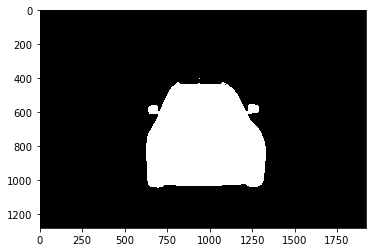

['0004d4463b50_01', 'jpg']
/home/ubuntu/udacity-capstone/data/test_hq/0004d4463b50_01.jpg


In [43]:
print(np.array(Image.open(mask_filelist[0])).shape)
plt.imshow(Image.open(mask_filelist[0]))
plt.show()
print(test_filelist[0][len(TEST_IMG_DIR):].split('.'))
print(test_filelist[0])

In [ ]:
# For generating submission file to Kaggle, using run-length encoding of the predicted masks

import scipy

%cd $DATA_DIR
with open('submission.csv', 'w+') as f:
    f.write('img,rle_mask\n')
    for file_batch in chunker(test_filelist, 32):
        test_img_batch = np.array([np.array(Image.open(fname).resize((256, 256))) for fname in file_batch])
        preds = np.around(model.predict(test_img_batch))
        for i, filename in enumerate(file_batch):
            img_id, _ = filename[len(TEST_IMG_DIR):].split('.')
            resized_img = scipy.misc.imresize(preds[i].squeeze(), (1280, 1918), interp='nearest')
            rle = rle_to_string(rle_encode(resized_img / 255))
            f.write('{},{}\n'.format(img_id, rle))

/home/ubuntu/udacity-capstone/data


In [ ]:
import scipy

for file_batch in chunker(test_filelist, 32):
    test_img_batch = np.array([np.array(Image.open(fname).resize(resize_to)) for fname in file_batch])
    preds = np.around(model.predict(test_img_batch))
    for i, filename in enumerate(file_batch):
        plt.imshow(Image.open(filename))
        plt.show()
        plt.imshow(preds[i].squeeze())
        plt.show()
        resized_img = scipy.misc.imresize(preds[i].squeeze(), (1280, 1918))
        resized_img = resized_img > 127
        resized_img = resized_img * 1
        print(resized_img)
        plt.imshow(resized_img)
        plt.show()

In [ ]:
import scipy

%cd $DATA_DIR
with open('submission-augmented.csv', 'w+') as f:
    f.write('img,rle_mask\n')
    for file_batch in chunker(test_filelist, 32):
        test_img_batch = np.array([np.array(Image.open(fname).resize(resize_to)) for fname in file_batch])
        preds = np.around(model.predict(test_img_batch))
        for i, filename in enumerate(file_batch):
            img_id = filename[len(TEST_IMG_DIR):]
            resized_img = scipy.misc.imresize(preds[i].squeeze(), (1280, 1918))
            resized_img = resized_img > 127
            resized_img = resized_img * 1
            rle = rle_to_string(rle_encode(resized_img))
            f.write('{},{}\n'.format(img_id, rle))

/home/ubuntu/udacity-capstone/data


In [ ]:
!kg submit submission-short.csv -u $KAGGLE_USERNAME -p $KAGGLE_PASSWORD -c carvana-image-masking-challenge -m "My submission"

In [ ]:
!cat submission.csv | wc -l

In [ ]:
from IPython.display import FileLink
FileLink('submission.csv')